## pre-test 

In [1]:
# DummyDataset read.pt
from train import DummyDataset

# raed .pt data sample
dataset = DummyDataset("./data/RAVDESS/train")  # or ./data_hdtf_train
sample = dataset[0]  # 取第0个样本

print("✅ Sample loaded:")
for k, v in sample.items():
    print(f"{k}: {type(v)}, shape: {v.shape if hasattr(v, 'shape') else v}")


/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


✅ Sample loaded:
audio: <class 'torch.Tensor'>, shape: torch.Size([67925])
blendshape: <class 'torch.Tensor'>, shape: torch.Size([127, 52])
level: <class 'int'>, shape: 4
person: <class 'int'>, shape: 22


In [2]:
#test EmoTalkLoss forward
from loss_v0002 import EmoTalkLoss

loss_fn = EmoTalkLoss(region_weighted=True)

output = sample['blendshape'].unsqueeze(0)  # 模拟 batch (1, F, 52)
target = sample['blendshape'].unsqueeze(0)

loss, logs = loss_fn(output, target)

print("✅ Loss computed:", loss.item())
print("📊 Loss components:", logs)


✅ Loss computed: 4.2081839637830853e-05
📊 Loss components: {'main': 0.0, 'smooth': 0.00042081839637830853, 'vel': 0.0, 'total': 4.2081839637830853e-05}


In [3]:
#sanity check
import os
import torch
from torch.utils.data import DataLoader
from train import DummyDataset
from loss_v0002 import EmoTalkLoss
from tqdm import tqdm

# === Config ===
DATA_DIR = "./data/RAVDESS/train"  # or ./data_hdtf_train
BATCH_SIZE = 1
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# === Load Dataset ===
dataset = DummyDataset(DATA_DIR)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False)
loss_fn = EmoTalkLoss(region_weighted=True)

# === Run sanity check ===
print(f"🔍 Running sanity check on {len(dataset)} samples in {DATA_DIR}")
error_count = 0

for idx, batch in enumerate(tqdm(dataloader)):
    try:
        if not isinstance(batch, dict):
            raise TypeError(f"Sample {idx} is not a dict: {type(batch)}")

        target = batch['blendshape'].to(DEVICE)  # shape: (1, F, 52)
        pred = target.clone().detach()  # simulate prediction
        _loss, _ = loss_fn(pred, target)

    except Exception as e:
        print(f"❌ Error in sample {idx}: {e}")
        error_count += 1

if error_count == 0:
    print("✅ All samples passed sanity check!")
else:
    print(f"⚠️ {error_count} samples failed sanity check. Check logs above.")


🔍 Running sanity check on 921 samples in ./data/RAVDESS/train


100%|████████████████████████████████████████████████████████| 921/921 [00:11<00:00, 79.06it/s]

✅ All samples passed sanity check!


In [2]:
print("Batch content:", batch)


Batch content: {'audio': tensor([[0., 0., 0.,  ..., 0., 0., 0.]]), 'blendshape': tensor([[[6.2879e-02, 6.3090e-02, 2.0272e-01,  ..., 1.7962e-01,
          1.9039e-01, 7.4940e-04],
         [7.0628e-02, 7.1003e-02, 2.2944e-01,  ..., 2.1517e-01,
          2.2706e-01, 7.0857e-04],
         [6.5284e-02, 6.5362e-02, 2.2778e-01,  ..., 2.1907e-01,
          2.3117e-01, 7.0651e-04],
         ...,
         [5.3791e-01, 5.3937e-01, 5.4672e-02,  ..., 4.0174e-01,
          4.1492e-01, 8.7255e-04],
         [4.1815e-01, 4.1946e-01, 4.0919e-02,  ..., 3.1801e-01,
          3.2691e-01, 6.7192e-04],
         [1.8665e-02, 1.8866e-02, 2.7543e-03,  ..., 1.2428e-02,
          1.3401e-02, 3.1247e-05]]]), 'level': tensor([2]), 'person': tensor([19])}


In [3]:
from collections import Counter

levels = []
persons = []

for i in range(len(train_dataset)):
    sample = train_dataset[i]
    levels.append(int(sample['level']))   # 👈 直接转 int 就行
    persons.append(int(sample['person']))

print("👁‍🗨 Level :", Counter(levels))
print("🧍 Person largest ID:", max(persons))


👁‍🗨 Level 分布: Counter({6: 160, 7: 159, 4: 155, 2: 154, 5: 149, 3: 144})
🧍 Person 最大 ID: 24


In [3]:
import torch

torch.cuda.empty_cache()


/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_2054086/4043305345.py:16: UserWarning: Glyph 129504 (\N{BRAIN}) missing from current font.
  plt.tight_layout()
/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 129504 (\N{BRAIN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


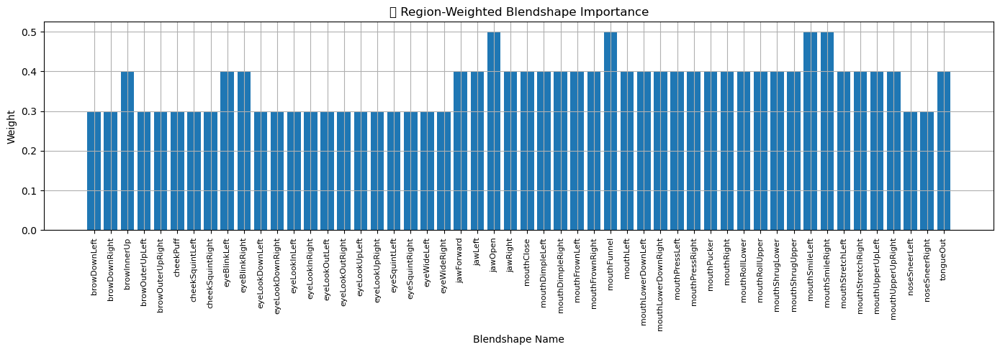

In [1]:
import matplotlib.pyplot as plt
from loss_v0003 import RegionWeightedL1Loss, model_bsList

# get loss，get weight
loss_fn = RegionWeightedL1Loss()
weights = loss_fn.weight.cpu().numpy()

# plot
plt.figure(figsize=(14, 5))
plt.bar(range(len(weights)), weights)
plt.xticks(range(len(weights)), model_bsList, rotation=90, fontsize=8)
plt.title("🧠 Region-Weighted Blendshape Importance")
plt.xlabel("Blendshape Name")
plt.ylabel("Weight")
plt.grid(True)
plt.tight_layout()
plt.show()


## train with RAVDESS(emotalk_v0002)

In [1]:
from Emotalk_model_v0002 import EmoTalk
from train import DummyDataset
from loss_v0002 import EmoTalkLoss
from torch.utils.data import DataLoader
import torch
import os
from tqdm import tqdm
from types import SimpleNamespace
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
# === configuration ===
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EPOCHS = 10
LR = 1e-4
SAVE_PATH = 'emotalk_finetuned.pth'
BATCH_SIZE = 1

args = SimpleNamespace(
    feature_dim=1024,
    bs_dim=52,
    device=DEVICE,
    batch_size = BATCH_SIZE,
    max_seq_len=512,
    period=20,
    emotion_dim=256,
    emo_gru_hidden=128,
    emo_gru_layers=2,
    transformer_layers=4,
    transformer_heads=8,
    transformer_dim=512,
    num_emotions = 8,
    num_person = 25
)
# === data ===
train_dataset = DummyDataset('./data/RAVDESS/train')
val_dataset = DummyDataset('./data/RAVDESS/val')

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# === model and optimizer ===
model = EmoTalk(args).to(DEVICE)
loss_fn = EmoTalkLoss(region_weighted=True)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

# === train loop ===
for epoch in range(EPOCHS):
    model.train()
    total_loss = 0.0
    logs_accum = {"main": 0, "smooth": 0, "vel": 0, "total": 0}

    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        blendshape = batch["blendshape"].to(DEVICE)
        # 
        args.target_len = blendshape.size(1)
        pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])  # 假设输入接口存在

        loss, logs = loss_fn(pred, blendshape)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        for k in logs:
            logs_accum[k] += logs[k]

    avg_loss = total_loss / len(train_loader)
    print(f"\n[Epoch {epoch+1}] Train Loss: {avg_loss:.4f}")
    print(f"  -> main: {logs_accum['main']:.4f} | smooth: {logs_accum['smooth']:.4f} | vel: {logs_accum['vel']:.4f}")

    # === validation ===
    model.eval()
    with torch.no_grad():
        val_loss = 0.0
        for batch in val_loader:
            blendshape = batch["blendshape"].to(DEVICE)
            args.target_len = blendshape.size(1)
            pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])
            loss, _ = loss_fn(pred, blendshape)
            val_loss += loss.item()
        print(f"  -> Val Loss: {val_loss / len(val_loader):.4f}")

    # === 保存模型 ===
    torch.save(model.state_dict(), SAVE_PATH)
    print(f"✅ Model saved to {SAVE_PATH}\n")


/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.weight', 'lm_head.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model fr

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:   0%|                                                 | 1/921 [00:00<13:55,  1.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1:   0%|                                                 | 2/921 [00:01<07:41,  1.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])


Epoch 1:   0%|▏                                                | 3/921 [00:01<05:45,  2.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:   0%|▏                                                | 4/921 [00:01<04:41,  3.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1:   1%|▎                                                | 5/921 [00:01<04:08,  3.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:   1%|▎                                                | 6/921 [00:01<03:48,  4.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1:   1%|▎                                                | 7/921 [00:02<03:35,  4.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1:   1%|▍                                                | 8/921 [00:02<03:27,  4.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:   1%|▍                                                | 9/921 [00:02<03:23,  4.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1:   1%|▌                                               | 10/921 [00:02<03:19,  4.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1:   1%|▌                                               | 11/921 [00:03<03:21,  4.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 1:   1%|▋                                               | 12/921 [00:03<03:25,  4.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:   1%|▋                                               | 13/921 [00:03<03:24,  4.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1:   2%|▋                                               | 14/921 [00:03<03:20,  4.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1:   2%|▊                                               | 15/921 [00:03<03:20,  4.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1:   2%|▊                                               | 16/921 [00:04<03:20,  4.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 1:   2%|▉                                               | 17/921 [00:04<03:21,  4.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:   2%|▉                                               | 18/921 [00:04<03:20,  4.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1:   2%|▉                                               | 19/921 [00:04<03:22,  4.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:   2%|█                                               | 20/921 [00:05<03:23,  4.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1:   2%|█                                               | 21/921 [00:05<03:23,  4.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1:   2%|█▏                                              | 22/921 [00:05<03:16,  4.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1:   2%|█▏                                              | 23/921 [00:05<03:14,  4.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1:   3%|█▎                                              | 24/921 [00:05<03:12,  4.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:   3%|█▎                                              | 26/921 [00:06<03:07,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 1:   3%|█▍                                              | 27/921 [00:06<03:11,  4.66it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:   3%|█▍                                              | 28/921 [00:06<03:10,  4.68it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 1:   3%|█▌                                              | 29/921 [00:06<03:09,  4.70it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:   3%|█▌                                              | 30/921 [00:07<03:10,  4.67it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:   3%|█▌                                              | 31/921 [00:07<03:11,  4.64it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:   3%|█▋                                              | 32/921 [00:07<03:10,  4.67it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:   4%|█▋                                              | 33/921 [00:07<03:08,  4.70it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:   4%|█▊                                              | 34/921 [00:08<03:09,  4.68it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:   4%|█▊                                              | 35/921 [00:08<03:07,  4.73it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:   4%|█▉                                              | 36/921 [00:08<03:05,  4.77it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:   4%|█▉                                              | 37/921 [00:08<03:05,  4.76it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:   4%|█▉                                              | 38/921 [00:08<03:05,  4.76it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:   4%|██                                              | 39/921 [00:09<03:10,  4.63it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:   4%|██                                              | 40/921 [00:09<03:07,  4.70it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:   4%|██▏                                             | 41/921 [00:09<03:05,  4.73it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:   5%|██▏                                             | 42/921 [00:09<03:05,  4.75it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 1:   5%|██▏                                             | 43/921 [00:09<03:04,  4.75it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:   5%|██▎                                             | 44/921 [00:10<03:05,  4.73it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:   5%|██▎                                             | 45/921 [00:10<03:03,  4.77it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])


Epoch 1:   5%|██▍                                             | 46/921 [00:10<03:05,  4.70it/s]

🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:   5%|██▍                                             | 47/921 [00:10<03:05,  4.70it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:   5%|██▌                                             | 48/921 [00:10<03:05,  4.72it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:   5%|██▌                                             | 49/921 [00:11<03:03,  4.76it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:   5%|██▌                                             | 50/921 [00:11<03:02,  4.76it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:   6%|██▋                                             | 51/921 [00:11<03:04,  4.72it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 1:   6%|██▋                                             | 52/921 [00:11<03:06,  4.67it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:   6%|██▊                                             | 53/921 [00:12<03:04,  4.72it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:   6%|██▊                                             | 54/921 [00:12<03:03,  4.72it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:   6%|██▊                                             | 55/921 [00:12<03:03,  4.72it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:   6%|██▉                                             | 56/921 [00:12<03:08,  4.60it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:   6%|██▉                                             | 57/921 [00:12<03:06,  4.63it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:   6%|███                                             | 58/921 [00:13<03:04,  4.69it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:   6%|███                                             | 59/921 [00:13<03:01,  4.75it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:   7%|███▏                                            | 60/921 [00:13<03:02,  4.71it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:   7%|███▏                                            | 61/921 [00:13<03:00,  4.75it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:   7%|███▏                                            | 62/921 [00:13<02:58,  4.82it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:   7%|███▎                                            | 63/921 [00:14<02:59,  4.78it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:   7%|███▎                                            | 64/921 [00:14<02:59,  4.78it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:   7%|███▍                                            | 65/921 [00:14<02:59,  4.78it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:   7%|███▍                                            | 66/921 [00:14<02:59,  4.77it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 1:   7%|███▍                                            | 67/921 [00:15<02:59,  4.77it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:   7%|███▌                                            | 68/921 [00:15<02:59,  4.76it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:   7%|███▌                                            | 69/921 [00:15<03:00,  4.73it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:   8%|███▋                                            | 70/921 [00:15<02:59,  4.75it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 1:   8%|███▋                                            | 71/921 [00:15<03:01,  4.68it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:   8%|███▊                                            | 72/921 [00:16<03:00,  4.70it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:   8%|███▊                                            | 73/921 [00:16<03:01,  4.67it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1:   8%|███▊                                            | 74/921 [00:16<03:02,  4.65it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:   8%|███▉                                            | 75/921 [00:16<02:59,  4.71it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:   8%|███▉                                            | 76/921 [00:16<02:58,  4.73it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:   8%|████                                            | 77/921 [00:17<02:58,  4.73it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:   8%|████                                            | 78/921 [00:17<02:59,  4.70it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 1:   9%|████                                            | 79/921 [00:17<02:59,  4.69it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:   9%|████▏                                           | 80/921 [00:17<02:56,  4.76it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:   9%|████▏                                           | 81/921 [00:17<02:54,  4.81it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:   9%|████▎                                           | 82/921 [00:18<02:55,  4.78it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 1:   9%|████▎                                           | 83/921 [00:18<02:58,  4.70it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:   9%|████▍                                           | 84/921 [00:18<02:56,  4.74it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:   9%|████▍                                           | 85/921 [00:18<02:56,  4.73it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:   9%|████▍                                           | 86/921 [00:19<02:56,  4.74it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:   9%|████▌                                           | 87/921 [00:19<02:55,  4.76it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  10%|████▌                                           | 88/921 [00:19<02:55,  4.75it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  10%|████▋                                           | 89/921 [00:19<02:54,  4.78it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  10%|████▋                                           | 90/921 [00:19<02:53,  4.80it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  10%|████▋                                           | 91/921 [00:20<02:51,  4.85it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  10%|████▊                                           | 92/921 [00:20<02:51,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 1:  10%|████▊                                           | 93/921 [00:20<02:52,  4.79it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  10%|████▉                                           | 94/921 [00:20<02:52,  4.78it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  10%|████▉                                           | 95/921 [00:20<02:52,  4.80it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  10%|█████                                           | 96/921 [00:21<02:53,  4.75it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  11%|█████                                           | 97/921 [00:21<02:53,  4.75it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  11%|█████                                           | 98/921 [00:21<02:51,  4.80it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  11%|█████▏                                          | 99/921 [00:21<02:50,  4.81it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  11%|█████                                          | 100/921 [00:21<02:51,  4.78it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  11%|█████▏                                         | 101/921 [00:22<02:52,  4.76it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  11%|█████▏                                         | 102/921 [00:22<02:51,  4.76it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  11%|█████▎                                         | 103/921 [00:22<02:50,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  11%|█████▎                                         | 104/921 [00:22<02:50,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  11%|█████▎                                         | 105/921 [00:22<02:49,  4.82it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  12%|█████▍                                         | 106/921 [00:23<02:50,  4.78it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1:  12%|█████▍                                         | 107/921 [00:23<02:53,  4.69it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  12%|█████▌                                         | 108/921 [00:23<02:53,  4.68it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  12%|█████▌                                         | 109/921 [00:23<02:53,  4.67it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  12%|█████▌                                         | 110/921 [00:24<02:52,  4.70it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  12%|█████▋                                         | 111/921 [00:24<02:51,  4.72it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1:  12%|█████▋                                         | 112/921 [00:24<02:49,  4.76it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  12%|█████▊                                         | 113/921 [00:24<02:48,  4.80it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  12%|█████▊                                         | 114/921 [00:24<02:47,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  12%|█████▊                                         | 115/921 [00:25<02:47,  4.80it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  13%|█████▉                                         | 116/921 [00:25<02:49,  4.75it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 1:  13%|█████▉                                         | 117/921 [00:25<02:51,  4.70it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  13%|██████                                         | 118/921 [00:25<02:48,  4.77it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 1:  13%|██████                                         | 119/921 [00:25<02:51,  4.69it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  13%|██████                                         | 120/921 [00:26<02:51,  4.67it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  13%|██████▏                                        | 121/921 [00:26<02:49,  4.73it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  13%|██████▏                                        | 122/921 [00:26<02:47,  4.77it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  13%|██████▎                                        | 123/921 [00:26<02:48,  4.75it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  13%|██████▎                                        | 124/921 [00:27<02:46,  4.79it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  14%|██████▍                                        | 125/921 [00:27<02:45,  4.80it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1:  14%|██████▍                                        | 126/921 [00:27<02:46,  4.79it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  14%|██████▍                                        | 127/921 [00:27<02:43,  4.87it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])


Epoch 1:  14%|██████▌                                        | 128/921 [00:27<02:46,  4.76it/s]

🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  14%|██████▌                                        | 129/921 [00:28<02:45,  4.78it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  14%|██████▋                                        | 130/921 [00:28<02:45,  4.79it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  14%|██████▋                                        | 131/921 [00:28<02:44,  4.81it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:  14%|██████▋                                        | 132/921 [00:28<02:43,  4.83it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:  14%|██████▊                                        | 133/921 [00:28<02:42,  4.85it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  15%|██████▊                                        | 134/921 [00:29<02:43,  4.80it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 1:  15%|██████▉                                        | 135/921 [00:29<02:44,  4.76it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  15%|██████▉                                        | 136/921 [00:29<02:44,  4.77it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  15%|██████▉                                        | 137/921 [00:29<02:43,  4.79it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  15%|███████                                        | 138/921 [00:29<02:42,  4.82it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1:  15%|███████                                        | 139/921 [00:30<02:43,  4.78it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  15%|███████▏                                       | 140/921 [00:30<02:40,  4.87it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1:  15%|███████▏                                       | 141/921 [00:30<02:41,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1:  15%|███████▏                                       | 142/921 [00:30<02:41,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1:  16%|███████▎                                       | 144/921 [00:31<02:39,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1:  16%|███████▍                                       | 145/921 [00:31<02:38,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1:  16%|███████▍                                       | 146/921 [00:31<02:38,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1:  16%|███████▌                                       | 147/921 [00:31<02:40,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1:  16%|███████▌                                       | 148/921 [00:31<02:41,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:  16%|███████▌                                       | 149/921 [00:32<02:41,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1:  16%|███████▋                                       | 150/921 [00:32<02:40,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1:  16%|███████▋                                       | 151/921 [00:32<02:41,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1:  17%|███████▊                                       | 152/921 [00:32<02:41,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1:  17%|███████▊                                       | 153/921 [00:33<02:41,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1:  17%|███████▊                                       | 154/921 [00:33<02:40,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 1:  17%|███████▉                                       | 155/921 [00:33<02:42,  4.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1:  17%|████████                                       | 157/921 [00:33<02:39,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:  17%|████████                                       | 158/921 [00:34<02:37,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1:  17%|████████                                       | 159/921 [00:34<02:37,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:  17%|████████▏                                      | 160/921 [00:34<02:37,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1:  17%|████████▏                                      | 161/921 [00:34<02:36,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1:  18%|████████▎                                      | 162/921 [00:34<02:38,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:  18%|████████▎                                      | 163/921 [00:35<02:38,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1:  18%|████████▎                                      | 164/921 [00:35<02:37,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1:  18%|████████▍                                      | 165/921 [00:35<02:37,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1:  18%|████████▍                                      | 166/921 [00:35<02:38,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1:  18%|████████▌                                      | 168/921 [00:36<02:36,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  18%|████████▌                                      | 169/921 [00:36<02:36,  4.80it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  18%|████████▋                                      | 170/921 [00:36<02:35,  4.82it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  19%|████████▋                                      | 171/921 [00:36<02:35,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  19%|████████▊                                      | 172/921 [00:36<02:33,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1:  19%|████████▊                                      | 173/921 [00:37<02:32,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 1:  19%|████████▉                                      | 174/921 [00:37<02:36,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1:  19%|████████▉                                      | 175/921 [00:37<02:35,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:  19%|█████████                                      | 177/921 [00:38<02:32,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  19%|█████████                                      | 178/921 [00:38<02:30,  4.95it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1:  20%|█████████▏                                     | 180/921 [00:38<02:29,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  20%|█████████▏                                     | 181/921 [00:38<02:28,  4.99it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  20%|█████████▎                                     | 182/921 [00:39<02:28,  4.96it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 1:  20%|█████████▎                                     | 183/921 [00:39<02:31,  4.88it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  20%|█████████▍                                     | 184/921 [00:39<02:30,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  20%|█████████▍                                     | 185/921 [00:39<02:31,  4.85it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  20%|█████████▍                                     | 186/921 [00:39<02:31,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  20%|█████████▌                                     | 187/921 [00:40<02:30,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  20%|█████████▌                                     | 188/921 [00:40<02:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  21%|█████████▋                                     | 190/921 [00:40<02:27,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  21%|█████████▋                                     | 191/921 [00:40<02:28,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  21%|█████████▊                                     | 192/921 [00:41<02:29,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  21%|█████████▊                                     | 193/921 [00:41<02:29,  4.86it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1:  21%|█████████▉                                     | 194/921 [00:41<02:29,  4.85it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1:  21%|█████████▉                                     | 195/921 [00:41<02:29,  4.87it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  21%|██████████                                     | 196/921 [00:41<02:28,  4.88it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  21%|██████████                                     | 197/921 [00:42<02:29,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  21%|██████████                                     | 198/921 [00:42<02:29,  4.85it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  22%|██████████▏                                    | 199/921 [00:42<02:27,  4.89it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  22%|██████████▏                                    | 200/921 [00:42<02:26,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1:  22%|██████████▎                                    | 201/921 [00:42<02:27,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1:  22%|██████████▎                                    | 202/921 [00:43<02:29,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  22%|██████████▎                                    | 203/921 [00:43<02:28,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1:  22%|██████████▍                                    | 204/921 [00:43<02:27,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 1:  22%|██████████▍                                    | 205/921 [00:43<02:30,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1:  22%|██████████▌                                    | 206/921 [00:43<02:30,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1:  23%|██████████▌                                    | 208/921 [00:44<02:27,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:  23%|██████████▋                                    | 209/921 [00:44<02:26,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1:  23%|██████████▋                                    | 210/921 [00:44<02:26,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 1:  23%|██████████▊                                    | 212/921 [00:45<02:26,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1:  23%|██████████▉                                    | 214/921 [00:45<02:24,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  23%|██████████▉                                    | 215/921 [00:45<02:24,  4.88it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  23%|███████████                                    | 216/921 [00:46<02:24,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  24%|███████████                                    | 217/921 [00:46<02:25,  4.84it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  24%|███████████                                    | 218/921 [00:46<02:25,  4.84it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  24%|███████████▏                                   | 219/921 [00:46<02:24,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  24%|███████████▏                                   | 220/921 [00:46<02:24,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  24%|███████████▎                                   | 221/921 [00:47<02:24,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  24%|███████████▎                                   | 222/921 [00:47<02:23,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  24%|███████████▍                                   | 223/921 [00:47<02:22,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  24%|███████████▍                                   | 224/921 [00:47<02:22,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  24%|███████████▍                                   | 225/921 [00:47<02:22,  4.89it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  25%|███████████▌                                   | 226/921 [00:48<02:21,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  25%|███████████▌                                   | 227/921 [00:48<02:21,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  25%|███████████▋                                   | 228/921 [00:48<02:21,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  25%|███████████▋                                   | 229/921 [00:48<02:21,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  25%|███████████▋                                   | 230/921 [00:48<02:20,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  25%|███████████▊                                   | 231/921 [00:49<02:20,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  25%|███████████▊                                   | 232/921 [00:49<02:20,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  25%|███████████▉                                   | 233/921 [00:49<02:19,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])


Epoch 1:  25%|███████████▉                                   | 234/921 [00:49<02:21,  4.86it/s]

🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 1:  26%|███████████▉                                   | 235/921 [00:49<02:22,  4.80it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  26%|████████████                                   | 236/921 [00:50<02:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  26%|████████████                                   | 237/921 [00:50<02:20,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 1:  26%|████████████▏                                  | 238/921 [00:50<02:22,  4.81it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  26%|████████████▏                                  | 239/921 [00:50<02:21,  4.81it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  26%|████████████▏                                  | 240/921 [00:50<02:22,  4.80it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  26%|████████████▎                                  | 241/921 [00:51<02:21,  4.81it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  26%|████████████▎                                  | 242/921 [00:51<02:22,  4.77it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  26%|████████████▍                                  | 243/921 [00:51<02:22,  4.74it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  26%|████████████▍                                  | 244/921 [00:51<02:21,  4.79it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1:  27%|████████████▌                                  | 245/921 [00:52<02:21,  4.78it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  27%|████████████▌                                  | 246/921 [00:52<02:19,  4.84it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  27%|████████████▌                                  | 247/921 [00:52<02:18,  4.87it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  27%|████████████▋                                  | 248/921 [00:52<02:18,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  27%|████████████▋                                  | 249/921 [00:52<02:22,  4.73it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  27%|████████████▊                                  | 250/921 [00:53<02:21,  4.73it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  27%|████████████▊                                  | 251/921 [00:53<02:20,  4.78it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  27%|████████████▊                                  | 252/921 [00:53<02:19,  4.80it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  27%|████████████▉                                  | 253/921 [00:53<02:18,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  28%|████████████▉                                  | 254/921 [00:53<02:17,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  28%|█████████████                                  | 255/921 [00:54<02:17,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  28%|█████████████                                  | 256/921 [00:54<02:16,  4.88it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  28%|█████████████                                  | 257/921 [00:54<02:15,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  28%|█████████████▏                                 | 258/921 [00:54<02:15,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  28%|█████████████▏                                 | 259/921 [00:54<02:15,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  28%|█████████████▎                                 | 260/921 [00:55<02:15,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  28%|█████████████▎                                 | 261/921 [00:55<02:15,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  28%|█████████████▎                                 | 262/921 [00:55<02:15,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  29%|█████████████▍                                 | 263/921 [00:55<02:16,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1:  29%|█████████████▍                                 | 264/921 [00:55<02:15,  4.84it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  29%|█████████████▌                                 | 265/921 [00:56<02:16,  4.81it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  29%|█████████████▌                                 | 266/921 [00:56<02:16,  4.81it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  29%|█████████████▋                                 | 267/921 [00:56<02:15,  4.84it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1:  29%|█████████████▋                                 | 268/921 [00:56<02:12,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1:  29%|█████████████▋                                 | 269/921 [00:56<02:13,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1:  29%|█████████████▊                                 | 270/921 [00:57<02:13,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 1:  29%|█████████████▊                                 | 271/921 [00:57<02:14,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1:  30%|█████████████▉                                 | 272/921 [00:57<02:14,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1:  30%|█████████████▉                                 | 273/921 [00:57<02:14,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  30%|█████████████▉                                 | 274/921 [00:57<02:13,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1:  30%|██████████████                                 | 275/921 [00:58<02:14,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  30%|██████████████                                 | 276/921 [00:58<02:13,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 1:  30%|██████████████▏                                | 277/921 [00:58<02:13,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:  30%|██████████████▏                                | 278/921 [00:58<02:13,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1:  30%|██████████████▏                                | 279/921 [00:59<02:12,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:  30%|██████████████▎                                | 280/921 [00:59<02:11,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1:  31%|██████████████▎                                | 281/921 [00:59<02:11,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 1:  31%|██████████████▍                                | 282/921 [00:59<02:11,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1:  31%|██████████████▍                                | 284/921 [01:00<02:10,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  31%|██████████████▌                                | 285/921 [01:00<02:10,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 1:  31%|██████████████▌                                | 286/921 [01:00<02:12,  4.80it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  31%|██████████████▋                                | 287/921 [01:00<02:11,  4.82it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  31%|██████████████▋                                | 288/921 [01:00<02:11,  4.82it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  31%|██████████████▋                                | 289/921 [01:01<02:10,  4.86it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  31%|██████████████▊                                | 290/921 [01:01<02:11,  4.80it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  32%|██████████████▊                                | 291/921 [01:01<02:10,  4.82it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  32%|██████████████▉                                | 292/921 [01:01<02:09,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  32%|██████████████▉                                | 293/921 [01:01<02:09,  4.85it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 1:  32%|███████████████                                | 294/921 [01:02<02:08,  4.87it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1:  32%|███████████████                                | 295/921 [01:02<02:06,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:  32%|███████████████▏                               | 297/921 [01:02<02:06,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:  32%|███████████████▎                               | 299/921 [01:03<02:06,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1:  33%|███████████████▎                               | 300/921 [01:03<02:07,  4.87it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  33%|███████████████▎                               | 301/921 [01:03<02:08,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  33%|███████████████▍                               | 302/921 [01:03<02:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  33%|███████████████▍                               | 303/921 [01:03<02:08,  4.81it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  33%|███████████████▌                               | 304/921 [01:04<02:08,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:  33%|███████████████▌                               | 305/921 [01:04<02:08,  4.81it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  33%|███████████████▌                               | 306/921 [01:04<02:08,  4.80it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  33%|███████████████▋                               | 307/921 [01:04<02:06,  4.86it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  33%|███████████████▋                               | 308/921 [01:05<02:06,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  34%|███████████████▊                               | 309/921 [01:05<02:06,  4.82it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:  34%|███████████████▊                               | 310/921 [01:05<02:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  34%|███████████████▊                               | 311/921 [01:05<02:06,  4.81it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1:  34%|███████████████▉                               | 312/921 [01:05<02:05,  4.83it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 1:  34%|███████████████▉                               | 313/921 [01:06<02:04,  4.87it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  34%|████████████████                               | 314/921 [01:06<02:05,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  34%|████████████████                               | 315/921 [01:06<02:07,  4.75it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  34%|████████████████▏                              | 316/921 [01:06<02:07,  4.76it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  34%|████████████████▏                              | 317/921 [01:06<02:06,  4.79it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 1:  35%|████████████████▏                              | 318/921 [01:07<02:04,  4.83it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  35%|████████████████▎                              | 319/921 [01:07<02:05,  4.78it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  35%|████████████████▎                              | 320/921 [01:07<02:05,  4.79it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  35%|████████████████▍                              | 321/921 [01:07<02:04,  4.81it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  35%|████████████████▍                              | 322/921 [01:07<02:03,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 1:  35%|████████████████▍                              | 323/921 [01:08<02:05,  4.76it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  35%|████████████████▌                              | 324/921 [01:08<02:03,  4.84it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  35%|████████████████▌                              | 325/921 [01:08<02:03,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 1:  35%|████████████████▋                              | 326/921 [01:08<02:03,  4.81it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 1:  36%|████████████████▋                              | 327/921 [01:08<02:04,  4.77it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1:  36%|████████████████▋                              | 328/921 [01:09<02:03,  4.82it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1:  36%|████████████████▊                              | 329/921 [01:09<02:01,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  36%|████████████████▊                              | 330/921 [01:09<02:01,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  36%|████████████████▉                              | 331/921 [01:09<02:01,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1:  36%|████████████████▉                              | 332/921 [01:09<02:01,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1:  36%|████████████████▉                              | 333/921 [01:10<02:02,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:  36%|█████████████████                              | 334/921 [01:10<02:03,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1:  36%|█████████████████▏                             | 336/921 [01:10<02:00,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  37%|█████████████████▏                             | 337/921 [01:11<01:59,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  37%|█████████████████▏                             | 338/921 [01:11<02:00,  4.82it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 1:  37%|█████████████████▎                             | 339/921 [01:11<02:00,  4.83it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  37%|█████████████████▎                             | 340/921 [01:11<01:59,  4.84it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  37%|█████████████████▍                             | 341/921 [01:11<01:59,  4.87it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  37%|█████████████████▍                             | 342/921 [01:12<01:58,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 1:  37%|█████████████████▌                             | 343/921 [01:12<02:00,  4.82it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  37%|█████████████████▌                             | 344/921 [01:12<01:59,  4.84it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  37%|█████████████████▌                             | 345/921 [01:12<01:58,  4.85it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  38%|█████████████████▋                             | 346/921 [01:12<01:59,  4.83it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  38%|█████████████████▋                             | 347/921 [01:13<01:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  38%|█████████████████▊                             | 348/921 [01:13<01:57,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 1:  38%|█████████████████▊                             | 349/921 [01:13<01:57,  4.86it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  38%|█████████████████▊                             | 350/921 [01:13<01:57,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  38%|█████████████████▉                             | 351/921 [01:13<01:56,  4.88it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 1:  38%|█████████████████▉                             | 352/921 [01:14<01:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  38%|██████████████████                             | 353/921 [01:14<01:56,  4.87it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  38%|██████████████████                             | 354/921 [01:14<01:56,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  39%|██████████████████                             | 355/921 [01:14<01:56,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  39%|██████████████████▏                            | 356/921 [01:14<01:55,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  39%|██████████████████▏                            | 357/921 [01:15<01:55,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1:  39%|██████████████████▎                            | 358/921 [01:15<01:54,  4.91it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  39%|██████████████████▎                            | 359/921 [01:15<01:54,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:  39%|██████████████████▎                            | 360/921 [01:15<01:54,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  39%|██████████████████▍                            | 362/921 [01:16<01:53,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1:  40%|██████████████████▌                            | 364/921 [01:16<01:53,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1:  40%|██████████████████▋                            | 365/921 [01:16<01:53,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1:  40%|██████████████████▋                            | 366/921 [01:16<01:54,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 1:  40%|██████████████████▋                            | 367/921 [01:17<01:55,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1:  40%|██████████████████▊                            | 369/921 [01:17<01:53,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1:  40%|██████████████████▉                            | 370/921 [01:17<01:53,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1:  40%|██████████████████▉                            | 371/921 [01:18<01:54,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1:  40%|██████████████████▉                            | 372/921 [01:18<01:54,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1:  41%|███████████████████                            | 374/921 [01:18<01:51,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  41%|███████████████████▏                           | 375/921 [01:18<01:51,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1:  41%|███████████████████▏                           | 376/921 [01:19<01:51,  4.87it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  41%|███████████████████▏                           | 377/921 [01:19<01:50,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1:  41%|███████████████████▎                           | 378/921 [01:19<01:50,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 1:  41%|███████████████████▎                           | 379/921 [01:19<01:51,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1:  41%|███████████████████▍                           | 380/921 [01:19<01:52,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1:  41%|███████████████████▍                           | 381/921 [01:20<01:52,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1:  41%|███████████████████▍                           | 382/921 [01:20<01:52,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1:  42%|███████████████████▌                           | 383/921 [01:20<01:52,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:  42%|███████████████████▌                           | 384/921 [01:20<01:52,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  42%|███████████████████▋                           | 385/921 [01:20<01:51,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1:  42%|███████████████████▋                           | 387/921 [01:21<01:49,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  42%|███████████████████▊                           | 388/921 [01:21<01:48,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 1:  42%|███████████████████▊                           | 389/921 [01:21<01:49,  4.84it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  42%|███████████████████▉                           | 390/921 [01:21<01:48,  4.87it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  42%|███████████████████▉                           | 391/921 [01:22<01:47,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1:  43%|████████████████████                           | 393/921 [01:22<01:47,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  43%|████████████████████                           | 394/921 [01:22<01:47,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  43%|████████████████████▏                          | 395/921 [01:22<01:47,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])


Epoch 1:  43%|████████████████████▏                          | 396/921 [01:23<01:50,  4.76it/s]

🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 1:  43%|████████████████████▎                          | 397/921 [01:23<01:48,  4.81it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  43%|████████████████████▎                          | 399/921 [01:23<01:47,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1:  44%|████████████████████▍                          | 401/921 [01:24<01:46,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1:  44%|████████████████████▌                          | 402/921 [01:24<01:45,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  44%|████████████████████▌                          | 403/921 [01:24<01:46,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1:  44%|████████████████████▌                          | 404/921 [01:24<01:45,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:  44%|████████████████████▋                          | 405/921 [01:25<01:46,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1:  44%|████████████████████▊                          | 407/921 [01:25<01:44,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  44%|████████████████████▊                          | 408/921 [01:25<01:44,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 1:  44%|████████████████████▊                          | 409/921 [01:25<01:44,  4.91it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  45%|████████████████████▉                          | 410/921 [01:26<01:44,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1:  45%|████████████████████▉                          | 411/921 [01:26<01:45,  4.83it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  45%|█████████████████████                          | 412/921 [01:26<01:46,  4.80it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  45%|█████████████████████                          | 413/921 [01:26<01:46,  4.79it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  45%|█████████████████████▏                         | 414/921 [01:26<01:45,  4.81it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  45%|█████████████████████▏                         | 415/921 [01:27<01:44,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  45%|█████████████████████▏                         | 416/921 [01:27<01:43,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  45%|█████████████████████▎                         | 417/921 [01:27<01:44,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  45%|█████████████████████▎                         | 418/921 [01:27<01:43,  4.88it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  45%|█████████████████████▍                         | 419/921 [01:27<01:43,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  46%|█████████████████████▍                         | 420/921 [01:28<01:42,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  46%|█████████████████████▍                         | 421/921 [01:28<01:41,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1:  46%|█████████████████████▌                         | 422/921 [01:28<01:42,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  46%|█████████████████████▌                         | 423/921 [01:28<01:43,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  46%|█████████████████████▋                         | 424/921 [01:28<01:43,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  46%|█████████████████████▋                         | 425/921 [01:29<01:42,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  46%|█████████████████████▋                         | 426/921 [01:29<01:42,  4.83it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  46%|█████████████████████▊                         | 427/921 [01:29<01:42,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  46%|█████████████████████▊                         | 428/921 [01:29<01:43,  4.78it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  47%|█████████████████████▉                         | 429/921 [01:29<01:42,  4.80it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  47%|█████████████████████▉                         | 430/921 [01:30<01:44,  4.70it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  47%|█████████████████████▉                         | 431/921 [01:30<01:44,  4.71it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:  47%|██████████████████████                         | 432/921 [01:30<01:42,  4.77it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  47%|██████████████████████                         | 433/921 [01:30<01:41,  4.79it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  47%|██████████████████████▏                        | 434/921 [01:31<01:41,  4.78it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  47%|██████████████████████▏                        | 435/921 [01:31<01:42,  4.76it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  47%|██████████████████████▏                        | 436/921 [01:31<01:41,  4.79it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  47%|██████████████████████▎                        | 437/921 [01:31<01:41,  4.77it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  48%|██████████████████████▎                        | 438/921 [01:31<01:40,  4.79it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  48%|██████████████████████▍                        | 439/921 [01:32<01:40,  4.78it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  48%|██████████████████████▍                        | 440/921 [01:32<01:38,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  48%|██████████████████████▌                        | 441/921 [01:32<01:38,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 1:  48%|██████████████████████▌                        | 442/921 [01:32<01:39,  4.83it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  48%|██████████████████████▌                        | 443/921 [01:32<01:38,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  48%|██████████████████████▋                        | 444/921 [01:33<01:38,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  48%|██████████████████████▋                        | 445/921 [01:33<01:39,  4.77it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  48%|██████████████████████▊                        | 446/921 [01:33<01:39,  4.77it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  49%|██████████████████████▊                        | 447/921 [01:33<01:39,  4.74it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:  49%|██████████████████████▊                        | 448/921 [01:33<01:38,  4.80it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  49%|██████████████████████▉                        | 449/921 [01:34<01:37,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  49%|██████████████████████▉                        | 450/921 [01:34<01:37,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  49%|███████████████████████                        | 451/921 [01:34<01:37,  4.84it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  49%|███████████████████████                        | 452/921 [01:34<01:36,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  49%|███████████████████████                        | 453/921 [01:34<01:36,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 1:  49%|███████████████████████▏                       | 454/921 [01:35<01:37,  4.79it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  49%|███████████████████████▏                       | 455/921 [01:35<01:37,  4.80it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  50%|███████████████████████▎                       | 456/921 [01:35<01:36,  4.82it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  50%|███████████████████████▎                       | 457/921 [01:35<01:36,  4.83it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  50%|███████████████████████▎                       | 458/921 [01:36<01:35,  4.83it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  50%|███████████████████████▍                       | 459/921 [01:36<01:35,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  50%|███████████████████████▍                       | 460/921 [01:36<01:35,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1:  50%|███████████████████████▌                       | 461/921 [01:36<01:34,  4.84it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:  50%|███████████████████████▌                       | 462/921 [01:36<01:34,  4.88it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])


Epoch 1:  50%|███████████████████████▋                       | 463/921 [01:37<01:38,  4.67it/s]

🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 1:  50%|███████████████████████▋                       | 464/921 [01:37<01:37,  4.68it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  50%|███████████████████████▋                       | 465/921 [01:37<01:36,  4.74it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  51%|███████████████████████▊                       | 466/921 [01:37<01:36,  4.73it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  51%|███████████████████████▊                       | 467/921 [01:37<01:36,  4.71it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  51%|███████████████████████▉                       | 468/921 [01:38<01:35,  4.77it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  51%|███████████████████████▉                       | 469/921 [01:38<01:35,  4.76it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  51%|███████████████████████▉                       | 470/921 [01:38<01:33,  4.81it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  51%|████████████████████████                       | 471/921 [01:38<01:33,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  51%|████████████████████████                       | 472/921 [01:38<01:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  51%|████████████████████████▏                      | 473/921 [01:39<01:31,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  51%|████████████████████████▏                      | 474/921 [01:39<01:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  52%|████████████████████████▏                      | 475/921 [01:39<01:32,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  52%|████████████████████████▎                      | 476/921 [01:39<01:31,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  52%|████████████████████████▎                      | 477/921 [01:39<01:31,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1:  52%|████████████████████████▍                      | 478/921 [01:40<01:32,  4.80it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  52%|████████████████████████▍                      | 479/921 [01:40<01:31,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  52%|████████████████████████▍                      | 480/921 [01:40<01:31,  4.81it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  52%|████████████████████████▌                      | 481/921 [01:40<01:31,  4.80it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  52%|████████████████████████▌                      | 482/921 [01:41<01:31,  4.78it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  52%|████████████████████████▋                      | 483/921 [01:41<01:30,  4.82it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  53%|████████████████████████▋                      | 484/921 [01:41<01:30,  4.82it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  53%|████████████████████████▊                      | 485/921 [01:41<01:30,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  53%|████████████████████████▊                      | 486/921 [01:41<01:29,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1:  53%|████████████████████████▉                      | 488/921 [01:42<01:27,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  53%|████████████████████████▉                      | 489/921 [01:42<01:27,  4.94it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  53%|█████████████████████████                      | 490/921 [01:42<01:28,  4.88it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 1:  53%|█████████████████████████                      | 491/921 [01:42<01:28,  4.87it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  53%|█████████████████████████                      | 492/921 [01:43<01:28,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  54%|█████████████████████████▏                     | 493/921 [01:43<01:28,  4.84it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  54%|█████████████████████████▏                     | 494/921 [01:43<01:28,  4.83it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  54%|█████████████████████████▎                     | 495/921 [01:43<01:28,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  54%|█████████████████████████▎                     | 496/921 [01:43<01:27,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  54%|█████████████████████████▎                     | 497/921 [01:44<01:28,  4.79it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  54%|█████████████████████████▍                     | 498/921 [01:44<01:28,  4.78it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1:  54%|█████████████████████████▍                     | 499/921 [01:44<01:28,  4.77it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 1:  54%|█████████████████████████▌                     | 500/921 [01:44<01:29,  4.72it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  54%|█████████████████████████▌                     | 501/921 [01:44<01:29,  4.71it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1:  55%|█████████████████████████▌                     | 502/921 [01:45<01:29,  4.69it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  55%|█████████████████████████▋                     | 503/921 [01:45<01:28,  4.74it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  55%|█████████████████████████▋                     | 504/921 [01:45<01:26,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  55%|█████████████████████████▊                     | 505/921 [01:45<01:26,  4.83it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  55%|█████████████████████████▊                     | 506/921 [01:45<01:25,  4.86it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  55%|█████████████████████████▊                     | 507/921 [01:46<01:25,  4.85it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  55%|█████████████████████████▉                     | 508/921 [01:46<01:25,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  55%|█████████████████████████▉                     | 509/921 [01:46<01:24,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  55%|██████████████████████████                     | 510/921 [01:46<01:24,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  55%|██████████████████████████                     | 511/921 [01:47<01:24,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  56%|██████████████████████████▏                    | 512/921 [01:47<01:23,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  56%|██████████████████████████▏                    | 513/921 [01:47<01:23,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  56%|██████████████████████████▏                    | 514/921 [01:47<01:23,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 1:  56%|██████████████████████████▎                    | 515/921 [01:47<01:23,  4.85it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  56%|██████████████████████████▎                    | 516/921 [01:48<01:23,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 1:  56%|██████████████████████████▍                    | 517/921 [01:48<01:24,  4.80it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  56%|██████████████████████████▍                    | 518/921 [01:48<01:23,  4.82it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  56%|██████████████████████████▍                    | 519/921 [01:48<01:23,  4.82it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1:  56%|██████████████████████████▌                    | 520/921 [01:48<01:22,  4.83it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  57%|██████████████████████████▌                    | 521/921 [01:49<01:22,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  57%|██████████████████████████▋                    | 522/921 [01:49<01:23,  4.79it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  57%|██████████████████████████▋                    | 523/921 [01:49<01:22,  4.81it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  57%|██████████████████████████▋                    | 524/921 [01:49<01:21,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  57%|██████████████████████████▊                    | 525/921 [01:49<01:21,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1:  57%|██████████████████████████▊                    | 526/921 [01:50<01:22,  4.79it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  57%|██████████████████████████▉                    | 527/921 [01:50<01:22,  4.80it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 1:  57%|██████████████████████████▉                    | 528/921 [01:50<01:22,  4.76it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  57%|██████████████████████████▉                    | 529/921 [01:50<01:21,  4.84it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1:  58%|███████████████████████████                    | 530/921 [01:50<01:20,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1:  58%|███████████████████████████                    | 531/921 [01:51<01:20,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1:  58%|███████████████████████████▏                   | 532/921 [01:51<01:21,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  58%|███████████████████████████▏                   | 533/921 [01:51<01:20,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 1:  58%|███████████████████████████▎                   | 534/921 [01:51<01:21,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:  58%|███████████████████████████▎                   | 535/921 [01:51<01:20,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:  58%|███████████████████████████▎                   | 536/921 [01:52<01:21,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1:  58%|███████████████████████████▍                   | 537/921 [01:52<01:20,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1:  58%|███████████████████████████▍                   | 538/921 [01:52<01:19,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1:  59%|███████████████████████████▌                   | 539/921 [01:52<01:19,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1:  59%|███████████████████████████▌                   | 540/921 [01:53<01:19,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1:  59%|███████████████████████████▋                   | 542/921 [01:53<01:18,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1:  59%|███████████████████████████▋                   | 543/921 [01:53<01:19,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1:  59%|███████████████████████████▊                   | 544/921 [01:53<01:19,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 1:  59%|███████████████████████████▊                   | 546/921 [01:54<01:18,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 1:  59%|███████████████████████████▉                   | 547/921 [01:54<01:17,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1:  60%|███████████████████████████▉                   | 548/921 [01:54<01:17,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1:  60%|████████████████████████████                   | 549/921 [01:54<01:18,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1:  60%|████████████████████████████                   | 550/921 [01:55<01:17,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1:  60%|████████████████████████████                   | 551/921 [01:55<01:17,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:  60%|████████████████████████████▏                  | 552/921 [01:55<01:17,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1:  60%|████████████████████████████▏                  | 553/921 [01:55<01:17,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 1:  60%|████████████████████████████▎                  | 554/921 [01:55<01:16,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1:  60%|████████████████████████████▎                  | 555/921 [01:56<01:16,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  60%|████████████████████████████▎                  | 556/921 [01:56<01:15,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1:  61%|████████████████████████████▍                  | 558/921 [01:56<01:14,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])


Epoch 1:  61%|████████████████████████████▌                  | 559/921 [01:56<01:15,  4.80it/s]

🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  61%|████████████████████████████▌                  | 560/921 [01:57<01:15,  4.75it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  61%|████████████████████████████▋                  | 561/921 [01:57<01:15,  4.75it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  61%|████████████████████████████▋                  | 562/921 [01:57<01:15,  4.78it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1:  61%|████████████████████████████▋                  | 563/921 [01:57<01:15,  4.75it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  61%|████████████████████████████▊                  | 564/921 [01:58<01:14,  4.78it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 1:  61%|████████████████████████████▊                  | 565/921 [01:58<01:14,  4.76it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 1:  61%|████████████████████████████▉                  | 566/921 [01:58<01:13,  4.82it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  62%|████████████████████████████▉                  | 567/921 [01:58<01:13,  4.80it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  62%|████████████████████████████▉                  | 568/921 [01:58<01:13,  4.78it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 1:  62%|█████████████████████████████                  | 569/921 [01:59<01:14,  4.74it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  62%|█████████████████████████████                  | 570/921 [01:59<01:13,  4.80it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  62%|█████████████████████████████▏                 | 571/921 [01:59<01:11,  4.87it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  62%|█████████████████████████████▏                 | 572/921 [01:59<01:11,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:  62%|█████████████████████████████▏                 | 573/921 [01:59<01:12,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:  62%|█████████████████████████████▎                 | 574/921 [02:00<01:12,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1:  62%|█████████████████████████████▎                 | 575/921 [02:00<01:12,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1:  63%|█████████████████████████████▍                 | 576/921 [02:00<01:11,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:  63%|█████████████████████████████▍                 | 577/921 [02:00<01:11,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:  63%|█████████████████████████████▍                 | 578/921 [02:00<01:11,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1:  63%|█████████████████████████████▌                 | 580/921 [02:01<01:10,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1:  63%|█████████████████████████████▋                 | 581/921 [02:01<01:10,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1:  63%|█████████████████████████████▋                 | 582/921 [02:01<01:10,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1:  63%|█████████████████████████████▊                 | 583/921 [02:02<01:10,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1:  63%|█████████████████████████████▊                 | 584/921 [02:02<01:11,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  64%|█████████████████████████████▊                 | 585/921 [02:02<01:10,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1:  64%|█████████████████████████████▉                 | 586/921 [02:02<01:09,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1:  64%|█████████████████████████████▉                 | 587/921 [02:02<01:09,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1:  64%|██████████████████████████████                 | 589/921 [02:03<01:08,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  64%|██████████████████████████████                 | 590/921 [02:03<01:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 1:  64%|██████████████████████████████▏                | 591/921 [02:03<01:08,  4.80it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  64%|██████████████████████████████▏                | 592/921 [02:03<01:08,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  64%|██████████████████████████████▎                | 593/921 [02:04<01:08,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:  64%|██████████████████████████████▎                | 594/921 [02:04<01:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 1:  65%|██████████████████████████████▎                | 595/921 [02:04<01:06,  4.87it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  65%|██████████████████████████████▍                | 596/921 [02:04<01:06,  4.87it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  65%|██████████████████████████████▍                | 597/921 [02:04<01:06,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1:  65%|██████████████████████████████▌                | 598/921 [02:05<01:06,  4.87it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:  65%|██████████████████████████████▌                | 599/921 [02:05<01:05,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1:  65%|██████████████████████████████▌                | 600/921 [02:05<01:05,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  65%|██████████████████████████████▋                | 601/921 [02:05<01:05,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1:  65%|██████████████████████████████▋                | 602/921 [02:05<01:05,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:  65%|██████████████████████████████▊                | 603/921 [02:06<01:05,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1:  66%|██████████████████████████████▊                | 605/921 [02:06<01:05,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1:  66%|██████████████████████████████▉                | 606/921 [02:06<01:04,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  66%|██████████████████████████████▉                | 607/921 [02:06<01:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  66%|███████████████████████████████                | 608/921 [02:07<01:04,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  66%|███████████████████████████████                | 609/921 [02:07<01:04,  4.82it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  66%|███████████████████████████████▏               | 610/921 [02:07<01:04,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  66%|███████████████████████████████▏               | 611/921 [02:07<01:04,  4.79it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1:  66%|███████████████████████████████▏               | 612/921 [02:08<01:04,  4.75it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 1:  67%|███████████████████████████████▎               | 613/921 [02:08<01:05,  4.72it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  67%|███████████████████████████████▎               | 614/921 [02:08<01:05,  4.67it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  67%|███████████████████████████████▍               | 615/921 [02:08<01:05,  4.69it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  67%|███████████████████████████████▍               | 616/921 [02:08<01:04,  4.76it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 1:  67%|███████████████████████████████▍               | 617/921 [02:09<01:04,  4.72it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  67%|███████████████████████████████▌               | 618/921 [02:09<01:03,  4.74it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 1:  67%|███████████████████████████████▌               | 619/921 [02:09<01:04,  4.70it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  67%|███████████████████████████████▋               | 620/921 [02:09<01:02,  4.80it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1:  67%|███████████████████████████████▋               | 621/921 [02:09<01:02,  4.78it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  68%|███████████████████████████████▋               | 622/921 [02:10<01:02,  4.77it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1:  68%|███████████████████████████████▊               | 623/921 [02:10<01:02,  4.74it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  68%|███████████████████████████████▊               | 624/921 [02:10<01:02,  4.74it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  68%|███████████████████████████████▉               | 625/921 [02:10<01:01,  4.79it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  68%|███████████████████████████████▉               | 626/921 [02:10<01:01,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  68%|███████████████████████████████▉               | 627/921 [02:11<01:00,  4.87it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1:  68%|████████████████████████████████               | 629/921 [02:11<00:59,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1:  68%|████████████████████████████████▏              | 630/921 [02:11<00:59,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  69%|████████████████████████████████▎              | 632/921 [02:12<00:58,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  69%|████████████████████████████████▎              | 633/921 [02:12<00:58,  4.95it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  69%|████████████████████████████████▎              | 634/921 [02:12<00:57,  4.96it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  69%|████████████████████████████████▍              | 635/921 [02:12<00:57,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 1:  69%|████████████████████████████████▍              | 636/921 [02:12<00:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 1:  69%|████████████████████████████████▌              | 637/921 [02:13<00:59,  4.79it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  69%|████████████████████████████████▌              | 638/921 [02:13<00:59,  4.79it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])


Epoch 1:  69%|████████████████████████████████▌              | 639/921 [02:13<00:59,  4.71it/s]

🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  69%|████████████████████████████████▋              | 640/921 [02:13<00:59,  4.71it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 1:  70%|████████████████████████████████▋              | 641/921 [02:14<00:58,  4.76it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1:  70%|████████████████████████████████▊              | 642/921 [02:14<00:57,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 1:  70%|████████████████████████████████▊              | 643/921 [02:14<00:58,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1:  70%|████████████████████████████████▊              | 644/921 [02:14<00:58,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1:  70%|████████████████████████████████▉              | 645/921 [02:14<00:57,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1:  70%|████████████████████████████████▉              | 646/921 [02:15<00:56,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1:  70%|█████████████████████████████████              | 648/921 [02:15<00:55,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:  70%|█████████████████████████████████              | 649/921 [02:15<00:55,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1:  71%|█████████████████████████████████▏             | 650/921 [02:15<00:55,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1:  71%|█████████████████████████████████▏             | 651/921 [02:16<00:55,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:  71%|█████████████████████████████████▎             | 652/921 [02:16<00:55,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1:  71%|█████████████████████████████████▎             | 653/921 [02:16<00:55,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])


Epoch 1:  71%|█████████████████████████████████▎             | 654/921 [02:16<00:56,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:  71%|█████████████████████████████████▍             | 656/921 [02:17<00:54,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  71%|█████████████████████████████████▌             | 657/921 [02:17<00:54,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  71%|█████████████████████████████████▌             | 658/921 [02:17<00:54,  4.84it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  72%|█████████████████████████████████▋             | 659/921 [02:17<00:53,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  72%|█████████████████████████████████▋             | 660/921 [02:17<00:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  72%|█████████████████████████████████▋             | 661/921 [02:18<00:53,  4.84it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  72%|█████████████████████████████████▊             | 662/921 [02:18<00:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  72%|█████████████████████████████████▊             | 663/921 [02:18<00:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  72%|█████████████████████████████████▉             | 664/921 [02:18<00:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  72%|█████████████████████████████████▉             | 665/921 [02:19<00:53,  4.80it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  72%|█████████████████████████████████▉             | 666/921 [02:19<00:53,  4.81it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  72%|██████████████████████████████████             | 667/921 [02:19<00:52,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  73%|██████████████████████████████████             | 668/921 [02:19<00:51,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 1:  73%|██████████████████████████████████▏            | 669/921 [02:19<00:52,  4.83it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:  73%|██████████████████████████████████▏            | 670/921 [02:20<00:51,  4.85it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  73%|██████████████████████████████████▏            | 671/921 [02:20<00:51,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  73%|██████████████████████████████████▎            | 672/921 [02:20<00:51,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 1:  73%|██████████████████████████████████▎            | 673/921 [02:20<00:51,  4.78it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  73%|██████████████████████████████████▍            | 674/921 [02:20<00:51,  4.80it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  73%|██████████████████████████████████▍            | 675/921 [02:21<00:51,  4.80it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 1:  73%|██████████████████████████████████▍            | 676/921 [02:21<00:50,  4.83it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  74%|██████████████████████████████████▌            | 677/921 [02:21<00:50,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  74%|██████████████████████████████████▌            | 678/921 [02:21<00:50,  4.84it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  74%|██████████████████████████████████▋            | 679/921 [02:21<00:50,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  74%|██████████████████████████████████▋            | 680/921 [02:22<00:50,  4.78it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  74%|██████████████████████████████████▊            | 681/921 [02:22<00:50,  4.78it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  74%|██████████████████████████████████▊            | 682/921 [02:22<00:49,  4.80it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  74%|██████████████████████████████████▊            | 683/921 [02:22<00:49,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1:  74%|██████████████████████████████████▉            | 684/921 [02:22<00:48,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1:  74%|██████████████████████████████████▉            | 685/921 [02:23<00:48,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])


Epoch 1:  74%|███████████████████████████████████            | 686/921 [02:23<00:49,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1:  75%|███████████████████████████████████            | 687/921 [02:23<00:48,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:  75%|███████████████████████████████████            | 688/921 [02:23<00:48,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  75%|███████████████████████████████████▏           | 689/921 [02:23<00:48,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1:  75%|███████████████████████████████████▏           | 690/921 [02:24<00:47,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:  75%|███████████████████████████████████▎           | 691/921 [02:24<00:47,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1:  75%|███████████████████████████████████▎           | 693/921 [02:24<00:47,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1:  75%|███████████████████████████████████▍           | 694/921 [02:25<00:46,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1:  75%|███████████████████████████████████▍           | 695/921 [02:25<00:46,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:  76%|███████████████████████████████████▌           | 696/921 [02:25<00:46,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1:  76%|███████████████████████████████████▌           | 698/921 [02:25<00:45,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  76%|███████████████████████████████████▋           | 699/921 [02:26<00:45,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  76%|███████████████████████████████████▋           | 700/921 [02:26<00:45,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  76%|███████████████████████████████████▊           | 701/921 [02:26<00:45,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  76%|███████████████████████████████████▊           | 702/921 [02:26<00:44,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  76%|███████████████████████████████████▉           | 703/921 [02:26<00:45,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  76%|███████████████████████████████████▉           | 704/921 [02:27<00:45,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  77%|███████████████████████████████████▉           | 705/921 [02:27<00:45,  4.74it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  77%|████████████████████████████████████           | 706/921 [02:27<00:45,  4.73it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  77%|████████████████████████████████████           | 707/921 [02:27<00:45,  4.75it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:  77%|████████████████████████████████████▏          | 708/921 [02:27<00:44,  4.80it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  77%|████████████████████████████████████▏          | 709/921 [02:28<00:43,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  77%|████████████████████████████████████▏          | 710/921 [02:28<00:43,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  77%|████████████████████████████████████▎          | 711/921 [02:28<00:43,  4.80it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 1:  77%|████████████████████████████████████▎          | 712/921 [02:28<00:43,  4.76it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  77%|████████████████████████████████████▍          | 713/921 [02:28<00:44,  4.71it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  78%|████████████████████████████████████▍          | 714/921 [02:29<00:43,  4.70it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  78%|████████████████████████████████████▍          | 715/921 [02:29<00:43,  4.72it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  78%|████████████████████████████████████▌          | 716/921 [02:29<00:42,  4.79it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  78%|████████████████████████████████████▌          | 717/921 [02:29<00:42,  4.79it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  78%|████████████████████████████████████▋          | 718/921 [02:30<00:42,  4.80it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  78%|████████████████████████████████████▋          | 719/921 [02:30<00:42,  4.77it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  78%|████████████████████████████████████▋          | 720/921 [02:30<00:41,  4.79it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  78%|████████████████████████████████████▊          | 721/921 [02:30<00:41,  4.84it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 1:  78%|████████████████████████████████████▊          | 722/921 [02:30<00:41,  4.81it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:  79%|████████████████████████████████████▉          | 723/921 [02:31<00:40,  4.85it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  79%|████████████████████████████████████▉          | 724/921 [02:31<00:40,  4.83it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  79%|████████████████████████████████████▉          | 725/921 [02:31<00:40,  4.82it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  79%|█████████████████████████████████████          | 726/921 [02:31<00:40,  4.77it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  79%|█████████████████████████████████████          | 727/921 [02:31<00:40,  4.84it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:  79%|█████████████████████████████████████▏         | 728/921 [02:32<00:39,  4.83it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  79%|█████████████████████████████████████▏         | 729/921 [02:32<00:39,  4.81it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  79%|█████████████████████████████████████▎         | 730/921 [02:32<00:39,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  79%|█████████████████████████████████████▎         | 731/921 [02:32<00:39,  4.79it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1:  79%|█████████████████████████████████████▎         | 732/921 [02:32<00:39,  4.82it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  80%|█████████████████████████████████████▍         | 733/921 [02:33<00:39,  4.77it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  80%|█████████████████████████████████████▍         | 734/921 [02:33<00:39,  4.75it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  80%|█████████████████████████████████████▌         | 735/921 [02:33<00:39,  4.76it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:  80%|█████████████████████████████████████▌         | 736/921 [02:33<00:38,  4.80it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  80%|█████████████████████████████████████▌         | 737/921 [02:33<00:38,  4.83it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  80%|█████████████████████████████████████▋         | 738/921 [02:34<00:38,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  80%|█████████████████████████████████████▋         | 739/921 [02:34<00:37,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  80%|█████████████████████████████████████▊         | 740/921 [02:34<00:37,  4.80it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  80%|█████████████████████████████████████▊         | 741/921 [02:34<00:37,  4.81it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 1:  81%|█████████████████████████████████████▊         | 742/921 [02:35<00:37,  4.80it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  81%|█████████████████████████████████████▉         | 743/921 [02:35<00:36,  4.81it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  81%|█████████████████████████████████████▉         | 744/921 [02:35<00:36,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  81%|██████████████████████████████████████         | 745/921 [02:35<00:36,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:  81%|██████████████████████████████████████         | 746/921 [02:35<00:35,  4.90it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  81%|██████████████████████████████████████         | 747/921 [02:36<00:35,  4.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  81%|██████████████████████████████████████▏        | 748/921 [02:36<00:35,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  81%|██████████████████████████████████████▏        | 749/921 [02:36<00:35,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 1:  81%|██████████████████████████████████████▎        | 750/921 [02:36<00:35,  4.78it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  82%|██████████████████████████████████████▎        | 751/921 [02:36<00:35,  4.78it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  82%|██████████████████████████████████████▍        | 752/921 [02:37<00:35,  4.79it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  82%|██████████████████████████████████████▍        | 753/921 [02:37<00:35,  4.80it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  82%|██████████████████████████████████████▍        | 754/921 [02:37<00:34,  4.81it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  82%|██████████████████████████████████████▌        | 755/921 [02:37<00:34,  4.82it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 1:  82%|██████████████████████████████████████▌        | 756/921 [02:37<00:34,  4.77it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:  82%|██████████████████████████████████████▋        | 757/921 [02:38<00:34,  4.81it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  82%|██████████████████████████████████████▋        | 758/921 [02:38<00:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 1:  82%|██████████████████████████████████████▋        | 759/921 [02:38<00:33,  4.80it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  83%|██████████████████████████████████████▊        | 760/921 [02:38<00:33,  4.77it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  83%|██████████████████████████████████████▊        | 761/921 [02:38<00:33,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  83%|██████████████████████████████████████▉        | 762/921 [02:39<00:33,  4.80it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  83%|██████████████████████████████████████▉        | 763/921 [02:39<00:33,  4.78it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:  83%|██████████████████████████████████████▉        | 764/921 [02:39<00:32,  4.84it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 1:  83%|███████████████████████████████████████        | 765/921 [02:39<00:32,  4.80it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  83%|███████████████████████████████████████        | 766/921 [02:39<00:32,  4.79it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  83%|███████████████████████████████████████▏       | 767/921 [02:40<00:32,  4.81it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  83%|███████████████████████████████████████▏       | 768/921 [02:40<00:31,  4.82it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  83%|███████████████████████████████████████▏       | 769/921 [02:40<00:31,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  84%|███████████████████████████████████████▎       | 770/921 [02:40<00:31,  4.80it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  84%|███████████████████████████████████████▎       | 771/921 [02:41<00:31,  4.81it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1:  84%|███████████████████████████████████████▍       | 772/921 [02:41<00:31,  4.78it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  84%|███████████████████████████████████████▍       | 773/921 [02:41<00:30,  4.81it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  84%|███████████████████████████████████████▍       | 774/921 [02:41<00:30,  4.79it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  84%|███████████████████████████████████████▌       | 775/921 [02:41<00:30,  4.78it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1:  84%|███████████████████████████████████████▌       | 776/921 [02:42<00:30,  4.78it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  84%|███████████████████████████████████████▋       | 777/921 [02:42<00:30,  4.76it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1:  84%|███████████████████████████████████████▋       | 778/921 [02:42<00:30,  4.76it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  85%|███████████████████████████████████████▊       | 779/921 [02:42<00:29,  4.77it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  85%|███████████████████████████████████████▊       | 780/921 [02:42<00:29,  4.80it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 1:  85%|███████████████████████████████████████▊       | 781/921 [02:43<00:29,  4.73it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  85%|███████████████████████████████████████▉       | 782/921 [02:43<00:29,  4.73it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  85%|███████████████████████████████████████▉       | 783/921 [02:43<00:28,  4.77it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1:  85%|████████████████████████████████████████       | 784/921 [02:43<00:28,  4.76it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  85%|████████████████████████████████████████       | 785/921 [02:43<00:28,  4.79it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:  85%|████████████████████████████████████████       | 786/921 [02:44<00:28,  4.80it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 1:  85%|████████████████████████████████████████▏      | 787/921 [02:44<00:28,  4.72it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1:  86%|████████████████████████████████████████▏      | 788/921 [02:44<00:28,  4.71it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  86%|████████████████████████████████████████▎      | 789/921 [02:44<00:27,  4.76it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  86%|████████████████████████████████████████▎      | 790/921 [02:45<00:27,  4.77it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  86%|████████████████████████████████████████▎      | 791/921 [02:45<00:27,  4.77it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  86%|████████████████████████████████████████▍      | 792/921 [02:45<00:27,  4.77it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  86%|████████████████████████████████████████▍      | 793/921 [02:45<00:26,  4.79it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  86%|████████████████████████████████████████▌      | 794/921 [02:45<00:26,  4.81it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  86%|████████████████████████████████████████▌      | 795/921 [02:46<00:26,  4.80it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  86%|████████████████████████████████████████▌      | 796/921 [02:46<00:25,  4.84it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  87%|████████████████████████████████████████▋      | 797/921 [02:46<00:25,  4.84it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 1:  87%|████████████████████████████████████████▋      | 798/921 [02:46<00:25,  4.83it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  87%|████████████████████████████████████████▊      | 799/921 [02:46<00:25,  4.77it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  87%|████████████████████████████████████████▊      | 800/921 [02:47<00:25,  4.73it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  87%|████████████████████████████████████████▉      | 801/921 [02:47<00:25,  4.77it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  87%|████████████████████████████████████████▉      | 802/921 [02:47<00:24,  4.80it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  87%|████████████████████████████████████████▉      | 803/921 [02:47<00:24,  4.80it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  87%|█████████████████████████████████████████      | 804/921 [02:47<00:24,  4.70it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  87%|█████████████████████████████████████████      | 805/921 [02:48<00:24,  4.71it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1:  88%|█████████████████████████████████████████▏     | 806/921 [02:48<00:24,  4.70it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 1:  88%|█████████████████████████████████████████▏     | 807/921 [02:48<00:24,  4.69it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  88%|█████████████████████████████████████████▏     | 808/921 [02:48<00:23,  4.75it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  88%|█████████████████████████████████████████▎     | 809/921 [02:49<00:23,  4.78it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  88%|█████████████████████████████████████████▎     | 810/921 [02:49<00:23,  4.77it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  88%|█████████████████████████████████████████▍     | 811/921 [02:49<00:23,  4.75it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  88%|█████████████████████████████████████████▍     | 812/921 [02:49<00:22,  4.78it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  88%|█████████████████████████████████████████▍     | 813/921 [02:49<00:22,  4.77it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  88%|█████████████████████████████████████████▌     | 814/921 [02:50<00:22,  4.75it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1:  88%|█████████████████████████████████████████▌     | 815/921 [02:50<00:22,  4.74it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1:  89%|█████████████████████████████████████████▋     | 816/921 [02:50<00:22,  4.71it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  89%|█████████████████████████████████████████▋     | 817/921 [02:50<00:22,  4.69it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  89%|█████████████████████████████████████████▋     | 818/921 [02:50<00:21,  4.72it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:  89%|█████████████████████████████████████████▊     | 819/921 [02:51<00:21,  4.76it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  89%|█████████████████████████████████████████▊     | 820/921 [02:51<00:21,  4.80it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1:  89%|█████████████████████████████████████████▉     | 821/921 [02:51<00:20,  4.78it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  89%|█████████████████████████████████████████▉     | 822/921 [02:51<00:20,  4.78it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  89%|█████████████████████████████████████████▉     | 823/921 [02:51<00:20,  4.76it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  89%|██████████████████████████████████████████     | 824/921 [02:52<00:20,  4.78it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  90%|██████████████████████████████████████████     | 825/921 [02:52<00:20,  4.79it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1:  90%|██████████████████████████████████████████▏    | 826/921 [02:52<00:19,  4.84it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  90%|██████████████████████████████████████████▏    | 827/921 [02:52<00:19,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1:  90%|██████████████████████████████████████████▎    | 828/921 [02:52<00:18,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  90%|██████████████████████████████████████████▎    | 830/921 [02:53<00:18,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1:  90%|██████████████████████████████████████████▍    | 831/921 [02:53<00:18,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:  90%|██████████████████████████████████████████▍    | 832/921 [02:53<00:18,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1:  90%|██████████████████████████████████████████▌    | 833/921 [02:53<00:18,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:  91%|██████████████████████████████████████████▌    | 835/921 [02:54<00:17,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1:  91%|██████████████████████████████████████████▋    | 836/921 [02:54<00:17,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 47787])
🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])


Epoch 1:  91%|██████████████████████████████████████████▊    | 838/921 [02:55<00:16,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  91%|██████████████████████████████████████████▊    | 839/921 [02:55<00:16,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  91%|██████████████████████████████████████████▊    | 840/921 [02:55<00:16,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  91%|██████████████████████████████████████████▉    | 841/921 [02:55<00:16,  4.81it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  91%|██████████████████████████████████████████▉    | 842/921 [02:55<00:16,  4.79it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  92%|███████████████████████████████████████████    | 843/921 [02:56<00:16,  4.79it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  92%|███████████████████████████████████████████    | 844/921 [02:56<00:16,  4.80it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  92%|███████████████████████████████████████████    | 845/921 [02:56<00:15,  4.78it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  92%|███████████████████████████████████████████▏   | 846/921 [02:56<00:15,  4.82it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  92%|███████████████████████████████████████████▏   | 847/921 [02:56<00:15,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  92%|███████████████████████████████████████████▎   | 848/921 [02:57<00:15,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  92%|███████████████████████████████████████████▎   | 849/921 [02:57<00:15,  4.77it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  92%|███████████████████████████████████████████▍   | 850/921 [02:57<00:14,  4.77it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1:  92%|███████████████████████████████████████████▍   | 851/921 [02:57<00:14,  4.75it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  93%|███████████████████████████████████████████▍   | 852/921 [02:57<00:14,  4.77it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  93%|███████████████████████████████████████████▌   | 853/921 [02:58<00:14,  4.81it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  93%|███████████████████████████████████████████▌   | 854/921 [02:58<00:13,  4.82it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  93%|███████████████████████████████████████████▋   | 855/921 [02:58<00:13,  4.82it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 1:  93%|███████████████████████████████████████████▋   | 856/921 [02:58<00:13,  4.76it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1:  93%|███████████████████████████████████████████▋   | 857/921 [02:58<00:13,  4.71it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  93%|███████████████████████████████████████████▊   | 858/921 [02:59<00:13,  4.71it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  93%|███████████████████████████████████████████▊   | 859/921 [02:59<00:13,  4.76it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  93%|███████████████████████████████████████████▉   | 860/921 [02:59<00:12,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1:  93%|███████████████████████████████████████████▉   | 861/921 [02:59<00:12,  4.81it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1:  94%|███████████████████████████████████████████▉   | 862/921 [03:00<00:12,  4.81it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  94%|████████████████████████████████████████████   | 863/921 [03:00<00:12,  4.74it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1:  94%|████████████████████████████████████████████   | 864/921 [03:00<00:11,  4.76it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1:  94%|████████████████████████████████████████████▏  | 865/921 [03:00<00:11,  4.73it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  94%|████████████████████████████████████████████▏  | 866/921 [03:00<00:11,  4.75it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1:  94%|████████████████████████████████████████████▏  | 867/921 [03:01<00:11,  4.75it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  94%|████████████████████████████████████████████▎  | 868/921 [03:01<00:11,  4.76it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1:  94%|████████████████████████████████████████████▎  | 869/921 [03:01<00:10,  4.82it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  94%|████████████████████████████████████████████▍  | 870/921 [03:01<00:10,  4.81it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  95%|████████████████████████████████████████████▍  | 871/921 [03:01<00:10,  4.79it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  95%|████████████████████████████████████████████▍  | 872/921 [03:02<00:10,  4.81it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  95%|████████████████████████████████████████████▌  | 873/921 [03:02<00:09,  4.81it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1:  95%|████████████████████████████████████████████▌  | 874/921 [03:02<00:09,  4.76it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1:  95%|████████████████████████████████████████████▋  | 875/921 [03:02<00:09,  4.84it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1:  95%|████████████████████████████████████████████▋  | 876/921 [03:02<00:09,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])


Epoch 1:  95%|████████████████████████████████████████████▊  | 877/921 [03:03<00:09,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1:  95%|████████████████████████████████████████████▊  | 878/921 [03:03<00:08,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1:  95%|████████████████████████████████████████████▊  | 879/921 [03:03<00:08,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1:  96%|████████████████████████████████████████████▉  | 880/921 [03:03<00:08,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1:  96%|████████████████████████████████████████████▉  | 881/921 [03:04<00:08,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1:  96%|█████████████████████████████████████████████  | 882/921 [03:04<00:08,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  96%|█████████████████████████████████████████████  | 883/921 [03:04<00:07,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1:  96%|█████████████████████████████████████████████▏ | 885/921 [03:04<00:07,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1:  96%|█████████████████████████████████████████████▏ | 886/921 [03:05<00:07,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1:  96%|█████████████████████████████████████████████▎ | 887/921 [03:05<00:06,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1:  96%|█████████████████████████████████████████████▎ | 888/921 [03:05<00:06,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 1:  97%|█████████████████████████████████████████████▎ | 889/921 [03:05<00:06,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:  97%|█████████████████████████████████████████████▍ | 890/921 [03:05<00:06,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1:  97%|█████████████████████████████████████████████▍ | 891/921 [03:06<00:06,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:  97%|█████████████████████████████████████████████▌ | 892/921 [03:06<00:06,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1:  97%|█████████████████████████████████████████████▌ | 893/921 [03:06<00:05,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1:  97%|█████████████████████████████████████████████▌ | 894/921 [03:06<00:05,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1:  97%|█████████████████████████████████████████████▋ | 895/921 [03:06<00:05,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1:  97%|█████████████████████████████████████████████▋ | 896/921 [03:07<00:05,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1:  97%|█████████████████████████████████████████████▊ | 897/921 [03:07<00:05,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1:  98%|█████████████████████████████████████████████▊ | 898/921 [03:07<00:04,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1:  98%|█████████████████████████████████████████████▉ | 900/921 [03:07<00:04,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1:  98%|█████████████████████████████████████████████▉ | 901/921 [03:08<00:04,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1:  98%|██████████████████████████████████████████████ | 902/921 [03:08<00:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 1:  98%|██████████████████████████████████████████████ | 903/921 [03:08<00:03,  4.82it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1:  98%|██████████████████████████████████████████████▏| 904/921 [03:08<00:03,  4.85it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1:  98%|██████████████████████████████████████████████▏| 905/921 [03:08<00:03,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1:  98%|██████████████████████████████████████████████▏| 906/921 [03:09<00:03,  4.79it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  98%|██████████████████████████████████████████████▎| 907/921 [03:09<00:02,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1:  99%|██████████████████████████████████████████████▎| 908/921 [03:09<00:02,  4.80it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1:  99%|██████████████████████████████████████████████▍| 909/921 [03:09<00:02,  4.81it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1:  99%|██████████████████████████████████████████████▍| 910/921 [03:10<00:02,  4.81it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 1:  99%|██████████████████████████████████████████████▍| 911/921 [03:10<00:02,  4.80it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1:  99%|██████████████████████████████████████████████▌| 912/921 [03:10<00:01,  4.83it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1:  99%|██████████████████████████████████████████████▌| 913/921 [03:10<00:01,  4.81it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1:  99%|██████████████████████████████████████████████▋| 914/921 [03:10<00:01,  4.80it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1:  99%|██████████████████████████████████████████████▋| 915/921 [03:11<00:01,  4.81it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1:  99%|██████████████████████████████████████████████▋| 916/921 [03:11<00:01,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1: 100%|██████████████████████████████████████████████▊| 917/921 [03:11<00:00,  4.84it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1: 100%|██████████████████████████████████████████████▊| 918/921 [03:11<00:00,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1: 100%|██████████████████████████████████████████████▉| 919/921 [03:11<00:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1: 100%|██████████████████████████████████████████████▉| 920/921 [03:12<00:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1: 100%|███████████████████████████████████████████████| 921/921 [03:12<00:00,  4.79it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])

[Epoch 1] Train Loss: 0.0402
  -> main: 32.7880 | smooth: 14.8923 | vel: 5.5479
👀 Input audio shape (preprocess): torch.Size([1, 60416])


🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 2:   0%|                                                         | 0/921 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2:   0%|                                                 | 1/921 [00:00<03:19,  4.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2:   0%|                                                 | 2/921 [00:00<03:14,  4.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2:   0%|▏                                                | 4/921 [00:00<03:09,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 2:   1%|▎                                                | 5/921 [00:01<03:11,  4.78it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 2:   1%|▎                                                | 6/921 [00:01<03:13,  4.72it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:   1%|▎                                                | 7/921 [00:01<03:10,  4.81it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:   1%|▍                                                | 8/921 [00:01<03:10,  4.81it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:   1%|▍                                                | 9/921 [00:01<03:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2:   1%|▌                                               | 10/921 [00:02<04:21,  3.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2:   1%|▌                                               | 11/921 [00:02<03:59,  3.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2:   1%|▋                                               | 12/921 [00:02<03:43,  4.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2:   1%|▋                                               | 13/921 [00:02<03:32,  4.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2:   2%|▋                                               | 14/921 [00:03<03:26,  4.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2:   2%|▊                                               | 15/921 [00:03<03:22,  4.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:   2%|▊                                               | 16/921 [00:03<03:17,  4.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2:   2%|▉                                               | 17/921 [00:03<03:13,  4.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2:   2%|▉                                               | 18/921 [00:04<03:10,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 2:   2%|▉                                               | 19/921 [00:04<03:11,  4.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])


Epoch 2:   2%|█                                               | 20/921 [00:04<03:13,  4.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2:   2%|█                                               | 21/921 [00:04<03:10,  4.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:   2%|█▏                                              | 22/921 [00:04<03:09,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 2:   2%|█▏                                              | 23/921 [00:05<03:09,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2:   3%|█▎                                              | 24/921 [00:05<03:07,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2:   3%|█▎                                              | 25/921 [00:05<03:08,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:   3%|█▍                                              | 27/921 [00:05<03:06,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2:   3%|█▍                                              | 28/921 [00:06<03:07,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:   3%|█▌                                              | 29/921 [00:06<03:06,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2:   3%|█▌                                              | 30/921 [00:06<03:06,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:   3%|█▌                                              | 31/921 [00:06<03:04,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2:   3%|█▋                                              | 32/921 [00:06<03:03,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 2:   4%|█▋                                              | 33/921 [00:07<03:06,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:   4%|█▊                                              | 34/921 [00:07<03:05,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 2:   4%|█▊                                              | 35/921 [00:07<03:07,  4.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2:   4%|█▉                                              | 36/921 [00:07<03:07,  4.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2:   4%|█▉                                              | 37/921 [00:08<03:07,  4.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2:   4%|█▉                                              | 38/921 [00:08<03:04,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2:   4%|██                                              | 39/921 [00:08<03:04,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2:   4%|██                                              | 40/921 [00:08<03:04,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:   4%|██▏                                             | 41/921 [00:08<03:03,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:   5%|██▏                                             | 42/921 [00:09<03:02,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2:   5%|██▏                                             | 43/921 [00:09<03:01,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 2:   5%|██▎                                             | 45/921 [00:09<03:02,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2:   5%|██▍                                             | 46/921 [00:09<03:05,  4.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2:   5%|██▍                                             | 47/921 [00:10<03:03,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2:   5%|██▌                                             | 48/921 [00:10<03:03,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 2:   5%|██▌                                             | 49/921 [00:10<03:01,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2:   5%|██▌                                             | 50/921 [00:10<03:01,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2:   6%|██▋                                             | 52/921 [00:11<03:00,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2:   6%|██▊                                             | 53/921 [00:11<03:01,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2:   6%|██▊                                             | 54/921 [00:11<03:03,  4.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2:   6%|██▊                                             | 55/921 [00:11<03:01,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 2:   6%|██▉                                             | 56/921 [00:11<03:01,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2:   6%|███                                             | 58/921 [00:12<02:59,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:   6%|███                                             | 59/921 [00:12<02:58,  4.83it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:   7%|███▏                                            | 60/921 [00:12<02:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:   7%|███▏                                            | 61/921 [00:13<02:57,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:   7%|███▏                                            | 62/921 [00:13<02:56,  4.86it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 2:   7%|███▎                                            | 63/921 [00:13<02:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:   7%|███▎                                            | 64/921 [00:13<02:57,  4.81it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:   7%|███▍                                            | 65/921 [00:13<02:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:   7%|███▍                                            | 66/921 [00:14<02:57,  4.82it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:   7%|███▍                                            | 67/921 [00:14<02:55,  4.86it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2:   7%|███▌                                            | 68/921 [00:14<02:54,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2:   7%|███▌                                            | 69/921 [00:14<02:53,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2:   8%|███▋                                            | 70/921 [00:14<02:55,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2:   8%|███▋                                            | 71/921 [00:15<02:55,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:   8%|███▊                                            | 73/921 [00:15<02:53,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:   8%|███▊                                            | 74/921 [00:15<02:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:   8%|███▉                                            | 75/921 [00:15<02:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2:   8%|███▉                                            | 76/921 [00:16<02:51,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 2:   8%|████                                            | 77/921 [00:16<02:54,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2:   8%|████                                            | 78/921 [00:16<02:53,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2:   9%|████                                            | 79/921 [00:16<02:52,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 2:   9%|████▏                                           | 80/921 [00:16<02:53,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:   9%|████▏                                           | 81/921 [00:17<02:54,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2:   9%|████▎                                           | 82/921 [00:17<02:53,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2:   9%|████▎                                           | 83/921 [00:17<02:55,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2:   9%|████▍                                           | 85/921 [00:17<02:51,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:   9%|████▍                                           | 86/921 [00:18<02:53,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:   9%|████▌                                           | 87/921 [00:18<02:53,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  10%|████▌                                           | 88/921 [00:18<02:51,  4.85it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  10%|████▋                                           | 89/921 [00:18<02:51,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 2:  10%|████▋                                           | 90/921 [00:19<02:53,  4.80it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  10%|████▋                                           | 91/921 [00:19<02:53,  4.80it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 2:  10%|████▊                                           | 92/921 [00:19<02:53,  4.79it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  10%|████▊                                           | 93/921 [00:19<02:54,  4.74it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  10%|████▉                                           | 94/921 [00:19<02:51,  4.83it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2:  10%|████▉                                           | 95/921 [00:20<02:50,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2:  10%|█████                                           | 96/921 [00:20<02:52,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2:  11%|█████                                           | 97/921 [00:20<02:51,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2:  11%|█████                                           | 98/921 [00:20<02:50,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:  11%|█████▏                                          | 99/921 [00:20<02:49,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2:  11%|█████                                          | 100/921 [00:21<02:49,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2:  11%|█████▏                                         | 101/921 [00:21<02:50,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2:  11%|█████▏                                         | 102/921 [00:21<02:50,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 2:  11%|█████▎                                         | 103/921 [00:21<02:52,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2:  11%|█████▎                                         | 104/921 [00:21<02:50,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2:  11%|█████▎                                         | 105/921 [00:22<02:49,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2:  12%|█████▍                                         | 106/921 [00:22<02:48,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2:  12%|█████▍                                         | 107/921 [00:22<02:48,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:  12%|█████▌                                         | 108/921 [00:22<02:47,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:  12%|█████▌                                         | 109/921 [00:22<02:47,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:  12%|█████▌                                         | 110/921 [00:23<02:46,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:  12%|█████▋                                         | 111/921 [00:23<02:48,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2:  12%|█████▊                                         | 113/921 [00:23<02:46,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 2:  12%|█████▊                                         | 114/921 [00:23<02:48,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2:  12%|█████▊                                         | 115/921 [00:24<02:47,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2:  13%|█████▉                                         | 116/921 [00:24<02:48,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2:  13%|██████                                         | 118/921 [00:24<02:45,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  13%|██████                                         | 119/921 [00:25<02:45,  4.85it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  13%|██████                                         | 120/921 [00:25<02:47,  4.79it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])


Epoch 2:  13%|██████▏                                        | 121/921 [00:25<02:45,  4.83it/s]

🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  13%|██████▏                                        | 122/921 [00:25<02:45,  4.82it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  13%|██████▎                                        | 123/921 [00:25<02:45,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  13%|██████▎                                        | 124/921 [00:26<02:43,  4.88it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  14%|██████▍                                        | 125/921 [00:26<02:44,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  14%|██████▍                                        | 126/921 [00:26<02:44,  4.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  14%|██████▍                                        | 127/921 [00:26<02:43,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  14%|██████▌                                        | 128/921 [00:26<02:42,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  14%|██████▌                                        | 129/921 [00:27<02:42,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  14%|██████▋                                        | 130/921 [00:27<02:42,  4.86it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  14%|██████▋                                        | 131/921 [00:27<02:42,  4.87it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  14%|██████▋                                        | 132/921 [00:27<02:41,  4.90it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  14%|██████▊                                        | 133/921 [00:27<02:42,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  15%|██████▊                                        | 134/921 [00:28<02:41,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  15%|██████▉                                        | 135/921 [00:28<02:40,  4.90it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  15%|██████▉                                        | 136/921 [00:28<02:41,  4.87it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  15%|██████▉                                        | 137/921 [00:28<02:41,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 2:  15%|███████                                        | 138/921 [00:28<02:43,  4.80it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  15%|███████                                        | 139/921 [00:29<02:42,  4.80it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  15%|███████▏                                       | 140/921 [00:29<02:41,  4.84it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  15%|███████▏                                       | 141/921 [00:29<02:41,  4.82it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  15%|███████▏                                       | 142/921 [00:29<02:40,  4.85it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  16%|███████▎                                       | 143/921 [00:29<02:39,  4.88it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  16%|███████▎                                       | 144/921 [00:30<02:39,  4.87it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  16%|███████▍                                       | 145/921 [00:30<02:41,  4.80it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  16%|███████▍                                       | 146/921 [00:30<02:41,  4.81it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  16%|███████▌                                       | 147/921 [00:30<02:40,  4.83it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  16%|███████▌                                       | 148/921 [00:31<02:39,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  16%|███████▌                                       | 149/921 [00:31<02:38,  4.86it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  16%|███████▋                                       | 150/921 [00:31<02:39,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  16%|███████▋                                       | 151/921 [00:31<02:37,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  17%|███████▊                                       | 152/921 [00:31<02:38,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  17%|███████▊                                       | 153/921 [00:32<02:38,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  17%|███████▊                                       | 154/921 [00:32<02:40,  4.79it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  17%|███████▉                                       | 155/921 [00:32<02:41,  4.76it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  17%|███████▉                                       | 156/921 [00:32<02:40,  4.75it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  17%|████████                                       | 157/921 [00:32<02:40,  4.77it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  17%|████████                                       | 158/921 [00:33<02:39,  4.79it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  17%|████████                                       | 159/921 [00:33<02:38,  4.81it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  17%|████████▏                                      | 160/921 [00:33<02:39,  4.78it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  17%|████████▏                                      | 161/921 [00:33<02:38,  4.78it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  18%|████████▎                                      | 162/921 [00:33<02:38,  4.79it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 2:  18%|████████▎                                      | 163/921 [00:34<02:39,  4.74it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  18%|████████▎                                      | 164/921 [00:34<02:39,  4.73it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  18%|████████▍                                      | 165/921 [00:34<02:39,  4.73it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 2:  18%|████████▍                                      | 166/921 [00:34<02:40,  4.70it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 2:  18%|████████▌                                      | 167/921 [00:34<02:39,  4.72it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 2:  18%|████████▌                                      | 168/921 [00:35<02:41,  4.68it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  18%|████████▌                                      | 169/921 [00:35<02:40,  4.67it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  18%|████████▋                                      | 170/921 [00:35<02:38,  4.73it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  19%|████████▋                                      | 171/921 [00:35<02:36,  4.79it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  19%|████████▊                                      | 172/921 [00:36<02:36,  4.78it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  19%|████████▊                                      | 173/921 [00:36<02:36,  4.78it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  19%|████████▉                                      | 174/921 [00:36<02:36,  4.78it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  19%|████████▉                                      | 175/921 [00:36<02:34,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  19%|████████▉                                      | 176/921 [00:36<02:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  19%|█████████                                      | 177/921 [00:37<02:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  19%|█████████                                      | 178/921 [00:37<02:34,  4.82it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  19%|█████████▏                                     | 179/921 [00:37<02:34,  4.80it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  20%|█████████▏                                     | 180/921 [00:37<02:35,  4.76it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  20%|█████████▏                                     | 181/921 [00:37<02:35,  4.76it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 2:  20%|█████████▎                                     | 182/921 [00:38<02:34,  4.79it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 2:  20%|█████████▎                                     | 183/921 [00:38<02:33,  4.79it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  20%|█████████▍                                     | 184/921 [00:38<02:34,  4.76it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  20%|█████████▍                                     | 185/921 [00:38<02:34,  4.77it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 2:  20%|█████████▍                                     | 186/921 [00:38<02:34,  4.77it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  20%|█████████▌                                     | 187/921 [00:39<02:32,  4.81it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  20%|█████████▌                                     | 188/921 [00:39<02:30,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  21%|█████████▋                                     | 189/921 [00:39<02:30,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  21%|█████████▋                                     | 190/921 [00:39<02:29,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  21%|█████████▋                                     | 191/921 [00:39<02:31,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  21%|█████████▊                                     | 192/921 [00:40<02:30,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  21%|█████████▊                                     | 193/921 [00:40<02:30,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  21%|█████████▉                                     | 194/921 [00:40<02:30,  4.83it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  21%|█████████▉                                     | 195/921 [00:40<02:31,  4.80it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  21%|██████████                                     | 196/921 [00:41<02:29,  4.84it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  21%|██████████                                     | 197/921 [00:41<02:29,  4.84it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  21%|██████████                                     | 198/921 [00:41<02:28,  4.86it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 2:  22%|██████████▏                                    | 199/921 [00:41<02:30,  4.81it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 2:  22%|██████████▏                                    | 200/921 [00:41<02:31,  4.76it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  22%|██████████▎                                    | 201/921 [00:42<02:30,  4.77it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 2:  22%|██████████▎                                    | 202/921 [00:42<02:33,  4.69it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  22%|██████████▎                                    | 203/921 [00:42<02:31,  4.75it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  22%|██████████▍                                    | 204/921 [00:42<02:29,  4.80it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  22%|██████████▍                                    | 205/921 [00:42<02:27,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  22%|██████████▌                                    | 206/921 [00:43<02:28,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  22%|██████████▌                                    | 207/921 [00:43<02:28,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 2:  23%|██████████▌                                    | 208/921 [00:43<02:27,  4.82it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 2:  23%|██████████▋                                    | 209/921 [00:43<02:30,  4.74it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  23%|██████████▋                                    | 210/921 [00:43<02:30,  4.72it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  23%|██████████▊                                    | 211/921 [00:44<02:29,  4.76it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 2:  23%|██████████▊                                    | 212/921 [00:44<02:29,  4.74it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  23%|██████████▊                                    | 213/921 [00:44<02:27,  4.79it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  23%|██████████▉                                    | 214/921 [00:44<02:25,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  23%|██████████▉                                    | 215/921 [00:44<02:26,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  23%|███████████                                    | 216/921 [00:45<02:27,  4.79it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  24%|███████████                                    | 217/921 [00:45<02:26,  4.81it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  24%|███████████                                    | 218/921 [00:45<02:26,  4.81it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 2:  24%|███████████▏                                   | 219/921 [00:45<02:27,  4.76it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  24%|███████████▏                                   | 220/921 [00:46<02:27,  4.75it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  24%|███████████▎                                   | 221/921 [00:46<02:25,  4.82it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  24%|███████████▎                                   | 222/921 [00:46<02:26,  4.78it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  24%|███████████▍                                   | 223/921 [00:46<02:24,  4.82it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  24%|███████████▍                                   | 224/921 [00:46<02:25,  4.80it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  24%|███████████▍                                   | 225/921 [00:47<02:23,  4.84it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  25%|███████████▌                                   | 226/921 [00:47<02:23,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  25%|███████████▌                                   | 227/921 [00:47<02:23,  4.84it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  25%|███████████▋                                   | 228/921 [00:47<02:22,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  25%|███████████▋                                   | 229/921 [00:47<02:22,  4.84it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])


Epoch 2:  25%|███████████▋                                   | 230/921 [00:48<02:25,  4.76it/s]

🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  25%|███████████▊                                   | 231/921 [00:48<02:24,  4.78it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  25%|███████████▊                                   | 232/921 [00:48<02:24,  4.78it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  25%|███████████▉                                   | 233/921 [00:48<02:23,  4.79it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  25%|███████████▉                                   | 234/921 [00:48<02:23,  4.79it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  26%|███████████▉                                   | 235/921 [00:49<02:24,  4.75it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  26%|████████████                                   | 236/921 [00:49<02:22,  4.79it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  26%|████████████                                   | 237/921 [00:49<02:22,  4.81it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  26%|████████████▏                                  | 238/921 [00:49<02:22,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  26%|████████████▏                                  | 239/921 [00:49<02:22,  4.78it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  26%|████████████▏                                  | 240/921 [00:50<02:24,  4.70it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  26%|████████████▎                                  | 241/921 [00:50<02:22,  4.79it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  26%|████████████▎                                  | 242/921 [00:50<02:22,  4.78it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 2:  26%|████████████▍                                  | 243/921 [00:50<02:21,  4.79it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])


Epoch 2:  26%|████████████▍                                  | 244/921 [00:51<02:23,  4.73it/s]

🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  27%|████████████▌                                  | 245/921 [00:51<02:22,  4.76it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  27%|████████████▌                                  | 246/921 [00:51<02:19,  4.83it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 2:  27%|████████████▌                                  | 247/921 [00:51<02:21,  4.78it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  27%|████████████▋                                  | 248/921 [00:51<02:20,  4.79it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  27%|████████████▋                                  | 249/921 [00:52<02:21,  4.76it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 2:  27%|████████████▊                                  | 250/921 [00:52<02:20,  4.76it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 2:  27%|████████████▊                                  | 251/921 [00:52<02:19,  4.80it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  27%|████████████▊                                  | 252/921 [00:52<02:19,  4.78it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  27%|████████████▉                                  | 253/921 [00:52<02:20,  4.77it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  28%|████████████▉                                  | 254/921 [00:53<02:19,  4.78it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  28%|█████████████                                  | 255/921 [00:53<02:20,  4.76it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  28%|█████████████                                  | 256/921 [00:53<02:20,  4.75it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  28%|█████████████                                  | 257/921 [00:53<02:20,  4.74it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  28%|█████████████▏                                 | 258/921 [00:53<02:20,  4.73it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  28%|█████████████▏                                 | 259/921 [00:54<02:19,  4.75it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  28%|█████████████▎                                 | 260/921 [00:54<02:18,  4.78it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  28%|█████████████▎                                 | 261/921 [00:54<02:17,  4.82it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  28%|█████████████▎                                 | 262/921 [00:54<02:16,  4.81it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  29%|█████████████▍                                 | 263/921 [00:55<02:17,  4.78it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  29%|█████████████▍                                 | 264/921 [00:55<02:17,  4.77it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  29%|█████████████▌                                 | 265/921 [00:55<02:17,  4.78it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  29%|█████████████▌                                 | 266/921 [00:55<02:17,  4.76it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 2:  29%|█████████████▋                                 | 267/921 [00:55<02:19,  4.70it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  29%|█████████████▋                                 | 268/921 [00:56<02:17,  4.74it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  29%|█████████████▋                                 | 269/921 [00:56<02:16,  4.78it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  29%|█████████████▊                                 | 270/921 [00:56<02:16,  4.78it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  29%|█████████████▊                                 | 271/921 [00:56<02:15,  4.79it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  30%|█████████████▉                                 | 272/921 [00:56<02:15,  4.78it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  30%|█████████████▉                                 | 273/921 [00:57<02:15,  4.78it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  30%|█████████████▉                                 | 274/921 [00:57<02:15,  4.78it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  30%|██████████████                                 | 275/921 [00:57<02:14,  4.81it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  30%|██████████████                                 | 276/921 [00:57<02:14,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  30%|██████████████▏                                | 277/921 [00:57<02:13,  4.81it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  30%|██████████████▏                                | 278/921 [00:58<02:12,  4.85it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  30%|██████████████▏                                | 279/921 [00:58<02:10,  4.91it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  30%|██████████████▎                                | 280/921 [00:58<02:11,  4.88it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])


Epoch 2:  31%|██████████████▎                                | 281/921 [00:58<02:13,  4.80it/s]

🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  31%|██████████████▍                                | 282/921 [00:58<02:13,  4.80it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  31%|██████████████▍                                | 283/921 [00:59<02:13,  4.79it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  31%|██████████████▍                                | 284/921 [00:59<02:12,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  31%|██████████████▌                                | 285/921 [00:59<02:12,  4.80it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  31%|██████████████▌                                | 286/921 [00:59<02:11,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  31%|██████████████▋                                | 287/921 [01:00<02:11,  4.83it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  31%|██████████████▋                                | 288/921 [01:00<02:10,  4.86it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  31%|██████████████▋                                | 289/921 [01:00<02:10,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  31%|██████████████▊                                | 290/921 [01:00<02:10,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 2:  32%|██████████████▊                                | 291/921 [01:00<02:11,  4.77it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])


Epoch 2:  32%|██████████████▉                                | 292/921 [01:01<02:12,  4.76it/s]

🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  32%|██████████████▉                                | 293/921 [01:01<02:11,  4.77it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  32%|███████████████                                | 294/921 [01:01<02:10,  4.82it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  32%|███████████████                                | 295/921 [01:01<02:11,  4.77it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  32%|███████████████                                | 296/921 [01:01<02:10,  4.80it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  32%|███████████████▏                               | 297/921 [01:02<02:10,  4.79it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  32%|███████████████▏                               | 298/921 [01:02<02:10,  4.78it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  32%|███████████████▎                               | 299/921 [01:02<02:09,  4.79it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  33%|███████████████▎                               | 300/921 [01:02<02:09,  4.79it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  33%|███████████████▎                               | 301/921 [01:02<02:08,  4.82it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 2:  33%|███████████████▍                               | 302/921 [01:03<02:07,  4.84it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  33%|███████████████▍                               | 303/921 [01:03<02:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  33%|███████████████▌                               | 304/921 [01:03<02:07,  4.82it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  33%|███████████████▌                               | 305/921 [01:03<02:06,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  33%|███████████████▌                               | 306/921 [01:03<02:06,  4.85it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  33%|███████████████▋                               | 307/921 [01:04<02:07,  4.83it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  33%|███████████████▋                               | 308/921 [01:04<02:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  34%|███████████████▊                               | 309/921 [01:04<02:06,  4.85it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  34%|███████████████▊                               | 310/921 [01:04<02:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  34%|███████████████▊                               | 311/921 [01:04<02:05,  4.86it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  34%|███████████████▉                               | 312/921 [01:05<02:04,  4.87it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  34%|███████████████▉                               | 313/921 [01:05<02:05,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  34%|████████████████                               | 314/921 [01:05<02:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  34%|████████████████                               | 315/921 [01:05<02:05,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  34%|████████████████▏                              | 316/921 [01:06<02:05,  4.83it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 2:  34%|████████████████▏                              | 317/921 [01:06<02:06,  4.78it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  35%|████████████████▏                              | 318/921 [01:06<02:07,  4.73it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  35%|████████████████▎                              | 319/921 [01:06<02:06,  4.76it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  35%|████████████████▎                              | 320/921 [01:06<02:05,  4.78it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  35%|████████████████▍                              | 321/921 [01:07<02:04,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  35%|████████████████▍                              | 322/921 [01:07<02:04,  4.81it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  35%|████████████████▍                              | 323/921 [01:07<02:04,  4.82it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 2:  35%|████████████████▌                              | 324/921 [01:07<02:05,  4.77it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  35%|████████████████▌                              | 325/921 [01:07<02:05,  4.75it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  35%|████████████████▋                              | 326/921 [01:08<02:03,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  36%|████████████████▋                              | 327/921 [01:08<02:03,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  36%|████████████████▋                              | 328/921 [01:08<02:02,  4.86it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  36%|████████████████▊                              | 329/921 [01:08<02:01,  4.86it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  36%|████████████████▊                              | 330/921 [01:08<02:01,  4.86it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  36%|████████████████▉                              | 331/921 [01:09<02:01,  4.84it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  36%|████████████████▉                              | 332/921 [01:09<02:01,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  36%|████████████████▉                              | 333/921 [01:09<02:01,  4.82it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  36%|█████████████████                              | 334/921 [01:09<02:01,  4.84it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  36%|█████████████████                              | 335/921 [01:09<02:01,  4.81it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 2:  36%|█████████████████▏                             | 336/921 [01:10<02:02,  4.77it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  37%|█████████████████▏                             | 337/921 [01:10<02:02,  4.77it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  37%|█████████████████▏                             | 338/921 [01:10<02:03,  4.72it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  37%|█████████████████▎                             | 339/921 [01:10<02:03,  4.73it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  37%|█████████████████▎                             | 340/921 [01:11<02:02,  4.76it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  37%|█████████████████▍                             | 341/921 [01:11<02:00,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  37%|█████████████████▍                             | 342/921 [01:11<02:00,  4.82it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  37%|█████████████████▌                             | 343/921 [01:11<01:58,  4.87it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  37%|█████████████████▌                             | 344/921 [01:11<01:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  37%|█████████████████▌                             | 345/921 [01:12<01:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  38%|█████████████████▋                             | 346/921 [01:12<01:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  38%|█████████████████▋                             | 347/921 [01:12<01:57,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  38%|█████████████████▊                             | 348/921 [01:12<01:56,  4.90it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  38%|█████████████████▊                             | 349/921 [01:12<01:57,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  38%|█████████████████▊                             | 350/921 [01:13<01:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  38%|█████████████████▉                             | 351/921 [01:13<01:58,  4.82it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 2:  38%|█████████████████▉                             | 352/921 [01:13<01:58,  4.81it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 2:  38%|██████████████████                             | 353/921 [01:13<01:59,  4.76it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  38%|██████████████████                             | 354/921 [01:13<01:57,  4.81it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  39%|██████████████████                             | 355/921 [01:14<01:58,  4.79it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 2:  39%|██████████████████▏                            | 356/921 [01:14<01:58,  4.77it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  39%|██████████████████▏                            | 357/921 [01:14<01:57,  4.81it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  39%|██████████████████▎                            | 358/921 [01:14<01:57,  4.81it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 2:  39%|██████████████████▎                            | 359/921 [01:14<01:58,  4.75it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  39%|██████████████████▎                            | 360/921 [01:15<01:57,  4.78it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  39%|██████████████████▍                            | 361/921 [01:15<01:57,  4.77it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  39%|██████████████████▍                            | 362/921 [01:15<01:56,  4.78it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  39%|██████████████████▌                            | 363/921 [01:15<01:56,  4.79it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  40%|██████████████████▌                            | 364/921 [01:16<01:55,  4.80it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  40%|██████████████████▋                            | 365/921 [01:16<01:55,  4.80it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  40%|██████████████████▋                            | 366/921 [01:16<01:55,  4.80it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  40%|██████████████████▋                            | 367/921 [01:16<01:55,  4.81it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  40%|██████████████████▊                            | 368/921 [01:16<01:53,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])


Epoch 2:  40%|██████████████████▊                            | 369/921 [01:17<01:56,  4.73it/s]

🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  40%|██████████████████▉                            | 370/921 [01:17<01:56,  4.72it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  40%|██████████████████▉                            | 371/921 [01:17<01:54,  4.79it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  40%|██████████████████▉                            | 372/921 [01:17<01:54,  4.80it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  40%|███████████████████                            | 373/921 [01:17<01:54,  4.80it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  41%|███████████████████                            | 374/921 [01:18<01:53,  4.82it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  41%|███████████████████▏                           | 375/921 [01:18<01:53,  4.82it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 2:  41%|███████████████████▏                           | 376/921 [01:18<01:52,  4.83it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  41%|███████████████████▏                           | 377/921 [01:18<01:51,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  41%|███████████████████▎                           | 378/921 [01:18<01:51,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 2:  41%|███████████████████▎                           | 379/921 [01:19<01:53,  4.79it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  41%|███████████████████▍                           | 380/921 [01:19<01:51,  4.84it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  41%|███████████████████▍                           | 381/921 [01:19<01:51,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  41%|███████████████████▍                           | 382/921 [01:19<01:51,  4.83it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 2:  42%|███████████████████▌                           | 383/921 [01:19<01:52,  4.77it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 2:  42%|███████████████████▌                           | 384/921 [01:20<01:53,  4.72it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  42%|███████████████████▋                           | 385/921 [01:20<01:52,  4.75it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  42%|███████████████████▋                           | 386/921 [01:20<01:52,  4.78it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  42%|███████████████████▋                           | 387/921 [01:20<01:51,  4.79it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  42%|███████████████████▊                           | 388/921 [01:21<01:50,  4.83it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  42%|███████████████████▊                           | 389/921 [01:21<01:49,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  42%|███████████████████▉                           | 390/921 [01:21<01:49,  4.84it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  42%|███████████████████▉                           | 391/921 [01:21<01:49,  4.86it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 2:  43%|████████████████████                           | 392/921 [01:21<01:49,  4.84it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  43%|████████████████████                           | 393/921 [01:22<01:49,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  43%|████████████████████                           | 394/921 [01:22<01:49,  4.79it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 2:  43%|████████████████████▏                          | 395/921 [01:22<01:50,  4.75it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  43%|████████████████████▏                          | 396/921 [01:22<01:49,  4.77it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  43%|████████████████████▎                          | 397/921 [01:22<01:48,  4.82it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 2:  43%|████████████████████▎                          | 398/921 [01:23<01:48,  4.82it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  43%|████████████████████▎                          | 399/921 [01:23<01:47,  4.85it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  43%|████████████████████▍                          | 400/921 [01:23<01:48,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  44%|████████████████████▍                          | 401/921 [01:23<01:47,  4.82it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  44%|████████████████████▌                          | 402/921 [01:23<01:47,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  44%|████████████████████▌                          | 403/921 [01:24<01:48,  4.80it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 2:  44%|████████████████████▌                          | 404/921 [01:24<01:48,  4.75it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  44%|████████████████████▋                          | 405/921 [01:24<01:47,  4.81it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  44%|████████████████████▋                          | 406/921 [01:24<01:46,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  44%|████████████████████▊                          | 407/921 [01:24<01:46,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  44%|████████████████████▊                          | 408/921 [01:25<01:45,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  44%|████████████████████▊                          | 409/921 [01:25<01:44,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  45%|████████████████████▉                          | 410/921 [01:25<01:45,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  45%|████████████████████▉                          | 411/921 [01:25<01:45,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  45%|█████████████████████                          | 412/921 [01:25<01:45,  4.81it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  45%|█████████████████████                          | 413/921 [01:26<01:45,  4.82it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  45%|█████████████████████▏                         | 414/921 [01:26<01:45,  4.82it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  45%|█████████████████████▏                         | 415/921 [01:26<01:45,  4.81it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  45%|█████████████████████▏                         | 416/921 [01:26<01:46,  4.76it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  45%|█████████████████████▎                         | 417/921 [01:27<01:45,  4.79it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  45%|█████████████████████▎                         | 418/921 [01:27<01:46,  4.74it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  45%|█████████████████████▍                         | 419/921 [01:27<01:46,  4.72it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  46%|█████████████████████▍                         | 420/921 [01:27<01:46,  4.72it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 2:  46%|█████████████████████▍                         | 421/921 [01:27<01:46,  4.70it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  46%|█████████████████████▌                         | 422/921 [01:28<01:46,  4.70it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 2:  46%|█████████████████████▌                         | 423/921 [01:28<01:46,  4.70it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 2:  46%|█████████████████████▋                         | 424/921 [01:28<01:45,  4.72it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  46%|█████████████████████▋                         | 425/921 [01:28<01:43,  4.77it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  46%|█████████████████████▋                         | 426/921 [01:28<01:42,  4.82it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  46%|█████████████████████▊                         | 427/921 [01:29<01:43,  4.78it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  46%|█████████████████████▊                         | 428/921 [01:29<01:43,  4.78it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  47%|█████████████████████▉                         | 429/921 [01:29<01:42,  4.79it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  47%|█████████████████████▉                         | 430/921 [01:29<01:42,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 2:  47%|█████████████████████▉                         | 431/921 [01:29<01:41,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  47%|██████████████████████                         | 432/921 [01:30<01:40,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  47%|██████████████████████                         | 433/921 [01:30<01:41,  4.83it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  47%|██████████████████████▏                        | 434/921 [01:30<01:42,  4.77it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 2:  47%|██████████████████████▏                        | 435/921 [01:30<01:42,  4.76it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  47%|██████████████████████▏                        | 436/921 [01:31<01:42,  4.74it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  47%|██████████████████████▎                        | 437/921 [01:31<01:42,  4.74it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  48%|██████████████████████▎                        | 438/921 [01:31<01:42,  4.73it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  48%|██████████████████████▍                        | 439/921 [01:31<01:41,  4.74it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  48%|██████████████████████▍                        | 440/921 [01:31<01:40,  4.78it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  48%|██████████████████████▌                        | 441/921 [01:32<01:39,  4.81it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  48%|██████████████████████▌                        | 442/921 [01:32<01:39,  4.80it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  48%|██████████████████████▌                        | 443/921 [01:32<01:40,  4.74it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  48%|██████████████████████▋                        | 444/921 [01:32<01:40,  4.76it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  48%|██████████████████████▋                        | 445/921 [01:32<01:39,  4.77it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  48%|██████████████████████▊                        | 446/921 [01:33<01:39,  4.76it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  49%|██████████████████████▊                        | 447/921 [01:33<01:39,  4.76it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  49%|██████████████████████▊                        | 448/921 [01:33<01:39,  4.76it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 2:  49%|██████████████████████▉                        | 449/921 [01:33<01:40,  4.69it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  49%|██████████████████████▉                        | 450/921 [01:33<01:39,  4.73it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  49%|███████████████████████                        | 451/921 [01:34<01:38,  4.77it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  49%|███████████████████████                        | 452/921 [01:34<01:37,  4.79it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  49%|███████████████████████                        | 453/921 [01:34<01:37,  4.78it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  49%|███████████████████████▏                       | 454/921 [01:34<01:37,  4.79it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  49%|███████████████████████▏                       | 455/921 [01:35<01:37,  4.76it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  50%|███████████████████████▎                       | 456/921 [01:35<01:38,  4.72it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  50%|███████████████████████▎                       | 457/921 [01:35<01:38,  4.71it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])


Epoch 2:  50%|███████████████████████▎                       | 458/921 [01:35<01:40,  4.63it/s]

🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 2:  50%|███████████████████████▍                       | 459/921 [01:35<01:39,  4.64it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  50%|███████████████████████▍                       | 460/921 [01:36<01:38,  4.67it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  50%|███████████████████████▌                       | 461/921 [01:36<01:38,  4.69it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  50%|███████████████████████▌                       | 462/921 [01:36<01:38,  4.67it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  50%|███████████████████████▋                       | 463/921 [01:36<01:37,  4.68it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  50%|███████████████████████▋                       | 464/921 [01:36<01:38,  4.63it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 2:  50%|███████████████████████▋                       | 465/921 [01:37<01:38,  4.61it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  51%|███████████████████████▊                       | 466/921 [01:37<01:38,  4.62it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  51%|███████████████████████▊                       | 467/921 [01:37<01:37,  4.65it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  51%|███████████████████████▉                       | 468/921 [01:37<01:37,  4.67it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  51%|███████████████████████▉                       | 469/921 [01:38<01:37,  4.63it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  51%|███████████████████████▉                       | 470/921 [01:38<01:36,  4.66it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 2:  51%|████████████████████████                       | 471/921 [01:38<01:37,  4.64it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 79189])


Epoch 2:  51%|████████████████████████                       | 472/921 [01:38<01:39,  4.53it/s]

🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  51%|████████████████████████▏                      | 473/921 [01:38<01:38,  4.57it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  51%|████████████████████████▏                      | 474/921 [01:39<01:38,  4.56it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  52%|████████████████████████▏                      | 475/921 [01:39<01:37,  4.58it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 2:  52%|████████████████████████▎                      | 476/921 [01:39<01:38,  4.54it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  52%|████████████████████████▎                      | 477/921 [01:39<01:37,  4.54it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  52%|████████████████████████▍                      | 478/921 [01:39<01:35,  4.64it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  52%|████████████████████████▍                      | 479/921 [01:40<01:34,  4.66it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  52%|████████████████████████▍                      | 480/921 [01:40<01:33,  4.69it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  52%|████████████████████████▌                      | 481/921 [01:40<01:34,  4.68it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  52%|████████████████████████▌                      | 482/921 [01:40<01:32,  4.72it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  52%|████████████████████████▋                      | 483/921 [01:41<01:32,  4.71it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  53%|████████████████████████▋                      | 484/921 [01:41<01:32,  4.71it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  53%|████████████████████████▊                      | 485/921 [01:41<01:33,  4.66it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 2:  53%|████████████████████████▊                      | 486/921 [01:41<01:34,  4.60it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 2:  53%|████████████████████████▊                      | 487/921 [01:41<01:34,  4.60it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  53%|████████████████████████▉                      | 488/921 [01:42<01:33,  4.61it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  53%|████████████████████████▉                      | 489/921 [01:42<01:32,  4.67it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  53%|█████████████████████████                      | 490/921 [01:42<01:31,  4.73it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  53%|█████████████████████████                      | 491/921 [01:42<01:30,  4.75it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  53%|█████████████████████████                      | 492/921 [01:42<01:30,  4.75it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  54%|█████████████████████████▏                     | 493/921 [01:43<01:30,  4.75it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  54%|█████████████████████████▏                     | 494/921 [01:43<01:30,  4.72it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  54%|█████████████████████████▎                     | 495/921 [01:43<01:30,  4.70it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  54%|█████████████████████████▎                     | 496/921 [01:43<01:30,  4.70it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  54%|█████████████████████████▎                     | 497/921 [01:44<01:29,  4.72it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  54%|█████████████████████████▍                     | 498/921 [01:44<01:29,  4.73it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  54%|█████████████████████████▍                     | 499/921 [01:44<01:30,  4.68it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  54%|█████████████████████████▌                     | 500/921 [01:44<01:29,  4.69it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  54%|█████████████████████████▌                     | 501/921 [01:44<01:29,  4.70it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  55%|█████████████████████████▌                     | 502/921 [01:45<01:28,  4.73it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  55%|█████████████████████████▋                     | 503/921 [01:45<01:28,  4.73it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  55%|█████████████████████████▋                     | 504/921 [01:45<01:27,  4.78it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  55%|█████████████████████████▊                     | 505/921 [01:45<01:27,  4.78it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  55%|█████████████████████████▊                     | 506/921 [01:45<01:26,  4.77it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  55%|█████████████████████████▊                     | 507/921 [01:46<01:27,  4.76it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  55%|█████████████████████████▉                     | 508/921 [01:46<01:27,  4.74it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  55%|█████████████████████████▉                     | 509/921 [01:46<01:26,  4.76it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 2:  55%|██████████████████████████                     | 510/921 [01:46<01:27,  4.68it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  55%|██████████████████████████                     | 511/921 [01:46<01:27,  4.69it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  56%|██████████████████████████▏                    | 512/921 [01:47<01:26,  4.71it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  56%|██████████████████████████▏                    | 513/921 [01:47<01:25,  4.75it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 2:  56%|██████████████████████████▏                    | 514/921 [01:47<01:26,  4.70it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  56%|██████████████████████████▎                    | 515/921 [01:47<01:26,  4.70it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  56%|██████████████████████████▎                    | 516/921 [01:48<01:26,  4.69it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  56%|██████████████████████████▍                    | 517/921 [01:48<01:25,  4.71it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  56%|██████████████████████████▍                    | 518/921 [01:48<01:25,  4.73it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  56%|██████████████████████████▍                    | 519/921 [01:48<01:24,  4.77it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 2:  56%|██████████████████████████▌                    | 520/921 [01:48<01:24,  4.73it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  57%|██████████████████████████▌                    | 521/921 [01:49<01:24,  4.72it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  57%|██████████████████████████▋                    | 522/921 [01:49<01:23,  4.76it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  57%|██████████████████████████▋                    | 523/921 [01:49<01:22,  4.81it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  57%|██████████████████████████▋                    | 524/921 [01:49<01:22,  4.80it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  57%|██████████████████████████▊                    | 525/921 [01:49<01:22,  4.77it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  57%|██████████████████████████▊                    | 526/921 [01:50<01:22,  4.79it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 2:  57%|██████████████████████████▉                    | 527/921 [01:50<01:22,  4.75it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  57%|██████████████████████████▉                    | 528/921 [01:50<01:22,  4.78it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 2:  57%|██████████████████████████▉                    | 529/921 [01:50<01:22,  4.75it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  58%|███████████████████████████                    | 530/921 [01:50<01:21,  4.80it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  58%|███████████████████████████                    | 531/921 [01:51<01:21,  4.80it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  58%|███████████████████████████▏                   | 532/921 [01:51<01:20,  4.84it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  58%|███████████████████████████▏                   | 533/921 [01:51<01:20,  4.83it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  58%|███████████████████████████▎                   | 534/921 [01:51<01:19,  4.86it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2:  58%|███████████████████████████▎                   | 535/921 [01:52<01:18,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:  58%|███████████████████████████▍                   | 537/921 [01:52<01:17,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  58%|███████████████████████████▍                   | 538/921 [01:52<01:18,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  59%|███████████████████████████▌                   | 539/921 [01:52<01:18,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  59%|███████████████████████████▌                   | 540/921 [01:53<01:17,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  59%|███████████████████████████▌                   | 541/921 [01:53<01:17,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  59%|███████████████████████████▋                   | 542/921 [01:53<01:17,  4.86it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  59%|███████████████████████████▋                   | 543/921 [01:53<01:18,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 2:  59%|███████████████████████████▊                   | 544/921 [01:53<01:19,  4.75it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  59%|███████████████████████████▊                   | 545/921 [01:54<01:19,  4.73it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  59%|███████████████████████████▊                   | 546/921 [01:54<01:23,  4.50it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  59%|███████████████████████████▉                   | 547/921 [01:54<01:22,  4.55it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  60%|███████████████████████████▉                   | 548/921 [01:54<01:20,  4.61it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  60%|████████████████████████████                   | 549/921 [01:54<01:19,  4.69it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  60%|████████████████████████████                   | 550/921 [01:55<01:19,  4.69it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  60%|████████████████████████████                   | 551/921 [01:55<01:18,  4.74it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  60%|████████████████████████████▏                  | 552/921 [01:55<01:17,  4.77it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  60%|████████████████████████████▏                  | 553/921 [01:55<01:16,  4.80it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  60%|████████████████████████████▎                  | 554/921 [01:55<01:16,  4.81it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  60%|████████████████████████████▎                  | 555/921 [01:56<01:15,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 2:  60%|████████████████████████████▎                  | 556/921 [01:56<01:15,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  60%|████████████████████████████▍                  | 557/921 [01:56<01:15,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  61%|████████████████████████████▍                  | 558/921 [01:56<01:15,  4.78it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  61%|████████████████████████████▌                  | 559/921 [01:57<01:15,  4.79it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  61%|████████████████████████████▌                  | 560/921 [01:57<01:16,  4.75it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  61%|████████████████████████████▋                  | 561/921 [01:57<01:15,  4.79it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  61%|████████████████████████████▋                  | 562/921 [01:57<01:14,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  61%|████████████████████████████▋                  | 563/921 [01:57<01:13,  4.84it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 2:  61%|████████████████████████████▊                  | 564/921 [01:58<01:14,  4.78it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 2:  61%|████████████████████████████▊                  | 565/921 [01:58<01:15,  4.74it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  61%|████████████████████████████▉                  | 566/921 [01:58<01:14,  4.79it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  62%|████████████████████████████▉                  | 567/921 [01:58<01:13,  4.80it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  62%|████████████████████████████▉                  | 568/921 [01:58<01:13,  4.81it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  62%|█████████████████████████████                  | 569/921 [01:59<01:12,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  62%|█████████████████████████████                  | 570/921 [01:59<01:12,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  62%|█████████████████████████████▏                 | 571/921 [01:59<01:11,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  62%|█████████████████████████████▏                 | 572/921 [01:59<01:11,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 2:  62%|█████████████████████████████▏                 | 573/921 [01:59<01:12,  4.82it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  62%|█████████████████████████████▎                 | 574/921 [02:00<01:11,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  62%|█████████████████████████████▎                 | 575/921 [02:00<01:11,  4.86it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  63%|█████████████████████████████▍                 | 576/921 [02:00<01:10,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 2:  63%|█████████████████████████████▍                 | 577/921 [02:00<01:11,  4.80it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  63%|█████████████████████████████▍                 | 578/921 [02:00<01:11,  4.82it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 2:  63%|█████████████████████████████▌                 | 579/921 [02:01<01:11,  4.76it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  63%|█████████████████████████████▌                 | 580/921 [02:01<01:11,  4.79it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  63%|█████████████████████████████▋                 | 581/921 [02:01<01:10,  4.80it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  63%|█████████████████████████████▋                 | 582/921 [02:01<01:10,  4.79it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 2:  63%|█████████████████████████████▊                 | 583/921 [02:02<01:11,  4.74it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  63%|█████████████████████████████▊                 | 584/921 [02:02<01:11,  4.74it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  64%|█████████████████████████████▊                 | 585/921 [02:02<01:10,  4.80it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2:  64%|█████████████████████████████▉                 | 586/921 [02:02<01:08,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2:  64%|█████████████████████████████▉                 | 587/921 [02:02<01:08,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2:  64%|██████████████████████████████                 | 588/921 [02:03<01:08,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 2:  64%|██████████████████████████████                 | 589/921 [02:03<01:08,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2:  64%|██████████████████████████████                 | 590/921 [02:03<01:08,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:  64%|██████████████████████████████▏                | 592/921 [02:03<01:07,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  64%|██████████████████████████████▎                | 593/921 [02:04<01:07,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 2:  64%|██████████████████████████████▎                | 594/921 [02:04<01:07,  4.83it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  65%|██████████████████████████████▎                | 595/921 [02:04<01:07,  4.82it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  65%|██████████████████████████████▍                | 596/921 [02:04<01:07,  4.79it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  65%|██████████████████████████████▍                | 597/921 [02:04<01:07,  4.78it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  65%|██████████████████████████████▌                | 598/921 [02:05<01:07,  4.79it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  65%|██████████████████████████████▌                | 599/921 [02:05<01:07,  4.78it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 2:  65%|██████████████████████████████▌                | 600/921 [02:05<01:07,  4.76it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  65%|██████████████████████████████▋                | 601/921 [02:05<01:06,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  65%|██████████████████████████████▋                | 602/921 [02:05<01:05,  4.87it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  65%|██████████████████████████████▊                | 603/921 [02:06<01:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  66%|██████████████████████████████▊                | 604/921 [02:06<01:05,  4.83it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  66%|██████████████████████████████▊                | 605/921 [02:06<01:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:  66%|██████████████████████████████▉                | 606/921 [02:06<01:04,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2:  66%|██████████████████████████████▉                | 607/921 [02:06<01:04,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2:  66%|███████████████████████████████                | 608/921 [02:07<01:05,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2:  66%|███████████████████████████████▏               | 610/921 [02:07<01:05,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2:  66%|███████████████████████████████▏               | 611/921 [02:07<01:03,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  66%|███████████████████████████████▏               | 612/921 [02:08<01:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  67%|███████████████████████████████▎               | 613/921 [02:08<01:03,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  67%|███████████████████████████████▎               | 614/921 [02:08<01:03,  4.81it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  67%|███████████████████████████████▍               | 615/921 [02:08<01:03,  4.83it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  67%|███████████████████████████████▍               | 616/921 [02:08<01:03,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  67%|███████████████████████████████▍               | 617/921 [02:09<01:02,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  67%|███████████████████████████████▌               | 618/921 [02:09<01:02,  4.81it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  67%|███████████████████████████████▌               | 619/921 [02:09<01:03,  4.79it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 2:  67%|███████████████████████████████▋               | 620/921 [02:09<01:03,  4.77it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  67%|███████████████████████████████▋               | 621/921 [02:09<01:02,  4.79it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  68%|███████████████████████████████▋               | 622/921 [02:10<01:02,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 2:  68%|███████████████████████████████▊               | 623/921 [02:10<01:02,  4.76it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 2:  68%|███████████████████████████████▊               | 624/921 [02:10<01:02,  4.76it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  68%|███████████████████████████████▉               | 625/921 [02:10<01:02,  4.77it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  68%|███████████████████████████████▉               | 626/921 [02:10<01:01,  4.81it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  68%|███████████████████████████████▉               | 627/921 [02:11<01:01,  4.80it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  68%|████████████████████████████████               | 628/921 [02:11<01:01,  4.78it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  68%|████████████████████████████████               | 629/921 [02:11<01:01,  4.77it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  68%|████████████████████████████████▏              | 630/921 [02:11<01:00,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  69%|████████████████████████████████▏              | 631/921 [02:11<00:59,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 2:  69%|████████████████████████████████▎              | 632/921 [02:12<01:00,  4.81it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  69%|████████████████████████████████▎              | 633/921 [02:12<00:59,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  69%|████████████████████████████████▎              | 634/921 [02:12<00:59,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  69%|████████████████████████████████▍              | 635/921 [02:12<00:59,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  69%|████████████████████████████████▍              | 636/921 [02:13<00:58,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  69%|████████████████████████████████▌              | 637/921 [02:13<00:58,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  69%|████████████████████████████████▌              | 638/921 [02:13<00:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  69%|████████████████████████████████▌              | 639/921 [02:13<00:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  69%|████████████████████████████████▋              | 640/921 [02:13<00:58,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  70%|████████████████████████████████▋              | 641/921 [02:14<00:56,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2:  70%|████████████████████████████████▊              | 642/921 [02:14<00:56,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2:  70%|████████████████████████████████▊              | 644/921 [02:14<00:56,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:  70%|████████████████████████████████▉              | 645/921 [02:14<00:55,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 2:  70%|████████████████████████████████▉              | 646/921 [02:15<00:56,  4.91it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  70%|█████████████████████████████████              | 647/921 [02:15<00:56,  4.88it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  70%|█████████████████████████████████              | 648/921 [02:15<00:56,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 2:  70%|█████████████████████████████████              | 649/921 [02:15<00:56,  4.83it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  71%|█████████████████████████████████▏             | 650/921 [02:15<00:56,  4.82it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  71%|█████████████████████████████████▏             | 651/921 [02:16<00:55,  4.85it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  71%|█████████████████████████████████▎             | 652/921 [02:16<00:55,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  71%|█████████████████████████████████▎             | 653/921 [02:16<00:55,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  71%|█████████████████████████████████▎             | 654/921 [02:16<00:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  71%|█████████████████████████████████▍             | 655/921 [02:16<00:54,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  71%|█████████████████████████████████▍             | 656/921 [02:17<00:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  71%|█████████████████████████████████▌             | 657/921 [02:17<00:54,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  71%|█████████████████████████████████▌             | 658/921 [02:17<00:53,  4.91it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2:  72%|█████████████████████████████████▋             | 660/921 [02:17<00:52,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  72%|█████████████████████████████████▋             | 661/921 [02:18<00:52,  4.95it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  72%|█████████████████████████████████▊             | 662/921 [02:18<00:52,  4.96it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  72%|█████████████████████████████████▊             | 663/921 [02:18<00:52,  4.91it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  72%|█████████████████████████████████▉             | 664/921 [02:18<00:52,  4.90it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  72%|█████████████████████████████████▉             | 665/921 [02:18<00:51,  4.98it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2:  72%|██████████████████████████████████             | 667/921 [02:19<00:51,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2:  73%|██████████████████████████████████             | 668/921 [02:19<00:50,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  73%|██████████████████████████████████▏            | 669/921 [02:19<00:50,  4.99it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:  73%|██████████████████████████████████▏            | 670/921 [02:19<00:50,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2:  73%|██████████████████████████████████▎            | 672/921 [02:20<00:50,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 2:  73%|██████████████████████████████████▎            | 673/921 [02:20<00:51,  4.83it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  73%|██████████████████████████████████▍            | 674/921 [02:20<00:50,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2:  73%|██████████████████████████████████▍            | 675/921 [02:20<00:50,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:  73%|██████████████████████████████████▍            | 676/921 [02:21<00:50,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 2:  74%|██████████████████████████████████▌            | 677/921 [02:21<00:49,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])


Epoch 2:  74%|██████████████████████████████████▌            | 678/921 [02:21<00:49,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2:  74%|██████████████████████████████████▋            | 679/921 [02:21<00:49,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2:  74%|██████████████████████████████████▋            | 680/921 [02:21<00:49,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2:  74%|██████████████████████████████████▊            | 682/921 [02:22<00:48,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  74%|██████████████████████████████████▊            | 683/921 [02:22<00:48,  4.96it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2:  74%|██████████████████████████████████▉            | 684/921 [02:22<00:47,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2:  74%|███████████████████████████████████            | 686/921 [02:23<00:46,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  75%|███████████████████████████████████            | 687/921 [02:23<00:46,  4.98it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2:  75%|███████████████████████████████████            | 688/921 [02:23<00:46,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2:  75%|███████████████████████████████████▏           | 690/921 [02:23<00:46,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:  75%|███████████████████████████████████▎           | 691/921 [02:24<00:46,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  75%|███████████████████████████████████▎           | 692/921 [02:24<00:45,  4.99it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2:  75%|███████████████████████████████████▎           | 693/921 [02:24<00:45,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2:  75%|███████████████████████████████████▍           | 695/921 [02:25<00:45,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  76%|███████████████████████████████████▌           | 696/921 [02:25<00:45,  4.95it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 2:  76%|███████████████████████████████████▌           | 697/921 [02:25<00:45,  4.92it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  76%|███████████████████████████████████▌           | 698/921 [02:25<00:45,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  76%|███████████████████████████████████▋           | 699/921 [02:25<00:45,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2:  76%|███████████████████████████████████▋           | 700/921 [02:26<00:44,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:  76%|███████████████████████████████████▊           | 701/921 [02:26<00:44,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2:  76%|███████████████████████████████████▊           | 702/921 [02:26<00:44,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:  76%|███████████████████████████████████▉           | 703/921 [02:26<00:44,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2:  76%|███████████████████████████████████▉           | 704/921 [02:26<00:44,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2:  77%|███████████████████████████████████▉           | 705/921 [02:27<00:44,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 2:  77%|████████████████████████████████████           | 707/921 [02:27<00:44,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  77%|████████████████████████████████████▏          | 708/921 [02:27<00:44,  4.76it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 2:  77%|████████████████████████████████████▏          | 709/921 [02:27<00:44,  4.76it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  77%|████████████████████████████████████▏          | 710/921 [02:28<00:43,  4.83it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  77%|████████████████████████████████████▎          | 711/921 [02:28<00:43,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  77%|████████████████████████████████████▎          | 712/921 [02:28<00:43,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])


Epoch 2:  77%|████████████████████████████████████▍          | 713/921 [02:28<00:43,  4.83it/s]

🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 2:  78%|████████████████████████████████████▍          | 714/921 [02:28<00:42,  4.84it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 2:  78%|████████████████████████████████████▍          | 715/921 [02:29<00:42,  4.88it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  78%|████████████████████████████████████▌          | 716/921 [02:29<00:43,  4.76it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  78%|████████████████████████████████████▌          | 717/921 [02:29<00:42,  4.76it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2:  78%|████████████████████████████████████▋          | 718/921 [02:29<00:41,  4.83it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2:  78%|████████████████████████████████████▋          | 720/921 [02:30<00:40,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2:  78%|████████████████████████████████████▊          | 721/921 [02:30<00:40,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2:  79%|████████████████████████████████████▉          | 723/921 [02:30<00:40,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  79%|████████████████████████████████████▉          | 724/921 [02:30<00:40,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  79%|████████████████████████████████████▉          | 725/921 [02:31<00:39,  4.97it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2:  79%|█████████████████████████████████████          | 726/921 [02:31<00:39,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2:  79%|█████████████████████████████████████          | 727/921 [02:31<00:39,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:  79%|█████████████████████████████████████▏         | 729/921 [02:31<00:38,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  79%|█████████████████████████████████████▎         | 730/921 [02:32<00:38,  4.91it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  79%|█████████████████████████████████████▎         | 731/921 [02:32<00:38,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  79%|█████████████████████████████████████▎         | 732/921 [02:32<00:38,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  80%|█████████████████████████████████████▍         | 733/921 [02:32<00:38,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 2:  80%|█████████████████████████████████████▍         | 734/921 [02:33<00:38,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  80%|█████████████████████████████████████▌         | 735/921 [02:33<00:38,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  80%|█████████████████████████████████████▌         | 736/921 [02:33<00:37,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2:  80%|█████████████████████████████████████▌         | 737/921 [02:33<00:37,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:  80%|█████████████████████████████████████▋         | 738/921 [02:33<00:37,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2:  80%|█████████████████████████████████████▋         | 739/921 [02:34<00:37,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2:  80%|█████████████████████████████████████▊         | 740/921 [02:34<00:37,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2:  80%|█████████████████████████████████████▊         | 741/921 [02:34<00:36,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:  81%|█████████████████████████████████████▉         | 743/921 [02:34<00:36,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  81%|█████████████████████████████████████▉         | 744/921 [02:35<00:36,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  81%|██████████████████████████████████████         | 745/921 [02:35<00:36,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])


Epoch 2:  81%|██████████████████████████████████████         | 746/921 [02:35<00:36,  4.79it/s]

🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  81%|██████████████████████████████████████         | 747/921 [02:35<00:36,  4.79it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  81%|██████████████████████████████████████▏        | 748/921 [02:35<00:35,  4.81it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  81%|██████████████████████████████████████▏        | 749/921 [02:36<00:35,  4.79it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  81%|██████████████████████████████████████▎        | 750/921 [02:36<00:35,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  82%|██████████████████████████████████████▎        | 751/921 [02:36<00:35,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  82%|██████████████████████████████████████▍        | 752/921 [02:36<00:34,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2:  82%|██████████████████████████████████████▍        | 753/921 [02:36<00:34,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2:  82%|██████████████████████████████████████▌        | 755/921 [02:37<00:33,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  82%|██████████████████████████████████████▌        | 756/921 [02:37<00:33,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 2:  82%|██████████████████████████████████████▋        | 757/921 [02:37<00:33,  4.83it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  82%|██████████████████████████████████████▋        | 758/921 [02:37<00:33,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2:  83%|██████████████████████████████████████▊        | 760/921 [02:38<00:32,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  83%|██████████████████████████████████████▊        | 761/921 [02:38<00:32,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2:  83%|██████████████████████████████████████▉        | 762/921 [02:38<00:32,  4.95it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2:  83%|██████████████████████████████████████▉        | 764/921 [02:39<00:31,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2:  83%|███████████████████████████████████████        | 765/921 [02:39<00:31,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2:  83%|███████████████████████████████████████        | 766/921 [02:39<00:31,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2:  83%|███████████████████████████████████████▏       | 767/921 [02:39<00:31,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 2:  83%|███████████████████████████████████████▏       | 769/921 [02:40<00:30,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  84%|███████████████████████████████████████▎       | 770/921 [02:40<00:30,  4.98it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 2:  84%|███████████████████████████████████████▎       | 771/921 [02:40<00:30,  4.86it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  84%|███████████████████████████████████████▍       | 772/921 [02:40<00:30,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  84%|███████████████████████████████████████▍       | 773/921 [02:40<00:30,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  84%|███████████████████████████████████████▍       | 774/921 [02:41<00:29,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  84%|███████████████████████████████████████▌       | 775/921 [02:41<00:30,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  84%|███████████████████████████████████████▌       | 776/921 [02:41<00:29,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  84%|███████████████████████████████████████▋       | 777/921 [02:41<00:29,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  84%|███████████████████████████████████████▋       | 778/921 [02:41<00:29,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2:  85%|███████████████████████████████████████▊       | 779/921 [02:42<00:28,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:  85%|███████████████████████████████████████▊       | 780/921 [02:42<00:28,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2:  85%|███████████████████████████████████████▊       | 781/921 [02:42<00:28,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2:  85%|███████████████████████████████████████▉       | 782/921 [02:42<00:28,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2:  85%|███████████████████████████████████████▉       | 783/921 [02:43<00:28,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2:  85%|████████████████████████████████████████       | 784/921 [02:43<00:28,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:  85%|████████████████████████████████████████       | 785/921 [02:43<00:27,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2:  85%|████████████████████████████████████████▏      | 787/921 [02:43<00:27,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  86%|████████████████████████████████████████▏      | 788/921 [02:44<00:27,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  86%|████████████████████████████████████████▎      | 789/921 [02:44<00:27,  4.86it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  86%|████████████████████████████████████████▎      | 790/921 [02:44<00:26,  4.89it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2:  86%|████████████████████████████████████████▍      | 792/921 [02:44<00:26,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  86%|████████████████████████████████████████▍      | 793/921 [02:45<00:25,  4.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 2:  86%|████████████████████████████████████████▌      | 794/921 [02:45<00:25,  4.92it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  86%|████████████████████████████████████████▌      | 795/921 [02:45<00:25,  4.92it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  86%|████████████████████████████████████████▌      | 796/921 [02:45<00:25,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  87%|████████████████████████████████████████▋      | 797/921 [02:45<00:25,  4.94it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2:  87%|████████████████████████████████████████▊      | 799/921 [02:46<00:24,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 2:  87%|████████████████████████████████████████▊      | 800/921 [02:46<00:24,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2:  87%|████████████████████████████████████████▉      | 801/921 [02:46<00:24,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:  87%|████████████████████████████████████████▉      | 803/921 [02:47<00:24,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  87%|█████████████████████████████████████████      | 804/921 [02:47<00:23,  4.96it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:  87%|█████████████████████████████████████████      | 805/921 [02:47<00:23,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2:  88%|█████████████████████████████████████████▏     | 806/921 [02:47<00:23,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2:  88%|█████████████████████████████████████████▏     | 807/921 [02:47<00:23,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2:  88%|█████████████████████████████████████████▎     | 809/921 [02:48<00:22,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 2:  88%|█████████████████████████████████████████▎     | 810/921 [02:48<00:22,  4.88it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2:  88%|█████████████████████████████████████████▍     | 811/921 [02:48<00:22,  4.79it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  88%|█████████████████████████████████████████▍     | 812/921 [02:48<00:22,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  88%|█████████████████████████████████████████▍     | 813/921 [02:49<00:22,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2:  88%|█████████████████████████████████████████▌     | 814/921 [02:49<00:21,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2:  88%|█████████████████████████████████████████▌     | 815/921 [02:49<00:21,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:  89%|█████████████████████████████████████████▋     | 816/921 [02:49<00:21,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2:  89%|█████████████████████████████████████████▋     | 818/921 [02:50<00:20,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 2:  89%|█████████████████████████████████████████▊     | 819/921 [02:50<00:20,  4.89it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  89%|█████████████████████████████████████████▊     | 820/921 [02:50<00:20,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  89%|█████████████████████████████████████████▉     | 821/921 [02:50<00:20,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  89%|█████████████████████████████████████████▉     | 822/921 [02:50<00:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 2:  89%|█████████████████████████████████████████▉     | 823/921 [02:51<00:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  89%|██████████████████████████████████████████     | 824/921 [02:51<00:20,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  90%|██████████████████████████████████████████     | 825/921 [02:51<00:19,  4.87it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  90%|██████████████████████████████████████████▏    | 826/921 [02:51<00:19,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2:  90%|██████████████████████████████████████████▎    | 828/921 [02:52<00:18,  5.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  90%|██████████████████████████████████████████▎    | 829/921 [02:52<00:18,  4.97it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  90%|██████████████████████████████████████████▎    | 830/921 [02:52<00:18,  4.96it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  90%|██████████████████████████████████████████▍    | 831/921 [02:52<00:18,  4.97it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  90%|██████████████████████████████████████████▍    | 832/921 [02:53<00:18,  4.90it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  90%|██████████████████████████████████████████▌    | 833/921 [02:53<00:17,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  91%|██████████████████████████████████████████▌    | 834/921 [02:53<00:17,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  91%|██████████████████████████████████████████▌    | 835/921 [02:53<00:17,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  91%|██████████████████████████████████████████▋    | 836/921 [02:53<00:17,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2:  91%|██████████████████████████████████████████▋    | 837/921 [02:54<00:17,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  91%|██████████████████████████████████████████▊    | 838/921 [02:54<00:16,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2:  91%|██████████████████████████████████████████▊    | 839/921 [02:54<00:16,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2:  91%|██████████████████████████████████████████▉    | 841/921 [02:54<00:16,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 2:  91%|██████████████████████████████████████████▉    | 842/921 [02:55<00:16,  4.88it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2:  92%|███████████████████████████████████████████    | 843/921 [02:55<00:15,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  92%|███████████████████████████████████████████    | 844/921 [02:55<00:15,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  92%|███████████████████████████████████████████    | 845/921 [02:55<00:15,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  92%|███████████████████████████████████████████▏   | 846/921 [02:55<00:15,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  92%|███████████████████████████████████████████▏   | 847/921 [02:56<00:15,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 2:  92%|███████████████████████████████████████████▎   | 848/921 [02:56<00:15,  4.79it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  92%|███████████████████████████████████████████▎   | 849/921 [02:56<00:14,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2:  92%|███████████████████████████████████████████▍   | 850/921 [02:56<00:14,  4.81it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2:  92%|███████████████████████████████████████████▍   | 851/921 [02:56<00:14,  4.80it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  93%|███████████████████████████████████████████▍   | 852/921 [02:57<00:14,  4.81it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  93%|███████████████████████████████████████████▌   | 853/921 [02:57<00:13,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 2:  93%|███████████████████████████████████████████▌   | 854/921 [02:57<00:13,  4.82it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 2:  93%|███████████████████████████████████████████▋   | 855/921 [02:57<00:13,  4.79it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  93%|███████████████████████████████████████████▋   | 856/921 [02:57<00:13,  4.82it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  93%|███████████████████████████████████████████▋   | 857/921 [02:58<00:13,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2:  93%|███████████████████████████████████████████▊   | 858/921 [02:58<00:12,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  93%|███████████████████████████████████████████▊   | 859/921 [02:58<00:12,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 2:  93%|███████████████████████████████████████████▉   | 860/921 [02:58<00:12,  4.84it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  93%|███████████████████████████████████████████▉   | 861/921 [02:58<00:12,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 2:  94%|███████████████████████████████████████████▉   | 862/921 [02:59<00:11,  4.92it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2:  94%|████████████████████████████████████████████   | 864/921 [02:59<00:11,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2:  94%|████████████████████████████████████████████▏  | 865/921 [02:59<00:11,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2:  94%|████████████████████████████████████████████▏  | 867/921 [03:00<00:10,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  94%|████████████████████████████████████████████▎  | 868/921 [03:00<00:10,  4.94it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78165])


Epoch 2:  94%|████████████████████████████████████████████▎  | 869/921 [03:00<00:10,  4.81it/s]

🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2:  94%|████████████████████████████████████████████▍  | 870/921 [03:00<00:10,  4.83it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2:  95%|████████████████████████████████████████████▍  | 871/921 [03:01<00:10,  4.84it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2:  95%|████████████████████████████████████████████▍  | 872/921 [03:01<00:10,  4.87it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  95%|████████████████████████████████████████████▌  | 873/921 [03:01<00:09,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 2:  95%|████████████████████████████████████████████▌  | 874/921 [03:01<00:09,  4.85it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  95%|████████████████████████████████████████████▋  | 875/921 [03:01<00:09,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  95%|████████████████████████████████████████████▋  | 876/921 [03:02<00:09,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2:  95%|████████████████████████████████████████████▊  | 877/921 [03:02<00:08,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2:  95%|████████████████████████████████████████████▊  | 878/921 [03:02<00:08,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2:  96%|████████████████████████████████████████████▉  | 880/921 [03:02<00:08,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  96%|████████████████████████████████████████████▉  | 881/921 [03:03<00:08,  4.96it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2:  96%|█████████████████████████████████████████████  | 882/921 [03:03<00:07,  4.94it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2:  96%|█████████████████████████████████████████████  | 883/921 [03:03<00:07,  4.98it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 2:  96%|█████████████████████████████████████████████  | 884/921 [03:03<00:07,  4.88it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  96%|█████████████████████████████████████████████▏ | 885/921 [03:03<00:07,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2:  96%|█████████████████████████████████████████████▏ | 886/921 [03:04<00:07,  4.91it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2:  96%|█████████████████████████████████████████████▎ | 887/921 [03:04<00:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 2:  96%|█████████████████████████████████████████████▎ | 888/921 [03:04<00:06,  4.86it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2:  97%|█████████████████████████████████████████████▎ | 889/921 [03:04<00:06,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2:  97%|█████████████████████████████████████████████▍ | 890/921 [03:04<00:06,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2:  97%|█████████████████████████████████████████████▍ | 891/921 [03:05<00:06,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2:  97%|█████████████████████████████████████████████▌ | 892/921 [03:05<00:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2:  97%|█████████████████████████████████████████████▌ | 893/921 [03:05<00:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2:  97%|█████████████████████████████████████████████▌ | 894/921 [03:05<00:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2:  97%|█████████████████████████████████████████████▋ | 895/921 [03:05<00:05,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2:  97%|█████████████████████████████████████████████▊ | 897/921 [03:06<00:04,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2:  98%|█████████████████████████████████████████████▉ | 899/921 [03:06<00:04,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2:  98%|█████████████████████████████████████████████▉ | 900/921 [03:06<00:04,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 2:  98%|██████████████████████████████████████████████ | 902/921 [03:07<00:03,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2:  98%|██████████████████████████████████████████████ | 903/921 [03:07<00:03,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2:  98%|██████████████████████████████████████████████▏| 904/921 [03:07<00:03,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2:  98%|██████████████████████████████████████████████▏| 905/921 [03:07<00:03,  4.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2:  98%|██████████████████████████████████████████████▏| 906/921 [03:08<00:03,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:  98%|██████████████████████████████████████████████▎| 907/921 [03:08<00:02,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2:  99%|██████████████████████████████████████████████▎| 908/921 [03:08<00:02,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2:  99%|██████████████████████████████████████████████▍| 910/921 [03:08<00:02,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2:  99%|██████████████████████████████████████████████▍| 911/921 [03:09<00:02,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2:  99%|██████████████████████████████████████████████▌| 912/921 [03:09<00:01,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2:  99%|██████████████████████████████████████████████▌| 913/921 [03:09<00:01,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2:  99%|██████████████████████████████████████████████▋| 914/921 [03:09<00:01,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2:  99%|██████████████████████████████████████████████▋| 915/921 [03:09<00:01,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2: 100%|██████████████████████████████████████████████▊| 917/921 [03:10<00:00,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2: 100%|██████████████████████████████████████████████▊| 918/921 [03:10<00:00,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2: 100%|██████████████████████████████████████████████▉| 919/921 [03:10<00:00,  4.96it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 2: 100%|██████████████████████████████████████████████▉| 920/921 [03:11<00:00,  4.90it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2: 100%|███████████████████████████████████████████████| 921/921 [03:11<00:00,  4.82it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])

[Epoch 2] Train Loss: 0.0246
  -> main: 21.6585 | smooth: 2.7959 | vel: 1.4225
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape 

Epoch 3:   0%|                                                         | 0/921 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3:   0%|                                                 | 1/921 [00:00<03:18,  4.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:   0%|▏                                                | 3/921 [00:00<03:08,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:   0%|▏                                                | 4/921 [00:00<03:07,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:   1%|▎                                                | 5/921 [00:01<03:07,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:   1%|▎                                                | 6/921 [00:01<03:06,  4.91it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:   1%|▎                                                | 7/921 [00:01<03:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:   1%|▍                                                | 8/921 [00:01<03:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 3:   1%|▍                                                | 9/921 [00:01<03:04,  4.93it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3:   1%|▌                                               | 10/921 [00:02<03:05,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3:   1%|▌                                               | 11/921 [00:02<03:06,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:   1%|▋                                               | 13/921 [00:02<03:04,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:   2%|▋                                               | 14/921 [00:02<03:04,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:   2%|▊                                               | 15/921 [00:03<03:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:   2%|▊                                               | 16/921 [00:03<03:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3:   2%|▉                                               | 18/921 [00:03<03:01,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:   2%|▉                                               | 19/921 [00:03<03:02,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:   2%|█                                               | 20/921 [00:04<03:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:   2%|█                                               | 21/921 [00:04<03:04,  4.87it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:   2%|█▏                                              | 22/921 [00:04<03:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:   2%|█▏                                              | 23/921 [00:04<03:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3:   3%|█▎                                              | 24/921 [00:04<03:01,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:   3%|█▎                                              | 26/921 [00:05<03:02,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3:   3%|█▍                                              | 27/921 [00:05<03:03,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3:   3%|█▍                                              | 28/921 [00:05<03:04,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:   3%|█▌                                              | 29/921 [00:05<03:03,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3:   3%|█▌                                              | 30/921 [00:06<03:04,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 3:   3%|█▌                                              | 31/921 [00:06<03:04,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3:   3%|█▋                                              | 32/921 [00:06<03:05,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3:   4%|█▋                                              | 33/921 [00:06<03:04,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 3:   4%|█▊                                              | 34/921 [00:06<03:04,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3:   4%|█▉                                              | 36/921 [00:07<03:02,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])


Epoch 3:   4%|█▉                                              | 37/921 [00:07<03:05,  4.77it/s]

🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:   4%|█▉                                              | 38/921 [00:07<03:02,  4.84it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3:   4%|██                                              | 39/921 [00:08<03:00,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3:   4%|██                                              | 40/921 [00:08<03:03,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 3:   4%|██▏                                             | 41/921 [00:08<03:03,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3:   5%|██▏                                             | 42/921 [00:08<03:02,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:   5%|██▏                                             | 43/921 [00:08<03:02,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:   5%|██▎                                             | 45/921 [00:09<02:59,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:   5%|██▍                                             | 46/921 [00:09<02:56,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:   5%|██▍                                             | 47/921 [00:09<03:00,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:   5%|██▌                                             | 48/921 [00:09<03:00,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 3:   5%|██▌                                             | 49/921 [00:10<03:01,  4.80it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:   5%|██▌                                             | 50/921 [00:10<03:01,  4.81it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 3:   6%|██▋                                             | 51/921 [00:10<03:00,  4.83it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 3:   6%|██▋                                             | 52/921 [00:10<03:01,  4.80it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:   6%|██▊                                             | 53/921 [00:10<02:57,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3:   6%|██▊                                             | 55/921 [00:11<02:54,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 3:   6%|██▉                                             | 56/921 [00:11<02:56,  4.91it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:   6%|██▉                                             | 57/921 [00:11<02:56,  4.89it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 3:   6%|███                                             | 58/921 [00:11<02:55,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3:   7%|███▏                                            | 60/921 [00:12<02:54,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:   7%|███▏                                            | 61/921 [00:12<02:53,  4.96it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3:   7%|███▏                                            | 62/921 [00:12<02:52,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3:   7%|███▎                                            | 63/921 [00:12<02:52,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3:   7%|███▍                                            | 65/921 [00:13<02:53,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 3:   7%|███▍                                            | 66/921 [00:13<02:54,  4.90it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:   7%|███▍                                            | 67/921 [00:13<02:53,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 3:   7%|███▌                                            | 68/921 [00:13<02:54,  4.90it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:   7%|███▌                                            | 69/921 [00:14<02:53,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:   8%|███▋                                            | 70/921 [00:14<02:53,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:   8%|███▋                                            | 71/921 [00:14<02:54,  4.88it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:   8%|███▊                                            | 72/921 [00:14<02:52,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 3:   8%|███▊                                            | 73/921 [00:14<02:51,  4.94it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3:   8%|███▊                                            | 74/921 [00:15<02:53,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:   8%|███▉                                            | 76/921 [00:15<02:51,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:   8%|████                                            | 77/921 [00:15<02:52,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:   8%|████                                            | 78/921 [00:15<02:50,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 3:   9%|████                                            | 79/921 [00:16<02:52,  4.87it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:   9%|████▏                                           | 80/921 [00:16<02:52,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:   9%|████▏                                           | 81/921 [00:16<02:50,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3:   9%|████▎                                           | 82/921 [00:16<02:50,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 3:   9%|████▎                                           | 83/921 [00:17<02:52,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3:   9%|████▍                                           | 85/921 [00:17<02:51,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:   9%|████▍                                           | 86/921 [00:17<02:49,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  10%|████▌                                           | 88/921 [00:18<02:48,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 3:  10%|████▋                                           | 89/921 [00:18<02:50,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  10%|████▋                                           | 90/921 [00:18<02:49,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3:  10%|████▋                                           | 91/921 [00:18<02:50,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 3:  10%|████▊                                           | 92/921 [00:18<02:50,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  10%|████▊                                           | 93/921 [00:19<02:50,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3:  10%|████▉                                           | 94/921 [00:19<02:50,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3:  10%|████▉                                           | 95/921 [00:19<02:51,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 3:  11%|█████                                           | 97/921 [00:19<02:48,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  11%|█████                                           | 98/921 [00:20<02:47,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 3:  11%|█████▏                                          | 99/921 [00:20<02:46,  4.94it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 3:  11%|█████                                          | 100/921 [00:20<02:46,  4.92it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  11%|█████▏                                         | 101/921 [00:20<02:45,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  11%|█████▏                                         | 102/921 [00:20<02:46,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  11%|█████▎                                         | 103/921 [00:21<02:45,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 3:  11%|█████▎                                         | 104/921 [00:21<02:47,  4.89it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  11%|█████▎                                         | 105/921 [00:21<02:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 3:  12%|█████▍                                         | 106/921 [00:21<02:47,  4.85it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  12%|█████▍                                         | 107/921 [00:21<02:47,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  12%|█████▌                                         | 108/921 [00:22<02:47,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  12%|█████▌                                         | 109/921 [00:22<02:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  12%|█████▌                                         | 110/921 [00:22<02:44,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3:  12%|█████▋                                         | 111/921 [00:22<02:43,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  12%|█████▋                                         | 112/921 [00:22<02:44,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  12%|█████▊                                         | 113/921 [00:23<02:44,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3:  12%|█████▊                                         | 114/921 [00:23<02:45,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  12%|█████▊                                         | 115/921 [00:23<02:45,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3:  13%|█████▉                                         | 116/921 [00:23<02:44,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  13%|█████▉                                         | 117/921 [00:23<02:44,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])


Epoch 3:  13%|██████                                         | 119/921 [00:24<02:43,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  13%|██████                                         | 120/921 [00:24<02:43,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  13%|██████▏                                        | 121/921 [00:24<02:42,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  13%|██████▏                                        | 122/921 [00:24<02:40,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3:  13%|██████▎                                        | 124/921 [00:25<02:42,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  14%|██████▍                                        | 125/921 [00:25<02:42,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  14%|██████▍                                        | 126/921 [00:25<02:42,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  14%|██████▍                                        | 127/921 [00:25<02:41,  4.91it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3:  14%|██████▌                                        | 129/921 [00:26<02:40,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3:  14%|██████▋                                        | 130/921 [00:26<02:40,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 3:  14%|██████▋                                        | 132/921 [00:27<02:40,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  14%|██████▊                                        | 133/921 [00:27<02:41,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 3:  15%|██████▊                                        | 134/921 [00:27<02:42,  4.83it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  15%|██████▉                                        | 135/921 [00:27<02:41,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  15%|██████▉                                        | 136/921 [00:27<02:41,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 3:  15%|██████▉                                        | 137/921 [00:28<02:43,  4.79it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 3:  15%|███████                                        | 138/921 [00:28<02:45,  4.72it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 3:  15%|███████                                        | 139/921 [00:28<02:43,  4.79it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  15%|███████▏                                       | 140/921 [00:28<02:42,  4.82it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  15%|███████▏                                       | 141/921 [00:28<02:41,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  15%|███████▏                                       | 142/921 [00:29<02:40,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  16%|███████▎                                       | 143/921 [00:29<02:38,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3:  16%|███████▍                                       | 145/921 [00:29<02:34,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  16%|███████▍                                       | 146/921 [00:29<02:35,  4.98it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 3:  16%|███████▌                                       | 147/921 [00:30<02:35,  4.98it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  16%|███████▌                                       | 148/921 [00:30<02:35,  4.96it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 3:  16%|███████▌                                       | 149/921 [00:30<02:37,  4.89it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  16%|███████▋                                       | 150/921 [00:30<02:37,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  16%|███████▋                                       | 151/921 [00:30<02:37,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  17%|███████▊                                       | 152/921 [00:31<02:38,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 3:  17%|███████▊                                       | 153/921 [00:31<02:36,  4.90it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  17%|███████▊                                       | 154/921 [00:31<02:35,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3:  17%|███████▉                                       | 155/921 [00:31<02:37,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3:  17%|████████                                       | 157/921 [00:32<02:35,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  17%|████████                                       | 159/921 [00:32<02:33,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 3:  17%|████████▏                                      | 160/921 [00:32<02:35,  4.91it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  17%|████████▏                                      | 161/921 [00:32<02:34,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78165])


Epoch 3:  18%|████████▎                                      | 162/921 [00:33<02:36,  4.85it/s]

🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  18%|████████▎                                      | 163/921 [00:33<02:35,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 3:  18%|████████▎                                      | 164/921 [00:33<02:37,  4.81it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  18%|████████▍                                      | 165/921 [00:33<02:35,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3:  18%|████████▌                                      | 167/921 [00:34<02:32,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  18%|████████▌                                      | 168/921 [00:34<02:31,  4.96it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3:  18%|████████▌                                      | 169/921 [00:34<02:31,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3:  18%|████████▋                                      | 170/921 [00:34<02:32,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  19%|████████▋                                      | 171/921 [00:34<02:32,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  19%|████████▊                                      | 173/921 [00:35<02:32,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 3:  19%|████████▉                                      | 174/921 [00:35<02:33,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3:  19%|████████▉                                      | 176/921 [00:36<02:32,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  19%|█████████                                      | 177/921 [00:36<02:30,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 3:  19%|█████████                                      | 178/921 [00:36<02:31,  4.90it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  19%|█████████▏                                     | 179/921 [00:36<02:33,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 3:  20%|█████████▏                                     | 180/921 [00:36<02:33,  4.83it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:  20%|█████████▏                                     | 181/921 [00:37<02:33,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  20%|█████████▎                                     | 182/921 [00:37<02:32,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  20%|█████████▎                                     | 183/921 [00:37<02:31,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  20%|█████████▍                                     | 184/921 [00:37<02:34,  4.77it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  20%|█████████▍                                     | 185/921 [00:37<02:31,  4.85it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 3:  20%|█████████▍                                     | 186/921 [00:38<02:32,  4.82it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  20%|█████████▌                                     | 187/921 [00:38<02:32,  4.80it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  20%|█████████▌                                     | 188/921 [00:38<02:30,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  21%|█████████▋                                     | 189/921 [00:38<02:28,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 3:  21%|█████████▋                                     | 190/921 [00:38<02:30,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  21%|█████████▊                                     | 192/921 [00:39<02:27,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  21%|█████████▊                                     | 193/921 [00:39<02:27,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 3:  21%|█████████▉                                     | 194/921 [00:39<02:29,  4.86it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  21%|█████████▉                                     | 195/921 [00:39<02:27,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  21%|██████████                                     | 197/921 [00:40<02:26,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  21%|██████████                                     | 198/921 [00:40<02:25,  4.95it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  22%|██████████▏                                    | 199/921 [00:40<02:27,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 3:  22%|██████████▏                                    | 200/921 [00:40<02:30,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3:  22%|██████████▎                                    | 202/921 [00:41<02:27,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  22%|██████████▎                                    | 203/921 [00:41<02:26,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 3:  22%|██████████▍                                    | 204/921 [00:41<02:25,  4.91it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  22%|██████████▍                                    | 205/921 [00:41<02:25,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  22%|██████████▌                                    | 206/921 [00:42<02:25,  4.91it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 3:  22%|██████████▌                                    | 207/921 [00:42<02:27,  4.85it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  23%|██████████▌                                    | 208/921 [00:42<02:28,  4.80it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 3:  23%|██████████▋                                    | 209/921 [00:42<02:26,  4.85it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3:  23%|██████████▋                                    | 210/921 [00:42<02:25,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3:  23%|██████████▊                                    | 212/921 [00:43<02:23,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 3:  23%|██████████▊                                    | 213/921 [00:43<02:23,  4.92it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 3:  23%|██████████▉                                    | 214/921 [00:43<02:24,  4.88it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 3:  23%|██████████▉                                    | 215/921 [00:44<02:23,  4.93it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  24%|███████████                                    | 217/921 [00:44<02:23,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  24%|███████████▏                                   | 219/921 [00:44<02:22,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 3:  24%|███████████▏                                   | 220/921 [00:45<02:23,  4.89it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 3:  24%|███████████▎                                   | 221/921 [00:45<02:21,  4.94it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3:  24%|███████████▍                                   | 223/921 [00:45<02:20,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  24%|███████████▍                                   | 224/921 [00:45<02:21,  4.93it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  24%|███████████▍                                   | 225/921 [00:46<02:20,  4.94it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  25%|███████████▌                                   | 226/921 [00:46<02:20,  4.94it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 3:  25%|███████████▌                                   | 227/921 [00:46<02:23,  4.85it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 3:  25%|███████████▋                                   | 228/921 [00:46<02:22,  4.85it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 3:  25%|███████████▋                                   | 229/921 [00:46<02:20,  4.92it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])


Epoch 3:  25%|███████████▋                                   | 230/921 [00:47<02:22,  4.83it/s]

🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  25%|███████████▊                                   | 231/921 [00:47<02:21,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3:  25%|███████████▊                                   | 232/921 [00:47<02:19,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3:  25%|███████████▉                                   | 233/921 [00:47<02:21,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3:  25%|███████████▉                                   | 234/921 [00:47<02:21,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3:  26%|████████████                                   | 236/921 [00:48<02:20,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 3:  26%|████████████                                   | 237/921 [00:48<02:19,  4.91it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 3:  26%|████████████▏                                  | 238/921 [00:48<02:19,  4.89it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  26%|████████████▏                                  | 239/921 [00:48<02:19,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 3:  26%|████████████▏                                  | 240/921 [00:49<02:20,  4.85it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:  26%|████████████▎                                  | 241/921 [00:49<02:20,  4.84it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  26%|████████████▎                                  | 242/921 [00:49<02:20,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 3:  26%|████████████▍                                  | 243/921 [00:49<02:21,  4.79it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 3:  26%|████████████▍                                  | 244/921 [00:49<02:22,  4.77it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 3:  27%|████████████▌                                  | 245/921 [00:50<02:19,  4.84it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  27%|████████████▌                                  | 247/921 [00:50<02:16,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  27%|████████████▋                                  | 248/921 [00:50<02:16,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  27%|████████████▋                                  | 249/921 [00:50<02:17,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 3:  27%|████████████▊                                  | 250/921 [00:51<02:19,  4.79it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  27%|████████████▊                                  | 251/921 [00:51<02:17,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3:  27%|████████████▉                                  | 253/921 [00:51<02:14,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  28%|████████████▉                                  | 254/921 [00:51<02:15,  4.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:  28%|█████████████                                  | 255/921 [00:52<02:15,  4.92it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 3:  28%|█████████████                                  | 256/921 [00:52<02:15,  4.93it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  28%|█████████████                                  | 257/921 [00:52<02:15,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3:  28%|█████████████▏                                 | 259/921 [00:53<02:14,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  28%|█████████████▎                                 | 260/921 [00:53<02:13,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  28%|█████████████▎                                 | 261/921 [00:53<02:12,  4.97it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  28%|█████████████▎                                 | 262/921 [00:53<02:13,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:  29%|█████████████▍                                 | 264/921 [00:54<02:12,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  29%|█████████████▌                                 | 265/921 [00:54<02:13,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 3:  29%|█████████████▌                                 | 266/921 [00:54<02:14,  4.88it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  29%|█████████████▋                                 | 267/921 [00:54<02:13,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  29%|█████████████▋                                 | 268/921 [00:54<02:12,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  29%|█████████████▋                                 | 269/921 [00:55<02:13,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  29%|█████████████▊                                 | 270/921 [00:55<02:12,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  29%|█████████████▊                                 | 271/921 [00:55<02:11,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])


Epoch 3:  30%|█████████████▉                                 | 272/921 [00:55<02:14,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3:  30%|█████████████▉                                 | 273/921 [00:55<02:14,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3:  30%|█████████████▉                                 | 274/921 [00:56<02:13,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  30%|██████████████                                 | 275/921 [00:56<02:13,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3:  30%|██████████████▏                                | 277/921 [00:56<02:10,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  30%|██████████████▏                                | 278/921 [00:56<02:10,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  30%|██████████████▏                                | 279/921 [00:57<02:10,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  30%|██████████████▎                                | 280/921 [00:57<02:11,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  31%|██████████████▎                                | 281/921 [00:57<02:13,  4.80it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 3:  31%|██████████████▍                                | 282/921 [00:57<02:10,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  31%|██████████████▍                                | 283/921 [00:57<02:09,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3:  31%|██████████████▍                                | 284/921 [00:58<02:09,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  31%|██████████████▌                                | 286/921 [00:58<02:07,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  31%|██████████████▋                                | 287/921 [00:58<02:08,  4.94it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  31%|██████████████▋                                | 288/921 [00:58<02:07,  4.95it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3:  31%|██████████████▋                                | 289/921 [00:59<02:07,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 3:  31%|██████████████▊                                | 290/921 [00:59<02:08,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  32%|██████████████▊                                | 291/921 [00:59<02:08,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3:  32%|██████████████▉                                | 292/921 [00:59<02:08,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 3:  32%|██████████████▉                                | 293/921 [00:59<02:12,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3:  32%|███████████████                                | 295/921 [01:00<02:10,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  32%|███████████████                                | 296/921 [01:00<02:08,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  32%|███████████████▏                               | 297/921 [01:00<02:07,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:  32%|███████████████▏                               | 298/921 [01:01<02:11,  4.74it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  32%|███████████████▎                               | 299/921 [01:01<02:10,  4.77it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 3:  33%|███████████████▎                               | 300/921 [01:01<02:10,  4.77it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  33%|███████████████▎                               | 301/921 [01:01<02:08,  4.83it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:  33%|███████████████▍                               | 302/921 [01:01<02:07,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3:  33%|███████████████▌                               | 304/921 [01:02<02:05,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  33%|███████████████▌                               | 305/921 [01:02<02:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  33%|███████████████▌                               | 306/921 [01:02<02:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  33%|███████████████▋                               | 307/921 [01:02<02:06,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  33%|███████████████▋                               | 308/921 [01:03<02:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  34%|███████████████▊                               | 309/921 [01:03<02:04,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  34%|███████████████▊                               | 310/921 [01:03<02:03,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  34%|███████████████▊                               | 311/921 [01:03<02:03,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3:  34%|███████████████▉                               | 312/921 [01:03<02:04,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3:  34%|███████████████▉                               | 313/921 [01:04<02:03,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3:  34%|████████████████                               | 314/921 [01:04<02:04,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3:  34%|████████████████▏                              | 316/921 [01:04<02:03,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  34%|████████████████▏                              | 317/921 [01:04<02:02,  4.94it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  35%|████████████████▏                              | 318/921 [01:05<02:02,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  35%|████████████████▎                              | 319/921 [01:05<02:04,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  35%|████████████████▎                              | 320/921 [01:05<02:02,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 3:  35%|████████████████▍                              | 321/921 [01:05<02:02,  4.91it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:  35%|████████████████▍                              | 322/921 [01:05<02:01,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3:  35%|████████████████▍                              | 323/921 [01:06<02:02,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3:  35%|████████████████▌                              | 324/921 [01:06<02:04,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 3:  35%|████████████████▋                              | 326/921 [01:06<02:02,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  36%|████████████████▋                              | 327/921 [01:06<02:03,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  36%|████████████████▋                              | 328/921 [01:07<02:03,  4.80it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  36%|████████████████▊                              | 329/921 [01:07<02:02,  4.82it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  36%|████████████████▊                              | 330/921 [01:07<02:01,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  36%|████████████████▉                              | 331/921 [01:07<02:01,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  36%|████████████████▉                              | 332/921 [01:07<02:01,  4.85it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  36%|████████████████▉                              | 333/921 [01:08<02:01,  4.83it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 3:  36%|█████████████████                              | 334/921 [01:08<02:02,  4.79it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:  36%|█████████████████                              | 335/921 [01:08<02:02,  4.78it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  36%|█████████████████▏                             | 336/921 [01:08<02:01,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  37%|█████████████████▏                             | 337/921 [01:09<02:00,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  37%|█████████████████▏                             | 338/921 [01:09<02:01,  4.80it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  37%|█████████████████▎                             | 339/921 [01:09<02:00,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  37%|█████████████████▎                             | 340/921 [01:09<02:00,  4.83it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  37%|█████████████████▍                             | 341/921 [01:09<02:00,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 3:  37%|█████████████████▍                             | 342/921 [01:10<01:59,  4.85it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  37%|█████████████████▌                             | 343/921 [01:10<01:58,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  37%|█████████████████▌                             | 344/921 [01:10<01:57,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  37%|█████████████████▌                             | 345/921 [01:10<01:57,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  38%|█████████████████▋                             | 346/921 [01:10<01:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  38%|█████████████████▊                             | 348/921 [01:11<01:55,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  38%|█████████████████▊                             | 349/921 [01:11<01:54,  5.00it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  38%|█████████████████▊                             | 350/921 [01:11<01:53,  5.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3:  38%|█████████████████▉                             | 352/921 [01:12<01:54,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 3:  38%|██████████████████                             | 353/921 [01:12<01:53,  4.99it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  39%|██████████████████                             | 355/921 [01:12<01:52,  5.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])


Epoch 3:  39%|██████████████████▏                            | 356/921 [01:12<01:55,  4.91it/s]

🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 3:  39%|██████████████████▏                            | 357/921 [01:13<01:54,  4.94it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  39%|██████████████████▎                            | 358/921 [01:13<01:54,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  39%|██████████████████▎                            | 359/921 [01:13<01:53,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  39%|██████████████████▍                            | 361/921 [01:13<01:52,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  39%|██████████████████▍                            | 362/921 [01:14<01:52,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  39%|██████████████████▌                            | 363/921 [01:14<01:52,  4.94it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 3:  40%|██████████████████▌                            | 364/921 [01:14<01:54,  4.86it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  40%|██████████████████▋                            | 365/921 [01:14<01:54,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 3:  40%|██████████████████▋                            | 366/921 [01:14<01:53,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  40%|██████████████████▋                            | 367/921 [01:15<01:53,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3:  40%|██████████████████▊                            | 368/921 [01:15<01:53,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3:  40%|██████████████████▊                            | 369/921 [01:15<01:53,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  40%|██████████████████▉                            | 370/921 [01:15<01:52,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3:  40%|██████████████████▉                            | 371/921 [01:15<01:52,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3:  40%|██████████████████▉                            | 372/921 [01:16<01:51,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  41%|███████████████████                            | 374/921 [01:16<01:50,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  41%|███████████████████▏                           | 375/921 [01:16<01:50,  4.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  41%|███████████████████▏                           | 376/921 [01:16<01:51,  4.90it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  41%|███████████████████▏                           | 377/921 [01:17<01:52,  4.84it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  41%|███████████████████▎                           | 378/921 [01:17<01:50,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3:  41%|███████████████████▎                           | 379/921 [01:17<01:51,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  41%|███████████████████▍                           | 381/921 [01:17<01:49,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  41%|███████████████████▍                           | 382/921 [01:18<01:48,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  42%|███████████████████▌                           | 383/921 [01:18<01:48,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3:  42%|███████████████████▌                           | 384/921 [01:18<01:48,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  42%|███████████████████▋                           | 385/921 [01:18<01:48,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3:  42%|███████████████████▋                           | 386/921 [01:18<01:49,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  42%|███████████████████▋                           | 387/921 [01:19<01:49,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3:  42%|███████████████████▊                           | 388/921 [01:19<01:49,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  42%|███████████████████▉                           | 390/921 [01:19<01:48,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 3:  42%|███████████████████▉                           | 391/921 [01:20<01:49,  4.84it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  43%|████████████████████                           | 392/921 [01:20<01:49,  4.84it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  43%|████████████████████                           | 393/921 [01:20<01:48,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])


Epoch 3:  43%|████████████████████                           | 394/921 [01:20<01:46,  4.94it/s]

🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  43%|████████████████████▏                          | 395/921 [01:20<01:45,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3:  43%|████████████████████▏                          | 396/921 [01:21<01:46,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  43%|████████████████████▎                          | 397/921 [01:21<01:46,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  43%|████████████████████▎                          | 398/921 [01:21<01:47,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  43%|████████████████████▍                          | 400/921 [01:21<01:45,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 3:  44%|████████████████████▍                          | 401/921 [01:22<01:45,  4.92it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  44%|████████████████████▌                          | 402/921 [01:22<01:45,  4.94it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  44%|████████████████████▌                          | 403/921 [01:22<01:44,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  44%|████████████████████▌                          | 404/921 [01:22<01:44,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3:  44%|████████████████████▋                          | 406/921 [01:23<01:43,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  44%|████████████████████▊                          | 407/921 [01:23<01:43,  4.95it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 3:  44%|████████████████████▊                          | 408/921 [01:23<01:43,  4.97it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:  44%|████████████████████▊                          | 409/921 [01:23<01:43,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  45%|████████████████████▉                          | 410/921 [01:23<01:43,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  45%|█████████████████████                          | 412/921 [01:24<01:43,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  45%|█████████████████████                          | 413/921 [01:24<01:42,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  45%|█████████████████████▏                         | 414/921 [01:24<01:42,  4.93it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 3:  45%|█████████████████████▏                         | 415/921 [01:24<01:41,  4.97it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 3:  45%|█████████████████████▏                         | 416/921 [01:25<01:44,  4.85it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  45%|█████████████████████▎                         | 417/921 [01:25<01:44,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  45%|█████████████████████▎                         | 418/921 [01:25<01:42,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3:  45%|█████████████████████▍                         | 419/921 [01:25<01:41,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3:  46%|█████████████████████▍                         | 421/921 [01:26<01:40,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  46%|█████████████████████▌                         | 422/921 [01:26<01:40,  4.97it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  46%|█████████████████████▌                         | 423/921 [01:26<01:41,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 3:  46%|█████████████████████▋                         | 424/921 [01:26<01:41,  4.90it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  46%|█████████████████████▋                         | 425/921 [01:26<01:41,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 3:  46%|█████████████████████▋                         | 426/921 [01:27<01:41,  4.87it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 3:  46%|█████████████████████▊                         | 427/921 [01:27<01:40,  4.92it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  46%|█████████████████████▊                         | 428/921 [01:27<01:39,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3:  47%|█████████████████████▉                         | 430/921 [01:27<01:40,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  47%|█████████████████████▉                         | 431/921 [01:28<01:38,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  47%|██████████████████████                         | 432/921 [01:28<01:40,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  47%|██████████████████████                         | 433/921 [01:28<01:39,  4.89it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 3:  47%|██████████████████████▏                        | 434/921 [01:28<01:40,  4.86it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  47%|██████████████████████▏                        | 435/921 [01:28<01:39,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  47%|██████████████████████▏                        | 436/921 [01:29<01:39,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 3:  47%|██████████████████████▎                        | 437/921 [01:29<01:39,  4.86it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  48%|██████████████████████▎                        | 438/921 [01:29<01:37,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  48%|██████████████████████▍                        | 439/921 [01:29<01:37,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3:  48%|██████████████████████▍                        | 440/921 [01:29<01:37,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3:  48%|██████████████████████▌                        | 442/921 [01:30<01:37,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:  48%|██████████████████████▌                        | 443/921 [01:30<01:37,  4.88it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 3:  48%|██████████████████████▋                        | 444/921 [01:30<01:39,  4.81it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  48%|██████████████████████▋                        | 445/921 [01:31<01:38,  4.81it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 3:  48%|██████████████████████▊                        | 446/921 [01:31<01:40,  4.73it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  49%|██████████████████████▊                        | 447/921 [01:31<01:37,  4.84it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  49%|██████████████████████▉                        | 449/921 [01:31<01:35,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 3:  49%|██████████████████████▉                        | 450/921 [01:32<01:40,  4.69it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  49%|███████████████████████                        | 451/921 [01:32<01:38,  4.75it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  49%|███████████████████████                        | 452/921 [01:32<01:37,  4.81it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  49%|███████████████████████                        | 453/921 [01:32<01:36,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  49%|███████████████████████▏                       | 454/921 [01:32<01:36,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])


Epoch 3:  49%|███████████████████████▏                       | 455/921 [01:33<01:36,  4.82it/s]

🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  50%|███████████████████████▎                       | 456/921 [01:33<01:35,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 3:  50%|███████████████████████▎                       | 457/921 [01:33<01:34,  4.90it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  50%|███████████████████████▎                       | 458/921 [01:33<01:34,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  50%|███████████████████████▍                       | 459/921 [01:33<01:34,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 3:  50%|███████████████████████▍                       | 460/921 [01:34<01:33,  4.93it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 3:  50%|███████████████████████▌                       | 461/921 [01:34<01:33,  4.89it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 3:  50%|███████████████████████▌                       | 462/921 [01:34<01:33,  4.89it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  50%|███████████████████████▋                       | 463/921 [01:34<01:33,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 3:  50%|███████████████████████▋                       | 464/921 [01:34<01:33,  4.91it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  50%|███████████████████████▋                       | 465/921 [01:35<01:33,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  51%|███████████████████████▊                       | 466/921 [01:35<01:33,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  51%|███████████████████████▊                       | 467/921 [01:35<01:32,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  51%|███████████████████████▉                       | 468/921 [01:35<01:32,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 3:  51%|███████████████████████▉                       | 469/921 [01:35<01:32,  4.87it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 3:  51%|███████████████████████▉                       | 470/921 [01:36<01:33,  4.82it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  51%|████████████████████████                       | 471/921 [01:36<01:33,  4.83it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  51%|████████████████████████                       | 472/921 [01:36<01:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 3:  51%|████████████████████████▏                      | 473/921 [01:36<01:32,  4.83it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  51%|████████████████████████▏                      | 474/921 [01:36<01:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  52%|████████████████████████▏                      | 475/921 [01:37<01:32,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  52%|████████████████████████▎                      | 476/921 [01:37<01:31,  4.85it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  52%|████████████████████████▎                      | 477/921 [01:37<01:32,  4.81it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 3:  52%|████████████████████████▍                      | 478/921 [01:37<01:31,  4.86it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  52%|████████████████████████▍                      | 479/921 [01:38<01:31,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 3:  52%|████████████████████████▍                      | 480/921 [01:38<01:30,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  52%|████████████████████████▌                      | 481/921 [01:38<01:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 3:  52%|████████████████████████▌                      | 482/921 [01:38<01:30,  4.83it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  52%|████████████████████████▋                      | 483/921 [01:38<01:29,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 3:  53%|████████████████████████▋                      | 484/921 [01:39<01:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:  53%|████████████████████████▊                      | 485/921 [01:39<01:28,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  53%|████████████████████████▊                      | 486/921 [01:39<01:29,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  53%|████████████████████████▊                      | 487/921 [01:39<01:27,  4.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  53%|████████████████████████▉                      | 488/921 [01:39<01:27,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3:  53%|████████████████████████▉                      | 489/921 [01:40<01:28,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3:  53%|█████████████████████████                      | 490/921 [01:40<01:27,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  53%|█████████████████████████                      | 492/921 [01:40<01:27,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 3:  54%|█████████████████████████▏                     | 493/921 [01:40<01:28,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  54%|█████████████████████████▏                     | 494/921 [01:41<01:27,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3:  54%|█████████████████████████▎                     | 496/921 [01:41<01:26,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  54%|█████████████████████████▎                     | 497/921 [01:41<01:25,  4.97it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  54%|█████████████████████████▍                     | 499/921 [01:42<01:24,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  54%|█████████████████████████▌                     | 500/921 [01:42<01:24,  5.00it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  54%|█████████████████████████▌                     | 501/921 [01:42<01:24,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  55%|█████████████████████████▌                     | 502/921 [01:42<01:24,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3:  55%|█████████████████████████▋                     | 503/921 [01:42<01:26,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  55%|█████████████████████████▋                     | 504/921 [01:43<01:26,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3:  55%|█████████████████████████▊                     | 505/921 [01:43<01:26,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:  55%|█████████████████████████▊                     | 506/921 [01:43<01:25,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3:  55%|█████████████████████████▉                     | 508/921 [01:43<01:23,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  55%|█████████████████████████▉                     | 509/921 [01:44<01:23,  4.92it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  55%|██████████████████████████                     | 510/921 [01:44<01:23,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  55%|██████████████████████████                     | 511/921 [01:44<01:22,  4.94it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  56%|██████████████████████████▏                    | 512/921 [01:44<01:22,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3:  56%|██████████████████████████▏                    | 513/921 [01:44<01:23,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  56%|██████████████████████████▏                    | 514/921 [01:45<01:22,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 3:  56%|██████████████████████████▎                    | 516/921 [01:45<01:21,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  56%|██████████████████████████▍                    | 517/921 [01:45<01:22,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  56%|██████████████████████████▍                    | 518/921 [01:45<01:21,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  56%|██████████████████████████▌                    | 520/921 [01:46<01:20,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 3:  57%|██████████████████████████▌                    | 521/921 [01:46<01:20,  4.99it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 3:  57%|██████████████████████████▋                    | 522/921 [01:46<01:21,  4.92it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  57%|██████████████████████████▋                    | 523/921 [01:46<01:20,  4.94it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  57%|██████████████████████████▋                    | 524/921 [01:47<01:20,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 3:  57%|██████████████████████████▊                    | 526/921 [01:47<01:19,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:  57%|██████████████████████████▉                    | 527/921 [01:47<01:19,  4.95it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  57%|██████████████████████████▉                    | 528/921 [01:47<01:19,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  58%|███████████████████████████                    | 530/921 [01:48<01:19,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  58%|███████████████████████████▏                   | 532/921 [01:48<01:18,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3:  58%|███████████████████████████▏                   | 533/921 [01:48<01:17,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:  58%|███████████████████████████▎                   | 534/921 [01:49<01:19,  4.90it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  58%|███████████████████████████▎                   | 535/921 [01:49<01:19,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:  58%|███████████████████████████▎                   | 536/921 [01:49<01:19,  4.86it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  58%|███████████████████████████▍                   | 537/921 [01:49<01:18,  4.89it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 3:  58%|███████████████████████████▍                   | 538/921 [01:50<01:18,  4.85it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  59%|███████████████████████████▌                   | 539/921 [01:50<01:18,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:  59%|███████████████████████████▌                   | 540/921 [01:50<01:19,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 3:  59%|███████████████████████████▌                   | 541/921 [01:50<01:18,  4.85it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3:  59%|███████████████████████████▋                   | 542/921 [01:50<01:17,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3:  59%|███████████████████████████▋                   | 543/921 [01:51<01:17,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3:  59%|███████████████████████████▊                   | 544/921 [01:51<01:17,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3:  59%|███████████████████████████▊                   | 546/921 [01:51<01:16,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  59%|███████████████████████████▉                   | 547/921 [01:51<01:15,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  60%|███████████████████████████▉                   | 548/921 [01:52<01:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 3:  60%|████████████████████████████                   | 549/921 [01:52<01:17,  4.82it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  60%|████████████████████████████                   | 550/921 [01:52<01:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 3:  60%|████████████████████████████                   | 551/921 [01:52<01:16,  4.85it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  60%|████████████████████████████▏                  | 552/921 [01:52<01:15,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  60%|████████████████████████████▏                  | 553/921 [01:53<01:15,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:  60%|████████████████████████████▎                  | 554/921 [01:53<01:15,  4.87it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  60%|████████████████████████████▎                  | 555/921 [01:53<01:14,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  60%|████████████████████████████▎                  | 556/921 [01:53<01:14,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  60%|████████████████████████████▍                  | 557/921 [01:53<01:14,  4.88it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 3:  61%|████████████████████████████▍                  | 558/921 [01:54<01:15,  4.82it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 3:  61%|████████████████████████████▌                  | 559/921 [01:54<01:14,  4.87it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3:  61%|████████████████████████████▌                  | 560/921 [01:54<01:14,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3:  61%|████████████████████████████▋                  | 562/921 [01:54<01:13,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  61%|████████████████████████████▋                  | 563/921 [01:55<01:13,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 3:  61%|████████████████████████████▊                  | 564/921 [01:55<01:13,  4.86it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  61%|████████████████████████████▊                  | 565/921 [01:55<01:12,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  61%|████████████████████████████▉                  | 566/921 [01:55<01:12,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  62%|████████████████████████████▉                  | 567/921 [01:55<01:12,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  62%|████████████████████████████▉                  | 568/921 [01:56<01:12,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3:  62%|█████████████████████████████                  | 569/921 [01:56<01:11,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  62%|█████████████████████████████▏                 | 571/921 [01:56<01:10,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  62%|█████████████████████████████▏                 | 572/921 [01:56<01:10,  4.96it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  62%|█████████████████████████████▏                 | 573/921 [01:57<01:10,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  62%|█████████████████████████████▎                 | 574/921 [01:57<01:10,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3:  62%|█████████████████████████████▎                 | 575/921 [01:57<01:11,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3:  63%|█████████████████████████████▍                 | 577/921 [01:58<01:09,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  63%|█████████████████████████████▍                 | 578/921 [01:58<01:10,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  63%|█████████████████████████████▌                 | 579/921 [01:58<01:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  63%|█████████████████████████████▌                 | 580/921 [01:58<01:09,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  63%|█████████████████████████████▋                 | 581/921 [01:58<01:09,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  63%|█████████████████████████████▋                 | 582/921 [01:59<01:09,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 3:  63%|█████████████████████████████▊                 | 583/921 [01:59<01:08,  4.92it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  63%|█████████████████████████████▊                 | 584/921 [01:59<01:08,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  64%|█████████████████████████████▊                 | 585/921 [01:59<01:08,  4.89it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:  64%|█████████████████████████████▉                 | 586/921 [01:59<01:08,  4.89it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  64%|█████████████████████████████▉                 | 587/921 [02:00<01:07,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  64%|██████████████████████████████                 | 588/921 [02:00<01:07,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3:  64%|██████████████████████████████                 | 589/921 [02:00<01:07,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  64%|██████████████████████████████▏                | 591/921 [02:00<01:07,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  64%|██████████████████████████████▏                | 592/921 [02:01<01:07,  4.90it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  64%|██████████████████████████████▎                | 593/921 [02:01<01:07,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:  64%|██████████████████████████████▎                | 594/921 [02:01<01:06,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  65%|██████████████████████████████▍                | 596/921 [02:01<01:05,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:  65%|██████████████████████████████▍                | 597/921 [02:02<01:05,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  65%|██████████████████████████████▌                | 599/921 [02:02<01:05,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  65%|██████████████████████████████▌                | 600/921 [02:02<01:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  65%|██████████████████████████████▋                | 601/921 [02:02<01:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  65%|██████████████████████████████▋                | 602/921 [02:03<01:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 3:  65%|██████████████████████████████▊                | 603/921 [02:03<01:05,  4.84it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 3:  66%|██████████████████████████████▊                | 604/921 [02:03<01:05,  4.82it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  66%|██████████████████████████████▊                | 605/921 [02:03<01:05,  4.86it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  66%|██████████████████████████████▉                | 606/921 [02:03<01:04,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:  66%|██████████████████████████████▉                | 607/921 [02:04<01:04,  4.84it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  66%|███████████████████████████████                | 608/921 [02:04<01:04,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  66%|███████████████████████████████                | 609/921 [02:04<01:03,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  66%|███████████████████████████████▏               | 610/921 [02:04<01:03,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  66%|███████████████████████████████▏               | 611/921 [02:04<01:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  66%|███████████████████████████████▏               | 612/921 [02:05<01:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  67%|███████████████████████████████▎               | 613/921 [02:05<01:03,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  67%|███████████████████████████████▎               | 614/921 [02:05<01:03,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  67%|███████████████████████████████▍               | 615/921 [02:05<01:03,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  67%|███████████████████████████████▍               | 616/921 [02:05<01:02,  4.85it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  67%|███████████████████████████████▍               | 617/921 [02:06<01:02,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  67%|███████████████████████████████▌               | 618/921 [02:06<01:02,  4.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 3:  67%|███████████████████████████████▌               | 619/921 [02:06<01:02,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 3:  67%|███████████████████████████████▋               | 620/921 [02:06<01:02,  4.78it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  67%|███████████████████████████████▋               | 621/921 [02:07<01:02,  4.79it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 3:  68%|███████████████████████████████▋               | 622/921 [02:07<01:02,  4.78it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:  68%|███████████████████████████████▊               | 623/921 [02:07<01:01,  4.83it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 3:  68%|███████████████████████████████▊               | 624/921 [02:07<01:01,  4.85it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  68%|███████████████████████████████▉               | 625/921 [02:07<01:00,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  68%|███████████████████████████████▉               | 626/921 [02:08<01:00,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  68%|███████████████████████████████▉               | 627/921 [02:08<01:00,  4.86it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 3:  68%|████████████████████████████████               | 628/921 [02:08<01:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  68%|████████████████████████████████               | 629/921 [02:08<00:59,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  68%|████████████████████████████████▏              | 630/921 [02:08<00:59,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  69%|████████████████████████████████▏              | 631/921 [02:09<00:59,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])


Epoch 3:  69%|████████████████████████████████▎              | 632/921 [02:09<01:00,  4.80it/s]

🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:  69%|████████████████████████████████▎              | 633/921 [02:09<00:59,  4.81it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 3:  69%|████████████████████████████████▎              | 634/921 [02:09<00:59,  4.83it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  69%|████████████████████████████████▍              | 635/921 [02:09<00:58,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3:  69%|████████████████████████████████▍              | 636/921 [02:10<00:57,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3:  69%|████████████████████████████████▌              | 637/921 [02:10<00:58,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  69%|████████████████████████████████▌              | 639/921 [02:10<00:57,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  69%|████████████████████████████████▋              | 640/921 [02:10<00:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:  70%|████████████████████████████████▋              | 641/921 [02:11<00:57,  4.89it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 3:  70%|████████████████████████████████▊              | 642/921 [02:11<00:56,  4.93it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  70%|████████████████████████████████▊              | 643/921 [02:11<00:56,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3:  70%|████████████████████████████████▊              | 644/921 [02:11<00:56,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3:  70%|████████████████████████████████▉              | 646/921 [02:12<00:55,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3:  70%|█████████████████████████████████              | 647/921 [02:12<00:55,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  70%|█████████████████████████████████              | 648/921 [02:12<00:55,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3:  70%|█████████████████████████████████              | 649/921 [02:12<00:55,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  71%|█████████████████████████████████▏             | 650/921 [02:12<00:55,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 3:  71%|█████████████████████████████████▏             | 651/921 [02:13<00:56,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  71%|█████████████████████████████████▎             | 652/921 [02:13<00:55,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3:  71%|█████████████████████████████████▎             | 653/921 [02:13<00:55,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3:  71%|█████████████████████████████████▎             | 654/921 [02:13<00:55,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3:  71%|█████████████████████████████████▍             | 656/921 [02:14<00:54,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  71%|█████████████████████████████████▌             | 657/921 [02:14<00:54,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  71%|█████████████████████████████████▌             | 658/921 [02:14<00:53,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  72%|█████████████████████████████████▋             | 659/921 [02:14<00:52,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3:  72%|█████████████████████████████████▋             | 660/921 [02:15<00:53,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  72%|█████████████████████████████████▋             | 661/921 [02:15<00:52,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  72%|█████████████████████████████████▊             | 662/921 [02:15<00:52,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  72%|█████████████████████████████████▊             | 663/921 [02:15<00:52,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3:  72%|█████████████████████████████████▉             | 664/921 [02:15<00:52,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  72%|█████████████████████████████████▉             | 665/921 [02:16<00:52,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3:  72%|█████████████████████████████████▉             | 666/921 [02:16<00:52,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3:  73%|██████████████████████████████████             | 668/921 [02:16<00:51,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  73%|██████████████████████████████████▏            | 669/921 [02:16<00:51,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  73%|██████████████████████████████████▏            | 670/921 [02:17<00:51,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  73%|██████████████████████████████████▏            | 671/921 [02:17<00:51,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])


Epoch 3:  73%|██████████████████████████████████▎            | 672/921 [02:17<00:51,  4.82it/s]

🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 3:  73%|██████████████████████████████████▎            | 673/921 [02:17<00:51,  4.79it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  73%|██████████████████████████████████▍            | 674/921 [02:17<00:51,  4.79it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  73%|██████████████████████████████████▍            | 675/921 [02:18<00:50,  4.86it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3:  74%|██████████████████████████████████▌            | 677/921 [02:18<00:49,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  74%|██████████████████████████████████▌            | 678/921 [02:18<00:49,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:  74%|██████████████████████████████████▋            | 679/921 [02:18<00:49,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 3:  74%|██████████████████████████████████▋            | 680/921 [02:19<00:49,  4.82it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  74%|██████████████████████████████████▊            | 681/921 [02:19<00:49,  4.82it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  74%|██████████████████████████████████▊            | 682/921 [02:19<00:49,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  74%|██████████████████████████████████▊            | 683/921 [02:19<00:48,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 3:  74%|██████████████████████████████████▉            | 684/921 [02:19<00:48,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  74%|██████████████████████████████████▉            | 685/921 [02:20<00:48,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3:  75%|███████████████████████████████████            | 687/921 [02:20<00:47,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  75%|███████████████████████████████████            | 688/921 [02:20<00:47,  4.94it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 3:  75%|███████████████████████████████████▏           | 689/921 [02:20<00:47,  4.90it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  75%|███████████████████████████████████▏           | 690/921 [02:21<00:47,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:  75%|███████████████████████████████████▎           | 691/921 [02:21<00:46,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 3:  75%|███████████████████████████████████▎           | 692/921 [02:21<00:46,  4.93it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  75%|███████████████████████████████████▎           | 693/921 [02:21<00:46,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  75%|███████████████████████████████████▍           | 694/921 [02:21<00:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  75%|███████████████████████████████████▍           | 695/921 [02:22<00:45,  4.92it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 3:  76%|███████████████████████████████████▌           | 696/921 [02:22<00:46,  4.85it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  76%|███████████████████████████████████▌           | 697/921 [02:22<00:45,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  76%|███████████████████████████████████▌           | 698/921 [02:22<00:45,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  76%|███████████████████████████████████▋           | 699/921 [02:23<00:45,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  76%|███████████████████████████████████▋           | 700/921 [02:23<00:45,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  76%|███████████████████████████████████▊           | 701/921 [02:23<00:44,  4.94it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  76%|███████████████████████████████████▉           | 703/921 [02:23<00:44,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  76%|███████████████████████████████████▉           | 704/921 [02:24<00:44,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  77%|███████████████████████████████████▉           | 705/921 [02:24<00:43,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3:  77%|████████████████████████████████████           | 706/921 [02:24<00:43,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3:  77%|████████████████████████████████████           | 707/921 [02:24<00:43,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3:  77%|████████████████████████████████████▏          | 709/921 [02:25<00:43,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  77%|████████████████████████████████████▎          | 711/921 [02:25<00:42,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  77%|████████████████████████████████████▎          | 712/921 [02:25<00:42,  4.95it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 3:  77%|████████████████████████████████████▍          | 713/921 [02:25<00:41,  4.98it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3:  78%|████████████████████████████████████▍          | 714/921 [02:26<00:41,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  78%|████████████████████████████████████▍          | 715/921 [02:26<00:41,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3:  78%|████████████████████████████████████▌          | 716/921 [02:26<00:41,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3:  78%|████████████████████████████████████▌          | 717/921 [02:26<00:42,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3:  78%|████████████████████████████████████▋          | 718/921 [02:26<00:41,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3:  78%|████████████████████████████████████▋          | 719/921 [02:27<00:41,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:  78%|████████████████████████████████████▋          | 720/921 [02:27<00:41,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3:  78%|████████████████████████████████████▊          | 721/921 [02:27<00:41,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  78%|████████████████████████████████████▊          | 722/921 [02:27<00:41,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  79%|████████████████████████████████████▉          | 724/921 [02:28<00:39,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:  79%|████████████████████████████████████▉          | 725/921 [02:28<00:39,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  79%|█████████████████████████████████████          | 726/921 [02:28<00:40,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  79%|█████████████████████████████████████          | 727/921 [02:28<00:39,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  79%|█████████████████████████████████████▏         | 728/921 [02:28<00:39,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:  79%|█████████████████████████████████████▏         | 729/921 [02:29<00:39,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  79%|█████████████████████████████████████▎         | 730/921 [02:29<00:39,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  79%|█████████████████████████████████████▎         | 731/921 [02:29<00:38,  4.93it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  80%|█████████████████████████████████████▍         | 733/921 [02:29<00:37,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  80%|█████████████████████████████████████▍         | 734/921 [02:30<00:37,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 3:  80%|█████████████████████████████████████▌         | 735/921 [02:30<00:38,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  80%|█████████████████████████████████████▌         | 736/921 [02:30<00:38,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  80%|█████████████████████████████████████▌         | 737/921 [02:30<00:37,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  80%|█████████████████████████████████████▋         | 738/921 [02:30<00:37,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:  80%|█████████████████████████████████████▋         | 739/921 [02:31<00:37,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 3:  80%|█████████████████████████████████████▊         | 740/921 [02:31<00:36,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  80%|█████████████████████████████████████▊         | 741/921 [02:31<00:36,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  81%|█████████████████████████████████████▊         | 742/921 [02:31<00:36,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 3:  81%|█████████████████████████████████████▉         | 743/921 [02:31<00:36,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3:  81%|██████████████████████████████████████         | 745/921 [02:32<00:36,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  81%|██████████████████████████████████████         | 746/921 [02:32<00:35,  4.86it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3:  81%|██████████████████████████████████████▏        | 748/921 [02:33<00:34,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  81%|██████████████████████████████████████▏        | 749/921 [02:33<00:34,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:  82%|██████████████████████████████████████▎        | 751/921 [02:33<00:34,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  82%|██████████████████████████████████████▍        | 752/921 [02:33<00:34,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  82%|██████████████████████████████████████▍        | 753/921 [02:34<00:34,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 3:  82%|██████████████████████████████████████▍        | 754/921 [02:34<00:34,  4.86it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 3:  82%|██████████████████████████████████████▌        | 755/921 [02:34<00:34,  4.81it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 3:  82%|██████████████████████████████████████▌        | 756/921 [02:34<00:34,  4.79it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  82%|██████████████████████████████████████▋        | 757/921 [02:34<00:33,  4.84it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  82%|██████████████████████████████████████▋        | 758/921 [02:35<00:33,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  82%|██████████████████████████████████████▋        | 759/921 [02:35<00:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  83%|██████████████████████████████████████▊        | 760/921 [02:35<00:33,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  83%|██████████████████████████████████████▊        | 761/921 [02:35<00:33,  4.81it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  83%|██████████████████████████████████████▉        | 762/921 [02:35<00:32,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  83%|██████████████████████████████████████▉        | 763/921 [02:36<00:32,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:  83%|██████████████████████████████████████▉        | 764/921 [02:36<00:32,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  83%|███████████████████████████████████████        | 766/921 [02:36<00:31,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:  83%|███████████████████████████████████████▏       | 767/921 [02:36<00:30,  4.97it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3:  83%|███████████████████████████████████████▏       | 768/921 [02:37<00:31,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  84%|███████████████████████████████████████▎       | 770/921 [02:37<00:30,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  84%|███████████████████████████████████████▎       | 771/921 [02:37<00:30,  4.94it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 3:  84%|███████████████████████████████████████▍       | 772/921 [02:37<00:29,  4.97it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  84%|███████████████████████████████████████▍       | 774/921 [02:38<00:29,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 3:  84%|███████████████████████████████████████▌       | 775/921 [02:38<00:29,  5.01it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  84%|███████████████████████████████████████▋       | 777/921 [02:38<00:28,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  84%|███████████████████████████████████████▋       | 778/921 [02:39<00:29,  4.93it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  85%|███████████████████████████████████████▊       | 779/921 [02:39<00:29,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 3:  85%|███████████████████████████████████████▊       | 780/921 [02:39<00:28,  4.87it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 3:  85%|███████████████████████████████████████▊       | 781/921 [02:39<00:28,  4.83it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 3:  85%|███████████████████████████████████████▉       | 782/921 [02:39<00:28,  4.87it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  85%|███████████████████████████████████████▉       | 783/921 [02:40<00:28,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  85%|████████████████████████████████████████       | 784/921 [02:40<00:27,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  85%|████████████████████████████████████████       | 786/921 [02:40<00:27,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  85%|████████████████████████████████████████▏      | 787/921 [02:40<00:27,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3:  86%|████████████████████████████████████████▏      | 788/921 [02:41<00:27,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  86%|████████████████████████████████████████▎      | 789/921 [02:41<00:26,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  86%|████████████████████████████████████████▎      | 791/921 [02:41<00:26,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  86%|████████████████████████████████████████▍      | 792/921 [02:41<00:26,  4.94it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 3:  86%|████████████████████████████████████████▍      | 793/921 [02:42<00:26,  4.90it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  86%|████████████████████████████████████████▌      | 794/921 [02:42<00:26,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  86%|████████████████████████████████████████▌      | 795/921 [02:42<00:25,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3:  87%|████████████████████████████████████████▋      | 797/921 [02:42<00:25,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:  87%|████████████████████████████████████████▋      | 798/921 [02:43<00:25,  4.89it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 3:  87%|████████████████████████████████████████▊      | 799/921 [02:43<00:24,  4.95it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  87%|████████████████████████████████████████▉      | 801/921 [02:43<00:24,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 3:  87%|████████████████████████████████████████▉      | 802/921 [02:44<00:24,  4.91it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  87%|████████████████████████████████████████▉      | 803/921 [02:44<00:24,  4.89it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3:  87%|█████████████████████████████████████████      | 805/921 [02:44<00:23,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  88%|█████████████████████████████████████████▏     | 806/921 [02:44<00:23,  4.97it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3:  88%|█████████████████████████████████████████▏     | 807/921 [02:45<00:22,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  88%|█████████████████████████████████████████▏     | 808/921 [02:45<00:22,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  88%|█████████████████████████████████████████▎     | 810/921 [02:45<00:22,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:  88%|█████████████████████████████████████████▍     | 811/921 [02:45<00:22,  4.90it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  88%|█████████████████████████████████████████▍     | 812/921 [02:46<00:22,  4.83it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  88%|█████████████████████████████████████████▍     | 813/921 [02:46<00:22,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 3:  88%|█████████████████████████████████████████▌     | 814/921 [02:46<00:22,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  88%|█████████████████████████████████████████▌     | 815/921 [02:46<00:21,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  89%|█████████████████████████████████████████▋     | 816/921 [02:46<00:21,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  89%|█████████████████████████████████████████▋     | 817/921 [02:47<00:21,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  89%|█████████████████████████████████████████▊     | 819/921 [02:47<00:20,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 3:  89%|█████████████████████████████████████████▊     | 820/921 [02:47<00:20,  4.98it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 3:  89%|█████████████████████████████████████████▉     | 821/921 [02:47<00:20,  4.95it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 3:  89%|█████████████████████████████████████████▉     | 822/921 [02:48<00:20,  4.87it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  89%|█████████████████████████████████████████▉     | 823/921 [02:48<00:20,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 3:  89%|██████████████████████████████████████████     | 824/921 [02:48<00:20,  4.78it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 3:  90%|██████████████████████████████████████████     | 825/921 [02:48<00:19,  4.83it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3:  90%|██████████████████████████████████████████▏    | 826/921 [02:48<00:19,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  90%|██████████████████████████████████████████▏    | 827/921 [02:49<00:19,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3:  90%|██████████████████████████████████████████▎    | 828/921 [02:49<00:18,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3:  90%|██████████████████████████████████████████▎    | 830/921 [02:49<00:18,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  90%|██████████████████████████████████████████▍    | 831/921 [02:49<00:18,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  90%|██████████████████████████████████████████▍    | 832/921 [02:50<00:18,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 3:  90%|██████████████████████████████████████████▌    | 833/921 [02:50<00:18,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  91%|██████████████████████████████████████████▌    | 834/921 [02:50<00:17,  4.94it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 3:  91%|██████████████████████████████████████████▌    | 835/921 [02:50<00:17,  4.88it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3:  91%|██████████████████████████████████████████▋    | 836/921 [02:50<00:17,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 3:  91%|██████████████████████████████████████████▋    | 837/921 [02:51<00:17,  4.89it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3:  91%|██████████████████████████████████████████▊    | 838/921 [02:51<00:16,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3:  91%|██████████████████████████████████████████▊    | 840/921 [02:51<00:16,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 3:  91%|██████████████████████████████████████████▉    | 841/921 [02:51<00:16,  4.86it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  91%|██████████████████████████████████████████▉    | 842/921 [02:52<00:16,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 3:  92%|███████████████████████████████████████████    | 843/921 [02:52<00:16,  4.80it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  92%|███████████████████████████████████████████    | 844/921 [02:52<00:15,  4.83it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 3:  92%|███████████████████████████████████████████    | 845/921 [02:52<00:15,  4.79it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  92%|███████████████████████████████████████████▏   | 846/921 [02:53<00:15,  4.85it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])


Epoch 3:  92%|███████████████████████████████████████████▏   | 847/921 [02:53<00:15,  4.83it/s]

🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 3:  92%|███████████████████████████████████████████▎   | 848/921 [02:53<00:14,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  92%|███████████████████████████████████████████▎   | 849/921 [02:53<00:14,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 3:  92%|███████████████████████████████████████████▍   | 850/921 [02:53<00:14,  4.84it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  92%|███████████████████████████████████████████▍   | 851/921 [02:54<00:14,  4.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 3:  93%|███████████████████████████████████████████▍   | 852/921 [02:54<00:14,  4.84it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 3:  93%|███████████████████████████████████████████▌   | 853/921 [02:54<00:14,  4.80it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  93%|███████████████████████████████████████████▌   | 854/921 [02:54<00:13,  4.82it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  93%|███████████████████████████████████████████▋   | 855/921 [02:54<00:13,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 3:  93%|███████████████████████████████████████████▋   | 856/921 [02:55<00:13,  4.87it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 3:  93%|███████████████████████████████████████████▋   | 857/921 [02:55<00:13,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  93%|███████████████████████████████████████████▊   | 859/921 [02:55<00:12,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  93%|███████████████████████████████████████████▉   | 860/921 [02:55<00:12,  5.00it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 3:  93%|███████████████████████████████████████████▉   | 861/921 [02:56<00:12,  4.95it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  94%|███████████████████████████████████████████▉   | 862/921 [02:56<00:11,  4.96it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 3:  94%|████████████████████████████████████████████   | 863/921 [02:56<00:11,  4.90it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  94%|████████████████████████████████████████████   | 864/921 [02:56<00:11,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3:  94%|████████████████████████████████████████████▏  | 865/921 [02:56<00:11,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3:  94%|████████████████████████████████████████████▏  | 866/921 [02:57<00:11,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  94%|████████████████████████████████████████████▏  | 867/921 [02:57<00:11,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3:  94%|████████████████████████████████████████████▎  | 868/921 [02:57<00:10,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3:  94%|████████████████████████████████████████████▍  | 870/921 [02:57<00:10,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  95%|████████████████████████████████████████████▍  | 871/921 [02:58<00:10,  4.92it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  95%|████████████████████████████████████████████▍  | 872/921 [02:58<00:09,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  95%|████████████████████████████████████████████▌  | 873/921 [02:58<00:09,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3:  95%|████████████████████████████████████████████▋  | 875/921 [02:58<00:09,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 3:  95%|████████████████████████████████████████████▋  | 876/921 [02:59<00:08,  5.02it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 3:  95%|████████████████████████████████████████████▊  | 877/921 [02:59<00:08,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3:  95%|████████████████████████████████████████████▊  | 878/921 [02:59<00:08,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  96%|████████████████████████████████████████████▉  | 880/921 [02:59<00:08,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  96%|████████████████████████████████████████████▉  | 881/921 [03:00<00:08,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  96%|█████████████████████████████████████████████  | 882/921 [03:00<00:07,  4.92it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3:  96%|█████████████████████████████████████████████  | 884/921 [03:00<00:07,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3:  96%|█████████████████████████████████████████████▏ | 885/921 [03:00<00:07,  5.00it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3:  96%|█████████████████████████████████████████████▏ | 886/921 [03:01<00:07,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3:  96%|█████████████████████████████████████████████▎ | 887/921 [03:01<00:06,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3:  97%|█████████████████████████████████████████████▎ | 889/921 [03:01<00:06,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 3:  97%|█████████████████████████████████████████████▍ | 890/921 [03:01<00:06,  4.90it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  97%|█████████████████████████████████████████████▍ | 891/921 [03:02<00:06,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 3:  97%|█████████████████████████████████████████████▌ | 892/921 [03:02<00:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  97%|█████████████████████████████████████████████▌ | 893/921 [03:02<00:05,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3:  97%|█████████████████████████████████████████████▌ | 894/921 [03:02<00:05,  4.94it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3:  97%|█████████████████████████████████████████████▋ | 895/921 [03:02<00:05,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3:  97%|█████████████████████████████████████████████▋ | 896/921 [03:03<00:05,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3:  97%|█████████████████████████████████████████████▊ | 897/921 [03:03<00:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  98%|█████████████████████████████████████████████▊ | 898/921 [03:03<00:04,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3:  98%|█████████████████████████████████████████████▉ | 900/921 [03:03<00:04,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  98%|█████████████████████████████████████████████▉ | 901/921 [03:04<00:04,  4.99it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 3:  98%|██████████████████████████████████████████████ | 902/921 [03:04<00:03,  4.95it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  98%|██████████████████████████████████████████████ | 903/921 [03:04<00:03,  4.98it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3:  98%|██████████████████████████████████████████████▏| 905/921 [03:04<00:03,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 3:  98%|██████████████████████████████████████████████▏| 906/921 [03:05<00:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  98%|██████████████████████████████████████████████▎| 907/921 [03:05<00:02,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 3:  99%|██████████████████████████████████████████████▎| 908/921 [03:05<00:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3:  99%|██████████████████████████████████████████████▍| 909/921 [03:05<00:02,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 3:  99%|██████████████████████████████████████████████▍| 910/921 [03:06<00:02,  4.82it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 3:  99%|██████████████████████████████████████████████▍| 911/921 [03:06<00:02,  4.79it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3:  99%|██████████████████████████████████████████████▌| 912/921 [03:06<00:01,  4.80it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 3:  99%|██████████████████████████████████████████████▌| 913/921 [03:06<00:01,  4.77it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3:  99%|██████████████████████████████████████████████▋| 914/921 [03:06<00:01,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3:  99%|██████████████████████████████████████████████▋| 915/921 [03:07<00:01,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3:  99%|██████████████████████████████████████████████▋| 916/921 [03:07<00:01,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3: 100%|██████████████████████████████████████████████▊| 917/921 [03:07<00:00,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3: 100%|██████████████████████████████████████████████▉| 919/921 [03:07<00:00,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3: 100%|██████████████████████████████████████████████▉| 920/921 [03:08<00:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 3: 100%|███████████████████████████████████████████████| 921/921 [03:08<00:00,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])

[Epoch 3] Train Loss: 0.0208
  -> main: 18.5917 | smooth: 1.4032 | vel: 0.9328
👀 Input audio shape (preprocess): torch.Size([1, 60416])


🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 4:   0%|                                                         | 0/921 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:   0%|                                                 | 1/921 [00:00<03:15,  4.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:   0%|                                                 | 2/921 [00:00<03:13,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4:   0%|▏                                                | 4/921 [00:00<03:08,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 4:   1%|▎                                                | 5/921 [00:01<03:10,  4.80it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:   1%|▎                                                | 6/921 [00:01<03:09,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:   1%|▎                                                | 7/921 [00:01<03:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:   1%|▍                                                | 9/921 [00:01<03:05,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:   1%|▌                                               | 11/921 [00:02<03:05,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:   1%|▋                                               | 12/921 [00:02<03:03,  4.94it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:   1%|▋                                               | 13/921 [00:02<03:03,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:   2%|▋                                               | 14/921 [00:02<03:03,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])


Epoch 4:   2%|▊                                               | 16/921 [00:03<03:04,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:   2%|▉                                               | 17/921 [00:03<03:03,  4.92it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 4:   2%|▉                                               | 18/921 [00:03<03:06,  4.84it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 4:   2%|▉                                               | 19/921 [00:03<03:04,  4.89it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:   2%|█                                               | 21/921 [00:04<03:03,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:   2%|█▏                                              | 22/921 [00:04<03:02,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4:   2%|█▏                                              | 23/921 [00:04<03:02,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:   3%|█▎                                              | 24/921 [00:04<03:02,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:   3%|█▎                                              | 25/921 [00:05<03:03,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:   3%|█▍                                              | 27/921 [00:05<03:01,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 4:   3%|█▍                                              | 28/921 [00:05<03:02,  4.88it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:   3%|█▌                                              | 29/921 [00:05<03:01,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:   3%|█▌                                              | 30/921 [00:06<03:03,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:   3%|█▌                                              | 31/921 [00:06<03:01,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:   3%|█▋                                              | 32/921 [00:06<03:00,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:   4%|█▋                                              | 33/921 [00:06<02:59,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:   4%|█▊                                              | 34/921 [00:06<03:00,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:   4%|█▊                                              | 35/921 [00:07<03:01,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4:   4%|█▉                                              | 36/921 [00:07<03:00,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4:   4%|█▉                                              | 38/921 [00:07<02:59,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:   4%|██                                              | 39/921 [00:07<02:57,  4.98it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:   4%|██                                              | 40/921 [00:08<02:59,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:   5%|██▏                                             | 42/921 [00:08<02:57,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:   5%|██▏                                             | 43/921 [00:08<02:57,  4.95it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:   5%|██▎                                             | 44/921 [00:08<02:56,  4.97it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:   5%|██▍                                             | 46/921 [00:09<02:55,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:   5%|██▍                                             | 47/921 [00:09<02:54,  5.00it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 4:   5%|██▌                                             | 48/921 [00:09<02:56,  4.95it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 4:   5%|██▌                                             | 49/921 [00:09<02:56,  4.94it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 4:   5%|██▌                                             | 50/921 [00:10<02:57,  4.91it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:   6%|██▋                                             | 51/921 [00:10<02:56,  4.93it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:   6%|██▋                                             | 52/921 [00:10<02:56,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4:   6%|██▊                                             | 53/921 [00:10<02:57,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:   6%|██▊                                             | 54/921 [00:11<02:56,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:   6%|██▉                                             | 56/921 [00:11<02:57,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:   6%|██▉                                             | 57/921 [00:11<02:58,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:   6%|███                                             | 58/921 [00:11<02:57,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:   6%|███                                             | 59/921 [00:12<02:57,  4.86it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:   7%|███▏                                            | 60/921 [00:12<02:59,  4.79it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:   7%|███▏                                            | 61/921 [00:12<02:58,  4.83it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 4:   7%|███▏                                            | 62/921 [00:12<02:59,  4.80it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:   7%|███▎                                            | 63/921 [00:12<02:55,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:   7%|███▍                                            | 65/921 [00:13<02:54,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:   7%|███▍                                            | 66/921 [00:13<02:55,  4.88it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 4:   7%|███▍                                            | 67/921 [00:13<02:53,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:   7%|███▌                                            | 68/921 [00:13<02:53,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:   7%|███▌                                            | 69/921 [00:14<02:54,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:   8%|███▋                                            | 70/921 [00:14<02:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 4:   8%|███▋                                            | 71/921 [00:14<02:55,  4.85it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 4:   8%|███▊                                            | 72/921 [00:14<02:56,  4.81it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:   8%|███▊                                            | 73/921 [00:14<02:54,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:   8%|███▉                                            | 75/921 [00:15<02:52,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:   8%|███▉                                            | 76/921 [00:15<02:52,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:   8%|████                                            | 77/921 [00:15<02:51,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:   8%|████                                            | 78/921 [00:15<02:51,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:   9%|████                                            | 79/921 [00:16<02:50,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])


Epoch 4:   9%|████▏                                           | 80/921 [00:16<02:52,  4.86it/s]

🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 4:   9%|████▏                                           | 81/921 [00:16<02:51,  4.91it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4:   9%|████▎                                           | 83/921 [00:16<02:49,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 4:   9%|████▍                                           | 84/921 [00:17<02:48,  4.97it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:   9%|████▍                                           | 85/921 [00:17<02:47,  4.98it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:   9%|████▍                                           | 86/921 [00:17<02:47,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:   9%|████▌                                           | 87/921 [00:17<02:48,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 4:  10%|████▌                                           | 88/921 [00:17<02:50,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:  10%|████▋                                           | 89/921 [00:18<02:51,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  10%|████▋                                           | 91/921 [00:18<02:50,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  10%|████▊                                           | 92/921 [00:18<02:49,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  10%|████▉                                           | 94/921 [00:19<02:48,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  10%|████▉                                           | 95/921 [00:19<02:48,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 4:  11%|█████                                           | 97/921 [00:19<02:47,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 4:  11%|█████                                           | 98/921 [00:20<02:47,  4.91it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  11%|█████▏                                          | 99/921 [00:20<02:48,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  11%|█████                                          | 100/921 [00:20<02:46,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 4:  11%|█████▏                                         | 101/921 [00:20<02:48,  4.87it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  11%|█████▏                                         | 102/921 [00:20<02:47,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  11%|█████▎                                         | 103/921 [00:21<02:48,  4.86it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  11%|█████▎                                         | 104/921 [00:21<02:47,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  11%|█████▎                                         | 105/921 [00:21<02:47,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  12%|█████▍                                         | 106/921 [00:21<02:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  12%|█████▍                                         | 107/921 [00:21<02:45,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 4:  12%|█████▌                                         | 108/921 [00:22<02:48,  4.82it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 4:  12%|█████▌                                         | 109/921 [00:22<02:47,  4.86it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  12%|█████▌                                         | 110/921 [00:22<02:45,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  12%|█████▋                                         | 111/921 [00:22<02:46,  4.87it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  12%|█████▋                                         | 112/921 [00:22<02:45,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  12%|█████▊                                         | 113/921 [00:23<02:44,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  12%|█████▊                                         | 114/921 [00:23<02:45,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  12%|█████▊                                         | 115/921 [00:23<02:44,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:  13%|█████▉                                         | 117/921 [00:23<02:41,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  13%|██████                                         | 118/921 [00:24<02:42,  4.95it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:  13%|██████                                         | 119/921 [00:24<02:41,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4:  13%|██████                                         | 120/921 [00:24<02:43,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4:  13%|██████▏                                        | 121/921 [00:24<02:42,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  13%|██████▏                                        | 122/921 [00:24<02:42,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  13%|██████▎                                        | 124/921 [00:25<02:40,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  14%|██████▍                                        | 125/921 [00:25<02:39,  4.99it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4:  14%|██████▍                                        | 126/921 [00:25<02:39,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  14%|██████▍                                        | 127/921 [00:25<02:39,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4:  14%|██████▌                                        | 128/921 [00:26<02:40,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:  14%|██████▋                                        | 130/921 [00:26<02:40,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  14%|██████▋                                        | 131/921 [00:26<02:40,  4.93it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 4:  14%|██████▋                                        | 132/921 [00:26<02:39,  4.94it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  15%|██████▊                                        | 134/921 [00:27<02:39,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  15%|██████▉                                        | 135/921 [00:27<02:41,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 4:  15%|██████▉                                        | 136/921 [00:27<02:42,  4.84it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 4:  15%|██████▉                                        | 137/921 [00:27<02:43,  4.79it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  15%|███████                                        | 138/921 [00:28<02:43,  4.79it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  15%|███████                                        | 139/921 [00:28<02:41,  4.83it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  15%|███████▏                                       | 140/921 [00:28<02:39,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  15%|███████▏                                       | 141/921 [00:28<02:39,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  15%|███████▏                                       | 142/921 [00:28<02:38,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4:  16%|███████▎                                       | 144/921 [00:29<02:36,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 4:  16%|███████▍                                       | 145/921 [00:29<02:36,  4.97it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4:  16%|███████▍                                       | 146/921 [00:29<02:37,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:  16%|███████▌                                       | 147/921 [00:30<02:38,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:  16%|███████▌                                       | 148/921 [00:30<02:39,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4:  16%|███████▌                                       | 149/921 [00:30<02:38,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  16%|███████▋                                       | 150/921 [00:30<02:38,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  16%|███████▋                                       | 151/921 [00:30<02:37,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  17%|███████▊                                       | 152/921 [00:31<02:37,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4:  17%|███████▊                                       | 153/921 [00:31<02:38,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4:  17%|███████▉                                       | 155/921 [00:31<02:37,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  17%|███████▉                                       | 156/921 [00:31<02:35,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  17%|████████                                       | 157/921 [00:32<02:35,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  17%|████████                                       | 158/921 [00:32<02:34,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  17%|████████                                       | 159/921 [00:32<02:35,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  17%|████████▏                                      | 160/921 [00:32<02:36,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  17%|████████▏                                      | 161/921 [00:32<02:36,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  18%|████████▎                                      | 162/921 [00:33<02:35,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4:  18%|████████▎                                      | 164/921 [00:33<02:32,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  18%|████████▍                                      | 165/921 [00:33<02:31,  5.01it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  18%|████████▍                                      | 166/921 [00:33<02:31,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4:  18%|████████▌                                      | 167/921 [00:34<02:31,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 4:  18%|████████▌                                      | 168/921 [00:34<02:33,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:  18%|████████▌                                      | 169/921 [00:34<02:33,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4:  19%|████████▋                                      | 171/921 [00:34<02:32,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  19%|████████▊                                      | 172/921 [00:35<02:33,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  19%|████████▊                                      | 173/921 [00:35<02:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  19%|████████▉                                      | 174/921 [00:35<02:32,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  19%|████████▉                                      | 175/921 [00:35<02:32,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  19%|████████▉                                      | 176/921 [00:35<02:31,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  19%|█████████                                      | 177/921 [00:36<02:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  19%|█████████                                      | 178/921 [00:36<02:32,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  19%|█████████▏                                     | 179/921 [00:36<02:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 4:  20%|█████████▏                                     | 180/921 [00:36<02:33,  4.84it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 4:  20%|█████████▏                                     | 181/921 [00:36<02:35,  4.76it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  20%|█████████▎                                     | 182/921 [00:37<02:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 4:  20%|█████████▎                                     | 183/921 [00:37<02:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  20%|█████████▍                                     | 184/921 [00:37<02:30,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  20%|█████████▍                                     | 185/921 [00:37<02:29,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4:  20%|█████████▍                                     | 186/921 [00:37<02:28,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  20%|█████████▌                                     | 187/921 [00:38<02:28,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  20%|█████████▌                                     | 188/921 [00:38<02:29,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  21%|█████████▋                                     | 190/921 [00:38<02:27,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  21%|█████████▋                                     | 191/921 [00:38<02:29,  4.88it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 4:  21%|█████████▊                                     | 192/921 [00:39<02:31,  4.81it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  21%|█████████▊                                     | 193/921 [00:39<02:30,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  21%|█████████▉                                     | 194/921 [00:39<02:30,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  21%|█████████▉                                     | 195/921 [00:39<02:28,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4:  21%|██████████                                     | 197/921 [00:40<02:26,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  21%|██████████                                     | 198/921 [00:40<02:25,  4.97it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  22%|██████████▏                                    | 199/921 [00:40<02:25,  4.95it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 4:  22%|██████████▏                                    | 200/921 [00:40<02:24,  4.98it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 4:  22%|██████████▎                                    | 201/921 [00:41<02:27,  4.87it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  22%|██████████▎                                    | 202/921 [00:41<02:28,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  22%|██████████▎                                    | 203/921 [00:41<02:27,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  22%|██████████▍                                    | 204/921 [00:41<02:27,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  22%|██████████▍                                    | 205/921 [00:41<02:27,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 4:  22%|██████████▌                                    | 206/921 [00:42<02:29,  4.80it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  22%|██████████▌                                    | 207/921 [00:42<02:28,  4.80it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  23%|██████████▌                                    | 208/921 [00:42<02:33,  4.64it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:  23%|██████████▋                                    | 209/921 [00:42<02:30,  4.74it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 4:  23%|██████████▋                                    | 210/921 [00:42<02:29,  4.75it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 4:  23%|██████████▊                                    | 211/921 [00:43<02:29,  4.74it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  23%|██████████▊                                    | 212/921 [00:43<02:28,  4.78it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  23%|██████████▊                                    | 213/921 [00:43<02:27,  4.79it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  23%|██████████▉                                    | 214/921 [00:43<02:27,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  23%|██████████▉                                    | 215/921 [00:43<02:26,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  24%|███████████                                    | 217/921 [00:44<02:22,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  24%|███████████                                    | 218/921 [00:44<02:22,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  24%|███████████▏                                   | 219/921 [00:44<02:22,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  24%|███████████▏                                   | 220/921 [00:44<02:24,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])


Epoch 4:  24%|███████████▎                                   | 221/921 [00:45<02:26,  4.77it/s]

🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  24%|███████████▎                                   | 222/921 [00:45<02:25,  4.79it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  24%|███████████▍                                   | 223/921 [00:45<02:24,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  24%|███████████▍                                   | 224/921 [00:45<02:22,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4:  24%|███████████▍                                   | 225/921 [00:46<02:23,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 4:  25%|███████████▌                                   | 226/921 [00:46<02:24,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  25%|███████████▌                                   | 227/921 [00:46<02:22,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4:  25%|███████████▋                                   | 228/921 [00:46<02:23,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  25%|███████████▋                                   | 229/921 [00:46<02:22,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  25%|███████████▊                                   | 231/921 [00:47<02:20,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  25%|███████████▊                                   | 232/921 [00:47<02:20,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 4:  25%|███████████▉                                   | 233/921 [00:47<02:19,  4.92it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 4:  25%|███████████▉                                   | 234/921 [00:47<02:18,  4.96it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  26%|████████████                                   | 236/921 [00:48<02:17,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  26%|████████████                                   | 237/921 [00:48<02:17,  4.97it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  26%|████████████▏                                  | 238/921 [00:48<02:18,  4.94it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  26%|████████████▏                                  | 239/921 [00:48<02:17,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4:  26%|████████████▏                                  | 240/921 [00:49<02:17,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  26%|████████████▎                                  | 241/921 [00:49<02:17,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4:  26%|████████████▎                                  | 242/921 [00:49<02:19,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  26%|████████████▍                                  | 244/921 [00:49<02:16,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 4:  27%|████████████▌                                  | 245/921 [00:50<02:18,  4.88it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  27%|████████████▌                                  | 246/921 [00:50<02:18,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  27%|████████████▌                                  | 247/921 [00:50<02:17,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  27%|████████████▋                                  | 248/921 [00:50<02:17,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 4:  27%|████████████▋                                  | 249/921 [00:50<02:16,  4.93it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 4:  27%|████████████▊                                  | 250/921 [00:51<02:18,  4.86it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  27%|████████████▊                                  | 251/921 [00:51<02:19,  4.81it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:  27%|████████████▊                                  | 252/921 [00:51<02:18,  4.84it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  27%|████████████▉                                  | 253/921 [00:51<02:17,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  28%|████████████▉                                  | 254/921 [00:51<02:16,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  28%|█████████████                                  | 255/921 [00:52<02:17,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  28%|█████████████                                  | 256/921 [00:52<02:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  28%|█████████████                                  | 257/921 [00:52<02:15,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  28%|█████████████▏                                 | 258/921 [00:52<02:14,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4:  28%|█████████████▏                                 | 259/921 [00:52<02:13,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  28%|█████████████▎                                 | 261/921 [00:53<02:13,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 4:  29%|█████████████▍                                 | 263/921 [00:53<02:13,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  29%|█████████████▍                                 | 264/921 [00:53<02:13,  4.92it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  29%|█████████████▌                                 | 265/921 [00:54<02:13,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  29%|█████████████▌                                 | 266/921 [00:54<02:13,  4.90it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  29%|█████████████▋                                 | 267/921 [00:54<02:11,  4.96it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:  29%|█████████████▋                                 | 268/921 [00:54<02:11,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4:  29%|█████████████▋                                 | 269/921 [00:54<02:12,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  29%|█████████████▊                                 | 270/921 [00:55<02:11,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  29%|█████████████▊                                 | 271/921 [00:55<02:12,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 4:  30%|█████████████▉                                 | 273/921 [00:55<02:12,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 4:  30%|█████████████▉                                 | 274/921 [00:55<02:10,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  30%|██████████████                                 | 275/921 [00:56<02:10,  4.96it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 4:  30%|██████████████                                 | 276/921 [00:56<02:11,  4.90it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 4:  30%|██████████████▏                                | 277/921 [00:56<02:11,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  30%|██████████████▏                                | 278/921 [00:56<02:11,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 4:  30%|██████████████▏                                | 279/921 [00:57<02:11,  4.89it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  30%|██████████████▎                                | 280/921 [00:57<02:12,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 4:  31%|██████████████▎                                | 281/921 [00:57<02:12,  4.83it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  31%|██████████████▍                                | 282/921 [00:57<02:11,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  31%|██████████████▍                                | 283/921 [00:57<02:10,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:  31%|██████████████▍                                | 284/921 [00:58<02:09,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  31%|██████████████▌                                | 286/921 [00:58<02:08,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  31%|██████████████▋                                | 287/921 [00:58<02:08,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4:  31%|██████████████▋                                | 288/921 [00:58<02:09,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:  31%|██████████████▊                                | 290/921 [00:59<02:09,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 4:  32%|██████████████▊                                | 291/921 [00:59<02:09,  4.85it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 4:  32%|██████████████▉                                | 292/921 [00:59<02:10,  4.83it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  32%|██████████████▉                                | 293/921 [00:59<02:10,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  32%|███████████████                                | 294/921 [01:00<02:09,  4.85it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  32%|███████████████                                | 295/921 [01:00<02:07,  4.92it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:  32%|███████████████▏                               | 297/921 [01:00<02:06,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  32%|███████████████▏                               | 298/921 [01:00<02:07,  4.90it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  32%|███████████████▎                               | 299/921 [01:01<02:07,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])


Epoch 4:  33%|███████████████▎                               | 300/921 [01:01<02:08,  4.83it/s]

🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  33%|███████████████▎                               | 301/921 [01:01<02:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  33%|███████████████▍                               | 302/921 [01:01<02:08,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 4:  33%|███████████████▍                               | 303/921 [01:01<02:07,  4.83it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  33%|███████████████▌                               | 304/921 [01:02<02:06,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 4:  33%|███████████████▌                               | 305/921 [01:02<02:06,  4.86it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  33%|███████████████▌                               | 306/921 [01:02<02:06,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  33%|███████████████▋                               | 307/921 [01:02<02:08,  4.80it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 4:  33%|███████████████▋                               | 308/921 [01:02<02:05,  4.87it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  34%|███████████████▊                               | 309/921 [01:03<02:06,  4.83it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  34%|███████████████▊                               | 310/921 [01:03<02:06,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  34%|███████████████▊                               | 311/921 [01:03<02:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  34%|███████████████▉                               | 312/921 [01:03<02:04,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:  34%|███████████████▉                               | 313/921 [01:03<02:04,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 4:  34%|████████████████                               | 314/921 [01:04<02:04,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  34%|████████████████                               | 315/921 [01:04<02:04,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4:  34%|████████████████▏                              | 316/921 [01:04<02:03,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  34%|████████████████▏                              | 317/921 [01:04<02:03,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 4:  35%|████████████████▏                              | 318/921 [01:05<02:04,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])


Epoch 4:  35%|████████████████▎                              | 319/921 [01:05<02:05,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  35%|████████████████▎                              | 320/921 [01:05<02:04,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4:  35%|████████████████▍                              | 321/921 [01:05<02:04,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  35%|████████████████▍                              | 322/921 [01:05<02:03,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:  35%|████████████████▍                              | 323/921 [01:06<02:03,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:  35%|████████████████▌                              | 324/921 [01:06<02:03,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 4:  35%|████████████████▌                              | 325/921 [01:06<02:04,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  35%|████████████████▋                              | 326/921 [01:06<02:03,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 4:  36%|████████████████▋                              | 327/921 [01:06<02:03,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  36%|████████████████▊                              | 329/921 [01:07<02:01,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 4:  36%|████████████████▊                              | 330/921 [01:07<01:59,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  36%|████████████████▉                              | 331/921 [01:07<01:59,  4.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  36%|████████████████▉                              | 332/921 [01:07<01:59,  4.94it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  36%|████████████████▉                              | 333/921 [01:08<02:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  36%|█████████████████                              | 334/921 [01:08<01:59,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  36%|█████████████████                              | 335/921 [01:08<01:59,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  36%|█████████████████▏                             | 336/921 [01:08<01:58,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4:  37%|█████████████████▏                             | 337/921 [01:08<01:57,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  37%|█████████████████▎                             | 339/921 [01:09<01:58,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  37%|█████████████████▎                             | 340/921 [01:09<01:57,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  37%|█████████████████▍                             | 342/921 [01:09<01:58,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  37%|█████████████████▌                             | 344/921 [01:10<01:58,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 4:  37%|█████████████████▌                             | 345/921 [01:10<01:58,  4.85it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  38%|█████████████████▋                             | 346/921 [01:10<01:58,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  38%|█████████████████▋                             | 347/921 [01:10<01:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  38%|█████████████████▊                             | 348/921 [01:11<01:58,  4.82it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  38%|█████████████████▊                             | 349/921 [01:11<01:57,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  38%|█████████████████▊                             | 350/921 [01:11<01:58,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 4:  38%|█████████████████▉                             | 351/921 [01:11<01:57,  4.86it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  38%|█████████████████▉                             | 352/921 [01:12<01:57,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 4:  38%|██████████████████                             | 353/921 [01:12<01:58,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:  39%|██████████████████                             | 355/921 [01:12<01:56,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 4:  39%|██████████████████▏                            | 356/921 [01:12<01:59,  4.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 4:  39%|██████████████████▏                            | 357/921 [01:13<01:59,  4.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  39%|██████████████████▎                            | 358/921 [01:13<01:58,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 4:  39%|██████████████████▎                            | 359/921 [01:13<01:56,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4:  39%|██████████████████▎                            | 360/921 [01:13<01:56,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  39%|██████████████████▍                            | 361/921 [01:13<01:55,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 4:  39%|██████████████████▍                            | 362/921 [01:14<01:56,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4:  39%|██████████████████▌                            | 363/921 [01:14<01:56,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  40%|██████████████████▌                            | 364/921 [01:14<01:55,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:  40%|██████████████████▋                            | 365/921 [01:14<01:54,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 4:  40%|██████████████████▋                            | 367/921 [01:15<01:54,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4:  40%|██████████████████▊                            | 368/921 [01:15<01:54,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:  40%|██████████████████▉                            | 370/921 [01:15<01:52,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 4:  40%|██████████████████▉                            | 371/921 [01:15<01:52,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  40%|██████████████████▉                            | 372/921 [01:16<01:52,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 4:  40%|███████████████████                            | 373/921 [01:16<01:52,  4.89it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  41%|███████████████████▏                           | 375/921 [01:16<01:50,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  41%|███████████████████▏                           | 376/921 [01:16<01:49,  4.96it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 4:  41%|███████████████████▏                           | 377/921 [01:17<01:50,  4.91it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  41%|███████████████████▎                           | 378/921 [01:17<01:50,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])


Epoch 4:  41%|███████████████████▎                           | 379/921 [01:17<01:49,  4.96it/s]

🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4:  41%|███████████████████▍                           | 381/921 [01:17<01:48,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  41%|███████████████████▍                           | 382/921 [01:18<01:49,  4.92it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 4:  42%|███████████████████▌                           | 383/921 [01:18<01:50,  4.89it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  42%|███████████████████▌                           | 384/921 [01:18<01:48,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  42%|███████████████████▋                           | 386/921 [01:18<01:47,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 4:  42%|███████████████████▋                           | 387/921 [01:19<01:47,  4.95it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  42%|███████████████████▊                           | 388/921 [01:19<01:48,  4.91it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  42%|███████████████████▊                           | 389/921 [01:19<01:48,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  42%|███████████████████▉                           | 390/921 [01:19<01:48,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 4:  42%|███████████████████▉                           | 391/921 [01:20<01:49,  4.84it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  43%|████████████████████                           | 392/921 [01:20<01:48,  4.87it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:  43%|████████████████████                           | 393/921 [01:20<01:47,  4.91it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  43%|████████████████████▏                          | 395/921 [01:20<01:45,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  43%|████████████████████▏                          | 396/921 [01:21<01:45,  4.98it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 4:  43%|████████████████████▎                          | 397/921 [01:21<01:45,  4.97it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  43%|████████████████████▎                          | 398/921 [01:21<01:45,  4.98it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 79189])


Epoch 4:  43%|████████████████████▎                          | 399/921 [01:21<01:47,  4.86it/s]

🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  43%|████████████████████▍                          | 400/921 [01:21<01:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  44%|████████████████████▍                          | 401/921 [01:22<01:45,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 4:  44%|████████████████████▌                          | 402/921 [01:22<01:45,  4.93it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  44%|████████████████████▌                          | 403/921 [01:22<01:44,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 4:  44%|████████████████████▋                          | 405/921 [01:22<01:45,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  44%|████████████████████▋                          | 406/921 [01:23<01:45,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  44%|████████████████████▊                          | 408/921 [01:23<01:44,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 4:  44%|████████████████████▊                          | 409/921 [01:23<01:45,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 4:  45%|████████████████████▉                          | 410/921 [01:23<01:46,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4:  45%|████████████████████▉                          | 411/921 [01:24<01:45,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4:  45%|█████████████████████                          | 412/921 [01:24<01:44,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  45%|█████████████████████                          | 413/921 [01:24<01:44,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  45%|█████████████████████▏                         | 414/921 [01:24<01:43,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4:  45%|█████████████████████▏                         | 416/921 [01:25<01:42,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  45%|█████████████████████▎                         | 417/921 [01:25<01:42,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  45%|█████████████████████▎                         | 418/921 [01:25<01:42,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  45%|█████████████████████▍                         | 419/921 [01:25<01:41,  4.94it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  46%|█████████████████████▍                         | 420/921 [01:25<01:41,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  46%|█████████████████████▌                         | 422/921 [01:26<01:41,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:  46%|█████████████████████▋                         | 424/921 [01:26<01:40,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  46%|█████████████████████▋                         | 425/921 [01:26<01:42,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  46%|█████████████████████▋                         | 426/921 [01:27<01:44,  4.74it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  46%|█████████████████████▊                         | 427/921 [01:27<01:44,  4.73it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 4:  46%|█████████████████████▊                         | 428/921 [01:27<01:44,  4.71it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  47%|█████████████████████▉                         | 429/921 [01:27<01:44,  4.72it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  47%|█████████████████████▉                         | 430/921 [01:28<01:44,  4.68it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 4:  47%|█████████████████████▉                         | 431/921 [01:28<01:46,  4.60it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  47%|██████████████████████                         | 432/921 [01:28<01:45,  4.62it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  47%|██████████████████████                         | 433/921 [01:28<01:45,  4.61it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  47%|██████████████████████▏                        | 434/921 [01:28<01:46,  4.59it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  47%|██████████████████████▏                        | 435/921 [01:29<01:44,  4.66it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  47%|██████████████████████▏                        | 436/921 [01:29<01:43,  4.67it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 4:  47%|██████████████████████▎                        | 437/921 [01:29<01:43,  4.67it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  48%|██████████████████████▎                        | 438/921 [01:29<01:44,  4.64it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  48%|██████████████████████▍                        | 439/921 [01:29<01:41,  4.73it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  48%|██████████████████████▍                        | 440/921 [01:30<01:41,  4.75it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  48%|██████████████████████▌                        | 441/921 [01:30<01:41,  4.74it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  48%|██████████████████████▌                        | 442/921 [01:30<01:40,  4.76it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  48%|██████████████████████▌                        | 443/921 [01:30<01:39,  4.78it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  48%|██████████████████████▋                        | 444/921 [01:31<01:38,  4.86it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  48%|██████████████████████▋                        | 445/921 [01:31<01:38,  4.81it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  48%|██████████████████████▊                        | 446/921 [01:31<01:39,  4.78it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 4:  49%|██████████████████████▊                        | 447/921 [01:31<01:39,  4.76it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  49%|██████████████████████▊                        | 448/921 [01:31<01:38,  4.78it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  49%|██████████████████████▉                        | 449/921 [01:32<01:38,  4.78it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  49%|██████████████████████▉                        | 450/921 [01:32<01:37,  4.82it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  49%|███████████████████████                        | 451/921 [01:32<01:37,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  49%|███████████████████████                        | 452/921 [01:32<01:37,  4.81it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  49%|███████████████████████                        | 453/921 [01:32<01:36,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4:  49%|███████████████████████▏                       | 455/921 [01:33<01:34,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  50%|███████████████████████▎                       | 456/921 [01:33<01:34,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 4:  50%|███████████████████████▎                       | 457/921 [01:33<01:35,  4.86it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  50%|███████████████████████▎                       | 458/921 [01:33<01:34,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 4:  50%|███████████████████████▍                       | 459/921 [01:34<01:36,  4.81it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 4:  50%|███████████████████████▍                       | 460/921 [01:34<01:35,  4.85it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 4:  50%|███████████████████████▌                       | 461/921 [01:34<01:35,  4.81it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 4:  50%|███████████████████████▌                       | 462/921 [01:34<01:35,  4.78it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 4:  50%|███████████████████████▋                       | 463/921 [01:34<01:35,  4.78it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 4:  50%|███████████████████████▋                       | 464/921 [01:35<01:35,  4.80it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  50%|███████████████████████▋                       | 465/921 [01:35<01:35,  4.78it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  51%|███████████████████████▊                       | 466/921 [01:35<01:35,  4.77it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  51%|███████████████████████▊                       | 467/921 [01:35<01:34,  4.78it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  51%|███████████████████████▉                       | 468/921 [01:35<01:34,  4.79it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  51%|███████████████████████▉                       | 469/921 [01:36<01:34,  4.78it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  51%|███████████████████████▉                       | 470/921 [01:36<01:33,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 4:  51%|████████████████████████                       | 471/921 [01:36<01:34,  4.76it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  51%|████████████████████████                       | 472/921 [01:36<01:34,  4.77it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  51%|████████████████████████▏                      | 473/921 [01:37<01:33,  4.77it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:  51%|████████████████████████▏                      | 474/921 [01:37<01:32,  4.82it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 4:  52%|████████████████████████▏                      | 475/921 [01:37<01:32,  4.83it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 4:  52%|████████████████████████▎                      | 476/921 [01:37<01:32,  4.81it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 4:  52%|████████████████████████▎                      | 477/921 [01:37<01:34,  4.72it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  52%|████████████████████████▍                      | 478/921 [01:38<01:33,  4.71it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  52%|████████████████████████▍                      | 479/921 [01:38<01:32,  4.79it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  52%|████████████████████████▍                      | 480/921 [01:38<01:31,  4.83it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  52%|████████████████████████▌                      | 481/921 [01:38<01:30,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  52%|████████████████████████▌                      | 482/921 [01:38<01:29,  4.91it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  52%|████████████████████████▋                      | 483/921 [01:39<01:29,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  53%|████████████████████████▋                      | 484/921 [01:39<01:28,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 4:  53%|████████████████████████▊                      | 485/921 [01:39<01:28,  4.90it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 4:  53%|████████████████████████▊                      | 486/921 [01:39<01:28,  4.90it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  53%|████████████████████████▊                      | 487/921 [01:39<01:29,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  53%|████████████████████████▉                      | 488/921 [01:40<01:28,  4.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  53%|████████████████████████▉                      | 489/921 [01:40<01:28,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 4:  53%|█████████████████████████                      | 490/921 [01:40<01:27,  4.91it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  53%|█████████████████████████                      | 491/921 [01:40<01:27,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  53%|█████████████████████████                      | 492/921 [01:40<01:28,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  54%|█████████████████████████▏                     | 493/921 [01:41<01:27,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  54%|█████████████████████████▎                     | 495/921 [01:41<01:26,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  54%|█████████████████████████▎                     | 496/921 [01:41<01:27,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4:  54%|█████████████████████████▎                     | 497/921 [01:41<01:27,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4:  54%|█████████████████████████▍                     | 499/921 [01:42<01:26,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  54%|█████████████████████████▌                     | 500/921 [01:42<01:26,  4.84it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  54%|█████████████████████████▌                     | 501/921 [01:42<01:26,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 4:  55%|█████████████████████████▌                     | 502/921 [01:43<01:26,  4.82it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  55%|█████████████████████████▋                     | 503/921 [01:43<01:27,  4.80it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  55%|█████████████████████████▋                     | 504/921 [01:43<01:26,  4.80it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 4:  55%|█████████████████████████▊                     | 505/921 [01:43<01:27,  4.78it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 4:  55%|█████████████████████████▊                     | 506/921 [01:43<01:27,  4.75it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 4:  55%|█████████████████████████▊                     | 507/921 [01:44<01:27,  4.73it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  55%|█████████████████████████▉                     | 508/921 [01:44<01:28,  4.69it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  55%|█████████████████████████▉                     | 509/921 [01:44<01:27,  4.72it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  55%|██████████████████████████                     | 510/921 [01:44<01:25,  4.78it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  55%|██████████████████████████                     | 511/921 [01:44<01:24,  4.83it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 4:  56%|██████████████████████████▏                    | 512/921 [01:45<01:25,  4.78it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  56%|██████████████████████████▏                    | 513/921 [01:45<01:24,  4.82it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  56%|██████████████████████████▏                    | 514/921 [01:45<01:24,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  56%|██████████████████████████▎                    | 515/921 [01:45<01:23,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  56%|██████████████████████████▎                    | 516/921 [01:45<01:22,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  56%|██████████████████████████▍                    | 517/921 [01:46<01:22,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  56%|██████████████████████████▍                    | 518/921 [01:46<01:22,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  56%|██████████████████████████▍                    | 519/921 [01:46<01:22,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  56%|██████████████████████████▌                    | 520/921 [01:46<01:21,  4.90it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  57%|██████████████████████████▌                    | 521/921 [01:46<01:21,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  57%|██████████████████████████▋                    | 522/921 [01:47<01:21,  4.89it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  57%|██████████████████████████▋                    | 523/921 [01:47<01:21,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  57%|██████████████████████████▋                    | 524/921 [01:47<01:20,  4.90it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  57%|██████████████████████████▊                    | 525/921 [01:47<01:20,  4.93it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  57%|██████████████████████████▊                    | 526/921 [01:47<01:20,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  57%|██████████████████████████▉                    | 527/921 [01:48<01:19,  4.95it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4:  57%|██████████████████████████▉                    | 529/921 [01:48<01:19,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  58%|███████████████████████████                    | 530/921 [01:48<01:18,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 4:  58%|███████████████████████████                    | 531/921 [01:48<01:18,  4.98it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  58%|███████████████████████████▏                   | 532/921 [01:49<01:19,  4.92it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  58%|███████████████████████████▏                   | 533/921 [01:49<01:19,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 4:  58%|███████████████████████████▎                   | 534/921 [01:49<01:19,  4.89it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  58%|███████████████████████████▎                   | 535/921 [01:49<01:18,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78165])


Epoch 4:  58%|███████████████████████████▎                   | 536/921 [01:49<01:19,  4.86it/s]

🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  58%|███████████████████████████▍                   | 537/921 [01:50<01:18,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:  58%|███████████████████████████▍                   | 538/921 [01:50<01:17,  4.92it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4:  59%|███████████████████████████▌                   | 540/921 [01:50<01:16,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 4:  59%|███████████████████████████▌                   | 541/921 [01:50<01:16,  4.95it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  59%|███████████████████████████▋                   | 542/921 [01:51<01:17,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  59%|███████████████████████████▋                   | 543/921 [01:51<01:17,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  59%|███████████████████████████▊                   | 544/921 [01:51<01:17,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 4:  59%|███████████████████████████▊                   | 545/921 [01:51<01:17,  4.88it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  59%|███████████████████████████▊                   | 546/921 [01:52<01:16,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4:  59%|███████████████████████████▉                   | 547/921 [01:52<01:16,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4:  60%|███████████████████████████▉                   | 548/921 [01:52<01:16,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 4:  60%|████████████████████████████                   | 550/921 [01:52<01:16,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  60%|████████████████████████████                   | 551/921 [01:53<01:16,  4.83it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  60%|████████████████████████████▏                  | 552/921 [01:53<01:15,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4:  60%|████████████████████████████▏                  | 553/921 [01:53<01:14,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  60%|████████████████████████████▎                  | 554/921 [01:53<01:15,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  60%|████████████████████████████▎                  | 556/921 [01:54<01:14,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  60%|████████████████████████████▍                  | 557/921 [01:54<01:14,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 4:  61%|████████████████████████████▍                  | 558/921 [01:54<01:14,  4.87it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 4:  61%|████████████████████████████▌                  | 559/921 [01:54<01:15,  4.82it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  61%|████████████████████████████▌                  | 560/921 [01:54<01:14,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  61%|████████████████████████████▋                  | 561/921 [01:55<01:13,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  61%|████████████████████████████▋                  | 562/921 [01:55<01:13,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  61%|████████████████████████████▋                  | 563/921 [01:55<01:13,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  61%|████████████████████████████▊                  | 564/921 [01:55<01:13,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 4:  61%|████████████████████████████▊                  | 565/921 [01:55<01:13,  4.85it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  61%|████████████████████████████▉                  | 566/921 [01:56<01:12,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4:  62%|████████████████████████████▉                  | 567/921 [01:56<01:10,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  62%|████████████████████████████▉                  | 568/921 [01:56<01:10,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 4:  62%|█████████████████████████████                  | 569/921 [01:56<01:10,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:  62%|█████████████████████████████                  | 570/921 [01:56<01:11,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 4:  62%|█████████████████████████████▏                 | 571/921 [01:57<01:12,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4:  62%|█████████████████████████████▏                 | 572/921 [01:57<01:12,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  62%|█████████████████████████████▎                 | 574/921 [01:57<01:11,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  62%|█████████████████████████████▎                 | 575/921 [01:57<01:09,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  63%|█████████████████████████████▍                 | 576/921 [01:58<01:09,  4.95it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  63%|█████████████████████████████▍                 | 577/921 [01:58<01:10,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  63%|█████████████████████████████▍                 | 578/921 [01:58<01:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 4:  63%|█████████████████████████████▌                 | 579/921 [01:58<01:10,  4.84it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 4:  63%|█████████████████████████████▌                 | 580/921 [01:59<01:12,  4.72it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  63%|█████████████████████████████▋                 | 581/921 [01:59<01:11,  4.77it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  63%|█████████████████████████████▋                 | 582/921 [01:59<01:11,  4.75it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  63%|█████████████████████████████▊                 | 583/921 [01:59<01:10,  4.78it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  63%|█████████████████████████████▊                 | 584/921 [01:59<01:10,  4.81it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:  64%|█████████████████████████████▊                 | 585/921 [02:00<01:09,  4.82it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 4:  64%|█████████████████████████████▉                 | 586/921 [02:00<01:09,  4.84it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 4:  64%|█████████████████████████████▉                 | 587/921 [02:00<01:09,  4.79it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  64%|██████████████████████████████                 | 588/921 [02:00<01:09,  4.82it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  64%|██████████████████████████████                 | 589/921 [02:00<01:08,  4.81it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])


Epoch 4:  64%|██████████████████████████████                 | 590/921 [02:01<01:09,  4.73it/s]

🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 4:  64%|██████████████████████████████▏                | 591/921 [02:01<01:08,  4.78it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  64%|██████████████████████████████▏                | 592/921 [02:01<01:08,  4.82it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 4:  64%|██████████████████████████████▎                | 593/921 [02:01<01:08,  4.78it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 4:  64%|██████████████████████████████▎                | 594/921 [02:01<01:07,  4.81it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  65%|██████████████████████████████▎                | 595/921 [02:02<01:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  65%|██████████████████████████████▍                | 596/921 [02:02<01:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  65%|██████████████████████████████▍                | 597/921 [02:02<01:05,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:  65%|██████████████████████████████▌                | 598/921 [02:02<01:06,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4:  65%|██████████████████████████████▌                | 600/921 [02:03<01:05,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  65%|██████████████████████████████▋                | 601/921 [02:03<01:05,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:  65%|██████████████████████████████▋                | 602/921 [02:03<01:04,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:  66%|██████████████████████████████▊                | 604/921 [02:03<01:03,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4:  66%|██████████████████████████████▊                | 605/921 [02:04<01:03,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  66%|██████████████████████████████▉                | 606/921 [02:04<01:04,  4.92it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  66%|██████████████████████████████▉                | 607/921 [02:04<01:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  66%|███████████████████████████████                | 608/921 [02:04<01:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  66%|███████████████████████████████                | 609/921 [02:04<01:03,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:  66%|███████████████████████████████▏               | 610/921 [02:05<01:03,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 4:  66%|███████████████████████████████▏               | 612/921 [02:05<01:03,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4:  67%|███████████████████████████████▎               | 613/921 [02:05<01:03,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  67%|███████████████████████████████▍               | 615/921 [02:06<01:02,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  67%|███████████████████████████████▍               | 616/921 [02:06<01:01,  4.95it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  67%|███████████████████████████████▍               | 617/921 [02:06<01:01,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 4:  67%|███████████████████████████████▌               | 618/921 [02:06<01:01,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4:  67%|███████████████████████████████▋               | 620/921 [02:07<01:00,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])


Epoch 4:  67%|███████████████████████████████▋               | 621/921 [02:07<01:01,  4.84it/s]

🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 4:  68%|███████████████████████████████▋               | 622/921 [02:07<01:02,  4.81it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 4:  68%|███████████████████████████████▊               | 623/921 [02:07<01:01,  4.86it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4:  68%|███████████████████████████████▉               | 625/921 [02:08<01:00,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  68%|███████████████████████████████▉               | 626/921 [02:08<00:59,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  68%|███████████████████████████████▉               | 627/921 [02:08<01:00,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  68%|████████████████████████████████               | 628/921 [02:08<01:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  68%|████████████████████████████████               | 629/921 [02:09<00:59,  4.88it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  68%|████████████████████████████████▏              | 630/921 [02:09<00:59,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  69%|████████████████████████████████▏              | 631/921 [02:09<00:59,  4.91it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 4:  69%|████████████████████████████████▎              | 632/921 [02:09<00:58,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:  69%|████████████████████████████████▎              | 633/921 [02:09<00:58,  4.92it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  69%|████████████████████████████████▎              | 634/921 [02:10<00:58,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  69%|████████████████████████████████▍              | 635/921 [02:10<00:57,  4.94it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:  69%|████████████████████████████████▍              | 636/921 [02:10<00:57,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4:  69%|████████████████████████████████▌              | 637/921 [02:10<00:58,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4:  69%|████████████████████████████████▌              | 638/921 [02:10<00:58,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4:  69%|████████████████████████████████▋              | 640/921 [02:11<00:57,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 4:  70%|████████████████████████████████▋              | 641/921 [02:11<00:57,  4.87it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 4:  70%|████████████████████████████████▊              | 642/921 [02:11<00:58,  4.79it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  70%|████████████████████████████████▊              | 643/921 [02:11<00:57,  4.82it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 4:  70%|████████████████████████████████▊              | 644/921 [02:12<00:57,  4.85it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  70%|████████████████████████████████▉              | 645/921 [02:12<00:56,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  70%|████████████████████████████████▉              | 646/921 [02:12<00:56,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  70%|█████████████████████████████████              | 647/921 [02:12<00:55,  4.90it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 4:  70%|█████████████████████████████████              | 648/921 [02:12<00:55,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:  71%|█████████████████████████████████▏             | 650/921 [02:13<00:54,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  71%|█████████████████████████████████▏             | 651/921 [02:13<00:54,  4.94it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  71%|█████████████████████████████████▎             | 652/921 [02:13<00:54,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 4:  71%|█████████████████████████████████▎             | 653/921 [02:13<00:54,  4.88it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  71%|█████████████████████████████████▎             | 654/921 [02:14<00:54,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  71%|█████████████████████████████████▍             | 655/921 [02:14<00:55,  4.82it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  71%|█████████████████████████████████▍             | 656/921 [02:14<00:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  71%|█████████████████████████████████▌             | 657/921 [02:14<00:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 4:  71%|█████████████████████████████████▌             | 658/921 [02:14<00:53,  4.92it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:  72%|█████████████████████████████████▋             | 660/921 [02:15<00:52,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  72%|█████████████████████████████████▋             | 661/921 [02:15<00:52,  4.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 4:  72%|█████████████████████████████████▊             | 662/921 [02:15<00:53,  4.88it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  72%|█████████████████████████████████▊             | 663/921 [02:16<00:53,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 4:  72%|█████████████████████████████████▉             | 664/921 [02:16<00:52,  4.93it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4:  72%|█████████████████████████████████▉             | 666/921 [02:16<00:51,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  72%|██████████████████████████████████             | 667/921 [02:16<00:50,  5.01it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 4:  73%|██████████████████████████████████▏            | 669/921 [02:17<00:50,  5.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  73%|██████████████████████████████████▏            | 670/921 [02:17<00:49,  5.03it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  73%|██████████████████████████████████▏            | 671/921 [02:17<00:50,  4.96it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  73%|██████████████████████████████████▎            | 672/921 [02:17<00:50,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  73%|██████████████████████████████████▎            | 673/921 [02:18<00:50,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  73%|██████████████████████████████████▍            | 674/921 [02:18<00:49,  4.95it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4:  73%|██████████████████████████████████▍            | 675/921 [02:18<00:49,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4:  73%|██████████████████████████████████▍            | 676/921 [02:18<00:49,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  74%|██████████████████████████████████▌            | 677/921 [02:18<00:49,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4:  74%|██████████████████████████████████▋            | 679/921 [02:19<00:48,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 4:  74%|██████████████████████████████████▋            | 680/921 [02:19<00:49,  4.89it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  74%|██████████████████████████████████▊            | 681/921 [02:19<00:49,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  74%|██████████████████████████████████▊            | 682/921 [02:19<00:48,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  74%|██████████████████████████████████▊            | 683/921 [02:20<00:49,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  74%|██████████████████████████████████▉            | 684/921 [02:20<00:48,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  74%|██████████████████████████████████▉            | 685/921 [02:20<00:48,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  75%|███████████████████████████████████            | 687/921 [02:20<00:46,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  75%|███████████████████████████████████            | 688/921 [02:21<00:47,  4.95it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  75%|███████████████████████████████████▏           | 689/921 [02:21<00:47,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  75%|███████████████████████████████████▏           | 690/921 [02:21<00:47,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  75%|███████████████████████████████████▎           | 691/921 [02:21<00:47,  4.84it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  75%|███████████████████████████████████▎           | 692/921 [02:21<00:46,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  75%|███████████████████████████████████▎           | 693/921 [02:22<00:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 4:  75%|███████████████████████████████████▍           | 694/921 [02:22<00:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  75%|███████████████████████████████████▍           | 695/921 [02:22<00:46,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  76%|███████████████████████████████████▌           | 696/921 [02:22<00:46,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  76%|███████████████████████████████████▌           | 697/921 [02:22<00:45,  4.89it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  76%|███████████████████████████████████▌           | 698/921 [02:23<00:45,  4.89it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  76%|███████████████████████████████████▋           | 699/921 [02:23<00:45,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  76%|███████████████████████████████████▋           | 700/921 [02:23<00:45,  4.88it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  76%|███████████████████████████████████▊           | 701/921 [02:23<00:44,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  76%|███████████████████████████████████▊           | 702/921 [02:23<00:44,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 4:  76%|███████████████████████████████████▉           | 703/921 [02:24<00:44,  4.88it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  76%|███████████████████████████████████▉           | 704/921 [02:24<00:44,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  77%|███████████████████████████████████▉           | 705/921 [02:24<00:44,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 4:  77%|████████████████████████████████████           | 706/921 [02:24<00:44,  4.82it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  77%|████████████████████████████████████           | 707/921 [02:24<00:44,  4.81it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  77%|████████████████████████████████████▏          | 708/921 [02:25<00:43,  4.87it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  77%|████████████████████████████████████▏          | 709/921 [02:25<00:43,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  77%|████████████████████████████████████▏          | 710/921 [02:25<00:43,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 4:  77%|████████████████████████████████████▎          | 711/921 [02:25<00:42,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  77%|████████████████████████████████████▎          | 712/921 [02:26<00:42,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4:  77%|████████████████████████████████████▍          | 713/921 [02:26<00:42,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4:  78%|████████████████████████████████████▍          | 714/921 [02:26<00:42,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4:  78%|████████████████████████████████████▍          | 715/921 [02:26<00:42,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 4:  78%|████████████████████████████████████▌          | 716/921 [02:26<00:42,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:  78%|████████████████████████████████████▋          | 718/921 [02:27<00:41,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 4:  78%|████████████████████████████████████▋          | 719/921 [02:27<00:41,  4.84it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  78%|████████████████████████████████████▋          | 720/921 [02:27<00:41,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 4:  78%|████████████████████████████████████▊          | 721/921 [02:27<00:41,  4.81it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 4:  78%|████████████████████████████████████▊          | 722/921 [02:28<00:41,  4.77it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 4:  79%|████████████████████████████████████▉          | 723/921 [02:28<00:41,  4.75it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  79%|████████████████████████████████████▉          | 724/921 [02:28<00:40,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  79%|████████████████████████████████████▉          | 725/921 [02:28<00:40,  4.85it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 4:  79%|█████████████████████████████████████          | 726/921 [02:28<00:40,  4.83it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 4:  79%|█████████████████████████████████████          | 727/921 [02:29<00:40,  4.79it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  79%|█████████████████████████████████████▏         | 728/921 [02:29<00:40,  4.81it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  79%|█████████████████████████████████████▏         | 729/921 [02:29<00:39,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 4:  79%|█████████████████████████████████████▎         | 730/921 [02:29<00:39,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 4:  79%|█████████████████████████████████████▎         | 731/921 [02:29<00:39,  4.81it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  79%|█████████████████████████████████████▎         | 732/921 [02:30<00:39,  4.84it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 4:  80%|█████████████████████████████████████▍         | 733/921 [02:30<00:38,  4.83it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  80%|█████████████████████████████████████▍         | 734/921 [02:30<00:38,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:  80%|█████████████████████████████████████▌         | 735/921 [02:30<00:37,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4:  80%|█████████████████████████████████████▌         | 737/921 [02:31<00:37,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 4:  80%|█████████████████████████████████████▋         | 738/921 [02:31<00:37,  4.94it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  80%|█████████████████████████████████████▋         | 739/921 [02:31<00:36,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4:  80%|█████████████████████████████████████▊         | 740/921 [02:31<00:36,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4:  80%|█████████████████████████████████████▊         | 741/921 [02:31<00:36,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4:  81%|█████████████████████████████████████▊         | 742/921 [02:32<00:36,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  81%|█████████████████████████████████████▉         | 744/921 [02:32<00:36,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  81%|██████████████████████████████████████         | 745/921 [02:32<00:35,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  81%|██████████████████████████████████████         | 746/921 [02:33<00:35,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  81%|██████████████████████████████████████         | 747/921 [02:33<00:35,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  81%|██████████████████████████████████████▏        | 748/921 [02:33<00:35,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  81%|██████████████████████████████████████▎        | 750/921 [02:33<00:34,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  82%|██████████████████████████████████████▍        | 752/921 [02:34<00:34,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  82%|██████████████████████████████████████▍        | 753/921 [02:34<00:34,  4.93it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  82%|██████████████████████████████████████▍        | 754/921 [02:34<00:34,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 4:  82%|██████████████████████████████████████▌        | 755/921 [02:34<00:34,  4.81it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  82%|██████████████████████████████████████▌        | 756/921 [02:35<00:34,  4.77it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  82%|██████████████████████████████████████▋        | 757/921 [02:35<00:34,  4.82it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 4:  82%|██████████████████████████████████████▋        | 758/921 [02:35<00:33,  4.89it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4:  82%|██████████████████████████████████████▋        | 759/921 [02:35<00:33,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 81920])
🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])


Epoch 4:  83%|██████████████████████████████████████▊        | 760/921 [02:35<00:33,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:  83%|██████████████████████████████████████▉        | 762/921 [02:36<00:32,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  83%|██████████████████████████████████████▉        | 763/921 [02:36<00:32,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 4:  83%|██████████████████████████████████████▉        | 764/921 [02:36<00:32,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  83%|███████████████████████████████████████        | 765/921 [02:36<00:32,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  83%|███████████████████████████████████████        | 766/921 [02:37<00:31,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  83%|███████████████████████████████████████▏       | 767/921 [02:37<00:31,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  83%|███████████████████████████████████████▏       | 768/921 [02:37<00:31,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  83%|███████████████████████████████████████▏       | 769/921 [02:37<00:31,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  84%|███████████████████████████████████████▎       | 770/921 [02:37<00:30,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  84%|███████████████████████████████████████▎       | 771/921 [02:38<00:30,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  84%|███████████████████████████████████████▍       | 772/921 [02:38<00:30,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  84%|███████████████████████████████████████▍       | 773/921 [02:38<00:30,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  84%|███████████████████████████████████████▍       | 774/921 [02:38<00:30,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  84%|███████████████████████████████████████▌       | 775/921 [02:38<00:29,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  84%|███████████████████████████████████████▌       | 776/921 [02:39<00:29,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  84%|███████████████████████████████████████▋       | 777/921 [02:39<00:29,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4:  84%|███████████████████████████████████████▋       | 778/921 [02:39<00:28,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:  85%|███████████████████████████████████████▊       | 779/921 [02:39<00:28,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  85%|███████████████████████████████████████▊       | 781/921 [02:40<00:28,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  85%|███████████████████████████████████████▉       | 782/921 [02:40<00:28,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  85%|███████████████████████████████████████▉       | 783/921 [02:40<00:27,  4.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  85%|████████████████████████████████████████       | 784/921 [02:40<00:27,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4:  85%|████████████████████████████████████████       | 786/921 [02:41<00:27,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:  85%|████████████████████████████████████████▏      | 787/921 [02:41<00:27,  4.90it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  86%|████████████████████████████████████████▏      | 788/921 [02:41<00:27,  4.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 4:  86%|████████████████████████████████████████▎      | 789/921 [02:41<00:26,  4.91it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 4:  86%|████████████████████████████████████████▎      | 790/921 [02:42<00:26,  4.88it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  86%|████████████████████████████████████████▎      | 791/921 [02:42<00:26,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  86%|████████████████████████████████████████▍      | 792/921 [02:42<00:26,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  86%|████████████████████████████████████████▍      | 793/921 [02:42<00:25,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:  86%|████████████████████████████████████████▌      | 795/921 [02:43<00:25,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  86%|████████████████████████████████████████▌      | 796/921 [02:43<00:25,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:  87%|████████████████████████████████████████▋      | 798/921 [02:43<00:24,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  87%|████████████████████████████████████████▊      | 799/921 [02:43<00:24,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  87%|████████████████████████████████████████▊      | 800/921 [02:44<00:24,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 4:  87%|████████████████████████████████████████▉      | 801/921 [02:44<00:24,  4.81it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 4:  87%|████████████████████████████████████████▉      | 802/921 [02:44<00:24,  4.85it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  87%|████████████████████████████████████████▉      | 803/921 [02:44<00:24,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 4:  87%|█████████████████████████████████████████      | 804/921 [02:44<00:23,  4.89it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 4:  88%|█████████████████████████████████████████▏     | 806/921 [02:45<00:22,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  88%|█████████████████████████████████████████▏     | 807/921 [02:45<00:22,  5.00it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:  88%|█████████████████████████████████████████▎     | 809/921 [02:45<00:22,  5.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  88%|█████████████████████████████████████████▎     | 810/921 [02:46<00:22,  4.94it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  88%|█████████████████████████████████████████▍     | 811/921 [02:46<00:22,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  88%|█████████████████████████████████████████▍     | 812/921 [02:46<00:22,  4.94it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 4:  88%|█████████████████████████████████████████▍     | 813/921 [02:46<00:21,  4.94it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  88%|█████████████████████████████████████████▌     | 814/921 [02:46<00:21,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  88%|█████████████████████████████████████████▌     | 815/921 [02:47<00:21,  4.86it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 4:  89%|█████████████████████████████████████████▋     | 816/921 [02:47<00:21,  4.91it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 4:  89%|█████████████████████████████████████████▋     | 817/921 [02:47<00:21,  4.85it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 4:  89%|█████████████████████████████████████████▋     | 818/921 [02:47<00:21,  4.87it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  89%|█████████████████████████████████████████▊     | 819/921 [02:47<00:21,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 4:  89%|█████████████████████████████████████████▊     | 820/921 [02:48<00:20,  4.82it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 4:  89%|█████████████████████████████████████████▉     | 821/921 [02:48<00:20,  4.85it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  89%|█████████████████████████████████████████▉     | 822/921 [02:48<00:20,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  89%|█████████████████████████████████████████▉     | 823/921 [02:48<00:20,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 4:  89%|██████████████████████████████████████████     | 824/921 [02:48<00:19,  4.86it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4:  90%|██████████████████████████████████████████     | 825/921 [02:49<00:19,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  90%|██████████████████████████████████████████▏    | 826/921 [02:49<00:19,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  90%|██████████████████████████████████████████▏    | 827/921 [02:49<00:19,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4:  90%|██████████████████████████████████████████▎    | 828/921 [02:49<00:18,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4:  90%|██████████████████████████████████████████▎    | 830/921 [02:50<00:18,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 4:  90%|██████████████████████████████████████████▍    | 831/921 [02:50<00:18,  4.94it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  90%|██████████████████████████████████████████▍    | 832/921 [02:50<00:18,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 4:  90%|██████████████████████████████████████████▌    | 833/921 [02:50<00:17,  4.94it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 4:  91%|██████████████████████████████████████████▌    | 834/921 [02:50<00:17,  4.92it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:  91%|██████████████████████████████████████████▌    | 835/921 [02:51<00:17,  4.93it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4:  91%|██████████████████████████████████████████▋    | 836/921 [02:51<00:17,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 4:  91%|██████████████████████████████████████████▊    | 838/921 [02:51<00:16,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 4:  91%|██████████████████████████████████████████▊    | 839/921 [02:52<00:16,  4.93it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  91%|██████████████████████████████████████████▊    | 840/921 [02:52<00:16,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  91%|██████████████████████████████████████████▉    | 841/921 [02:52<00:16,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  91%|██████████████████████████████████████████▉    | 842/921 [02:52<00:16,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  92%|███████████████████████████████████████████    | 843/921 [02:52<00:16,  4.86it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  92%|███████████████████████████████████████████    | 844/921 [02:53<00:15,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  92%|███████████████████████████████████████████    | 845/921 [02:53<00:15,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  92%|███████████████████████████████████████████▏   | 846/921 [02:53<00:15,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  92%|███████████████████████████████████████████▏   | 847/921 [02:53<00:15,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 4:  92%|███████████████████████████████████████████▎   | 848/921 [02:53<00:14,  4.92it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:  92%|███████████████████████████████████████████▎   | 849/921 [02:54<00:14,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4:  92%|███████████████████████████████████████████▍   | 850/921 [02:54<00:14,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 4:  92%|███████████████████████████████████████████▍   | 851/921 [02:54<00:14,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4:  93%|███████████████████████████████████████████▍   | 852/921 [02:54<00:14,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4:  93%|███████████████████████████████████████████▌   | 853/921 [02:54<00:14,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 4:  93%|███████████████████████████████████████████▋   | 855/921 [02:55<00:13,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 4:  93%|███████████████████████████████████████████▋   | 856/921 [02:55<00:13,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 4:  93%|███████████████████████████████████████████▋   | 857/921 [02:55<00:13,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 4:  93%|███████████████████████████████████████████▊   | 858/921 [02:55<00:12,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 4:  93%|███████████████████████████████████████████▊   | 859/921 [02:56<00:12,  4.83it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4:  93%|███████████████████████████████████████████▉   | 860/921 [02:56<00:12,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4:  93%|███████████████████████████████████████████▉   | 861/921 [02:56<00:12,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  94%|███████████████████████████████████████████▉   | 862/921 [02:56<00:12,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  94%|████████████████████████████████████████████   | 863/921 [02:56<00:11,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  94%|████████████████████████████████████████████   | 864/921 [02:57<00:11,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  94%|████████████████████████████████████████████▏  | 865/921 [02:57<00:11,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  94%|████████████████████████████████████████████▏  | 866/921 [02:57<00:11,  4.92it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 4:  94%|████████████████████████████████████████████▏  | 867/921 [02:57<00:10,  4.93it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  94%|████████████████████████████████████████████▎  | 868/921 [02:57<00:10,  4.94it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  94%|████████████████████████████████████████████▎  | 869/921 [02:58<00:10,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 4:  94%|████████████████████████████████████████████▍  | 870/921 [02:58<00:10,  4.91it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 4:  95%|████████████████████████████████████████████▍  | 871/921 [02:58<00:10,  4.93it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 4:  95%|████████████████████████████████████████████▍  | 872/921 [02:58<00:09,  4.91it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 4:  95%|████████████████████████████████████████████▌  | 873/921 [02:58<00:09,  4.88it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4:  95%|████████████████████████████████████████████▌  | 874/921 [02:59<00:09,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  95%|████████████████████████████████████████████▋  | 875/921 [02:59<00:09,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4:  95%|████████████████████████████████████████████▋  | 876/921 [02:59<00:09,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  95%|████████████████████████████████████████████▊  | 877/921 [02:59<00:08,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4:  95%|████████████████████████████████████████████▊  | 879/921 [03:00<00:08,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  96%|████████████████████████████████████████████▉  | 880/921 [03:00<00:08,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 4:  96%|████████████████████████████████████████████▉  | 881/921 [03:00<00:08,  4.89it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 4:  96%|█████████████████████████████████████████████  | 882/921 [03:00<00:07,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 4:  96%|█████████████████████████████████████████████  | 883/921 [03:01<00:07,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 4:  96%|█████████████████████████████████████████████  | 884/921 [03:01<00:07,  4.90it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 4:  96%|█████████████████████████████████████████████▏ | 885/921 [03:01<00:07,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 4:  96%|█████████████████████████████████████████████▏ | 886/921 [03:01<00:07,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4:  96%|█████████████████████████████████████████████▎ | 887/921 [03:01<00:06,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4:  97%|█████████████████████████████████████████████▎ | 889/921 [03:02<00:06,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  97%|█████████████████████████████████████████████▍ | 890/921 [03:02<00:06,  4.95it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 4:  97%|█████████████████████████████████████████████▍ | 891/921 [03:02<00:06,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4:  97%|█████████████████████████████████████████████▌ | 892/921 [03:02<00:05,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4:  97%|█████████████████████████████████████████████▌ | 893/921 [03:03<00:05,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 4:  97%|█████████████████████████████████████████████▌ | 894/921 [03:03<00:05,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4:  97%|█████████████████████████████████████████████▋ | 895/921 [03:03<00:05,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4:  97%|█████████████████████████████████████████████▊ | 897/921 [03:03<00:04,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4:  98%|█████████████████████████████████████████████▊ | 898/921 [03:04<00:04,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 4:  98%|█████████████████████████████████████████████▉ | 899/921 [03:04<00:04,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4:  98%|█████████████████████████████████████████████▉ | 901/921 [03:04<00:04,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4:  98%|██████████████████████████████████████████████ | 902/921 [03:04<00:03,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  98%|██████████████████████████████████████████████▏| 904/921 [03:05<00:03,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  98%|██████████████████████████████████████████████▏| 905/921 [03:05<00:03,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 4:  98%|██████████████████████████████████████████████▏| 906/921 [03:05<00:03,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  98%|██████████████████████████████████████████████▎| 907/921 [03:05<00:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4:  99%|██████████████████████████████████████████████▎| 908/921 [03:06<00:02,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 4:  99%|██████████████████████████████████████████████▍| 909/921 [03:06<00:02,  4.85it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 4:  99%|██████████████████████████████████████████████▍| 910/921 [03:06<00:02,  4.90it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4:  99%|██████████████████████████████████████████████▌| 912/921 [03:06<00:01,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 4:  99%|██████████████████████████████████████████████▌| 913/921 [03:07<00:01,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 4:  99%|██████████████████████████████████████████████▋| 914/921 [03:07<00:01,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 4:  99%|██████████████████████████████████████████████▋| 915/921 [03:07<00:01,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 4:  99%|██████████████████████████████████████████████▋| 916/921 [03:07<00:01,  4.92it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 4: 100%|██████████████████████████████████████████████▊| 917/921 [03:07<00:00,  4.75it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 4: 100%|██████████████████████████████████████████████▊| 918/921 [03:08<00:00,  4.79it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4: 100%|██████████████████████████████████████████████▉| 919/921 [03:08<00:00,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4: 100%|██████████████████████████████████████████████▉| 920/921 [03:08<00:00,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4: 100%|███████████████████████████████████████████████| 921/921 [03:08<00:00,  4.88it/s]



[Epoch 4] Train Loss: 0.0189
  -> main: 16.9771 | smooth: 0.9393 | vel: 0.7619
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Si

Epoch 5:   0%|                                                         | 0/921 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5:   0%|                                                 | 1/921 [00:00<03:29,  4.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:   0%|                                                 | 2/921 [00:00<03:19,  4.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5:   0%|▏                                                | 3/921 [00:00<03:15,  4.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:   0%|▏                                                | 4/921 [00:00<03:12,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 5:   1%|▎                                                | 6/921 [00:01<03:10,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:   1%|▎                                                | 7/921 [00:01<03:07,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:   1%|▍                                                | 9/921 [00:01<03:05,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5:   1%|▌                                               | 10/921 [00:02<03:06,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:   1%|▋                                               | 12/921 [00:02<03:05,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:   1%|▋                                               | 13/921 [00:02<03:03,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 47787])
🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 5:   2%|▋                                               | 14/921 [00:02<03:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:   2%|▊                                               | 15/921 [00:03<03:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:   2%|▊                                               | 16/921 [00:03<03:03,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5:   2%|▉                                               | 17/921 [00:03<03:04,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:   2%|▉                                               | 18/921 [00:03<03:04,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:   2%|█                                               | 20/921 [00:04<03:02,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:   2%|█                                               | 21/921 [00:04<03:01,  4.95it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:   2%|█▏                                              | 22/921 [00:04<03:01,  4.94it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:   2%|█▏                                              | 23/921 [00:04<03:03,  4.90it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:   3%|█▎                                              | 24/921 [00:04<03:01,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:   3%|█▎                                              | 25/921 [00:05<03:01,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:   3%|█▎                                              | 26/921 [00:05<03:01,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 5:   3%|█▍                                              | 27/921 [00:05<03:03,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:   3%|█▌                                              | 29/921 [00:05<03:01,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:   3%|█▌                                              | 30/921 [00:06<03:03,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:   3%|█▌                                              | 31/921 [00:06<03:01,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])


Epoch 5:   3%|█▋                                              | 32/921 [00:06<03:05,  4.80it/s]

🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:   4%|█▋                                              | 33/921 [00:06<03:02,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 5:   4%|█▊                                              | 34/921 [00:06<03:03,  4.83it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 5:   4%|█▊                                              | 35/921 [00:07<03:03,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:   4%|█▉                                              | 36/921 [00:07<03:01,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5:   4%|█▉                                              | 37/921 [00:07<03:00,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:   4%|█▉                                              | 38/921 [00:07<03:00,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5:   4%|██                                              | 40/921 [00:08<03:00,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5:   5%|██▏                                             | 42/921 [00:08<03:00,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:   5%|██▏                                             | 43/921 [00:08<02:58,  4.91it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5:   5%|██▎                                             | 44/921 [00:09<02:57,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])


Epoch 5:   5%|██▍                                             | 46/921 [00:09<02:58,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:   5%|██▍                                             | 47/921 [00:09<02:58,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:   5%|██▌                                             | 48/921 [00:09<02:59,  4.86it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:   5%|██▌                                             | 49/921 [00:10<02:59,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 5:   5%|██▌                                             | 50/921 [00:10<03:00,  4.84it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:   6%|██▋                                             | 51/921 [00:10<02:57,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5:   6%|██▋                                             | 52/921 [00:10<02:56,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:   6%|██▊                                             | 54/921 [00:11<02:55,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 5:   6%|██▊                                             | 55/921 [00:11<02:55,  4.92it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 5:   6%|██▉                                             | 56/921 [00:11<02:57,  4.86it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 5:   6%|██▉                                             | 57/921 [00:11<02:58,  4.85it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 5:   6%|███                                             | 58/921 [00:11<02:58,  4.84it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:   6%|███                                             | 59/921 [00:12<02:57,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:   7%|███▏                                            | 60/921 [00:12<02:56,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:   7%|███▏                                            | 61/921 [00:12<02:56,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:   7%|███▏                                            | 62/921 [00:12<02:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:   7%|███▎                                            | 63/921 [00:12<02:55,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:   7%|███▎                                            | 64/921 [00:13<02:54,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:   7%|███▍                                            | 65/921 [00:13<02:55,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5:   7%|███▍                                            | 66/921 [00:13<02:55,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:   7%|███▍                                            | 67/921 [00:13<02:55,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5:   7%|███▌                                            | 68/921 [00:13<02:56,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5:   7%|███▌                                            | 69/921 [00:14<02:55,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5:   8%|███▋                                            | 70/921 [00:14<02:55,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5:   8%|███▋                                            | 71/921 [00:14<02:55,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5:   8%|███▊                                            | 72/921 [00:14<02:54,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5:   8%|███▊                                            | 74/921 [00:15<02:53,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:   8%|███▉                                            | 75/921 [00:15<02:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:   8%|███▉                                            | 76/921 [00:15<02:53,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 5:   8%|████                                            | 77/921 [00:15<02:54,  4.83it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:   8%|████                                            | 78/921 [00:16<02:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:   9%|████                                            | 79/921 [00:16<02:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 5:   9%|████▏                                           | 80/921 [00:16<02:52,  4.88it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5:   9%|████▏                                           | 81/921 [00:16<02:54,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:   9%|████▎                                           | 82/921 [00:16<02:51,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:   9%|████▎                                           | 83/921 [00:17<02:51,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 5:   9%|████▍                                           | 84/921 [00:17<02:51,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:   9%|████▍                                           | 85/921 [00:17<02:50,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:   9%|████▍                                           | 86/921 [00:17<02:49,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5:   9%|████▌                                           | 87/921 [00:17<02:50,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  10%|████▌                                           | 88/921 [00:18<02:51,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 5:  10%|████▋                                           | 90/921 [00:18<02:49,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 5:  10%|████▋                                           | 91/921 [00:18<02:51,  4.83it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  10%|████▊                                           | 92/921 [00:18<02:50,  4.86it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 5:  10%|████▊                                           | 93/921 [00:19<02:51,  4.82it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  10%|████▉                                           | 94/921 [00:19<02:50,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  10%|████▉                                           | 95/921 [00:19<02:48,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5:  10%|█████                                           | 96/921 [00:19<02:48,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  11%|█████                                           | 97/921 [00:19<02:48,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5:  11%|█████                                           | 98/921 [00:20<02:50,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  11%|█████                                          | 100/921 [00:20<02:48,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  11%|█████▏                                         | 101/921 [00:20<02:46,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  11%|█████▏                                         | 102/921 [00:20<02:46,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  11%|█████▎                                         | 103/921 [00:21<02:47,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  11%|█████▎                                         | 104/921 [00:21<02:47,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5:  11%|█████▎                                         | 105/921 [00:21<02:49,  4.83it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 5:  12%|█████▍                                         | 106/921 [00:21<02:50,  4.79it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  12%|█████▍                                         | 107/921 [00:21<02:47,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  12%|█████▌                                         | 108/921 [00:22<02:48,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 5:  12%|█████▌                                         | 109/921 [00:22<02:45,  4.89it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  12%|█████▌                                         | 110/921 [00:22<02:48,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5:  12%|█████▋                                         | 111/921 [00:22<02:49,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  12%|█████▋                                         | 112/921 [00:23<02:48,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  12%|█████▊                                         | 114/921 [00:23<02:44,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  12%|█████▊                                         | 115/921 [00:23<02:44,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  13%|█████▉                                         | 116/921 [00:23<02:45,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  13%|█████▉                                         | 117/921 [00:24<02:45,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  13%|██████                                         | 118/921 [00:24<02:43,  4.92it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  13%|██████                                         | 119/921 [00:24<02:43,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5:  13%|██████                                         | 120/921 [00:24<02:44,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5:  13%|██████▏                                        | 121/921 [00:24<02:43,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  13%|██████▏                                        | 122/921 [00:25<02:44,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  13%|██████▎                                        | 123/921 [00:25<02:43,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 5:  13%|██████▎                                        | 124/921 [00:25<02:44,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5:  14%|██████▍                                        | 125/921 [00:25<02:43,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5:  14%|██████▍                                        | 126/921 [00:25<02:43,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5:  14%|██████▍                                        | 127/921 [00:26<02:42,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5:  14%|██████▌                                        | 128/921 [00:26<02:44,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5:  14%|██████▋                                        | 130/921 [00:26<02:40,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 5:  14%|██████▋                                        | 131/921 [00:26<02:41,  4.89it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  14%|██████▋                                        | 132/921 [00:27<02:40,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  15%|██████▊                                        | 134/921 [00:27<02:38,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  15%|██████▉                                        | 135/921 [00:27<02:38,  4.96it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  15%|██████▉                                        | 136/921 [00:27<02:37,  4.99it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5:  15%|██████▉                                        | 137/921 [00:28<02:37,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  15%|███████                                        | 139/921 [00:28<02:38,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  15%|███████▏                                       | 140/921 [00:28<02:38,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  15%|███████▏                                       | 141/921 [00:28<02:38,  4.92it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 5:  15%|███████▏                                       | 142/921 [00:29<02:38,  4.91it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  16%|███████▎                                       | 143/921 [00:29<02:38,  4.91it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  16%|███████▎                                       | 144/921 [00:29<02:37,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  16%|███████▍                                       | 145/921 [00:29<02:39,  4.87it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 5:  16%|███████▍                                       | 146/921 [00:29<02:37,  4.92it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5:  16%|███████▌                                       | 147/921 [00:30<02:39,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:  16%|███████▌                                       | 148/921 [00:30<02:38,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  16%|███████▌                                       | 149/921 [00:30<02:38,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])


Epoch 5:  16%|███████▋                                       | 151/921 [00:30<02:36,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  17%|███████▊                                       | 152/921 [00:31<02:35,  4.94it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  17%|███████▊                                       | 153/921 [00:31<02:35,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 5:  17%|███████▊                                       | 154/921 [00:31<02:36,  4.89it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  17%|███████▉                                       | 155/921 [00:31<02:35,  4.93it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  17%|███████▉                                       | 156/921 [00:31<02:34,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5:  17%|████████                                       | 158/921 [00:32<02:33,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5:  17%|████████                                       | 159/921 [00:32<02:34,  4.93it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 5:  17%|████████▏                                      | 160/921 [00:32<02:34,  4.93it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  17%|████████▏                                      | 161/921 [00:32<02:35,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  18%|████████▎                                      | 162/921 [00:33<02:34,  4.92it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5:  18%|████████▎                                      | 164/921 [00:33<02:31,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  18%|████████▍                                      | 165/921 [00:33<02:31,  4.97it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  18%|████████▍                                      | 166/921 [00:33<02:30,  5.01it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5:  18%|████████▌                                      | 167/921 [00:34<02:32,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5:  18%|████████▌                                      | 168/921 [00:34<02:34,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 5:  18%|████████▌                                      | 169/921 [00:34<02:34,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 5:  19%|████████▋                                      | 171/921 [00:35<02:33,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  19%|████████▊                                      | 172/921 [00:35<02:32,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  19%|████████▊                                      | 173/921 [00:35<02:31,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 5:  19%|████████▉                                      | 174/921 [00:35<02:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 5:  19%|████████▉                                      | 175/921 [00:35<02:32,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5:  19%|█████████                                      | 177/921 [00:36<02:29,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 5:  19%|█████████                                      | 178/921 [00:36<02:32,  4.87it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  19%|█████████▏                                     | 179/921 [00:36<02:31,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  20%|█████████▏                                     | 180/921 [00:36<02:30,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5:  20%|█████████▏                                     | 181/921 [00:37<02:30,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5:  20%|█████████▎                                     | 182/921 [00:37<02:30,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5:  20%|█████████▎                                     | 183/921 [00:37<02:31,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  20%|█████████▍                                     | 185/921 [00:37<02:29,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  20%|█████████▍                                     | 186/921 [00:38<02:29,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  20%|█████████▌                                     | 187/921 [00:38<02:28,  4.94it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 5:  20%|█████████▌                                     | 188/921 [00:38<02:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  21%|█████████▋                                     | 189/921 [00:38<02:30,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 5:  21%|█████████▋                                     | 190/921 [00:38<02:31,  4.83it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  21%|█████████▋                                     | 191/921 [00:39<02:30,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  21%|█████████▊                                     | 192/921 [00:39<02:28,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  21%|█████████▊                                     | 193/921 [00:39<02:29,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  21%|█████████▉                                     | 194/921 [00:39<02:29,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:  21%|█████████▉                                     | 195/921 [00:39<02:28,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  21%|██████████                                     | 197/921 [00:40<02:27,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  21%|██████████                                     | 198/921 [00:40<02:26,  4.95it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 5:  22%|██████████▏                                    | 199/921 [00:40<02:27,  4.91it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  22%|██████████▏                                    | 200/921 [00:40<02:27,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  22%|██████████▎                                    | 201/921 [00:41<02:27,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  22%|██████████▎                                    | 202/921 [00:41<02:26,  4.89it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  22%|██████████▎                                    | 203/921 [00:41<02:26,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  22%|██████████▍                                    | 205/921 [00:41<02:23,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  22%|██████████▌                                    | 206/921 [00:42<02:25,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  22%|██████████▌                                    | 207/921 [00:42<02:25,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  23%|██████████▌                                    | 208/921 [00:42<02:24,  4.94it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5:  23%|██████████▋                                    | 209/921 [00:42<02:25,  4.88it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  23%|██████████▋                                    | 210/921 [00:42<02:25,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  23%|██████████▊                                    | 211/921 [00:43<02:24,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  23%|██████████▊                                    | 212/921 [00:43<02:24,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 5:  23%|██████████▊                                    | 213/921 [00:43<02:25,  4.85it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  23%|██████████▉                                    | 214/921 [00:43<02:24,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  23%|██████████▉                                    | 215/921 [00:43<02:23,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 5:  23%|███████████                                    | 216/921 [00:44<02:23,  4.91it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  24%|███████████                                    | 217/921 [00:44<02:23,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  24%|███████████                                    | 218/921 [00:44<02:23,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  24%|███████████▏                                   | 219/921 [00:44<02:22,  4.92it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  24%|███████████▏                                   | 220/921 [00:45<02:23,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 5:  24%|███████████▎                                   | 221/921 [00:45<02:22,  4.92it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:  24%|███████████▎                                   | 222/921 [00:45<02:21,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  24%|███████████▍                                   | 224/921 [00:45<02:21,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  24%|███████████▍                                   | 225/921 [00:46<02:21,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  25%|███████████▌                                   | 226/921 [00:46<02:20,  4.94it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  25%|███████████▋                                   | 228/921 [00:46<02:19,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  25%|███████████▋                                   | 229/921 [00:46<02:20,  4.93it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  25%|███████████▋                                   | 230/921 [00:47<02:20,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 5:  25%|███████████▊                                   | 231/921 [00:47<02:21,  4.87it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  25%|███████████▊                                   | 232/921 [00:47<02:20,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  25%|███████████▉                                   | 233/921 [00:47<02:20,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:  25%|███████████▉                                   | 234/921 [00:47<02:21,  4.86it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5:  26%|███████████▉                                   | 235/921 [00:48<02:20,  4.89it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  26%|████████████                                   | 236/921 [00:48<02:19,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:  26%|████████████                                   | 237/921 [00:48<02:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  26%|████████████▏                                  | 238/921 [00:48<02:20,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  26%|████████████▏                                  | 239/921 [00:48<02:19,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  26%|████████████▏                                  | 240/921 [00:49<02:20,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  26%|████████████▎                                  | 241/921 [00:49<02:19,  4.88it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  26%|████████████▎                                  | 242/921 [00:49<02:18,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 5:  26%|████████████▍                                  | 243/921 [00:49<02:20,  4.84it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  26%|████████████▍                                  | 244/921 [00:49<02:18,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  27%|████████████▌                                  | 245/921 [00:50<02:18,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  27%|████████████▌                                  | 246/921 [00:50<02:17,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 5:  27%|████████████▌                                  | 247/921 [00:50<02:17,  4.90it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 5:  27%|████████████▋                                  | 248/921 [00:50<02:18,  4.87it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  27%|████████████▋                                  | 249/921 [00:50<02:18,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  27%|████████████▊                                  | 250/921 [00:51<02:17,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 5:  27%|████████████▊                                  | 251/921 [00:51<02:18,  4.85it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 5:  27%|████████████▊                                  | 252/921 [00:51<02:17,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 5:  27%|████████████▉                                  | 253/921 [00:51<02:16,  4.88it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  28%|████████████▉                                  | 254/921 [00:51<02:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5:  28%|█████████████                                  | 256/921 [00:52<02:14,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  28%|█████████████                                  | 257/921 [00:52<02:15,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  28%|█████████████▏                                 | 259/921 [00:52<02:13,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  28%|█████████████▎                                 | 260/921 [00:53<02:14,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  28%|█████████████▎                                 | 261/921 [00:53<02:13,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5:  28%|█████████████▎                                 | 262/921 [00:53<02:12,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5:  29%|█████████████▍                                 | 263/921 [00:53<02:12,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 5:  29%|█████████████▍                                 | 264/921 [00:53<02:12,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5:  29%|█████████████▌                                 | 266/921 [00:54<02:12,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  29%|█████████████▋                                 | 267/921 [00:54<02:11,  4.97it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  29%|█████████████▋                                 | 268/921 [00:54<02:12,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  29%|█████████████▋                                 | 269/921 [00:55<02:12,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  29%|█████████████▊                                 | 271/921 [00:55<02:11,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5:  30%|█████████████▉                                 | 272/921 [00:55<02:12,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  30%|█████████████▉                                 | 273/921 [00:55<02:12,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  30%|█████████████▉                                 | 274/921 [00:56<02:11,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5:  30%|██████████████                                 | 275/921 [00:56<02:13,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  30%|██████████████                                 | 276/921 [00:56<02:13,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  30%|██████████████▏                                | 277/921 [00:56<02:12,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5:  30%|██████████████▏                                | 278/921 [00:56<02:13,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  30%|██████████████▏                                | 279/921 [00:57<02:12,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  31%|██████████████▎                                | 281/921 [00:57<02:10,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 5:  31%|██████████████▍                                | 282/921 [00:57<02:11,  4.88it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  31%|██████████████▍                                | 283/921 [00:57<02:10,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  31%|██████████████▍                                | 284/921 [00:58<02:10,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  31%|██████████████▌                                | 285/921 [00:58<02:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  31%|██████████████▌                                | 286/921 [00:58<02:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 5:  31%|██████████████▋                                | 287/921 [00:58<02:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  31%|██████████████▋                                | 289/921 [00:59<02:07,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  31%|██████████████▊                                | 290/921 [00:59<02:07,  4.93it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:  32%|██████████████▊                                | 291/921 [00:59<02:09,  4.88it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  32%|██████████████▉                                | 292/921 [00:59<02:09,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  32%|██████████████▉                                | 293/921 [00:59<02:08,  4.88it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  32%|███████████████                                | 294/921 [01:00<02:07,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  32%|███████████████                                | 295/921 [01:00<02:07,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  32%|███████████████                                | 296/921 [01:00<02:07,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5:  32%|███████████████▏                               | 297/921 [01:00<02:04,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 5:  32%|███████████████▏                               | 298/921 [01:00<02:08,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  32%|███████████████▎                               | 299/921 [01:01<02:07,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  33%|███████████████▎                               | 300/921 [01:01<02:08,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  33%|███████████████▎                               | 301/921 [01:01<02:07,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  33%|███████████████▍                               | 302/921 [01:01<02:07,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 5:  33%|███████████████▍                               | 303/921 [01:01<02:06,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  33%|███████████████▌                               | 305/921 [01:02<02:04,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  33%|███████████████▌                               | 306/921 [01:02<02:04,  4.92it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 5:  33%|███████████████▋                               | 307/921 [01:02<02:03,  4.96it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5:  33%|███████████████▋                               | 308/921 [01:02<02:04,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  34%|███████████████▊                               | 309/921 [01:03<02:04,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  34%|███████████████▊                               | 310/921 [01:03<02:05,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5:  34%|███████████████▉                               | 312/921 [01:03<02:03,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:  34%|███████████████▉                               | 313/921 [01:03<02:03,  4.92it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 5:  34%|████████████████                               | 314/921 [01:04<02:04,  4.89it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  34%|████████████████                               | 315/921 [01:04<02:05,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  34%|████████████████▏                              | 316/921 [01:04<02:04,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  34%|████████████████▏                              | 317/921 [01:04<02:04,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  35%|████████████████▏                              | 318/921 [01:05<02:04,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  35%|████████████████▎                              | 319/921 [01:05<02:03,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  35%|████████████████▎                              | 320/921 [01:05<02:03,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  35%|████████████████▍                              | 321/921 [01:05<02:03,  4.87it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  35%|████████████████▍                              | 322/921 [01:05<02:02,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  35%|████████████████▍                              | 323/921 [01:06<02:01,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  35%|████████████████▌                              | 324/921 [01:06<02:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  35%|████████████████▌                              | 325/921 [01:06<02:01,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 5:  35%|████████████████▋                              | 326/921 [01:06<02:02,  4.87it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 5:  36%|████████████████▋                              | 327/921 [01:06<02:00,  4.91it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  36%|████████████████▊                              | 329/921 [01:07<01:59,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5:  36%|████████████████▊                              | 330/921 [01:07<01:59,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5:  36%|████████████████▉                              | 332/921 [01:07<01:59,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  36%|████████████████▉                              | 333/921 [01:08<01:59,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 5:  36%|█████████████████                              | 335/921 [01:08<01:58,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  36%|█████████████████▏                             | 336/921 [01:08<01:58,  4.94it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 5:  37%|█████████████████▏                             | 337/921 [01:08<01:59,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 5:  37%|█████████████████▏                             | 338/921 [01:09<01:59,  4.87it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 5:  37%|█████████████████▎                             | 339/921 [01:09<02:00,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  37%|█████████████████▎                             | 340/921 [01:09<01:59,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  37%|█████████████████▍                             | 341/921 [01:09<01:59,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 5:  37%|█████████████████▍                             | 342/921 [01:09<01:59,  4.84it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 5:  37%|█████████████████▌                             | 343/921 [01:10<01:58,  4.88it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  37%|█████████████████▌                             | 344/921 [01:10<01:58,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  37%|█████████████████▌                             | 345/921 [01:10<01:57,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5:  38%|█████████████████▋                             | 346/921 [01:10<01:55,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  38%|█████████████████▋                             | 347/921 [01:10<01:56,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  38%|█████████████████▊                             | 348/921 [01:11<01:56,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  38%|█████████████████▊                             | 349/921 [01:11<01:57,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  38%|█████████████████▊                             | 350/921 [01:11<01:56,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5:  38%|█████████████████▉                             | 351/921 [01:11<01:57,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  38%|██████████████████                             | 353/921 [01:12<01:55,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  38%|██████████████████                             | 354/921 [01:12<01:54,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  39%|██████████████████                             | 355/921 [01:12<01:54,  4.95it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5:  39%|██████████████████▏                            | 356/921 [01:12<01:53,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5:  39%|██████████████████▏                            | 357/921 [01:12<01:54,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  39%|██████████████████▎                            | 358/921 [01:13<01:54,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  39%|██████████████████▎                            | 360/921 [01:13<01:54,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  39%|██████████████████▍                            | 362/921 [01:13<01:53,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5:  40%|██████████████████▌                            | 364/921 [01:14<01:53,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 5:  40%|██████████████████▋                            | 365/921 [01:14<01:53,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  40%|██████████████████▋                            | 366/921 [01:14<01:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  40%|██████████████████▋                            | 367/921 [01:15<01:54,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 5:  40%|██████████████████▊                            | 368/921 [01:15<01:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 5:  40%|██████████████████▊                            | 369/921 [01:15<01:54,  4.83it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 5:  40%|██████████████████▉                            | 370/921 [01:15<01:52,  4.90it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 5:  40%|██████████████████▉                            | 371/921 [01:15<01:53,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 5:  40%|██████████████████▉                            | 372/921 [01:16<01:53,  4.83it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5:  40%|███████████████████                            | 373/921 [01:16<01:54,  4.79it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  41%|███████████████████                            | 374/921 [01:16<01:53,  4.81it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  41%|███████████████████▏                           | 375/921 [01:16<01:53,  4.82it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  41%|███████████████████▏                           | 376/921 [01:16<01:53,  4.82it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  41%|███████████████████▏                           | 377/921 [01:17<01:51,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  41%|███████████████████▎                           | 378/921 [01:17<01:51,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 5:  41%|███████████████████▎                           | 379/921 [01:17<01:51,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  41%|███████████████████▍                           | 380/921 [01:17<01:51,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  41%|███████████████████▍                           | 381/921 [01:17<01:50,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  41%|███████████████████▍                           | 382/921 [01:18<01:51,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  42%|███████████████████▌                           | 383/921 [01:18<01:50,  4.88it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  42%|███████████████████▌                           | 384/921 [01:18<01:49,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 5:  42%|███████████████████▋                           | 385/921 [01:18<01:49,  4.91it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 5:  42%|███████████████████▋                           | 386/921 [01:18<01:49,  4.89it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 5:  42%|███████████████████▋                           | 387/921 [01:19<01:48,  4.91it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:  42%|███████████████████▊                           | 388/921 [01:19<01:48,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  42%|███████████████████▊                           | 389/921 [01:19<01:48,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  42%|███████████████████▉                           | 390/921 [01:19<01:48,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 5:  43%|████████████████████                           | 392/921 [01:20<01:49,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  43%|████████████████████                           | 394/921 [01:20<01:47,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  43%|████████████████████▏                          | 395/921 [01:20<01:47,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  43%|████████████████████▏                          | 396/921 [01:20<01:46,  4.91it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 5:  43%|████████████████████▎                          | 397/921 [01:21<01:48,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  43%|████████████████████▎                          | 398/921 [01:21<01:48,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  43%|████████████████████▎                          | 399/921 [01:21<01:47,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 5:  43%|████████████████████▍                          | 400/921 [01:21<01:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 5:  44%|████████████████████▍                          | 401/921 [01:22<01:45,  4.91it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  44%|████████████████████▌                          | 402/921 [01:22<01:45,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  44%|████████████████████▌                          | 403/921 [01:22<01:45,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  44%|████████████████████▋                          | 405/921 [01:22<01:43,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  44%|████████████████████▋                          | 406/921 [01:23<01:42,  5.00it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  44%|████████████████████▊                          | 407/921 [01:23<01:44,  4.91it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 5:  44%|████████████████████▊                          | 408/921 [01:23<01:45,  4.85it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  44%|████████████████████▊                          | 409/921 [01:23<01:45,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  45%|████████████████████▉                          | 410/921 [01:23<01:44,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 5:  45%|████████████████████▉                          | 411/921 [01:24<01:43,  4.91it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5:  45%|█████████████████████                          | 412/921 [01:24<01:43,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5:  45%|█████████████████████▏                         | 414/921 [01:24<01:42,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  45%|█████████████████████▏                         | 416/921 [01:25<01:42,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 5:  45%|█████████████████████▎                         | 417/921 [01:25<01:42,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  45%|█████████████████████▎                         | 418/921 [01:25<01:42,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 5:  46%|█████████████████████▍                         | 420/921 [01:25<01:42,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  46%|█████████████████████▍                         | 421/921 [01:26<01:41,  4.94it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5:  46%|█████████████████████▌                         | 422/921 [01:26<01:43,  4.83it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])


Epoch 5:  46%|█████████████████████▌                         | 423/921 [01:26<01:44,  4.75it/s]

🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 5:  46%|█████████████████████▋                         | 424/921 [01:26<01:45,  4.72it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  46%|█████████████████████▋                         | 425/921 [01:26<01:43,  4.78it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  46%|█████████████████████▋                         | 426/921 [01:27<01:42,  4.81it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  46%|█████████████████████▊                         | 427/921 [01:27<01:42,  4.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  46%|█████████████████████▊                         | 428/921 [01:27<01:41,  4.88it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  47%|█████████████████████▉                         | 429/921 [01:27<01:40,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 5:  47%|█████████████████████▉                         | 430/921 [01:27<01:41,  4.85it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 5:  47%|█████████████████████▉                         | 431/921 [01:28<01:41,  4.81it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 5:  47%|██████████████████████                         | 432/921 [01:28<01:40,  4.87it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5:  47%|██████████████████████                         | 433/921 [01:28<01:39,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5:  47%|██████████████████████▏                        | 434/921 [01:28<01:39,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  47%|██████████████████████▏                        | 436/921 [01:29<01:37,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  47%|██████████████████████▎                        | 437/921 [01:29<01:38,  4.92it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])


Epoch 5:  48%|██████████████████████▎                        | 438/921 [01:29<01:39,  4.86it/s]

🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  48%|██████████████████████▍                        | 439/921 [01:29<01:38,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  48%|██████████████████████▍                        | 440/921 [01:30<01:40,  4.79it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  48%|██████████████████████▌                        | 441/921 [01:30<01:40,  4.77it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  48%|██████████████████████▌                        | 442/921 [01:30<01:39,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  48%|██████████████████████▌                        | 443/921 [01:30<01:38,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 5:  48%|██████████████████████▋                        | 444/921 [01:30<01:37,  4.90it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5:  48%|██████████████████████▊                        | 446/921 [01:31<01:35,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  49%|██████████████████████▊                        | 447/921 [01:31<01:36,  4.91it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  49%|██████████████████████▊                        | 448/921 [01:31<01:36,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  49%|██████████████████████▉                        | 449/921 [01:31<01:36,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 5:  49%|██████████████████████▉                        | 450/921 [01:32<01:35,  4.94it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  49%|███████████████████████                        | 451/921 [01:32<01:35,  4.90it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 5:  49%|███████████████████████                        | 452/921 [01:32<01:35,  4.91it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  49%|███████████████████████                        | 453/921 [01:32<01:35,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  49%|███████████████████████▏                       | 454/921 [01:32<01:35,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  49%|███████████████████████▏                       | 455/921 [01:33<01:35,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  50%|███████████████████████▎                       | 456/921 [01:33<01:35,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  50%|███████████████████████▎                       | 457/921 [01:33<01:33,  4.94it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  50%|███████████████████████▎                       | 458/921 [01:33<01:33,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5:  50%|███████████████████████▍                       | 460/921 [01:34<01:32,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 5:  50%|███████████████████████▌                       | 461/921 [01:34<01:33,  4.93it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  50%|███████████████████████▌                       | 462/921 [01:34<01:33,  4.91it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  50%|███████████████████████▋                       | 463/921 [01:34<01:32,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  50%|███████████████████████▋                       | 464/921 [01:34<01:32,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  50%|███████████████████████▋                       | 465/921 [01:35<01:32,  4.94it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  51%|███████████████████████▊                       | 466/921 [01:35<01:31,  4.96it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  51%|███████████████████████▉                       | 468/921 [01:35<01:31,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5:  51%|███████████████████████▉                       | 469/921 [01:35<01:32,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  51%|████████████████████████                       | 471/921 [01:36<01:31,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  51%|████████████████████████                       | 472/921 [01:36<01:30,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  51%|████████████████████████▏                      | 473/921 [01:36<01:31,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  51%|████████████████████████▏                      | 474/921 [01:36<01:31,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5:  52%|████████████████████████▎                      | 476/921 [01:37<01:29,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  52%|████████████████████████▎                      | 477/921 [01:37<01:29,  4.97it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5:  52%|████████████████████████▍                      | 479/921 [01:37<01:28,  5.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:  52%|████████████████████████▍                      | 480/921 [01:38<01:29,  4.94it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  52%|████████████████████████▌                      | 481/921 [01:38<01:28,  4.95it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  52%|████████████████████████▌                      | 482/921 [01:38<01:28,  4.96it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  52%|████████████████████████▋                      | 483/921 [01:38<01:28,  4.94it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 5:  53%|████████████████████████▋                      | 484/921 [01:38<01:28,  4.92it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  53%|████████████████████████▊                      | 485/921 [01:39<01:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  53%|████████████████████████▊                      | 486/921 [01:39<01:28,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 5:  53%|████████████████████████▊                      | 487/921 [01:39<01:29,  4.86it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  53%|████████████████████████▉                      | 488/921 [01:39<01:28,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  53%|████████████████████████▉                      | 489/921 [01:39<01:28,  4.91it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  53%|█████████████████████████                      | 490/921 [01:40<01:27,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5:  53%|█████████████████████████                      | 491/921 [01:40<01:27,  4.90it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  53%|█████████████████████████                      | 492/921 [01:40<01:27,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  54%|█████████████████████████▏                     | 493/921 [01:40<01:26,  4.92it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  54%|█████████████████████████▏                     | 494/921 [01:40<01:26,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  54%|█████████████████████████▎                     | 495/921 [01:41<01:26,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  54%|█████████████████████████▎                     | 496/921 [01:41<01:26,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  54%|█████████████████████████▎                     | 497/921 [01:41<01:26,  4.90it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  54%|█████████████████████████▍                     | 498/921 [01:41<01:25,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])


Epoch 5:  54%|█████████████████████████▍                     | 499/921 [01:42<01:27,  4.84it/s]

🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  54%|█████████████████████████▌                     | 500/921 [01:42<01:27,  4.81it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 5:  54%|█████████████████████████▌                     | 501/921 [01:42<01:28,  4.77it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 5:  55%|█████████████████████████▌                     | 502/921 [01:42<01:26,  4.85it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5:  55%|█████████████████████████▋                     | 504/921 [01:43<01:23,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  55%|█████████████████████████▊                     | 505/921 [01:43<01:23,  4.97it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 5:  55%|█████████████████████████▊                     | 506/921 [01:43<01:23,  4.96it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:  55%|█████████████████████████▊                     | 507/921 [01:43<01:22,  5.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5:  55%|█████████████████████████▉                     | 508/921 [01:43<01:23,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5:  55%|██████████████████████████                     | 510/921 [01:44<01:23,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5:  55%|██████████████████████████                     | 511/921 [01:44<01:23,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  56%|██████████████████████████▏                    | 512/921 [01:44<01:23,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5:  56%|██████████████████████████▏                    | 514/921 [01:45<01:23,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 5:  56%|██████████████████████████▎                    | 515/921 [01:45<01:21,  4.96it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5:  56%|██████████████████████████▍                    | 517/921 [01:45<01:21,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 5:  56%|██████████████████████████▍                    | 519/921 [01:46<01:21,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 5:  56%|██████████████████████████▌                    | 520/921 [01:46<01:22,  4.85it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  57%|██████████████████████████▌                    | 521/921 [01:46<01:21,  4.90it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5:  57%|██████████████████████████▋                    | 522/921 [01:46<01:20,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5:  57%|██████████████████████████▋                    | 523/921 [01:46<01:20,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5:  57%|██████████████████████████▋                    | 524/921 [01:47<01:21,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5:  57%|██████████████████████████▊                    | 525/921 [01:47<01:22,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5:  57%|██████████████████████████▊                    | 526/921 [01:47<01:23,  4.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  57%|██████████████████████████▉                    | 527/921 [01:47<01:22,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 5:  57%|██████████████████████████▉                    | 528/921 [01:47<01:23,  4.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5:  57%|██████████████████████████▉                    | 529/921 [01:48<01:22,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5:  58%|███████████████████████████                    | 531/921 [01:48<01:19,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 5:  58%|███████████████████████████▏                   | 532/921 [01:48<01:19,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  58%|███████████████████████████▏                   | 533/921 [01:48<01:18,  4.92it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  58%|███████████████████████████▎                   | 534/921 [01:49<01:19,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 5:  58%|███████████████████████████▎                   | 535/921 [01:49<01:19,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  58%|███████████████████████████▎                   | 536/921 [01:49<01:18,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5:  58%|███████████████████████████▍                   | 538/921 [01:49<01:16,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  59%|███████████████████████████▌                   | 539/921 [01:50<01:17,  4.96it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5:  59%|███████████████████████████▌                   | 540/921 [01:50<01:17,  4.94it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  59%|███████████████████████████▌                   | 541/921 [01:50<01:17,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 5:  59%|███████████████████████████▋                   | 542/921 [01:50<01:17,  4.86it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  59%|███████████████████████████▋                   | 543/921 [01:50<01:17,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 5:  59%|███████████████████████████▊                   | 544/921 [01:51<01:17,  4.87it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 5:  59%|███████████████████████████▊                   | 545/921 [01:51<01:17,  4.87it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  59%|███████████████████████████▊                   | 546/921 [01:51<01:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 5:  59%|███████████████████████████▉                   | 547/921 [01:51<01:16,  4.86it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  60%|███████████████████████████▉                   | 548/921 [01:52<01:16,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 5:  60%|████████████████████████████                   | 549/921 [01:52<01:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  60%|████████████████████████████                   | 550/921 [01:52<01:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  60%|████████████████████████████                   | 551/921 [01:52<01:15,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5:  60%|████████████████████████████▏                  | 552/921 [01:52<01:14,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  60%|████████████████████████████▏                  | 553/921 [01:53<01:15,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  60%|████████████████████████████▎                  | 554/921 [01:53<01:15,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 5:  60%|████████████████████████████▎                  | 555/921 [01:53<01:16,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  60%|████████████████████████████▎                  | 556/921 [01:53<01:15,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  60%|████████████████████████████▍                  | 557/921 [01:53<01:15,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5:  61%|████████████████████████████▍                  | 558/921 [01:54<01:14,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5:  61%|████████████████████████████▌                  | 559/921 [01:54<01:14,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5:  61%|████████████████████████████▌                  | 560/921 [01:54<01:15,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  61%|████████████████████████████▋                  | 562/921 [01:54<01:13,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  61%|████████████████████████████▋                  | 563/921 [01:55<01:13,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  61%|████████████████████████████▊                  | 564/921 [01:55<01:12,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 5:  61%|████████████████████████████▊                  | 565/921 [01:55<01:13,  4.86it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  61%|████████████████████████████▉                  | 566/921 [01:55<01:12,  4.88it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  62%|████████████████████████████▉                  | 567/921 [01:55<01:13,  4.85it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5:  62%|████████████████████████████▉                  | 568/921 [01:56<01:13,  4.80it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  62%|█████████████████████████████                  | 569/921 [01:56<01:13,  4.80it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  62%|█████████████████████████████                  | 570/921 [01:56<01:12,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  62%|█████████████████████████████▏                 | 571/921 [01:56<01:11,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  62%|█████████████████████████████▏                 | 572/921 [01:56<01:11,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5:  62%|█████████████████████████████▎                 | 574/921 [01:57<01:10,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 5:  62%|█████████████████████████████▎                 | 575/921 [01:57<01:10,  4.94it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  63%|█████████████████████████████▍                 | 577/921 [01:57<01:09,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5:  63%|█████████████████████████████▍                 | 578/921 [01:58<01:09,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  63%|█████████████████████████████▌                 | 579/921 [01:58<01:09,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  63%|█████████████████████████████▌                 | 580/921 [01:58<01:09,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5:  63%|█████████████████████████████▋                 | 581/921 [01:58<01:09,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5:  63%|█████████████████████████████▋                 | 582/921 [01:58<01:09,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])


Epoch 5:  63%|█████████████████████████████▊                 | 583/921 [01:59<01:09,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5:  63%|█████████████████████████████▊                 | 584/921 [01:59<01:09,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  64%|█████████████████████████████▊                 | 585/921 [01:59<01:09,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 5:  64%|█████████████████████████████▉                 | 587/921 [02:00<01:08,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5:  64%|██████████████████████████████                 | 588/921 [02:00<01:08,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5:  64%|██████████████████████████████                 | 589/921 [02:00<01:08,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5:  64%|██████████████████████████████                 | 590/921 [02:00<01:08,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5:  64%|██████████████████████████████▏                | 591/921 [02:00<01:08,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  64%|██████████████████████████████▏                | 592/921 [02:01<01:08,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5:  64%|██████████████████████████████▎                | 593/921 [02:01<01:07,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  64%|██████████████████████████████▎                | 594/921 [02:01<01:07,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5:  65%|██████████████████████████████▍                | 596/921 [02:01<01:05,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  65%|██████████████████████████████▍                | 597/921 [02:02<01:05,  4.92it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 5:  65%|██████████████████████████████▌                | 598/921 [02:02<01:05,  4.92it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  65%|██████████████████████████████▌                | 599/921 [02:02<01:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  65%|██████████████████████████████▌                | 600/921 [02:02<01:05,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  65%|██████████████████████████████▋                | 601/921 [02:02<01:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 5:  65%|██████████████████████████████▋                | 602/921 [02:03<01:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  65%|██████████████████████████████▊                | 603/921 [02:03<01:05,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  66%|██████████████████████████████▊                | 604/921 [02:03<01:04,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5:  66%|██████████████████████████████▊                | 605/921 [02:03<01:04,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  66%|██████████████████████████████▉                | 607/921 [02:04<01:03,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  66%|███████████████████████████████                | 608/921 [02:04<01:03,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  66%|███████████████████████████████                | 609/921 [02:04<01:03,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  66%|███████████████████████████████▏               | 610/921 [02:04<01:02,  4.94it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 5:  66%|███████████████████████████████▏               | 611/921 [02:04<01:02,  4.96it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5:  67%|███████████████████████████████▎               | 613/921 [02:05<01:01,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  67%|███████████████████████████████▎               | 614/921 [02:05<01:01,  4.99it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  67%|███████████████████████████████▍               | 615/921 [02:05<01:01,  5.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5:  67%|███████████████████████████████▍               | 616/921 [02:05<01:01,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5:  67%|███████████████████████████████▍               | 617/921 [02:06<01:02,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])


Epoch 5:  67%|███████████████████████████████▌               | 619/921 [02:06<01:02,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  67%|███████████████████████████████▋               | 620/921 [02:06<01:01,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  67%|███████████████████████████████▋               | 621/921 [02:06<01:02,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5:  68%|███████████████████████████████▊               | 623/921 [02:07<01:01,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  68%|███████████████████████████████▊               | 624/921 [02:07<01:00,  4.92it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5:  68%|███████████████████████████████▉               | 626/921 [02:07<00:59,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  68%|███████████████████████████████▉               | 627/921 [02:08<00:59,  4.95it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  68%|████████████████████████████████               | 628/921 [02:08<00:59,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  68%|████████████████████████████████               | 629/921 [02:08<00:59,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  68%|████████████████████████████████▏              | 630/921 [02:08<00:58,  4.94it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  69%|████████████████████████████████▏              | 631/921 [02:08<00:58,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5:  69%|████████████████████████████████▎              | 632/921 [02:09<00:58,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  69%|████████████████████████████████▎              | 633/921 [02:09<00:58,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5:  69%|████████████████████████████████▎              | 634/921 [02:09<00:58,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5:  69%|████████████████████████████████▍              | 635/921 [02:09<00:58,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 5:  69%|████████████████████████████████▍              | 636/921 [02:10<00:58,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5:  69%|████████████████████████████████▌              | 637/921 [02:10<00:58,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5:  69%|████████████████████████████████▌              | 638/921 [02:10<00:58,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5:  69%|████████████████████████████████▋              | 640/921 [02:10<00:57,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  70%|████████████████████████████████▋              | 641/921 [02:11<00:57,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  70%|████████████████████████████████▊              | 642/921 [02:11<00:58,  4.81it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 5:  70%|████████████████████████████████▊              | 643/921 [02:11<00:57,  4.80it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  70%|████████████████████████████████▊              | 644/921 [02:11<00:57,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5:  70%|████████████████████████████████▉              | 645/921 [02:11<00:56,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  70%|████████████████████████████████▉              | 646/921 [02:12<00:56,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 5:  70%|█████████████████████████████████              | 648/921 [02:12<00:55,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  70%|█████████████████████████████████              | 649/921 [02:12<00:55,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  71%|█████████████████████████████████▏             | 650/921 [02:12<00:54,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:  71%|█████████████████████████████████▎             | 652/921 [02:13<00:53,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  71%|█████████████████████████████████▎             | 653/921 [02:13<00:54,  4.95it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 5:  71%|█████████████████████████████████▎             | 654/921 [02:13<00:54,  4.92it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 5:  71%|█████████████████████████████████▍             | 655/921 [02:13<00:54,  4.85it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  71%|█████████████████████████████████▍             | 656/921 [02:14<00:54,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  71%|█████████████████████████████████▌             | 657/921 [02:14<00:53,  4.89it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 5:  71%|█████████████████████████████████▌             | 658/921 [02:14<00:54,  4.86it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  72%|█████████████████████████████████▋             | 659/921 [02:14<00:53,  4.92it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5:  72%|█████████████████████████████████▋             | 660/921 [02:14<00:52,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5:  72%|█████████████████████████████████▊             | 662/921 [02:15<00:52,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  72%|█████████████████████████████████▊             | 663/921 [02:15<00:52,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  72%|█████████████████████████████████▉             | 664/921 [02:15<00:52,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  72%|█████████████████████████████████▉             | 665/921 [02:15<00:52,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5:  72%|██████████████████████████████████             | 667/921 [02:16<00:51,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 5:  73%|██████████████████████████████████             | 668/921 [02:16<00:51,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 5:  73%|██████████████████████████████████▏            | 669/921 [02:16<00:51,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  73%|██████████████████████████████████▏            | 670/921 [02:16<00:51,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5:  73%|██████████████████████████████████▏            | 671/921 [02:17<00:51,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  73%|██████████████████████████████████▎            | 672/921 [02:17<00:51,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  73%|██████████████████████████████████▎            | 673/921 [02:17<00:50,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  73%|██████████████████████████████████▍            | 674/921 [02:17<00:50,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5:  73%|██████████████████████████████████▍            | 675/921 [02:18<00:50,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5:  74%|██████████████████████████████████▌            | 677/921 [02:18<00:49,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  74%|██████████████████████████████████▌            | 678/921 [02:18<00:49,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5:  74%|██████████████████████████████████▋            | 679/921 [02:18<00:49,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 5:  74%|██████████████████████████████████▋            | 680/921 [02:19<00:49,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  74%|██████████████████████████████████▊            | 681/921 [02:19<00:49,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  74%|██████████████████████████████████▊            | 682/921 [02:19<00:49,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  74%|██████████████████████████████████▊            | 683/921 [02:19<00:48,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5:  74%|██████████████████████████████████▉            | 684/921 [02:19<00:49,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5:  74%|██████████████████████████████████▉            | 685/921 [02:20<00:49,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 5:  75%|███████████████████████████████████            | 687/921 [02:20<00:49,  4.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  75%|███████████████████████████████████            | 688/921 [02:20<00:48,  4.76it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  75%|███████████████████████████████████▏           | 689/921 [02:20<00:48,  4.78it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  75%|███████████████████████████████████▏           | 690/921 [02:21<00:48,  4.79it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:  75%|███████████████████████████████████▎           | 691/921 [02:21<00:47,  4.80it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 5:  75%|███████████████████████████████████▎           | 692/921 [02:21<00:47,  4.83it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 5:  75%|███████████████████████████████████▎           | 693/921 [02:21<00:47,  4.82it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 5:  75%|███████████████████████████████████▍           | 694/921 [02:21<00:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  75%|███████████████████████████████████▍           | 695/921 [02:22<00:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 5:  76%|███████████████████████████████████▌           | 696/921 [02:22<00:47,  4.78it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 5:  76%|███████████████████████████████████▌           | 697/921 [02:22<00:46,  4.81it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5:  76%|███████████████████████████████████▌           | 698/921 [02:22<00:46,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5:  76%|███████████████████████████████████▋           | 699/921 [02:22<00:45,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  76%|███████████████████████████████████▊           | 701/921 [02:23<00:45,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  76%|███████████████████████████████████▊           | 702/921 [02:23<00:44,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  76%|███████████████████████████████████▉           | 703/921 [02:23<00:43,  4.96it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5:  76%|███████████████████████████████████▉           | 704/921 [02:23<00:44,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  77%|███████████████████████████████████▉           | 705/921 [02:24<00:44,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  77%|████████████████████████████████████           | 706/921 [02:24<00:43,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5:  77%|████████████████████████████████████▏          | 708/921 [02:24<00:43,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  77%|████████████████████████████████████▏          | 709/921 [02:25<00:43,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  77%|████████████████████████████████████▏          | 710/921 [02:25<00:42,  4.93it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  77%|████████████████████████████████████▎          | 711/921 [02:25<00:42,  4.96it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])


Epoch 5:  77%|████████████████████████████████████▎          | 712/921 [02:25<00:42,  4.87it/s]

🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 5:  77%|████████████████████████████████████▍          | 713/921 [02:25<00:42,  4.87it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 5:  78%|████████████████████████████████████▍          | 714/921 [02:26<00:42,  4.85it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  78%|████████████████████████████████████▍          | 715/921 [02:26<00:42,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  78%|████████████████████████████████████▌          | 716/921 [02:26<00:41,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 5:  78%|████████████████████████████████████▋          | 718/921 [02:26<00:41,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  78%|████████████████████████████████████▋          | 719/921 [02:27<00:41,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:  78%|████████████████████████████████████▋          | 720/921 [02:27<00:41,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 5:  78%|████████████████████████████████████▊          | 721/921 [02:27<00:41,  4.86it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 5:  78%|████████████████████████████████████▊          | 722/921 [02:27<00:40,  4.92it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 5:  79%|████████████████████████████████████▉          | 723/921 [02:27<00:40,  4.87it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  79%|████████████████████████████████████▉          | 724/921 [02:28<00:40,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 5:  79%|████████████████████████████████████▉          | 725/921 [02:28<00:39,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  79%|█████████████████████████████████████          | 727/921 [02:28<00:39,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  79%|█████████████████████████████████████▏         | 728/921 [02:28<00:38,  4.98it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5:  79%|█████████████████████████████████████▏         | 729/921 [02:29<00:38,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  79%|█████████████████████████████████████▎         | 730/921 [02:29<00:38,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 5:  79%|█████████████████████████████████████▎         | 731/921 [02:29<00:38,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5:  79%|█████████████████████████████████████▎         | 732/921 [02:29<00:38,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  80%|█████████████████████████████████████▍         | 734/921 [02:30<00:37,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  80%|█████████████████████████████████████▌         | 735/921 [02:30<00:37,  4.94it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  80%|█████████████████████████████████████▌         | 736/921 [02:30<00:37,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  80%|█████████████████████████████████████▌         | 737/921 [02:30<00:37,  4.94it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5:  80%|█████████████████████████████████████▋         | 738/921 [02:30<00:36,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  80%|█████████████████████████████████████▋         | 739/921 [02:31<00:36,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  80%|█████████████████████████████████████▊         | 740/921 [02:31<00:36,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5:  80%|█████████████████████████████████████▊         | 741/921 [02:31<00:36,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  81%|█████████████████████████████████████▉         | 743/921 [02:31<00:36,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  81%|█████████████████████████████████████▉         | 744/921 [02:32<00:36,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  81%|██████████████████████████████████████         | 745/921 [02:32<00:36,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  81%|██████████████████████████████████████         | 746/921 [02:32<00:35,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 5:  81%|██████████████████████████████████████         | 747/921 [02:32<00:35,  4.89it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  81%|██████████████████████████████████████▏        | 748/921 [02:32<00:35,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 5:  81%|██████████████████████████████████████▏        | 749/921 [02:33<00:35,  4.84it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  81%|██████████████████████████████████████▎        | 750/921 [02:33<00:35,  4.86it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 5:  82%|██████████████████████████████████████▎        | 751/921 [02:33<00:34,  4.87it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  82%|██████████████████████████████████████▍        | 752/921 [02:33<00:34,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 5:  82%|██████████████████████████████████████▍        | 753/921 [02:34<00:34,  4.81it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 5:  82%|██████████████████████████████████████▍        | 754/921 [02:34<00:35,  4.73it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  82%|██████████████████████████████████████▌        | 755/921 [02:34<00:34,  4.80it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  82%|██████████████████████████████████████▌        | 756/921 [02:34<00:34,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  82%|██████████████████████████████████████▋        | 757/921 [02:34<00:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:  82%|██████████████████████████████████████▋        | 758/921 [02:35<00:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  82%|██████████████████████████████████████▋        | 759/921 [02:35<00:33,  4.88it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  83%|██████████████████████████████████████▊        | 760/921 [02:35<00:32,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5:  83%|██████████████████████████████████████▉        | 762/921 [02:35<00:32,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  83%|██████████████████████████████████████▉        | 763/921 [02:36<00:31,  4.96it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  83%|██████████████████████████████████████▉        | 764/921 [02:36<00:31,  4.95it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5:  83%|███████████████████████████████████████        | 765/921 [02:36<00:31,  4.90it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  83%|███████████████████████████████████████        | 766/921 [02:36<00:31,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 5:  83%|███████████████████████████████████████▏       | 767/921 [02:36<00:31,  4.84it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  83%|███████████████████████████████████████▏       | 768/921 [02:37<00:31,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  83%|███████████████████████████████████████▏       | 769/921 [02:37<00:31,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5:  84%|███████████████████████████████████████▎       | 770/921 [02:37<00:30,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5:  84%|███████████████████████████████████████▎       | 771/921 [02:37<00:30,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5:  84%|███████████████████████████████████████▍       | 772/921 [02:37<00:30,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 5:  84%|███████████████████████████████████████▍       | 774/921 [02:38<00:30,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  84%|███████████████████████████████████████▌       | 775/921 [02:38<00:29,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 5:  84%|███████████████████████████████████████▌       | 776/921 [02:38<00:29,  4.85it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  84%|███████████████████████████████████████▋       | 777/921 [02:38<00:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  84%|███████████████████████████████████████▋       | 778/921 [02:39<00:29,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  85%|███████████████████████████████████████▊       | 779/921 [02:39<00:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 5:  85%|███████████████████████████████████████▊       | 780/921 [02:39<00:28,  4.87it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 5:  85%|███████████████████████████████████████▊       | 781/921 [02:39<00:29,  4.82it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  85%|███████████████████████████████████████▉       | 782/921 [02:39<00:28,  4.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5:  85%|████████████████████████████████████████       | 784/921 [02:40<00:27,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  85%|████████████████████████████████████████       | 785/921 [02:40<00:27,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  85%|████████████████████████████████████████       | 786/921 [02:40<00:27,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 5:  85%|████████████████████████████████████████▏      | 787/921 [02:40<00:27,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  86%|████████████████████████████████████████▏      | 788/921 [02:41<00:27,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5:  86%|████████████████████████████████████████▎      | 790/921 [02:41<00:26,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  86%|████████████████████████████████████████▎      | 791/921 [02:41<00:26,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  86%|████████████████████████████████████████▍      | 792/921 [02:41<00:26,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  86%|████████████████████████████████████████▍      | 793/921 [02:42<00:26,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  86%|████████████████████████████████████████▌      | 794/921 [02:42<00:26,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:  86%|████████████████████████████████████████▌      | 795/921 [02:42<00:25,  4.88it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 5:  86%|████████████████████████████████████████▌      | 796/921 [02:42<00:25,  4.84it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 5:  87%|████████████████████████████████████████▋      | 797/921 [02:43<00:25,  4.84it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 5:  87%|████████████████████████████████████████▋      | 798/921 [02:43<00:25,  4.87it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  87%|████████████████████████████████████████▊      | 799/921 [02:43<00:25,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  87%|████████████████████████████████████████▊      | 800/921 [02:43<00:24,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  87%|████████████████████████████████████████▉      | 801/921 [02:43<00:24,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 5:  87%|████████████████████████████████████████▉      | 802/921 [02:44<00:24,  4.93it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  87%|████████████████████████████████████████▉      | 803/921 [02:44<00:23,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 5:  87%|█████████████████████████████████████████      | 804/921 [02:44<00:24,  4.87it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  87%|█████████████████████████████████████████      | 805/921 [02:44<00:23,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  88%|█████████████████████████████████████████▏     | 806/921 [02:44<00:23,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 5:  88%|█████████████████████████████████████████▏     | 807/921 [02:45<00:23,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  88%|█████████████████████████████████████████▏     | 808/921 [02:45<00:23,  4.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  88%|█████████████████████████████████████████▎     | 809/921 [02:45<00:22,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  88%|█████████████████████████████████████████▎     | 810/921 [02:45<00:22,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  88%|█████████████████████████████████████████▍     | 811/921 [02:45<00:22,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  88%|█████████████████████████████████████████▍     | 813/921 [02:46<00:22,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5:  88%|█████████████████████████████████████████▌     | 814/921 [02:46<00:21,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5:  89%|█████████████████████████████████████████▋     | 816/921 [02:46<00:21,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  89%|█████████████████████████████████████████▋     | 817/921 [02:47<00:21,  4.86it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  89%|█████████████████████████████████████████▋     | 818/921 [02:47<00:21,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 5:  89%|█████████████████████████████████████████▊     | 819/921 [02:47<00:20,  4.87it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  89%|█████████████████████████████████████████▊     | 820/921 [02:47<00:20,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  89%|█████████████████████████████████████████▉     | 821/921 [02:47<00:20,  4.89it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 5:  89%|█████████████████████████████████████████▉     | 822/921 [02:48<00:20,  4.82it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 5:  89%|█████████████████████████████████████████▉     | 823/921 [02:48<00:20,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  89%|██████████████████████████████████████████     | 824/921 [02:48<00:19,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  90%|██████████████████████████████████████████     | 825/921 [02:48<00:19,  4.84it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 5:  90%|██████████████████████████████████████████▏    | 826/921 [02:48<00:19,  4.87it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 5:  90%|██████████████████████████████████████████▏    | 827/921 [02:49<00:19,  4.88it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  90%|██████████████████████████████████████████▎    | 828/921 [02:49<00:18,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  90%|██████████████████████████████████████████▎    | 829/921 [02:49<00:18,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  90%|██████████████████████████████████████████▎    | 830/921 [02:49<00:18,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 5:  90%|██████████████████████████████████████████▍    | 831/921 [02:49<00:18,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  90%|██████████████████████████████████████████▍    | 832/921 [02:50<00:18,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  90%|██████████████████████████████████████████▌    | 833/921 [02:50<00:17,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5:  91%|██████████████████████████████████████████▌    | 834/921 [02:50<00:17,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5:  91%|██████████████████████████████████████████▌    | 835/921 [02:50<00:17,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5:  91%|██████████████████████████████████████████▋    | 836/921 [02:51<00:17,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  91%|██████████████████████████████████████████▋    | 837/921 [02:51<00:17,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5:  91%|██████████████████████████████████████████▊    | 839/921 [02:51<00:16,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  91%|██████████████████████████████████████████▊    | 840/921 [02:51<00:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  91%|██████████████████████████████████████████▉    | 841/921 [02:52<00:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  91%|██████████████████████████████████████████▉    | 842/921 [02:52<00:16,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5:  92%|███████████████████████████████████████████    | 844/921 [02:52<00:15,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  92%|███████████████████████████████████████████    | 845/921 [02:52<00:15,  4.95it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  92%|███████████████████████████████████████████▏   | 846/921 [02:53<00:15,  4.96it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  92%|███████████████████████████████████████████▏   | 847/921 [02:53<00:15,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  92%|███████████████████████████████████████████▎   | 848/921 [02:53<00:15,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 5:  92%|███████████████████████████████████████████▎   | 849/921 [02:53<00:14,  4.80it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  92%|███████████████████████████████████████████▍   | 850/921 [02:53<00:14,  4.81it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 5:  92%|███████████████████████████████████████████▍   | 851/921 [02:54<00:14,  4.84it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 5:  93%|███████████████████████████████████████████▍   | 852/921 [02:54<00:14,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5:  93%|███████████████████████████████████████████▌   | 854/921 [02:54<00:13,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  93%|███████████████████████████████████████████▋   | 855/921 [02:54<00:13,  4.95it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  93%|███████████████████████████████████████████▋   | 856/921 [02:55<00:13,  4.94it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 5:  93%|███████████████████████████████████████████▋   | 857/921 [02:55<00:13,  4.85it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  93%|███████████████████████████████████████████▊   | 858/921 [02:55<00:12,  4.92it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  93%|███████████████████████████████████████████▊   | 859/921 [02:55<00:12,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5:  93%|███████████████████████████████████████████▉   | 860/921 [02:55<00:12,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5:  93%|███████████████████████████████████████████▉   | 861/921 [02:56<00:12,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5:  94%|███████████████████████████████████████████▉   | 862/921 [02:56<00:12,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  94%|████████████████████████████████████████████   | 864/921 [02:56<00:11,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])
🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])


Epoch 5:  94%|████████████████████████████████████████████▏  | 865/921 [02:56<00:11,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5:  94%|████████████████████████████████████████████▏  | 867/921 [02:57<00:11,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  94%|████████████████████████████████████████████▎  | 868/921 [02:57<00:10,  4.91it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 5:  94%|████████████████████████████████████████████▎  | 869/921 [02:57<00:10,  4.91it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 5:  94%|████████████████████████████████████████████▍  | 870/921 [02:57<00:10,  4.86it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  95%|████████████████████████████████████████████▍  | 871/921 [02:58<00:10,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  95%|████████████████████████████████████████████▍  | 872/921 [02:58<00:09,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  95%|████████████████████████████████████████████▌  | 873/921 [02:58<00:09,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  95%|████████████████████████████████████████████▌  | 874/921 [02:58<00:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  95%|████████████████████████████████████████████▋  | 875/921 [02:58<00:09,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 5:  95%|████████████████████████████████████████████▋  | 876/921 [02:59<00:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  95%|████████████████████████████████████████████▊  | 877/921 [02:59<00:08,  4.93it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  95%|████████████████████████████████████████████▊  | 878/921 [02:59<00:08,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  95%|████████████████████████████████████████████▊  | 879/921 [02:59<00:08,  4.92it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 5:  96%|████████████████████████████████████████████▉  | 880/921 [03:00<00:08,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  96%|████████████████████████████████████████████▉  | 881/921 [03:00<00:08,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 5:  96%|█████████████████████████████████████████████  | 882/921 [03:00<00:08,  4.85it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 5:  96%|█████████████████████████████████████████████  | 883/921 [03:00<00:07,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  96%|█████████████████████████████████████████████  | 884/921 [03:00<00:07,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5:  96%|█████████████████████████████████████████████▏ | 885/921 [03:01<00:07,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5:  96%|█████████████████████████████████████████████▏ | 886/921 [03:01<00:07,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5:  96%|█████████████████████████████████████████████▎ | 887/921 [03:01<00:06,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5:  96%|█████████████████████████████████████████████▎ | 888/921 [03:01<00:06,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 5:  97%|█████████████████████████████████████████████▍ | 890/921 [03:02<00:06,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5:  97%|█████████████████████████████████████████████▍ | 891/921 [03:02<00:06,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 5:  97%|█████████████████████████████████████████████▌ | 892/921 [03:02<00:05,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  97%|█████████████████████████████████████████████▌ | 893/921 [03:02<00:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 5:  97%|█████████████████████████████████████████████▌ | 894/921 [03:02<00:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5:  97%|█████████████████████████████████████████████▋ | 895/921 [03:03<00:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 5:  97%|█████████████████████████████████████████████▋ | 896/921 [03:03<00:05,  4.81it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 5:  97%|█████████████████████████████████████████████▊ | 897/921 [03:03<00:04,  4.83it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 5:  98%|█████████████████████████████████████████████▊ | 898/921 [03:03<00:04,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 5:  98%|█████████████████████████████████████████████▉ | 899/921 [03:03<00:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 5:  98%|█████████████████████████████████████████████▉ | 900/921 [03:04<00:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 5:  98%|█████████████████████████████████████████████▉ | 901/921 [03:04<00:04,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5:  98%|██████████████████████████████████████████████ | 903/921 [03:04<00:03,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5:  98%|██████████████████████████████████████████████▏| 904/921 [03:04<00:03,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 5:  98%|██████████████████████████████████████████████▏| 905/921 [03:05<00:03,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5:  98%|██████████████████████████████████████████████▏| 906/921 [03:05<00:03,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5:  99%|██████████████████████████████████████████████▎| 908/921 [03:05<00:02,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 5:  99%|██████████████████████████████████████████████▍| 909/921 [03:05<00:02,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 5:  99%|██████████████████████████████████████████████▍| 910/921 [03:06<00:02,  4.95it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5:  99%|██████████████████████████████████████████████▍| 911/921 [03:06<00:02,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 5:  99%|██████████████████████████████████████████████▌| 912/921 [03:06<00:01,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5:  99%|██████████████████████████████████████████████▋| 914/921 [03:06<00:01,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5:  99%|██████████████████████████████████████████████▋| 915/921 [03:07<00:01,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 5:  99%|██████████████████████████████████████████████▋| 916/921 [03:07<00:01,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5: 100%|██████████████████████████████████████████████▊| 917/921 [03:07<00:00,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 5: 100%|██████████████████████████████████████████████▊| 918/921 [03:07<00:00,  4.87it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 5: 100%|██████████████████████████████████████████████▉| 919/921 [03:08<00:00,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5: 100%|██████████████████████████████████████████████▉| 920/921 [03:08<00:00,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 5: 100%|███████████████████████████████████████████████| 921/921 [03:08<00:00,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])

[Epoch 5] Train Loss: 0.0178
  -> main: 16.0152 | smooth: 0.6974 | vel: 0.6702
👀 Input audio shape (preprocess): torch.Size([1, 60416])


🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 6:   0%|                                                         | 0/921 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:   0%|                                                 | 1/921 [00:00<03:18,  4.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:   0%|                                                 | 2/921 [00:00<03:16,  4.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 6:   0%|▏                                                | 3/921 [00:00<03:13,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:   1%|▎                                                | 5/921 [00:01<03:08,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 6:   1%|▎                                                | 7/921 [00:01<03:05,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:   1%|▍                                                | 8/921 [00:01<03:04,  4.96it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:   1%|▍                                                | 9/921 [00:01<03:04,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 6:   1%|▌                                               | 10/921 [00:02<03:05,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 6:   1%|▌                                               | 11/921 [00:02<03:05,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:   1%|▋                                               | 12/921 [00:02<03:05,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 6:   2%|▋                                               | 14/921 [00:02<03:04,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:   2%|▊                                               | 15/921 [00:03<03:04,  4.91it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 6:   2%|▊                                               | 16/921 [00:03<03:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:   2%|▉                                               | 17/921 [00:03<03:04,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:   2%|▉                                               | 18/921 [00:03<03:04,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:   2%|▉                                               | 19/921 [00:03<03:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:   2%|█                                               | 20/921 [00:04<03:07,  4.81it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:   2%|█                                               | 21/921 [00:04<03:05,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 6:   2%|█▏                                              | 22/921 [00:04<03:03,  4.91it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 6:   2%|█▏                                              | 23/921 [00:04<03:03,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 6:   3%|█▎                                              | 24/921 [00:04<03:04,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:   3%|█▎                                              | 26/921 [00:05<03:02,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 6:   3%|█▍                                              | 27/921 [00:05<03:03,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 6:   3%|█▍                                              | 28/921 [00:05<03:02,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:   3%|█▌                                              | 30/921 [00:06<03:00,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 6:   3%|█▌                                              | 31/921 [00:06<03:00,  4.94it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 6:   3%|█▋                                              | 32/921 [00:06<03:00,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:   4%|█▋                                              | 33/921 [00:06<03:00,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:   4%|█▊                                              | 34/921 [00:06<03:01,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:   4%|█▊                                              | 35/921 [00:07<03:00,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:   4%|█▉                                              | 37/921 [00:07<02:57,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:   4%|█▉                                              | 38/921 [00:07<02:56,  5.00it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 6:   4%|██                                              | 40/921 [00:08<02:55,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 6:   4%|██▏                                             | 41/921 [00:08<02:59,  4.89it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:   5%|██▏                                             | 42/921 [00:08<02:58,  4.92it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 6:   5%|██▏                                             | 43/921 [00:08<02:57,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 6:   5%|██▎                                             | 44/921 [00:08<02:58,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 6:   5%|██▍                                             | 46/921 [00:09<02:57,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 6:   5%|██▌                                             | 48/921 [00:09<02:57,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:   5%|██▌                                             | 49/921 [00:09<02:56,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:   5%|██▌                                             | 50/921 [00:10<02:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:   6%|██▋                                             | 51/921 [00:10<02:57,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:   6%|██▋                                             | 52/921 [00:10<02:56,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:   6%|██▊                                             | 53/921 [00:10<02:56,  4.93it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:   6%|██▊                                             | 54/921 [00:11<02:55,  4.94it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:   6%|██▊                                             | 55/921 [00:11<02:56,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:   6%|██▉                                             | 56/921 [00:11<02:54,  4.96it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 6:   6%|███                                             | 58/921 [00:11<02:53,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 6:   6%|███                                             | 59/921 [00:12<02:55,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 6:   7%|███▏                                            | 61/921 [00:12<02:53,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:   7%|███▏                                            | 62/921 [00:12<02:54,  4.92it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:   7%|███▎                                            | 63/921 [00:12<02:54,  4.92it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:   7%|███▎                                            | 64/921 [00:13<02:52,  4.96it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:   7%|███▍                                            | 65/921 [00:13<02:51,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:   7%|███▍                                            | 67/921 [00:13<02:52,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:   7%|███▌                                            | 68/921 [00:13<02:52,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 6:   7%|███▌                                            | 69/921 [00:14<02:57,  4.81it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:   8%|███▋                                            | 70/921 [00:14<02:56,  4.82it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:   8%|███▋                                            | 71/921 [00:14<02:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:   8%|███▊                                            | 72/921 [00:14<02:53,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:   8%|███▊                                            | 74/921 [00:15<02:51,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 6:   8%|███▉                                            | 75/921 [00:15<02:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:   8%|███▉                                            | 76/921 [00:15<02:52,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 6:   8%|████                                            | 77/921 [00:15<02:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:   8%|████                                            | 78/921 [00:15<02:51,  4.92it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:   9%|████▏                                           | 80/921 [00:16<02:50,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 6:   9%|████▏                                           | 81/921 [00:16<02:50,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 6:   9%|████▎                                           | 82/921 [00:16<02:51,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 6:   9%|████▎                                           | 83/921 [00:16<02:52,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 6:   9%|████▍                                           | 85/921 [00:17<02:49,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:   9%|████▍                                           | 86/921 [00:17<02:49,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 6:   9%|████▌                                           | 87/921 [00:17<02:47,  4.97it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 6:  10%|████▋                                           | 89/921 [00:18<02:48,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 6:  10%|████▋                                           | 90/921 [00:18<02:49,  4.90it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  10%|████▋                                           | 91/921 [00:18<02:51,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 6:  10%|████▊                                           | 92/921 [00:18<02:52,  4.80it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  10%|████▊                                           | 93/921 [00:18<02:50,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  10%|████▉                                           | 94/921 [00:19<02:52,  4.80it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  10%|████▉                                           | 95/921 [00:19<02:50,  4.84it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  10%|█████                                           | 96/921 [00:19<02:48,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 6:  11%|█████                                           | 97/921 [00:19<02:49,  4.87it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  11%|█████                                           | 98/921 [00:19<02:47,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  11%|█████▏                                          | 99/921 [00:20<02:48,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  11%|█████                                          | 100/921 [00:20<02:46,  4.93it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 6:  11%|█████▏                                         | 101/921 [00:20<02:45,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 6:  11%|█████▏                                         | 102/921 [00:20<02:45,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  11%|█████▎                                         | 104/921 [00:21<02:45,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  11%|█████▎                                         | 105/921 [00:21<02:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  12%|█████▍                                         | 106/921 [00:21<02:47,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  12%|█████▍                                         | 107/921 [00:21<02:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  12%|█████▌                                         | 108/921 [00:22<02:45,  4.91it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  12%|█████▌                                         | 109/921 [00:22<02:47,  4.85it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  12%|█████▌                                         | 110/921 [00:22<02:45,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 6:  12%|█████▋                                         | 111/921 [00:22<02:44,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  12%|█████▊                                         | 113/921 [00:23<02:43,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 6:  12%|█████▊                                         | 115/921 [00:23<02:42,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  13%|█████▉                                         | 116/921 [00:23<02:41,  4.98it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  13%|█████▉                                         | 117/921 [00:23<02:42,  4.96it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  13%|██████                                         | 118/921 [00:24<02:42,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  13%|██████                                         | 119/921 [00:24<02:43,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  13%|██████                                         | 120/921 [00:24<02:45,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  13%|██████▏                                        | 121/921 [00:24<02:44,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:  13%|██████▏                                        | 122/921 [00:24<02:43,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  13%|██████▎                                        | 123/921 [00:25<02:43,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  13%|██████▎                                        | 124/921 [00:25<02:43,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  14%|██████▍                                        | 125/921 [00:25<02:41,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  14%|██████▍                                        | 126/921 [00:25<02:42,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  14%|██████▍                                        | 127/921 [00:25<02:41,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  14%|██████▌                                        | 128/921 [00:26<02:43,  4.86it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  14%|██████▌                                        | 129/921 [00:26<02:42,  4.88it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:  14%|██████▋                                        | 130/921 [00:26<02:42,  4.85it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  14%|██████▋                                        | 131/921 [00:26<02:42,  4.86it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  14%|██████▋                                        | 132/921 [00:26<02:42,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 6:  14%|██████▊                                        | 133/921 [00:27<02:41,  4.87it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  15%|██████▊                                        | 134/921 [00:27<02:42,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])


Epoch 6:  15%|██████▉                                        | 135/921 [00:27<02:44,  4.78it/s]

🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  15%|██████▉                                        | 136/921 [00:27<02:42,  4.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  15%|██████▉                                        | 137/921 [00:27<02:42,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  15%|███████                                        | 138/921 [00:28<02:41,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  15%|███████                                        | 139/921 [00:28<02:41,  4.84it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  15%|███████▏                                       | 140/921 [00:28<02:39,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 6:  15%|███████▏                                       | 141/921 [00:28<02:39,  4.88it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 6:  15%|███████▏                                       | 142/921 [00:28<02:38,  4.92it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 6:  16%|███████▎                                       | 143/921 [00:29<02:37,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 6:  16%|███████▎                                       | 144/921 [00:29<02:39,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  16%|███████▍                                       | 145/921 [00:29<02:39,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  16%|███████▍                                       | 146/921 [00:29<02:38,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  16%|███████▌                                       | 147/921 [00:30<02:38,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  16%|███████▌                                       | 148/921 [00:30<02:38,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 6:  16%|███████▌                                       | 149/921 [00:30<02:38,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 6:  16%|███████▋                                       | 150/921 [00:30<02:37,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  17%|███████▊                                       | 152/921 [00:31<02:36,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  17%|███████▊                                       | 153/921 [00:31<02:35,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  17%|███████▉                                       | 155/921 [00:31<02:33,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  17%|███████▉                                       | 156/921 [00:31<02:33,  4.97it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  17%|████████                                       | 157/921 [00:32<02:35,  4.90it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  17%|████████                                       | 158/921 [00:32<02:36,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  17%|████████                                       | 159/921 [00:32<02:36,  4.87it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  17%|████████▏                                      | 160/921 [00:32<02:34,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 6:  17%|████████▏                                      | 161/921 [00:32<02:34,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:  18%|████████▎                                      | 162/921 [00:33<02:35,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 6:  18%|████████▎                                      | 163/921 [00:33<02:37,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  18%|████████▍                                      | 165/921 [00:33<02:33,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  18%|████████▍                                      | 166/921 [00:33<02:33,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  18%|████████▌                                      | 167/921 [00:34<02:34,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  18%|████████▌                                      | 168/921 [00:34<02:32,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 6:  18%|████████▌                                      | 169/921 [00:34<02:34,  4.88it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  18%|████████▋                                      | 170/921 [00:34<02:33,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  19%|████████▋                                      | 171/921 [00:34<02:33,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 6:  19%|████████▊                                      | 172/921 [00:35<02:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 6:  19%|████████▊                                      | 173/921 [00:35<02:34,  4.83it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  19%|████████▉                                      | 174/921 [00:35<02:34,  4.83it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  19%|████████▉                                      | 175/921 [00:35<02:33,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 6:  19%|████████▉                                      | 176/921 [00:35<02:31,  4.91it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 6:  19%|█████████                                      | 177/921 [00:36<02:35,  4.80it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  19%|█████████                                      | 178/921 [00:36<02:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  19%|█████████▏                                     | 179/921 [00:36<02:31,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  20%|█████████▏                                     | 180/921 [00:36<02:30,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 6:  20%|█████████▏                                     | 181/921 [00:36<02:32,  4.84it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 6:  20%|█████████▎                                     | 182/921 [00:37<02:35,  4.77it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  20%|█████████▎                                     | 183/921 [00:37<02:32,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 6:  20%|█████████▍                                     | 185/921 [00:37<02:30,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  20%|█████████▍                                     | 186/921 [00:37<02:30,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 6:  20%|█████████▌                                     | 187/921 [00:38<02:31,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  20%|█████████▌                                     | 188/921 [00:38<02:30,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 6:  21%|█████████▋                                     | 189/921 [00:38<02:31,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 6:  21%|█████████▋                                     | 190/921 [00:38<02:31,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  21%|█████████▋                                     | 191/921 [00:39<02:30,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 6:  21%|█████████▊                                     | 192/921 [00:39<02:30,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 6:  21%|█████████▊                                     | 193/921 [00:39<02:30,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  21%|█████████▉                                     | 195/921 [00:39<02:28,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  21%|██████████                                     | 196/921 [00:40<02:28,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 6:  21%|██████████                                     | 198/921 [00:40<02:27,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  22%|██████████▏                                    | 199/921 [00:40<02:25,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  22%|██████████▏                                    | 200/921 [00:40<02:26,  4.93it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  22%|██████████▎                                    | 201/921 [00:41<02:27,  4.90it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  22%|██████████▎                                    | 202/921 [00:41<02:25,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  22%|██████████▎                                    | 203/921 [00:41<02:26,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  22%|██████████▍                                    | 205/921 [00:41<02:25,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  22%|██████████▌                                    | 206/921 [00:42<02:23,  4.97it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  22%|██████████▌                                    | 207/921 [00:42<02:23,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 6:  23%|██████████▌                                    | 208/921 [00:42<02:23,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  23%|██████████▋                                    | 210/921 [00:42<02:23,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  23%|██████████▊                                    | 211/921 [00:43<02:22,  4.99it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 6:  23%|██████████▊                                    | 212/921 [00:43<02:25,  4.88it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  23%|██████████▊                                    | 213/921 [00:43<02:25,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  23%|██████████▉                                    | 214/921 [00:43<02:24,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  23%|██████████▉                                    | 215/921 [00:43<02:23,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 6:  23%|███████████                                    | 216/921 [00:44<02:25,  4.85it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  24%|███████████                                    | 217/921 [00:44<02:27,  4.76it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:  24%|███████████                                    | 218/921 [00:44<02:24,  4.87it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])
🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])


Epoch 6:  24%|███████████▏                                   | 219/921 [00:44<02:26,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  24%|███████████▎                                   | 221/921 [00:45<02:23,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])


Epoch 6:  24%|███████████▎                                   | 222/921 [00:45<02:25,  4.81it/s]

🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  24%|███████████▍                                   | 223/921 [00:45<02:23,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  24%|███████████▍                                   | 224/921 [00:45<02:22,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 6:  24%|███████████▍                                   | 225/921 [00:45<02:25,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 6:  25%|███████████▌                                   | 226/921 [00:46<02:26,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 6:  25%|███████████▌                                   | 227/921 [00:46<02:24,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  25%|███████████▋                                   | 228/921 [00:46<02:23,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 6:  25%|███████████▋                                   | 229/921 [00:46<02:22,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  25%|███████████▋                                   | 230/921 [00:47<02:21,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:  25%|███████████▊                                   | 232/921 [00:47<02:19,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  25%|███████████▉                                   | 233/921 [00:47<02:19,  4.94it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 6:  25%|███████████▉                                   | 234/921 [00:47<02:20,  4.90it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:  26%|███████████▉                                   | 235/921 [00:48<02:18,  4.97it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  26%|████████████                                   | 236/921 [00:48<02:18,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 6:  26%|████████████                                   | 237/921 [00:48<02:19,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 6:  26%|████████████▏                                  | 238/921 [00:48<02:18,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 6:  26%|████████████▏                                  | 240/921 [00:49<02:17,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  26%|████████████▎                                  | 241/921 [00:49<02:16,  4.97it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:  26%|████████████▎                                  | 242/921 [00:49<02:16,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  26%|████████████▍                                  | 244/921 [00:49<02:16,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  27%|████████████▌                                  | 246/921 [00:50<02:17,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  27%|████████████▌                                  | 247/921 [00:50<02:16,  4.92it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  27%|████████████▋                                  | 248/921 [00:50<02:16,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  27%|████████████▋                                  | 249/921 [00:50<02:15,  4.95it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 6:  27%|████████████▊                                  | 250/921 [00:51<02:16,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 6:  27%|████████████▊                                  | 251/921 [00:51<02:16,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 6:  27%|████████████▉                                  | 253/921 [00:51<02:16,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  28%|████████████▉                                  | 254/921 [00:51<02:16,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  28%|█████████████                                  | 255/921 [00:52<02:16,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  28%|█████████████                                  | 256/921 [00:52<02:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 6:  28%|█████████████                                  | 257/921 [00:52<02:17,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 6:  28%|█████████████▏                                 | 258/921 [00:52<02:19,  4.74it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  28%|█████████████▏                                 | 259/921 [00:52<02:18,  4.78it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 6:  28%|█████████████▎                                 | 260/921 [00:53<02:19,  4.75it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 6:  28%|█████████████▎                                 | 261/921 [00:53<02:19,  4.73it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  28%|█████████████▎                                 | 262/921 [00:53<02:17,  4.78it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  29%|█████████████▍                                 | 263/921 [00:53<02:15,  4.84it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 6:  29%|█████████████▍                                 | 264/921 [00:53<02:14,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 6:  29%|█████████████▌                                 | 265/921 [00:54<02:15,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  29%|█████████████▌                                 | 266/921 [00:54<02:15,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:  29%|█████████████▋                                 | 268/921 [00:54<02:13,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  29%|█████████████▋                                 | 269/921 [00:55<02:13,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 6:  29%|█████████████▊                                 | 270/921 [00:55<02:14,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 6:  29%|█████████████▊                                 | 271/921 [00:55<02:13,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 6:  30%|█████████████▉                                 | 272/921 [00:55<02:14,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  30%|█████████████▉                                 | 273/921 [00:55<02:13,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 6:  30%|█████████████▉                                 | 274/921 [00:56<02:12,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 6:  30%|██████████████                                 | 276/921 [00:56<02:12,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  30%|██████████████▏                                | 277/921 [00:56<02:12,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 6:  30%|██████████████▏                                | 278/921 [00:56<02:12,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  30%|██████████████▏                                | 279/921 [00:57<02:12,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  30%|██████████████▎                                | 280/921 [00:57<02:13,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 6:  31%|██████████████▎                                | 281/921 [00:57<02:13,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 6:  31%|██████████████▍                                | 282/921 [00:57<02:13,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  31%|██████████████▍                                | 283/921 [00:57<02:12,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 6:  31%|██████████████▍                                | 284/921 [00:58<02:12,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 6:  31%|██████████████▌                                | 285/921 [00:58<02:12,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  31%|██████████████▌                                | 286/921 [00:58<02:11,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 6:  31%|██████████████▋                                | 287/921 [00:58<02:12,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 6:  31%|██████████████▋                                | 288/921 [00:58<02:11,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  31%|██████████████▊                                | 290/921 [00:59<02:07,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  32%|██████████████▊                                | 291/921 [00:59<02:06,  4.98it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 6:  32%|██████████████▉                                | 292/921 [00:59<02:08,  4.89it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 6:  32%|██████████████▉                                | 293/921 [00:59<02:09,  4.85it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 6:  32%|███████████████                                | 294/921 [01:00<02:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  32%|███████████████                                | 295/921 [01:00<02:08,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  32%|███████████████                                | 296/921 [01:00<02:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  32%|███████████████▏                               | 297/921 [01:00<02:08,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  32%|███████████████▏                               | 298/921 [01:00<02:07,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  32%|███████████████▎                               | 299/921 [01:01<02:08,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  33%|███████████████▎                               | 300/921 [01:01<02:08,  4.85it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  33%|███████████████▎                               | 301/921 [01:01<02:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 6:  33%|███████████████▍                               | 302/921 [01:01<02:08,  4.83it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  33%|███████████████▍                               | 303/921 [01:02<02:08,  4.82it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  33%|███████████████▌                               | 304/921 [01:02<02:08,  4.82it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  33%|███████████████▌                               | 305/921 [01:02<02:05,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 6:  33%|███████████████▌                               | 306/921 [01:02<02:05,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 80213])
🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])


Epoch 6:  33%|███████████████▋                               | 308/921 [01:03<02:05,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:  34%|███████████████▊                               | 309/921 [01:03<02:03,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:  34%|███████████████▊                               | 310/921 [01:03<02:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  34%|███████████████▊                               | 311/921 [01:03<02:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  34%|███████████████▉                               | 312/921 [01:03<02:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  34%|███████████████▉                               | 313/921 [01:04<02:02,  4.95it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  34%|████████████████                               | 314/921 [01:04<02:03,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 6:  34%|████████████████                               | 315/921 [01:04<02:03,  4.92it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 6:  34%|████████████████▏                              | 316/921 [01:04<02:02,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:  35%|████████████████▏                              | 318/921 [01:05<02:01,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 6:  35%|████████████████▎                              | 319/921 [01:05<02:02,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 6:  35%|████████████████▎                              | 320/921 [01:05<02:02,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 6:  35%|████████████████▍                              | 322/921 [01:05<02:01,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 6:  35%|████████████████▍                              | 323/921 [01:06<02:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 6:  35%|████████████████▌                              | 324/921 [01:06<02:01,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  35%|████████████████▌                              | 325/921 [01:06<02:01,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 6:  35%|████████████████▋                              | 326/921 [01:06<02:01,  4.90it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  36%|████████████████▋                              | 327/921 [01:06<02:00,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  36%|████████████████▋                              | 328/921 [01:07<02:01,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 6:  36%|████████████████▊                              | 329/921 [01:07<01:59,  4.94it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 6:  36%|████████████████▊                              | 330/921 [01:07<02:00,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 6:  36%|████████████████▉                              | 332/921 [01:07<01:58,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  36%|████████████████▉                              | 333/921 [01:08<01:58,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 6:  36%|█████████████████                              | 334/921 [01:08<01:58,  4.97it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  36%|█████████████████                              | 335/921 [01:08<01:58,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  36%|█████████████████▏                             | 336/921 [01:08<01:58,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 6:  37%|█████████████████▏                             | 337/921 [01:08<01:58,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  37%|█████████████████▎                             | 339/921 [01:09<01:58,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 6:  37%|█████████████████▍                             | 341/921 [01:09<01:57,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 6:  37%|█████████████████▍                             | 342/921 [01:09<01:56,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  37%|█████████████████▌                             | 343/921 [01:10<01:56,  4.96it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  37%|█████████████████▌                             | 344/921 [01:10<01:56,  4.97it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 6:  37%|█████████████████▌                             | 345/921 [01:10<01:57,  4.91it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  38%|█████████████████▋                             | 346/921 [01:10<01:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  38%|█████████████████▋                             | 347/921 [01:10<01:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  38%|█████████████████▊                             | 348/921 [01:11<01:56,  4.92it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  38%|█████████████████▊                             | 349/921 [01:11<01:56,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:  38%|█████████████████▊                             | 350/921 [01:11<01:54,  4.98it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  38%|█████████████████▉                             | 351/921 [01:11<01:55,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 6:  38%|█████████████████▉                             | 352/921 [01:11<01:56,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  38%|██████████████████                             | 353/921 [01:12<01:56,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  38%|██████████████████                             | 354/921 [01:12<01:56,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  39%|██████████████████                             | 355/921 [01:12<01:55,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 6:  39%|██████████████████▏                            | 356/921 [01:12<01:55,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 6:  39%|██████████████████▏                            | 357/921 [01:13<01:56,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  39%|██████████████████▎                            | 359/921 [01:13<01:54,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 6:  39%|██████████████████▍                            | 361/921 [01:13<01:54,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  39%|██████████████████▍                            | 362/921 [01:14<01:53,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  39%|██████████████████▌                            | 363/921 [01:14<01:54,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 6:  40%|██████████████████▌                            | 364/921 [01:14<01:53,  4.91it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 6:  40%|██████████████████▋                            | 365/921 [01:14<01:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  40%|██████████████████▋                            | 366/921 [01:14<01:54,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 6:  40%|██████████████████▋                            | 367/921 [01:15<01:52,  4.92it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  40%|██████████████████▊                            | 368/921 [01:15<01:53,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  40%|██████████████████▊                            | 369/921 [01:15<01:53,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  40%|██████████████████▉                            | 370/921 [01:15<01:52,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  40%|██████████████████▉                            | 371/921 [01:15<01:51,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 6:  40%|██████████████████▉                            | 372/921 [01:16<01:50,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 6:  41%|███████████████████                            | 374/921 [01:16<01:50,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  41%|███████████████████▏                           | 375/921 [01:16<01:51,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  41%|███████████████████▏                           | 376/921 [01:16<01:50,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  41%|███████████████████▏                           | 377/921 [01:17<01:50,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  41%|███████████████████▎                           | 378/921 [01:17<01:50,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  41%|███████████████████▍                           | 380/921 [01:17<01:49,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  41%|███████████████████▍                           | 381/921 [01:17<01:49,  4.95it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  41%|███████████████████▍                           | 382/921 [01:18<01:48,  4.96it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 6:  42%|███████████████████▌                           | 383/921 [01:18<01:49,  4.93it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 6:  42%|███████████████████▌                           | 384/921 [01:18<01:54,  4.70it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  42%|███████████████████▋                           | 385/921 [01:18<01:52,  4.77it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 6:  42%|███████████████████▋                           | 386/921 [01:18<01:52,  4.75it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  42%|███████████████████▋                           | 387/921 [01:19<01:52,  4.77it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 6:  42%|███████████████████▊                           | 388/921 [01:19<01:50,  4.83it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 6:  42%|███████████████████▊                           | 389/921 [01:19<01:49,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 6:  42%|███████████████████▉                           | 390/921 [01:19<01:49,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  42%|███████████████████▉                           | 391/921 [01:19<01:49,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  43%|████████████████████                           | 393/921 [01:20<01:47,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 6:  43%|████████████████████                           | 394/921 [01:20<01:48,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 6:  43%|████████████████████▏                          | 395/921 [01:20<01:49,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  43%|████████████████████▏                          | 396/921 [01:21<01:48,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 6:  43%|████████████████████▎                          | 398/921 [01:21<01:47,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  43%|████████████████████▎                          | 399/921 [01:21<01:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 6:  43%|████████████████████▍                          | 400/921 [01:21<01:48,  4.82it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  44%|████████████████████▍                          | 401/921 [01:22<01:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  44%|████████████████████▌                          | 402/921 [01:22<01:46,  4.86it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  44%|████████████████████▌                          | 403/921 [01:22<01:45,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  44%|████████████████████▌                          | 404/921 [01:22<01:46,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  44%|████████████████████▋                          | 405/921 [01:22<01:46,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  44%|████████████████████▋                          | 406/921 [01:23<01:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  44%|████████████████████▊                          | 407/921 [01:23<01:46,  4.83it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  44%|████████████████████▊                          | 408/921 [01:23<01:45,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 6:  44%|████████████████████▊                          | 409/921 [01:23<01:46,  4.83it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 6:  45%|████████████████████▉                          | 410/921 [01:23<01:45,  4.85it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  45%|████████████████████▉                          | 411/921 [01:24<01:46,  4.81it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  45%|█████████████████████                          | 412/921 [01:24<01:44,  4.88it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:  45%|█████████████████████                          | 413/921 [01:24<01:43,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  45%|█████████████████████▏                         | 414/921 [01:24<01:43,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 6:  45%|█████████████████████▏                         | 415/921 [01:24<01:43,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  45%|█████████████████████▏                         | 416/921 [01:25<01:43,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  45%|█████████████████████▎                         | 417/921 [01:25<01:43,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  45%|█████████████████████▎                         | 418/921 [01:25<01:43,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 6:  46%|█████████████████████▍                         | 420/921 [01:25<01:42,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  46%|█████████████████████▍                         | 421/921 [01:26<01:42,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  46%|█████████████████████▌                         | 422/921 [01:26<01:41,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  46%|█████████████████████▌                         | 423/921 [01:26<01:41,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  46%|█████████████████████▋                         | 424/921 [01:26<01:40,  4.92it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  46%|█████████████████████▋                         | 425/921 [01:26<01:41,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  46%|█████████████████████▋                         | 426/921 [01:27<01:42,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  46%|█████████████████████▊                         | 427/921 [01:27<01:41,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  46%|█████████████████████▊                         | 428/921 [01:27<01:40,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  47%|█████████████████████▉                         | 429/921 [01:27<01:40,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  47%|█████████████████████▉                         | 430/921 [01:27<01:40,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:  47%|█████████████████████▉                         | 431/921 [01:28<01:40,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 6:  47%|██████████████████████                         | 432/921 [01:28<01:40,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 6:  47%|██████████████████████                         | 433/921 [01:28<01:40,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 6:  47%|██████████████████████▏                        | 434/921 [01:28<01:40,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 6:  47%|██████████████████████▏                        | 436/921 [01:29<01:39,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 6:  47%|██████████████████████▎                        | 437/921 [01:29<01:39,  4.86it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 6:  48%|██████████████████████▎                        | 438/921 [01:29<01:39,  4.88it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  48%|██████████████████████▍                        | 439/921 [01:29<01:38,  4.87it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  48%|██████████████████████▍                        | 440/921 [01:30<01:37,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  48%|██████████████████████▌                        | 441/921 [01:30<01:37,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  48%|██████████████████████▌                        | 442/921 [01:30<01:36,  4.95it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 6:  48%|██████████████████████▌                        | 443/921 [01:30<01:37,  4.91it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  48%|██████████████████████▋                        | 444/921 [01:30<01:37,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:  48%|██████████████████████▋                        | 445/921 [01:31<01:36,  4.92it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 6:  48%|██████████████████████▊                        | 446/921 [01:31<01:37,  4.85it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  49%|██████████████████████▊                        | 447/921 [01:31<01:39,  4.76it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  49%|██████████████████████▊                        | 448/921 [01:31<01:38,  4.79it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  49%|██████████████████████▉                        | 449/921 [01:31<01:38,  4.81it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  49%|██████████████████████▉                        | 450/921 [01:32<01:37,  4.83it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  49%|███████████████████████                        | 451/921 [01:32<01:37,  4.80it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 6:  49%|███████████████████████                        | 452/921 [01:32<01:38,  4.75it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  49%|███████████████████████                        | 453/921 [01:32<01:37,  4.81it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  49%|███████████████████████▏                       | 454/921 [01:32<01:37,  4.81it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 6:  49%|███████████████████████▏                       | 455/921 [01:33<01:36,  4.85it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  50%|███████████████████████▎                       | 456/921 [01:33<01:35,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  50%|███████████████████████▎                       | 457/921 [01:33<01:35,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  50%|███████████████████████▎                       | 458/921 [01:33<01:34,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 6:  50%|███████████████████████▍                       | 459/921 [01:33<01:33,  4.94it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 6:  50%|███████████████████████▌                       | 461/921 [01:34<01:32,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 6:  50%|███████████████████████▌                       | 462/921 [01:34<01:32,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 6:  50%|███████████████████████▋                       | 463/921 [01:34<01:31,  4.99it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 6:  50%|███████████████████████▋                       | 464/921 [01:34<01:31,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 6:  51%|███████████████████████▊                       | 466/921 [01:35<01:31,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  51%|███████████████████████▊                       | 467/921 [01:35<01:30,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  51%|███████████████████████▉                       | 468/921 [01:35<01:30,  4.99it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 6:  51%|███████████████████████▉                       | 469/921 [01:35<01:32,  4.90it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  51%|███████████████████████▉                       | 470/921 [01:36<01:32,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  51%|████████████████████████                       | 471/921 [01:36<01:31,  4.94it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 6:  51%|████████████████████████                       | 472/921 [01:36<01:32,  4.84it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  51%|████████████████████████▏                      | 473/921 [01:36<01:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  51%|████████████████████████▏                      | 474/921 [01:36<01:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])


Epoch 6:  52%|████████████████████████▏                      | 475/921 [01:37<01:31,  4.87it/s]

🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  52%|████████████████████████▎                      | 476/921 [01:37<01:31,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 6:  52%|████████████████████████▎                      | 477/921 [01:37<01:31,  4.83it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  52%|████████████████████████▍                      | 478/921 [01:37<01:31,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 6:  52%|████████████████████████▍                      | 479/921 [01:38<01:31,  4.82it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  52%|████████████████████████▍                      | 480/921 [01:38<01:31,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 6:  52%|████████████████████████▌                      | 481/921 [01:38<01:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 6:  52%|████████████████████████▋                      | 483/921 [01:38<01:28,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 6:  53%|████████████████████████▋                      | 484/921 [01:39<01:29,  4.88it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 6:  53%|████████████████████████▊                      | 485/921 [01:39<01:31,  4.78it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  53%|████████████████████████▊                      | 486/921 [01:39<01:30,  4.82it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  53%|████████████████████████▊                      | 487/921 [01:39<01:29,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  53%|████████████████████████▉                      | 488/921 [01:39<01:29,  4.83it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])


Epoch 6:  53%|████████████████████████▉                      | 489/921 [01:40<01:30,  4.79it/s]

🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  53%|█████████████████████████                      | 490/921 [01:40<01:29,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  53%|█████████████████████████                      | 491/921 [01:40<01:28,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 6:  53%|█████████████████████████                      | 492/921 [01:40<01:28,  4.85it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  54%|█████████████████████████▏                     | 493/921 [01:40<01:28,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  54%|█████████████████████████▏                     | 494/921 [01:41<01:27,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  54%|█████████████████████████▎                     | 495/921 [01:41<01:26,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  54%|█████████████████████████▎                     | 496/921 [01:41<01:26,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  54%|█████████████████████████▎                     | 497/921 [01:41<01:26,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  54%|█████████████████████████▍                     | 499/921 [01:42<01:25,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:  54%|█████████████████████████▌                     | 500/921 [01:42<01:25,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 6:  55%|█████████████████████████▌                     | 502/921 [01:42<01:25,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  55%|█████████████████████████▋                     | 503/921 [01:42<01:25,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  55%|█████████████████████████▋                     | 504/921 [01:43<01:25,  4.89it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  55%|█████████████████████████▊                     | 505/921 [01:43<01:24,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 6:  55%|█████████████████████████▊                     | 506/921 [01:43<01:24,  4.93it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  55%|█████████████████████████▊                     | 507/921 [01:43<01:24,  4.89it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 6:  55%|█████████████████████████▉                     | 508/921 [01:43<01:23,  4.92it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  55%|█████████████████████████▉                     | 509/921 [01:44<01:24,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  55%|██████████████████████████                     | 510/921 [01:44<01:23,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  55%|██████████████████████████                     | 511/921 [01:44<01:23,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  56%|██████████████████████████▏                    | 512/921 [01:44<01:23,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 6:  56%|██████████████████████████▏                    | 513/921 [01:44<01:22,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  56%|██████████████████████████▏                    | 514/921 [01:45<01:22,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])


Epoch 6:  56%|██████████████████████████▎                    | 516/921 [01:45<01:22,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  56%|██████████████████████████▍                    | 517/921 [01:45<01:22,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  56%|██████████████████████████▍                    | 518/921 [01:45<01:21,  4.93it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  56%|██████████████████████████▍                    | 519/921 [01:46<01:21,  4.94it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 6:  56%|██████████████████████████▌                    | 520/921 [01:46<01:21,  4.94it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  57%|██████████████████████████▌                    | 521/921 [01:46<01:21,  4.94it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  57%|██████████████████████████▋                    | 522/921 [01:46<01:21,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  57%|██████████████████████████▋                    | 523/921 [01:47<01:21,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  57%|██████████████████████████▋                    | 524/921 [01:47<01:21,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 6:  57%|██████████████████████████▊                    | 525/921 [01:47<01:21,  4.83it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  57%|██████████████████████████▊                    | 526/921 [01:47<01:22,  4.79it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  57%|██████████████████████████▉                    | 527/921 [01:47<01:20,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 6:  57%|██████████████████████████▉                    | 528/921 [01:48<01:20,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 6:  58%|███████████████████████████                    | 530/921 [01:48<01:19,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  58%|███████████████████████████                    | 531/921 [01:48<01:19,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  58%|███████████████████████████▏                   | 532/921 [01:48<01:19,  4.91it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  58%|███████████████████████████▏                   | 533/921 [01:49<01:18,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  58%|███████████████████████████▎                   | 534/921 [01:49<01:18,  4.92it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:  58%|███████████████████████████▎                   | 535/921 [01:49<01:19,  4.89it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  58%|███████████████████████████▎                   | 536/921 [01:49<01:19,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  58%|███████████████████████████▍                   | 537/921 [01:49<01:18,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  59%|███████████████████████████▌                   | 539/921 [01:50<01:17,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  59%|███████████████████████████▌                   | 540/921 [01:50<01:16,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  59%|███████████████████████████▌                   | 541/921 [01:50<01:17,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 6:  59%|███████████████████████████▋                   | 542/921 [01:50<01:16,  4.94it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  59%|███████████████████████████▊                   | 544/921 [01:51<01:15,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 6:  59%|███████████████████████████▊                   | 545/921 [01:51<01:16,  4.89it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  59%|███████████████████████████▊                   | 546/921 [01:51<01:16,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  59%|███████████████████████████▉                   | 547/921 [01:51<01:17,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  60%|███████████████████████████▉                   | 548/921 [01:52<01:16,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 6:  60%|████████████████████████████                   | 549/921 [01:52<01:16,  4.89it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  60%|████████████████████████████                   | 550/921 [01:52<01:15,  4.94it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  60%|████████████████████████████                   | 551/921 [01:52<01:15,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 6:  60%|████████████████████████████▏                  | 552/921 [01:52<01:15,  4.89it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 6:  60%|████████████████████████████▏                  | 553/921 [01:53<01:16,  4.78it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  60%|████████████████████████████▎                  | 554/921 [01:53<01:16,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  60%|████████████████████████████▎                  | 555/921 [01:53<01:15,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  60%|████████████████████████████▎                  | 556/921 [01:53<01:15,  4.84it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 6:  60%|████████████████████████████▍                  | 557/921 [01:53<01:14,  4.87it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  61%|████████████████████████████▍                  | 558/921 [01:54<01:15,  4.83it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  61%|████████████████████████████▌                  | 559/921 [01:54<01:14,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  61%|████████████████████████████▌                  | 560/921 [01:54<01:14,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  61%|████████████████████████████▋                  | 561/921 [01:54<01:13,  4.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  61%|████████████████████████████▋                  | 562/921 [01:54<01:13,  4.86it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 6:  61%|████████████████████████████▋                  | 563/921 [01:55<01:13,  4.86it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:  61%|████████████████████████████▊                  | 564/921 [01:55<01:13,  4.82it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 6:  61%|████████████████████████████▊                  | 565/921 [01:55<01:14,  4.77it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  61%|████████████████████████████▉                  | 566/921 [01:55<01:13,  4.80it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  62%|████████████████████████████▉                  | 567/921 [01:56<01:13,  4.81it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  62%|████████████████████████████▉                  | 568/921 [01:56<01:12,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  62%|█████████████████████████████                  | 569/921 [01:56<01:12,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  62%|█████████████████████████████                  | 570/921 [01:56<01:12,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  62%|█████████████████████████████▏                 | 571/921 [01:56<01:12,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  62%|█████████████████████████████▏                 | 572/921 [01:57<01:12,  4.82it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  62%|█████████████████████████████▏                 | 573/921 [01:57<01:12,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  62%|█████████████████████████████▎                 | 574/921 [01:57<01:11,  4.85it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  62%|█████████████████████████████▎                 | 575/921 [01:57<01:10,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 6:  63%|█████████████████████████████▍                 | 577/921 [01:58<01:09,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 6:  63%|█████████████████████████████▍                 | 578/921 [01:58<01:10,  4.89it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:  63%|█████████████████████████████▌                 | 579/921 [01:58<01:11,  4.75it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  63%|█████████████████████████████▌                 | 580/921 [01:58<01:11,  4.80it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  63%|█████████████████████████████▋                 | 581/921 [01:58<01:10,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  63%|█████████████████████████████▋                 | 582/921 [01:59<01:09,  4.84it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  63%|█████████████████████████████▊                 | 583/921 [01:59<01:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:  63%|█████████████████████████████▊                 | 584/921 [01:59<01:09,  4.84it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  64%|█████████████████████████████▊                 | 585/921 [01:59<01:09,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  64%|█████████████████████████████▉                 | 586/921 [01:59<01:09,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  64%|█████████████████████████████▉                 | 587/921 [02:00<01:09,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  64%|██████████████████████████████                 | 588/921 [02:00<01:09,  4.81it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 6:  64%|██████████████████████████████                 | 589/921 [02:00<01:08,  4.85it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  64%|██████████████████████████████                 | 590/921 [02:00<01:08,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  64%|██████████████████████████████▏                | 591/921 [02:00<01:08,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  64%|██████████████████████████████▏                | 592/921 [02:01<01:07,  4.86it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 6:  64%|██████████████████████████████▎                | 593/921 [02:01<01:07,  4.89it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 6:  64%|██████████████████████████████▎                | 594/921 [02:01<01:06,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  65%|██████████████████████████████▍                | 596/921 [02:02<01:05,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 6:  65%|██████████████████████████████▍                | 597/921 [02:02<01:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  65%|██████████████████████████████▌                | 598/921 [02:02<01:05,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 6:  65%|██████████████████████████████▌                | 599/921 [02:02<01:06,  4.82it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  65%|██████████████████████████████▌                | 600/921 [02:02<01:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 6:  65%|██████████████████████████████▋                | 601/921 [02:03<01:05,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 6:  65%|██████████████████████████████▊                | 603/921 [02:03<01:05,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  66%|██████████████████████████████▊                | 604/921 [02:03<01:04,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 81920])
🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])


Epoch 6:  66%|██████████████████████████████▊                | 605/921 [02:03<01:05,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 6:  66%|██████████████████████████████▉                | 607/921 [02:04<01:04,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 6:  66%|███████████████████████████████                | 608/921 [02:04<01:03,  4.92it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 6:  66%|███████████████████████████████                | 609/921 [02:04<01:03,  4.90it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  66%|███████████████████████████████▏               | 610/921 [02:04<01:03,  4.92it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  66%|███████████████████████████████▏               | 611/921 [02:05<01:02,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  66%|███████████████████████████████▏               | 612/921 [02:05<01:02,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  67%|███████████████████████████████▎               | 613/921 [02:05<01:02,  4.94it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 6:  67%|███████████████████████████████▍               | 615/921 [02:05<01:01,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  67%|███████████████████████████████▍               | 616/921 [02:06<01:01,  4.98it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  67%|███████████████████████████████▌               | 618/921 [02:06<01:00,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  67%|███████████████████████████████▌               | 619/921 [02:06<01:00,  4.96it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  67%|███████████████████████████████▋               | 620/921 [02:06<01:01,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  67%|███████████████████████████████▋               | 621/921 [02:07<01:01,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  68%|███████████████████████████████▋               | 622/921 [02:07<01:00,  4.90it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 6:  68%|███████████████████████████████▊               | 623/921 [02:07<01:00,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 6:  68%|███████████████████████████████▉               | 625/921 [02:07<00:59,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 6:  68%|███████████████████████████████▉               | 626/921 [02:08<00:59,  4.93it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  68%|███████████████████████████████▉               | 627/921 [02:08<00:59,  4.95it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  68%|████████████████████████████████               | 628/921 [02:08<00:59,  4.92it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 6:  68%|████████████████████████████████               | 629/921 [02:08<00:59,  4.94it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 6:  68%|████████████████████████████████▏              | 630/921 [02:08<00:58,  4.94it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 6:  69%|████████████████████████████████▎              | 632/921 [02:09<00:58,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 6:  69%|████████████████████████████████▎              | 633/921 [02:09<00:58,  4.93it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  69%|████████████████████████████████▎              | 634/921 [02:09<00:58,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  69%|████████████████████████████████▍              | 635/921 [02:09<00:58,  4.90it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  69%|████████████████████████████████▍              | 636/921 [02:10<00:57,  4.92it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  69%|████████████████████████████████▌              | 637/921 [02:10<00:58,  4.87it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  69%|████████████████████████████████▌              | 638/921 [02:10<00:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 6:  69%|████████████████████████████████▌              | 639/921 [02:10<00:57,  4.87it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  69%|████████████████████████████████▋              | 640/921 [02:10<00:57,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 6:  70%|████████████████████████████████▋              | 641/921 [02:11<00:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  70%|████████████████████████████████▊              | 642/921 [02:11<00:57,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 6:  70%|████████████████████████████████▊              | 643/921 [02:11<00:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  70%|████████████████████████████████▊              | 644/921 [02:11<00:56,  4.89it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  70%|████████████████████████████████▉              | 645/921 [02:11<00:56,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:  70%|████████████████████████████████▉              | 646/921 [02:12<00:57,  4.81it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  70%|█████████████████████████████████              | 647/921 [02:12<00:56,  4.85it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  70%|█████████████████████████████████              | 648/921 [02:12<00:56,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  70%|█████████████████████████████████              | 649/921 [02:12<00:55,  4.93it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  71%|█████████████████████████████████▏             | 650/921 [02:13<00:55,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:  71%|█████████████████████████████████▏             | 651/921 [02:13<00:55,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 6:  71%|█████████████████████████████████▎             | 652/921 [02:13<00:55,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])


Epoch 6:  71%|█████████████████████████████████▎             | 654/921 [02:13<00:54,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 6:  71%|█████████████████████████████████▍             | 655/921 [02:14<00:54,  4.85it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  71%|█████████████████████████████████▍             | 656/921 [02:14<00:54,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  71%|█████████████████████████████████▌             | 657/921 [02:14<00:54,  4.88it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  71%|█████████████████████████████████▌             | 658/921 [02:14<00:53,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  72%|█████████████████████████████████▋             | 659/921 [02:14<00:53,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 6:  72%|█████████████████████████████████▋             | 660/921 [02:15<00:53,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  72%|█████████████████████████████████▋             | 661/921 [02:15<00:52,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 6:  72%|█████████████████████████████████▊             | 663/921 [02:15<00:51,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 6:  72%|█████████████████████████████████▉             | 664/921 [02:15<00:52,  4.93it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 6:  72%|█████████████████████████████████▉             | 665/921 [02:16<00:52,  4.89it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 6:  72%|█████████████████████████████████▉             | 666/921 [02:16<00:52,  4.82it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  72%|██████████████████████████████████             | 667/921 [02:16<00:52,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 6:  73%|██████████████████████████████████             | 668/921 [02:16<00:52,  4.83it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  73%|██████████████████████████████████▏            | 669/921 [02:16<00:52,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  73%|██████████████████████████████████▏            | 670/921 [02:17<00:51,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 6:  73%|██████████████████████████████████▏            | 671/921 [02:17<00:51,  4.84it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  73%|██████████████████████████████████▎            | 672/921 [02:17<00:50,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  73%|██████████████████████████████████▍            | 674/921 [02:17<00:49,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 6:  73%|██████████████████████████████████▍            | 675/921 [02:18<00:49,  4.97it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  73%|██████████████████████████████████▍            | 676/921 [02:18<00:49,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  74%|██████████████████████████████████▌            | 677/921 [02:18<00:49,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  74%|██████████████████████████████████▌            | 678/921 [02:18<00:49,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  74%|██████████████████████████████████▋            | 679/921 [02:18<00:49,  4.86it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  74%|██████████████████████████████████▋            | 680/921 [02:19<00:49,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  74%|██████████████████████████████████▊            | 681/921 [02:19<00:48,  4.90it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  74%|██████████████████████████████████▊            | 682/921 [02:19<00:48,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  74%|██████████████████████████████████▉            | 684/921 [02:19<00:48,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 6:  74%|██████████████████████████████████▉            | 685/921 [02:20<00:48,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 6:  74%|███████████████████████████████████            | 686/921 [02:20<00:47,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 6:  75%|███████████████████████████████████            | 687/921 [02:20<00:48,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 6:  75%|███████████████████████████████████            | 688/921 [02:20<00:47,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:  75%|███████████████████████████████████▏           | 689/921 [02:20<00:47,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 6:  75%|███████████████████████████████████▎           | 691/921 [02:21<00:46,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  75%|███████████████████████████████████▎           | 692/921 [02:21<00:47,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  75%|███████████████████████████████████▎           | 693/921 [02:21<00:47,  4.81it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  75%|███████████████████████████████████▍           | 694/921 [02:22<00:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  75%|███████████████████████████████████▍           | 695/921 [02:22<00:46,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 6:  76%|███████████████████████████████████▌           | 696/921 [02:22<00:46,  4.87it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  76%|███████████████████████████████████▌           | 697/921 [02:22<00:45,  4.87it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 6:  76%|███████████████████████████████████▌           | 698/921 [02:22<00:46,  4.83it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  76%|███████████████████████████████████▋           | 699/921 [02:23<00:45,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  76%|███████████████████████████████████▋           | 700/921 [02:23<00:46,  4.76it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  76%|███████████████████████████████████▊           | 701/921 [02:23<00:46,  4.77it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 6:  76%|███████████████████████████████████▊           | 702/921 [02:23<00:46,  4.74it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 6:  76%|███████████████████████████████████▉           | 703/921 [02:23<00:45,  4.83it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  77%|███████████████████████████████████▉           | 705/921 [02:24<00:44,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:  77%|████████████████████████████████████           | 706/921 [02:24<00:43,  4.90it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 6:  77%|████████████████████████████████████           | 707/921 [02:24<00:43,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 6:  77%|████████████████████████████████████▏          | 708/921 [02:24<00:43,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 6:  77%|████████████████████████████████████▏          | 709/921 [02:25<00:43,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 6:  77%|████████████████████████████████████▏          | 710/921 [02:25<00:43,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 6:  77%|████████████████████████████████████▎          | 711/921 [02:25<00:43,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])


Epoch 6:  77%|████████████████████████████████████▎          | 712/921 [02:25<00:43,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  77%|████████████████████████████████████▍          | 713/921 [02:25<00:43,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 6:  78%|████████████████████████████████████▍          | 714/921 [02:26<00:43,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 6:  78%|████████████████████████████████████▌          | 716/921 [02:26<00:41,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  78%|████████████████████████████████████▌          | 717/921 [02:26<00:41,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  78%|████████████████████████████████████▋          | 718/921 [02:26<00:41,  4.93it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 6:  78%|████████████████████████████████████▋          | 720/921 [02:27<00:40,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 6:  78%|████████████████████████████████████▊          | 721/921 [02:27<00:40,  4.92it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 6:  78%|████████████████████████████████████▊          | 722/921 [02:27<00:40,  4.86it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  79%|████████████████████████████████████▉          | 723/921 [02:27<00:40,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  79%|████████████████████████████████████▉          | 724/921 [02:28<00:40,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  79%|████████████████████████████████████▉          | 725/921 [02:28<00:40,  4.79it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 6:  79%|█████████████████████████████████████          | 726/921 [02:28<00:39,  4.92it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:  79%|█████████████████████████████████████▏         | 728/921 [02:29<00:39,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:  79%|█████████████████████████████████████▏         | 729/921 [02:29<00:39,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 6:  79%|█████████████████████████████████████▎         | 731/921 [02:29<00:38,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])


Epoch 6:  80%|█████████████████████████████████████▍         | 733/921 [02:30<00:38,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 6:  80%|█████████████████████████████████████▍         | 734/921 [02:30<00:38,  4.85it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 6:  80%|█████████████████████████████████████▌         | 735/921 [02:30<00:38,  4.82it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  80%|█████████████████████████████████████▌         | 736/921 [02:30<00:38,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  80%|█████████████████████████████████████▌         | 737/921 [02:30<00:37,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  80%|█████████████████████████████████████▋         | 738/921 [02:31<00:37,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  80%|█████████████████████████████████████▋         | 739/921 [02:31<00:37,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  80%|█████████████████████████████████████▊         | 741/921 [02:31<00:36,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  81%|█████████████████████████████████████▊         | 742/921 [02:31<00:36,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 6:  81%|█████████████████████████████████████▉         | 743/921 [02:32<00:36,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 6:  81%|█████████████████████████████████████▉         | 744/921 [02:32<00:36,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:  81%|██████████████████████████████████████         | 745/921 [02:32<00:36,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 6:  81%|██████████████████████████████████████         | 746/921 [02:32<00:36,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 6:  81%|██████████████████████████████████████         | 747/921 [02:32<00:35,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 6:  81%|██████████████████████████████████████▏        | 749/921 [02:33<00:35,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  81%|██████████████████████████████████████▎        | 750/921 [02:33<00:34,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  82%|██████████████████████████████████████▎        | 751/921 [02:33<00:34,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 6:  82%|██████████████████████████████████████▍        | 752/921 [02:33<00:34,  4.89it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:  82%|██████████████████████████████████████▍        | 753/921 [02:34<00:33,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  82%|██████████████████████████████████████▌        | 755/921 [02:34<00:33,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:  82%|██████████████████████████████████████▌        | 756/921 [02:34<00:33,  4.91it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  82%|██████████████████████████████████████▋        | 757/921 [02:34<00:33,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  82%|██████████████████████████████████████▋        | 758/921 [02:35<00:33,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  82%|██████████████████████████████████████▋        | 759/921 [02:35<00:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  83%|██████████████████████████████████████▊        | 760/921 [02:35<00:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  83%|██████████████████████████████████████▊        | 761/921 [02:35<00:33,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  83%|██████████████████████████████████████▉        | 762/921 [02:35<00:32,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  83%|██████████████████████████████████████▉        | 763/921 [02:36<00:32,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  83%|██████████████████████████████████████▉        | 764/921 [02:36<00:32,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  83%|███████████████████████████████████████        | 765/921 [02:36<00:31,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  83%|███████████████████████████████████████        | 766/921 [02:36<00:31,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  83%|███████████████████████████████████████▏       | 767/921 [02:36<00:31,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  83%|███████████████████████████████████████▏       | 768/921 [02:37<00:31,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  83%|███████████████████████████████████████▏       | 769/921 [02:37<00:31,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  84%|███████████████████████████████████████▎       | 770/921 [02:37<00:30,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  84%|███████████████████████████████████████▎       | 771/921 [02:37<00:30,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 6:  84%|███████████████████████████████████████▍       | 772/921 [02:38<00:30,  4.88it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  84%|███████████████████████████████████████▍       | 773/921 [02:38<00:30,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 6:  84%|███████████████████████████████████████▍       | 774/921 [02:38<00:29,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 6:  84%|███████████████████████████████████████▌       | 776/921 [02:38<00:29,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:  84%|███████████████████████████████████████▋       | 777/921 [02:39<00:28,  5.01it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 6:  84%|███████████████████████████████████████▋       | 778/921 [02:39<00:28,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  85%|███████████████████████████████████████▊       | 779/921 [02:39<00:28,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 6:  85%|███████████████████████████████████████▊       | 780/921 [02:39<00:28,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 6:  85%|███████████████████████████████████████▉       | 782/921 [02:40<00:28,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  85%|███████████████████████████████████████▉       | 783/921 [02:40<00:27,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  85%|████████████████████████████████████████       | 784/921 [02:40<00:27,  4.94it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  85%|████████████████████████████████████████       | 785/921 [02:40<00:27,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  85%|████████████████████████████████████████       | 786/921 [02:40<00:27,  4.96it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  85%|████████████████████████████████████████▏      | 787/921 [02:41<00:27,  4.92it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 6:  86%|████████████████████████████████████████▏      | 788/921 [02:41<00:27,  4.85it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 6:  86%|████████████████████████████████████████▎      | 789/921 [02:41<00:27,  4.83it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  86%|████████████████████████████████████████▎      | 790/921 [02:41<00:26,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 6:  86%|████████████████████████████████████████▎      | 791/921 [02:41<00:26,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  86%|████████████████████████████████████████▍      | 792/921 [02:42<00:26,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 6:  86%|████████████████████████████████████████▌      | 794/921 [02:42<00:25,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 6:  86%|████████████████████████████████████████▌      | 795/921 [02:42<00:25,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 6:  87%|████████████████████████████████████████▋      | 797/921 [02:43<00:25,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  87%|████████████████████████████████████████▋      | 798/921 [02:43<00:24,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  87%|████████████████████████████████████████▊      | 799/921 [02:43<00:24,  4.97it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  87%|████████████████████████████████████████▊      | 800/921 [02:43<00:24,  4.95it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 6:  87%|████████████████████████████████████████▉      | 802/921 [02:44<00:23,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  87%|████████████████████████████████████████▉      | 803/921 [02:44<00:23,  4.96it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  87%|█████████████████████████████████████████      | 804/921 [02:44<00:23,  4.97it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 6:  87%|█████████████████████████████████████████      | 805/921 [02:44<00:23,  4.94it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  88%|█████████████████████████████████████████▏     | 807/921 [02:45<00:22,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:  88%|█████████████████████████████████████████▏     | 808/921 [02:45<00:22,  4.99it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:  88%|█████████████████████████████████████████▎     | 810/921 [02:45<00:22,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 6:  88%|█████████████████████████████████████████▍     | 811/921 [02:45<00:22,  4.98it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  88%|█████████████████████████████████████████▍     | 812/921 [02:46<00:21,  4.97it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  88%|█████████████████████████████████████████▍     | 813/921 [02:46<00:21,  4.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 6:  88%|█████████████████████████████████████████▌     | 814/921 [02:46<00:21,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 6:  88%|█████████████████████████████████████████▌     | 815/921 [02:46<00:21,  4.83it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  89%|█████████████████████████████████████████▋     | 816/921 [02:46<00:21,  4.84it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  89%|█████████████████████████████████████████▋     | 817/921 [02:47<00:21,  4.81it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  89%|█████████████████████████████████████████▋     | 818/921 [02:47<00:21,  4.84it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 6:  89%|█████████████████████████████████████████▊     | 819/921 [02:47<00:20,  4.90it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 6:  89%|█████████████████████████████████████████▊     | 820/921 [02:47<00:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  89%|█████████████████████████████████████████▉     | 821/921 [02:47<00:20,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  89%|█████████████████████████████████████████▉     | 822/921 [02:48<00:20,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  89%|█████████████████████████████████████████▉     | 823/921 [02:48<00:19,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  89%|██████████████████████████████████████████     | 824/921 [02:48<00:19,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 6:  90%|██████████████████████████████████████████     | 825/921 [02:48<00:19,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  90%|██████████████████████████████████████████▏    | 826/921 [02:48<00:19,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 6:  90%|██████████████████████████████████████████▏    | 827/921 [02:49<00:19,  4.90it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  90%|██████████████████████████████████████████▎    | 828/921 [02:49<00:18,  4.95it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 6:  90%|██████████████████████████████████████████▎    | 830/921 [02:49<00:18,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:  90%|██████████████████████████████████████████▍    | 831/921 [02:49<00:18,  4.94it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  90%|██████████████████████████████████████████▍    | 832/921 [02:50<00:18,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 6:  90%|██████████████████████████████████████████▌    | 833/921 [02:50<00:17,  4.93it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 6:  91%|██████████████████████████████████████████▌    | 834/921 [02:50<00:17,  4.85it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  91%|██████████████████████████████████████████▌    | 835/921 [02:50<00:17,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 6:  91%|██████████████████████████████████████████▋    | 837/921 [02:51<00:16,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 6:  91%|██████████████████████████████████████████▊    | 838/921 [02:51<00:17,  4.83it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  91%|██████████████████████████████████████████▊    | 839/921 [02:51<00:17,  4.82it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 6:  91%|██████████████████████████████████████████▊    | 840/921 [02:51<00:16,  4.83it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 6:  91%|██████████████████████████████████████████▉    | 841/921 [02:52<00:16,  4.85it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 6:  91%|██████████████████████████████████████████▉    | 842/921 [02:52<00:16,  4.86it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  92%|███████████████████████████████████████████    | 843/921 [02:52<00:16,  4.80it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  92%|███████████████████████████████████████████    | 844/921 [02:52<00:15,  4.83it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  92%|███████████████████████████████████████████    | 845/921 [02:52<00:15,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  92%|███████████████████████████████████████████▏   | 846/921 [02:53<00:15,  4.84it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  92%|███████████████████████████████████████████▏   | 847/921 [02:53<00:15,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 6:  92%|███████████████████████████████████████████▎   | 848/921 [02:53<00:15,  4.81it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  92%|███████████████████████████████████████████▎   | 849/921 [02:53<00:15,  4.80it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  92%|███████████████████████████████████████████▍   | 850/921 [02:53<00:14,  4.81it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 6:  92%|███████████████████████████████████████████▍   | 851/921 [02:54<00:14,  4.77it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  93%|███████████████████████████████████████████▍   | 852/921 [02:54<00:14,  4.81it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 6:  93%|███████████████████████████████████████████▌   | 853/921 [02:54<00:14,  4.82it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 6:  93%|███████████████████████████████████████████▌   | 854/921 [02:54<00:13,  4.88it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 6:  93%|███████████████████████████████████████████▋   | 855/921 [02:54<00:13,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 6:  93%|███████████████████████████████████████████▋   | 857/921 [02:55<00:13,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  93%|███████████████████████████████████████████▊   | 858/921 [02:55<00:12,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 6:  93%|███████████████████████████████████████████▊   | 859/921 [02:55<00:12,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 6:  93%|███████████████████████████████████████████▉   | 860/921 [02:55<00:12,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 6:  94%|███████████████████████████████████████████▉   | 862/921 [02:56<00:12,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 6:  94%|████████████████████████████████████████████   | 863/921 [02:56<00:11,  4.92it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  94%|████████████████████████████████████████████   | 864/921 [02:56<00:11,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 6:  94%|████████████████████████████████████████████▏  | 865/921 [02:56<00:11,  4.94it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 6:  94%|████████████████████████████████████████████▏  | 866/921 [02:57<00:11,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 6:  94%|████████████████████████████████████████████▏  | 867/921 [02:57<00:11,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 6:  94%|████████████████████████████████████████████▎  | 869/921 [02:57<00:10,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  94%|████████████████████████████████████████████▍  | 870/921 [02:57<00:10,  4.96it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 6:  95%|████████████████████████████████████████████▍  | 871/921 [02:58<00:10,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  95%|████████████████████████████████████████████▍  | 872/921 [02:58<00:09,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 6:  95%|████████████████████████████████████████████▌  | 873/921 [02:58<00:09,  4.94it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  95%|████████████████████████████████████████████▋  | 875/921 [02:59<00:09,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  95%|████████████████████████████████████████████▋  | 876/921 [02:59<00:09,  4.94it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  95%|████████████████████████████████████████████▊  | 877/921 [02:59<00:08,  4.92it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  95%|████████████████████████████████████████████▊  | 878/921 [02:59<00:08,  4.88it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 6:  95%|████████████████████████████████████████████▊  | 879/921 [02:59<00:08,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 6:  96%|████████████████████████████████████████████▉  | 880/921 [03:00<00:08,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 6:  96%|█████████████████████████████████████████████  | 882/921 [03:00<00:07,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 6:  96%|█████████████████████████████████████████████  | 883/921 [03:00<00:07,  4.94it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6:  96%|█████████████████████████████████████████████  | 884/921 [03:00<00:07,  4.89it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  96%|█████████████████████████████████████████████▏ | 885/921 [03:01<00:07,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  96%|█████████████████████████████████████████████▏ | 886/921 [03:01<00:07,  4.96it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 6:  96%|█████████████████████████████████████████████▎ | 887/921 [03:01<00:06,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 6:  96%|█████████████████████████████████████████████▎ | 888/921 [03:01<00:06,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 6:  97%|█████████████████████████████████████████████▍ | 890/921 [03:02<00:06,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6:  97%|█████████████████████████████████████████████▍ | 891/921 [03:02<00:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6:  97%|█████████████████████████████████████████████▌ | 892/921 [03:02<00:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 6:  97%|█████████████████████████████████████████████▌ | 893/921 [03:02<00:05,  4.86it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 6:  97%|█████████████████████████████████████████████▌ | 894/921 [03:02<00:05,  4.94it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  97%|█████████████████████████████████████████████▋ | 895/921 [03:03<00:05,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 6:  97%|█████████████████████████████████████████████▊ | 897/921 [03:03<00:04,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 6:  98%|█████████████████████████████████████████████▊ | 898/921 [03:03<00:04,  4.92it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:  98%|█████████████████████████████████████████████▉ | 899/921 [03:03<00:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 6:  98%|█████████████████████████████████████████████▉ | 900/921 [03:04<00:04,  4.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 6:  98%|█████████████████████████████████████████████▉ | 901/921 [03:04<00:04,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6:  98%|██████████████████████████████████████████████ | 903/921 [03:04<00:03,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 6:  98%|██████████████████████████████████████████████▏| 904/921 [03:04<00:03,  4.94it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 6:  98%|██████████████████████████████████████████████▏| 905/921 [03:05<00:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 6:  98%|██████████████████████████████████████████████▏| 906/921 [03:05<00:03,  4.86it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 6:  98%|██████████████████████████████████████████████▎| 907/921 [03:05<00:02,  4.82it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  99%|██████████████████████████████████████████████▎| 908/921 [03:05<00:02,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 6:  99%|██████████████████████████████████████████████▍| 909/921 [03:05<00:02,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 6:  99%|██████████████████████████████████████████████▍| 910/921 [03:06<00:02,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 6:  99%|██████████████████████████████████████████████▍| 911/921 [03:06<00:02,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 6:  99%|██████████████████████████████████████████████▌| 913/921 [03:06<00:01,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 6:  99%|██████████████████████████████████████████████▋| 914/921 [03:06<00:01,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 6:  99%|██████████████████████████████████████████████▋| 915/921 [03:07<00:01,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 6:  99%|██████████████████████████████████████████████▋| 916/921 [03:07<00:01,  4.84it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 6: 100%|██████████████████████████████████████████████▊| 917/921 [03:07<00:00,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 6: 100%|██████████████████████████████████████████████▊| 918/921 [03:07<00:00,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 6: 100%|██████████████████████████████████████████████▉| 919/921 [03:07<00:00,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 6: 100%|██████████████████████████████████████████████▉| 920/921 [03:08<00:00,  4.92it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 6: 100%|███████████████████████████████████████████████| 921/921 [03:08<00:00,  4.89it/s]



[Epoch 6] Train Loss: 0.0170
  -> main: 15.2944 | smooth: 0.5714 | vel: 0.6176
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Si

Epoch 7:   0%|                                                         | 0/921 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 7:   0%|                                                 | 2/921 [00:00<03:06,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:   0%|▏                                                | 3/921 [00:00<03:07,  4.91it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:   0%|▏                                                | 4/921 [00:00<03:09,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:   1%|▎                                                | 5/921 [00:01<03:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 7:   1%|▎                                                | 6/921 [00:01<03:07,  4.88it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:   1%|▎                                                | 7/921 [00:01<03:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:   1%|▍                                                | 8/921 [00:01<03:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 7:   1%|▍                                                | 9/921 [00:01<03:04,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:   1%|▌                                               | 10/921 [00:02<03:05,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:   1%|▋                                               | 12/921 [00:02<03:03,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:   1%|▋                                               | 13/921 [00:02<03:02,  4.97it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:   2%|▋                                               | 14/921 [00:02<03:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:   2%|▊                                               | 15/921 [00:03<03:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:   2%|▊                                               | 16/921 [00:03<03:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:   2%|▉                                               | 17/921 [00:03<03:04,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:   2%|▉                                               | 18/921 [00:03<03:02,  4.94it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:   2%|▉                                               | 19/921 [00:03<03:04,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 7:   2%|█                                               | 20/921 [00:04<03:06,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:   2%|█                                               | 21/921 [00:04<03:06,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:   2%|█▏                                              | 22/921 [00:04<03:05,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 7:   2%|█▏                                              | 23/921 [00:04<03:05,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:   3%|█▎                                              | 24/921 [00:04<03:05,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 7:   3%|█▎                                              | 26/921 [00:05<03:04,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:   3%|█▍                                              | 27/921 [00:05<03:03,  4.86it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:   3%|█▍                                              | 28/921 [00:05<03:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 7:   3%|█▌                                              | 29/921 [00:05<03:05,  4.81it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 7:   3%|█▌                                              | 30/921 [00:06<03:03,  4.85it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:   3%|█▌                                              | 31/921 [00:06<03:03,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:   3%|█▋                                              | 32/921 [00:06<03:00,  4.92it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:   4%|█▊                                              | 34/921 [00:06<02:59,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:   4%|█▊                                              | 35/921 [00:07<02:58,  4.95it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:   4%|█▉                                              | 36/921 [00:07<02:58,  4.95it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:   4%|█▉                                              | 37/921 [00:07<02:59,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 7:   4%|██                                              | 39/921 [00:07<03:00,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:   4%|██                                              | 40/921 [00:08<03:00,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:   5%|██▏                                             | 42/921 [00:08<02:59,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 7:   5%|██▎                                             | 44/921 [00:08<02:57,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 7:   5%|██▎                                             | 45/921 [00:09<02:56,  4.95it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 7:   5%|██▍                                             | 47/921 [00:09<02:56,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:   5%|██▌                                             | 48/921 [00:09<02:57,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 7:   5%|██▌                                             | 49/921 [00:10<02:58,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:   5%|██▌                                             | 50/921 [00:10<02:57,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 7:   6%|██▋                                             | 51/921 [00:10<02:58,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 7:   6%|██▊                                             | 53/921 [00:10<02:56,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:   6%|██▊                                             | 54/921 [00:11<02:55,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])


Epoch 7:   6%|██▊                                             | 55/921 [00:11<02:59,  4.83it/s]

🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:   6%|██▉                                             | 56/921 [00:11<02:57,  4.88it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:   6%|██▉                                             | 57/921 [00:11<02:55,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 7:   6%|███                                             | 58/921 [00:11<02:56,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:   6%|███                                             | 59/921 [00:12<02:55,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 7:   7%|███▏                                            | 60/921 [00:12<02:58,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:   7%|███▏                                            | 61/921 [00:12<02:57,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 7:   7%|███▏                                            | 62/921 [00:12<02:59,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:   7%|███▎                                            | 63/921 [00:12<02:59,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 7:   7%|███▎                                            | 64/921 [00:13<02:59,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:   7%|███▍                                            | 65/921 [00:13<02:58,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:   7%|███▍                                            | 66/921 [00:13<02:57,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 7:   7%|███▍                                            | 67/921 [00:13<02:57,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:   7%|███▌                                            | 69/921 [00:14<02:53,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:   8%|███▋                                            | 70/921 [00:14<02:53,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:   8%|███▋                                            | 71/921 [00:14<02:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 7:   8%|███▊                                            | 72/921 [00:14<02:52,  4.92it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 7:   8%|███▊                                            | 73/921 [00:14<02:50,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:   8%|███▊                                            | 74/921 [00:15<02:51,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 7:   8%|███▉                                            | 76/921 [00:15<02:52,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 7:   8%|████                                            | 78/921 [00:15<02:51,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:   9%|████                                            | 79/921 [00:16<02:52,  4.87it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 7:   9%|████▏                                           | 80/921 [00:16<02:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:   9%|████▏                                           | 81/921 [00:16<02:51,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 7:   9%|████▎                                           | 82/921 [00:16<02:51,  4.89it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 7:   9%|████▎                                           | 83/921 [00:16<02:52,  4.86it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:   9%|████▍                                           | 84/921 [00:17<02:52,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 7:   9%|████▍                                           | 85/921 [00:17<02:51,  4.87it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:   9%|████▍                                           | 86/921 [00:17<02:49,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 7:   9%|████▌                                           | 87/921 [00:17<02:52,  4.84it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  10%|████▌                                           | 88/921 [00:18<02:50,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  10%|████▋                                           | 89/921 [00:18<02:51,  4.86it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  10%|████▋                                           | 90/921 [00:18<02:48,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:  10%|████▋                                           | 91/921 [00:18<02:49,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  10%|████▊                                           | 92/921 [00:18<02:48,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  10%|████▊                                           | 93/921 [00:19<02:48,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 7:  10%|████▉                                           | 94/921 [00:19<02:49,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 7:  10%|████▉                                           | 95/921 [00:19<02:56,  4.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  10%|█████                                           | 96/921 [00:19<02:54,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 7:  11%|█████                                           | 98/921 [00:20<02:49,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  11%|█████▏                                          | 99/921 [00:20<02:47,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 7:  11%|█████▏                                         | 101/921 [00:20<02:45,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  11%|█████▎                                         | 103/921 [00:21<02:45,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  11%|█████▎                                         | 105/921 [00:21<02:45,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  12%|█████▍                                         | 106/921 [00:21<02:44,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  12%|█████▍                                         | 107/921 [00:21<02:45,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  12%|█████▌                                         | 108/921 [00:22<02:46,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  12%|█████▌                                         | 110/921 [00:22<02:44,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  12%|█████▋                                         | 111/921 [00:22<02:44,  4.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  12%|█████▋                                         | 112/921 [00:22<02:45,  4.89it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  12%|█████▊                                         | 113/921 [00:23<02:46,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  12%|█████▊                                         | 114/921 [00:23<02:44,  4.90it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  12%|█████▊                                         | 115/921 [00:23<02:44,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  13%|█████▉                                         | 116/921 [00:23<02:44,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 7:  13%|█████▉                                         | 117/921 [00:23<02:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  13%|██████                                         | 118/921 [00:24<02:44,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 7:  13%|██████                                         | 119/921 [00:24<02:43,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 7:  13%|██████                                         | 120/921 [00:24<02:42,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:  13%|██████▏                                        | 121/921 [00:24<02:42,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 7:  13%|██████▏                                        | 122/921 [00:24<02:46,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  13%|██████▎                                        | 124/921 [00:25<02:42,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 7:  14%|██████▍                                        | 125/921 [00:25<02:43,  4.86it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  14%|██████▍                                        | 126/921 [00:25<02:44,  4.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  14%|██████▍                                        | 127/921 [00:26<02:42,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:  14%|██████▌                                        | 128/921 [00:26<02:42,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:  14%|██████▌                                        | 129/921 [00:26<02:41,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  14%|██████▋                                        | 130/921 [00:26<02:42,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:  14%|██████▋                                        | 131/921 [00:26<02:41,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  14%|██████▊                                        | 133/921 [00:27<02:40,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  15%|██████▊                                        | 134/921 [00:27<02:40,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  15%|██████▉                                        | 135/921 [00:27<02:40,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  15%|██████▉                                        | 136/921 [00:27<02:41,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  15%|██████▉                                        | 137/921 [00:28<02:42,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 7:  15%|███████                                        | 138/921 [00:28<02:43,  4.79it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  15%|███████                                        | 139/921 [00:28<02:43,  4.77it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  15%|███████▏                                       | 140/921 [00:28<02:42,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7:  15%|███████▏                                       | 141/921 [00:28<02:41,  4.83it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  15%|███████▏                                       | 142/921 [00:29<02:41,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  16%|███████▎                                       | 143/921 [00:29<02:40,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  16%|███████▎                                       | 144/921 [00:29<02:40,  4.83it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:  16%|███████▍                                       | 145/921 [00:29<02:42,  4.78it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  16%|███████▍                                       | 146/921 [00:29<02:41,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 7:  16%|███████▌                                       | 147/921 [00:30<02:42,  4.77it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  16%|███████▌                                       | 148/921 [00:30<02:41,  4.80it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  16%|███████▌                                       | 149/921 [00:30<02:40,  4.82it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  16%|███████▋                                       | 150/921 [00:30<02:38,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  16%|███████▋                                       | 151/921 [00:30<02:37,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  17%|███████▊                                       | 152/921 [00:31<02:39,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  17%|███████▊                                       | 153/921 [00:31<02:39,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:  17%|███████▊                                       | 154/921 [00:31<02:38,  4.85it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:  17%|███████▉                                       | 155/921 [00:31<02:39,  4.82it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  17%|███████▉                                       | 156/921 [00:32<02:38,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  17%|████████                                       | 157/921 [00:32<02:37,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:  17%|████████                                       | 158/921 [00:32<02:38,  4.82it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 7:  17%|████████                                       | 159/921 [00:32<02:39,  4.79it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  17%|████████▏                                      | 160/921 [00:32<02:38,  4.81it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  17%|████████▏                                      | 161/921 [00:33<02:37,  4.83it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  18%|████████▎                                      | 162/921 [00:33<02:37,  4.81it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  18%|████████▎                                      | 163/921 [00:33<02:36,  4.84it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:  18%|████████▎                                      | 164/921 [00:33<02:36,  4.85it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  18%|████████▍                                      | 165/921 [00:33<02:35,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7:  18%|████████▍                                      | 166/921 [00:34<02:34,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  18%|████████▌                                      | 167/921 [00:34<02:35,  4.86it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  18%|████████▌                                      | 168/921 [00:34<02:33,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  18%|████████▋                                      | 170/921 [00:34<02:32,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 7:  19%|████████▋                                      | 171/921 [00:35<02:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  19%|████████▊                                      | 172/921 [00:35<02:32,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 7:  19%|████████▊                                      | 173/921 [00:35<02:33,  4.89it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  19%|████████▉                                      | 174/921 [00:35<02:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  19%|████████▉                                      | 175/921 [00:35<02:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  19%|████████▉                                      | 176/921 [00:36<02:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  19%|█████████                                      | 177/921 [00:36<02:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:  19%|█████████                                      | 178/921 [00:36<02:32,  4.87it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  19%|█████████▏                                     | 179/921 [00:36<02:30,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:  20%|█████████▏                                     | 180/921 [00:36<02:31,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 7:  20%|█████████▏                                     | 181/921 [00:37<02:32,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 7:  20%|█████████▎                                     | 183/921 [00:37<02:31,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  20%|█████████▍                                     | 184/921 [00:37<02:30,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  20%|█████████▍                                     | 185/921 [00:37<02:31,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  20%|█████████▍                                     | 186/921 [00:38<02:30,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 7:  20%|█████████▌                                     | 187/921 [00:38<02:31,  4.84it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  20%|█████████▌                                     | 188/921 [00:38<02:31,  4.84it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  21%|█████████▋                                     | 189/921 [00:38<02:30,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  21%|█████████▋                                     | 190/921 [00:38<02:30,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  21%|█████████▋                                     | 191/921 [00:39<02:30,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  21%|█████████▊                                     | 192/921 [00:39<02:29,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  21%|█████████▊                                     | 193/921 [00:39<02:29,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 7:  21%|█████████▉                                     | 194/921 [00:39<02:31,  4.81it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  21%|█████████▉                                     | 195/921 [00:40<02:30,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  21%|██████████                                     | 196/921 [00:40<02:29,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  21%|██████████                                     | 197/921 [00:40<02:27,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 7:  21%|██████████                                     | 198/921 [00:40<02:28,  4.88it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  22%|██████████▏                                    | 199/921 [00:40<02:28,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 7:  22%|██████████▏                                    | 200/921 [00:41<02:28,  4.86it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  22%|██████████▎                                    | 201/921 [00:41<02:26,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  22%|██████████▎                                    | 202/921 [00:41<02:26,  4.90it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 7:  22%|██████████▎                                    | 203/921 [00:41<02:27,  4.87it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  22%|██████████▍                                    | 204/921 [00:41<02:28,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  22%|██████████▍                                    | 205/921 [00:42<02:26,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:  22%|██████████▌                                    | 206/921 [00:42<02:27,  4.85it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 7:  22%|██████████▌                                    | 207/921 [00:42<02:25,  4.91it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 7:  23%|██████████▌                                    | 208/921 [00:42<02:24,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  23%|██████████▋                                    | 209/921 [00:42<02:24,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 7:  23%|██████████▊                                    | 211/921 [00:43<02:24,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 7:  23%|██████████▊                                    | 212/921 [00:43<02:24,  4.90it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  23%|██████████▊                                    | 213/921 [00:43<02:22,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 7:  23%|██████████▉                                    | 214/921 [00:43<02:23,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  23%|██████████▉                                    | 215/921 [00:44<02:24,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 7:  24%|███████████                                    | 217/921 [00:44<02:23,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  24%|███████████                                    | 218/921 [00:44<02:23,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  24%|███████████▏                                   | 219/921 [00:44<02:24,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 7:  24%|███████████▏                                   | 220/921 [00:45<02:25,  4.83it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  24%|███████████▎                                   | 221/921 [00:45<02:22,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 7:  24%|███████████▎                                   | 222/921 [00:45<02:21,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  24%|███████████▍                                   | 223/921 [00:45<02:21,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 7:  24%|███████████▍                                   | 224/921 [00:45<02:21,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  25%|███████████▌                                   | 226/921 [00:46<02:21,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  25%|███████████▌                                   | 227/921 [00:46<02:20,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  25%|███████████▋                                   | 228/921 [00:46<02:21,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  25%|███████████▋                                   | 229/921 [00:46<02:20,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  25%|███████████▋                                   | 230/921 [00:47<02:20,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 7:  25%|███████████▊                                   | 231/921 [00:47<02:19,  4.94it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  25%|███████████▊                                   | 232/921 [00:47<02:20,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  25%|███████████▉                                   | 233/921 [00:47<02:19,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 7:  25%|███████████▉                                   | 234/921 [00:47<02:21,  4.86it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 7:  26%|███████████▉                                   | 235/921 [00:48<02:23,  4.79it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 7:  26%|████████████                                   | 236/921 [00:48<02:21,  4.84it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  26%|████████████                                   | 237/921 [00:48<02:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  26%|████████████▏                                  | 238/921 [00:48<02:19,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 7:  26%|████████████▏                                  | 239/921 [00:49<02:18,  4.91it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 7:  26%|████████████▏                                  | 240/921 [00:49<02:17,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  26%|████████████▎                                  | 241/921 [00:49<02:18,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  26%|████████████▎                                  | 242/921 [00:49<02:18,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 7:  26%|████████████▍                                  | 243/921 [00:49<02:19,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 7:  26%|████████████▍                                  | 244/921 [00:50<02:18,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  27%|████████████▌                                  | 246/921 [00:50<02:16,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  27%|████████████▌                                  | 247/921 [00:50<02:14,  5.00it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 7:  27%|████████████▋                                  | 249/921 [00:51<02:14,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  27%|████████████▊                                  | 250/921 [00:51<02:15,  4.96it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  27%|████████████▊                                  | 251/921 [00:51<02:14,  4.97it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 7:  27%|████████████▊                                  | 252/921 [00:51<02:13,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 7:  28%|████████████▉                                  | 254/921 [00:52<02:14,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  28%|█████████████                                  | 255/921 [00:52<02:14,  4.95it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 7:  28%|█████████████                                  | 256/921 [00:52<02:13,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  28%|█████████████                                  | 257/921 [00:52<02:13,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  28%|█████████████▏                                 | 259/921 [00:53<02:13,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  28%|█████████████▎                                 | 260/921 [00:53<02:15,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  28%|█████████████▎                                 | 261/921 [00:53<02:13,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  28%|█████████████▎                                 | 262/921 [00:53<02:14,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  29%|█████████████▍                                 | 263/921 [00:53<02:14,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  29%|█████████████▍                                 | 264/921 [00:54<02:15,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  29%|█████████████▌                                 | 265/921 [00:54<02:15,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 7:  29%|█████████████▌                                 | 266/921 [00:54<02:14,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  29%|█████████████▋                                 | 267/921 [00:54<02:14,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])


Epoch 7:  29%|█████████████▋                                 | 268/921 [00:54<02:16,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 7:  29%|█████████████▋                                 | 269/921 [00:55<02:15,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 7:  29%|█████████████▊                                 | 271/921 [00:55<02:13,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:  30%|█████████████▉                                 | 272/921 [00:55<02:12,  4.89it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  30%|█████████████▉                                 | 273/921 [00:55<02:14,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  30%|█████████████▉                                 | 274/921 [00:56<02:12,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  30%|██████████████                                 | 275/921 [00:56<02:12,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  30%|██████████████                                 | 276/921 [00:56<02:10,  4.94it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:  30%|██████████████▏                                | 277/921 [00:56<02:10,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:  30%|██████████████▏                                | 279/921 [00:57<02:09,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  30%|██████████████▎                                | 280/921 [00:57<02:12,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  31%|██████████████▎                                | 281/921 [00:57<02:11,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 7:  31%|██████████████▍                                | 282/921 [00:57<02:10,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  31%|██████████████▍                                | 283/921 [00:57<02:10,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 7:  31%|██████████████▌                                | 285/921 [00:58<02:10,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 7:  31%|██████████████▌                                | 286/921 [00:58<02:10,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 7:  31%|██████████████▋                                | 287/921 [00:58<02:11,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  31%|██████████████▋                                | 288/921 [00:59<02:11,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  31%|██████████████▋                                | 289/921 [00:59<02:10,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  31%|██████████████▊                                | 290/921 [00:59<02:10,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  32%|██████████████▊                                | 291/921 [00:59<02:10,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  32%|██████████████▉                                | 292/921 [00:59<02:10,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 7:  32%|██████████████▉                                | 293/921 [01:00<02:09,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  32%|███████████████                                | 294/921 [01:00<02:08,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 7:  32%|███████████████                                | 295/921 [01:00<02:07,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  32%|███████████████                                | 296/921 [01:00<02:07,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 7:  32%|███████████████▏                               | 298/921 [01:01<02:06,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 7:  32%|███████████████▎                               | 299/921 [01:01<02:06,  4.91it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:  33%|███████████████▎                               | 300/921 [01:01<02:06,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  33%|███████████████▎                               | 301/921 [01:01<02:05,  4.93it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  33%|███████████████▍                               | 302/921 [01:01<02:06,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  33%|███████████████▍                               | 303/921 [01:02<02:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  33%|███████████████▌                               | 304/921 [01:02<02:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  33%|███████████████▌                               | 305/921 [01:02<02:04,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  33%|███████████████▌                               | 306/921 [01:02<02:04,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 7:  33%|███████████████▋                               | 307/921 [01:02<02:06,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 7:  34%|███████████████▊                               | 309/921 [01:03<02:04,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])


Epoch 7:  34%|███████████████▊                               | 310/921 [01:03<02:07,  4.80it/s]

🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  34%|███████████████▊                               | 311/921 [01:03<02:06,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  34%|███████████████▉                               | 312/921 [01:03<02:05,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  34%|███████████████▉                               | 313/921 [01:04<02:05,  4.84it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  34%|████████████████                               | 314/921 [01:04<02:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  34%|████████████████                               | 315/921 [01:04<02:03,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 7:  34%|████████████████▏                              | 316/921 [01:04<02:04,  4.84it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  34%|████████████████▏                              | 317/921 [01:04<02:05,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  35%|████████████████▏                              | 318/921 [01:05<02:05,  4.80it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 7:  35%|████████████████▎                              | 319/921 [01:05<02:06,  4.78it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  35%|████████████████▎                              | 320/921 [01:05<02:04,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  35%|████████████████▍                              | 321/921 [01:05<02:03,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  35%|████████████████▍                              | 322/921 [01:05<02:02,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  35%|████████████████▍                              | 323/921 [01:06<02:02,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 7:  35%|████████████████▌                              | 325/921 [01:06<02:00,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  35%|████████████████▋                              | 326/921 [01:06<02:00,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 7:  36%|████████████████▋                              | 327/921 [01:07<02:02,  4.85it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  36%|████████████████▋                              | 328/921 [01:07<02:01,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 7:  36%|████████████████▊                              | 329/921 [01:07<02:02,  4.85it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  36%|████████████████▊                              | 330/921 [01:07<02:01,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  36%|████████████████▉                              | 331/921 [01:07<02:01,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 7:  36%|████████████████▉                              | 332/921 [01:08<02:02,  4.81it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:  36%|████████████████▉                              | 333/921 [01:08<02:01,  4.84it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  36%|█████████████████                              | 334/921 [01:08<02:00,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 7:  36%|█████████████████▏                             | 336/921 [01:08<01:58,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 7:  37%|█████████████████▏                             | 337/921 [01:09<01:59,  4.88it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  37%|█████████████████▏                             | 338/921 [01:09<01:59,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:  37%|█████████████████▎                             | 339/921 [01:09<02:00,  4.85it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  37%|█████████████████▎                             | 340/921 [01:09<01:58,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 7:  37%|█████████████████▍                             | 341/921 [01:09<01:59,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  37%|█████████████████▍                             | 342/921 [01:10<01:58,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  37%|█████████████████▌                             | 343/921 [01:10<01:58,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 7:  37%|█████████████████▌                             | 345/921 [01:10<01:57,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 7:  38%|█████████████████▋                             | 346/921 [01:10<01:58,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 7:  38%|█████████████████▋                             | 347/921 [01:11<01:57,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  38%|█████████████████▊                             | 348/921 [01:11<01:57,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 7:  38%|█████████████████▊                             | 349/921 [01:11<01:59,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 7:  38%|█████████████████▊                             | 350/921 [01:11<01:58,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 7:  38%|█████████████████▉                             | 351/921 [01:11<01:58,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 7:  38%|██████████████████                             | 353/921 [01:12<01:57,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  38%|██████████████████                             | 354/921 [01:12<01:56,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  39%|██████████████████                             | 355/921 [01:12<01:55,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  39%|██████████████████▏                            | 356/921 [01:12<01:55,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 7:  39%|██████████████████▏                            | 357/921 [01:13<01:55,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 7:  39%|██████████████████▎                            | 358/921 [01:13<01:55,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 7:  39%|██████████████████▎                            | 359/921 [01:13<01:57,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  39%|██████████████████▎                            | 360/921 [01:13<01:56,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  39%|██████████████████▍                            | 362/921 [01:14<01:52,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:  39%|██████████████████▌                            | 363/921 [01:14<01:53,  4.90it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:  40%|██████████████████▌                            | 364/921 [01:14<01:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  40%|██████████████████▋                            | 365/921 [01:14<01:53,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  40%|██████████████████▋                            | 366/921 [01:15<01:53,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 7:  40%|██████████████████▋                            | 367/921 [01:15<01:54,  4.83it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 7:  40%|██████████████████▊                            | 368/921 [01:15<01:55,  4.79it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  40%|██████████████████▊                            | 369/921 [01:15<01:54,  4.83it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 7:  40%|██████████████████▉                            | 370/921 [01:15<01:53,  4.84it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  40%|██████████████████▉                            | 371/921 [01:16<01:52,  4.87it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 7:  40%|██████████████████▉                            | 372/921 [01:16<01:51,  4.94it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 7:  40%|███████████████████                            | 373/921 [01:16<01:51,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 7:  41%|███████████████████                            | 374/921 [01:16<01:52,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 7:  41%|███████████████████▏                           | 375/921 [01:16<01:53,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  41%|███████████████████▏                           | 376/921 [01:17<01:52,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 7:  41%|███████████████████▏                           | 377/921 [01:17<01:53,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  41%|███████████████████▎                           | 379/921 [01:17<01:51,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 7:  41%|███████████████████▍                           | 380/921 [01:17<01:50,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  41%|███████████████████▍                           | 381/921 [01:18<01:50,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  41%|███████████████████▍                           | 382/921 [01:18<01:49,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  42%|███████████████████▌                           | 383/921 [01:18<01:49,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:  42%|███████████████████▌                           | 384/921 [01:18<01:51,  4.83it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  42%|███████████████████▋                           | 385/921 [01:18<01:49,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 7:  42%|███████████████████▋                           | 386/921 [01:19<01:48,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  42%|███████████████████▊                           | 388/921 [01:19<01:48,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 7:  42%|███████████████████▊                           | 389/921 [01:19<01:47,  4.93it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  42%|███████████████████▉                           | 390/921 [01:19<01:47,  4.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  42%|███████████████████▉                           | 391/921 [01:20<01:46,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  43%|████████████████████                           | 392/921 [01:20<01:47,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  43%|████████████████████                           | 394/921 [01:20<01:45,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 7:  43%|████████████████████▏                          | 395/921 [01:20<01:45,  4.99it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  43%|████████████████████▏                          | 396/921 [01:21<01:46,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  43%|████████████████████▎                          | 398/921 [01:21<01:48,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  43%|████████████████████▎                          | 399/921 [01:21<01:47,  4.87it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  43%|████████████████████▍                          | 400/921 [01:21<01:47,  4.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  44%|████████████████████▍                          | 401/921 [01:22<01:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 7:  44%|████████████████████▌                          | 402/921 [01:22<01:45,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  44%|████████████████████▌                          | 403/921 [01:22<01:46,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 7:  44%|████████████████████▌                          | 404/921 [01:22<01:46,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  44%|████████████████████▋                          | 406/921 [01:23<01:43,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  44%|████████████████████▊                          | 407/921 [01:23<01:43,  4.98it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  44%|████████████████████▊                          | 408/921 [01:23<01:42,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  44%|████████████████████▊                          | 409/921 [01:23<01:43,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 7:  45%|████████████████████▉                          | 410/921 [01:24<01:44,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 7:  45%|█████████████████████                          | 412/921 [01:24<01:44,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  45%|█████████████████████                          | 413/921 [01:24<01:43,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 7:  45%|█████████████████████▏                         | 414/921 [01:24<01:44,  4.83it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  45%|█████████████████████▏                         | 415/921 [01:25<01:45,  4.80it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 7:  45%|█████████████████████▏                         | 416/921 [01:25<01:45,  4.79it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  45%|█████████████████████▎                         | 417/921 [01:25<01:44,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  45%|█████████████████████▎                         | 418/921 [01:25<01:43,  4.86it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  46%|█████████████████████▍                         | 420/921 [01:26<01:41,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 7:  46%|█████████████████████▍                         | 421/921 [01:26<01:42,  4.88it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  46%|█████████████████████▌                         | 422/921 [01:26<01:41,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 7:  46%|█████████████████████▌                         | 423/921 [01:26<01:40,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  46%|█████████████████████▋                         | 424/921 [01:26<01:40,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 7:  46%|█████████████████████▋                         | 426/921 [01:27<01:40,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:  46%|█████████████████████▊                         | 427/921 [01:27<01:39,  4.97it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 7:  46%|█████████████████████▊                         | 428/921 [01:27<01:39,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 7:  47%|█████████████████████▉                         | 429/921 [01:27<01:39,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  47%|█████████████████████▉                         | 430/921 [01:28<01:39,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 7:  47%|█████████████████████▉                         | 431/921 [01:28<01:41,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  47%|██████████████████████                         | 433/921 [01:28<01:39,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 7:  47%|██████████████████████▏                        | 435/921 [01:29<01:38,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  47%|██████████████████████▏                        | 436/921 [01:29<01:38,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 79189])


Epoch 7:  47%|██████████████████████▎                        | 437/921 [01:29<01:40,  4.83it/s]

🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7:  48%|██████████████████████▎                        | 438/921 [01:29<01:40,  4.81it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 7:  48%|██████████████████████▍                        | 439/921 [01:29<01:39,  4.84it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  48%|██████████████████████▍                        | 440/921 [01:30<01:39,  4.83it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  48%|██████████████████████▌                        | 441/921 [01:30<01:39,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  48%|██████████████████████▌                        | 442/921 [01:30<01:38,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  48%|██████████████████████▌                        | 443/921 [01:30<01:38,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7:  48%|██████████████████████▋                        | 444/921 [01:30<01:37,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  48%|██████████████████████▋                        | 445/921 [01:31<01:37,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  48%|██████████████████████▊                        | 446/921 [01:31<01:37,  4.88it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  49%|██████████████████████▊                        | 447/921 [01:31<01:37,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  49%|██████████████████████▊                        | 448/921 [01:31<01:37,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  49%|██████████████████████▉                        | 449/921 [01:32<01:36,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  49%|██████████████████████▉                        | 450/921 [01:32<01:36,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:  49%|███████████████████████                        | 451/921 [01:32<01:36,  4.89it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  49%|███████████████████████                        | 452/921 [01:32<01:35,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  49%|███████████████████████                        | 453/921 [01:32<01:36,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  49%|███████████████████████▏                       | 454/921 [01:33<01:35,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  49%|███████████████████████▏                       | 455/921 [01:33<01:34,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  50%|███████████████████████▎                       | 456/921 [01:33<01:35,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  50%|███████████████████████▎                       | 457/921 [01:33<01:34,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7:  50%|███████████████████████▎                       | 458/921 [01:33<01:34,  4.92it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  50%|███████████████████████▍                       | 459/921 [01:34<01:33,  4.94it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  50%|███████████████████████▍                       | 460/921 [01:34<01:33,  4.93it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:  50%|███████████████████████▌                       | 461/921 [01:34<01:33,  4.92it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  50%|███████████████████████▌                       | 462/921 [01:34<01:33,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  50%|███████████████████████▋                       | 463/921 [01:34<01:33,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  50%|███████████████████████▋                       | 464/921 [01:35<01:32,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  50%|███████████████████████▋                       | 465/921 [01:35<01:32,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  51%|███████████████████████▊                       | 466/921 [01:35<01:32,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:  51%|███████████████████████▊                       | 467/921 [01:35<01:32,  4.91it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  51%|███████████████████████▉                       | 468/921 [01:35<01:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 7:  51%|███████████████████████▉                       | 469/921 [01:36<01:32,  4.89it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  51%|███████████████████████▉                       | 470/921 [01:36<01:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 7:  51%|████████████████████████                       | 471/921 [01:36<01:33,  4.83it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  51%|████████████████████████                       | 472/921 [01:36<01:32,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  51%|████████████████████████▏                      | 473/921 [01:36<01:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  51%|████████████████████████▏                      | 474/921 [01:37<01:32,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  52%|████████████████████████▏                      | 475/921 [01:37<01:32,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  52%|████████████████████████▎                      | 476/921 [01:37<01:31,  4.87it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  52%|████████████████████████▎                      | 477/921 [01:37<01:30,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:  52%|████████████████████████▍                      | 478/921 [01:37<01:31,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 7:  52%|████████████████████████▍                      | 480/921 [01:38<01:31,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:  52%|████████████████████████▌                      | 481/921 [01:38<01:30,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  52%|████████████████████████▌                      | 482/921 [01:38<01:30,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  53%|████████████████████████▋                      | 484/921 [01:39<01:28,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])


Epoch 7:  53%|████████████████████████▊                      | 485/921 [01:39<01:30,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  53%|████████████████████████▊                      | 486/921 [01:39<01:30,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:  53%|████████████████████████▉                      | 488/921 [01:40<01:28,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  53%|████████████████████████▉                      | 489/921 [01:40<01:28,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  53%|█████████████████████████                      | 490/921 [01:40<01:28,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7:  53%|█████████████████████████                      | 491/921 [01:40<01:27,  4.94it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  53%|█████████████████████████                      | 492/921 [01:40<01:27,  4.88it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:  54%|█████████████████████████▏                     | 493/921 [01:41<01:28,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  54%|█████████████████████████▏                     | 494/921 [01:41<01:28,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  54%|█████████████████████████▎                     | 495/921 [01:41<01:27,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  54%|█████████████████████████▎                     | 496/921 [01:41<01:27,  4.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  54%|█████████████████████████▎                     | 497/921 [01:41<01:27,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  54%|█████████████████████████▍                     | 498/921 [01:42<01:27,  4.83it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  54%|█████████████████████████▍                     | 499/921 [01:42<01:27,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 7:  54%|█████████████████████████▌                     | 500/921 [01:42<01:25,  4.90it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  54%|█████████████████████████▌                     | 501/921 [01:42<01:25,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 7:  55%|█████████████████████████▌                     | 502/921 [01:42<01:25,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  55%|█████████████████████████▋                     | 504/921 [01:43<01:24,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 7:  55%|█████████████████████████▊                     | 505/921 [01:43<01:23,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  55%|█████████████████████████▊                     | 506/921 [01:43<01:24,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  55%|█████████████████████████▊                     | 507/921 [01:43<01:24,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  55%|█████████████████████████▉                     | 508/921 [01:44<01:23,  4.97it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 7:  55%|██████████████████████████                     | 510/921 [01:44<01:22,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  56%|██████████████████████████▏                    | 512/921 [01:44<01:22,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 7:  56%|██████████████████████████▏                    | 513/921 [01:45<01:23,  4.88it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  56%|██████████████████████████▏                    | 514/921 [01:45<01:23,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  56%|██████████████████████████▎                    | 515/921 [01:45<01:23,  4.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  56%|██████████████████████████▎                    | 516/921 [01:45<01:22,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  56%|██████████████████████████▍                    | 517/921 [01:45<01:22,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  56%|██████████████████████████▍                    | 518/921 [01:46<01:22,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  56%|██████████████████████████▍                    | 519/921 [01:46<01:22,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  56%|██████████████████████████▌                    | 520/921 [01:46<01:22,  4.84it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  57%|██████████████████████████▌                    | 521/921 [01:46<01:25,  4.70it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  57%|██████████████████████████▋                    | 522/921 [01:46<01:23,  4.75it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 7:  57%|██████████████████████████▋                    | 523/921 [01:47<01:23,  4.77it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  57%|██████████████████████████▋                    | 524/921 [01:47<01:23,  4.77it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:  57%|██████████████████████████▊                    | 525/921 [01:47<01:22,  4.82it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  57%|██████████████████████████▊                    | 526/921 [01:47<01:21,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  57%|██████████████████████████▉                    | 527/921 [01:48<01:21,  4.82it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  57%|██████████████████████████▉                    | 528/921 [01:48<01:21,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7:  57%|██████████████████████████▉                    | 529/921 [01:48<01:20,  4.88it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 7:  58%|███████████████████████████                    | 531/921 [01:48<01:18,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  58%|███████████████████████████▏                   | 532/921 [01:49<01:19,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  58%|███████████████████████████▏                   | 533/921 [01:49<01:18,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 7:  58%|███████████████████████████▎                   | 534/921 [01:49<01:18,  4.90it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  58%|███████████████████████████▎                   | 535/921 [01:49<01:19,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:  58%|███████████████████████████▎                   | 536/921 [01:49<01:19,  4.82it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  58%|███████████████████████████▍                   | 537/921 [01:50<01:19,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 7:  58%|███████████████████████████▍                   | 538/921 [01:50<01:19,  4.81it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  59%|███████████████████████████▌                   | 539/921 [01:50<01:19,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 7:  59%|███████████████████████████▌                   | 540/921 [01:50<01:19,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  59%|███████████████████████████▌                   | 541/921 [01:50<01:19,  4.79it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  59%|███████████████████████████▋                   | 542/921 [01:51<01:18,  4.80it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  59%|███████████████████████████▋                   | 543/921 [01:51<01:18,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  59%|███████████████████████████▊                   | 544/921 [01:51<01:17,  4.86it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  59%|███████████████████████████▊                   | 545/921 [01:51<01:17,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  59%|███████████████████████████▊                   | 546/921 [01:51<01:17,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  59%|███████████████████████████▉                   | 547/921 [01:52<01:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 7:  60%|███████████████████████████▉                   | 548/921 [01:52<01:15,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 7:  60%|████████████████████████████                   | 550/921 [01:52<01:14,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 7:  60%|████████████████████████████▏                  | 552/921 [01:53<01:14,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  60%|████████████████████████████▏                  | 553/921 [01:53<01:15,  4.90it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:  60%|████████████████████████████▎                  | 554/921 [01:53<01:15,  4.87it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  60%|████████████████████████████▎                  | 555/921 [01:53<01:15,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  60%|████████████████████████████▎                  | 556/921 [01:53<01:14,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 7:  60%|████████████████████████████▍                  | 557/921 [01:54<01:15,  4.83it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  61%|████████████████████████████▍                  | 558/921 [01:54<01:15,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 7:  61%|████████████████████████████▌                  | 559/921 [01:54<01:14,  4.89it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  61%|████████████████████████████▌                  | 560/921 [01:54<01:13,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 7:  61%|████████████████████████████▋                  | 561/921 [01:55<01:13,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  61%|████████████████████████████▋                  | 562/921 [01:55<01:13,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 7:  61%|████████████████████████████▊                  | 564/921 [01:55<01:12,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  61%|████████████████████████████▊                  | 565/921 [01:55<01:12,  4.92it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  61%|████████████████████████████▉                  | 566/921 [01:56<01:12,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 7:  62%|████████████████████████████▉                  | 567/921 [01:56<01:12,  4.92it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 7:  62%|█████████████████████████████                  | 569/921 [01:56<01:10,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  62%|█████████████████████████████                  | 570/921 [01:56<01:10,  4.99it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 7:  62%|█████████████████████████████▏                 | 571/921 [01:57<01:10,  4.97it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  62%|█████████████████████████████▏                 | 572/921 [01:57<01:10,  4.94it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 7:  62%|█████████████████████████████▏                 | 573/921 [01:57<01:10,  4.93it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  62%|█████████████████████████████▎                 | 574/921 [01:57<01:10,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  62%|█████████████████████████████▎                 | 575/921 [01:57<01:10,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  63%|█████████████████████████████▍                 | 576/921 [01:58<01:09,  4.94it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  63%|█████████████████████████████▍                 | 577/921 [01:58<01:09,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  63%|█████████████████████████████▍                 | 578/921 [01:58<01:09,  4.93it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 7:  63%|█████████████████████████████▌                 | 579/921 [01:58<01:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  63%|█████████████████████████████▌                 | 580/921 [01:58<01:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7:  63%|█████████████████████████████▋                 | 581/921 [01:59<01:08,  4.94it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 7:  63%|█████████████████████████████▋                 | 582/921 [01:59<01:08,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  63%|█████████████████████████████▊                 | 583/921 [01:59<01:08,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  63%|█████████████████████████████▊                 | 584/921 [01:59<01:08,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 7:  64%|█████████████████████████████▊                 | 585/921 [01:59<01:09,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 7:  64%|█████████████████████████████▉                 | 586/921 [02:00<01:09,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 7:  64%|██████████████████████████████                 | 588/921 [02:00<01:07,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 7:  64%|██████████████████████████████                 | 589/921 [02:00<01:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  64%|██████████████████████████████                 | 590/921 [02:00<01:07,  4.88it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:  64%|██████████████████████████████▏                | 591/921 [02:01<01:07,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  64%|██████████████████████████████▏                | 592/921 [02:01<01:06,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  64%|██████████████████████████████▎                | 593/921 [02:01<01:06,  4.90it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  64%|██████████████████████████████▎                | 594/921 [02:01<01:06,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 7:  65%|██████████████████████████████▎                | 595/921 [02:01<01:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 7:  65%|██████████████████████████████▍                | 596/921 [02:02<01:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 7:  65%|██████████████████████████████▍                | 597/921 [02:02<01:05,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 7:  65%|██████████████████████████████▌                | 599/921 [02:02<01:05,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  65%|██████████████████████████████▌                | 600/921 [02:02<01:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  65%|██████████████████████████████▋                | 601/921 [02:03<01:05,  4.92it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  65%|██████████████████████████████▋                | 602/921 [02:03<01:04,  4.91it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  65%|██████████████████████████████▊                | 603/921 [02:03<01:04,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  66%|██████████████████████████████▊                | 604/921 [02:03<01:04,  4.94it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  66%|██████████████████████████████▊                | 605/921 [02:03<01:04,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:  66%|██████████████████████████████▉                | 606/921 [02:04<01:04,  4.90it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 7:  66%|██████████████████████████████▉                | 607/921 [02:04<01:03,  4.92it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  66%|███████████████████████████████                | 609/921 [02:04<01:02,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  66%|███████████████████████████████▏               | 610/921 [02:04<01:02,  4.98it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  66%|███████████████████████████████▏               | 611/921 [02:05<01:02,  4.94it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  66%|███████████████████████████████▏               | 612/921 [02:05<01:02,  4.95it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])


Epoch 7:  67%|███████████████████████████████▎               | 613/921 [02:05<01:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  67%|███████████████████████████████▎               | 614/921 [02:05<01:03,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 7:  67%|███████████████████████████████▍               | 615/921 [02:05<01:03,  4.78it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  67%|███████████████████████████████▍               | 616/921 [02:06<01:03,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  67%|███████████████████████████████▍               | 617/921 [02:06<01:02,  4.84it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  67%|███████████████████████████████▌               | 618/921 [02:06<01:02,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 7:  67%|███████████████████████████████▌               | 619/921 [02:06<01:02,  4.83it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  67%|███████████████████████████████▋               | 620/921 [02:07<01:01,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:  67%|███████████████████████████████▋               | 621/921 [02:07<01:01,  4.85it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  68%|███████████████████████████████▋               | 622/921 [02:07<01:01,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 7:  68%|███████████████████████████████▊               | 623/921 [02:07<01:00,  4.90it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 7:  68%|███████████████████████████████▊               | 624/921 [02:07<01:00,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 7:  68%|███████████████████████████████▉               | 626/921 [02:08<01:00,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  68%|███████████████████████████████▉               | 627/921 [02:08<01:00,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 7:  68%|████████████████████████████████               | 628/921 [02:08<01:00,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  68%|████████████████████████████████▏              | 630/921 [02:09<00:59,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 7:  69%|████████████████████████████████▎              | 632/921 [02:09<00:58,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  69%|████████████████████████████████▎              | 633/921 [02:09<00:58,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 7:  69%|████████████████████████████████▎              | 634/921 [02:09<00:59,  4.84it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 7:  69%|████████████████████████████████▍              | 635/921 [02:10<00:59,  4.79it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 7:  69%|████████████████████████████████▍              | 636/921 [02:10<00:59,  4.78it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  69%|████████████████████████████████▌              | 637/921 [02:10<00:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  69%|████████████████████████████████▌              | 638/921 [02:10<00:57,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  69%|████████████████████████████████▌              | 639/921 [02:10<00:58,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])


Epoch 7:  69%|████████████████████████████████▋              | 640/921 [02:11<00:58,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  70%|████████████████████████████████▋              | 641/921 [02:11<00:58,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  70%|████████████████████████████████▊              | 643/921 [02:11<00:56,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  70%|████████████████████████████████▊              | 644/921 [02:11<00:57,  4.85it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  70%|████████████████████████████████▉              | 645/921 [02:12<00:56,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  70%|████████████████████████████████▉              | 646/921 [02:12<00:56,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  70%|█████████████████████████████████              | 647/921 [02:12<00:55,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  70%|█████████████████████████████████              | 648/921 [02:12<00:55,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  70%|█████████████████████████████████              | 649/921 [02:12<00:55,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  71%|█████████████████████████████████▏             | 650/921 [02:13<00:55,  4.92it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 7:  71%|█████████████████████████████████▎             | 652/921 [02:13<00:53,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  71%|█████████████████████████████████▎             | 653/921 [02:13<00:53,  4.97it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  71%|█████████████████████████████████▎             | 654/921 [02:13<00:53,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  71%|█████████████████████████████████▍             | 655/921 [02:14<00:53,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  71%|█████████████████████████████████▍             | 656/921 [02:14<00:53,  4.95it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:  71%|█████████████████████████████████▌             | 657/921 [02:14<00:53,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 7:  71%|█████████████████████████████████▌             | 658/921 [02:14<00:53,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 7:  72%|█████████████████████████████████▋             | 660/921 [02:15<00:53,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  72%|█████████████████████████████████▋             | 661/921 [02:15<00:52,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  72%|█████████████████████████████████▊             | 662/921 [02:15<00:52,  4.95it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  72%|█████████████████████████████████▊             | 663/921 [02:15<00:52,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  72%|█████████████████████████████████▉             | 664/921 [02:16<00:52,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  72%|█████████████████████████████████▉             | 665/921 [02:16<00:51,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  72%|█████████████████████████████████▉             | 666/921 [02:16<00:51,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  72%|██████████████████████████████████             | 667/921 [02:16<00:51,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 7:  73%|██████████████████████████████████▏            | 669/921 [02:17<00:51,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  73%|██████████████████████████████████▏            | 670/921 [02:17<00:50,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  73%|██████████████████████████████████▏            | 671/921 [02:17<00:50,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  73%|██████████████████████████████████▎            | 672/921 [02:17<00:49,  5.01it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  73%|██████████████████████████████████▎            | 673/921 [02:17<00:49,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 7:  73%|██████████████████████████████████▍            | 674/921 [02:18<00:49,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 7:  73%|██████████████████████████████████▍            | 675/921 [02:18<00:50,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 7:  73%|██████████████████████████████████▍            | 676/921 [02:18<00:50,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  74%|██████████████████████████████████▌            | 677/921 [02:18<00:50,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  74%|██████████████████████████████████▋            | 679/921 [02:19<00:49,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  74%|██████████████████████████████████▋            | 680/921 [02:19<00:48,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  74%|██████████████████████████████████▊            | 681/921 [02:19<00:48,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 7:  74%|██████████████████████████████████▊            | 682/921 [02:19<00:48,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 7:  74%|██████████████████████████████████▉            | 684/921 [02:20<00:48,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 7:  74%|██████████████████████████████████▉            | 685/921 [02:20<00:48,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 7:  75%|███████████████████████████████████            | 687/921 [02:20<00:47,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  75%|███████████████████████████████████            | 688/921 [02:20<00:47,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 7:  75%|███████████████████████████████████▏           | 689/921 [02:21<00:47,  4.91it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 7:  75%|███████████████████████████████████▏           | 690/921 [02:21<00:47,  4.88it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  75%|███████████████████████████████████▎           | 691/921 [02:21<00:46,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  75%|███████████████████████████████████▎           | 693/921 [02:21<00:46,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 7:  75%|███████████████████████████████████▍           | 694/921 [02:22<00:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  75%|███████████████████████████████████▍           | 695/921 [02:22<00:46,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  76%|███████████████████████████████████▌           | 696/921 [02:22<00:45,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 7:  76%|███████████████████████████████████▌           | 697/921 [02:22<00:46,  4.86it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  76%|███████████████████████████████████▌           | 698/921 [02:22<00:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 7:  76%|███████████████████████████████████▋           | 699/921 [02:23<00:45,  4.86it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  76%|███████████████████████████████████▋           | 700/921 [02:23<00:45,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  76%|███████████████████████████████████▊           | 701/921 [02:23<00:44,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 7:  76%|███████████████████████████████████▊           | 702/921 [02:23<00:44,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 7:  76%|███████████████████████████████████▉           | 704/921 [02:24<00:43,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 7:  77%|███████████████████████████████████▉           | 705/921 [02:24<00:43,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  77%|████████████████████████████████████           | 706/921 [02:24<00:43,  4.98it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  77%|████████████████████████████████████           | 707/921 [02:24<00:43,  4.94it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 7:  77%|████████████████████████████████████▏          | 708/921 [02:24<00:43,  4.87it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 7:  77%|████████████████████████████████████▏          | 709/921 [02:25<00:43,  4.84it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])


Epoch 7:  77%|████████████████████████████████████▏          | 710/921 [02:25<00:43,  4.88it/s]

🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  77%|████████████████████████████████████▎          | 712/921 [02:25<00:42,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 7:  77%|████████████████████████████████████▍          | 713/921 [02:25<00:41,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  78%|████████████████████████████████████▍          | 714/921 [02:26<00:41,  4.95it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  78%|████████████████████████████████████▍          | 715/921 [02:26<00:42,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  78%|████████████████████████████████████▌          | 716/921 [02:26<00:41,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  78%|████████████████████████████████████▌          | 717/921 [02:26<00:41,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  78%|████████████████████████████████████▋          | 718/921 [02:27<00:41,  4.94it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  78%|████████████████████████████████████▋          | 719/921 [02:27<00:40,  4.95it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  78%|████████████████████████████████████▋          | 720/921 [02:27<00:40,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 7:  78%|████████████████████████████████████▊          | 721/921 [02:27<00:40,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 7:  78%|████████████████████████████████████▊          | 722/921 [02:27<00:41,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  79%|████████████████████████████████████▉          | 723/921 [02:28<00:40,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 7:  79%|████████████████████████████████████▉          | 725/921 [02:28<00:40,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  79%|█████████████████████████████████████          | 726/921 [02:28<00:40,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  79%|█████████████████████████████████████          | 727/921 [02:28<00:39,  4.85it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  79%|█████████████████████████████████████▏         | 728/921 [02:29<00:40,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  79%|█████████████████████████████████████▏         | 729/921 [02:29<00:39,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  79%|█████████████████████████████████████▎         | 730/921 [02:29<00:39,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  79%|█████████████████████████████████████▎         | 731/921 [02:29<00:39,  4.80it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  79%|█████████████████████████████████████▎         | 732/921 [02:29<00:39,  4.79it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  80%|█████████████████████████████████████▍         | 733/921 [02:30<00:39,  4.82it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:  80%|█████████████████████████████████████▍         | 734/921 [02:30<00:39,  4.77it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  80%|█████████████████████████████████████▌         | 735/921 [02:30<00:38,  4.82it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  80%|█████████████████████████████████████▌         | 736/921 [02:30<00:38,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  80%|█████████████████████████████████████▌         | 737/921 [02:30<00:38,  4.79it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  80%|█████████████████████████████████████▋         | 738/921 [02:31<00:38,  4.80it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 7:  80%|█████████████████████████████████████▋         | 739/921 [02:31<00:37,  4.86it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  80%|█████████████████████████████████████▊         | 741/921 [02:31<00:36,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  81%|█████████████████████████████████████▊         | 742/921 [02:31<00:36,  4.88it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  81%|█████████████████████████████████████▉         | 743/921 [02:32<00:36,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  81%|█████████████████████████████████████▉         | 744/921 [02:32<00:36,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  81%|██████████████████████████████████████         | 745/921 [02:32<00:36,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  81%|██████████████████████████████████████         | 746/921 [02:32<00:36,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  81%|██████████████████████████████████████         | 747/921 [02:32<00:35,  4.84it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  81%|██████████████████████████████████████▏        | 748/921 [02:33<00:35,  4.86it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  81%|██████████████████████████████████████▏        | 749/921 [02:33<00:35,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  81%|██████████████████████████████████████▎        | 750/921 [02:33<00:35,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 7:  82%|██████████████████████████████████████▎        | 751/921 [02:33<00:35,  4.79it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  82%|██████████████████████████████████████▍        | 752/921 [02:34<00:35,  4.80it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:  82%|██████████████████████████████████████▍        | 753/921 [02:34<00:34,  4.81it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  82%|██████████████████████████████████████▍        | 754/921 [02:34<00:34,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 7:  82%|██████████████████████████████████████▌        | 755/921 [02:34<00:33,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 7:  82%|██████████████████████████████████████▋        | 757/921 [02:35<00:33,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  82%|██████████████████████████████████████▋        | 758/921 [02:35<00:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  82%|██████████████████████████████████████▋        | 759/921 [02:35<00:33,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 7:  83%|██████████████████████████████████████▊        | 760/921 [02:35<00:32,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  83%|██████████████████████████████████████▊        | 761/921 [02:35<00:32,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  83%|██████████████████████████████████████▉        | 762/921 [02:36<00:32,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  83%|██████████████████████████████████████▉        | 764/921 [02:36<00:31,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7:  83%|███████████████████████████████████████        | 765/921 [02:36<00:31,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:  83%|███████████████████████████████████████        | 766/921 [02:36<00:31,  4.85it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  83%|███████████████████████████████████████▏       | 767/921 [02:37<00:32,  4.76it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  83%|███████████████████████████████████████▏       | 768/921 [02:37<00:31,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 7:  83%|███████████████████████████████████████▏       | 769/921 [02:37<00:31,  4.77it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  84%|███████████████████████████████████████▎       | 770/921 [02:37<00:31,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  84%|███████████████████████████████████████▎       | 771/921 [02:37<00:30,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  84%|███████████████████████████████████████▍       | 772/921 [02:38<00:30,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  84%|███████████████████████████████████████▍       | 774/921 [02:38<00:30,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  84%|███████████████████████████████████████▌       | 775/921 [02:38<00:29,  4.92it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  84%|███████████████████████████████████████▌       | 776/921 [02:38<00:29,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  84%|███████████████████████████████████████▋       | 777/921 [02:39<00:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  85%|███████████████████████████████████████▊       | 779/921 [02:39<00:28,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  85%|███████████████████████████████████████▊       | 780/921 [02:39<00:28,  5.00it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  85%|███████████████████████████████████████▊       | 781/921 [02:39<00:28,  4.95it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  85%|███████████████████████████████████████▉       | 782/921 [02:40<00:28,  4.94it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  85%|███████████████████████████████████████▉       | 783/921 [02:40<00:28,  4.89it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  85%|████████████████████████████████████████       | 784/921 [02:40<00:28,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  85%|████████████████████████████████████████       | 785/921 [02:40<00:27,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  85%|████████████████████████████████████████       | 786/921 [02:40<00:27,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 7:  85%|████████████████████████████████████████▏      | 787/921 [02:41<00:27,  4.83it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  86%|████████████████████████████████████████▏      | 788/921 [02:41<00:27,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:  86%|████████████████████████████████████████▎      | 789/921 [02:41<00:27,  4.81it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  86%|████████████████████████████████████████▎      | 790/921 [02:41<00:27,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 7:  86%|████████████████████████████████████████▎      | 791/921 [02:42<00:26,  4.84it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  86%|████████████████████████████████████████▍      | 792/921 [02:42<00:26,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  86%|████████████████████████████████████████▍      | 793/921 [02:42<00:26,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  86%|████████████████████████████████████████▌      | 794/921 [02:42<00:25,  4.92it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  86%|████████████████████████████████████████▌      | 795/921 [02:42<00:25,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  86%|████████████████████████████████████████▌      | 796/921 [02:43<00:25,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  87%|████████████████████████████████████████▋      | 797/921 [02:43<00:25,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  87%|████████████████████████████████████████▋      | 798/921 [02:43<00:25,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  87%|████████████████████████████████████████▊      | 799/921 [02:43<00:25,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 7:  87%|████████████████████████████████████████▊      | 800/921 [02:43<00:24,  4.88it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  87%|████████████████████████████████████████▉      | 801/921 [02:44<00:24,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  87%|████████████████████████████████████████▉      | 802/921 [02:44<00:24,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 7:  87%|████████████████████████████████████████▉      | 803/921 [02:44<00:23,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 7:  87%|█████████████████████████████████████████      | 804/921 [02:44<00:24,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  87%|█████████████████████████████████████████      | 805/921 [02:44<00:24,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 7:  88%|█████████████████████████████████████████▏     | 807/921 [02:45<00:23,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 7:  88%|█████████████████████████████████████████▏     | 808/921 [02:45<00:23,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 7:  88%|█████████████████████████████████████████▎     | 809/921 [02:45<00:22,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 7:  88%|█████████████████████████████████████████▎     | 810/921 [02:45<00:22,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 7:  88%|█████████████████████████████████████████▍     | 811/921 [02:46<00:22,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  88%|█████████████████████████████████████████▍     | 813/921 [02:46<00:22,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 7:  88%|█████████████████████████████████████████▌     | 814/921 [02:46<00:21,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 7:  89%|█████████████████████████████████████████▋     | 816/921 [02:47<00:21,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  89%|█████████████████████████████████████████▋     | 817/921 [02:47<00:21,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  89%|█████████████████████████████████████████▋     | 818/921 [02:47<00:21,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:  89%|█████████████████████████████████████████▊     | 819/921 [02:47<00:21,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  89%|█████████████████████████████████████████▊     | 820/921 [02:47<00:20,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  89%|█████████████████████████████████████████▉     | 822/921 [02:48<00:19,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 7:  89%|█████████████████████████████████████████▉     | 823/921 [02:48<00:19,  4.91it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  89%|██████████████████████████████████████████     | 824/921 [02:48<00:19,  4.90it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 7:  90%|██████████████████████████████████████████     | 825/921 [02:48<00:19,  4.84it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7:  90%|██████████████████████████████████████████▏    | 826/921 [02:49<00:19,  4.86it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 7:  90%|██████████████████████████████████████████▏    | 827/921 [02:49<00:19,  4.86it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 7:  90%|██████████████████████████████████████████▎    | 828/921 [02:49<00:19,  4.81it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  90%|██████████████████████████████████████████▎    | 829/921 [02:49<00:18,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  90%|██████████████████████████████████████████▎    | 830/921 [02:50<00:18,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  90%|██████████████████████████████████████████▍    | 831/921 [02:50<00:18,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 7:  90%|██████████████████████████████████████████▍    | 832/921 [02:50<00:18,  4.88it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])


Epoch 7:  90%|██████████████████████████████████████████▌    | 833/921 [02:50<00:18,  4.81it/s]

🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 7:  91%|██████████████████████████████████████████▌    | 834/921 [02:50<00:17,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  91%|██████████████████████████████████████████▌    | 835/921 [02:51<00:17,  4.84it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  91%|██████████████████████████████████████████▋    | 836/921 [02:51<00:17,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 7:  91%|██████████████████████████████████████████▋    | 837/921 [02:51<00:17,  4.83it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  91%|██████████████████████████████████████████▊    | 838/921 [02:51<00:16,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 7:  91%|██████████████████████████████████████████▊    | 840/921 [02:52<00:16,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  91%|██████████████████████████████████████████▉    | 841/921 [02:52<00:16,  4.89it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  91%|██████████████████████████████████████████▉    | 842/921 [02:52<00:16,  4.93it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 7:  92%|███████████████████████████████████████████    | 843/921 [02:52<00:15,  4.89it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 7:  92%|███████████████████████████████████████████    | 844/921 [02:52<00:16,  4.81it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  92%|███████████████████████████████████████████    | 845/921 [02:53<00:15,  4.84it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  92%|███████████████████████████████████████████▏   | 846/921 [02:53<00:15,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7:  92%|███████████████████████████████████████████▏   | 847/921 [02:53<00:15,  4.86it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  92%|███████████████████████████████████████████▎   | 848/921 [02:53<00:14,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 7:  92%|███████████████████████████████████████████▎   | 849/921 [02:53<00:15,  4.80it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  92%|███████████████████████████████████████████▍   | 850/921 [02:54<00:14,  4.83it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  92%|███████████████████████████████████████████▍   | 851/921 [02:54<00:14,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  93%|███████████████████████████████████████████▍   | 852/921 [02:54<00:14,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  93%|███████████████████████████████████████████▌   | 853/921 [02:54<00:14,  4.80it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 7:  93%|███████████████████████████████████████████▌   | 854/921 [02:54<00:14,  4.72it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 7:  93%|███████████████████████████████████████████▋   | 855/921 [02:55<00:13,  4.83it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 7:  93%|███████████████████████████████████████████▋   | 857/921 [02:55<00:13,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 7:  93%|███████████████████████████████████████████▊   | 858/921 [02:55<00:13,  4.80it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  93%|███████████████████████████████████████████▊   | 859/921 [02:56<00:12,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7:  93%|███████████████████████████████████████████▉   | 860/921 [02:56<00:12,  4.80it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 7:  93%|███████████████████████████████████████████▉   | 861/921 [02:56<00:12,  4.78it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  94%|███████████████████████████████████████████▉   | 862/921 [02:56<00:12,  4.82it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 7:  94%|████████████████████████████████████████████   | 863/921 [02:56<00:11,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 7:  94%|████████████████████████████████████████████   | 864/921 [02:57<00:11,  4.78it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  94%|████████████████████████████████████████████▏  | 865/921 [02:57<00:11,  4.82it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 7:  94%|████████████████████████████████████████████▏  | 867/921 [02:57<00:10,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 7:  94%|████████████████████████████████████████████▎  | 868/921 [02:57<00:10,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7:  94%|████████████████████████████████████████████▎  | 869/921 [02:58<00:10,  4.94it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 7:  94%|████████████████████████████████████████████▍  | 870/921 [02:58<00:10,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 7:  95%|████████████████████████████████████████████▍  | 871/921 [02:58<00:10,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  95%|████████████████████████████████████████████▍  | 872/921 [02:58<00:10,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 7:  95%|████████████████████████████████████████████▌  | 873/921 [02:58<00:09,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  95%|████████████████████████████████████████████▌  | 874/921 [02:59<00:09,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 7:  95%|████████████████████████████████████████████▋  | 876/921 [02:59<00:09,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 7:  95%|████████████████████████████████████████████▊  | 877/921 [02:59<00:09,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  95%|████████████████████████████████████████████▊  | 878/921 [02:59<00:08,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 7:  95%|████████████████████████████████████████████▊  | 879/921 [03:00<00:08,  4.80it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 7:  96%|████████████████████████████████████████████▉  | 880/921 [03:00<00:08,  4.84it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 7:  96%|████████████████████████████████████████████▉  | 881/921 [03:00<00:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 7:  96%|█████████████████████████████████████████████  | 882/921 [03:00<00:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 7:  96%|█████████████████████████████████████████████  | 883/921 [03:00<00:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 7:  96%|█████████████████████████████████████████████  | 884/921 [03:01<00:07,  4.90it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 7:  96%|█████████████████████████████████████████████▏ | 885/921 [03:01<00:07,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 7:  96%|█████████████████████████████████████████████▏ | 886/921 [03:01<00:07,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7:  96%|█████████████████████████████████████████████▎ | 887/921 [03:01<00:06,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 7:  96%|█████████████████████████████████████████████▎ | 888/921 [03:01<00:06,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 7:  97%|█████████████████████████████████████████████▍ | 890/921 [03:02<00:06,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 7:  97%|█████████████████████████████████████████████▍ | 891/921 [03:02<00:06,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  97%|█████████████████████████████████████████████▌ | 892/921 [03:02<00:05,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 7:  97%|█████████████████████████████████████████████▌ | 893/921 [03:03<00:05,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 7:  97%|█████████████████████████████████████████████▌ | 894/921 [03:03<00:05,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 7:  97%|█████████████████████████████████████████████▋ | 895/921 [03:03<00:05,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 7:  97%|█████████████████████████████████████████████▊ | 897/921 [03:03<00:04,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 7:  98%|█████████████████████████████████████████████▊ | 898/921 [03:04<00:04,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 7:  98%|█████████████████████████████████████████████▉ | 899/921 [03:04<00:04,  4.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])


Epoch 7:  98%|█████████████████████████████████████████████▉ | 900/921 [03:04<00:04,  4.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 7:  98%|██████████████████████████████████████████████ | 902/921 [03:04<00:03,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 7:  98%|██████████████████████████████████████████████ | 903/921 [03:05<00:03,  4.77it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 7:  98%|██████████████████████████████████████████████▏| 904/921 [03:05<00:03,  4.83it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])


Epoch 7:  98%|██████████████████████████████████████████████▏| 905/921 [03:05<00:03,  4.74it/s]

🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 7:  98%|██████████████████████████████████████████████▏| 906/921 [03:05<00:03,  4.71it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 7:  98%|██████████████████████████████████████████████▎| 907/921 [03:05<00:02,  4.76it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  99%|██████████████████████████████████████████████▎| 908/921 [03:06<00:02,  4.81it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 7:  99%|██████████████████████████████████████████████▍| 909/921 [03:06<00:02,  4.79it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 7:  99%|██████████████████████████████████████████████▍| 910/921 [03:06<00:02,  4.85it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 7:  99%|██████████████████████████████████████████████▍| 911/921 [03:06<00:02,  4.80it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 7:  99%|██████████████████████████████████████████████▌| 912/921 [03:06<00:01,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 7:  99%|██████████████████████████████████████████████▋| 914/921 [03:07<00:01,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 7:  99%|██████████████████████████████████████████████▋| 915/921 [03:07<00:01,  4.99it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 7: 100%|██████████████████████████████████████████████▊| 917/921 [03:07<00:00,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 7: 100%|██████████████████████████████████████████████▊| 918/921 [03:08<00:00,  4.99it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 7: 100%|██████████████████████████████████████████████▉| 919/921 [03:08<00:00,  4.99it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 7: 100%|██████████████████████████████████████████████▉| 920/921 [03:08<00:00,  4.97it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 7: 100%|███████████████████████████████████████████████| 921/921 [03:08<00:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])

[Epoch 7] Train Loss: 0.0161
  -> main: 14.5039 | smooth: 0.5017 | vel: 0.5834
👀 Input audio shape (preprocess): torch.Size([1, 60416])


🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 8:   0%|                                                         | 0/921 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 8:   0%|                                                 | 1/921 [00:00<03:21,  4.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:   0%|                                                 | 2/921 [00:00<03:15,  4.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:   0%|▏                                                | 3/921 [00:00<03:11,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:   0%|▏                                                | 4/921 [00:00<03:09,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:   1%|▎                                                | 5/921 [00:01<03:08,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 8:   1%|▎                                                | 6/921 [00:01<03:09,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 8:   1%|▍                                                | 8/921 [00:01<03:06,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:   1%|▍                                                | 9/921 [00:01<03:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:   1%|▌                                               | 10/921 [00:02<03:06,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:   1%|▌                                               | 11/921 [00:02<03:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:   1%|▋                                               | 12/921 [00:02<03:06,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:   1%|▋                                               | 13/921 [00:02<03:06,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:   2%|▋                                               | 14/921 [00:02<03:08,  4.82it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:   2%|▊                                               | 15/921 [00:03<03:07,  4.82it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:   2%|▊                                               | 16/921 [00:03<03:06,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 8:   2%|▉                                               | 17/921 [00:03<03:09,  4.77it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 8:   2%|▉                                               | 18/921 [00:03<03:09,  4.76it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:   2%|▉                                               | 19/921 [00:03<03:08,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:   2%|█                                               | 20/921 [00:04<03:07,  4.80it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:   2%|█                                               | 21/921 [00:04<03:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:   2%|█▏                                              | 22/921 [00:04<03:06,  4.83it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:   2%|█▏                                              | 23/921 [00:04<03:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 8:   3%|█▎                                              | 24/921 [00:04<03:03,  4.89it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:   3%|█▎                                              | 25/921 [00:05<03:04,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:   3%|█▎                                              | 26/921 [00:05<03:02,  4.91it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 8:   3%|█▍                                              | 28/921 [00:05<03:00,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:   3%|█▌                                              | 29/921 [00:05<02:59,  4.96it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:   3%|█▌                                              | 30/921 [00:06<03:03,  4.85it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 8:   3%|█▌                                              | 31/921 [00:06<03:03,  4.85it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:   3%|█▋                                              | 32/921 [00:06<03:05,  4.79it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:   4%|█▋                                              | 33/921 [00:06<03:05,  4.79it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:   4%|█▊                                              | 34/921 [00:07<03:01,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 8:   4%|█▊                                              | 35/921 [00:07<03:01,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:   4%|█▉                                              | 37/921 [00:07<03:00,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 8:   4%|█▉                                              | 38/921 [00:07<03:02,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:   4%|██                                              | 39/921 [00:08<03:00,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 8:   4%|██                                              | 40/921 [00:08<03:01,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:   4%|██▏                                             | 41/921 [00:08<03:01,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 8:   5%|██▏                                             | 42/921 [00:08<03:01,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:   5%|██▏                                             | 43/921 [00:08<03:00,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:   5%|██▎                                             | 44/921 [00:09<02:59,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 8:   5%|██▍                                             | 46/921 [00:09<03:00,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:   5%|██▍                                             | 47/921 [00:09<02:58,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:   5%|██▌                                             | 48/921 [00:09<02:57,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:   5%|██▌                                             | 49/921 [00:10<02:58,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:   5%|██▌                                             | 50/921 [00:10<02:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 8:   6%|██▋                                             | 51/921 [00:10<02:57,  4.89it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 8:   6%|██▋                                             | 52/921 [00:10<02:59,  4.83it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:   6%|██▊                                             | 53/921 [00:10<02:59,  4.84it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:   6%|██▊                                             | 54/921 [00:11<03:00,  4.81it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:   6%|██▊                                             | 55/921 [00:11<02:58,  4.84it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:   6%|██▉                                             | 56/921 [00:11<02:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:   6%|██▉                                             | 57/921 [00:11<02:56,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:   6%|███                                             | 58/921 [00:11<02:56,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:   6%|███                                             | 59/921 [00:12<02:56,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:   7%|███▏                                            | 60/921 [00:12<02:54,  4.94it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:   7%|███▏                                            | 62/921 [00:12<02:52,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:   7%|███▎                                            | 63/921 [00:12<02:52,  4.97it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:   7%|███▎                                            | 64/921 [00:13<02:53,  4.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:   7%|███▍                                            | 65/921 [00:13<02:54,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 8:   7%|███▍                                            | 66/921 [00:13<02:53,  4.93it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])


Epoch 8:   7%|███▍                                            | 67/921 [00:13<02:56,  4.83it/s]

🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:   7%|███▌                                            | 68/921 [00:13<02:57,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:   7%|███▌                                            | 69/921 [00:14<02:56,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:   8%|███▋                                            | 70/921 [00:14<02:55,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:   8%|███▋                                            | 71/921 [00:14<02:52,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 8:   8%|███▊                                            | 72/921 [00:14<02:52,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 8:   8%|███▊                                            | 73/921 [00:15<02:53,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 8:   8%|███▊                                            | 74/921 [00:15<02:53,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 8:   8%|███▉                                            | 76/921 [00:15<02:50,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 8:   8%|████                                            | 77/921 [00:15<02:50,  4.94it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 8:   9%|████                                            | 79/921 [00:16<02:49,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:   9%|████▏                                           | 80/921 [00:16<02:50,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:   9%|████▏                                           | 81/921 [00:16<02:49,  4.95it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:   9%|████▎                                           | 82/921 [00:16<02:50,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:   9%|████▎                                           | 83/921 [00:17<02:49,  4.94it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:   9%|████▍                                           | 84/921 [00:17<02:49,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:   9%|████▍                                           | 85/921 [00:17<02:51,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:   9%|████▍                                           | 86/921 [00:17<02:51,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:   9%|████▌                                           | 87/921 [00:17<02:50,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:  10%|████▌                                           | 88/921 [00:18<02:50,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 8:  10%|████▋                                           | 90/921 [00:18<02:50,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  10%|████▋                                           | 91/921 [00:18<02:50,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  10%|████▊                                           | 92/921 [00:18<02:48,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 8:  10%|████▊                                           | 93/921 [00:19<02:50,  4.86it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  10%|████▉                                           | 94/921 [00:19<02:49,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:  10%|████▉                                           | 95/921 [00:19<02:48,  4.91it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  10%|█████                                           | 96/921 [00:19<02:50,  4.85it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  11%|█████                                           | 97/921 [00:19<02:48,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 8:  11%|█████                                           | 98/921 [00:20<02:49,  4.84it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:  11%|█████▏                                          | 99/921 [00:20<02:47,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 8:  11%|█████                                          | 100/921 [00:20<02:46,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:  11%|█████▏                                         | 102/921 [00:20<02:45,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  11%|█████▎                                         | 103/921 [00:21<02:47,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  11%|█████▎                                         | 104/921 [00:21<02:47,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  11%|█████▎                                         | 105/921 [00:21<02:48,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  12%|█████▍                                         | 106/921 [00:21<02:47,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  12%|█████▍                                         | 107/921 [00:21<02:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:  12%|█████▌                                         | 108/921 [00:22<02:45,  4.92it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  12%|█████▌                                         | 109/921 [00:22<02:44,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  12%|█████▌                                         | 110/921 [00:22<02:45,  4.91it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  12%|█████▋                                         | 111/921 [00:22<02:43,  4.94it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:  12%|█████▋                                         | 112/921 [00:22<02:44,  4.93it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  12%|█████▊                                         | 113/921 [00:23<02:43,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  12%|█████▊                                         | 114/921 [00:23<02:42,  4.97it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 8:  13%|█████▉                                         | 116/921 [00:23<02:40,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  13%|█████▉                                         | 117/921 [00:23<02:42,  4.95it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 8:  13%|██████                                         | 118/921 [00:24<02:43,  4.92it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  13%|██████                                         | 119/921 [00:24<02:42,  4.94it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])


Epoch 8:  13%|██████                                         | 120/921 [00:24<02:44,  4.85it/s]

🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:  13%|██████▏                                        | 121/921 [00:24<02:45,  4.84it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 8:  13%|██████▏                                        | 122/921 [00:24<02:46,  4.80it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:  13%|██████▎                                        | 123/921 [00:25<02:46,  4.81it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  13%|██████▎                                        | 124/921 [00:25<02:44,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  14%|██████▍                                        | 125/921 [00:25<02:42,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  14%|██████▍                                        | 127/921 [00:26<02:40,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  14%|██████▌                                        | 128/921 [00:26<02:41,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 8:  14%|██████▌                                        | 129/921 [00:26<02:44,  4.83it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  14%|██████▋                                        | 130/921 [00:26<02:43,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  14%|██████▋                                        | 131/921 [00:26<02:41,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  14%|██████▋                                        | 132/921 [00:27<02:41,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  14%|██████▊                                        | 133/921 [00:27<02:41,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  15%|██████▊                                        | 134/921 [00:27<02:41,  4.88it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  15%|██████▉                                        | 135/921 [00:27<02:40,  4.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  15%|██████▉                                        | 136/921 [00:27<02:38,  4.94it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  15%|██████▉                                        | 137/921 [00:28<02:39,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 8:  15%|███████                                        | 138/921 [00:28<02:38,  4.93it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  15%|███████                                        | 139/921 [00:28<02:40,  4.87it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  15%|███████▏                                       | 140/921 [00:28<02:39,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  15%|███████▏                                       | 141/921 [00:28<02:39,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  15%|███████▏                                       | 142/921 [00:29<02:38,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:  16%|███████▎                                       | 143/921 [00:29<02:37,  4.93it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  16%|███████▎                                       | 144/921 [00:29<02:37,  4.93it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  16%|███████▍                                       | 145/921 [00:29<02:38,  4.91it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  16%|███████▍                                       | 146/921 [00:29<02:38,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  16%|███████▌                                       | 147/921 [00:30<02:39,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  16%|███████▌                                       | 148/921 [00:30<02:38,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  16%|███████▌                                       | 149/921 [00:30<02:38,  4.87it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  16%|███████▋                                       | 150/921 [00:30<02:37,  4.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 8:  16%|███████▋                                       | 151/921 [00:30<02:35,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 8:  17%|███████▊                                       | 153/921 [00:31<02:36,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:  17%|███████▊                                       | 154/921 [00:31<02:36,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  17%|███████▉                                       | 155/921 [00:31<02:35,  4.92it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  17%|███████▉                                       | 156/921 [00:31<02:35,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  17%|████████                                       | 157/921 [00:32<02:37,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  17%|████████                                       | 158/921 [00:32<02:36,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  17%|████████                                       | 159/921 [00:32<02:37,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  17%|████████▏                                      | 160/921 [00:32<02:37,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  17%|████████▏                                      | 161/921 [00:32<02:34,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 8:  18%|████████▎                                      | 162/921 [00:33<02:35,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  18%|████████▎                                      | 163/921 [00:33<02:35,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  18%|████████▎                                      | 164/921 [00:33<02:35,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  18%|████████▍                                      | 165/921 [00:33<02:34,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 8:  18%|████████▍                                      | 166/921 [00:33<02:34,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 8:  18%|████████▌                                      | 167/921 [00:34<02:35,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 8:  18%|████████▌                                      | 168/921 [00:34<02:34,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  18%|████████▌                                      | 169/921 [00:34<02:33,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 8:  19%|████████▋                                      | 171/921 [00:35<02:31,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  19%|████████▊                                      | 172/921 [00:35<02:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 8:  19%|████████▊                                      | 173/921 [00:35<02:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  19%|████████▉                                      | 174/921 [00:35<02:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  19%|████████▉                                      | 175/921 [00:35<02:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  19%|████████▉                                      | 176/921 [00:36<02:32,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  19%|█████████                                      | 178/921 [00:36<02:29,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  19%|█████████▏                                     | 179/921 [00:36<02:29,  4.97it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  20%|█████████▏                                     | 180/921 [00:36<02:30,  4.93it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  20%|█████████▏                                     | 181/921 [00:37<02:29,  4.95it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  20%|█████████▎                                     | 182/921 [00:37<02:29,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  20%|█████████▎                                     | 183/921 [00:37<02:30,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 8:  20%|█████████▍                                     | 184/921 [00:37<02:31,  4.86it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  20%|█████████▍                                     | 185/921 [00:37<02:31,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:  20%|█████████▍                                     | 186/921 [00:38<02:29,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  20%|█████████▌                                     | 187/921 [00:38<02:30,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  20%|█████████▌                                     | 188/921 [00:38<02:30,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  21%|█████████▋                                     | 189/921 [00:38<02:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:  21%|█████████▋                                     | 190/921 [00:38<02:28,  4.92it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  21%|█████████▋                                     | 191/921 [00:39<02:27,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  21%|█████████▊                                     | 193/921 [00:39<02:27,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 8:  21%|█████████▉                                     | 195/921 [00:39<02:27,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 8:  21%|██████████                                     | 196/921 [00:40<02:28,  4.88it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  21%|██████████                                     | 197/921 [00:40<02:29,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  21%|██████████                                     | 198/921 [00:40<02:29,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  22%|██████████▏                                    | 199/921 [00:40<02:28,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  22%|██████████▏                                    | 200/921 [00:40<02:27,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  22%|██████████▎                                    | 201/921 [00:41<02:28,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  22%|██████████▎                                    | 202/921 [00:41<02:27,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:  22%|██████████▎                                    | 203/921 [00:41<02:26,  4.89it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  22%|██████████▍                                    | 205/921 [00:41<02:24,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  22%|██████████▌                                    | 206/921 [00:42<02:27,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  22%|██████████▌                                    | 207/921 [00:42<02:25,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  23%|██████████▌                                    | 208/921 [00:42<02:25,  4.89it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  23%|██████████▋                                    | 209/921 [00:42<02:25,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  23%|██████████▋                                    | 210/921 [00:42<02:25,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  23%|██████████▊                                    | 211/921 [00:43<02:25,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  23%|██████████▊                                    | 212/921 [00:43<02:23,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 8:  23%|██████████▊                                    | 213/921 [00:43<02:24,  4.88it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  23%|██████████▉                                    | 214/921 [00:43<02:23,  4.92it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  23%|██████████▉                                    | 215/921 [00:43<02:24,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 8:  23%|███████████                                    | 216/921 [00:44<02:24,  4.89it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  24%|███████████                                    | 217/921 [00:44<02:24,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:  24%|███████████                                    | 218/921 [00:44<02:23,  4.89it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  24%|███████████▏                                   | 219/921 [00:44<02:24,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  24%|███████████▏                                   | 220/921 [00:45<02:23,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  24%|███████████▎                                   | 221/921 [00:45<02:23,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  24%|███████████▎                                   | 222/921 [00:45<02:22,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  24%|███████████▍                                   | 223/921 [00:45<02:22,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  24%|███████████▍                                   | 224/921 [00:45<02:21,  4.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 8:  24%|███████████▍                                   | 225/921 [00:46<02:23,  4.86it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  25%|███████████▌                                   | 226/921 [00:46<02:23,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 8:  25%|███████████▌                                   | 227/921 [00:46<02:23,  4.83it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  25%|███████████▋                                   | 228/921 [00:46<02:23,  4.82it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  25%|███████████▋                                   | 229/921 [00:46<02:22,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 8:  25%|███████████▊                                   | 231/921 [00:47<02:19,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  25%|███████████▊                                   | 232/921 [00:47<02:18,  4.98it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:  25%|███████████▉                                   | 234/921 [00:47<02:17,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])


Epoch 8:  26%|███████████▉                                   | 235/921 [00:48<02:20,  4.87it/s]

🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  26%|████████████                                   | 236/921 [00:48<02:20,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  26%|████████████                                   | 237/921 [00:48<02:20,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  26%|████████████▏                                  | 238/921 [00:48<02:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 8:  26%|████████████▏                                  | 239/921 [00:48<02:19,  4.89it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  26%|████████████▏                                  | 240/921 [00:49<02:21,  4.82it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  26%|████████████▎                                  | 241/921 [00:49<02:20,  4.84it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  26%|████████████▎                                  | 242/921 [00:49<02:19,  4.86it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  26%|████████████▍                                  | 243/921 [00:49<02:19,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  26%|████████████▍                                  | 244/921 [00:49<02:19,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:  27%|████████████▌                                  | 245/921 [00:50<02:20,  4.80it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 8:  27%|████████████▌                                  | 246/921 [00:50<02:20,  4.80it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 8:  27%|████████████▌                                  | 247/921 [00:50<02:21,  4.77it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  27%|████████████▋                                  | 248/921 [00:50<02:19,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  27%|████████████▋                                  | 249/921 [00:50<02:19,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 8:  27%|████████████▊                                  | 251/921 [00:51<02:15,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  27%|████████████▊                                  | 252/921 [00:51<02:15,  4.95it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 8:  27%|████████████▉                                  | 253/921 [00:51<02:17,  4.87it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  28%|████████████▉                                  | 254/921 [00:51<02:14,  4.95it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 8:  28%|█████████████                                  | 255/921 [00:52<02:16,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 8:  28%|█████████████                                  | 256/921 [00:52<02:16,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:  28%|█████████████▏                                 | 258/921 [00:52<02:15,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  28%|█████████████▏                                 | 259/921 [00:53<02:14,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  28%|█████████████▎                                 | 260/921 [00:53<02:14,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  28%|█████████████▎                                 | 261/921 [00:53<02:13,  4.93it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  28%|█████████████▎                                 | 262/921 [00:53<02:13,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  29%|█████████████▍                                 | 263/921 [00:53<02:15,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  29%|█████████████▍                                 | 264/921 [00:54<02:15,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 8:  29%|█████████████▌                                 | 265/921 [00:54<02:16,  4.81it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  29%|█████████████▌                                 | 266/921 [00:54<02:13,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:  29%|█████████████▋                                 | 267/921 [00:54<02:13,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  29%|█████████████▋                                 | 268/921 [00:54<02:13,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  29%|█████████████▋                                 | 269/921 [00:55<02:13,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 8:  29%|█████████████▊                                 | 270/921 [00:55<02:13,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:  29%|█████████████▊                                 | 271/921 [00:55<02:13,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  30%|█████████████▉                                 | 272/921 [00:55<02:12,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 8:  30%|█████████████▉                                 | 273/921 [00:55<02:12,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])


Epoch 8:  30%|█████████████▉                                 | 274/921 [00:56<02:12,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 8:  30%|██████████████                                 | 276/921 [00:56<02:10,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  30%|██████████████▏                                | 277/921 [00:56<02:10,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  30%|██████████████▏                                | 278/921 [00:56<02:11,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  30%|██████████████▏                                | 279/921 [00:57<02:11,  4.87it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  30%|██████████████▎                                | 280/921 [00:57<02:11,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:  31%|██████████████▎                                | 281/921 [00:57<02:10,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  31%|██████████████▍                                | 282/921 [00:57<02:10,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 8:  31%|██████████████▍                                | 283/921 [00:57<02:11,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 8:  31%|██████████████▍                                | 284/921 [00:58<02:10,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  31%|██████████████▌                                | 285/921 [00:58<02:09,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 80213])
🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])


Epoch 8:  31%|██████████████▋                                | 287/921 [00:58<02:09,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  31%|██████████████▋                                | 288/921 [00:58<02:09,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  31%|██████████████▋                                | 289/921 [00:59<02:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 8:  31%|██████████████▊                                | 290/921 [00:59<02:10,  4.84it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  32%|██████████████▊                                | 291/921 [00:59<02:10,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  32%|██████████████▉                                | 292/921 [00:59<02:08,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 8:  32%|██████████████▉                                | 293/921 [00:59<02:09,  4.85it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 8:  32%|███████████████                                | 294/921 [01:00<02:11,  4.77it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  32%|███████████████                                | 295/921 [01:00<02:10,  4.81it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])


Epoch 8:  32%|███████████████                                | 296/921 [01:00<02:12,  4.71it/s]

🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  32%|███████████████▏                               | 297/921 [01:00<02:11,  4.73it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  32%|███████████████▏                               | 298/921 [01:01<02:09,  4.80it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  32%|███████████████▎                               | 299/921 [01:01<02:09,  4.80it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  33%|███████████████▎                               | 300/921 [01:01<02:08,  4.83it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  33%|███████████████▎                               | 301/921 [01:01<02:08,  4.84it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  33%|███████████████▍                               | 302/921 [01:01<02:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  33%|███████████████▍                               | 303/921 [01:02<02:07,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  33%|███████████████▌                               | 304/921 [01:02<02:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  33%|███████████████▌                               | 305/921 [01:02<02:07,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 8:  33%|███████████████▌                               | 306/921 [01:02<02:07,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  33%|███████████████▋                               | 307/921 [01:02<02:06,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 8:  33%|███████████████▋                               | 308/921 [01:03<02:05,  4.87it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  34%|███████████████▊                               | 309/921 [01:03<02:07,  4.81it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  34%|███████████████▊                               | 310/921 [01:03<02:06,  4.84it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  34%|███████████████▊                               | 311/921 [01:03<02:05,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  34%|███████████████▉                               | 312/921 [01:03<02:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  34%|███████████████▉                               | 313/921 [01:04<02:06,  4.83it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  34%|████████████████                               | 314/921 [01:04<02:06,  4.80it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  34%|████████████████                               | 315/921 [01:04<02:04,  4.85it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:  34%|████████████████▏                              | 316/921 [01:04<02:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  34%|████████████████▏                              | 317/921 [01:04<02:03,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  35%|████████████████▏                              | 318/921 [01:05<02:04,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:  35%|████████████████▎                              | 319/921 [01:05<02:02,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  35%|████████████████▎                              | 320/921 [01:05<02:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  35%|████████████████▍                              | 321/921 [01:05<02:06,  4.75it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 8:  35%|████████████████▍                              | 322/921 [01:06<02:06,  4.72it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  35%|████████████████▍                              | 323/921 [01:06<02:06,  4.74it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  35%|████████████████▌                              | 324/921 [01:06<02:05,  4.76it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  35%|████████████████▌                              | 325/921 [01:06<02:03,  4.81it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 8:  35%|████████████████▋                              | 326/921 [01:06<02:04,  4.77it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  36%|████████████████▋                              | 327/921 [01:07<02:04,  4.77it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  36%|████████████████▋                              | 328/921 [01:07<02:03,  4.80it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  36%|████████████████▊                              | 329/921 [01:07<02:04,  4.77it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 8:  36%|████████████████▊                              | 330/921 [01:07<02:04,  4.77it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  36%|████████████████▉                              | 331/921 [01:07<02:02,  4.80it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  36%|████████████████▉                              | 332/921 [01:08<02:00,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  36%|████████████████▉                              | 333/921 [01:08<02:01,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  36%|█████████████████                              | 334/921 [01:08<02:00,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 8:  36%|█████████████████                              | 335/921 [01:08<02:02,  4.80it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  36%|█████████████████▏                             | 336/921 [01:08<02:01,  4.80it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  37%|█████████████████▏                             | 337/921 [01:09<02:00,  4.84it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  37%|█████████████████▏                             | 338/921 [01:09<02:00,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  37%|█████████████████▎                             | 339/921 [01:09<01:59,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  37%|█████████████████▎                             | 340/921 [01:09<01:59,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  37%|█████████████████▍                             | 341/921 [01:09<01:58,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  37%|█████████████████▍                             | 342/921 [01:10<01:58,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  37%|█████████████████▌                             | 343/921 [01:10<01:58,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  37%|█████████████████▌                             | 344/921 [01:10<01:58,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  37%|█████████████████▌                             | 345/921 [01:10<01:58,  4.87it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  38%|█████████████████▋                             | 346/921 [01:10<01:56,  4.95it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 8:  38%|█████████████████▊                             | 348/921 [01:11<01:55,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  38%|█████████████████▊                             | 349/921 [01:11<01:56,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  38%|█████████████████▊                             | 350/921 [01:11<01:56,  4.89it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 8:  38%|█████████████████▉                             | 351/921 [01:11<01:56,  4.88it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  38%|█████████████████▉                             | 352/921 [01:12<01:56,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 8:  38%|██████████████████                             | 353/921 [01:12<01:58,  4.80it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  38%|██████████████████                             | 354/921 [01:12<01:57,  4.81it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  39%|██████████████████                             | 355/921 [01:12<01:56,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])


Epoch 8:  39%|██████████████████▏                            | 356/921 [01:13<01:58,  4.77it/s]

🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  39%|██████████████████▏                            | 357/921 [01:13<01:57,  4.81it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 8:  39%|██████████████████▎                            | 358/921 [01:13<01:56,  4.84it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 8:  39%|██████████████████▎                            | 359/921 [01:13<01:55,  4.87it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  39%|██████████████████▎                            | 360/921 [01:13<01:54,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 8:  39%|██████████████████▍                            | 361/921 [01:14<01:54,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 8:  39%|██████████████████▌                            | 363/921 [01:14<01:54,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  40%|██████████████████▌                            | 364/921 [01:14<01:52,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 8:  40%|██████████████████▋                            | 365/921 [01:14<01:52,  4.93it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  40%|██████████████████▋                            | 367/921 [01:15<01:52,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  40%|██████████████████▊                            | 368/921 [01:15<01:51,  4.96it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  40%|██████████████████▊                            | 369/921 [01:15<01:51,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 8:  40%|██████████████████▉                            | 371/921 [01:16<01:51,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:  40%|███████████████████                            | 373/921 [01:16<01:51,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 8:  41%|███████████████████                            | 374/921 [01:16<01:52,  4.88it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 8:  41%|███████████████████▏                           | 375/921 [01:16<01:51,  4.90it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 8:  41%|███████████████████▏                           | 376/921 [01:17<01:52,  4.85it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  41%|███████████████████▏                           | 377/921 [01:17<01:52,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 8:  41%|███████████████████▎                           | 378/921 [01:17<01:52,  4.84it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  41%|███████████████████▎                           | 379/921 [01:17<01:51,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  41%|███████████████████▍                           | 380/921 [01:17<01:51,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 8:  41%|███████████████████▍                           | 381/921 [01:18<01:52,  4.79it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  41%|███████████████████▍                           | 382/921 [01:18<01:51,  4.81it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  42%|███████████████████▌                           | 383/921 [01:18<01:50,  4.87it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 8:  42%|███████████████████▌                           | 384/921 [01:18<01:50,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  42%|███████████████████▋                           | 385/921 [01:18<01:49,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  42%|███████████████████▋                           | 386/921 [01:19<01:49,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 8:  42%|███████████████████▋                           | 387/921 [01:19<01:48,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  42%|███████████████████▊                           | 388/921 [01:19<01:49,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:  42%|███████████████████▉                           | 390/921 [01:19<01:47,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  42%|███████████████████▉                           | 391/921 [01:20<01:48,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  43%|████████████████████                           | 392/921 [01:20<01:48,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  43%|████████████████████                           | 393/921 [01:20<01:48,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:  43%|████████████████████                           | 394/921 [01:20<01:47,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  43%|████████████████████▏                          | 395/921 [01:20<01:47,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  43%|████████████████████▏                          | 396/921 [01:21<01:47,  4.90it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  43%|████████████████████▎                          | 397/921 [01:21<01:46,  4.91it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  43%|████████████████████▎                          | 398/921 [01:21<01:46,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78165])


Epoch 8:  43%|████████████████████▎                          | 399/921 [01:21<01:48,  4.82it/s]

🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 8:  43%|████████████████████▍                          | 400/921 [01:22<01:48,  4.78it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 8:  44%|████████████████████▍                          | 401/921 [01:22<01:49,  4.74it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:  44%|████████████████████▌                          | 402/921 [01:22<01:47,  4.82it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  44%|████████████████████▌                          | 403/921 [01:22<01:46,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 8:  44%|████████████████████▋                          | 405/921 [01:23<01:45,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  44%|████████████████████▋                          | 406/921 [01:23<01:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  44%|████████████████████▊                          | 407/921 [01:23<01:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 8:  44%|████████████████████▊                          | 408/921 [01:23<01:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  44%|████████████████████▊                          | 409/921 [01:23<01:45,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  45%|████████████████████▉                          | 410/921 [01:24<01:45,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  45%|████████████████████▉                          | 411/921 [01:24<01:44,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  45%|█████████████████████                          | 412/921 [01:24<01:44,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 8:  45%|█████████████████████                          | 413/921 [01:24<01:42,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 8:  45%|█████████████████████▏                         | 414/921 [01:24<01:42,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 8:  45%|█████████████████████▏                         | 415/921 [01:25<01:42,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  45%|█████████████████████▎                         | 417/921 [01:25<01:42,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  45%|█████████████████████▎                         | 418/921 [01:25<01:41,  4.97it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 8:  46%|█████████████████████▍                         | 420/921 [01:26<01:40,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 8:  46%|█████████████████████▍                         | 421/921 [01:26<01:41,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 8:  46%|█████████████████████▌                         | 422/921 [01:26<01:42,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  46%|█████████████████████▋                         | 424/921 [01:26<01:40,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  46%|█████████████████████▋                         | 425/921 [01:27<01:40,  4.95it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  46%|█████████████████████▋                         | 426/921 [01:27<01:40,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  46%|█████████████████████▊                         | 427/921 [01:27<01:41,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  46%|█████████████████████▊                         | 428/921 [01:27<01:41,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 8:  47%|█████████████████████▉                         | 429/921 [01:27<01:40,  4.87it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 8:  47%|█████████████████████▉                         | 430/921 [01:28<01:41,  4.82it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  47%|█████████████████████▉                         | 431/921 [01:28<01:41,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  47%|██████████████████████                         | 432/921 [01:28<01:40,  4.86it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 8:  47%|██████████████████████                         | 433/921 [01:28<01:40,  4.84it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:  47%|██████████████████████▏                        | 434/921 [01:28<01:39,  4.89it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  47%|██████████████████████▏                        | 436/921 [01:29<01:38,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 8:  47%|██████████████████████▎                        | 437/921 [01:29<01:38,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 8:  48%|██████████████████████▎                        | 438/921 [01:29<01:37,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  48%|██████████████████████▍                        | 439/921 [01:29<01:37,  4.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  48%|██████████████████████▍                        | 440/921 [01:30<01:38,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  48%|██████████████████████▌                        | 441/921 [01:30<01:37,  4.91it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  48%|██████████████████████▌                        | 442/921 [01:30<01:37,  4.92it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  48%|██████████████████████▌                        | 443/921 [01:30<01:37,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 8:  48%|██████████████████████▋                        | 444/921 [01:31<01:37,  4.90it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 8:  48%|██████████████████████▋                        | 445/921 [01:31<01:39,  4.80it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 8:  48%|██████████████████████▊                        | 446/921 [01:31<01:39,  4.80it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  49%|██████████████████████▊                        | 447/921 [01:31<01:38,  4.83it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 8:  49%|██████████████████████▊                        | 448/921 [01:31<01:36,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  49%|██████████████████████▉                        | 449/921 [01:32<01:36,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 8:  49%|██████████████████████▉                        | 450/921 [01:32<01:36,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 8:  49%|███████████████████████                        | 452/921 [01:32<01:35,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  49%|███████████████████████                        | 453/921 [01:32<01:35,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  49%|███████████████████████▏                       | 454/921 [01:33<01:34,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 8:  49%|███████████████████████▏                       | 455/921 [01:33<01:34,  4.93it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 8:  50%|███████████████████████▎                       | 456/921 [01:33<01:34,  4.90it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:  50%|███████████████████████▎                       | 457/921 [01:33<01:34,  4.92it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  50%|███████████████████████▎                       | 458/921 [01:33<01:34,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  50%|███████████████████████▍                       | 459/921 [01:34<01:33,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  50%|███████████████████████▍                       | 460/921 [01:34<01:34,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  50%|███████████████████████▌                       | 461/921 [01:34<01:34,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  50%|███████████████████████▌                       | 462/921 [01:34<01:33,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  50%|███████████████████████▋                       | 463/921 [01:34<01:33,  4.88it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  50%|███████████████████████▋                       | 464/921 [01:35<01:33,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  50%|███████████████████████▋                       | 465/921 [01:35<01:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  51%|███████████████████████▊                       | 466/921 [01:35<01:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  51%|███████████████████████▊                       | 467/921 [01:35<01:33,  4.84it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 8:  51%|███████████████████████▉                       | 468/921 [01:35<01:34,  4.81it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  51%|███████████████████████▉                       | 469/921 [01:36<01:32,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  51%|███████████████████████▉                       | 470/921 [01:36<01:31,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  51%|████████████████████████                       | 471/921 [01:36<01:31,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  51%|████████████████████████                       | 472/921 [01:36<01:31,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 8:  51%|████████████████████████▏                      | 473/921 [01:36<01:32,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  51%|████████████████████████▏                      | 474/921 [01:37<01:32,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  52%|████████████████████████▏                      | 475/921 [01:37<01:31,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 8:  52%|████████████████████████▎                      | 476/921 [01:37<01:30,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 8:  52%|████████████████████████▍                      | 478/921 [01:37<01:30,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 8:  52%|████████████████████████▍                      | 479/921 [01:38<01:31,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 8:  52%|████████████████████████▍                      | 480/921 [01:38<01:31,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:  52%|████████████████████████▌                      | 481/921 [01:38<01:30,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 8:  52%|████████████████████████▌                      | 482/921 [01:38<01:31,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  52%|████████████████████████▋                      | 483/921 [01:39<01:30,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  53%|████████████████████████▋                      | 484/921 [01:39<01:30,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 8:  53%|████████████████████████▊                      | 486/921 [01:39<01:28,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  53%|████████████████████████▊                      | 487/921 [01:39<01:28,  4.88it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  53%|████████████████████████▉                      | 488/921 [01:40<01:28,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:  53%|████████████████████████▉                      | 489/921 [01:40<01:28,  4.89it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 8:  53%|█████████████████████████                      | 490/921 [01:40<01:28,  4.89it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 8:  53%|█████████████████████████                      | 491/921 [01:40<01:28,  4.85it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  53%|█████████████████████████                      | 492/921 [01:40<01:27,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 8:  54%|█████████████████████████▏                     | 493/921 [01:41<01:26,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  54%|█████████████████████████▏                     | 494/921 [01:41<01:26,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 8:  54%|█████████████████████████▎                     | 495/921 [01:41<01:27,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 8:  54%|█████████████████████████▎                     | 496/921 [01:41<01:26,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 8:  54%|█████████████████████████▎                     | 497/921 [01:41<01:27,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 8:  54%|█████████████████████████▍                     | 498/921 [01:42<01:27,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:  54%|█████████████████████████▌                     | 500/921 [01:42<01:25,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  54%|█████████████████████████▌                     | 501/921 [01:42<01:24,  4.95it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  55%|█████████████████████████▌                     | 502/921 [01:42<01:25,  4.92it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  55%|█████████████████████████▋                     | 503/921 [01:43<01:25,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  55%|█████████████████████████▋                     | 504/921 [01:43<01:25,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  55%|█████████████████████████▊                     | 505/921 [01:43<01:24,  4.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 8:  55%|█████████████████████████▊                     | 506/921 [01:43<01:23,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 8:  55%|█████████████████████████▊                     | 507/921 [01:43<01:24,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 8:  55%|█████████████████████████▉                     | 509/921 [01:44<01:23,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  55%|██████████████████████████                     | 510/921 [01:44<01:24,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 8:  55%|██████████████████████████                     | 511/921 [01:44<01:24,  4.87it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 8:  56%|██████████████████████████▏                    | 512/921 [01:44<01:24,  4.85it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  56%|██████████████████████████▏                    | 513/921 [01:45<01:23,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  56%|██████████████████████████▏                    | 514/921 [01:45<01:25,  4.74it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  56%|██████████████████████████▎                    | 515/921 [01:45<01:25,  4.76it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:  56%|██████████████████████████▎                    | 516/921 [01:45<01:24,  4.82it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  56%|██████████████████████████▍                    | 517/921 [01:45<01:23,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  56%|██████████████████████████▍                    | 518/921 [01:46<01:22,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  56%|██████████████████████████▍                    | 519/921 [01:46<01:21,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 8:  57%|██████████████████████████▌                    | 521/921 [01:46<01:20,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  57%|██████████████████████████▋                    | 522/921 [01:46<01:20,  4.98it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  57%|██████████████████████████▋                    | 523/921 [01:47<01:21,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  57%|██████████████████████████▋                    | 524/921 [01:47<01:20,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 8:  57%|██████████████████████████▊                    | 526/921 [01:47<01:19,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 8:  57%|██████████████████████████▉                    | 527/921 [01:48<01:20,  4.88it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  57%|██████████████████████████▉                    | 528/921 [01:48<01:20,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  57%|██████████████████████████▉                    | 529/921 [01:48<01:20,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  58%|███████████████████████████                    | 530/921 [01:48<01:20,  4.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  58%|███████████████████████████                    | 531/921 [01:48<01:21,  4.77it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  58%|███████████████████████████▏                   | 532/921 [01:49<01:20,  4.83it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])


Epoch 8:  58%|███████████████████████████▏                   | 533/921 [01:49<01:19,  4.85it/s]

🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  58%|███████████████████████████▎                   | 534/921 [01:49<01:19,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 8:  58%|███████████████████████████▎                   | 535/921 [01:49<01:18,  4.92it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 8:  58%|███████████████████████████▎                   | 536/921 [01:49<01:18,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  58%|███████████████████████████▍                   | 538/921 [01:50<01:17,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  59%|███████████████████████████▌                   | 539/921 [01:50<01:17,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  59%|███████████████████████████▌                   | 540/921 [01:50<01:17,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  59%|███████████████████████████▌                   | 541/921 [01:50<01:18,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  59%|███████████████████████████▋                   | 542/921 [01:51<01:17,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 8:  59%|███████████████████████████▋                   | 543/921 [01:51<01:17,  4.88it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 8:  59%|███████████████████████████▊                   | 544/921 [01:51<01:17,  4.85it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:  59%|███████████████████████████▊                   | 545/921 [01:51<01:16,  4.89it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  59%|███████████████████████████▊                   | 546/921 [01:51<01:17,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  59%|███████████████████████████▉                   | 547/921 [01:52<01:17,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  60%|███████████████████████████▉                   | 548/921 [01:52<01:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  60%|████████████████████████████                   | 549/921 [01:52<01:16,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  60%|████████████████████████████                   | 550/921 [01:52<01:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:  60%|████████████████████████████                   | 551/921 [01:52<01:16,  4.86it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  60%|████████████████████████████▏                  | 552/921 [01:53<01:15,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  60%|████████████████████████████▏                  | 553/921 [01:53<01:15,  4.88it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  60%|████████████████████████████▎                  | 554/921 [01:53<01:14,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 8:  60%|████████████████████████████▎                  | 556/921 [01:53<01:13,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  60%|████████████████████████████▍                  | 557/921 [01:54<01:13,  4.97it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:  61%|████████████████████████████▍                  | 558/921 [01:54<01:12,  4.98it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 8:  61%|████████████████████████████▌                  | 559/921 [01:54<01:12,  5.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 8:  61%|████████████████████████████▋                  | 561/921 [01:54<01:11,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  61%|████████████████████████████▋                  | 562/921 [01:55<01:12,  4.95it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:  61%|████████████████████████████▋                  | 563/921 [01:55<01:11,  4.98it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  61%|████████████████████████████▊                  | 564/921 [01:55<01:12,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 8:  61%|████████████████████████████▊                  | 565/921 [01:55<01:12,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 8:  62%|████████████████████████████▉                  | 567/921 [01:56<01:11,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  62%|████████████████████████████▉                  | 568/921 [01:56<01:10,  4.98it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  62%|█████████████████████████████                  | 569/921 [01:56<01:11,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 8:  62%|█████████████████████████████                  | 570/921 [01:56<01:11,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:  62%|█████████████████████████████▏                 | 571/921 [01:56<01:11,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:  62%|█████████████████████████████▏                 | 572/921 [01:57<01:11,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 8:  62%|█████████████████████████████▏                 | 573/921 [01:57<01:11,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 8:  62%|█████████████████████████████▎                 | 575/921 [01:57<01:10,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  63%|█████████████████████████████▍                 | 576/921 [01:58<01:09,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  63%|█████████████████████████████▍                 | 577/921 [01:58<01:09,  4.92it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  63%|█████████████████████████████▍                 | 578/921 [01:58<01:09,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  63%|█████████████████████████████▌                 | 579/921 [01:58<01:09,  4.95it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 8:  63%|█████████████████████████████▌                 | 580/921 [01:58<01:08,  4.95it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 8:  63%|█████████████████████████████▋                 | 581/921 [01:59<01:08,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 8:  63%|█████████████████████████████▋                 | 582/921 [01:59<01:08,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 8:  63%|█████████████████████████████▊                 | 583/921 [01:59<01:09,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 8:  63%|█████████████████████████████▊                 | 584/921 [01:59<01:08,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  64%|█████████████████████████████▉                 | 586/921 [02:00<01:08,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 8:  64%|█████████████████████████████▉                 | 587/921 [02:00<01:08,  4.84it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])


Epoch 8:  64%|██████████████████████████████                 | 588/921 [02:00<01:09,  4.77it/s]

🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  64%|██████████████████████████████                 | 589/921 [02:00<01:08,  4.82it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 8:  64%|██████████████████████████████                 | 590/921 [02:00<01:07,  4.88it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  64%|██████████████████████████████▏                | 591/921 [02:01<01:07,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  64%|██████████████████████████████▏                | 592/921 [02:01<01:06,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 8:  64%|██████████████████████████████▎                | 593/921 [02:01<01:06,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 8:  64%|██████████████████████████████▎                | 594/921 [02:01<01:07,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 8:  65%|██████████████████████████████▎                | 595/921 [02:01<01:07,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 8:  65%|██████████████████████████████▍                | 596/921 [02:02<01:07,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 8:  65%|██████████████████████████████▍                | 597/921 [02:02<01:07,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  65%|██████████████████████████████▌                | 599/921 [02:02<01:05,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  65%|██████████████████████████████▌                | 600/921 [02:02<01:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 8:  65%|██████████████████████████████▋                | 601/921 [02:03<01:06,  4.79it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  65%|██████████████████████████████▋                | 602/921 [02:03<01:06,  4.81it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  65%|██████████████████████████████▊                | 603/921 [02:03<01:06,  4.80it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  66%|██████████████████████████████▊                | 604/921 [02:03<01:05,  4.84it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  66%|██████████████████████████████▊                | 605/921 [02:03<01:05,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  66%|██████████████████████████████▉                | 606/921 [02:04<01:05,  4.81it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  66%|██████████████████████████████▉                | 607/921 [02:04<01:04,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  66%|███████████████████████████████                | 608/921 [02:04<01:04,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  66%|███████████████████████████████                | 609/921 [02:04<01:04,  4.86it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  66%|███████████████████████████████▏               | 610/921 [02:04<01:04,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  66%|███████████████████████████████▏               | 611/921 [02:05<01:04,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  66%|███████████████████████████████▏               | 612/921 [02:05<01:03,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  67%|███████████████████████████████▎               | 613/921 [02:05<01:03,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  67%|███████████████████████████████▎               | 614/921 [02:05<01:03,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  67%|███████████████████████████████▍               | 615/921 [02:06<01:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:  67%|███████████████████████████████▍               | 616/921 [02:06<01:02,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  67%|███████████████████████████████▍               | 617/921 [02:06<01:02,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 8:  67%|███████████████████████████████▌               | 618/921 [02:06<01:02,  4.83it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 8:  67%|███████████████████████████████▌               | 619/921 [02:06<01:03,  4.78it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 8:  67%|███████████████████████████████▋               | 620/921 [02:07<01:03,  4.73it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  67%|███████████████████████████████▋               | 621/921 [02:07<01:02,  4.81it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 8:  68%|███████████████████████████████▋               | 622/921 [02:07<01:01,  4.85it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 8:  68%|███████████████████████████████▊               | 623/921 [02:07<01:01,  4.84it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  68%|███████████████████████████████▊               | 624/921 [02:07<01:01,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  68%|███████████████████████████████▉               | 625/921 [02:08<01:01,  4.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  68%|███████████████████████████████▉               | 626/921 [02:08<01:00,  4.90it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 8:  68%|███████████████████████████████▉               | 627/921 [02:08<00:58,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  68%|████████████████████████████████               | 628/921 [02:08<00:59,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 8:  68%|████████████████████████████████               | 629/921 [02:08<00:59,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 8:  68%|████████████████████████████████▏              | 630/921 [02:09<01:00,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:  69%|████████████████████████████████▎              | 632/921 [02:09<00:59,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 8:  69%|████████████████████████████████▎              | 633/921 [02:09<00:58,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  69%|████████████████████████████████▎              | 634/921 [02:09<00:58,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  69%|████████████████████████████████▍              | 635/921 [02:10<00:58,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  69%|████████████████████████████████▍              | 636/921 [02:10<00:57,  4.94it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  69%|████████████████████████████████▌              | 637/921 [02:10<00:57,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 8:  69%|████████████████████████████████▌              | 638/921 [02:10<00:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 8:  69%|████████████████████████████████▌              | 639/921 [02:10<00:58,  4.82it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:  69%|████████████████████████████████▋              | 640/921 [02:11<00:58,  4.82it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  70%|████████████████████████████████▋              | 641/921 [02:11<00:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  70%|████████████████████████████████▊              | 642/921 [02:11<00:57,  4.86it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 8:  70%|████████████████████████████████▊              | 643/921 [02:11<00:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:  70%|████████████████████████████████▊              | 644/921 [02:11<00:56,  4.89it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  70%|████████████████████████████████▉              | 645/921 [02:12<00:56,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  70%|████████████████████████████████▉              | 646/921 [02:12<00:56,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 8:  70%|█████████████████████████████████              | 647/921 [02:12<00:56,  4.82it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  70%|█████████████████████████████████              | 648/921 [02:12<00:56,  4.86it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  70%|█████████████████████████████████              | 649/921 [02:13<00:55,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  71%|█████████████████████████████████▏             | 650/921 [02:13<00:56,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  71%|█████████████████████████████████▏             | 651/921 [02:13<00:55,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  71%|█████████████████████████████████▎             | 652/921 [02:13<00:55,  4.85it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  71%|█████████████████████████████████▎             | 653/921 [02:13<00:54,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 8:  71%|█████████████████████████████████▎             | 654/921 [02:14<00:53,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 8:  71%|█████████████████████████████████▍             | 655/921 [02:14<00:53,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 8:  71%|█████████████████████████████████▍             | 656/921 [02:14<00:53,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:  71%|█████████████████████████████████▌             | 657/921 [02:14<00:53,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 8:  72%|█████████████████████████████████▋             | 659/921 [02:15<00:54,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 8:  72%|█████████████████████████████████▋             | 660/921 [02:15<00:54,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 8:  72%|█████████████████████████████████▋             | 661/921 [02:15<00:54,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  72%|█████████████████████████████████▊             | 663/921 [02:15<00:52,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  72%|█████████████████████████████████▉             | 664/921 [02:16<00:52,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:  72%|█████████████████████████████████▉             | 665/921 [02:16<00:53,  4.80it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  72%|█████████████████████████████████▉             | 666/921 [02:16<00:52,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  72%|██████████████████████████████████             | 667/921 [02:16<00:52,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 8:  73%|██████████████████████████████████             | 668/921 [02:16<00:51,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 8:  73%|██████████████████████████████████▏            | 669/921 [02:17<00:51,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:  73%|██████████████████████████████████▏            | 670/921 [02:17<00:51,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 8:  73%|██████████████████████████████████▎            | 672/921 [02:17<00:50,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  73%|██████████████████████████████████▎            | 673/921 [02:17<00:49,  4.99it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 8:  73%|██████████████████████████████████▍            | 674/921 [02:18<00:50,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 8:  73%|██████████████████████████████████▍            | 675/921 [02:18<00:50,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 8:  73%|██████████████████████████████████▍            | 676/921 [02:18<00:50,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 8:  74%|██████████████████████████████████▌            | 677/921 [02:18<00:50,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  74%|██████████████████████████████████▌            | 678/921 [02:18<00:50,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])


Epoch 8:  74%|██████████████████████████████████▋            | 680/921 [02:19<00:50,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  74%|██████████████████████████████████▊            | 681/921 [02:19<00:50,  4.80it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:  74%|██████████████████████████████████▊            | 682/921 [02:19<00:49,  4.81it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:  74%|██████████████████████████████████▊            | 683/921 [02:20<00:48,  4.87it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 8:  74%|██████████████████████████████████▉            | 685/921 [02:20<00:47,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 8:  74%|███████████████████████████████████            | 686/921 [02:20<00:48,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 8:  75%|███████████████████████████████████            | 687/921 [02:20<00:48,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 8:  75%|███████████████████████████████████            | 688/921 [02:21<00:47,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 8:  75%|███████████████████████████████████▏           | 689/921 [02:21<00:48,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 8:  75%|███████████████████████████████████▎           | 691/921 [02:21<00:47,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:  75%|███████████████████████████████████▎           | 692/921 [02:21<00:46,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  75%|███████████████████████████████████▎           | 693/921 [02:22<00:46,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 8:  75%|███████████████████████████████████▍           | 694/921 [02:22<00:46,  4.85it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 8:  75%|███████████████████████████████████▍           | 695/921 [02:22<00:47,  4.80it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 8:  76%|███████████████████████████████████▌           | 696/921 [02:22<00:46,  4.86it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  76%|███████████████████████████████████▌           | 697/921 [02:22<00:46,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  76%|███████████████████████████████████▌           | 698/921 [02:23<00:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  76%|███████████████████████████████████▋           | 699/921 [02:23<00:46,  4.82it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  76%|███████████████████████████████████▋           | 700/921 [02:23<00:45,  4.87it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  76%|███████████████████████████████████▊           | 701/921 [02:23<00:45,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:  76%|███████████████████████████████████▊           | 702/921 [02:23<00:45,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 8:  76%|███████████████████████████████████▉           | 703/921 [02:24<00:45,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 8:  77%|███████████████████████████████████▉           | 705/921 [02:24<00:43,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  77%|████████████████████████████████████           | 706/921 [02:24<00:43,  4.97it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  77%|████████████████████████████████████           | 707/921 [02:24<00:42,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  77%|████████████████████████████████████▏          | 708/921 [02:25<00:43,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  77%|████████████████████████████████████▏          | 710/921 [02:25<00:42,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  77%|████████████████████████████████████▎          | 711/921 [02:25<00:42,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  77%|████████████████████████████████████▎          | 712/921 [02:25<00:42,  4.92it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:  78%|████████████████████████████████████▍          | 714/921 [02:26<00:41,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  78%|████████████████████████████████████▍          | 715/921 [02:26<00:41,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  78%|████████████████████████████████████▌          | 716/921 [02:26<00:41,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  78%|████████████████████████████████████▌          | 717/921 [02:26<00:41,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 8:  78%|████████████████████████████████████▋          | 718/921 [02:27<00:41,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  78%|████████████████████████████████████▋          | 719/921 [02:27<00:40,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 8:  78%|████████████████████████████████████▋          | 720/921 [02:27<00:41,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 8:  78%|████████████████████████████████████▊          | 721/921 [02:27<00:41,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  78%|████████████████████████████████████▊          | 722/921 [02:28<00:41,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 8:  79%|████████████████████████████████████▉          | 724/921 [02:28<00:40,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  79%|████████████████████████████████████▉          | 725/921 [02:28<00:39,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 8:  79%|█████████████████████████████████████          | 726/921 [02:28<00:40,  4.85it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  79%|█████████████████████████████████████          | 727/921 [02:29<00:39,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:  79%|█████████████████████████████████████▏         | 728/921 [02:29<00:39,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  79%|█████████████████████████████████████▏         | 729/921 [02:29<00:39,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  79%|█████████████████████████████████████▎         | 730/921 [02:29<00:39,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 8:  79%|█████████████████████████████████████▎         | 731/921 [02:29<00:38,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 8:  79%|█████████████████████████████████████▎         | 732/921 [02:30<00:39,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  80%|█████████████████████████████████████▍         | 733/921 [02:30<00:38,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 8:  80%|█████████████████████████████████████▍         | 734/921 [02:30<00:38,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 8:  80%|█████████████████████████████████████▌         | 735/921 [02:30<00:38,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  80%|█████████████████████████████████████▌         | 736/921 [02:30<00:38,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 8:  80%|█████████████████████████████████████▋         | 738/921 [02:31<00:37,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  80%|█████████████████████████████████████▋         | 739/921 [02:31<00:37,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 8:  80%|█████████████████████████████████████▊         | 740/921 [02:31<00:37,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 8:  80%|█████████████████████████████████████▊         | 741/921 [02:31<00:37,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 8:  81%|█████████████████████████████████████▉         | 743/921 [02:32<00:36,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 8:  81%|█████████████████████████████████████▉         | 744/921 [02:32<00:36,  4.83it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  81%|██████████████████████████████████████         | 745/921 [02:32<00:36,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  81%|██████████████████████████████████████         | 746/921 [02:32<00:36,  4.79it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  81%|██████████████████████████████████████         | 747/921 [02:33<00:35,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:  81%|██████████████████████████████████████▏        | 748/921 [02:33<00:35,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 8:  81%|██████████████████████████████████████▏        | 749/921 [02:33<00:35,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  82%|██████████████████████████████████████▎        | 751/921 [02:33<00:34,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  82%|██████████████████████████████████████▍        | 752/921 [02:34<00:34,  4.96it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  82%|██████████████████████████████████████▍        | 753/921 [02:34<00:33,  4.95it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  82%|██████████████████████████████████████▍        | 754/921 [02:34<00:33,  4.98it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 8:  82%|██████████████████████████████████████▌        | 755/921 [02:34<00:33,  4.90it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  82%|██████████████████████████████████████▌        | 756/921 [02:34<00:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  82%|██████████████████████████████████████▋        | 757/921 [02:35<00:33,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  82%|██████████████████████████████████████▋        | 758/921 [02:35<00:33,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  82%|██████████████████████████████████████▋        | 759/921 [02:35<00:33,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  83%|██████████████████████████████████████▊        | 760/921 [02:35<00:32,  4.88it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  83%|██████████████████████████████████████▊        | 761/921 [02:36<00:32,  4.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:  83%|██████████████████████████████████████▉        | 763/921 [02:36<00:32,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  83%|██████████████████████████████████████▉        | 764/921 [02:36<00:31,  4.94it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:  83%|███████████████████████████████████████        | 765/921 [02:36<00:32,  4.87it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  83%|███████████████████████████████████████        | 766/921 [02:37<00:31,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  83%|███████████████████████████████████████▏       | 767/921 [02:37<00:31,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 8:  83%|███████████████████████████████████████▏       | 768/921 [02:37<00:31,  4.92it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  83%|███████████████████████████████████████▏       | 769/921 [02:37<00:31,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  84%|███████████████████████████████████████▎       | 770/921 [02:37<00:30,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  84%|███████████████████████████████████████▎       | 771/921 [02:38<00:30,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  84%|███████████████████████████████████████▍       | 772/921 [02:38<00:30,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  84%|███████████████████████████████████████▍       | 773/921 [02:38<00:30,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  84%|███████████████████████████████████████▍       | 774/921 [02:38<00:29,  4.94it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 8:  84%|███████████████████████████████████████▌       | 775/921 [02:38<00:29,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  84%|███████████████████████████████████████▌       | 776/921 [02:39<00:29,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 8:  84%|███████████████████████████████████████▋       | 778/921 [02:39<00:29,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  85%|███████████████████████████████████████▊       | 779/921 [02:39<00:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  85%|███████████████████████████████████████▊       | 780/921 [02:39<00:28,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 8:  85%|███████████████████████████████████████▉       | 782/921 [02:40<00:27,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  85%|███████████████████████████████████████▉       | 783/921 [02:40<00:28,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  85%|████████████████████████████████████████       | 784/921 [02:40<00:27,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  85%|████████████████████████████████████████       | 785/921 [02:40<00:27,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  85%|████████████████████████████████████████       | 786/921 [02:41<00:27,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 8:  85%|████████████████████████████████████████▏      | 787/921 [02:41<00:27,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 8:  86%|████████████████████████████████████████▏      | 788/921 [02:41<00:27,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 8:  86%|████████████████████████████████████████▎      | 789/921 [02:41<00:27,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 8:  86%|████████████████████████████████████████▎      | 790/921 [02:41<00:26,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  86%|████████████████████████████████████████▎      | 791/921 [02:42<00:26,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 8:  86%|████████████████████████████████████████▍      | 792/921 [02:42<00:26,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  86%|████████████████████████████████████████▌      | 794/921 [02:42<00:25,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 8:  86%|████████████████████████████████████████▌      | 795/921 [02:42<00:25,  4.91it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  86%|████████████████████████████████████████▌      | 796/921 [02:43<00:25,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  87%|████████████████████████████████████████▋      | 797/921 [02:43<00:25,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 8:  87%|████████████████████████████████████████▋      | 798/921 [02:43<00:25,  4.83it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 8:  87%|████████████████████████████████████████▊      | 799/921 [02:43<00:25,  4.82it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  87%|████████████████████████████████████████▊      | 800/921 [02:43<00:24,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 8:  87%|████████████████████████████████████████▉      | 801/921 [02:44<00:24,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 8:  87%|████████████████████████████████████████▉      | 802/921 [02:44<00:24,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 8:  87%|████████████████████████████████████████▉      | 803/921 [02:44<00:24,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  87%|█████████████████████████████████████████      | 804/921 [02:44<00:24,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 8:  87%|█████████████████████████████████████████      | 805/921 [02:45<00:23,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  88%|█████████████████████████████████████████▏     | 807/921 [02:45<00:23,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  88%|█████████████████████████████████████████▏     | 808/921 [02:45<00:22,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:  88%|█████████████████████████████████████████▎     | 809/921 [02:45<00:22,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 8:  88%|█████████████████████████████████████████▎     | 810/921 [02:46<00:22,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:  88%|█████████████████████████████████████████▍     | 811/921 [02:46<00:22,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 8:  88%|█████████████████████████████████████████▍     | 812/921 [02:46<00:22,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 8:  88%|█████████████████████████████████████████▌     | 814/921 [02:46<00:21,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  88%|█████████████████████████████████████████▌     | 815/921 [02:47<00:21,  4.95it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  89%|█████████████████████████████████████████▋     | 816/921 [02:47<00:21,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 8:  89%|█████████████████████████████████████████▋     | 817/921 [02:47<00:21,  4.89it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  89%|█████████████████████████████████████████▋     | 818/921 [02:47<00:21,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  89%|█████████████████████████████████████████▊     | 819/921 [02:47<00:20,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  89%|█████████████████████████████████████████▊     | 820/921 [02:48<00:20,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  89%|█████████████████████████████████████████▉     | 821/921 [02:48<00:20,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  89%|█████████████████████████████████████████▉     | 822/921 [02:48<00:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  89%|█████████████████████████████████████████▉     | 823/921 [02:48<00:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 8:  89%|██████████████████████████████████████████     | 824/921 [02:48<00:19,  4.86it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  90%|██████████████████████████████████████████     | 825/921 [02:49<00:19,  4.92it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 8:  90%|██████████████████████████████████████████▏    | 826/921 [02:49<00:19,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 8:  90%|██████████████████████████████████████████▏    | 827/921 [02:49<00:19,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 8:  90%|██████████████████████████████████████████▎    | 829/921 [02:49<00:18,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  90%|██████████████████████████████████████████▎    | 830/921 [02:50<00:18,  4.84it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:  90%|██████████████████████████████████████████▍    | 831/921 [02:50<00:18,  4.87it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  90%|██████████████████████████████████████████▍    | 832/921 [02:50<00:18,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  90%|██████████████████████████████████████████▌    | 833/921 [02:50<00:17,  4.94it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 8:  91%|██████████████████████████████████████████▌    | 834/921 [02:50<00:17,  4.89it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  91%|██████████████████████████████████████████▌    | 835/921 [02:51<00:17,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  91%|██████████████████████████████████████████▋    | 836/921 [02:51<00:17,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  91%|██████████████████████████████████████████▋    | 837/921 [02:51<00:17,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  91%|██████████████████████████████████████████▊    | 838/921 [02:51<00:17,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 8:  91%|██████████████████████████████████████████▊    | 839/921 [02:51<00:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 8:  91%|██████████████████████████████████████████▊    | 840/921 [02:52<00:16,  4.80it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  91%|██████████████████████████████████████████▉    | 841/921 [02:52<00:16,  4.82it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:  91%|██████████████████████████████████████████▉    | 842/921 [02:52<00:16,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  92%|███████████████████████████████████████████    | 843/921 [02:52<00:16,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  92%|███████████████████████████████████████████    | 844/921 [02:52<00:15,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 8:  92%|███████████████████████████████████████████    | 845/921 [02:53<00:15,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 8:  92%|███████████████████████████████████████████▏   | 846/921 [02:53<00:15,  4.83it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 8:  92%|███████████████████████████████████████████▏   | 847/921 [02:53<00:15,  4.87it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 8:  92%|███████████████████████████████████████████▎   | 848/921 [02:53<00:15,  4.82it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 8:  92%|███████████████████████████████████████████▎   | 849/921 [02:54<00:15,  4.79it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 8:  92%|███████████████████████████████████████████▍   | 850/921 [02:54<00:14,  4.82it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  92%|███████████████████████████████████████████▍   | 851/921 [02:54<00:14,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  93%|███████████████████████████████████████████▍   | 852/921 [02:54<00:14,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 8:  93%|███████████████████████████████████████████▌   | 854/921 [02:55<00:13,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  93%|███████████████████████████████████████████▋   | 855/921 [02:55<00:13,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 8:  93%|███████████████████████████████████████████▋   | 856/921 [02:55<00:13,  4.86it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  93%|███████████████████████████████████████████▋   | 857/921 [02:55<00:13,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  93%|███████████████████████████████████████████▊   | 858/921 [02:55<00:12,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  93%|███████████████████████████████████████████▊   | 859/921 [02:56<00:12,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 8:  93%|███████████████████████████████████████████▉   | 860/921 [02:56<00:12,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  93%|███████████████████████████████████████████▉   | 861/921 [02:56<00:12,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  94%|███████████████████████████████████████████▉   | 862/921 [02:56<00:12,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 8:  94%|████████████████████████████████████████████   | 863/921 [02:56<00:11,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8:  94%|████████████████████████████████████████████   | 864/921 [02:57<00:11,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 8:  94%|████████████████████████████████████████████▏  | 865/921 [02:57<00:11,  4.93it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  94%|████████████████████████████████████████████▏  | 867/921 [02:57<00:10,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  94%|████████████████████████████████████████████▎  | 868/921 [02:57<00:10,  5.00it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 8:  94%|████████████████████████████████████████████▍  | 870/921 [02:58<00:10,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 8:  95%|████████████████████████████████████████████▍  | 871/921 [02:58<00:10,  4.92it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  95%|████████████████████████████████████████████▍  | 872/921 [02:58<00:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 8:  95%|████████████████████████████████████████████▌  | 873/921 [02:58<00:09,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 8:  95%|████████████████████████████████████████████▌  | 874/921 [02:59<00:09,  4.84it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  95%|████████████████████████████████████████████▋  | 875/921 [02:59<00:09,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 8:  95%|████████████████████████████████████████████▊  | 877/921 [02:59<00:08,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 8:  95%|████████████████████████████████████████████▊  | 878/921 [02:59<00:08,  5.04it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 8:  95%|████████████████████████████████████████████▊  | 879/921 [03:00<00:08,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 8:  96%|████████████████████████████████████████████▉  | 880/921 [03:00<00:08,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 8:  96%|████████████████████████████████████████████▉  | 881/921 [03:00<00:08,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 8:  96%|█████████████████████████████████████████████  | 882/921 [03:00<00:07,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 8:  96%|█████████████████████████████████████████████  | 884/921 [03:01<00:07,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 8:  96%|█████████████████████████████████████████████▏ | 885/921 [03:01<00:07,  4.89it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  96%|█████████████████████████████████████████████▏ | 886/921 [03:01<00:07,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  96%|█████████████████████████████████████████████▎ | 887/921 [03:01<00:06,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  96%|█████████████████████████████████████████████▎ | 888/921 [03:01<00:06,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 8:  97%|█████████████████████████████████████████████▎ | 889/921 [03:02<00:06,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 8:  97%|█████████████████████████████████████████████▍ | 890/921 [03:02<00:06,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 8:  97%|█████████████████████████████████████████████▌ | 892/921 [03:02<00:05,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8:  97%|█████████████████████████████████████████████▌ | 893/921 [03:02<00:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  97%|█████████████████████████████████████████████▌ | 894/921 [03:03<00:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 8:  97%|█████████████████████████████████████████████▋ | 895/921 [03:03<00:05,  4.83it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 8:  97%|█████████████████████████████████████████████▋ | 896/921 [03:03<00:05,  4.82it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 8:  97%|█████████████████████████████████████████████▊ | 897/921 [03:03<00:04,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  98%|█████████████████████████████████████████████▊ | 898/921 [03:04<00:04,  4.82it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 8:  98%|█████████████████████████████████████████████▉ | 899/921 [03:04<00:04,  4.82it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 8:  98%|█████████████████████████████████████████████▉ | 900/921 [03:04<00:04,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8:  98%|█████████████████████████████████████████████▉ | 901/921 [03:04<00:04,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  98%|██████████████████████████████████████████████ | 902/921 [03:04<00:03,  4.85it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 8:  98%|██████████████████████████████████████████████ | 903/921 [03:05<00:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 8:  98%|██████████████████████████████████████████████▏| 904/921 [03:05<00:03,  4.87it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 8:  98%|██████████████████████████████████████████████▏| 905/921 [03:05<00:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 8:  98%|██████████████████████████████████████████████▏| 906/921 [03:05<00:03,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 8:  98%|██████████████████████████████████████████████▎| 907/921 [03:05<00:02,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 8:  99%|██████████████████████████████████████████████▎| 908/921 [03:06<00:02,  4.90it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 8:  99%|██████████████████████████████████████████████▍| 909/921 [03:06<00:02,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 8:  99%|██████████████████████████████████████████████▍| 910/921 [03:06<00:02,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 8:  99%|██████████████████████████████████████████████▍| 911/921 [03:06<00:02,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 8:  99%|██████████████████████████████████████████████▌| 912/921 [03:06<00:01,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 8:  99%|██████████████████████████████████████████████▌| 913/921 [03:07<00:01,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 8:  99%|██████████████████████████████████████████████▋| 914/921 [03:07<00:01,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 8:  99%|██████████████████████████████████████████████▋| 916/921 [03:07<00:01,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 8: 100%|██████████████████████████████████████████████▊| 917/921 [03:07<00:00,  4.93it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 8: 100%|██████████████████████████████████████████████▊| 918/921 [03:08<00:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 8: 100%|██████████████████████████████████████████████▉| 919/921 [03:08<00:00,  4.87it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 8: 100%|██████████████████████████████████████████████▉| 920/921 [03:08<00:00,  4.82it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 8: 100%|███████████████████████████████████████████████| 921/921 [03:08<00:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])

[Epoch 8] Train Loss: 0.0155
  -> main: 13.9128 | smooth: 0.4649 | vel: 0.5552
👀 Input audio shape (preprocess): torch.Size([1, 60416])


🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 9:   0%|                                                         | 0/921 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:   0%|                                                 | 1/921 [00:00<03:09,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:   0%|                                                 | 2/921 [00:00<03:12,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 9:   0%|▏                                                | 3/921 [00:00<03:10,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:   0%|▏                                                | 4/921 [00:00<03:08,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 9:   1%|▎                                                | 5/921 [00:01<03:10,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:   1%|▎                                                | 6/921 [00:01<03:10,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 9:   1%|▍                                                | 8/921 [00:01<03:06,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 9:   1%|▍                                                | 9/921 [00:01<03:09,  4.81it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:   1%|▌                                               | 10/921 [00:02<03:07,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 9:   1%|▌                                               | 11/921 [00:02<03:06,  4.88it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:   1%|▋                                               | 12/921 [00:02<03:06,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:   1%|▋                                               | 13/921 [00:02<03:06,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:   2%|▋                                               | 14/921 [00:02<03:04,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:   2%|▊                                               | 16/921 [00:03<03:00,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:   2%|▉                                               | 17/921 [00:03<03:00,  4.99it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:   2%|▉                                               | 18/921 [00:03<03:02,  4.95it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 9:   2%|▉                                               | 19/921 [00:03<03:04,  4.89it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:   2%|█                                               | 20/921 [00:04<03:03,  4.91it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:   2%|█                                               | 21/921 [00:04<03:02,  4.94it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 9:   2%|█▏                                              | 22/921 [00:04<03:00,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 9:   2%|█▏                                              | 23/921 [00:04<03:03,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 9:   3%|█▎                                              | 25/921 [00:05<03:02,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:   3%|█▎                                              | 26/921 [00:05<03:01,  4.94it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:   3%|█▍                                              | 27/921 [00:05<03:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:   3%|█▍                                              | 28/921 [00:05<03:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:   3%|█▌                                              | 29/921 [00:05<03:03,  4.87it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 9:   3%|█▌                                              | 30/921 [00:06<03:00,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:   3%|█▌                                              | 31/921 [00:06<03:00,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 9:   3%|█▋                                              | 32/921 [00:06<03:09,  4.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 9:   4%|█▋                                              | 33/921 [00:06<03:07,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 9:   4%|█▊                                              | 34/921 [00:06<03:06,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:   4%|█▉                                              | 36/921 [00:07<03:02,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:   4%|█▉                                              | 37/921 [00:07<03:01,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 9:   4%|█▉                                              | 38/921 [00:07<03:04,  4.78it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:   4%|██                                              | 39/921 [00:08<03:06,  4.72it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:   4%|██                                              | 40/921 [00:08<03:04,  4.78it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:   4%|██▏                                             | 41/921 [00:08<03:02,  4.83it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:   5%|██▏                                             | 42/921 [00:08<03:01,  4.85it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:   5%|██▏                                             | 43/921 [00:08<02:59,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 9:   5%|██▎                                             | 44/921 [00:09<03:01,  4.83it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:   5%|██▎                                             | 45/921 [00:09<03:00,  4.86it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 9:   5%|██▍                                             | 46/921 [00:09<03:02,  4.79it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9:   5%|██▍                                             | 47/921 [00:09<03:02,  4.80it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:   5%|██▌                                             | 48/921 [00:09<03:00,  4.85it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:   5%|██▌                                             | 49/921 [00:10<02:59,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:   5%|██▌                                             | 50/921 [00:10<03:00,  4.84it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:   6%|██▋                                             | 51/921 [00:10<02:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 9:   6%|██▋                                             | 52/921 [00:10<03:01,  4.80it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 9:   6%|██▊                                             | 53/921 [00:10<02:59,  4.83it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:   6%|██▊                                             | 54/921 [00:11<02:59,  4.84it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 9:   6%|██▊                                             | 55/921 [00:11<03:01,  4.77it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:   6%|██▉                                             | 56/921 [00:11<03:01,  4.77it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 9:   6%|██▉                                             | 57/921 [00:11<02:59,  4.81it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9:   6%|███                                             | 58/921 [00:11<02:58,  4.83it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:   6%|███                                             | 59/921 [00:12<02:58,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 9:   7%|███▏                                            | 60/921 [00:12<03:00,  4.77it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 9:   7%|███▏                                            | 61/921 [00:12<02:58,  4.81it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 9:   7%|███▏                                            | 62/921 [00:12<02:55,  4.88it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 9:   7%|███▎                                            | 63/921 [00:12<02:55,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 9:   7%|███▎                                            | 64/921 [00:13<02:57,  4.84it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 9:   7%|███▍                                            | 65/921 [00:13<02:55,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 9:   7%|███▍                                            | 67/921 [00:13<02:53,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:   7%|███▌                                            | 68/921 [00:13<02:50,  5.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:   7%|███▌                                            | 69/921 [00:14<02:51,  4.96it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:   8%|███▋                                            | 70/921 [00:14<02:53,  4.90it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:   8%|███▋                                            | 71/921 [00:14<02:50,  4.99it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 9:   8%|███▊                                            | 73/921 [00:14<02:50,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:   8%|███▊                                            | 74/921 [00:15<02:51,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])


Epoch 9:   8%|███▉                                            | 75/921 [00:15<02:54,  4.85it/s]

🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 9:   8%|███▉                                            | 76/921 [00:15<02:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 9:   8%|████                                            | 77/921 [00:15<02:55,  4.82it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 9:   8%|████                                            | 78/921 [00:16<02:54,  4.84it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 9:   9%|████                                            | 79/921 [00:16<02:54,  4.82it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:   9%|████▏                                           | 80/921 [00:16<02:53,  4.86it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 9:   9%|████▏                                           | 81/921 [00:16<02:51,  4.91it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 9:   9%|████▎                                           | 82/921 [00:16<02:51,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 9:   9%|████▎                                           | 83/921 [00:17<02:50,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 9:   9%|████▍                                           | 84/921 [00:17<02:53,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 9:   9%|████▍                                           | 86/921 [00:17<02:51,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:   9%|████▌                                           | 87/921 [00:17<02:51,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  10%|████▌                                           | 88/921 [00:18<02:50,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 9:  10%|████▋                                           | 89/921 [00:18<02:49,  4.91it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  10%|████▋                                           | 91/921 [00:18<02:47,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 9:  10%|████▊                                           | 92/921 [00:18<02:50,  4.88it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 9:  10%|████▊                                           | 93/921 [00:19<02:50,  4.87it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  10%|████▉                                           | 94/921 [00:19<02:49,  4.87it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  10%|████▉                                           | 95/921 [00:19<02:48,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  10%|█████                                           | 96/921 [00:19<02:49,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  11%|█████                                           | 97/921 [00:19<02:48,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 9:  11%|█████                                           | 98/921 [00:20<02:46,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  11%|█████                                          | 100/921 [00:20<02:46,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 9:  11%|█████▏                                         | 101/921 [00:20<02:47,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  11%|█████▏                                         | 102/921 [00:20<02:47,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 9:  11%|█████▎                                         | 103/921 [00:21<02:49,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  11%|█████▎                                         | 104/921 [00:21<02:47,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 9:  11%|█████▎                                         | 105/921 [00:21<02:49,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 9:  12%|█████▍                                         | 106/921 [00:21<02:49,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  12%|█████▍                                         | 107/921 [00:21<02:48,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  12%|█████▌                                         | 108/921 [00:22<02:47,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 9:  12%|█████▌                                         | 110/921 [00:22<02:44,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  12%|█████▋                                         | 111/921 [00:22<02:45,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  12%|█████▋                                         | 112/921 [00:23<02:45,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  12%|█████▊                                         | 113/921 [00:23<02:45,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 9:  12%|█████▊                                         | 114/921 [00:23<02:44,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 9:  12%|█████▊                                         | 115/921 [00:23<02:42,  4.95it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 9:  13%|█████▉                                         | 117/921 [00:24<02:41,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  13%|██████                                         | 118/921 [00:24<02:43,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  13%|██████                                         | 120/921 [00:24<02:42,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  13%|██████▏                                        | 121/921 [00:24<02:40,  4.98it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  13%|██████▏                                        | 122/921 [00:25<02:40,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 9:  13%|██████▎                                        | 123/921 [00:25<02:43,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  13%|██████▎                                        | 124/921 [00:25<02:43,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 9:  14%|██████▍                                        | 126/921 [00:25<02:42,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  14%|██████▍                                        | 127/921 [00:26<02:43,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  14%|██████▌                                        | 128/921 [00:26<02:43,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  14%|██████▌                                        | 129/921 [00:26<02:43,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 9:  14%|██████▋                                        | 131/921 [00:26<02:41,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  14%|██████▋                                        | 132/921 [00:27<02:41,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 9:  14%|██████▊                                        | 133/921 [00:27<02:42,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 9:  15%|██████▊                                        | 134/921 [00:27<02:41,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 9:  15%|██████▉                                        | 135/921 [00:27<02:42,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 9:  15%|██████▉                                        | 136/921 [00:27<02:41,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 9:  15%|██████▉                                        | 137/921 [00:28<02:44,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 9:  15%|███████                                        | 139/921 [00:28<02:41,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 9:  15%|███████▏                                       | 140/921 [00:28<02:41,  4.84it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 9:  15%|███████▏                                       | 141/921 [00:28<02:41,  4.84it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  15%|███████▏                                       | 142/921 [00:29<02:42,  4.81it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  16%|███████▎                                       | 143/921 [00:29<02:40,  4.85it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  16%|███████▎                                       | 144/921 [00:29<02:40,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  16%|███████▍                                       | 145/921 [00:29<02:37,  4.94it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  16%|███████▍                                       | 146/921 [00:29<02:36,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  16%|███████▌                                       | 147/921 [00:30<02:37,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 9:  16%|███████▌                                       | 149/921 [00:30<02:37,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  16%|███████▋                                       | 150/921 [00:30<02:37,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  16%|███████▋                                       | 151/921 [00:30<02:36,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 9:  17%|███████▊                                       | 152/921 [00:31<02:39,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 9:  17%|███████▊                                       | 153/921 [00:31<02:40,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  17%|███████▉                                       | 155/921 [00:31<02:35,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  17%|███████▉                                       | 156/921 [00:32<02:36,  4.90it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  17%|████████                                       | 157/921 [00:32<02:37,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  17%|████████                                       | 158/921 [00:32<02:37,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  17%|████████                                       | 159/921 [00:32<02:36,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  17%|████████▏                                      | 160/921 [00:32<02:35,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  17%|████████▏                                      | 161/921 [00:33<02:34,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  18%|████████▎                                      | 162/921 [00:33<02:34,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  18%|████████▎                                      | 163/921 [00:33<02:34,  4.90it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  18%|████████▎                                      | 164/921 [00:33<02:34,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  18%|████████▍                                      | 165/921 [00:33<02:33,  4.93it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 9:  18%|████████▍                                      | 166/921 [00:34<02:39,  4.74it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  18%|████████▌                                      | 167/921 [00:34<02:38,  4.77it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  18%|████████▌                                      | 168/921 [00:34<02:36,  4.81it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  18%|████████▌                                      | 169/921 [00:34<02:33,  4.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  18%|████████▋                                      | 170/921 [00:34<02:34,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 9:  19%|████████▋                                      | 171/921 [00:35<02:34,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  19%|████████▊                                      | 173/921 [00:35<02:32,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 9:  19%|████████▉                                      | 174/921 [00:35<02:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 9:  19%|████████▉                                      | 175/921 [00:35<02:32,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 9:  19%|████████▉                                      | 176/921 [00:36<02:33,  4.84it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  19%|█████████                                      | 177/921 [00:36<02:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  19%|█████████                                      | 178/921 [00:36<02:31,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 9:  19%|█████████▏                                     | 179/921 [00:36<02:31,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 9:  20%|█████████▏                                     | 180/921 [00:36<02:32,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  20%|█████████▏                                     | 181/921 [00:37<02:31,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  20%|█████████▎                                     | 182/921 [00:37<02:31,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 9:  20%|█████████▎                                     | 183/921 [00:37<02:31,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  20%|█████████▍                                     | 185/921 [00:37<02:29,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  20%|█████████▍                                     | 186/921 [00:38<02:30,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 9:  20%|█████████▌                                     | 187/921 [00:38<02:28,  4.94it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  21%|█████████▋                                     | 189/921 [00:38<02:27,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  21%|█████████▋                                     | 190/921 [00:38<02:26,  4.99it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 9:  21%|█████████▋                                     | 191/921 [00:39<02:26,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 9:  21%|█████████▊                                     | 192/921 [00:39<02:28,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 9:  21%|█████████▊                                     | 193/921 [00:39<02:29,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 81920])
🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])


Epoch 9:  21%|█████████▉                                     | 194/921 [00:39<02:32,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 9:  21%|█████████▉                                     | 195/921 [00:40<02:31,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 9:  21%|██████████                                     | 197/921 [00:40<02:28,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 9:  22%|██████████▏                                    | 199/921 [00:40<02:26,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  22%|██████████▏                                    | 200/921 [00:41<02:25,  4.94it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  22%|██████████▎                                    | 201/921 [00:41<02:26,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  22%|██████████▎                                    | 202/921 [00:41<02:26,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 9:  22%|██████████▎                                    | 203/921 [00:41<02:26,  4.92it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  22%|██████████▍                                    | 204/921 [00:41<02:27,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  22%|██████████▍                                    | 205/921 [00:42<02:28,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  22%|██████████▌                                    | 206/921 [00:42<02:28,  4.82it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  22%|██████████▌                                    | 207/921 [00:42<02:27,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  23%|██████████▌                                    | 208/921 [00:42<02:26,  4.86it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  23%|██████████▋                                    | 209/921 [00:42<02:25,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  23%|██████████▋                                    | 210/921 [00:43<02:26,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  23%|██████████▊                                    | 211/921 [00:43<02:25,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:  23%|██████████▊                                    | 212/921 [00:43<02:24,  4.92it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 9:  23%|██████████▊                                    | 213/921 [00:43<02:24,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 9:  23%|██████████▉                                    | 214/921 [00:43<02:25,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 9:  23%|██████████▉                                    | 215/921 [00:44<02:26,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  23%|███████████                                    | 216/921 [00:44<02:26,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 9:  24%|███████████                                    | 218/921 [00:44<02:24,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  24%|███████████▏                                   | 219/921 [00:44<02:24,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 9:  24%|███████████▎                                   | 221/921 [00:45<02:23,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 9:  24%|███████████▎                                   | 222/921 [00:45<02:24,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 9:  24%|███████████▍                                   | 223/921 [00:45<02:24,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  24%|███████████▍                                   | 224/921 [00:45<02:24,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 9:  25%|███████████▌                                   | 226/921 [00:46<02:23,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 9:  25%|███████████▌                                   | 227/921 [00:46<02:23,  4.83it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  25%|███████████▋                                   | 228/921 [00:46<02:23,  4.83it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  25%|███████████▋                                   | 229/921 [00:47<02:22,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 9:  25%|███████████▋                                   | 230/921 [00:47<02:21,  4.87it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 9:  25%|███████████▊                                   | 231/921 [00:47<02:20,  4.92it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 9:  25%|███████████▉                                   | 233/921 [00:47<02:18,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  25%|███████████▉                                   | 234/921 [00:48<02:19,  4.94it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  26%|███████████▉                                   | 235/921 [00:48<02:19,  4.92it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  26%|████████████                                   | 236/921 [00:48<02:18,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  26%|████████████                                   | 237/921 [00:48<02:19,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  26%|████████████▏                                  | 238/921 [00:48<02:17,  4.95it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  26%|████████████▏                                  | 239/921 [00:49<02:19,  4.89it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  26%|████████████▏                                  | 240/921 [00:49<02:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  26%|████████████▎                                  | 241/921 [00:49<02:20,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  26%|████████████▎                                  | 242/921 [00:49<02:20,  4.83it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  26%|████████████▍                                  | 243/921 [00:49<02:20,  4.84it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  26%|████████████▍                                  | 244/921 [00:50<02:20,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  27%|████████████▌                                  | 245/921 [00:50<02:20,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9:  27%|████████████▌                                  | 246/921 [00:50<02:20,  4.82it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9:  27%|████████████▌                                  | 247/921 [00:50<02:20,  4.80it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  27%|████████████▋                                  | 248/921 [00:50<02:24,  4.65it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 9:  27%|████████████▋                                  | 249/921 [00:51<02:22,  4.71it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  27%|████████████▊                                  | 250/921 [00:51<02:22,  4.71it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  27%|████████████▊                                  | 251/921 [00:51<02:19,  4.79it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 9:  27%|████████████▉                                  | 253/921 [00:51<02:16,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 9:  28%|████████████▉                                  | 254/921 [00:52<02:16,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 9:  28%|█████████████                                  | 255/921 [00:52<02:18,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 9:  28%|█████████████                                  | 256/921 [00:52<02:18,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 9:  28%|█████████████▏                                 | 258/921 [00:53<02:16,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 9:  28%|█████████████▎                                 | 260/921 [00:53<02:14,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 9:  28%|█████████████▎                                 | 261/921 [00:53<02:15,  4.88it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  28%|█████████████▎                                 | 262/921 [00:53<02:13,  4.93it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  29%|█████████████▍                                 | 263/921 [00:54<02:13,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  29%|█████████████▍                                 | 264/921 [00:54<02:14,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  29%|█████████████▌                                 | 265/921 [00:54<02:14,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  29%|█████████████▋                                 | 267/921 [00:54<02:12,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 9:  29%|█████████████▋                                 | 268/921 [00:55<02:11,  4.96it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  29%|█████████████▋                                 | 269/921 [00:55<02:11,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 9:  29%|█████████████▊                                 | 270/921 [00:55<02:13,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 9:  29%|█████████████▊                                 | 271/921 [00:55<02:13,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  30%|█████████████▉                                 | 272/921 [00:55<02:12,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 9:  30%|█████████████▉                                 | 274/921 [00:56<02:11,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  30%|██████████████                                 | 275/921 [00:56<02:11,  4.90it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  30%|██████████████                                 | 276/921 [00:56<02:11,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  30%|██████████████▏                                | 277/921 [00:56<02:10,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 9:  30%|██████████████▏                                | 278/921 [00:57<02:11,  4.89it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  30%|██████████████▏                                | 279/921 [00:57<02:11,  4.89it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  30%|██████████████▎                                | 280/921 [00:57<02:10,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9:  31%|██████████████▎                                | 281/921 [00:57<02:10,  4.92it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 9:  31%|██████████████▍                                | 282/921 [00:57<02:09,  4.93it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 9:  31%|██████████████▍                                | 283/921 [00:58<02:09,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 9:  31%|██████████████▌                                | 285/921 [00:58<02:09,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 9:  31%|██████████████▌                                | 286/921 [00:58<02:08,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  31%|██████████████▋                                | 287/921 [00:58<02:08,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  31%|██████████████▋                                | 288/921 [00:59<02:09,  4.88it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 9:  31%|██████████████▋                                | 289/921 [00:59<02:09,  4.88it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  31%|██████████████▊                                | 290/921 [00:59<02:09,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  32%|██████████████▊                                | 291/921 [00:59<02:10,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  32%|██████████████▉                                | 292/921 [00:59<02:09,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  32%|██████████████▉                                | 293/921 [01:00<02:10,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 9:  32%|███████████████                                | 294/921 [01:00<02:08,  4.88it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 9:  32%|███████████████                                | 295/921 [01:00<02:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 9:  32%|███████████████                                | 296/921 [01:00<02:07,  4.91it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  32%|███████████████▏                               | 297/921 [01:00<02:07,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 9:  32%|███████████████▏                               | 298/921 [01:01<02:06,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 9:  33%|███████████████▎                               | 300/921 [01:01<02:06,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  33%|███████████████▎                               | 301/921 [01:01<02:06,  4.91it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 9:  33%|███████████████▍                               | 302/921 [01:01<02:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  33%|███████████████▍                               | 303/921 [01:02<02:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  33%|███████████████▌                               | 304/921 [01:02<02:07,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  33%|███████████████▌                               | 305/921 [01:02<02:06,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  33%|███████████████▌                               | 306/921 [01:02<02:05,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 9:  33%|███████████████▋                               | 307/921 [01:03<02:04,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 9:  34%|███████████████▊                               | 309/921 [01:03<02:03,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 9:  34%|███████████████▊                               | 310/921 [01:03<02:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  34%|███████████████▊                               | 311/921 [01:03<02:04,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 9:  34%|███████████████▉                               | 312/921 [01:04<02:06,  4.81it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  34%|███████████████▉                               | 313/921 [01:04<02:06,  4.80it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9:  34%|████████████████                               | 314/921 [01:04<02:06,  4.80it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  34%|████████████████                               | 315/921 [01:04<02:05,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  34%|████████████████▏                              | 316/921 [01:04<02:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  34%|████████████████▏                              | 317/921 [01:05<02:04,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 9:  35%|████████████████▎                              | 319/921 [01:05<02:03,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  35%|████████████████▎                              | 320/921 [01:05<02:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  35%|████████████████▍                              | 321/921 [01:05<02:01,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78165])


Epoch 9:  35%|████████████████▍                              | 322/921 [01:06<02:03,  4.86it/s]

🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  35%|████████████████▍                              | 323/921 [01:06<02:02,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  35%|████████████████▌                              | 324/921 [01:06<02:01,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 9:  35%|████████████████▋                              | 326/921 [01:06<02:00,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  36%|████████████████▋                              | 327/921 [01:07<02:00,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  36%|████████████████▋                              | 328/921 [01:07<01:59,  4.97it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 9:  36%|████████████████▊                              | 329/921 [01:07<01:59,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 9:  36%|████████████████▊                              | 330/921 [01:07<02:00,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 9:  36%|████████████████▉                              | 331/921 [01:07<02:00,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  36%|████████████████▉                              | 333/921 [01:08<01:58,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  36%|█████████████████                              | 334/921 [01:08<01:58,  4.95it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  36%|█████████████████                              | 335/921 [01:08<01:57,  4.97it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  36%|█████████████████▏                             | 336/921 [01:08<01:58,  4.92it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 9:  37%|█████████████████▏                             | 337/921 [01:09<01:59,  4.87it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  37%|█████████████████▏                             | 338/921 [01:09<02:00,  4.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  37%|█████████████████▎                             | 339/921 [01:09<01:59,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  37%|█████████████████▎                             | 340/921 [01:09<01:58,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 9:  37%|█████████████████▍                             | 341/921 [01:09<01:57,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  37%|█████████████████▍                             | 342/921 [01:10<01:58,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  37%|█████████████████▌                             | 343/921 [01:10<01:58,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 9:  37%|█████████████████▌                             | 345/921 [01:10<01:58,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  38%|█████████████████▋                             | 346/921 [01:10<01:58,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  38%|█████████████████▋                             | 347/921 [01:11<01:57,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 9:  38%|█████████████████▊                             | 348/921 [01:11<01:56,  4.92it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  38%|█████████████████▊                             | 350/921 [01:11<01:55,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  38%|█████████████████▉                             | 351/921 [01:11<01:55,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  38%|█████████████████▉                             | 352/921 [01:12<01:55,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  38%|██████████████████                             | 353/921 [01:12<01:55,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 9:  38%|██████████████████                             | 354/921 [01:12<01:55,  4.91it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  39%|██████████████████▏                            | 356/921 [01:13<01:54,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 9:  39%|██████████████████▏                            | 357/921 [01:13<01:54,  4.92it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  39%|██████████████████▎                            | 358/921 [01:13<01:54,  4.91it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  39%|██████████████████▎                            | 359/921 [01:13<01:54,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  39%|██████████████████▎                            | 360/921 [01:13<01:53,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 9:  39%|██████████████████▍                            | 361/921 [01:14<01:55,  4.86it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  39%|██████████████████▍                            | 362/921 [01:14<01:55,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 9:  39%|██████████████████▌                            | 363/921 [01:14<01:55,  4.83it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  40%|██████████████████▌                            | 364/921 [01:14<01:55,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:  40%|██████████████████▋                            | 365/921 [01:14<01:53,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  40%|██████████████████▋                            | 367/921 [01:15<01:52,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  40%|██████████████████▊                            | 368/921 [01:15<01:52,  4.92it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  40%|██████████████████▊                            | 369/921 [01:15<01:51,  4.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  40%|██████████████████▉                            | 370/921 [01:15<01:51,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  40%|██████████████████▉                            | 371/921 [01:16<01:52,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 9:  40%|██████████████████▉                            | 372/921 [01:16<01:52,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  41%|███████████████████                            | 374/921 [01:16<01:50,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 9:  41%|███████████████████▏                           | 375/921 [01:16<01:50,  4.96it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  41%|███████████████████▏                           | 376/921 [01:17<01:49,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  41%|███████████████████▏                           | 377/921 [01:17<01:49,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  41%|███████████████████▎                           | 378/921 [01:17<01:50,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  41%|███████████████████▎                           | 379/921 [01:17<01:50,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  41%|███████████████████▍                           | 380/921 [01:17<01:50,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 9:  41%|███████████████████▍                           | 381/921 [01:18<01:49,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 9:  42%|███████████████████▌                           | 383/921 [01:18<01:48,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  42%|███████████████████▌                           | 384/921 [01:18<01:49,  4.90it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  42%|███████████████████▋                           | 385/921 [01:18<01:49,  4.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  42%|███████████████████▋                           | 386/921 [01:19<01:49,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  42%|███████████████████▋                           | 387/921 [01:19<01:51,  4.77it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  42%|███████████████████▊                           | 388/921 [01:19<01:50,  4.82it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  42%|███████████████████▊                           | 389/921 [01:19<01:49,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  42%|███████████████████▉                           | 390/921 [01:19<01:49,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  42%|███████████████████▉                           | 391/921 [01:20<01:48,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  43%|████████████████████                           | 392/921 [01:20<01:47,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 9:  43%|████████████████████                           | 393/921 [01:20<01:47,  4.89it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  43%|████████████████████                           | 394/921 [01:20<01:47,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  43%|████████████████████▏                          | 395/921 [01:20<01:46,  4.95it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 9:  43%|████████████████████▎                          | 397/921 [01:21<01:46,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  43%|████████████████████▎                          | 399/921 [01:21<01:45,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 9:  43%|████████████████████▍                          | 400/921 [01:21<01:46,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 9:  44%|████████████████████▍                          | 401/921 [01:22<01:46,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 9:  44%|████████████████████▌                          | 403/921 [01:22<01:45,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  44%|████████████████████▌                          | 404/921 [01:22<01:44,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 9:  44%|████████████████████▋                          | 405/921 [01:22<01:44,  4.94it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 9:  44%|████████████████████▋                          | 406/921 [01:23<01:44,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 9:  44%|████████████████████▊                          | 407/921 [01:23<01:46,  4.84it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  44%|████████████████████▊                          | 408/921 [01:23<01:44,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  44%|████████████████████▊                          | 409/921 [01:23<01:43,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 9:  45%|████████████████████▉                          | 410/921 [01:24<01:43,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  45%|████████████████████▉                          | 411/921 [01:24<01:44,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 9:  45%|█████████████████████                          | 413/921 [01:24<01:44,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  45%|█████████████████████▏                         | 414/921 [01:24<01:43,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 9:  45%|█████████████████████▏                         | 415/921 [01:25<01:42,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  45%|█████████████████████▏                         | 416/921 [01:25<01:43,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  45%|█████████████████████▎                         | 418/921 [01:25<01:44,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  45%|█████████████████████▍                         | 419/921 [01:25<01:42,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 9:  46%|█████████████████████▍                         | 420/921 [01:26<01:42,  4.91it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 9:  46%|█████████████████████▍                         | 421/921 [01:26<01:42,  4.86it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  46%|█████████████████████▌                         | 422/921 [01:26<01:42,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  46%|█████████████████████▌                         | 423/921 [01:26<01:41,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  46%|█████████████████████▋                         | 424/921 [01:26<01:40,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  46%|█████████████████████▋                         | 425/921 [01:27<01:41,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  46%|█████████████████████▋                         | 426/921 [01:27<01:40,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 9:  46%|█████████████████████▊                         | 427/921 [01:27<01:42,  4.82it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  46%|█████████████████████▊                         | 428/921 [01:27<01:42,  4.82it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  47%|█████████████████████▉                         | 429/921 [01:27<01:41,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  47%|█████████████████████▉                         | 430/921 [01:28<01:41,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  47%|█████████████████████▉                         | 431/921 [01:28<01:40,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  47%|██████████████████████                         | 432/921 [01:28<01:39,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  47%|██████████████████████                         | 433/921 [01:28<01:39,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  47%|██████████████████████▏                        | 434/921 [01:28<01:39,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  47%|██████████████████████▏                        | 435/921 [01:29<01:39,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  47%|██████████████████████▏                        | 436/921 [01:29<01:39,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  47%|██████████████████████▎                        | 437/921 [01:29<01:39,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  48%|██████████████████████▎                        | 438/921 [01:29<01:38,  4.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  48%|██████████████████████▍                        | 439/921 [01:29<01:37,  4.92it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  48%|██████████████████████▍                        | 440/921 [01:30<01:37,  4.92it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  48%|██████████████████████▌                        | 441/921 [01:30<01:36,  4.96it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  48%|██████████████████████▌                        | 442/921 [01:30<01:37,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 9:  48%|██████████████████████▌                        | 443/921 [01:30<01:37,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  48%|██████████████████████▋                        | 444/921 [01:30<01:37,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  48%|██████████████████████▊                        | 446/921 [01:31<01:36,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  49%|██████████████████████▊                        | 447/921 [01:31<01:36,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  49%|██████████████████████▊                        | 448/921 [01:31<01:35,  4.95it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  49%|██████████████████████▉                        | 449/921 [01:31<01:35,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 9:  49%|███████████████████████                        | 451/921 [01:32<01:35,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  49%|███████████████████████                        | 452/921 [01:32<01:34,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  49%|███████████████████████                        | 453/921 [01:32<01:34,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 9:  49%|███████████████████████▏                       | 454/921 [01:33<01:35,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 9:  49%|███████████████████████▏                       | 455/921 [01:33<01:35,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 9:  50%|███████████████████████▎                       | 456/921 [01:33<01:35,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 9:  50%|███████████████████████▎                       | 458/921 [01:33<01:32,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 9:  50%|███████████████████████▍                       | 459/921 [01:34<01:33,  4.95it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  50%|███████████████████████▍                       | 460/921 [01:34<01:34,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 9:  50%|███████████████████████▌                       | 461/921 [01:34<01:33,  4.91it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  50%|███████████████████████▌                       | 462/921 [01:34<01:33,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  50%|███████████████████████▋                       | 463/921 [01:34<01:33,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 9:  50%|███████████████████████▋                       | 464/921 [01:35<01:34,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 9:  50%|███████████████████████▋                       | 465/921 [01:35<01:33,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 9:  51%|███████████████████████▊                       | 466/921 [01:35<01:34,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  51%|███████████████████████▊                       | 467/921 [01:35<01:33,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 9:  51%|███████████████████████▉                       | 468/921 [01:35<01:32,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 80213])
🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])


Epoch 9:  51%|███████████████████████▉                       | 470/921 [01:36<01:33,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  51%|████████████████████████                       | 471/921 [01:36<01:31,  4.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  51%|████████████████████████                       | 472/921 [01:36<01:32,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 9:  51%|████████████████████████▏                      | 473/921 [01:36<01:29,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 9:  51%|████████████████████████▏                      | 474/921 [01:37<01:30,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  52%|████████████████████████▏                      | 475/921 [01:37<01:32,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 9:  52%|████████████████████████▎                      | 476/921 [01:37<01:32,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  52%|████████████████████████▍                      | 478/921 [01:37<01:30,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:  52%|████████████████████████▍                      | 479/921 [01:38<01:30,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 9:  52%|████████████████████████▍                      | 480/921 [01:38<01:29,  4.92it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 9:  52%|████████████████████████▌                      | 481/921 [01:38<01:29,  4.93it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  52%|████████████████████████▌                      | 482/921 [01:38<01:29,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  52%|████████████████████████▋                      | 483/921 [01:38<01:30,  4.86it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  53%|████████████████████████▋                      | 484/921 [01:39<01:29,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  53%|████████████████████████▊                      | 485/921 [01:39<01:30,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  53%|████████████████████████▊                      | 486/921 [01:39<01:29,  4.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  53%|████████████████████████▊                      | 487/921 [01:39<01:29,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  53%|████████████████████████▉                      | 488/921 [01:39<01:29,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  53%|████████████████████████▉                      | 489/921 [01:40<01:29,  4.81it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 9:  53%|█████████████████████████                      | 490/921 [01:40<01:28,  4.86it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 9:  53%|█████████████████████████                      | 491/921 [01:40<01:27,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  53%|█████████████████████████                      | 492/921 [01:40<01:26,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 9:  54%|█████████████████████████▏                     | 493/921 [01:41<01:28,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  54%|█████████████████████████▏                     | 494/921 [01:41<01:28,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 9:  54%|█████████████████████████▎                     | 495/921 [01:41<01:28,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  54%|█████████████████████████▎                     | 496/921 [01:41<01:28,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  54%|█████████████████████████▎                     | 497/921 [01:41<01:28,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 9:  54%|█████████████████████████▍                     | 498/921 [01:42<01:27,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 9:  54%|█████████████████████████▍                     | 499/921 [01:42<01:28,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 9:  54%|█████████████████████████▌                     | 501/921 [01:42<01:26,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 9:  55%|█████████████████████████▌                     | 502/921 [01:42<01:25,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  55%|█████████████████████████▋                     | 503/921 [01:43<01:25,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 9:  55%|█████████████████████████▋                     | 504/921 [01:43<01:24,  4.91it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  55%|█████████████████████████▊                     | 505/921 [01:43<01:25,  4.88it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 9:  55%|█████████████████████████▊                     | 506/921 [01:43<01:24,  4.89it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  55%|█████████████████████████▊                     | 507/921 [01:43<01:24,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  55%|█████████████████████████▉                     | 508/921 [01:44<01:24,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  55%|█████████████████████████▉                     | 509/921 [01:44<01:23,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 9:  55%|██████████████████████████                     | 511/921 [01:44<01:22,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 9:  56%|██████████████████████████▏                    | 512/921 [01:44<01:23,  4.89it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  56%|██████████████████████████▏                    | 513/921 [01:45<01:24,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  56%|██████████████████████████▏                    | 514/921 [01:45<01:23,  4.88it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 9:  56%|██████████████████████████▎                    | 515/921 [01:45<01:23,  4.87it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  56%|██████████████████████████▎                    | 516/921 [01:45<01:23,  4.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  56%|██████████████████████████▍                    | 517/921 [01:45<01:22,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 9:  56%|██████████████████████████▍                    | 518/921 [01:46<01:23,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  56%|██████████████████████████▍                    | 519/921 [01:46<01:23,  4.84it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  56%|██████████████████████████▌                    | 520/921 [01:46<01:22,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 9:  57%|██████████████████████████▌                    | 521/921 [01:46<01:22,  4.83it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  57%|██████████████████████████▋                    | 522/921 [01:46<01:22,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  57%|██████████████████████████▋                    | 523/921 [01:47<01:22,  4.81it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  57%|██████████████████████████▋                    | 524/921 [01:47<01:21,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 9:  57%|██████████████████████████▊                    | 526/921 [01:47<01:20,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  57%|██████████████████████████▉                    | 527/921 [01:48<01:21,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  57%|██████████████████████████▉                    | 528/921 [01:48<01:21,  4.80it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:  57%|██████████████████████████▉                    | 529/921 [01:48<01:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  58%|███████████████████████████                    | 530/921 [01:48<01:20,  4.86it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 9:  58%|███████████████████████████                    | 531/921 [01:48<01:19,  4.88it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  58%|███████████████████████████▏                   | 532/921 [01:49<01:19,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 9:  58%|███████████████████████████▏                   | 533/921 [01:49<01:20,  4.83it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 9:  58%|███████████████████████████▎                   | 534/921 [01:49<01:19,  4.84it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  58%|███████████████████████████▎                   | 535/921 [01:49<01:19,  4.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 9:  58%|███████████████████████████▎                   | 536/921 [01:49<01:18,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  58%|███████████████████████████▍                   | 537/921 [01:50<01:18,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 9:  58%|███████████████████████████▍                   | 538/921 [01:50<01:18,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 9:  59%|███████████████████████████▌                   | 539/921 [01:50<01:18,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 9:  59%|███████████████████████████▌                   | 540/921 [01:50<01:17,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])


Epoch 9:  59%|███████████████████████████▌                   | 541/921 [01:50<01:18,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  59%|███████████████████████████▋                   | 542/921 [01:51<01:18,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 9:  59%|███████████████████████████▋                   | 543/921 [01:51<01:18,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 9:  59%|███████████████████████████▊                   | 544/921 [01:51<01:17,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 9:  59%|███████████████████████████▊                   | 545/921 [01:51<01:17,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  59%|███████████████████████████▊                   | 546/921 [01:51<01:18,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  59%|███████████████████████████▉                   | 547/921 [01:52<01:17,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  60%|███████████████████████████▉                   | 548/921 [01:52<01:17,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  60%|████████████████████████████                   | 549/921 [01:52<01:16,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  60%|████████████████████████████                   | 550/921 [01:52<01:16,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  60%|████████████████████████████                   | 551/921 [01:52<01:15,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  60%|████████████████████████████▏                  | 552/921 [01:53<01:15,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 9:  60%|████████████████████████████▎                  | 554/921 [01:53<01:15,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 9:  60%|████████████████████████████▎                  | 555/921 [01:53<01:15,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  60%|████████████████████████████▍                  | 557/921 [01:54<01:14,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  61%|████████████████████████████▍                  | 558/921 [01:54<01:13,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 9:  61%|████████████████████████████▌                  | 559/921 [01:54<01:14,  4.88it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 9:  61%|████████████████████████████▌                  | 560/921 [01:54<01:13,  4.93it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 9:  61%|████████████████████████████▋                  | 561/921 [01:54<01:12,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  61%|████████████████████████████▋                  | 562/921 [01:55<01:12,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  61%|████████████████████████████▊                  | 564/921 [01:55<01:12,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])


Epoch 9:  61%|████████████████████████████▊                  | 565/921 [01:55<01:13,  4.86it/s]

🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 9:  61%|████████████████████████████▉                  | 566/921 [01:56<01:12,  4.89it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  62%|████████████████████████████▉                  | 567/921 [01:56<01:12,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 9:  62%|████████████████████████████▉                  | 568/921 [01:56<01:12,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  62%|█████████████████████████████                  | 570/921 [01:56<01:11,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  62%|█████████████████████████████▏                 | 571/921 [01:57<01:11,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  62%|█████████████████████████████▏                 | 572/921 [01:57<01:11,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 9:  62%|█████████████████████████████▏                 | 573/921 [01:57<01:12,  4.82it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  62%|█████████████████████████████▎                 | 574/921 [01:57<01:11,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  62%|█████████████████████████████▎                 | 575/921 [01:57<01:10,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  63%|█████████████████████████████▍                 | 576/921 [01:58<01:10,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  63%|█████████████████████████████▍                 | 577/921 [01:58<01:11,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  63%|█████████████████████████████▍                 | 578/921 [01:58<01:11,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 9:  63%|█████████████████████████████▌                 | 580/921 [01:58<01:09,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  63%|█████████████████████████████▋                 | 581/921 [01:59<01:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  63%|█████████████████████████████▋                 | 582/921 [01:59<01:08,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  63%|█████████████████████████████▊                 | 583/921 [01:59<01:08,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  63%|█████████████████████████████▊                 | 584/921 [01:59<01:08,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  64%|█████████████████████████████▉                 | 586/921 [02:00<01:07,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 9:  64%|█████████████████████████████▉                 | 587/921 [02:00<01:07,  4.94it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  64%|██████████████████████████████                 | 588/921 [02:00<01:07,  4.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 9:  64%|██████████████████████████████                 | 589/921 [02:00<01:06,  4.97it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  64%|██████████████████████████████▏                | 591/921 [02:01<01:06,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  64%|██████████████████████████████▏                | 592/921 [02:01<01:06,  4.97it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  64%|██████████████████████████████▎                | 593/921 [02:01<01:06,  4.93it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  64%|██████████████████████████████▎                | 594/921 [02:01<01:06,  4.94it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  65%|██████████████████████████████▎                | 595/921 [02:01<01:05,  4.94it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  65%|██████████████████████████████▍                | 596/921 [02:02<01:05,  4.96it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  65%|██████████████████████████████▍                | 597/921 [02:02<01:05,  4.95it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  65%|██████████████████████████████▌                | 598/921 [02:02<01:05,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  65%|██████████████████████████████▌                | 599/921 [02:02<01:04,  4.96it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  65%|██████████████████████████████▌                | 600/921 [02:02<01:05,  4.92it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  65%|██████████████████████████████▋                | 601/921 [02:03<01:04,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  65%|██████████████████████████████▋                | 602/921 [02:03<01:04,  4.95it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 9:  65%|██████████████████████████████▊                | 603/921 [02:03<01:04,  4.94it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 9:  66%|██████████████████████████████▊                | 604/921 [02:03<01:03,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  66%|██████████████████████████████▊                | 605/921 [02:03<01:04,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  66%|██████████████████████████████▉                | 607/921 [02:04<01:03,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 9:  66%|███████████████████████████████                | 608/921 [02:04<01:03,  4.90it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  66%|███████████████████████████████                | 609/921 [02:04<01:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  66%|███████████████████████████████▏               | 610/921 [02:04<01:02,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  66%|███████████████████████████████▏               | 611/921 [02:05<01:03,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 9:  66%|███████████████████████████████▏               | 612/921 [02:05<01:03,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 9:  67%|███████████████████████████████▎               | 613/921 [02:05<01:03,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 9:  67%|███████████████████████████████▎               | 614/921 [02:05<01:03,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 9:  67%|███████████████████████████████▍               | 615/921 [02:05<01:03,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 9:  67%|███████████████████████████████▍               | 617/921 [02:06<01:02,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 9:  67%|███████████████████████████████▌               | 618/921 [02:06<01:02,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 9:  67%|███████████████████████████████▌               | 619/921 [02:06<01:02,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 9:  67%|███████████████████████████████▋               | 620/921 [02:07<01:02,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  68%|███████████████████████████████▋               | 622/921 [02:07<01:01,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  68%|███████████████████████████████▊               | 623/921 [02:07<01:00,  4.91it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  68%|███████████████████████████████▉               | 625/921 [02:08<00:59,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  68%|███████████████████████████████▉               | 626/921 [02:08<01:00,  4.91it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  68%|███████████████████████████████▉               | 627/921 [02:08<00:59,  4.92it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  68%|████████████████████████████████               | 629/921 [02:08<00:58,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  68%|████████████████████████████████▏              | 630/921 [02:09<00:59,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  69%|████████████████████████████████▏              | 631/921 [02:09<00:59,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  69%|████████████████████████████████▎              | 632/921 [02:09<00:59,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  69%|████████████████████████████████▎              | 633/921 [02:09<00:58,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  69%|████████████████████████████████▎              | 634/921 [02:09<00:58,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  69%|████████████████████████████████▍              | 636/921 [02:10<00:57,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  69%|████████████████████████████████▌              | 637/921 [02:10<00:57,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 9:  69%|████████████████████████████████▌              | 638/921 [02:10<00:57,  4.93it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  69%|████████████████████████████████▌              | 639/921 [02:10<00:57,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 9:  69%|████████████████████████████████▋              | 640/921 [02:11<00:57,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  70%|████████████████████████████████▋              | 641/921 [02:11<00:57,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 9:  70%|████████████████████████████████▊              | 642/921 [02:11<00:57,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  70%|████████████████████████████████▊              | 643/921 [02:11<00:57,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 9:  70%|████████████████████████████████▊              | 644/921 [02:11<00:59,  4.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  70%|████████████████████████████████▉              | 646/921 [02:12<00:56,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  70%|█████████████████████████████████              | 647/921 [02:12<00:56,  4.84it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 9:  70%|█████████████████████████████████              | 648/921 [02:12<00:56,  4.86it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  70%|█████████████████████████████████              | 649/921 [02:12<00:56,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  71%|█████████████████████████████████▏             | 650/921 [02:13<00:56,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 9:  71%|█████████████████████████████████▏             | 651/921 [02:13<00:55,  4.87it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9:  71%|█████████████████████████████████▎             | 652/921 [02:13<00:55,  4.83it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 9:  71%|█████████████████████████████████▎             | 653/921 [02:13<00:55,  4.79it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  71%|█████████████████████████████████▎             | 654/921 [02:13<00:55,  4.81it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  71%|█████████████████████████████████▍             | 655/921 [02:14<00:54,  4.84it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  71%|█████████████████████████████████▍             | 656/921 [02:14<00:54,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  71%|█████████████████████████████████▌             | 657/921 [02:14<00:54,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  71%|█████████████████████████████████▌             | 658/921 [02:14<00:53,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 9:  72%|█████████████████████████████████▋             | 659/921 [02:15<00:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  72%|█████████████████████████████████▋             | 660/921 [02:15<00:54,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  72%|█████████████████████████████████▋             | 661/921 [02:15<00:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 9:  72%|█████████████████████████████████▊             | 662/921 [02:15<00:53,  4.86it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 9:  72%|█████████████████████████████████▊             | 663/921 [02:15<00:52,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 9:  72%|█████████████████████████████████▉             | 664/921 [02:16<00:52,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 9:  72%|█████████████████████████████████▉             | 665/921 [02:16<00:52,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  72%|█████████████████████████████████▉             | 666/921 [02:16<00:52,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  73%|██████████████████████████████████             | 668/921 [02:16<00:51,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  73%|██████████████████████████████████▏            | 669/921 [02:17<00:51,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  73%|██████████████████████████████████▏            | 670/921 [02:17<00:51,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 9:  73%|██████████████████████████████████▎            | 672/921 [02:17<00:49,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9:  73%|██████████████████████████████████▎            | 673/921 [02:17<00:50,  4.90it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  73%|██████████████████████████████████▍            | 674/921 [02:18<00:50,  4.90it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  73%|██████████████████████████████████▍            | 675/921 [02:18<00:50,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  74%|██████████████████████████████████▌            | 677/921 [02:18<00:49,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:  74%|██████████████████████████████████▌            | 678/921 [02:18<00:48,  5.00it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  74%|██████████████████████████████████▋            | 679/921 [02:19<00:48,  4.94it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  74%|██████████████████████████████████▋            | 680/921 [02:19<00:48,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 9:  74%|██████████████████████████████████▊            | 681/921 [02:19<00:48,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 9:  74%|██████████████████████████████████▊            | 682/921 [02:19<00:48,  4.94it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 9:  74%|██████████████████████████████████▉            | 684/921 [02:20<00:47,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  74%|██████████████████████████████████▉            | 685/921 [02:20<00:47,  4.95it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  74%|███████████████████████████████████            | 686/921 [02:20<00:47,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  75%|███████████████████████████████████            | 687/921 [02:20<00:47,  4.94it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  75%|███████████████████████████████████            | 688/921 [02:20<00:47,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  75%|███████████████████████████████████▏           | 689/921 [02:21<00:47,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 9:  75%|███████████████████████████████████▏           | 690/921 [02:21<00:47,  4.90it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  75%|███████████████████████████████████▎           | 691/921 [02:21<00:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 9:  75%|███████████████████████████████████▎           | 692/921 [02:21<00:47,  4.82it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  75%|███████████████████████████████████▎           | 693/921 [02:21<00:47,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 9:  75%|███████████████████████████████████▍           | 694/921 [02:22<00:47,  4.82it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 9:  75%|███████████████████████████████████▍           | 695/921 [02:22<00:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  76%|███████████████████████████████████▌           | 696/921 [02:22<00:46,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  76%|███████████████████████████████████▌           | 697/921 [02:22<00:45,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  76%|███████████████████████████████████▌           | 698/921 [02:22<00:45,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 9:  76%|███████████████████████████████████▋           | 700/921 [02:23<00:45,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  76%|███████████████████████████████████▊           | 701/921 [02:23<00:44,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  76%|███████████████████████████████████▊           | 702/921 [02:23<00:44,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  76%|███████████████████████████████████▉           | 703/921 [02:23<00:44,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  76%|███████████████████████████████████▉           | 704/921 [02:24<00:44,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  77%|███████████████████████████████████▉           | 705/921 [02:24<00:44,  4.90it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 9:  77%|████████████████████████████████████           | 706/921 [02:24<00:44,  4.82it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 9:  77%|████████████████████████████████████           | 707/921 [02:24<00:43,  4.88it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 9:  77%|████████████████████████████████████▏          | 708/921 [02:25<00:44,  4.83it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 9:  77%|████████████████████████████████████▏          | 709/921 [02:25<00:44,  4.77it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  77%|████████████████████████████████████▏          | 710/921 [02:25<00:43,  4.82it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  77%|████████████████████████████████████▎          | 711/921 [02:25<00:43,  4.84it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  77%|████████████████████████████████████▎          | 712/921 [02:25<00:42,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  77%|████████████████████████████████████▍          | 713/921 [02:26<00:42,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  78%|████████████████████████████████████▍          | 714/921 [02:26<00:42,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  78%|████████████████████████████████████▍          | 715/921 [02:26<00:42,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  78%|████████████████████████████████████▌          | 716/921 [02:26<00:41,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  78%|████████████████████████████████████▌          | 717/921 [02:26<00:41,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  78%|████████████████████████████████████▋          | 718/921 [02:27<00:41,  4.93it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  78%|████████████████████████████████████▋          | 719/921 [02:27<00:41,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  78%|████████████████████████████████████▋          | 720/921 [02:27<00:41,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  78%|████████████████████████████████████▊          | 721/921 [02:27<00:40,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  78%|████████████████████████████████████▊          | 722/921 [02:27<00:40,  4.94it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  79%|████████████████████████████████████▉          | 724/921 [02:28<00:39,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  79%|████████████████████████████████████▉          | 725/921 [02:28<00:39,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 9:  79%|█████████████████████████████████████          | 726/921 [02:28<00:39,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  79%|█████████████████████████████████████          | 727/921 [02:28<00:39,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 9:  79%|█████████████████████████████████████▏         | 728/921 [02:29<00:39,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 9:  79%|█████████████████████████████████████▏         | 729/921 [02:29<00:39,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 9:  79%|█████████████████████████████████████▎         | 731/921 [02:29<00:38,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  79%|█████████████████████████████████████▎         | 732/921 [02:29<00:38,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  80%|█████████████████████████████████████▍         | 733/921 [02:30<00:39,  4.81it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  80%|█████████████████████████████████████▍         | 734/921 [02:30<00:38,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:  80%|█████████████████████████████████████▌         | 735/921 [02:30<00:38,  4.85it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 9:  80%|█████████████████████████████████████▌         | 736/921 [02:30<00:38,  4.80it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 9:  80%|█████████████████████████████████████▌         | 737/921 [02:30<00:38,  4.79it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  80%|█████████████████████████████████████▋         | 738/921 [02:31<00:37,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 9:  80%|█████████████████████████████████████▋         | 739/921 [02:31<00:37,  4.84it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  80%|█████████████████████████████████████▊         | 740/921 [02:31<00:37,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  80%|█████████████████████████████████████▊         | 741/921 [02:31<00:37,  4.85it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  81%|█████████████████████████████████████▊         | 742/921 [02:31<00:36,  4.84it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 9:  81%|█████████████████████████████████████▉         | 743/921 [02:32<00:36,  4.85it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])


Epoch 9:  81%|█████████████████████████████████████▉         | 744/921 [02:32<00:36,  4.79it/s]

🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 9:  81%|██████████████████████████████████████         | 745/921 [02:32<00:36,  4.84it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  81%|██████████████████████████████████████         | 746/921 [02:32<00:35,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  81%|██████████████████████████████████████         | 747/921 [02:33<00:35,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  81%|██████████████████████████████████████▏        | 748/921 [02:33<00:35,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:  81%|██████████████████████████████████████▏        | 749/921 [02:33<00:34,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  81%|██████████████████████████████████████▎        | 750/921 [02:33<00:34,  4.89it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  82%|██████████████████████████████████████▎        | 751/921 [02:33<00:34,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9:  82%|██████████████████████████████████████▍        | 752/921 [02:34<00:34,  4.84it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 9:  82%|██████████████████████████████████████▍        | 753/921 [02:34<00:34,  4.81it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  82%|██████████████████████████████████████▍        | 754/921 [02:34<00:34,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  82%|██████████████████████████████████████▌        | 755/921 [02:34<00:34,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 9:  82%|██████████████████████████████████████▌        | 756/921 [02:34<00:34,  4.83it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 9:  82%|██████████████████████████████████████▋        | 757/921 [02:35<00:34,  4.77it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  82%|██████████████████████████████████████▋        | 758/921 [02:35<00:33,  4.80it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 9:  82%|██████████████████████████████████████▋        | 759/921 [02:35<00:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  83%|██████████████████████████████████████▊        | 760/921 [02:35<00:33,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 9:  83%|██████████████████████████████████████▉        | 762/921 [02:36<00:32,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  83%|██████████████████████████████████████▉        | 763/921 [02:36<00:32,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 9:  83%|██████████████████████████████████████▉        | 764/921 [02:36<00:32,  4.83it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  83%|███████████████████████████████████████        | 765/921 [02:36<00:32,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  83%|███████████████████████████████████████        | 766/921 [02:36<00:32,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 9:  83%|███████████████████████████████████████▏       | 767/921 [02:37<00:32,  4.78it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  83%|███████████████████████████████████████▏       | 768/921 [02:37<00:31,  4.83it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 9:  83%|███████████████████████████████████████▏       | 769/921 [02:37<00:31,  4.81it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  84%|███████████████████████████████████████▎       | 770/921 [02:37<00:30,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  84%|███████████████████████████████████████▎       | 771/921 [02:37<00:30,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  84%|███████████████████████████████████████▍       | 772/921 [02:38<00:30,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 9:  84%|███████████████████████████████████████▍       | 773/921 [02:38<00:30,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  84%|███████████████████████████████████████▍       | 774/921 [02:38<00:30,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  84%|███████████████████████████████████████▌       | 775/921 [02:38<00:30,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  84%|███████████████████████████████████████▌       | 776/921 [02:39<00:30,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 9:  84%|███████████████████████████████████████▋       | 777/921 [02:39<00:29,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 9:  84%|███████████████████████████████████████▋       | 778/921 [02:39<00:29,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 9:  85%|███████████████████████████████████████▊       | 780/921 [02:39<00:29,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  85%|███████████████████████████████████████▊       | 781/921 [02:40<00:29,  4.80it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])


Epoch 9:  85%|███████████████████████████████████████▉       | 782/921 [02:40<00:28,  4.84it/s]

🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  85%|███████████████████████████████████████▉       | 783/921 [02:40<00:28,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 9:  85%|████████████████████████████████████████       | 784/921 [02:40<00:28,  4.87it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  85%|████████████████████████████████████████       | 785/921 [02:40<00:27,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 9:  85%|████████████████████████████████████████       | 786/921 [02:41<00:27,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 9:  85%|████████████████████████████████████████▏      | 787/921 [02:41<00:27,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 9:  86%|████████████████████████████████████████▏      | 788/921 [02:41<00:27,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  86%|████████████████████████████████████████▎      | 789/921 [02:41<00:27,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 9:  86%|████████████████████████████████████████▎      | 790/921 [02:41<00:27,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 9:  86%|████████████████████████████████████████▎      | 791/921 [02:42<00:26,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 9:  86%|████████████████████████████████████████▍      | 793/921 [02:42<00:26,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  86%|████████████████████████████████████████▌      | 794/921 [02:42<00:25,  4.94it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  86%|████████████████████████████████████████▌      | 795/921 [02:42<00:25,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 9:  86%|████████████████████████████████████████▌      | 796/921 [02:43<00:25,  4.86it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  87%|████████████████████████████████████████▋      | 797/921 [02:43<00:25,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 9:  87%|████████████████████████████████████████▋      | 798/921 [02:43<00:25,  4.82it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  87%|████████████████████████████████████████▊      | 799/921 [02:43<00:25,  4.86it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 9:  87%|████████████████████████████████████████▊      | 800/921 [02:43<00:24,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 9:  87%|████████████████████████████████████████▉      | 801/921 [02:44<00:24,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 9:  87%|████████████████████████████████████████▉      | 802/921 [02:44<00:24,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 9:  87%|█████████████████████████████████████████      | 804/921 [02:44<00:23,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  87%|█████████████████████████████████████████      | 805/921 [02:44<00:23,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 9:  88%|█████████████████████████████████████████▏     | 806/921 [02:45<00:23,  4.80it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 9:  88%|█████████████████████████████████████████▏     | 807/921 [02:45<00:23,  4.77it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  88%|█████████████████████████████████████████▏     | 808/921 [02:45<00:23,  4.78it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  88%|█████████████████████████████████████████▎     | 809/921 [02:45<00:23,  4.85it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  88%|█████████████████████████████████████████▎     | 810/921 [02:46<00:22,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  88%|█████████████████████████████████████████▍     | 811/921 [02:46<00:22,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  88%|█████████████████████████████████████████▍     | 812/921 [02:46<00:22,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  88%|█████████████████████████████████████████▍     | 813/921 [02:46<00:22,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 9:  88%|█████████████████████████████████████████▌     | 814/921 [02:46<00:21,  4.87it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 9:  88%|█████████████████████████████████████████▌     | 815/921 [02:47<00:21,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  89%|█████████████████████████████████████████▋     | 817/921 [02:47<00:21,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  89%|█████████████████████████████████████████▋     | 818/921 [02:47<00:20,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 9:  89%|█████████████████████████████████████████▊     | 819/921 [02:47<00:20,  4.98it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  89%|█████████████████████████████████████████▊     | 820/921 [02:48<00:20,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 9:  89%|█████████████████████████████████████████▉     | 822/921 [02:48<00:20,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 9:  89%|█████████████████████████████████████████▉     | 823/921 [02:48<00:19,  4.97it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 9:  89%|██████████████████████████████████████████     | 824/921 [02:48<00:19,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  90%|██████████████████████████████████████████     | 825/921 [02:49<00:19,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  90%|██████████████████████████████████████████▏    | 826/921 [02:49<00:19,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  90%|██████████████████████████████████████████▏    | 827/921 [02:49<00:19,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 9:  90%|██████████████████████████████████████████▎    | 828/921 [02:49<00:18,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 9:  90%|██████████████████████████████████████████▎    | 829/921 [02:49<00:18,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 9:  90%|██████████████████████████████████████████▍    | 831/921 [02:50<00:18,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  90%|██████████████████████████████████████████▍    | 832/921 [02:50<00:17,  4.96it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  90%|██████████████████████████████████████████▌    | 833/921 [02:50<00:17,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 9:  91%|██████████████████████████████████████████▌    | 834/921 [02:50<00:17,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 9:  91%|██████████████████████████████████████████▌    | 835/921 [02:51<00:17,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 9:  91%|██████████████████████████████████████████▋    | 836/921 [02:51<00:17,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  91%|██████████████████████████████████████████▊    | 838/921 [02:51<00:16,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 9:  91%|██████████████████████████████████████████▊    | 839/921 [02:51<00:16,  4.91it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 9:  91%|██████████████████████████████████████████▊    | 840/921 [02:52<00:16,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  91%|██████████████████████████████████████████▉    | 841/921 [02:52<00:16,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  91%|██████████████████████████████████████████▉    | 842/921 [02:52<00:16,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 9:  92%|███████████████████████████████████████████    | 843/921 [02:52<00:15,  4.88it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  92%|███████████████████████████████████████████    | 844/921 [02:52<00:15,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 9:  92%|███████████████████████████████████████████    | 845/921 [02:53<00:15,  4.86it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  92%|███████████████████████████████████████████▏   | 846/921 [02:53<00:15,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 9:  92%|███████████████████████████████████████████▏   | 847/921 [02:53<00:15,  4.91it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 9:  92%|███████████████████████████████████████████▎   | 848/921 [02:53<00:14,  4.91it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 9:  92%|███████████████████████████████████████████▎   | 849/921 [02:53<00:14,  4.89it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  92%|███████████████████████████████████████████▍   | 850/921 [02:54<00:14,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 9:  92%|███████████████████████████████████████████▍   | 851/921 [02:54<00:14,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])


Epoch 9:  93%|███████████████████████████████████████████▍   | 852/921 [02:54<00:14,  4.82it/s]

🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 9:  93%|███████████████████████████████████████████▌   | 853/921 [02:54<00:14,  4.78it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 9:  93%|███████████████████████████████████████████▌   | 854/921 [02:55<00:13,  4.82it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 9:  93%|███████████████████████████████████████████▋   | 855/921 [02:55<00:13,  4.85it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 9:  93%|███████████████████████████████████████████▋   | 857/921 [02:55<00:12,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 9:  93%|███████████████████████████████████████████▊   | 859/921 [02:56<00:12,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  93%|███████████████████████████████████████████▉   | 860/921 [02:56<00:12,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  93%|███████████████████████████████████████████▉   | 861/921 [02:56<00:12,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  94%|███████████████████████████████████████████▉   | 862/921 [02:56<00:11,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  94%|████████████████████████████████████████████   | 863/921 [02:56<00:11,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 9:  94%|████████████████████████████████████████████   | 864/921 [02:57<00:11,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 9:  94%|████████████████████████████████████████████▏  | 866/921 [02:57<00:11,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 9:  94%|████████████████████████████████████████████▏  | 867/921 [02:57<00:10,  4.92it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 9:  94%|████████████████████████████████████████████▎  | 869/921 [02:58<00:10,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  94%|████████████████████████████████████████████▍  | 870/921 [02:58<00:10,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  95%|████████████████████████████████████████████▍  | 871/921 [02:58<00:10,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 9:  95%|████████████████████████████████████████████▍  | 872/921 [02:58<00:09,  4.91it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 9:  95%|████████████████████████████████████████████▌  | 874/921 [02:59<00:09,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 9:  95%|████████████████████████████████████████████▋  | 876/921 [02:59<00:09,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  95%|████████████████████████████████████████████▊  | 877/921 [02:59<00:08,  4.91it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 9:  95%|████████████████████████████████████████████▊  | 878/921 [02:59<00:08,  4.93it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 9:  96%|████████████████████████████████████████████▉  | 880/921 [03:00<00:08,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  96%|████████████████████████████████████████████▉  | 881/921 [03:00<00:08,  4.94it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 9:  96%|█████████████████████████████████████████████  | 882/921 [03:00<00:07,  4.94it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  96%|█████████████████████████████████████████████  | 883/921 [03:00<00:07,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9:  96%|█████████████████████████████████████████████  | 884/921 [03:01<00:07,  4.81it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 9:  96%|█████████████████████████████████████████████▏ | 885/921 [03:01<00:07,  4.83it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 9:  96%|█████████████████████████████████████████████▏ | 886/921 [03:01<00:07,  4.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  96%|█████████████████████████████████████████████▎ | 887/921 [03:01<00:06,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 9:  96%|█████████████████████████████████████████████▎ | 888/921 [03:01<00:06,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 9:  97%|█████████████████████████████████████████████▎ | 889/921 [03:02<00:06,  4.82it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  97%|█████████████████████████████████████████████▍ | 890/921 [03:02<00:06,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 9:  97%|█████████████████████████████████████████████▍ | 891/921 [03:02<00:06,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 9:  97%|█████████████████████████████████████████████▌ | 893/921 [03:02<00:05,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  97%|█████████████████████████████████████████████▌ | 894/921 [03:03<00:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  97%|█████████████████████████████████████████████▋ | 895/921 [03:03<00:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 9:  97%|█████████████████████████████████████████████▋ | 896/921 [03:03<00:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 9:  97%|█████████████████████████████████████████████▊ | 897/921 [03:03<00:04,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 9:  98%|█████████████████████████████████████████████▊ | 898/921 [03:03<00:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 9:  98%|█████████████████████████████████████████████▉ | 899/921 [03:04<00:04,  4.92it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 9:  98%|█████████████████████████████████████████████▉ | 900/921 [03:04<00:04,  4.95it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 9:  98%|█████████████████████████████████████████████▉ | 901/921 [03:04<00:04,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 9:  98%|██████████████████████████████████████████████ | 903/921 [03:04<00:03,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 9:  98%|██████████████████████████████████████████████▏| 904/921 [03:05<00:03,  4.95it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 9:  98%|██████████████████████████████████████████████▏| 905/921 [03:05<00:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  98%|██████████████████████████████████████████████▏| 906/921 [03:05<00:03,  4.93it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 9:  98%|██████████████████████████████████████████████▎| 907/921 [03:05<00:02,  4.96it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 9:  99%|██████████████████████████████████████████████▎| 908/921 [03:05<00:02,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 9:  99%|██████████████████████████████████████████████▍| 910/921 [03:06<00:02,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 9:  99%|██████████████████████████████████████████████▍| 911/921 [03:06<00:02,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 9:  99%|██████████████████████████████████████████████▌| 912/921 [03:06<00:01,  4.88it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  99%|██████████████████████████████████████████████▌| 913/921 [03:07<00:01,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 9:  99%|██████████████████████████████████████████████▋| 914/921 [03:07<00:01,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 9:  99%|██████████████████████████████████████████████▋| 915/921 [03:07<00:01,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 9:  99%|██████████████████████████████████████████████▋| 916/921 [03:07<00:01,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 9: 100%|██████████████████████████████████████████████▊| 917/921 [03:07<00:00,  4.94it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 9: 100%|██████████████████████████████████████████████▊| 918/921 [03:08<00:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 9: 100%|██████████████████████████████████████████████▉| 919/921 [03:08<00:00,  4.82it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 9: 100%|██████████████████████████████████████████████▉| 920/921 [03:08<00:00,  4.85it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 9: 100%|███████████████████████████████████████████████| 921/921 [03:08<00:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])

[Epoch 9] Train Loss: 0.0149
  -> main: 13.3746 | smooth: 0.4434 | vel: 0.5342
👀 Input audio shape (preprocess): torch.Size([1, 60416])


🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 10:   0%|                                                        | 0/921 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:   0%|                                                | 2/921 [00:00<03:08,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:   0%|▏                                               | 3/921 [00:00<03:04,  4.98it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:   0%|▏                                               | 4/921 [00:00<03:04,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 10:   1%|▎                                               | 5/921 [00:01<03:04,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 10:   1%|▎                                               | 7/921 [00:01<03:03,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:   1%|▍                                               | 8/921 [00:01<03:02,  4.99it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 10:   1%|▍                                               | 9/921 [00:01<03:06,  4.90it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 10:   1%|▌                                              | 10/921 [00:02<03:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:   1%|▌                                              | 11/921 [00:02<03:08,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:   1%|▌                                              | 12/921 [00:02<03:06,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])


Epoch 10:   1%|▋                                              | 13/921 [00:02<03:09,  4.79it/s]

🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:   2%|▋                                              | 14/921 [00:02<03:08,  4.82it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:   2%|▊                                              | 15/921 [00:03<03:08,  4.81it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:   2%|▊                                              | 16/921 [00:03<03:09,  4.78it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:   2%|▊                                              | 17/921 [00:03<03:07,  4.83it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 10:   2%|▉                                              | 19/921 [00:03<03:03,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:   2%|█                                              | 20/921 [00:04<03:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:   2%|█                                              | 21/921 [00:04<03:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:   2%|█                                              | 22/921 [00:04<03:04,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:   2%|█▏                                             | 23/921 [00:04<03:01,  4.94it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:   3%|█▏                                             | 24/921 [00:04<03:01,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 10:   3%|█▎                                             | 26/921 [00:05<03:00,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:   3%|█▍                                             | 27/921 [00:05<02:58,  5.01it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:   3%|█▍                                             | 28/921 [00:05<02:58,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 10:   3%|█▍                                             | 29/921 [00:05<02:59,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:   3%|█▌                                             | 30/921 [00:06<03:01,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:   3%|█▌                                             | 31/921 [00:06<03:01,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:   3%|█▋                                             | 32/921 [00:06<03:01,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 10:   4%|█▋                                             | 34/921 [00:06<03:00,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:   4%|█▊                                             | 35/921 [00:07<03:00,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:   4%|█▊                                             | 36/921 [00:07<03:00,  4.90it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:   4%|█▉                                             | 37/921 [00:07<03:00,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:   4%|█▉                                             | 38/921 [00:07<03:00,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:   4%|█▉                                             | 39/921 [00:07<03:00,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:   4%|██                                             | 40/921 [00:08<02:59,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:   4%|██                                             | 41/921 [00:08<03:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:   5%|██▏                                            | 42/921 [00:08<02:58,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:   5%|██▏                                            | 43/921 [00:08<02:58,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:   5%|██▏                                            | 44/921 [00:08<02:58,  4.91it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 10:   5%|██▎                                            | 45/921 [00:09<03:01,  4.82it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:   5%|██▎                                            | 46/921 [00:09<03:01,  4.82it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:   5%|██▍                                            | 47/921 [00:09<03:01,  4.81it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:   5%|██▍                                            | 48/921 [00:09<02:58,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:   5%|██▌                                            | 49/921 [00:10<02:57,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 10:   5%|██▌                                            | 50/921 [00:10<02:59,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:   6%|██▋                                            | 52/921 [00:10<02:58,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 10:   6%|██▊                                            | 54/921 [00:11<02:56,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:   6%|██▊                                            | 55/921 [00:11<02:57,  4.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 10:   6%|██▊                                            | 56/921 [00:11<02:56,  4.91it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:   6%|██▉                                            | 57/921 [00:11<02:55,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 10:   6%|██▉                                            | 58/921 [00:11<02:54,  4.96it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 10:   6%|███                                            | 59/921 [00:12<02:55,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 10:   7%|███                                            | 60/921 [00:12<02:55,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 10:   7%|███▏                                           | 62/921 [00:12<02:54,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:   7%|███▏                                           | 63/921 [00:12<02:54,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 10:   7%|███▎                                           | 64/921 [00:13<02:54,  4.90it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:   7%|███▎                                           | 65/921 [00:13<02:54,  4.90it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:   7%|███▎                                           | 66/921 [00:13<02:55,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:   7%|███▍                                           | 67/921 [00:13<02:55,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:   7%|███▍                                           | 68/921 [00:13<02:55,  4.85it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:   7%|███▌                                           | 69/921 [00:14<02:55,  4.86it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 10:   8%|███▌                                           | 70/921 [00:14<02:57,  4.80it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 10:   8%|███▌                                           | 71/921 [00:14<02:56,  4.81it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 10:   8%|███▋                                           | 72/921 [00:14<02:57,  4.80it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:   8%|███▋                                           | 73/921 [00:14<02:56,  4.80it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:   8%|███▊                                           | 74/921 [00:15<02:56,  4.80it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:   8%|███▊                                           | 75/921 [00:15<02:57,  4.76it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 10:   8%|███▉                                           | 76/921 [00:15<02:55,  4.82it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:   8%|███▉                                           | 77/921 [00:15<02:54,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:   8%|███▉                                           | 78/921 [00:15<02:54,  4.83it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:   9%|████                                           | 79/921 [00:16<02:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:   9%|████                                           | 80/921 [00:16<02:52,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:   9%|████▏                                          | 81/921 [00:16<02:51,  4.88it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:   9%|████▏                                          | 82/921 [00:16<02:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:   9%|████▏                                          | 83/921 [00:17<02:52,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:   9%|████▎                                          | 84/921 [00:17<02:51,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:   9%|████▎                                          | 85/921 [00:17<02:51,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 10:   9%|████▍                                          | 86/921 [00:17<02:50,  4.90it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:   9%|████▍                                          | 87/921 [00:17<02:50,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  10%|████▍                                          | 88/921 [00:18<02:47,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  10%|████▌                                          | 89/921 [00:18<02:47,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 10:  10%|████▌                                          | 90/921 [00:18<02:50,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 10:  10%|████▋                                          | 92/921 [00:18<02:48,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 10:  10%|████▋                                          | 93/921 [00:19<02:49,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  10%|████▊                                          | 95/921 [00:19<02:46,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 10:  10%|████▉                                          | 96/921 [00:19<02:49,  4.86it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 10:  11%|████▉                                          | 97/921 [00:19<02:49,  4.85it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  11%|█████                                          | 98/921 [00:20<02:49,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  11%|█████                                          | 99/921 [00:20<02:50,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 10:  11%|████▉                                         | 100/921 [00:20<02:51,  4.80it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  11%|█████                                         | 101/921 [00:20<02:49,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:  11%|█████                                         | 102/921 [00:20<02:47,  4.90it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  11%|█████▏                                        | 104/921 [00:21<02:45,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])


Epoch 10:  11%|█████▏                                        | 105/921 [00:21<02:48,  4.86it/s]

🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  12%|█████▎                                        | 106/921 [00:21<02:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 10:  12%|█████▎                                        | 107/921 [00:21<02:44,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 10:  12%|█████▍                                        | 109/921 [00:22<02:42,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  12%|█████▍                                        | 110/921 [00:22<02:44,  4.93it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  12%|█████▌                                        | 111/921 [00:22<02:45,  4.89it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  12%|█████▌                                        | 112/921 [00:22<02:46,  4.86it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  12%|█████▋                                        | 113/921 [00:23<02:45,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  12%|█████▋                                        | 114/921 [00:23<02:45,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  12%|█████▋                                        | 115/921 [00:23<02:44,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  13%|█████▊                                        | 116/921 [00:23<02:45,  4.88it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  13%|█████▊                                        | 117/921 [00:23<02:43,  4.92it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 10:  13%|█████▉                                        | 118/921 [00:24<02:43,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 10:  13%|█████▉                                        | 119/921 [00:24<02:43,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  13%|█████▉                                        | 120/921 [00:24<02:42,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 10:  13%|██████                                        | 121/921 [00:24<02:42,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 10:  13%|██████                                        | 122/921 [00:24<02:42,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 10:  13%|██████▏                                       | 124/921 [00:25<02:41,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 10:  14%|██████▏                                       | 125/921 [00:25<02:41,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  14%|██████▎                                       | 126/921 [00:25<02:41,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  14%|██████▎                                       | 127/921 [00:25<02:41,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 10:  14%|██████▍                                       | 128/921 [00:26<02:41,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 10:  14%|██████▍                                       | 130/921 [00:26<02:39,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  14%|██████▌                                       | 131/921 [00:26<02:39,  4.95it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 10:  14%|██████▌                                       | 132/921 [00:26<02:38,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 10:  14%|██████▋                                       | 133/921 [00:27<02:39,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 10:  15%|██████▋                                       | 134/921 [00:27<02:39,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  15%|██████▊                                       | 136/921 [00:27<02:37,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 10:  15%|██████▊                                       | 137/921 [00:27<02:35,  5.05it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 10:  15%|██████▉                                       | 138/921 [00:28<02:37,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  15%|██████▉                                       | 140/921 [00:28<02:37,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 10:  15%|███████                                       | 142/921 [00:28<02:36,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  16%|███████▏                                      | 143/921 [00:29<02:37,  4.95it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  16%|███████▏                                      | 144/921 [00:29<02:37,  4.92it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  16%|███████▏                                      | 145/921 [00:29<02:39,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 10:  16%|███████▎                                      | 146/921 [00:29<02:38,  4.90it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 10:  16%|███████▎                                      | 147/921 [00:30<02:36,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 10:  16%|███████▍                                      | 148/921 [00:30<02:36,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  16%|███████▍                                      | 149/921 [00:30<02:36,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  16%|███████▌                                      | 151/921 [00:30<02:35,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  17%|███████▌                                      | 152/921 [00:31<02:35,  4.95it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 10:  17%|███████▋                                      | 154/921 [00:31<02:32,  5.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  17%|███████▋                                      | 155/921 [00:31<02:33,  5.00it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  17%|███████▊                                      | 156/921 [00:31<02:33,  4.98it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:  17%|███████▊                                      | 157/921 [00:32<02:32,  5.00it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:  17%|███████▉                                      | 158/921 [00:32<02:34,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 10:  17%|███████▉                                      | 160/921 [00:32<02:33,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  17%|████████                                      | 161/921 [00:32<02:33,  4.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  18%|████████                                      | 162/921 [00:33<02:33,  4.95it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 10:  18%|████████▏                                     | 163/921 [00:33<02:33,  4.95it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 10:  18%|████████▏                                     | 164/921 [00:33<02:34,  4.90it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 10:  18%|████████▏                                     | 165/921 [00:33<02:36,  4.84it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  18%|████████▎                                     | 166/921 [00:33<02:35,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  18%|████████▎                                     | 167/921 [00:34<02:33,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  18%|████████▍                                     | 168/921 [00:34<02:34,  4.86it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  18%|████████▍                                     | 169/921 [00:34<02:34,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 10:  18%|████████▍                                     | 170/921 [00:34<02:32,  4.94it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:  19%|████████▌                                     | 171/921 [00:34<02:31,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 10:  19%|████████▌                                     | 172/921 [00:35<02:32,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 10:  19%|████████▋                                     | 173/921 [00:35<02:34,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  19%|████████▋                                     | 174/921 [00:35<02:33,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 10:  19%|████████▋                                     | 175/921 [00:35<02:33,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 10:  19%|████████▊                                     | 176/921 [00:35<02:33,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  19%|████████▊                                     | 177/921 [00:36<02:35,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 10:  19%|████████▉                                     | 178/921 [00:36<02:36,  4.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:  19%|████████▉                                     | 179/921 [00:36<02:34,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 10:  20%|█████████                                     | 181/921 [00:36<02:31,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  20%|█████████                                     | 182/921 [00:37<02:32,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  20%|█████████▏                                    | 183/921 [00:37<02:31,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  20%|█████████▏                                    | 184/921 [00:37<02:31,  4.88it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  20%|█████████▏                                    | 185/921 [00:37<02:29,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 10:  20%|█████████▎                                    | 186/921 [00:37<02:27,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 10:  20%|█████████▎                                    | 187/921 [00:38<02:28,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  21%|█████████▍                                    | 189/921 [00:38<02:28,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 10:  21%|█████████▍                                    | 190/921 [00:38<02:27,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  21%|█████████▌                                    | 191/921 [00:38<02:28,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  21%|█████████▌                                    | 192/921 [00:39<02:30,  4.83it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  21%|█████████▋                                    | 193/921 [00:39<02:29,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  21%|█████████▋                                    | 194/921 [00:39<02:27,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  21%|█████████▋                                    | 195/921 [00:39<02:28,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  21%|█████████▊                                    | 196/921 [00:40<02:28,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 10:  21%|█████████▊                                    | 197/921 [00:40<02:29,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  21%|█████████▉                                    | 198/921 [00:40<02:28,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 10:  22%|█████████▉                                    | 199/921 [00:40<02:28,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  22%|█████████▉                                    | 200/921 [00:40<02:28,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 10:  22%|██████████                                    | 201/921 [00:41<02:29,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 10:  22%|██████████                                    | 202/921 [00:41<02:28,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 10:  22%|██████████▏                                   | 204/921 [00:41<02:26,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  22%|██████████▏                                   | 205/921 [00:41<02:25,  4.93it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  22%|██████████▎                                   | 206/921 [00:42<02:25,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  22%|██████████▎                                   | 207/921 [00:42<02:26,  4.86it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  23%|██████████▍                                   | 208/921 [00:42<02:27,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  23%|██████████▍                                   | 209/921 [00:42<02:27,  4.84it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])


Epoch 10:  23%|██████████▍                                   | 210/921 [00:42<02:27,  4.81it/s]

🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  23%|██████████▌                                   | 211/921 [00:43<02:26,  4.84it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 10:  23%|██████████▌                                   | 212/921 [00:43<02:26,  4.84it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  23%|██████████▋                                   | 213/921 [00:43<02:27,  4.79it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  23%|██████████▋                                   | 214/921 [00:43<02:28,  4.76it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 10:  23%|██████████▋                                   | 215/921 [00:43<02:28,  4.76it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 10:  23%|██████████▊                                   | 216/921 [00:44<02:27,  4.79it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 10:  24%|██████████▊                                   | 217/921 [00:44<02:27,  4.79it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  24%|██████████▉                                   | 218/921 [00:44<02:26,  4.81it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  24%|██████████▉                                   | 219/921 [00:44<02:24,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  24%|██████████▉                                   | 220/921 [00:44<02:23,  4.88it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  24%|███████████                                   | 221/921 [00:45<02:23,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  24%|███████████                                   | 222/921 [00:45<02:22,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  24%|███████████▏                                  | 223/921 [00:45<02:22,  4.91it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 10:  24%|███████████▏                                  | 224/921 [00:45<02:22,  4.88it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  24%|███████████▏                                  | 225/921 [00:45<02:22,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  25%|███████████▎                                  | 226/921 [00:46<02:22,  4.87it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  25%|███████████▎                                  | 227/921 [00:46<02:22,  4.87it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  25%|███████████▍                                  | 228/921 [00:46<02:21,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  25%|███████████▍                                  | 229/921 [00:46<02:21,  4.89it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  25%|███████████▍                                  | 230/921 [00:47<02:21,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 10:  25%|███████████▌                                  | 231/921 [00:47<02:23,  4.81it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  25%|███████████▌                                  | 232/921 [00:47<02:23,  4.79it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  25%|███████████▋                                  | 233/921 [00:47<02:23,  4.78it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  25%|███████████▋                                  | 234/921 [00:47<02:24,  4.76it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  26%|███████████▋                                  | 235/921 [00:48<02:24,  4.76it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  26%|███████████▊                                  | 236/921 [00:48<02:23,  4.78it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  26%|███████████▊                                  | 237/921 [00:48<02:22,  4.81it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  26%|███████████▉                                  | 238/921 [00:48<02:20,  4.85it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 10:  26%|███████████▉                                  | 239/921 [00:48<02:21,  4.83it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  26%|███████████▉                                  | 240/921 [00:49<02:20,  4.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  26%|████████████                                  | 241/921 [00:49<02:20,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  26%|████████████                                  | 242/921 [00:49<02:19,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 10:  26%|████████████▏                                 | 243/921 [00:49<02:19,  4.85it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  26%|████████████▏                                 | 244/921 [00:49<02:19,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  27%|████████████▏                                 | 245/921 [00:50<02:18,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 10:  27%|████████████▎                                 | 246/921 [00:50<02:19,  4.83it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  27%|████████████▎                                 | 247/921 [00:50<02:19,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  27%|████████████▍                                 | 248/921 [00:50<02:18,  4.87it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  27%|████████████▍                                 | 249/921 [00:50<02:16,  4.91it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 10:  27%|████████████▍                                 | 250/921 [00:51<02:18,  4.85it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  27%|████████████▌                                 | 251/921 [00:51<02:18,  4.84it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  27%|████████████▌                                 | 252/921 [00:51<02:17,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 10:  27%|████████████▋                                 | 253/921 [00:51<02:17,  4.84it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  28%|████████████▋                                 | 254/921 [00:51<02:15,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 10:  28%|████████████▊                                 | 256/921 [00:52<02:13,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  28%|████████████▊                                 | 257/921 [00:52<02:14,  4.93it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  28%|████████████▉                                 | 258/921 [00:52<02:13,  4.96it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  28%|████████████▉                                 | 259/921 [00:52<02:13,  4.94it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  28%|████████████▉                                 | 260/921 [00:53<02:14,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  28%|█████████████                                 | 261/921 [00:53<02:14,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  28%|█████████████                                 | 262/921 [00:53<02:13,  4.95it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 10:  29%|█████████████▏                                | 263/921 [00:53<02:12,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 10:  29%|█████████████▏                                | 264/921 [00:53<02:13,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  29%|█████████████▏                                | 265/921 [00:54<02:15,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  29%|█████████████▎                                | 267/921 [00:54<02:13,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  29%|█████████████▍                                | 268/921 [00:54<02:12,  4.93it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  29%|█████████████▍                                | 269/921 [00:55<02:11,  4.95it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  29%|█████████████▍                                | 270/921 [00:55<02:13,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  29%|█████████████▌                                | 271/921 [00:55<02:13,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  30%|█████████████▌                                | 272/921 [00:55<02:12,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])


Epoch 10:  30%|█████████████▋                                | 273/921 [00:55<02:13,  4.86it/s]

🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  30%|█████████████▋                                | 274/921 [00:56<02:13,  4.85it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 10:  30%|█████████████▋                                | 275/921 [00:56<02:14,  4.79it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:  30%|█████████████▊                                | 276/921 [00:56<02:12,  4.87it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  30%|█████████████▉                                | 278/921 [00:56<02:10,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  30%|█████████████▉                                | 279/921 [00:57<02:09,  4.96it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])


Epoch 10:  30%|█████████████▉                                | 280/921 [00:57<02:13,  4.81it/s]

🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  31%|██████████████                                | 281/921 [00:57<02:12,  4.84it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  31%|██████████████                                | 282/921 [00:57<02:11,  4.86it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  31%|██████████████▏                               | 283/921 [00:57<02:10,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  31%|██████████████▏                               | 284/921 [00:58<02:10,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  31%|██████████████▏                               | 285/921 [00:58<02:10,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  31%|██████████████▎                               | 286/921 [00:58<02:09,  4.91it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  31%|██████████████▎                               | 287/921 [00:58<02:09,  4.88it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  31%|██████████████▍                               | 288/921 [00:58<02:09,  4.89it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  31%|██████████████▍                               | 289/921 [00:59<02:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  31%|██████████████▍                               | 290/921 [00:59<02:08,  4.91it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  32%|██████████████▌                               | 291/921 [00:59<02:08,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  32%|██████████████▌                               | 292/921 [00:59<02:08,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  32%|██████████████▋                               | 293/921 [00:59<02:07,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  32%|██████████████▋                               | 294/921 [01:00<02:08,  4.89it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  32%|██████████████▋                               | 295/921 [01:00<02:09,  4.85it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  32%|██████████████▊                               | 296/921 [01:00<02:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  32%|██████████████▊                               | 297/921 [01:00<02:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 10:  32%|██████████████▉                               | 298/921 [01:00<02:09,  4.79it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  32%|██████████████▉                               | 299/921 [01:01<02:09,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  33%|██████████████▉                               | 300/921 [01:01<02:07,  4.86it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  33%|███████████████                               | 301/921 [01:01<02:06,  4.90it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  33%|███████████████▏                              | 303/921 [01:01<02:05,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  33%|███████████████▏                              | 304/921 [01:02<02:05,  4.91it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  33%|███████████████▏                              | 305/921 [01:02<02:04,  4.94it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 10:  33%|███████████████▎                              | 307/921 [01:02<02:03,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 10:  33%|███████████████▍                              | 308/921 [01:02<02:03,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  34%|███████████████▍                              | 309/921 [01:03<02:03,  4.96it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  34%|███████████████▍                              | 310/921 [01:03<02:03,  4.94it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  34%|███████████████▌                              | 311/921 [01:03<02:04,  4.88it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 10:  34%|███████████████▌                              | 312/921 [01:03<02:05,  4.85it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  34%|███████████████▋                              | 313/921 [01:04<02:02,  4.94it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  34%|███████████████▋                              | 314/921 [01:04<02:04,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 10:  34%|███████████████▊                              | 316/921 [01:04<02:03,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  34%|███████████████▊                              | 317/921 [01:04<02:01,  4.95it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 10:  35%|███████████████▉                              | 318/921 [01:05<02:01,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 10:  35%|███████████████▉                              | 319/921 [01:05<02:03,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 10:  35%|███████████████▉                              | 320/921 [01:05<02:03,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  35%|████████████████                              | 322/921 [01:05<02:01,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  35%|████████████████▏                             | 323/921 [01:06<02:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  35%|████████████████▏                             | 324/921 [01:06<02:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 10:  35%|████████████████▏                             | 325/921 [01:06<02:01,  4.92it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  35%|████████████████▎                             | 326/921 [01:06<02:02,  4.85it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  36%|████████████████▎                             | 327/921 [01:06<02:02,  4.87it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 10:  36%|████████████████▍                             | 328/921 [01:07<02:02,  4.85it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 10:  36%|████████████████▍                             | 329/921 [01:07<02:03,  4.80it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  36%|████████████████▍                             | 330/921 [01:07<02:02,  4.84it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 10:  36%|████████████████▌                             | 331/921 [01:07<02:00,  4.89it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  36%|████████████████▌                             | 332/921 [01:07<01:59,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 10:  36%|████████████████▋                             | 334/921 [01:08<01:59,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  36%|████████████████▋                             | 335/921 [01:08<01:58,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  36%|████████████████▊                             | 336/921 [01:08<01:58,  4.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  37%|████████████████▊                             | 337/921 [01:08<01:59,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  37%|████████████████▉                             | 338/921 [01:09<01:58,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 10:  37%|████████████████▉                             | 339/921 [01:09<01:57,  4.94it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  37%|████████████████▉                             | 340/921 [01:09<01:56,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  37%|█████████████████                             | 341/921 [01:09<01:56,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 10:  37%|█████████████████                             | 342/921 [01:09<01:57,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 10:  37%|█████████████████▏                            | 343/921 [01:10<01:58,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 10:  37%|█████████████████▏                            | 344/921 [01:10<01:59,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 10:  37%|█████████████████▏                            | 345/921 [01:10<01:59,  4.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 10:  38%|█████████████████▎                            | 346/921 [01:10<01:58,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  38%|█████████████████▎                            | 347/921 [01:10<01:58,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 10:  38%|█████████████████▍                            | 348/921 [01:11<01:59,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 10:  38%|█████████████████▍                            | 349/921 [01:11<01:59,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 10:  38%|█████████████████▍                            | 350/921 [01:11<01:59,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 10:  38%|█████████████████▌                            | 352/921 [01:12<01:56,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 10:  38%|█████████████████▋                            | 353/921 [01:12<01:57,  4.82it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  38%|█████████████████▋                            | 354/921 [01:12<01:57,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  39%|█████████████████▋                            | 355/921 [01:12<01:57,  4.83it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  39%|█████████████████▊                            | 356/921 [01:12<01:56,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  39%|█████████████████▊                            | 357/921 [01:13<01:55,  4.90it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  39%|█████████████████▉                            | 358/921 [01:13<01:55,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  39%|█████████████████▉                            | 359/921 [01:13<01:56,  4.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  39%|█████████████████▉                            | 360/921 [01:13<01:56,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  39%|██████████████████                            | 361/921 [01:13<01:56,  4.81it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  39%|██████████████████                            | 362/921 [01:14<01:56,  4.81it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  39%|██████████████████▏                           | 363/921 [01:14<01:55,  4.82it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  40%|██████████████████▏                           | 364/921 [01:14<01:54,  4.87it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  40%|██████████████████▏                           | 365/921 [01:14<01:54,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  40%|██████████████████▎                           | 366/921 [01:14<01:53,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  40%|██████████████████▎                           | 367/921 [01:15<01:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  40%|██████████████████▍                           | 368/921 [01:15<01:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  40%|██████████████████▍                           | 369/921 [01:15<01:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  40%|██████████████████▍                           | 370/921 [01:15<01:53,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  40%|██████████████████▌                           | 371/921 [01:15<01:53,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  40%|██████████████████▌                           | 372/921 [01:16<01:53,  4.84it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  40%|██████████████████▋                           | 373/921 [01:16<01:52,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:  41%|██████████████████▋                           | 374/921 [01:16<01:51,  4.89it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  41%|██████████████████▋                           | 375/921 [01:16<01:53,  4.81it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:  41%|██████████████████▊                           | 376/921 [01:16<01:52,  4.84it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  41%|██████████████████▊                           | 377/921 [01:17<01:51,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 10:  41%|██████████████████▉                           | 378/921 [01:17<01:50,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  41%|██████████████████▉                           | 379/921 [01:17<01:50,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  41%|██████████████████▉                           | 380/921 [01:17<01:51,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  41%|███████████████████                           | 381/921 [01:17<01:51,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:  42%|███████████████████▏                          | 383/921 [01:18<01:50,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 10:  42%|███████████████████▏                          | 384/921 [01:18<01:50,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  42%|███████████████████▎                          | 386/921 [01:19<01:48,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 10:  42%|███████████████████▍                          | 388/921 [01:19<01:48,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  42%|███████████████████▍                          | 389/921 [01:19<01:48,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 10:  42%|███████████████████▍                          | 390/921 [01:19<01:49,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 10:  42%|███████████████████▌                          | 391/921 [01:20<01:49,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  43%|███████████████████▌                          | 392/921 [01:20<01:49,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  43%|███████████████████▋                          | 393/921 [01:20<01:48,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 10:  43%|███████████████████▋                          | 394/921 [01:20<01:48,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 10:  43%|███████████████████▊                          | 396/921 [01:21<01:46,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  43%|███████████████████▊                          | 397/921 [01:21<01:47,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  43%|███████████████████▉                          | 398/921 [01:21<01:46,  4.91it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  43%|███████████████████▉                          | 399/921 [01:21<01:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  43%|███████████████████▉                          | 400/921 [01:21<01:47,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  44%|████████████████████                          | 401/921 [01:22<01:47,  4.83it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  44%|████████████████████                          | 402/921 [01:22<01:47,  4.83it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  44%|████████████████████▏                         | 403/921 [01:22<01:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 10:  44%|████████████████████▏                         | 404/921 [01:22<01:45,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 10:  44%|████████████████████▏                         | 405/921 [01:22<01:45,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 10:  44%|████████████████████▎                         | 406/921 [01:23<01:45,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  44%|████████████████████▎                         | 407/921 [01:23<01:44,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 10:  44%|████████████████████▍                         | 409/921 [01:23<01:43,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 10:  45%|████████████████████▍                         | 410/921 [01:23<01:43,  4.94it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  45%|████████████████████▌                         | 411/921 [01:24<01:43,  4.93it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  45%|████████████████████▌                         | 412/921 [01:24<01:43,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  45%|████████████████████▋                         | 413/921 [01:24<01:43,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  45%|████████████████████▋                         | 414/921 [01:24<01:43,  4.91it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 10:  45%|████████████████████▋                         | 415/921 [01:24<01:42,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 10:  45%|████████████████████▊                         | 417/921 [01:25<01:41,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  45%|████████████████████▉                         | 418/921 [01:25<01:40,  5.02it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  45%|████████████████████▉                         | 419/921 [01:25<01:41,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 10:  46%|████████████████████▉                         | 420/921 [01:25<01:40,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 10:  46%|█████████████████████                         | 421/921 [01:26<01:40,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 10:  46%|█████████████████████                         | 422/921 [01:26<01:41,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 10:  46%|█████████████████████▏                        | 424/921 [01:26<01:41,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  46%|█████████████████████▏                        | 425/921 [01:26<01:40,  4.96it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  46%|█████████████████████▎                        | 426/921 [01:27<01:39,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 10:  46%|█████████████████████▎                        | 427/921 [01:27<01:40,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  46%|█████████████████████▍                        | 428/921 [01:27<01:40,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 10:  47%|█████████████████████▍                        | 430/921 [01:27<01:39,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 10:  47%|█████████████████████▌                        | 431/921 [01:28<01:41,  4.85it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  47%|█████████████████████▌                        | 432/921 [01:28<01:40,  4.86it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  47%|█████████████████████▋                        | 433/921 [01:28<01:40,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  47%|█████████████████████▋                        | 434/921 [01:28<01:39,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 10:  47%|█████████████████████▋                        | 435/921 [01:29<01:40,  4.85it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  47%|█████████████████████▊                        | 436/921 [01:29<01:40,  4.83it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  47%|█████████████████████▊                        | 437/921 [01:29<01:39,  4.87it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 10:  48%|█████████████████████▉                        | 438/921 [01:29<01:40,  4.82it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  48%|█████████████████████▉                        | 439/921 [01:29<01:38,  4.88it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 10:  48%|█████████████████████▉                        | 440/921 [01:30<01:38,  4.88it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 10:  48%|██████████████████████                        | 441/921 [01:30<01:38,  4.86it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  48%|██████████████████████                        | 442/921 [01:30<01:37,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 10:  48%|██████████████████████▏                       | 443/921 [01:30<01:37,  4.88it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  48%|██████████████████████▏                       | 444/921 [01:30<01:37,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  48%|██████████████████████▏                       | 445/921 [01:31<01:36,  4.94it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  48%|██████████████████████▎                       | 446/921 [01:31<01:37,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  49%|██████████████████████▎                       | 447/921 [01:31<01:37,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  49%|██████████████████████▍                       | 448/921 [01:31<01:37,  4.84it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  49%|██████████████████████▍                       | 449/921 [01:31<01:36,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  49%|██████████████████████▍                       | 450/921 [01:32<01:36,  4.86it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  49%|██████████████████████▌                       | 451/921 [01:32<01:36,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  49%|██████████████████████▌                       | 452/921 [01:32<01:36,  4.86it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:  49%|██████████████████████▋                       | 453/921 [01:32<01:35,  4.91it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  49%|██████████████████████▋                       | 454/921 [01:32<01:35,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  49%|██████████████████████▋                       | 455/921 [01:33<01:35,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  50%|██████████████████████▊                       | 456/921 [01:33<01:34,  4.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  50%|██████████████████████▊                       | 457/921 [01:33<01:35,  4.88it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])


Epoch 10:  50%|██████████████████████▉                       | 458/921 [01:33<01:36,  4.80it/s]

🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  50%|██████████████████████▉                       | 459/921 [01:33<01:35,  4.82it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  50%|██████████████████████▉                       | 460/921 [01:34<01:36,  4.80it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  50%|███████████████████████                       | 461/921 [01:34<01:35,  4.84it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  50%|███████████████████████                       | 462/921 [01:34<01:34,  4.85it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  50%|███████████████████████                       | 463/921 [01:34<01:34,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  50%|███████████████████████▏                      | 464/921 [01:34<01:33,  4.88it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  50%|███████████████████████▏                      | 465/921 [01:35<01:33,  4.87it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  51%|███████████████████████▎                      | 466/921 [01:35<01:33,  4.88it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 10:  51%|███████████████████████▎                      | 467/921 [01:35<01:32,  4.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  51%|███████████████████████▎                      | 468/921 [01:35<01:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  51%|███████████████████████▍                      | 469/921 [01:35<01:33,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  51%|███████████████████████▍                      | 470/921 [01:36<01:32,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 10:  51%|███████████████████████▌                      | 471/921 [01:36<01:32,  4.87it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 10:  51%|███████████████████████▌                      | 472/921 [01:36<01:31,  4.92it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 10:  51%|███████████████████████▋                      | 474/921 [01:36<01:29,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  52%|███████████████████████▋                      | 475/921 [01:37<01:29,  4.97it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  52%|███████████████████████▊                      | 476/921 [01:37<01:30,  4.91it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  52%|███████████████████████▊                      | 477/921 [01:37<01:31,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 10:  52%|███████████████████████▊                      | 478/921 [01:37<01:31,  4.83it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  52%|███████████████████████▉                      | 479/921 [01:38<01:30,  4.86it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  52%|███████████████████████▉                      | 480/921 [01:38<01:30,  4.85it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  52%|████████████████████████                      | 481/921 [01:38<01:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  52%|████████████████████████                      | 482/921 [01:38<01:29,  4.89it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  52%|████████████████████████                      | 483/921 [01:38<01:29,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 10:  53%|████████████████████████▏                     | 484/921 [01:39<01:28,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 10:  53%|████████████████████████▎                     | 486/921 [01:39<01:28,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  53%|████████████████████████▎                     | 487/921 [01:39<01:27,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  53%|████████████████████████▎                     | 488/921 [01:39<01:27,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  53%|████████████████████████▍                     | 489/921 [01:40<01:28,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 10:  53%|████████████████████████▍                     | 490/921 [01:40<01:29,  4.83it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  53%|████████████████████████▌                     | 491/921 [01:40<01:27,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 10:  53%|████████████████████████▌                     | 492/921 [01:40<01:27,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:  54%|████████████████████████▌                     | 493/921 [01:40<01:27,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 10:  54%|████████████████████████▋                     | 494/921 [01:41<01:27,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  54%|████████████████████████▋                     | 495/921 [01:41<01:27,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  54%|████████████████████████▊                     | 497/921 [01:41<01:26,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  54%|████████████████████████▊                     | 498/921 [01:41<01:25,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  54%|████████████████████████▉                     | 499/921 [01:42<01:25,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  54%|████████████████████████▉                     | 500/921 [01:42<01:26,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 10:  54%|█████████████████████████                     | 501/921 [01:42<01:26,  4.87it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  55%|█████████████████████████                     | 502/921 [01:42<01:25,  4.89it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])


Epoch 10:  55%|█████████████████████████                     | 503/921 [01:42<01:26,  4.82it/s]

🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 10:  55%|█████████████████████████▏                    | 504/921 [01:43<01:26,  4.83it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 10:  55%|█████████████████████████▏                    | 505/921 [01:43<01:26,  4.81it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  55%|█████████████████████████▎                    | 506/921 [01:43<01:25,  4.84it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  55%|█████████████████████████▎                    | 507/921 [01:43<01:24,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 10:  55%|█████████████████████████▎                    | 508/921 [01:43<01:24,  4.89it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  55%|█████████████████████████▍                    | 509/921 [01:44<01:24,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  55%|█████████████████████████▍                    | 510/921 [01:44<01:24,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  55%|█████████████████████████▌                    | 511/921 [01:44<01:24,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  56%|█████████████████████████▌                    | 512/921 [01:44<01:23,  4.88it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 10:  56%|█████████████████████████▌                    | 513/921 [01:44<01:22,  4.93it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  56%|█████████████████████████▋                    | 514/921 [01:45<01:22,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  56%|█████████████████████████▋                    | 515/921 [01:45<01:22,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 10:  56%|█████████████████████████▊                    | 516/921 [01:45<01:22,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  56%|█████████████████████████▊                    | 517/921 [01:45<01:22,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 10:  56%|█████████████████████████▊                    | 518/921 [01:46<01:22,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  56%|█████████████████████████▉                    | 520/921 [01:46<01:21,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  57%|██████████████████████████                    | 522/921 [01:46<01:20,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 10:  57%|██████████████████████████                    | 523/921 [01:47<01:21,  4.88it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:  57%|██████████████████████████▏                   | 524/921 [01:47<01:21,  4.87it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  57%|██████████████████████████▏                   | 525/921 [01:47<01:21,  4.88it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 10:  57%|██████████████████████████▎                   | 526/921 [01:47<01:22,  4.81it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  57%|██████████████████████████▎                   | 527/921 [01:47<01:22,  4.79it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  57%|██████████████████████████▎                   | 528/921 [01:48<01:22,  4.78it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 10:  57%|██████████████████████████▍                   | 529/921 [01:48<01:22,  4.75it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 10:  58%|██████████████████████████▍                   | 530/921 [01:48<01:20,  4.85it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 10:  58%|██████████████████████████▌                   | 532/921 [01:48<01:19,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 10:  58%|██████████████████████████▌                   | 533/921 [01:49<01:18,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  58%|██████████████████████████▋                   | 534/921 [01:49<01:19,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  58%|██████████████████████████▋                   | 535/921 [01:49<01:18,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  58%|██████████████████████████▊                   | 536/921 [01:49<01:18,  4.90it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 10:  58%|██████████████████████████▊                   | 538/921 [01:50<01:17,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  59%|██████████████████████████▉                   | 539/921 [01:50<01:17,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 10:  59%|██████████████████████████▉                   | 540/921 [01:50<01:17,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  59%|███████████████████████████                   | 542/921 [01:50<01:16,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  59%|███████████████████████████                   | 543/921 [01:51<01:16,  4.92it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  59%|███████████████████████████▏                  | 544/921 [01:51<01:16,  4.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 10:  59%|███████████████████████████▏                  | 545/921 [01:51<01:17,  4.84it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  59%|███████████████████████████▎                  | 546/921 [01:51<01:17,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  59%|███████████████████████████▎                  | 547/921 [01:51<01:16,  4.86it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  60%|███████████████████████████▎                  | 548/921 [01:52<01:16,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  60%|███████████████████████████▍                  | 549/921 [01:52<01:15,  4.92it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  60%|███████████████████████████▍                  | 550/921 [01:52<01:16,  4.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 10:  60%|███████████████████████████▌                  | 551/921 [01:52<01:15,  4.91it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  60%|███████████████████████████▌                  | 552/921 [01:52<01:14,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  60%|███████████████████████████▌                  | 553/921 [01:53<01:15,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 10:  60%|███████████████████████████▋                  | 554/921 [01:53<01:14,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 10:  60%|███████████████████████████▊                  | 556/921 [01:53<01:14,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  60%|███████████████████████████▊                  | 557/921 [01:53<01:13,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 10:  61%|███████████████████████████▉                  | 559/921 [01:54<01:12,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  61%|███████████████████████████▉                  | 560/921 [01:54<01:13,  4.94it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  61%|████████████████████████████                  | 561/921 [01:54<01:13,  4.92it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  61%|████████████████████████████                  | 562/921 [01:54<01:12,  4.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 10:  61%|████████████████████████████                  | 563/921 [01:55<01:12,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 10:  61%|████████████████████████████▏                 | 564/921 [01:55<01:12,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 10:  61%|████████████████████████████▎                 | 566/921 [01:55<01:11,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  62%|████████████████████████████▎                 | 567/921 [01:56<01:11,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  62%|████████████████████████████▎                 | 568/921 [01:56<01:12,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 10:  62%|████████████████████████████▍                 | 569/921 [01:56<01:12,  4.85it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 10:  62%|████████████████████████████▍                 | 570/921 [01:56<01:12,  4.84it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  62%|████████████████████████████▌                 | 571/921 [01:56<01:11,  4.86it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  62%|████████████████████████████▌                 | 572/921 [01:57<01:11,  4.85it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  62%|████████████████████████████▌                 | 573/921 [01:57<01:11,  4.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  62%|████████████████████████████▋                 | 574/921 [01:57<01:11,  4.87it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  62%|████████████████████████████▋                 | 575/921 [01:57<01:10,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 10:  63%|████████████████████████████▊                 | 576/921 [01:57<01:10,  4.91it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 10:  63%|████████████████████████████▊                 | 577/921 [01:58<01:09,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 10:  63%|████████████████████████████▊                 | 578/921 [01:58<01:09,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 10:  63%|████████████████████████████▉                 | 579/921 [01:58<01:10,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 10:  63%|█████████████████████████████                 | 581/921 [01:58<01:09,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 10:  63%|█████████████████████████████                 | 583/921 [01:59<01:08,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 10:  63%|█████████████████████████████▏                | 584/921 [01:59<01:08,  4.94it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  64%|█████████████████████████████▏                | 585/921 [01:59<01:07,  4.96it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 10:  64%|█████████████████████████████▎                | 586/921 [01:59<01:07,  4.95it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  64%|█████████████████████████████▎                | 587/921 [02:00<01:07,  4.91it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  64%|█████████████████████████████▎                | 588/921 [02:00<01:07,  4.90it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  64%|█████████████████████████████▍                | 589/921 [02:00<01:07,  4.89it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  64%|█████████████████████████████▍                | 590/921 [02:00<01:08,  4.86it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 10:  64%|█████████████████████████████▌                | 591/921 [02:00<01:08,  4.81it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  64%|█████████████████████████████▌                | 592/921 [02:01<01:08,  4.81it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  64%|█████████████████████████████▌                | 593/921 [02:01<01:08,  4.80it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 10:  64%|█████████████████████████████▋                | 594/921 [02:01<01:08,  4.78it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  65%|█████████████████████████████▋                | 595/921 [02:01<01:07,  4.80it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 10:  65%|█████████████████████████████▊                | 596/921 [02:01<01:07,  4.80it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  65%|█████████████████████████████▊                | 597/921 [02:02<01:07,  4.83it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  65%|█████████████████████████████▊                | 598/921 [02:02<01:06,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  65%|█████████████████████████████▉                | 599/921 [02:02<01:06,  4.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 10:  65%|█████████████████████████████▉                | 600/921 [02:02<01:07,  4.79it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  65%|██████████████████████████████                | 601/921 [02:03<01:06,  4.78it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:  65%|██████████████████████████████                | 602/921 [02:03<01:06,  4.80it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  65%|██████████████████████████████                | 603/921 [02:03<01:06,  4.80it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 10:  66%|██████████████████████████████▏               | 604/921 [02:03<01:06,  4.76it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  66%|██████████████████████████████▏               | 605/921 [02:03<01:05,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  66%|██████████████████████████████▎               | 606/921 [02:04<01:05,  4.82it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  66%|██████████████████████████████▎               | 607/921 [02:04<01:05,  4.76it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  66%|██████████████████████████████▎               | 608/921 [02:04<01:05,  4.78it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  66%|██████████████████████████████▍               | 609/921 [02:04<01:04,  4.83it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 10:  66%|██████████████████████████████▍               | 610/921 [02:04<01:03,  4.88it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 10:  66%|██████████████████████████████▌               | 611/921 [02:05<01:04,  4.80it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  66%|██████████████████████████████▌               | 612/921 [02:05<01:03,  4.84it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 10:  67%|██████████████████████████████▌               | 613/921 [02:05<01:03,  4.84it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  67%|██████████████████████████████▋               | 614/921 [02:05<01:02,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  67%|██████████████████████████████▋               | 615/921 [02:05<01:02,  4.88it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  67%|██████████████████████████████▊               | 616/921 [02:06<01:02,  4.86it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  67%|██████████████████████████████▊               | 617/921 [02:06<01:02,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  67%|██████████████████████████████▊               | 618/921 [02:06<01:02,  4.86it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 10:  67%|██████████████████████████████▉               | 619/921 [02:06<01:02,  4.85it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  67%|██████████████████████████████▉               | 620/921 [02:06<01:01,  4.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])


Epoch 10:  67%|███████████████████████████████               | 621/921 [02:07<01:01,  4.90it/s]

🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:  68%|███████████████████████████████               | 622/921 [02:07<01:01,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  68%|███████████████████████████████               | 623/921 [02:07<01:01,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 10:  68%|███████████████████████████████▏              | 625/921 [02:07<01:00,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  68%|███████████████████████████████▎              | 626/921 [02:08<01:00,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  68%|███████████████████████████████▎              | 627/921 [02:08<01:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  68%|███████████████████████████████▎              | 628/921 [02:08<00:59,  4.89it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  68%|███████████████████████████████▍              | 629/921 [02:08<00:59,  4.88it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  68%|███████████████████████████████▍              | 630/921 [02:08<00:59,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 10:  69%|███████████████████████████████▌              | 631/921 [02:09<00:59,  4.90it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  69%|███████████████████████████████▌              | 632/921 [02:09<00:59,  4.87it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  69%|███████████████████████████████▌              | 633/921 [02:09<00:58,  4.88it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  69%|███████████████████████████████▋              | 634/921 [02:09<00:58,  4.87it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  69%|███████████████████████████████▋              | 635/921 [02:10<00:58,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  69%|███████████████████████████████▊              | 636/921 [02:10<00:57,  4.92it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 10:  69%|███████████████████████████████▊              | 637/921 [02:10<00:58,  4.86it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  69%|███████████████████████████████▊              | 638/921 [02:10<00:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  69%|███████████████████████████████▉              | 639/921 [02:10<00:57,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  69%|███████████████████████████████▉              | 640/921 [02:11<00:57,  4.91it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  70%|████████████████████████████████              | 641/921 [02:11<00:57,  4.90it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  70%|████████████████████████████████              | 642/921 [02:11<00:56,  4.93it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 10:  70%|████████████████████████████████▏             | 644/921 [02:11<00:55,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 10:  70%|████████████████████████████████▏             | 645/921 [02:12<00:56,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  70%|████████████████████████████████▎             | 646/921 [02:12<00:56,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 10:  70%|████████████████████████████████▎             | 647/921 [02:12<00:57,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  70%|████████████████████████████████▎             | 648/921 [02:12<00:56,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 10:  70%|████████████████████████████████▍             | 649/921 [02:12<00:56,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  71%|████████████████████████████████▌             | 651/921 [02:13<00:55,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 10:  71%|████████████████████████████████▌             | 652/921 [02:13<00:54,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  71%|████████████████████████████████▌             | 653/921 [02:13<00:54,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 10:  71%|████████████████████████████████▋             | 654/921 [02:13<00:55,  4.81it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 10:  71%|████████████████████████████████▋             | 655/921 [02:14<00:56,  4.68it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  71%|████████████████████████████████▊             | 656/921 [02:14<00:55,  4.75it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 10:  71%|████████████████████████████████▊             | 657/921 [02:14<00:56,  4.71it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  71%|████████████████████████████████▊             | 658/921 [02:14<00:55,  4.77it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  72%|████████████████████████████████▉             | 659/921 [02:14<00:54,  4.80it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  72%|████████████████████████████████▉             | 660/921 [02:15<00:55,  4.75it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  72%|█████████████████████████████████             | 661/921 [02:15<00:53,  4.83it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 10:  72%|█████████████████████████████████             | 662/921 [02:15<00:53,  4.82it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  72%|█████████████████████████████████             | 663/921 [02:15<00:53,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  72%|█████████████████████████████████▏            | 664/921 [02:15<00:52,  4.86it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  72%|█████████████████████████████████▏            | 665/921 [02:16<00:52,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  72%|█████████████████████████████████▎            | 666/921 [02:16<00:52,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  72%|█████████████████████████████████▎            | 667/921 [02:16<00:52,  4.85it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  73%|█████████████████████████████████▎            | 668/921 [02:16<00:51,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  73%|█████████████████████████████████▍            | 669/921 [02:17<00:51,  4.90it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  73%|█████████████████████████████████▍            | 670/921 [02:17<00:51,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 10:  73%|█████████████████████████████████▌            | 671/921 [02:17<00:51,  4.83it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  73%|█████████████████████████████████▌            | 672/921 [02:17<00:50,  4.89it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 10:  73%|█████████████████████████████████▌            | 673/921 [02:17<00:50,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 10:  73%|█████████████████████████████████▋            | 674/921 [02:18<00:50,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  73%|█████████████████████████████████▋            | 675/921 [02:18<00:50,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 10:  74%|█████████████████████████████████▊            | 677/921 [02:18<00:49,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 10:  74%|█████████████████████████████████▊            | 678/921 [02:18<00:49,  4.87it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  74%|█████████████████████████████████▉            | 679/921 [02:19<00:50,  4.79it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  74%|█████████████████████████████████▉            | 680/921 [02:19<00:49,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 10:  74%|██████████████████████████████████            | 681/921 [02:19<00:49,  4.86it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 10:  74%|██████████████████████████████████            | 682/921 [02:19<00:49,  4.87it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  74%|██████████████████████████████████            | 683/921 [02:19<00:48,  4.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 10:  74%|██████████████████████████████████▏           | 684/921 [02:20<00:48,  4.89it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  74%|██████████████████████████████████▏           | 685/921 [02:20<00:48,  4.87it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  74%|██████████████████████████████████▎           | 686/921 [02:20<00:48,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  75%|██████████████████████████████████▎           | 687/921 [02:20<00:48,  4.82it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  75%|██████████████████████████████████▎           | 688/921 [02:20<00:48,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  75%|██████████████████████████████████▍           | 689/921 [02:21<00:47,  4.87it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 10:  75%|██████████████████████████████████▍           | 690/921 [02:21<00:47,  4.89it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])


Epoch 10:  75%|██████████████████████████████████▌           | 691/921 [02:21<00:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  75%|██████████████████████████████████▌           | 692/921 [02:21<00:46,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  75%|██████████████████████████████████▌           | 693/921 [02:21<00:46,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  75%|██████████████████████████████████▋           | 694/921 [02:22<00:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  75%|██████████████████████████████████▋           | 695/921 [02:22<00:46,  4.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  76%|██████████████████████████████████▊           | 696/921 [02:22<00:46,  4.88it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  76%|██████████████████████████████████▊           | 697/921 [02:22<00:45,  4.92it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 10:  76%|██████████████████████████████████▊           | 698/921 [02:22<00:44,  4.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 10:  76%|██████████████████████████████████▉           | 699/921 [02:23<00:45,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  76%|██████████████████████████████████▉           | 700/921 [02:23<00:45,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 10:  76%|███████████████████████████████████           | 701/921 [02:23<00:44,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 10:  76%|███████████████████████████████████           | 702/921 [02:23<00:44,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  76%|███████████████████████████████████           | 703/921 [02:23<00:44,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 10:  77%|███████████████████████████████████▏          | 705/921 [02:24<00:44,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 10:  77%|███████████████████████████████████▎          | 706/921 [02:24<00:43,  4.93it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  77%|███████████████████████████████████▎          | 707/921 [02:24<00:43,  4.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  77%|███████████████████████████████████▎          | 708/921 [02:25<00:43,  4.92it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 10:  77%|███████████████████████████████████▍          | 709/921 [02:25<00:43,  4.83it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  77%|███████████████████████████████████▍          | 710/921 [02:25<00:43,  4.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 10:  77%|███████████████████████████████████▌          | 711/921 [02:25<00:42,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 10:  77%|███████████████████████████████████▌          | 713/921 [02:26<00:41,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  78%|███████████████████████████████████▋          | 714/921 [02:26<00:43,  4.78it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  78%|███████████████████████████████████▋          | 715/921 [02:26<00:43,  4.76it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  78%|███████████████████████████████████▊          | 716/921 [02:26<00:42,  4.81it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  78%|███████████████████████████████████▊          | 717/921 [02:26<00:42,  4.83it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  78%|███████████████████████████████████▊          | 718/921 [02:27<00:41,  4.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  78%|███████████████████████████████████▉          | 719/921 [02:27<00:41,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 10:  78%|███████████████████████████████████▉          | 720/921 [02:27<00:40,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 10:  78%|████████████████████████████████████          | 722/921 [02:27<00:40,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  79%|████████████████████████████████████          | 723/921 [02:28<00:40,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  79%|████████████████████████████████████▏         | 724/921 [02:28<00:40,  4.85it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  79%|████████████████████████████████████▏         | 725/921 [02:28<00:40,  4.87it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78165])


Epoch 10:  79%|████████████████████████████████████▎         | 726/921 [02:28<00:40,  4.78it/s]

🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  79%|████████████████████████████████████▎         | 727/921 [02:28<00:40,  4.82it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  79%|████████████████████████████████████▎         | 728/921 [02:29<00:39,  4.84it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 10:  79%|████████████████████████████████████▍         | 729/921 [02:29<00:40,  4.79it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  79%|████████████████████████████████████▍         | 730/921 [02:29<00:39,  4.83it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 10:  79%|████████████████████████████████████▌         | 731/921 [02:29<00:38,  4.90it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 10:  79%|████████████████████████████████████▌         | 732/921 [02:29<00:38,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 10:  80%|████████████████████████████████████▌         | 733/921 [02:30<00:38,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 10:  80%|████████████████████████████████████▋         | 734/921 [02:30<00:38,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  80%|████████████████████████████████████▋         | 735/921 [02:30<00:38,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 10:  80%|████████████████████████████████████▊         | 737/921 [02:30<00:37,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  80%|████████████████████████████████████▊         | 738/921 [02:31<00:37,  4.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  80%|████████████████████████████████████▉         | 739/921 [02:31<00:37,  4.89it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 10:  80%|████████████████████████████████████▉         | 740/921 [02:31<00:36,  4.93it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 10:  81%|█████████████████████████████████████         | 742/921 [02:31<00:35,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  81%|█████████████████████████████████████         | 743/921 [02:32<00:36,  4.94it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  81%|█████████████████████████████████████▏        | 744/921 [02:32<00:35,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  81%|█████████████████████████████████████▏        | 745/921 [02:32<00:35,  4.93it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  81%|█████████████████████████████████████▎        | 746/921 [02:32<00:35,  4.94it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 10:  81%|█████████████████████████████████████▎        | 747/921 [02:32<00:35,  4.94it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  81%|█████████████████████████████████████▎        | 748/921 [02:33<00:35,  4.88it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])


Epoch 10:  81%|█████████████████████████████████████▍        | 749/921 [02:33<00:35,  4.82it/s]

🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 10:  81%|█████████████████████████████████████▍        | 750/921 [02:33<00:35,  4.83it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  82%|█████████████████████████████████████▌        | 751/921 [02:33<00:35,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  82%|█████████████████████████████████████▌        | 752/921 [02:34<00:34,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  82%|█████████████████████████████████████▌        | 753/921 [02:34<00:34,  4.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 10:  82%|█████████████████████████████████████▋        | 754/921 [02:34<00:34,  4.80it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  82%|█████████████████████████████████████▋        | 755/921 [02:34<00:34,  4.82it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  82%|█████████████████████████████████████▊        | 756/921 [02:34<00:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 10:  82%|█████████████████████████████████████▊        | 757/921 [02:35<00:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  82%|█████████████████████████████████████▊        | 758/921 [02:35<00:33,  4.85it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 10:  82%|█████████████████████████████████████▉        | 759/921 [02:35<00:33,  4.81it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 10:  83%|█████████████████████████████████████▉        | 760/921 [02:35<00:33,  4.80it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  83%|██████████████████████████████████████        | 761/921 [02:35<00:33,  4.80it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  83%|██████████████████████████████████████        | 762/921 [02:36<00:32,  4.83it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  83%|██████████████████████████████████████        | 763/921 [02:36<00:32,  4.85it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  83%|██████████████████████████████████████▏       | 764/921 [02:36<00:32,  4.83it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 10:  83%|██████████████████████████████████████▏       | 765/921 [02:36<00:32,  4.79it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  83%|██████████████████████████████████████▎       | 766/921 [02:36<00:32,  4.81it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 10:  83%|██████████████████████████████████████▎       | 767/921 [02:37<00:32,  4.76it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  83%|██████████████████████████████████████▎       | 768/921 [02:37<00:32,  4.76it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 10:  83%|██████████████████████████████████████▍       | 769/921 [02:37<00:31,  4.77it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  84%|██████████████████████████████████████▍       | 770/921 [02:37<00:31,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  84%|██████████████████████████████████████▌       | 771/921 [02:37<00:31,  4.80it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  84%|██████████████████████████████████████▌       | 772/921 [02:38<00:30,  4.82it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 10:  84%|██████████████████████████████████████▌       | 773/921 [02:38<00:30,  4.87it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])


Epoch 10:  84%|██████████████████████████████████████▋       | 774/921 [02:38<00:30,  4.83it/s]

🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  84%|██████████████████████████████████████▋       | 775/921 [02:38<00:29,  4.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 10:  84%|██████████████████████████████████████▊       | 776/921 [02:39<00:30,  4.79it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 10:  84%|██████████████████████████████████████▊       | 777/921 [02:39<00:30,  4.76it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  84%|██████████████████████████████████████▊       | 778/921 [02:39<00:29,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:  85%|██████████████████████████████████████▉       | 780/921 [02:39<00:28,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  85%|███████████████████████████████████████       | 781/921 [02:40<00:28,  4.89it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  85%|███████████████████████████████████████       | 782/921 [02:40<00:28,  4.86it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  85%|███████████████████████████████████████       | 783/921 [02:40<00:28,  4.88it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  85%|███████████████████████████████████████▏      | 784/921 [02:40<00:27,  4.91it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 10:  85%|███████████████████████████████████████▏      | 785/921 [02:40<00:27,  4.87it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  85%|███████████████████████████████████████▎      | 786/921 [02:41<00:27,  4.90it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  85%|███████████████████████████████████████▎      | 787/921 [02:41<00:27,  4.88it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 10:  86%|███████████████████████████████████████▎      | 788/921 [02:41<00:27,  4.84it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  86%|███████████████████████████████████████▍      | 789/921 [02:41<00:27,  4.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 10:  86%|███████████████████████████████████████▌      | 791/921 [02:42<00:26,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  86%|███████████████████████████████████████▌      | 792/921 [02:42<00:26,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 10:  86%|███████████████████████████████████████▌      | 793/921 [02:42<00:25,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 10:  86%|███████████████████████████████████████▋      | 794/921 [02:42<00:25,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:  86%|███████████████████████████████████████▊      | 796/921 [02:43<00:25,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  87%|███████████████████████████████████████▊      | 797/921 [02:43<00:25,  4.95it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 10:  87%|███████████████████████████████████████▊      | 798/921 [02:43<00:24,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 10:  87%|███████████████████████████████████████▉      | 799/921 [02:43<00:24,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 10:  87%|███████████████████████████████████████▉      | 800/921 [02:43<00:24,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 10:  87%|████████████████████████████████████████      | 801/921 [02:44<00:24,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 10:  87%|████████████████████████████████████████      | 802/921 [02:44<00:24,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 10:  87%|████████████████████████████████████████      | 803/921 [02:44<00:24,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 10:  87%|████████████████████████████████████████▏     | 804/921 [02:44<00:24,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])


Epoch 10:  87%|████████████████████████████████████████▏     | 805/921 [02:44<00:24,  4.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 10:  88%|████████████████████████████████████████▎     | 806/921 [02:45<00:24,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 10:  88%|████████████████████████████████████████▎     | 807/921 [02:45<00:23,  4.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 10:  88%|████████████████████████████████████████▍     | 809/921 [02:45<00:22,  4.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  88%|████████████████████████████████████████▍     | 810/921 [02:45<00:22,  4.91it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  88%|████████████████████████████████████████▌     | 811/921 [02:46<00:22,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 10:  88%|████████████████████████████████████████▌     | 812/921 [02:46<00:22,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 10:  88%|████████████████████████████████████████▌     | 813/921 [02:46<00:22,  4.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  88%|████████████████████████████████████████▋     | 814/921 [02:46<00:22,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 10:  88%|████████████████████████████████████████▋     | 815/921 [02:47<00:21,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  89%|████████████████████████████████████████▊     | 816/921 [02:47<00:21,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 10:  89%|████████████████████████████████████████▊     | 817/921 [02:47<00:21,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 10:  89%|████████████████████████████████████████▊     | 818/921 [02:47<00:21,  4.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  89%|████████████████████████████████████████▉     | 819/921 [02:47<00:21,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 10:  89%|████████████████████████████████████████▉     | 820/921 [02:48<00:21,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  89%|█████████████████████████████████████████     | 821/921 [02:48<00:20,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 10:  89%|█████████████████████████████████████████     | 823/921 [02:48<00:20,  4.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 10:  89%|█████████████████████████████████████████▏    | 824/921 [02:48<00:20,  4.84it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  90%|█████████████████████████████████████████▏    | 825/921 [02:49<00:19,  4.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  90%|█████████████████████████████████████████▎    | 826/921 [02:49<00:19,  4.89it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 10:  90%|█████████████████████████████████████████▎    | 827/921 [02:49<00:19,  4.83it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  90%|█████████████████████████████████████████▎    | 828/921 [02:49<00:19,  4.86it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 10:  90%|█████████████████████████████████████████▍    | 829/921 [02:49<00:19,  4.82it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  90%|█████████████████████████████████████████▍    | 830/921 [02:50<00:18,  4.87it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 79189])


Epoch 10:  90%|█████████████████████████████████████████▌    | 831/921 [02:50<00:18,  4.75it/s]

🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 10:  90%|█████████████████████████████████████████▌    | 832/921 [02:50<00:18,  4.75it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  90%|█████████████████████████████████████████▌    | 833/921 [02:50<00:18,  4.80it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  91%|█████████████████████████████████████████▋    | 834/921 [02:50<00:17,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 10:  91%|█████████████████████████████████████████▋    | 835/921 [02:51<00:17,  4.89it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 10:  91%|█████████████████████████████████████████▊    | 836/921 [02:51<00:17,  4.89it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10:  91%|█████████████████████████████████████████▊    | 837/921 [02:51<00:17,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  91%|█████████████████████████████████████████▊    | 838/921 [02:51<00:16,  4.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 10:  91%|█████████████████████████████████████████▉    | 839/921 [02:51<00:16,  4.95it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  91%|█████████████████████████████████████████▉    | 840/921 [02:52<00:16,  4.87it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  91%|██████████████████████████████████████████    | 841/921 [02:52<00:16,  4.93it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 10:  91%|██████████████████████████████████████████    | 842/921 [02:52<00:16,  4.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 10:  92%|██████████████████████████████████████████▏   | 844/921 [02:52<00:15,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  92%|██████████████████████████████████████████▏   | 845/921 [02:53<00:15,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  92%|██████████████████████████████████████████▎   | 846/921 [02:53<00:15,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 10:  92%|██████████████████████████████████████████▎   | 847/921 [02:53<00:15,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 10:  92%|██████████████████████████████████████████▍   | 849/921 [02:54<00:14,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  92%|██████████████████████████████████████████▍   | 850/921 [02:54<00:14,  4.90it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])


Epoch 10:  92%|██████████████████████████████████████████▌   | 851/921 [02:54<00:14,  4.85it/s]

🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  93%|██████████████████████████████████████████▌   | 852/921 [02:54<00:14,  4.83it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  93%|██████████████████████████████████████████▌   | 853/921 [02:54<00:13,  4.89it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  93%|██████████████████████████████████████████▋   | 854/921 [02:55<00:13,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 10:  93%|██████████████████████████████████████████▋   | 855/921 [02:55<00:13,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 10:  93%|██████████████████████████████████████████▊   | 857/921 [02:55<00:13,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 10:  93%|██████████████████████████████████████████▊   | 858/921 [02:55<00:12,  4.86it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  93%|██████████████████████████████████████████▉   | 859/921 [02:56<00:12,  4.84it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  93%|██████████████████████████████████████████▉   | 860/921 [02:56<00:12,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  93%|███████████████████████████████████████████   | 861/921 [02:56<00:12,  4.79it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 10:  94%|███████████████████████████████████████████   | 862/921 [02:56<00:12,  4.81it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 10:  94%|███████████████████████████████████████████   | 863/921 [02:56<00:12,  4.80it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 10:  94%|███████████████████████████████████████████▏  | 864/921 [02:57<00:11,  4.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 10:  94%|███████████████████████████████████████████▏  | 865/921 [02:57<00:11,  4.83it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 10:  94%|███████████████████████████████████████████▎  | 866/921 [02:57<00:11,  4.81it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 10:  94%|███████████████████████████████████████████▎  | 867/921 [02:57<00:11,  4.84it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  94%|███████████████████████████████████████████▎  | 868/921 [02:57<00:10,  4.87it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 10:  94%|███████████████████████████████████████████▍  | 869/921 [02:58<00:10,  4.84it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])


Epoch 10:  94%|███████████████████████████████████████████▍  | 870/921 [02:58<00:10,  4.81it/s]

🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 10:  95%|███████████████████████████████████████████▌  | 871/921 [02:58<00:10,  4.77it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  95%|███████████████████████████████████████████▌  | 872/921 [02:58<00:10,  4.83it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 10:  95%|███████████████████████████████████████████▌  | 873/921 [02:58<00:09,  4.90it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 10:  95%|███████████████████████████████████████████▋  | 874/921 [02:59<00:09,  4.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 10:  95%|███████████████████████████████████████████▋  | 875/921 [02:59<00:09,  4.88it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  95%|███████████████████████████████████████████▊  | 877/921 [02:59<00:08,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  95%|███████████████████████████████████████████▊  | 878/921 [02:59<00:08,  4.97it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  96%|███████████████████████████████████████████▉  | 880/921 [03:00<00:08,  4.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 10:  96%|████████████████████████████████████████████  | 881/921 [03:00<00:08,  4.99it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 10:  96%|████████████████████████████████████████████  | 883/921 [03:00<00:07,  4.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 10:  96%|████████████████████████████████████████████▏ | 884/921 [03:01<00:07,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 10:  96%|████████████████████████████████████████████▏ | 885/921 [03:01<00:07,  4.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  96%|████████████████████████████████████████████▎ | 887/921 [03:01<00:06,  4.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 10:  96%|████████████████████████████████████████████▎ | 888/921 [03:02<00:06,  4.97it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  97%|████████████████████████████████████████████▍ | 889/921 [03:02<00:06,  4.96it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  97%|████████████████████████████████████████████▍ | 890/921 [03:02<00:06,  4.91it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  97%|████████████████████████████████████████████▌ | 891/921 [03:02<00:06,  4.93it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 10:  97%|████████████████████████████████████████████▌ | 892/921 [03:02<00:05,  4.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  97%|████████████████████████████████████████████▌ | 893/921 [03:03<00:05,  4.88it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 10:  97%|████████████████████████████████████████████▋ | 894/921 [03:03<00:05,  4.83it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 10:  97%|████████████████████████████████████████████▋ | 895/921 [03:03<00:05,  4.82it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 10:  97%|████████████████████████████████████████████▊ | 896/921 [03:03<00:05,  4.89it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 10:  97%|████████████████████████████████████████████▊ | 897/921 [03:03<00:04,  4.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 10:  98%|████████████████████████████████████████████▊ | 898/921 [03:04<00:04,  4.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 10:  98%|████████████████████████████████████████████▉ | 900/921 [03:04<00:04,  4.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 10:  98%|█████████████████████████████████████████████ | 901/921 [03:04<00:04,  4.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 10:  98%|█████████████████████████████████████████████ | 902/921 [03:04<00:03,  4.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 10:  98%|█████████████████████████████████████████████ | 903/921 [03:05<00:03,  4.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 10:  98%|█████████████████████████████████████████████▏| 904/921 [03:05<00:03,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 10:  98%|█████████████████████████████████████████████▏| 905/921 [03:05<00:03,  4.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 10:  98%|█████████████████████████████████████████████▎| 906/921 [03:05<00:03,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 10:  98%|█████████████████████████████████████████████▎| 907/921 [03:05<00:02,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 10:  99%|█████████████████████████████████████████████▎| 908/921 [03:06<00:02,  4.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 10:  99%|█████████████████████████████████████████████▍| 909/921 [03:06<00:02,  4.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 10:  99%|█████████████████████████████████████████████▌| 911/921 [03:06<00:02,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 10:  99%|█████████████████████████████████████████████▌| 912/921 [03:06<00:01,  4.92it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 10:  99%|█████████████████████████████████████████████▋| 914/921 [03:07<00:01,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10:  99%|█████████████████████████████████████████████▋| 915/921 [03:07<00:01,  4.93it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10:  99%|█████████████████████████████████████████████▊| 916/921 [03:07<00:01,  4.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 10: 100%|█████████████████████████████████████████████▊| 917/921 [03:07<00:00,  4.93it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 10: 100%|█████████████████████████████████████████████▊| 918/921 [03:08<00:00,  4.85it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 10: 100%|█████████████████████████████████████████████▉| 919/921 [03:08<00:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 10: 100%|█████████████████████████████████████████████▉| 920/921 [03:08<00:00,  4.89it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 10: 100%|██████████████████████████████████████████████| 921/921 [03:08<00:00,  4.88it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])

[Epoch 10] Train Loss: 0.0143
  -> main: 12.8645 | smooth: 0.4158 | vel: 0.5225
👀 Input audio shape (preprocess): torch.Size([1, 60416])


🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

## result
[Epoch 1] Train Loss: 0.0402 
  -> main: 32.7880 | smooth: 14.8923 | vel: 5.5479 

[Epoch 2] Train Loss: 0.0246 
  -> main: 21.6585 | smooth: 2.7959 | vel: 1.4225 

[Epoch 3] Train Loss: 0.0208 
  -> main: 18.5917 | smooth: 1.4032 | vel: 0.9328 

[Epoch 4] Train Loss: 0.0189 
  -> main: 16.9771 | smooth: 0.9393 | vel: 0.7619 

[Epoch 5] Train Loss: 0.0178 
  -> main: 16.0152 | smooth: 0.6974 | vel: 0.6702 

[Epoch 6] Train Loss: 0.0170 
  -> main: 15.2944 | smooth: 0.5714 | vel: 0.6176 

[Epoch 7] Train Loss: 0.0161 
  -> main: 14.5039 | smooth: 0.5017 | vel: 0.5834 

[Epoch 8] Train Loss: 0.0155 
  -> main: 13.9128 | smooth: 0.4649 | vel: 0.5552 

[Epoch 9] Train Loss: 0.0149 
  -> main: 13.3746 | smooth: 0.4434 | vel: 0.5342 

[Epoch 10] Train Loss: 0.0143 
  -> main: 12.8645 | smooth: 0.4158 | vel: 0.5225 

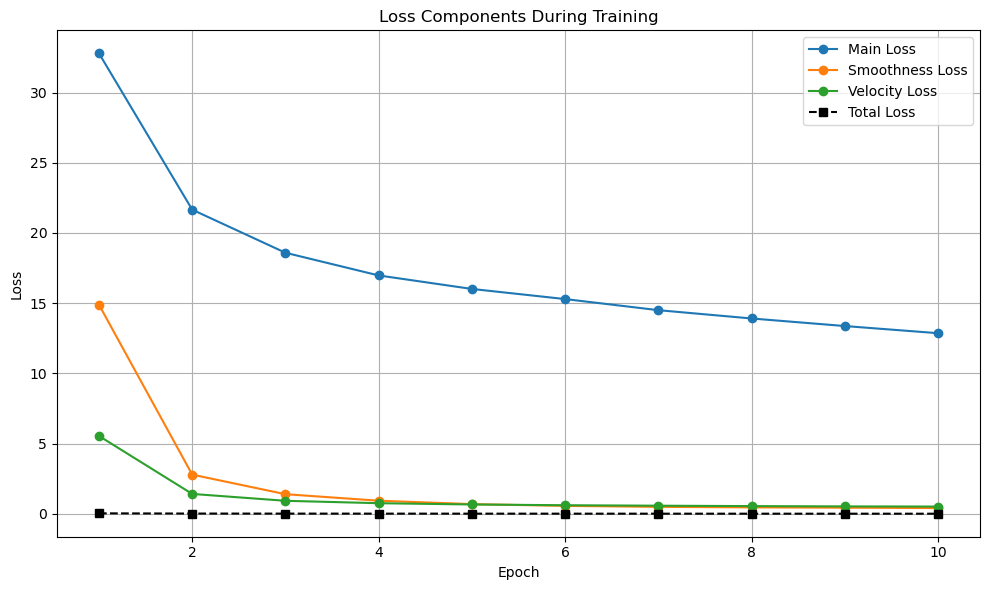

In [1]:
import matplotlib.pyplot as plt

# === result ===
epochs = list(range(1, 11))
main_loss = [32.7880, 21.6585, 18.5917, 16.9771, 16.0152, 15.2944, 14.5039, 13.9128, 13.3746, 12.8645]
smooth_loss = [14.8923, 2.7959, 1.4032, 0.9393, 0.6974, 0.5714, 0.5017, 0.4649, 0.4434, 0.4158]
vel_loss = [5.5479, 1.4225, 0.9328, 0.7619, 0.6702, 0.6176, 0.5834, 0.5552, 0.5342, 0.5225]
total_loss = [0.0402, 0.0246, 0.0208, 0.0189, 0.0178, 0.0170, 0.0161, 0.0155, 0.0149, 0.0143]

# === plot ===
plt.figure(figsize=(10, 6))
plt.plot(epochs, main_loss, marker='o', label='Main Loss')
plt.plot(epochs, smooth_loss, marker='o', label='Smoothness Loss')
plt.plot(epochs, vel_loss, marker='o', label='Velocity Loss')
plt.plot(epochs, total_loss, marker='s', linestyle='--', color='black', label='Total Loss')

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Components During Training")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_components_curve.png")
plt.show()


## test

In [9]:
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/alive.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/0" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 0 --person 1
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/alive.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/1" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 1 --person 1
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/alive.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/2" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 2 --person 1
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/alive.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/3" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 3 --person 1
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/alive.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/4" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 4 --person 1
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/alive.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/5" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 5 --person 1
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/alive.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/6" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 6 --person 1
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/alive.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/7" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 7 --person 1


/transfer/emotalk/EmoTalk_release-main/demo_finetuned.py:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(args.model_path, map_location=tor

In [2]:
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/01-01-05-01-01-01-01.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/01-01-05-01-01-01-01_0_0/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 0 --person 1
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/01-01-05-01-01-01-01.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/01-01-05-01-01-01-01_1_0/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 1 --person 1
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/01-01-05-01-01-01-01.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/01-01-05-01-01-01-01_5_0/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 5 --person 1


/transfer/emotalk/EmoTalk_release-main/demo_finetuned.py:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(args.model_path, map_location=tor

In [2]:
!python demo_finetuned.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/ted2_clip.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/ted2_clip/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" --level 3 --person 1


/transfer/emotalk/EmoTalk_release-main/demo_finetuned.py:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(args.model_path, map_location=tor

In [3]:
!python demo_batch_levels.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/alive.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" 


🧪 正在测试情绪等级 0 ...
/transfer/emotalk/EmoTalk_release-main/demo_batch_levels.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(args.model_p

In [2]:
!python demo_batch_levels.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/angry2.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" 


🧪 正在测试情绪等级 0 ...
/transfer/emotalk/EmoTalk_release-main/demo_batch_levels.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(args.model_p

In [7]:
!python demo_batch_levels.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/alive.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth"



🧪 正在测试情绪等级 0 ...
Traceback (most recent call last):
  File "/transfer/emotalk/EmoTalk_release-main/demo_batch_levels.py", line 86, in <module>
    main()
  File "/transfer/emotalk/EmoTalk_release-main/demo_batch_levels.py", line 83, in main
    run_one_level(args, level)
  File "/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/lib/python3.12/site-packages/torch/utils/_contextlib.py", line 116, in decorate_context
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^
  File "/transfer/emotalk/EmoTalk_release-main/demo_batch_levels.py", line 12, in run_one_level
    model = EmoTalk(args)
            ^^^^^^^
NameError: name 'EmoTalk' is not defined


## ravdess2_V0003

In [ ]:
from Emotalk_model_v0002 import EmoTalk
from train import DummyDataset
from loss_v0003 import EmoTalkLoss
from torch.utils.data import DataLoader
import torch
import os
from tqdm import tqdm
from types import SimpleNamespace
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
# === 配置 ===
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EPOCHS = 20
LR = 1e-4
SAVE_PATH = 'emotalk_finetuned_2.pth'
BATCH_SIZE = 1

args = SimpleNamespace(
    feature_dim=1024,
    bs_dim=52,
    device=DEVICE,
    batch_size = BATCH_SIZE,
    max_seq_len=512,
    period=20,
    emotion_dim=256,
    emo_gru_hidden=128,
    emo_gru_layers=2,
    transformer_layers=4,
    transformer_heads=8,
    transformer_dim=512,
    num_emotions = 8,
    num_person = 25
)
# === 准备数据 ===
train_dataset = DummyDataset('./data/HDTF/train')
val_dataset = DummyDataset('./data/HDTF/val')

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# === 模型与优化器 ===
model = EmoTalk(args).to(DEVICE)
loss_fn = EmoTalkLoss(region_weighted=True)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

train_loss_list = []
val_loss_list = []

# === 训练循环 ===
for epoch in range(EPOCHS):
    model.train()
    total_loss = 0.0
    logs_accum = {"main": 0, "smooth": 0, "vel": 0, "total": 0}

    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        blendshape = batch["blendshape"].to(DEVICE)
        # 👇 动态设置目标长度
        args.target_len = blendshape.size(1)
        pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])  # 假设输入接口存在

        loss, logs = loss_fn(pred, blendshape)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        for k in logs:
            logs_accum[k] += logs[k]

    avg_loss = total_loss / len(train_loader)
    print(f"\n[Epoch {epoch+1}] Train Loss: {avg_loss:.4f}")
    print(f"  -> main: {logs_accum['main']:.4f} | smooth: {logs_accum['smooth']:.4f} | vel: {logs_accum['vel']:.4f}")
    train_loss_list.append(avg_loss)
    val_loss_list.append(val_loss / len(val_loader))

    # === 验证 ===
    model.eval()
    with torch.no_grad():
        val_loss = 0.0
        for batch in val_loader:
            blendshape = batch["blendshape"].to(DEVICE)
            args.target_len = blendshape.size(1)
            pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])
            loss, _ = loss_fn(pred, blendshape)
            val_loss += loss.item()
        print(f"  -> Val Loss: {val_loss / len(val_loader):.4f}")

    # === 保存模型 ===
    torch.save(model.state_dict(), SAVE_PATH)
    print(f"✅ Model saved to {SAVE_PATH}\n")

import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.plot(train_loss_list, label='Train Loss')
plt.plot(val_loss_list, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('loss_curve.png')  # 保存图片
plt.show()


In [2]:
# Full training, validation and test evaluation script for EmoTalk (RAVDESS)
import os
import torch
from torch.utils.data import DataLoader
from Emotalk_model_v0002 import EmoTalk
from train import DummyDataset
from loss_v0003 import EmoTalkLoss, smoothness_loss, velocity_loss
import matplotlib.pyplot as plt
from types import SimpleNamespace
from tqdm import tqdm

# ====== Configuration ======
DEVICE      = 'cuda' if torch.cuda.is_available() else 'cpu'
EPOCHS      = 5
LR          = 1e-6
BATCH_SIZE  = 1
SAVE_PATH   = 'emotalk_finetuned_ravdess.pth'
LOG_CSV     = 'training_log.csv'

args = SimpleNamespace(
    feature_dim    = 1024,
    bs_dim         = 52,
    device         = DEVICE,
    batch_size     = BATCH_SIZE,
    max_seq_len    = 512,
    period         = 20,
    emotion_dim    = 256,
    emo_gru_hidden = 128,
    emo_gru_layers = 2,
    transformer_layers = 4,
    transformer_heads  = 8,
    transformer_dim    = 512,
    num_emotions       = 8,
    num_person         = 25
)

# ====== Data preparation ======
train_dataset = DummyDataset('./data/RAVDESS/train')
val_dataset   = DummyDataset('./data/RAVDESS/val')
test_dataset  = DummyDataset('./data/RAVDESS/test')

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False)

# ====== Model, optimizer, loss ======
model    = EmoTalk(args).to(DEVICE)
optimizer= torch.optim.Adam(model.parameters(), lr=LR)
loss_fn  = EmoTalkLoss(region_weighted=True, mouth_only=True)

# Lists to store losses
train_losses = []
val_losses   = []
best_val_loss= float('inf')

# ====== Training loop ======
for epoch in range(1, EPOCHS+1):
    model.train()
    running_train_loss = 0.0

    for batch in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS} [Train]"):
        audio     = batch['audio'].to(DEVICE)
        blendshape= batch['blendshape'].to(DEVICE)
        level     = batch['level'].to(DEVICE)
        person    = batch['person'].to(DEVICE)

        # align target length
        args.target_len = blendshape.size(1)

        # forward
        pred, *_ = model(audio, level, person), None
        loss, logs = loss_fn(pred, blendshape)

        # backward
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()

    avg_train_loss = running_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # ====== Validation ======
    model.eval()
    running_val_loss = 0.0
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Epoch {epoch}/{EPOCHS} [Val]"):
            audio     = batch['audio'].to(DEVICE)
            blendshape= batch['blendshape'].to(DEVICE)
            level     = batch['level'].to(DEVICE)
            person    = batch['person'].to(DEVICE)
            args.target_len = blendshape.size(1)

            pred, *_ = model(audio, level, person), None
            loss, _ = loss_fn(pred, blendshape)
            running_val_loss += loss.item()

    avg_val_loss = running_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f"[Epoch {epoch}] Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

    # Save best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), SAVE_PATH)
        print(f">> Saved best model to {SAVE_PATH} (Val Loss: {best_val_loss:.4f})")



Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.weight', 'lm_head.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2Model from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of the model checkpoint at r-f/wav2vec-english-speech-emotion-recognition were not used when initializing Wav2Vec2Model: ['classifier.dense.bias', 'classifier.out_proj.weight', 'classifier.dense.weight', 'classifier.out_proj.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with anothe

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:   0%|▏                                                                                        | 2/1140 [00:00<07:45,  2.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 1/5 [Train]:   0%|▎                                                                                        | 4/1140 [00:01<04:15,  4.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:   1%|▍                                                                                        | 6/1140 [00:01<03:14,  5.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:   1%|▌                                                                                        | 8/1140 [00:01<02:47,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:   1%|▊                                                                                       | 10/1140 [00:01<02:35,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:   1%|▉                                                                                       | 12/1140 [00:02<02:30,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:   1%|█                                                                                       | 14/1140 [00:02<02:25,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:   1%|█▏                                                                                      | 16/1140 [00:02<02:24,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:   2%|█▍                                                                                      | 18/1140 [00:03<02:25,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:   2%|█▌                                                                                      | 20/1140 [00:03<02:23,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:   2%|█▋                                                                                      | 22/1140 [00:03<02:24,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/5 [Train]:   2%|█▊                                                                                      | 24/1140 [00:03<02:23,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:   2%|██                                                                                      | 26/1140 [00:04<02:26,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/5 [Train]:   2%|██▏                                                                                     | 28/1140 [00:04<02:28,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:   3%|██▎                                                                                     | 30/1140 [00:04<02:28,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:   3%|██▍                                                                                     | 32/1140 [00:04<02:25,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1/5 [Train]:   3%|██▌                                                                                     | 34/1140 [00:05<02:27,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:   3%|██▊                                                                                     | 36/1140 [00:05<02:30,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:   3%|██▉                                                                                     | 38/1140 [00:05<02:28,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:   4%|███                                                                                     | 40/1140 [00:05<02:24,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:   4%|███▏                                                                                    | 42/1140 [00:06<02:26,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:   4%|███▍                                                                                    | 44/1140 [00:06<02:24,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:   4%|███▌                                                                                    | 46/1140 [00:06<02:22,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:   4%|███▋                                                                                    | 48/1140 [00:06<02:20,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 1/5 [Train]:   4%|███▊                                                                                    | 50/1140 [00:07<02:21,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:   5%|████                                                                                    | 52/1140 [00:07<02:19,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:   5%|████▏                                                                                   | 54/1140 [00:07<02:22,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:   5%|████▎                                                                                   | 56/1140 [00:07<02:22,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:   5%|████▍                                                                                   | 58/1140 [00:08<02:26,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:   5%|████▋                                                                                   | 60/1140 [00:08<02:23,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1/5 [Train]:   5%|████▊                                                                                   | 62/1140 [00:08<02:24,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:   6%|████▉                                                                                   | 64/1140 [00:09<02:23,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:   6%|█████                                                                                   | 66/1140 [00:09<02:20,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:   6%|█████▏                                                                                  | 68/1140 [00:09<02:18,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:   6%|█████▍                                                                                  | 70/1140 [00:09<02:17,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:   6%|█████▌                                                                                  | 72/1140 [00:10<02:19,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/5 [Train]:   6%|█████▋                                                                                  | 74/1140 [00:10<02:18,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:   7%|█████▊                                                                                  | 76/1140 [00:10<02:15,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:   7%|██████                                                                                  | 78/1140 [00:10<02:16,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:   7%|██████▏                                                                                 | 80/1140 [00:11<02:14,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:   7%|██████▎                                                                                 | 82/1140 [00:11<02:16,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:   7%|██████▍                                                                                 | 84/1140 [00:11<02:13,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:   8%|██████▋                                                                                 | 86/1140 [00:11<02:12,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:   8%|██████▊                                                                                 | 88/1140 [00:12<02:11,  8.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:   8%|██████▉                                                                                 | 90/1140 [00:12<02:13,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:   8%|███████                                                                                 | 92/1140 [00:12<02:12,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:   8%|███████▎                                                                                | 94/1140 [00:12<02:16,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1/5 [Train]:   8%|███████▍                                                                                | 96/1140 [00:13<02:19,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:   9%|███████▌                                                                                | 98/1140 [00:13<02:15,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:   9%|███████▋                                                                               | 100/1140 [00:13<02:14,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:   9%|███████▊                                                                               | 102/1140 [00:13<02:14,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:   9%|███████▉                                                                               | 104/1140 [00:14<02:17,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:   9%|████████                                                                               | 106/1140 [00:14<02:14,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:   9%|████████▏                                                                              | 108/1140 [00:14<02:16,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  10%|████████▍                                                                              | 110/1140 [00:14<02:13,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  10%|████████▌                                                                              | 112/1140 [00:15<02:12,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  10%|████████▋                                                                              | 114/1140 [00:15<02:10,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  10%|████████▊                                                                              | 116/1140 [00:15<02:09,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  10%|█████████                                                                              | 118/1140 [00:15<02:09,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  11%|█████████▏                                                                             | 120/1140 [00:16<02:13,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1/5 [Train]:  11%|█████████▎                                                                             | 122/1140 [00:16<02:11,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  11%|█████████▍                                                                             | 124/1140 [00:16<02:11,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  11%|█████████▌                                                                             | 126/1140 [00:17<02:07,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  11%|█████████▊                                                                             | 128/1140 [00:17<02:06,  7.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:  11%|█████████▉                                                                             | 130/1140 [00:17<02:06,  7.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/5 [Train]:  12%|██████████                                                                             | 132/1140 [00:17<02:08,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/5 [Train]:  12%|██████████▏                                                                            | 134/1140 [00:18<02:08,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  12%|██████████▍                                                                            | 136/1140 [00:18<02:06,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  12%|██████████▌                                                                            | 138/1140 [00:18<02:06,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  12%|██████████▋                                                                            | 140/1140 [00:18<02:08,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  12%|██████████▊                                                                            | 142/1140 [00:19<02:06,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  13%|██████████▉                                                                            | 144/1140 [00:19<02:07,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1/5 [Train]:  13%|███████████▏                                                                           | 146/1140 [00:19<02:08,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  13%|███████████▎                                                                           | 148/1140 [00:19<02:10,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1/5 [Train]:  13%|███████████▍                                                                           | 150/1140 [00:20<02:08,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  13%|███████████▌                                                                           | 152/1140 [00:20<02:05,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  14%|███████████▊                                                                           | 154/1140 [00:20<02:05,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:  14%|███████████▉                                                                           | 156/1140 [00:20<02:06,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  14%|████████████                                                                           | 158/1140 [00:21<02:06,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  14%|████████████▏                                                                          | 160/1140 [00:21<02:05,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  14%|████████████▎                                                                          | 162/1140 [00:21<02:08,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 81920])
🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/5 [Train]:  14%|████████████▌                                                                          | 164/1140 [00:21<02:07,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  15%|████████████▋                                                                          | 166/1140 [00:22<02:04,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  15%|████████████▊                                                                          | 168/1140 [00:22<02:05,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  15%|████████████▉                                                                          | 170/1140 [00:22<02:04,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  15%|█████████████▏                                                                         | 172/1140 [00:22<02:04,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  15%|█████████████▎                                                                         | 174/1140 [00:23<02:02,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  15%|█████████████▍                                                                         | 176/1140 [00:23<02:04,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  16%|█████████████▌                                                                         | 178/1140 [00:23<02:02,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  16%|█████████████▋                                                                         | 180/1140 [00:23<02:03,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  16%|█████████████▉                                                                         | 182/1140 [00:24<02:03,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  16%|██████████████                                                                         | 184/1140 [00:24<02:04,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  16%|██████████████▏                                                                        | 186/1140 [00:24<02:05,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1/5 [Train]:  16%|██████████████▎                                                                        | 188/1140 [00:25<02:07,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  17%|██████████████▌                                                                        | 190/1140 [00:25<02:02,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  17%|██████████████▋                                                                        | 192/1140 [00:25<02:06,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  17%|██████████████▊                                                                        | 194/1140 [00:25<02:06,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/5 [Train]:  17%|██████████████▉                                                                        | 196/1140 [00:26<02:08,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  17%|███████████████                                                                        | 198/1140 [00:26<02:06,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:  18%|███████████████▎                                                                       | 200/1140 [00:26<02:04,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  18%|███████████████▍                                                                       | 202/1140 [00:26<02:05,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  18%|███████████████▌                                                                       | 204/1140 [00:27<02:04,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  18%|███████████████▋                                                                       | 206/1140 [00:27<02:05,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  18%|███████████████▊                                                                       | 208/1140 [00:27<02:04,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 1/5 [Train]:  18%|████████████████                                                                       | 210/1140 [00:27<02:08,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  19%|████████████████▏                                                                      | 212/1140 [00:28<02:05,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 1/5 [Train]:  19%|████████████████▎                                                                      | 214/1140 [00:28<02:12,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  19%|████████████████▍                                                                      | 216/1140 [00:28<02:02,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  19%|████████████████▋                                                                      | 218/1140 [00:29<02:01,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  19%|████████████████▊                                                                      | 220/1140 [00:29<02:01,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  19%|████████████████▉                                                                      | 222/1140 [00:29<01:58,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  20%|█████████████████                                                                      | 224/1140 [00:29<01:57,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  20%|█████████████████▏                                                                     | 226/1140 [00:30<01:58,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 1/5 [Train]:  20%|█████████████████▍                                                                     | 228/1140 [00:30<01:56,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  20%|█████████████████▌                                                                     | 230/1140 [00:30<01:55,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  20%|█████████████████▋                                                                     | 232/1140 [00:30<01:55,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 1/5 [Train]:  21%|█████████████████▊                                                                     | 234/1140 [00:31<01:56,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  21%|██████████████████                                                                     | 236/1140 [00:31<01:57,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  21%|██████████████████▏                                                                    | 238/1140 [00:31<01:54,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  21%|██████████████████▎                                                                    | 240/1140 [00:31<01:54,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  21%|██████████████████▍                                                                    | 242/1140 [00:32<02:00,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  21%|██████████████████▌                                                                    | 244/1140 [00:32<01:59,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/5 [Train]:  22%|██████████████████▊                                                                    | 246/1140 [00:32<01:58,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 1/5 [Train]:  22%|██████████████████▉                                                                    | 248/1140 [00:32<01:53,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  22%|███████████████████                                                                    | 250/1140 [00:33<01:54,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  22%|███████████████████▏                                                                   | 252/1140 [00:33<01:53,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/5 [Train]:  22%|███████████████████▍                                                                   | 254/1140 [00:33<01:55,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  22%|███████████████████▌                                                                   | 256/1140 [00:33<01:55,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 1/5 [Train]:  23%|███████████████████▋                                                                   | 258/1140 [00:34<01:54,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 1/5 [Train]:  23%|███████████████████▊                                                                   | 260/1140 [00:34<01:56,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 1/5 [Train]:  23%|███████████████████▉                                                                   | 262/1140 [00:34<01:55,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  23%|████████████████████▏                                                                  | 264/1140 [00:35<01:57,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/5 [Train]:  23%|████████████████████▎                                                                  | 266/1140 [00:35<01:58,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/5 [Train]:  24%|████████████████████▍                                                                  | 268/1140 [00:35<01:56,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  24%|████████████████████▌                                                                  | 270/1140 [00:35<01:53,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  24%|████████████████████▊                                                                  | 272/1140 [00:36<01:53,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  24%|████████████████████▉                                                                  | 274/1140 [00:36<01:51,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  24%|█████████████████████                                                                  | 276/1140 [00:36<01:50,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  24%|█████████████████████▏                                                                 | 278/1140 [00:36<01:48,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  25%|█████████████████████▎                                                                 | 280/1140 [00:37<01:49,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 1/5 [Train]:  25%|█████████████████████▌                                                                 | 282/1140 [00:37<01:51,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  25%|█████████████████████▋                                                                 | 284/1140 [00:37<01:48,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  25%|█████████████████████▊                                                                 | 286/1140 [00:37<01:46,  8.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  25%|█████████████████████▉                                                                 | 288/1140 [00:38<01:48,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:  25%|██████████████████████▏                                                                | 290/1140 [00:38<01:51,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  26%|██████████████████████▎                                                                | 292/1140 [00:38<01:49,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1/5 [Train]:  26%|██████████████████████▍                                                                | 294/1140 [00:38<01:49,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 1/5 [Train]:  26%|██████████████████████▌                                                                | 296/1140 [00:39<01:50,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  26%|██████████████████████▋                                                                | 298/1140 [00:39<01:47,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  26%|██████████████████████▉                                                                | 300/1140 [00:39<01:49,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  26%|███████████████████████                                                                | 302/1140 [00:39<01:47,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  27%|███████████████████████▏                                                               | 304/1140 [00:40<01:51,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  27%|███████████████████████▎                                                               | 306/1140 [00:40<01:52,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])
🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])


Epoch 1/5 [Train]:  27%|███████████████████████▌                                                               | 308/1140 [00:40<01:49,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  27%|███████████████████████▋                                                               | 310/1140 [00:41<01:52,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/5 [Train]:  27%|███████████████████████▊                                                               | 312/1140 [00:41<01:50,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  28%|███████████████████████▉                                                               | 314/1140 [00:41<01:48,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  28%|████████████████████████                                                               | 316/1140 [00:41<01:46,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  28%|████████████████████████▎                                                              | 318/1140 [00:42<01:44,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  28%|████████████████████████▍                                                              | 320/1140 [00:42<01:44,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 1/5 [Train]:  28%|████████████████████████▌                                                              | 322/1140 [00:42<01:45,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  28%|████████████████████████▋                                                              | 324/1140 [00:42<01:43,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  29%|████████████████████████▉                                                              | 326/1140 [00:43<01:44,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  29%|█████████████████████████                                                              | 328/1140 [00:43<01:44,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  29%|█████████████████████████▏                                                             | 330/1140 [00:43<01:46,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  29%|█████████████████████████▎                                                             | 332/1140 [00:43<01:45,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  29%|█████████████████████████▍                                                             | 334/1140 [00:44<01:43,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  29%|█████████████████████████▋                                                             | 336/1140 [00:44<01:43,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1/5 [Train]:  30%|█████████████████████████▊                                                             | 338/1140 [00:44<01:45,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  30%|█████████████████████████▉                                                             | 340/1140 [00:44<01:45,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  30%|██████████████████████████                                                             | 342/1140 [00:45<01:45,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  30%|██████████████████████████▎                                                            | 344/1140 [00:45<01:47,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  30%|██████████████████████████▍                                                            | 346/1140 [00:45<01:47,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 1/5 [Train]:  31%|██████████████████████████▌                                                            | 348/1140 [00:45<01:47,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  31%|██████████████████████████▋                                                            | 350/1140 [00:46<01:46,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  31%|██████████████████████████▊                                                            | 352/1140 [00:46<01:46,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1/5 [Train]:  31%|███████████████████████████                                                            | 354/1140 [00:46<01:43,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 1/5 [Train]:  31%|███████████████████████████▏                                                           | 356/1140 [00:47<01:42,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  31%|███████████████████████████▎                                                           | 358/1140 [00:47<01:40,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  32%|███████████████████████████▍                                                           | 360/1140 [00:47<01:39,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  32%|███████████████████████████▋                                                           | 362/1140 [00:47<01:40,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  32%|███████████████████████████▊                                                           | 364/1140 [00:48<01:40,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 1/5 [Train]:  32%|███████████████████████████▉                                                           | 366/1140 [00:48<01:42,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78507])
🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  32%|████████████████████████████                                                           | 368/1140 [00:48<01:43,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  32%|████████████████████████████▏                                                          | 370/1140 [00:48<01:41,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  33%|████████████████████████████▍                                                          | 372/1140 [00:49<01:44,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  33%|████████████████████████████▌                                                          | 374/1140 [00:49<01:44,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/5 [Train]:  33%|████████████████████████████▋                                                          | 376/1140 [00:49<01:43,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  33%|████████████████████████████▊                                                          | 378/1140 [00:49<01:42,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  33%|█████████████████████████████                                                          | 380/1140 [00:50<01:39,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  34%|█████████████████████████████▏                                                         | 382/1140 [00:50<01:44,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  34%|█████████████████████████████▎                                                         | 384/1140 [00:50<01:41,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  34%|█████████████████████████████▍                                                         | 386/1140 [00:51<01:41,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  34%|█████████████████████████████▌                                                         | 388/1140 [00:51<01:39,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  34%|█████████████████████████████▊                                                         | 390/1140 [00:51<01:41,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  34%|█████████████████████████████▉                                                         | 392/1140 [00:51<01:39,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  35%|██████████████████████████████                                                         | 394/1140 [00:52<01:40,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  35%|██████████████████████████████▏                                                        | 396/1140 [00:52<01:41,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  35%|██████████████████████████████▎                                                        | 398/1140 [00:52<01:40,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  35%|██████████████████████████████▌                                                        | 400/1140 [00:52<01:38,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  35%|██████████████████████████████▋                                                        | 402/1140 [00:53<01:35,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 1/5 [Train]:  35%|██████████████████████████████▊                                                        | 404/1140 [00:53<01:39,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  36%|██████████████████████████████▉                                                        | 406/1140 [00:53<01:37,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  36%|███████████████████████████████▏                                                       | 408/1140 [00:53<01:36,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  36%|███████████████████████████████▎                                                       | 410/1140 [00:54<01:32,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  36%|███████████████████████████████▍                                                       | 412/1140 [00:54<01:33,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  36%|███████████████████████████████▌                                                       | 414/1140 [00:54<01:34,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  36%|███████████████████████████████▋                                                       | 416/1140 [00:54<01:35,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  37%|███████████████████████████████▉                                                       | 418/1140 [00:55<01:34,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  37%|████████████████████████████████                                                       | 420/1140 [00:55<01:35,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  37%|████████████████████████████████▏                                                      | 422/1140 [00:55<01:35,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  37%|████████████████████████████████▎                                                      | 424/1140 [00:56<01:31,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  37%|████████████████████████████████▌                                                      | 426/1140 [00:56<01:31,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  38%|████████████████████████████████▋                                                      | 428/1140 [00:56<01:35,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 1/5 [Train]:  38%|████████████████████████████████▊                                                      | 430/1140 [00:56<01:36,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  38%|████████████████████████████████▉                                                      | 432/1140 [00:57<01:36,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1/5 [Train]:  38%|█████████████████████████████████                                                      | 434/1140 [00:57<01:34,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  38%|█████████████████████████████████▎                                                     | 436/1140 [00:57<01:33,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  38%|█████████████████████████████████▍                                                     | 438/1140 [00:57<01:30,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])


Epoch 1/5 [Train]:  39%|█████████████████████████████████▌                                                     | 440/1140 [00:58<01:28,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  39%|█████████████████████████████████▋                                                     | 442/1140 [00:58<01:29,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  39%|█████████████████████████████████▉                                                     | 444/1140 [00:58<01:30,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/5 [Train]:  39%|██████████████████████████████████                                                     | 446/1140 [00:58<01:29,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  39%|██████████████████████████████████▏                                                    | 448/1140 [00:59<01:30,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  39%|██████████████████████████████████▎                                                    | 450/1140 [00:59<01:29,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  40%|██████████████████████████████████▍                                                    | 452/1140 [00:59<01:27,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1/5 [Train]:  40%|██████████████████████████████████▋                                                    | 454/1140 [00:59<01:29,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1/5 [Train]:  40%|██████████████████████████████████▊                                                    | 456/1140 [01:00<01:28,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  40%|██████████████████████████████████▉                                                    | 458/1140 [01:00<01:27,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  40%|███████████████████████████████████                                                    | 460/1140 [01:00<01:26,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1/5 [Train]:  41%|███████████████████████████████████▎                                                   | 462/1140 [01:00<01:27,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1/5 [Train]:  41%|███████████████████████████████████▍                                                   | 464/1140 [01:01<01:28,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  41%|███████████████████████████████████▌                                                   | 466/1140 [01:01<01:25,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 1/5 [Train]:  41%|███████████████████████████████████▋                                                   | 468/1140 [01:01<01:26,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/5 [Train]:  41%|███████████████████████████████████▊                                                   | 470/1140 [01:02<01:26,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  41%|████████████████████████████████████                                                   | 472/1140 [01:02<01:26,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/5 [Train]:  42%|████████████████████████████████████▏                                                  | 474/1140 [01:02<01:25,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 1/5 [Train]:  42%|████████████████████████████████████▎                                                  | 476/1140 [01:02<01:27,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  42%|████████████████████████████████████▍                                                  | 478/1140 [01:03<01:25,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1/5 [Train]:  42%|████████████████████████████████████▋                                                  | 480/1140 [01:03<01:25,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  42%|████████████████████████████████████▊                                                  | 482/1140 [01:03<01:25,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  42%|████████████████████████████████████▉                                                  | 484/1140 [01:03<01:26,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  43%|█████████████████████████████████████                                                  | 486/1140 [01:04<01:25,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  43%|█████████████████████████████████████▏                                                 | 488/1140 [01:04<01:25,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/5 [Train]:  43%|█████████████████████████████████████▍                                                 | 490/1140 [01:04<01:24,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  43%|█████████████████████████████████████▌                                                 | 492/1140 [01:04<01:26,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  43%|█████████████████████████████████████▋                                                 | 494/1140 [01:05<01:24,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  44%|█████████████████████████████████████▊                                                 | 496/1140 [01:05<01:24,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  44%|██████████████████████████████████████                                                 | 498/1140 [01:05<01:24,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  44%|██████████████████████████████████████▏                                                | 500/1140 [01:05<01:24,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/5 [Train]:  44%|██████████████████████████████████████▎                                                | 502/1140 [01:06<01:23,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/5 [Train]:  44%|██████████████████████████████████████▍                                                | 504/1140 [01:06<01:24,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1/5 [Train]:  44%|██████████████████████████████████████▌                                                | 506/1140 [01:06<01:23,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  45%|██████████████████████████████████████▊                                                | 508/1140 [01:06<01:22,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  45%|██████████████████████████████████████▉                                                | 510/1140 [01:07<01:25,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  45%|███████████████████████████████████████                                                | 512/1140 [01:07<01:23,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  45%|███████████████████████████████████████▏                                               | 514/1140 [01:07<01:23,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1/5 [Train]:  45%|███████████████████████████████████████▍                                               | 516/1140 [01:08<01:24,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  45%|███████████████████████████████████████▌                                               | 518/1140 [01:08<01:21,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:  46%|███████████████████████████████████████▋                                               | 520/1140 [01:08<01:19,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  46%|███████████████████████████████████████▊                                               | 522/1140 [01:08<01:18,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  46%|███████████████████████████████████████▉                                               | 524/1140 [01:09<01:21,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  46%|████████████████████████████████████████▏                                              | 526/1140 [01:09<01:20,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  46%|████████████████████████████████████████▎                                              | 528/1140 [01:09<01:20,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/5 [Train]:  46%|████████████████████████████████████████▍                                              | 530/1140 [01:09<01:19,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  47%|████████████████████████████████████████▌                                              | 532/1140 [01:10<01:21,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  47%|████████████████████████████████████████▊                                              | 534/1140 [01:10<01:19,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  47%|████████████████████████████████████████▉                                              | 536/1140 [01:10<01:19,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  47%|█████████████████████████████████████████                                              | 538/1140 [01:10<01:19,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  47%|█████████████████████████████████████████▏                                             | 540/1140 [01:11<01:17,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  48%|█████████████████████████████████████████▎                                             | 542/1140 [01:11<01:16,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1/5 [Train]:  48%|█████████████████████████████████████████▌                                             | 544/1140 [01:11<01:16,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  48%|█████████████████████████████████████████▋                                             | 546/1140 [01:11<01:15,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  48%|█████████████████████████████████████████▊                                             | 548/1140 [01:12<01:16,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  48%|█████████████████████████████████████████▉                                             | 550/1140 [01:12<01:17,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  48%|██████████████████████████████████████████▏                                            | 552/1140 [01:12<01:19,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  49%|██████████████████████████████████████████▎                                            | 554/1140 [01:13<01:19,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  49%|██████████████████████████████████████████▍                                            | 556/1140 [01:13<01:15,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  49%|██████████████████████████████████████████▌                                            | 558/1140 [01:13<01:15,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  49%|██████████████████████████████████████████▋                                            | 560/1140 [01:13<01:13,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  49%|██████████████████████████████████████████▉                                            | 562/1140 [01:14<01:13,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  49%|███████████████████████████████████████████                                            | 564/1140 [01:14<01:12,  7.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  50%|███████████████████████████████████████████▏                                           | 566/1140 [01:14<01:12,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  50%|███████████████████████████████████████████▎                                           | 568/1140 [01:14<01:12,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/5 [Train]:  50%|███████████████████████████████████████████▌                                           | 570/1140 [01:15<01:13,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  50%|███████████████████████████████████████████▋                                           | 572/1140 [01:15<01:12,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 1/5 [Train]:  50%|███████████████████████████████████████████▊                                           | 574/1140 [01:15<01:13,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  51%|███████████████████████████████████████████▉                                           | 576/1140 [01:15<01:12,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  51%|████████████████████████████████████████████                                           | 578/1140 [01:16<01:12,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  51%|████████████████████████████████████████████▎                                          | 580/1140 [01:16<01:11,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  51%|████████████████████████████████████████████▍                                          | 582/1140 [01:16<01:12,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  51%|████████████████████████████████████████████▌                                          | 584/1140 [01:16<01:10,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1/5 [Train]:  51%|████████████████████████████████████████████▋                                          | 586/1140 [01:17<01:11,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  52%|████████████████████████████████████████████▊                                          | 588/1140 [01:17<01:10,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  52%|█████████████████████████████████████████████                                          | 590/1140 [01:17<01:10,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  52%|█████████████████████████████████████████████▏                                         | 592/1140 [01:17<01:10,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  52%|█████████████████████████████████████████████▎                                         | 594/1140 [01:18<01:10,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  52%|█████████████████████████████████████████████▍                                         | 596/1140 [01:18<01:11,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  52%|█████████████████████████████████████████████▋                                         | 598/1140 [01:18<01:11,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/5 [Train]:  53%|█████████████████████████████████████████████▊                                         | 600/1140 [01:18<01:09,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  53%|█████████████████████████████████████████████▉                                         | 602/1140 [01:19<01:08,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  53%|██████████████████████████████████████████████                                         | 604/1140 [01:19<01:09,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  53%|██████████████████████████████████████████████▏                                        | 606/1140 [01:19<01:08,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  53%|██████████████████████████████████████████████▍                                        | 608/1140 [01:19<01:08,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  54%|██████████████████████████████████████████████▌                                        | 610/1140 [01:20<01:07,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  54%|██████████████████████████████████████████████▋                                        | 612/1140 [01:20<01:07,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  54%|██████████████████████████████████████████████▊                                        | 614/1140 [01:20<01:08,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  54%|███████████████████████████████████████████████                                        | 616/1140 [01:20<01:07,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  54%|███████████████████████████████████████████████▏                                       | 618/1140 [01:21<01:06,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  54%|███████████████████████████████████████████████▎                                       | 620/1140 [01:21<01:08,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  55%|███████████████████████████████████████████████▍                                       | 622/1140 [01:21<01:08,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  55%|███████████████████████████████████████████████▌                                       | 624/1140 [01:22<01:08,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  55%|███████████████████████████████████████████████▊                                       | 626/1140 [01:22<01:07,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  55%|███████████████████████████████████████████████▉                                       | 628/1140 [01:22<01:06,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  55%|████████████████████████████████████████████████                                       | 630/1140 [01:22<01:05,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/5 [Train]:  55%|████████████████████████████████████████████████▏                                      | 632/1140 [01:23<01:06,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  56%|████████████████████████████████████████████████▍                                      | 634/1140 [01:23<01:05,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  56%|████████████████████████████████████████████████▌                                      | 636/1140 [01:23<01:08,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  56%|████████████████████████████████████████████████▋                                      | 638/1140 [01:23<01:06,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  56%|████████████████████████████████████████████████▊                                      | 640/1140 [01:24<01:05,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  56%|████████████████████████████████████████████████▉                                      | 642/1140 [01:24<01:04,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1/5 [Train]:  56%|█████████████████████████████████████████████████▏                                     | 644/1140 [01:24<01:04,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  57%|█████████████████████████████████████████████████▎                                     | 646/1140 [01:24<01:02,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  57%|█████████████████████████████████████████████████▍                                     | 648/1140 [01:25<01:01,  8.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:  57%|█████████████████████████████████████████████████▌                                     | 650/1140 [01:25<01:01,  7.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  57%|█████████████████████████████████████████████████▊                                     | 652/1140 [01:25<01:02,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  57%|█████████████████████████████████████████████████▉                                     | 654/1140 [01:25<01:03,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  58%|██████████████████████████████████████████████████                                     | 656/1140 [01:26<01:05,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  58%|██████████████████████████████████████████████████▏                                    | 658/1140 [01:26<01:03,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  58%|██████████████████████████████████████████████████▎                                    | 660/1140 [01:26<01:01,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  58%|██████████████████████████████████████████████████▌                                    | 662/1140 [01:26<01:02,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  58%|██████████████████████████████████████████████████▋                                    | 664/1140 [01:27<01:02,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  58%|██████████████████████████████████████████████████▊                                    | 666/1140 [01:27<01:02,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  59%|██████████████████████████████████████████████████▉                                    | 668/1140 [01:27<01:00,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  59%|███████████████████████████████████████████████████▏                                   | 670/1140 [01:28<01:01,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 1/5 [Train]:  59%|███████████████████████████████████████████████████▎                                   | 672/1140 [01:28<01:03,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:  59%|███████████████████████████████████████████████████▍                                   | 674/1140 [01:28<01:02,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  59%|███████████████████████████████████████████████████▌                                   | 676/1140 [01:28<01:00,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  59%|███████████████████████████████████████████████████▋                                   | 678/1140 [01:29<00:59,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:  60%|███████████████████████████████████████████████████▉                                   | 680/1140 [01:29<01:00,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  60%|████████████████████████████████████████████████████                                   | 682/1140 [01:29<01:00,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  60%|████████████████████████████████████████████████████▏                                  | 684/1140 [01:29<00:59,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  60%|████████████████████████████████████████████████████▎                                  | 686/1140 [01:30<01:00,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  60%|████████████████████████████████████████████████████▌                                  | 688/1140 [01:30<01:00,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/5 [Train]:  61%|████████████████████████████████████████████████████▋                                  | 690/1140 [01:30<00:58,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  61%|████████████████████████████████████████████████████▊                                  | 692/1140 [01:30<00:58,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  61%|████████████████████████████████████████████████████▉                                  | 694/1140 [01:31<00:57,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  61%|█████████████████████████████████████████████████████                                  | 696/1140 [01:31<00:56,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1/5 [Train]:  61%|█████████████████████████████████████████████████████▎                                 | 698/1140 [01:31<00:57,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  61%|█████████████████████████████████████████████████████▍                                 | 700/1140 [01:31<00:56,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  62%|█████████████████████████████████████████████████████▌                                 | 702/1140 [01:32<00:59,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  62%|█████████████████████████████████████████████████████▋                                 | 704/1140 [01:32<00:58,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  62%|█████████████████████████████████████████████████████▉                                 | 706/1140 [01:32<00:56,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  62%|██████████████████████████████████████████████████████                                 | 708/1140 [01:33<00:57,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:  62%|██████████████████████████████████████████████████████▏                                | 710/1140 [01:33<00:56,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  62%|██████████████████████████████████████████████████████▎                                | 712/1140 [01:33<00:55,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  63%|██████████████████████████████████████████████████████▍                                | 714/1140 [01:33<00:54,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  63%|██████████████████████████████████████████████████████▋                                | 716/1140 [01:34<00:55,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  63%|██████████████████████████████████████████████████████▊                                | 718/1140 [01:34<00:54,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  63%|██████████████████████████████████████████████████████▉                                | 720/1140 [01:34<00:55,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1/5 [Train]:  63%|███████████████████████████████████████████████████████                                | 722/1140 [01:34<00:56,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  64%|███████████████████████████████████████████████████████▎                               | 724/1140 [01:35<00:56,  7.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  64%|███████████████████████████████████████████████████████▍                               | 726/1140 [01:35<00:54,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  64%|███████████████████████████████████████████████████████▌                               | 728/1140 [01:35<00:53,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  64%|███████████████████████████████████████████████████████▋                               | 730/1140 [01:35<00:53,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  64%|███████████████████████████████████████████████████████▊                               | 732/1140 [01:36<00:53,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  64%|████████████████████████████████████████████████████████                               | 734/1140 [01:36<00:52,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  65%|████████████████████████████████████████████████████████▏                              | 736/1140 [01:36<00:53,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 80213])
🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1/5 [Train]:  65%|████████████████████████████████████████████████████████▎                              | 738/1140 [01:36<00:52,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  65%|████████████████████████████████████████████████████████▍                              | 740/1140 [01:37<00:52,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  65%|████████████████████████████████████████████████████████▋                              | 742/1140 [01:37<00:53,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  65%|████████████████████████████████████████████████████████▊                              | 744/1140 [01:37<00:50,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  65%|████████████████████████████████████████████████████████▉                              | 746/1140 [01:37<00:50,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/5 [Train]:  66%|█████████████████████████████████████████████████████████                              | 748/1140 [01:38<00:49,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  66%|█████████████████████████████████████████████████████████▏                             | 750/1140 [01:38<00:50,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/5 [Train]:  66%|█████████████████████████████████████████████████████████▍                             | 752/1140 [01:38<00:50,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  66%|█████████████████████████████████████████████████████████▌                             | 754/1140 [01:39<00:49,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/5 [Train]:  66%|█████████████████████████████████████████████████████████▋                             | 756/1140 [01:39<00:50,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:  66%|█████████████████████████████████████████████████████████▊                             | 758/1140 [01:39<00:48,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  67%|██████████████████████████████████████████████████████████                             | 760/1140 [01:39<00:48,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:  67%|██████████████████████████████████████████████████████████▏                            | 762/1140 [01:40<00:48,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  67%|██████████████████████████████████████████████████████████▎                            | 764/1140 [01:40<00:48,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  67%|██████████████████████████████████████████████████████████▍                            | 766/1140 [01:40<00:47,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  67%|██████████████████████████████████████████████████████████▌                            | 768/1140 [01:40<00:47,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/5 [Train]:  68%|██████████████████████████████████████████████████████████▊                            | 770/1140 [01:41<00:48,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  68%|██████████████████████████████████████████████████████████▉                            | 772/1140 [01:41<00:48,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  68%|███████████████████████████████████████████████████████████                            | 774/1140 [01:41<00:47,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 1/5 [Train]:  68%|███████████████████████████████████████████████████████████▏                           | 776/1140 [01:41<00:46,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  68%|███████████████████████████████████████████████████████████▎                           | 778/1140 [01:42<00:45,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  68%|███████████████████████████████████████████████████████████▌                           | 780/1140 [01:42<00:45,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  69%|███████████████████████████████████████████████████████████▋                           | 782/1140 [01:42<00:44,  7.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  69%|███████████████████████████████████████████████████████████▊                           | 784/1140 [01:42<00:45,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  69%|███████████████████████████████████████████████████████████▉                           | 786/1140 [01:43<00:44,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  69%|████████████████████████████████████████████████████████████▏                          | 788/1140 [01:43<00:45,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  69%|████████████████████████████████████████████████████████████▎                          | 790/1140 [01:43<00:45,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  69%|████████████████████████████████████████████████████████████▍                          | 792/1140 [01:43<00:44,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  70%|████████████████████████████████████████████████████████████▌                          | 794/1140 [01:44<00:44,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  70%|████████████████████████████████████████████████████████████▋                          | 796/1140 [01:44<00:44,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 1/5 [Train]:  70%|████████████████████████████████████████████████████████████▉                          | 798/1140 [01:44<00:44,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  70%|█████████████████████████████████████████████████████████████                          | 800/1140 [01:44<00:44,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  70%|█████████████████████████████████████████████████████████████▏                         | 802/1140 [01:45<00:43,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 1/5 [Train]:  71%|█████████████████████████████████████████████████████████████▎                         | 804/1140 [01:45<00:43,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  71%|█████████████████████████████████████████████████████████████▌                         | 806/1140 [01:45<00:43,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  71%|█████████████████████████████████████████████████████████████▋                         | 808/1140 [01:45<00:43,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  71%|█████████████████████████████████████████████████████████████▊                         | 810/1140 [01:46<00:42,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  71%|█████████████████████████████████████████████████████████████▉                         | 812/1140 [01:46<00:45,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 1/5 [Train]:  71%|██████████████████████████████████████████████████████████████                         | 814/1140 [01:46<00:44,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:  72%|██████████████████████████████████████████████████████████████▎                        | 816/1140 [01:47<00:42,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  72%|██████████████████████████████████████████████████████████████▍                        | 818/1140 [01:47<00:41,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  72%|██████████████████████████████████████████████████████████████▌                        | 820/1140 [01:47<00:40,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/5 [Train]:  72%|██████████████████████████████████████████████████████████████▋                        | 822/1140 [01:47<00:40,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  72%|██████████████████████████████████████████████████████████████▉                        | 824/1140 [01:48<00:40,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  72%|███████████████████████████████████████████████████████████████                        | 826/1140 [01:48<00:40,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  73%|███████████████████████████████████████████████████████████████▏                       | 828/1140 [01:48<00:41,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  73%|███████████████████████████████████████████████████████████████▎                       | 830/1140 [01:48<00:40,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 1/5 [Train]:  73%|███████████████████████████████████████████████████████████████▍                       | 832/1140 [01:49<00:40,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  73%|███████████████████████████████████████████████████████████████▋                       | 834/1140 [01:49<00:41,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  73%|███████████████████████████████████████████████████████████████▊                       | 836/1140 [01:49<00:40,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  74%|███████████████████████████████████████████████████████████████▉                       | 838/1140 [01:49<00:39,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/5 [Train]:  74%|████████████████████████████████████████████████████████████████                       | 840/1140 [01:50<00:38,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  74%|████████████████████████████████████████████████████████████████▎                      | 842/1140 [01:50<00:38,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  74%|████████████████████████████████████████████████████████████████▍                      | 844/1140 [01:50<00:37,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  74%|████████████████████████████████████████████████████████████████▌                      | 846/1140 [01:50<00:37,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  74%|████████████████████████████████████████████████████████████████▋                      | 848/1140 [01:51<00:37,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  75%|████████████████████████████████████████████████████████████████▊                      | 850/1140 [01:51<00:37,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  75%|█████████████████████████████████████████████████████████████████                      | 852/1140 [01:51<00:37,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▏                     | 854/1140 [01:51<00:37,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▎                     | 856/1140 [01:52<00:36,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▍                     | 858/1140 [01:52<00:36,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▋                     | 860/1140 [01:52<00:37,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  76%|█████████████████████████████████████████████████████████████████▊                     | 862/1140 [01:53<00:37,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  76%|█████████████████████████████████████████████████████████████████▉                     | 864/1140 [01:53<00:37,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 1/5 [Train]:  76%|██████████████████████████████████████████████████████████████████                     | 866/1140 [01:53<00:37,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▏                    | 868/1140 [01:53<00:37,  7.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▍                    | 870/1140 [01:54<00:36,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▌                    | 872/1140 [01:54<00:36,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▋                    | 874/1140 [01:54<00:34,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▊                    | 876/1140 [01:54<00:34,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  77%|███████████████████████████████████████████████████████████████████                    | 878/1140 [01:55<00:33,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  77%|███████████████████████████████████████████████████████████████████▏                   | 880/1140 [01:55<00:33,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  77%|███████████████████████████████████████████████████████████████████▎                   | 882/1140 [01:55<00:33,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▍                   | 884/1140 [01:55<00:33,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▌                   | 886/1140 [01:56<00:33,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▊                   | 888/1140 [01:56<00:33,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▉                   | 890/1140 [01:56<00:33,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  78%|████████████████████████████████████████████████████████████████████                   | 892/1140 [01:57<00:32,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  78%|████████████████████████████████████████████████████████████████████▏                  | 894/1140 [01:57<00:32,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 1/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▍                  | 896/1140 [01:57<00:32,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▌                  | 898/1140 [01:57<00:32,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▋                  | 900/1140 [01:58<00:31,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▊                  | 902/1140 [01:58<00:32,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▉                  | 904/1140 [01:58<00:31,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/5 [Train]:  79%|█████████████████████████████████████████████████████████████████████▏                 | 906/1140 [01:58<00:31,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▎                 | 908/1140 [01:59<00:31,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▍                 | 910/1140 [01:59<00:30,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 1/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▌                 | 912/1140 [01:59<00:30,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▊                 | 914/1140 [01:59<00:29,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▉                 | 916/1140 [02:00<00:29,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████                 | 918/1140 [02:00<00:29,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▏                | 920/1140 [02:00<00:28,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▎                | 922/1140 [02:00<00:28,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▌                | 924/1140 [02:01<00:29,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 1/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▋                | 926/1140 [02:01<00:28,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▊                | 928/1140 [02:01<00:28,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  82%|██████████████████████████████████████████████████████████████████████▉                | 930/1140 [02:02<00:27,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▏               | 932/1140 [02:02<00:28,  7.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▎               | 934/1140 [02:02<00:27,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▍               | 936/1140 [02:02<00:27,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▌               | 938/1140 [02:03<00:26,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▋               | 940/1140 [02:03<00:25,  7.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  83%|███████████████████████████████████████████████████████████████████████▉               | 942/1140 [02:03<00:25,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████               | 944/1140 [02:03<00:25,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▏              | 946/1140 [02:04<00:25,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▎              | 948/1140 [02:04<00:25,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▌              | 950/1140 [02:04<00:24,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▋              | 952/1140 [02:04<00:24,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▊              | 954/1140 [02:05<00:23,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▉              | 956/1140 [02:05<00:24,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████              | 958/1140 [02:05<00:23,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▎             | 960/1140 [02:05<00:23,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▍             | 962/1140 [02:06<00:23,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▌             | 964/1140 [02:06<00:22,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▋             | 966/1140 [02:06<00:22,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▊             | 968/1140 [02:06<00:22,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████             | 970/1140 [02:07<00:21,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████▏            | 972/1140 [02:07<00:21,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████▎            | 974/1140 [02:07<00:21,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▍            | 976/1140 [02:08<00:21,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▋            | 978/1140 [02:08<00:20,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▊            | 980/1140 [02:08<00:20,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▉            | 982/1140 [02:08<00:19,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/5 [Train]:  86%|███████████████████████████████████████████████████████████████████████████            | 984/1140 [02:09<00:19,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 1/5 [Train]:  86%|███████████████████████████████████████████████████████████████████████████▏           | 986/1140 [02:09<00:19,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▍           | 988/1140 [02:09<00:19,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▌           | 990/1140 [02:09<00:19,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▋           | 992/1140 [02:10<00:19,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▊           | 994/1140 [02:10<00:18,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 1/5 [Train]:  87%|████████████████████████████████████████████████████████████████████████████           | 996/1140 [02:10<00:18,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1/5 [Train]:  88%|████████████████████████████████████████████████████████████████████████████▏          | 998/1140 [02:10<00:18,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▍          | 1000/1140 [02:11<00:17,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▌          | 1002/1140 [02:11<00:18,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▋          | 1004/1140 [02:11<00:17,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▉          | 1006/1140 [02:11<00:17,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])


Epoch 1/5 [Train]:  88%|████████████████████████████████████████████████████████████████████████████          | 1008/1140 [02:12<00:17,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▏         | 1010/1140 [02:12<00:18,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▎         | 1012/1140 [02:12<00:17,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▍         | 1014/1140 [02:12<00:16,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▋         | 1016/1140 [02:13<00:16,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▊         | 1018/1140 [02:13<00:15,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 1/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▉         | 1020/1140 [02:13<00:15,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████         | 1022/1140 [02:13<00:14,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▏        | 1024/1140 [02:14<00:14,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 1/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▍        | 1026/1140 [02:14<00:14,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▌        | 1028/1140 [02:14<00:14,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▋        | 1030/1140 [02:14<00:13,  7.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 1/5 [Train]:  91%|█████████████████████████████████████████████████████████████████████████████▊        | 1032/1140 [02:15<00:13,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████        | 1034/1140 [02:15<00:13,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▏       | 1036/1140 [02:15<00:13,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▎       | 1038/1140 [02:15<00:12,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▍       | 1040/1140 [02:16<00:12,  8.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▌       | 1042/1140 [02:16<00:12,  8.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▊       | 1044/1140 [02:16<00:12,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/5 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▉       | 1046/1140 [02:16<00:11,  8.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████       | 1048/1140 [02:17<00:11,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▏      | 1050/1140 [02:17<00:11,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▎      | 1052/1140 [02:17<00:11,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▌      | 1054/1140 [02:18<00:11,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▋      | 1056/1140 [02:18<00:10,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▊      | 1058/1140 [02:18<00:10,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▉      | 1060/1140 [02:18<00:10,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████      | 1062/1140 [02:19<00:10,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████▎     | 1064/1140 [02:19<00:09,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▍     | 1066/1140 [02:19<00:09,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▌     | 1068/1140 [02:19<00:09,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▋     | 1070/1140 [02:20<00:09,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▊     | 1072/1140 [02:20<00:08,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 1/5 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████     | 1074/1140 [02:20<00:08,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 1/5 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████▏    | 1076/1140 [02:20<00:08,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▎    | 1078/1140 [02:21<00:07,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▍    | 1080/1140 [02:21<00:07,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 1/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▌    | 1082/1140 [02:21<00:07,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▊    | 1084/1140 [02:21<00:07,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▉    | 1086/1140 [02:22<00:07,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  95%|██████████████████████████████████████████████████████████████████████████████████    | 1088/1140 [02:22<00:06,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▏   | 1090/1140 [02:22<00:06,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▍   | 1092/1140 [02:23<00:06,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▌   | 1094/1140 [02:23<00:06,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▋   | 1096/1140 [02:23<00:05,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▊   | 1098/1140 [02:23<00:05,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])


Epoch 1/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▉   | 1100/1140 [02:24<00:05,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▏  | 1102/1140 [02:24<00:04,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▎  | 1104/1140 [02:24<00:04,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▍  | 1106/1140 [02:24<00:04,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▌  | 1108/1140 [02:25<00:04,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▋  | 1110/1140 [02:25<00:03,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████▉  | 1112/1140 [02:25<00:03,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████  | 1114/1140 [02:25<00:03,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▏ | 1116/1140 [02:26<00:03,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▎ | 1118/1140 [02:26<00:02,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▍ | 1120/1140 [02:26<00:02,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▋ | 1122/1140 [02:26<00:02,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/5 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▊ | 1124/1140 [02:27<00:02,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/5 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▉ | 1126/1140 [02:27<00:01,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████ | 1128/1140 [02:27<00:01,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▏| 1130/1140 [02:28<00:01,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▍| 1132/1140 [02:28<00:01,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 1/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▌| 1134/1140 [02:28<00:00,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▋| 1136/1140 [02:28<00:00,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▊| 1138/1140 [02:29<00:00,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/5 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████████| 1140/1140 [02:29<00:00,  7.63it/s]


👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1/5 [Val]:   0%|                                                                                                    | 0/404 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/5 [Val]:   1%|▉                                                                                           | 4/404 [00:00<00:10, 37.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1/5 [Val]:   2%|█▊                                                                                          | 8/404 [00:00<00:10, 38.13it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1/5 [Val]:   3%|██▋                                                                                        | 12/404 [00:00<00:10, 38.45it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/5 [Val]:   4%|███▌                                                                                       | 16/404 [00:00<00:10, 38.40it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/5 [Val]:   5%|████▌                                                                                      | 20/404 [00:00<00:10, 38.16it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1/5 [Val]:   6%|█████▍                                                                                     | 24/404 [00:00<00:09, 38.01it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1/5 [Val]:   7%|██████▎                                                                                    | 28/404 [00:00<00:10, 37.51it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1/5 [Val]:   8%|███████▏                                                                                   | 32/404 [00:00<00:09, 37.79it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/5 [Val]:   9%|████████                                                                                   | 36/404 [00:00<00:09, 38.39it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1/5 [Val]:  10%|█████████                                                                                  | 40/404 [00:01<00:09, 38.30it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1/5 [Val]:  11%|██████████▏                                                                                | 45/404 [00:01<00:09, 38.67it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1/5 [Val]:  12%|███████████▎                                                                               | 50/404 [00:01<00:09, 38.91it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/5 [Val]:  13%|████████████▏                                                                              | 54/404 [00:01<00:09, 38.13it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1/5 [Val]:  14%|█████████████                                                                              | 58/404 [00:01<00:09, 37.46it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])


Epoch 1/5 [Val]:  15%|█████████████▉                                                                             | 62/404 [00:01<00:09, 35.76it/s]

🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1/5 [Val]:  16%|██████████████▊                                                                            | 66/404 [00:01<00:09, 35.56it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 1/5 [Val]:  17%|███████████████▊                                                                           | 70/404 [00:01<00:09, 35.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 1/5 [Val]:  18%|████████████████▋                                                                          | 74/404 [00:01<00:09, 35.93it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 1/5 [Val]:  19%|█████████████████▌                                                                         | 78/404 [00:02<00:09, 35.99it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1/5 [Val]:  20%|██████████████████▍                                                                        | 82/404 [00:02<00:09, 34.92it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1/5 [Val]:  21%|███████████████████▎                                                                       | 86/404 [00:02<00:08, 35.42it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1/5 [Val]:  22%|████████████████████▎                                                                      | 90/404 [00:02<00:08, 36.43it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1/5 [Val]:  23%|█████████████████████▏                                                                     | 94/404 [00:02<00:08, 36.12it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/5 [Val]:  24%|██████████████████████                                                                     | 98/404 [00:02<00:08, 35.97it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/5 [Val]:  25%|██████████████████████▋                                                                   | 102/404 [00:02<00:08, 36.90it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 1/5 [Val]:  26%|███████████████████████▌                                                                  | 106/404 [00:02<00:08, 36.58it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1/5 [Val]:  27%|████████████████████████▌                                                                 | 110/404 [00:02<00:07, 37.30it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1/5 [Val]:  28%|█████████████████████████▍                                                                | 114/404 [00:03<00:07, 36.59it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1/5 [Val]:  29%|██████████████████████████▎                                                               | 118/404 [00:03<00:07, 36.59it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 1/5 [Val]:  30%|███████████████████████████▏                                                              | 122/404 [00:03<00:07, 37.00it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 1/5 [Val]:  31%|████████████████████████████                                                              | 126/404 [00:03<00:07, 36.80it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/5 [Val]:  32%|████████████████████████████▉                                                             | 130/404 [00:03<00:07, 37.55it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/5 [Val]:  33%|█████████████████████████████▊                                                            | 134/404 [00:03<00:07, 37.78it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/5 [Val]:  34%|██████████████████████████████▋                                                           | 138/404 [00:03<00:07, 37.72it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1/5 [Val]:  35%|███████████████████████████████▋                                                          | 142/404 [00:03<00:06, 37.49it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1/5 [Val]:  36%|████████████████████████████████▌                                                         | 146/404 [00:03<00:07, 36.77it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/5 [Val]:  37%|█████████████████████████████████▍                                                        | 150/404 [00:04<00:06, 36.64it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1/5 [Val]:  38%|██████████████████████████████████▎                                                       | 154/404 [00:04<00:07, 35.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1/5 [Val]:  39%|███████████████████████████████████▏                                                      | 158/404 [00:04<00:06, 36.04it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/5 [Val]:  40%|████████████████████████████████████                                                      | 162/404 [00:04<00:06, 34.91it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/5 [Val]:  41%|████████████████████████████████████▉                                                     | 166/404 [00:04<00:06, 34.59it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1/5 [Val]:  42%|█████████████████████████████████████▊                                                    | 170/404 [00:04<00:06, 35.05it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1/5 [Val]:  43%|██████████████████████████████████████▊                                                   | 174/404 [00:04<00:06, 34.98it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/5 [Val]:  44%|███████████████████████████████████████▋                                                  | 178/404 [00:04<00:06, 35.81it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1/5 [Val]:  45%|████████████████████████████████████████▌                                                 | 182/404 [00:04<00:06, 35.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1/5 [Val]:  46%|█████████████████████████████████████████▍                                                | 186/404 [00:05<00:06, 35.84it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/5 [Val]:  47%|██████████████████████████████████████████▎                                               | 190/404 [00:05<00:05, 36.44it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1/5 [Val]:  48%|███████████████████████████████████████████▏                                              | 194/404 [00:05<00:05, 36.71it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 1/5 [Val]:  49%|████████████████████████████████████████████                                              | 198/404 [00:05<00:05, 36.48it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1/5 [Val]:  50%|█████████████████████████████████████████████                                             | 202/404 [00:05<00:05, 36.77it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/5 [Val]:  51%|█████████████████████████████████████████████▉                                            | 206/404 [00:05<00:05, 36.43it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1/5 [Val]:  52%|██████████████████████████████████████████████▊                                           | 210/404 [00:05<00:05, 37.12it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1/5 [Val]:  53%|███████████████████████████████████████████████▋                                          | 214/404 [00:05<00:05, 37.41it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1/5 [Val]:  54%|████████████████████████████████████████████████▌                                         | 218/404 [00:05<00:04, 37.73it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch

Epoch 1/5 [Val]:  55%|█████████████████████████████████████████████████▍                                        | 222/404 [00:06<00:05, 35.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/5 [Val]:  56%|██████████████████████████████████████████████████▎                                       | 226/404 [00:06<00:04, 36.31it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])


Epoch 1/5 [Val]:  57%|███████████████████████████████████████████████████▏                                      | 230/404 [00:06<00:04, 36.35it/s]

🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1/5 [Val]:  58%|████████████████████████████████████████████████████▏                                     | 234/404 [00:06<00:04, 36.43it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 1/5 [Val]:  59%|█████████████████████████████████████████████████████                                     | 238/404 [00:06<00:04, 36.77it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1/5 [Val]:  60%|█████████████████████████████████████████████████████▉                                    | 242/404 [00:06<00:04, 37.06it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1/5 [Val]:  61%|██████████████████████████████████████████████████████▊                                   | 246/404 [00:06<00:04, 37.76it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1/5 [Val]:  62%|███████████████████████████████████████████████████████▋                                  | 250/404 [00:06<00:04, 37.32it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 1/5 [Val]:  63%|████████████████████████████████████████████████████████▌                                 | 254/404 [00:06<00:04, 37.09it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1/5 [Val]:  64%|█████████████████████████████████████████████████████████▍                                | 258/404 [00:07<00:03, 37.32it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1/5 [Val]:  65%|██████████████████████████████████████████████████████████▎                               | 262/404 [00:07<00:03, 37.97it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1/5 [Val]:  66%|███████████████████████████████████████████████████████████▎                              | 266/404 [00:07<00:03, 38.36it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1/5 [Val]:  67%|████████████████████████████████████████████████████████████▏                             | 270/404 [00:07<00:03, 38.33it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 1/5 [Val]:  68%|█████████████████████████████████████████████████████████████                             | 274/404 [00:07<00:03, 37.85it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1/5 [Val]:  69%|█████████████████████████████████████████████████████████████▉                            | 278/404 [00:07<00:03, 38.34it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/5 [Val]:  70%|██████████████████████████████████████████████████████████████▊                           | 282/404 [00:07<00:03, 38.67it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/5 [Val]:  71%|███████████████████████████████████████████████████████████████▉                          | 287/404 [00:07<00:02, 39.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1/5 [Val]:  72%|█████████████████████████████████████████████████████████████████                         | 292/404 [00:07<00:02, 39.75it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 1/5 [Val]:  73%|█████████████████████████████████████████████████████████████████▉                        | 296/404 [00:07<00:02, 39.70it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])


Epoch 1/5 [Val]:  74%|██████████████████████████████████████████████████████████████████▊                       | 300/404 [00:08<00:02, 39.27it/s]

🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/5 [Val]:  75%|███████████████████████████████████████████████████████████████████▋                      | 304/404 [00:08<00:02, 39.22it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/5 [Val]:  76%|████████████████████████████████████████████████████████████████████▌                     | 308/404 [00:08<00:02, 38.89it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1/5 [Val]:  77%|█████████████████████████████████████████████████████████████████████▌                    | 312/404 [00:08<00:02, 38.62it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/5 [Val]:  78%|██████████████████████████████████████████████████████████████████████▍                   | 316/404 [00:08<00:02, 38.18it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1/5 [Val]:  79%|███████████████████████████████████████████████████████████████████████▎                  | 320/404 [00:08<00:02, 38.49it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/5 [Val]:  80%|████████████████████████████████████████████████████████████████████████▏                 | 324/404 [00:08<00:02, 38.86it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/5 [Val]:  81%|█████████████████████████████████████████████████████████████████████████▎                | 329/404 [00:08<00:01, 39.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1/5 [Val]:  82%|██████████████████████████████████████████████████████████████████████████▏               | 333/404 [00:08<00:01, 39.40it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1/5 [Val]:  83%|███████████████████████████████████████████████████████████████████████████               | 337/404 [00:09<00:01, 38.75it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1/5 [Val]:  84%|███████████████████████████████████████████████████████████████████████████▉              | 341/404 [00:09<00:01, 39.00it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1/5 [Val]:  86%|█████████████████████████████████████████████████████████████████████████████             | 346/404 [00:09<00:01, 39.36it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/5 [Val]:  87%|█████████████████████████████████████████████████████████████████████████████▉            | 350/404 [00:09<00:01, 39.00it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/5 [Val]:  88%|██████████████████████████████████████████████████████████████████████████████▊           | 354/404 [00:09<00:01, 38.46it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1/5 [Val]:  89%|███████████████████████████████████████████████████████████████████████████████▊          | 358/404 [00:09<00:01, 38.48it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1/5 [Val]:  90%|████████████████████████████████████████████████████████████████████████████████▋         | 362/404 [00:09<00:01, 38.56it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1/5 [Val]:  91%|█████████████████████████████████████████████████████████████████████████████████▌        | 366/404 [00:09<00:00, 38.19it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1/5 [Val]:  92%|██████████████████████████████████████████████████████████████████████████████████▍       | 370/404 [00:09<00:00, 37.94it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1/5 [Val]:  93%|███████████████████████████████████████████████████████████████████████████████████▎      | 374/404 [00:10<00:00, 37.18it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/5 [Val]:  94%|████████████████████████████████████████████████████████████████████████████████████▏     | 378/404 [00:10<00:00, 37.02it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 1/5 [Val]:  95%|█████████████████████████████████████████████████████████████████████████████████████     | 382/404 [00:10<00:00, 36.97it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/5 [Val]:  96%|█████████████████████████████████████████████████████████████████████████████████████▉    | 386/404 [00:10<00:00, 37.40it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1/5 [Val]:  97%|██████████████████████████████████████████████████████████████████████████████████████▉   | 390/404 [00:10<00:00, 37.55it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])


Epoch 1/5 [Val]:  98%|███████████████████████████████████████████████████████████████████████████████████████▊  | 394/404 [00:10<00:00, 37.52it/s]

🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/5 [Val]:  99%|████████████████████████████████████████████████████████████████████████████████████████▋ | 398/404 [00:10<00:00, 37.67it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1/5 [Val]: 100%|█████████████████████████████████████████████████████████████████████████████████████████▌| 402/404 [00:10<00:00, 38.19it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1/5 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 37.36it/s]


🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
[Epoch 1] Train Loss: 0.1919 | Val Loss: 0.0904
>> Saved best model to emotalk_finetuned_ravdess.pth (Val Loss: 0.0904)


Epoch 2/5 [Train]:   0%|                                                                                         | 1/1140 [00:00<02:39,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 2/5 [Train]:   0%|▏                                                                                        | 3/1140 [00:00<02:33,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:   0%|▍                                                                                        | 5/1140 [00:00<02:29,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:   1%|▌                                                                                        | 7/1140 [00:00<02:33,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:   1%|▋                                                                                        | 9/1140 [00:01<02:30,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:   1%|▊                                                                                       | 11/1140 [00:01<02:29,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:   1%|█                                                                                       | 13/1140 [00:01<02:29,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:   1%|█▏                                                                                      | 15/1140 [00:02<02:31,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:   1%|█▎                                                                                      | 17/1140 [00:02<02:34,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 81920])
🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])


Epoch 2/5 [Train]:   2%|█▍                                                                                      | 19/1140 [00:02<02:36,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:   2%|█▌                                                                                      | 21/1140 [00:02<02:30,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:   2%|█▊                                                                                      | 23/1140 [00:03<02:26,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:   2%|█▉                                                                                      | 25/1140 [00:03<02:25,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/5 [Train]:   2%|██                                                                                      | 27/1140 [00:03<02:23,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2/5 [Train]:   3%|██▏                                                                                     | 29/1140 [00:03<02:25,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:   3%|██▍                                                                                     | 31/1140 [00:04<02:25,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:   3%|██▌                                                                                     | 33/1140 [00:04<02:21,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:   3%|██▋                                                                                     | 35/1140 [00:04<02:22,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:   3%|██▊                                                                                     | 37/1140 [00:04<02:25,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:   3%|███                                                                                     | 39/1140 [00:05<02:26,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:   4%|███▏                                                                                    | 41/1140 [00:05<02:22,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/5 [Train]:   4%|███▎                                                                                    | 43/1140 [00:05<02:21,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 2/5 [Train]:   4%|███▍                                                                                    | 45/1140 [00:05<02:26,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/5 [Train]:   4%|███▋                                                                                    | 47/1140 [00:06<02:25,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:   4%|███▊                                                                                    | 49/1140 [00:06<02:23,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:   4%|███▉                                                                                    | 51/1140 [00:06<02:24,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:   5%|████                                                                                    | 53/1140 [00:07<02:25,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/5 [Train]:   5%|████▏                                                                                   | 55/1140 [00:07<02:23,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:   5%|████▍                                                                                   | 57/1140 [00:07<02:30,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:   5%|████▌                                                                                   | 59/1140 [00:07<02:29,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:   5%|████▋                                                                                   | 61/1140 [00:08<02:29,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/5 [Train]:   6%|████▊                                                                                   | 63/1140 [00:08<02:24,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:   6%|█████                                                                                   | 65/1140 [00:08<02:21,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:   6%|█████▏                                                                                  | 67/1140 [00:08<02:20,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/5 [Train]:   6%|█████▎                                                                                  | 69/1140 [00:09<02:26,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78507])
🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:   6%|█████▍                                                                                  | 71/1140 [00:09<02:25,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:   6%|█████▋                                                                                  | 73/1140 [00:09<02:24,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:   7%|█████▊                                                                                  | 75/1140 [00:09<02:19,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:   7%|█████▉                                                                                  | 77/1140 [00:10<02:19,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:   7%|██████                                                                                  | 79/1140 [00:10<02:16,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:   7%|██████▎                                                                                 | 81/1140 [00:10<02:17,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:   7%|██████▍                                                                                 | 83/1140 [00:11<02:21,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:   7%|██████▌                                                                                 | 85/1140 [00:11<02:22,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:   8%|██████▋                                                                                 | 87/1140 [00:11<02:20,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:   8%|██████▊                                                                                 | 89/1140 [00:11<02:18,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:   8%|███████                                                                                 | 91/1140 [00:12<02:18,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])


Epoch 2/5 [Train]:   8%|███████▏                                                                                | 93/1140 [00:12<02:22,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:   8%|███████▎                                                                                | 95/1140 [00:12<02:22,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:   9%|███████▍                                                                                | 97/1140 [00:12<02:20,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:   9%|███████▋                                                                                | 99/1140 [00:13<02:18,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:   9%|███████▋                                                                               | 101/1140 [00:13<02:17,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:   9%|███████▊                                                                               | 103/1140 [00:13<02:14,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:   9%|████████                                                                               | 105/1140 [00:13<02:14,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:   9%|████████▏                                                                              | 107/1140 [00:14<02:15,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  10%|████████▎                                                                              | 109/1140 [00:14<02:13,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  10%|████████▍                                                                              | 111/1140 [00:14<02:13,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  10%|████████▌                                                                              | 113/1140 [00:14<02:11,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  10%|████████▊                                                                              | 115/1140 [00:15<02:14,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 2/5 [Train]:  10%|████████▉                                                                              | 117/1140 [00:15<02:12,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  10%|█████████                                                                              | 119/1140 [00:15<02:14,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2/5 [Train]:  11%|█████████▏                                                                             | 121/1140 [00:16<02:14,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  11%|█████████▍                                                                             | 123/1140 [00:16<02:14,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  11%|█████████▌                                                                             | 125/1140 [00:16<02:14,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  11%|█████████▋                                                                             | 127/1140 [00:16<02:18,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  11%|█████████▊                                                                             | 129/1140 [00:17<02:12,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  11%|█████████▉                                                                             | 131/1140 [00:17<02:13,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  12%|██████████▏                                                                            | 133/1140 [00:17<02:10,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 2/5 [Train]:  12%|██████████▎                                                                            | 135/1140 [00:17<02:10,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/5 [Train]:  12%|██████████▍                                                                            | 137/1140 [00:18<02:08,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  12%|██████████▌                                                                            | 139/1140 [00:18<02:08,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  12%|██████████▊                                                                            | 141/1140 [00:18<02:06,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/5 [Train]:  13%|██████████▉                                                                            | 143/1140 [00:18<02:08,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  13%|███████████                                                                            | 145/1140 [00:19<02:05,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 2/5 [Train]:  13%|███████████▏                                                                           | 147/1140 [00:19<02:03,  8.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  13%|███████████▎                                                                           | 149/1140 [00:19<02:03,  8.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  13%|███████████▌                                                                           | 151/1140 [00:19<02:03,  8.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  13%|███████████▋                                                                           | 153/1140 [00:20<02:05,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 2/5 [Train]:  14%|███████████▊                                                                           | 155/1140 [00:20<02:05,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  14%|███████████▉                                                                           | 157/1140 [00:20<02:04,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  14%|████████████▏                                                                          | 159/1140 [00:20<02:05,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  14%|████████████▎                                                                          | 161/1140 [00:21<02:06,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  14%|████████████▍                                                                          | 163/1140 [00:21<02:05,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 2/5 [Train]:  14%|████████████▌                                                                          | 165/1140 [00:21<02:04,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  15%|████████████▋                                                                          | 167/1140 [00:21<02:03,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:  15%|████████████▉                                                                          | 169/1140 [00:22<02:05,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  15%|█████████████                                                                          | 171/1140 [00:22<02:03,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  15%|█████████████▏                                                                         | 173/1140 [00:22<02:00,  8.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  15%|█████████████▎                                                                         | 175/1140 [00:22<02:00,  7.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  16%|█████████████▌                                                                         | 177/1140 [00:23<02:00,  7.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2/5 [Train]:  16%|█████████████▋                                                                         | 179/1140 [00:23<02:03,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  16%|█████████████▊                                                                         | 181/1140 [00:23<02:00,  7.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  16%|█████████████▉                                                                         | 183/1140 [00:23<02:00,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/5 [Train]:  16%|██████████████                                                                         | 185/1140 [00:24<02:03,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  16%|██████████████▎                                                                        | 187/1140 [00:24<02:01,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  17%|██████████████▍                                                                        | 189/1140 [00:24<01:58,  8.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/5 [Train]:  17%|██████████████▌                                                                        | 191/1140 [00:24<02:02,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  17%|██████████████▋                                                                        | 193/1140 [00:25<01:59,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  17%|██████████████▉                                                                        | 195/1140 [00:25<01:58,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  17%|███████████████                                                                        | 197/1140 [00:25<01:58,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/5 [Train]:  17%|███████████████▏                                                                       | 199/1140 [00:25<01:58,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  18%|███████████████▎                                                                       | 201/1140 [00:26<01:58,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  18%|███████████████▍                                                                       | 203/1140 [00:26<01:59,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  18%|███████████████▋                                                                       | 205/1140 [00:26<01:58,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:  18%|███████████████▊                                                                       | 207/1140 [00:27<01:57,  7.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/5 [Train]:  18%|███████████████▉                                                                       | 209/1140 [00:27<01:58,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 2/5 [Train]:  19%|████████████████                                                                       | 211/1140 [00:27<02:01,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  19%|████████████████▎                                                                      | 213/1140 [00:27<01:57,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  19%|████████████████▍                                                                      | 215/1140 [00:28<01:59,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  19%|████████████████▌                                                                      | 217/1140 [00:28<01:57,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  19%|████████████████▋                                                                      | 219/1140 [00:28<01:55,  7.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  19%|████████████████▊                                                                      | 221/1140 [00:28<01:56,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  20%|█████████████████                                                                      | 223/1140 [00:29<01:56,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  20%|█████████████████▏                                                                     | 225/1140 [00:29<01:55,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/5 [Train]:  20%|█████████████████▎                                                                     | 227/1140 [00:29<01:52,  8.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  20%|█████████████████▍                                                                     | 229/1140 [00:29<01:56,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  20%|█████████████████▋                                                                     | 231/1140 [00:30<01:55,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:  20%|█████████████████▊                                                                     | 233/1140 [00:30<01:53,  7.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  21%|█████████████████▉                                                                     | 235/1140 [00:30<01:54,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  21%|██████████████████                                                                     | 237/1140 [00:30<01:54,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  21%|██████████████████▏                                                                    | 239/1140 [00:31<01:53,  7.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  21%|██████████████████▍                                                                    | 241/1140 [00:31<01:52,  7.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  21%|██████████████████▌                                                                    | 243/1140 [00:31<01:52,  7.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  21%|██████████████████▋                                                                    | 245/1140 [00:31<01:53,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:  22%|██████████████████▊                                                                    | 247/1140 [00:32<01:52,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/5 [Train]:  22%|███████████████████                                                                    | 249/1140 [00:32<01:51,  8.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  22%|███████████████████▏                                                                   | 251/1140 [00:32<01:52,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  22%|███████████████████▎                                                                   | 253/1140 [00:32<01:52,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  22%|███████████████████▍                                                                   | 255/1140 [00:33<01:51,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  23%|███████████████████▌                                                                   | 257/1140 [00:33<01:53,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 2/5 [Train]:  23%|███████████████████▊                                                                   | 259/1140 [00:33<01:54,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  23%|███████████████████▉                                                                   | 261/1140 [00:33<01:52,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  23%|████████████████████                                                                   | 263/1140 [00:34<01:55,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:  23%|████████████████████▏                                                                  | 265/1140 [00:34<01:55,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2/5 [Train]:  23%|████████████████████▍                                                                  | 267/1140 [00:34<01:52,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  24%|████████████████████▌                                                                  | 269/1140 [00:34<01:49,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  24%|████████████████████▋                                                                  | 271/1140 [00:35<01:48,  8.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  24%|████████████████████▊                                                                  | 273/1140 [00:35<01:54,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  24%|████████████████████▉                                                                  | 275/1140 [00:35<01:54,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  24%|█████████████████████▏                                                                 | 277/1140 [00:35<01:54,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  24%|█████████████████████▎                                                                 | 279/1140 [00:36<01:52,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  25%|█████████████████████▍                                                                 | 281/1140 [00:36<01:51,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  25%|█████████████████████▌                                                                 | 283/1140 [00:36<01:55,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2/5 [Train]:  25%|█████████████████████▊                                                                 | 285/1140 [00:36<01:54,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:  25%|█████████████████████▉                                                                 | 287/1140 [00:37<01:52,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 2/5 [Train]:  25%|██████████████████████                                                                 | 289/1140 [00:37<01:52,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  26%|██████████████████████▏                                                                | 291/1140 [00:37<01:51,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 2/5 [Train]:  26%|██████████████████████▎                                                                | 293/1140 [00:38<01:54,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  26%|██████████████████████▌                                                                | 295/1140 [00:38<01:56,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  26%|██████████████████████▋                                                                | 297/1140 [00:38<01:53,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  26%|██████████████████████▊                                                                | 299/1140 [00:38<01:50,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2/5 [Train]:  26%|██████████████████████▉                                                                | 301/1140 [00:39<01:48,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  27%|███████████████████████                                                                | 303/1140 [00:39<01:49,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  27%|███████████████████████▎                                                               | 305/1140 [00:39<01:51,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  27%|███████████████████████▍                                                               | 307/1140 [00:39<01:50,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  27%|███████████████████████▌                                                               | 309/1140 [00:40<01:48,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  27%|███████████████████████▋                                                               | 311/1140 [00:40<01:51,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  27%|███████████████████████▉                                                               | 313/1140 [00:40<01:47,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  28%|████████████████████████                                                               | 315/1140 [00:40<01:49,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  28%|████████████████████████▏                                                              | 317/1140 [00:41<01:49,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/5 [Train]:  28%|████████████████████████▎                                                              | 319/1140 [00:41<01:46,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  28%|████████████████████████▍                                                              | 321/1140 [00:41<01:48,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  28%|████████████████████████▋                                                              | 323/1140 [00:42<01:46,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  29%|████████████████████████▊                                                              | 325/1140 [00:42<01:45,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  29%|████████████████████████▉                                                              | 327/1140 [00:42<01:46,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  29%|█████████████████████████                                                              | 329/1140 [00:42<01:45,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/5 [Train]:  29%|█████████████████████████▎                                                             | 331/1140 [00:43<01:47,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/5 [Train]:  29%|█████████████████████████▍                                                             | 333/1140 [00:43<01:48,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 2/5 [Train]:  29%|█████████████████████████▌                                                             | 335/1140 [00:43<01:46,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  30%|█████████████████████████▋                                                             | 337/1140 [00:43<01:44,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  30%|█████████████████████████▊                                                             | 339/1140 [00:44<01:45,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  30%|██████████████████████████                                                             | 341/1140 [00:44<01:45,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 2/5 [Train]:  30%|██████████████████████████▏                                                            | 343/1140 [00:44<01:45,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  30%|██████████████████████████▎                                                            | 345/1140 [00:44<01:45,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  30%|██████████████████████████▍                                                            | 347/1140 [00:45<01:44,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 2/5 [Train]:  31%|██████████████████████████▋                                                            | 349/1140 [00:45<01:49,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  31%|██████████████████████████▊                                                            | 351/1140 [00:45<01:44,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  31%|██████████████████████████▉                                                            | 353/1140 [00:45<01:42,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  31%|███████████████████████████                                                            | 355/1140 [00:46<01:41,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/5 [Train]:  31%|███████████████████████████▏                                                           | 357/1140 [00:46<01:42,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  31%|███████████████████████████▍                                                           | 359/1140 [00:46<01:46,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  32%|███████████████████████████▌                                                           | 361/1140 [00:47<01:42,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  32%|███████████████████████████▋                                                           | 363/1140 [00:47<01:40,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  32%|███████████████████████████▊                                                           | 365/1140 [00:47<01:42,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  32%|████████████████████████████                                                           | 367/1140 [00:47<01:43,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 2/5 [Train]:  32%|████████████████████████████▏                                                          | 369/1140 [00:48<01:44,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  33%|████████████████████████████▎                                                          | 371/1140 [00:48<01:43,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/5 [Train]:  33%|████████████████████████████▍                                                          | 373/1140 [00:48<01:45,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:  33%|████████████████████████████▌                                                          | 375/1140 [00:48<01:45,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  33%|████████████████████████████▊                                                          | 377/1140 [00:49<01:43,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  33%|████████████████████████████▉                                                          | 379/1140 [00:49<01:42,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  33%|█████████████████████████████                                                          | 381/1140 [00:49<01:42,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  34%|█████████████████████████████▏                                                         | 383/1140 [00:50<01:42,  7.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  34%|█████████████████████████████▍                                                         | 385/1140 [00:50<01:39,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  34%|█████████████████████████████▌                                                         | 387/1140 [00:50<01:41,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  34%|█████████████████████████████▋                                                         | 389/1140 [00:50<01:40,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  34%|█████████████████████████████▊                                                         | 391/1140 [00:51<01:36,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 2/5 [Train]:  34%|█████████████████████████████▉                                                         | 393/1140 [00:51<01:42,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  35%|██████████████████████████████▏                                                        | 395/1140 [00:51<01:40,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 2/5 [Train]:  35%|██████████████████████████████▎                                                        | 397/1140 [00:51<01:43,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  35%|██████████████████████████████▍                                                        | 399/1140 [00:52<01:39,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  35%|██████████████████████████████▌                                                        | 401/1140 [00:52<01:37,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  35%|██████████████████████████████▊                                                        | 403/1140 [00:52<01:34,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  36%|██████████████████████████████▉                                                        | 405/1140 [00:52<01:33,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 2/5 [Train]:  36%|███████████████████████████████                                                        | 407/1140 [00:53<01:34,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  36%|███████████████████████████████▏                                                       | 409/1140 [00:53<01:35,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  36%|███████████████████████████████▎                                                       | 411/1140 [00:53<01:35,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/5 [Train]:  36%|███████████████████████████████▌                                                       | 413/1140 [00:53<01:33,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  36%|███████████████████████████████▋                                                       | 415/1140 [00:54<01:34,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  37%|███████████████████████████████▊                                                       | 417/1140 [00:54<01:34,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  37%|███████████████████████████████▉                                                       | 419/1140 [00:54<01:35,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  37%|████████████████████████████████▏                                                      | 421/1140 [00:55<01:34,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/5 [Train]:  37%|████████████████████████████████▎                                                      | 423/1140 [00:55<01:35,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/5 [Train]:  37%|████████████████████████████████▍                                                      | 425/1140 [00:55<01:35,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 2/5 [Train]:  37%|████████████████████████████████▌                                                      | 427/1140 [00:55<01:37,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 2/5 [Train]:  38%|████████████████████████████████▋                                                      | 429/1140 [00:56<01:33,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  38%|████████████████████████████████▉                                                      | 431/1140 [00:56<01:31,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  38%|█████████████████████████████████                                                      | 433/1140 [00:56<01:33,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  38%|█████████████████████████████████▏                                                     | 435/1140 [00:56<01:31,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:  38%|█████████████████████████████████▎                                                     | 437/1140 [00:57<01:35,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  39%|█████████████████████████████████▌                                                     | 439/1140 [00:57<01:35,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  39%|█████████████████████████████████▋                                                     | 441/1140 [00:57<01:33,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  39%|█████████████████████████████████▊                                                     | 443/1140 [00:57<01:34,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/5 [Train]:  39%|█████████████████████████████████▉                                                     | 445/1140 [00:58<01:30,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  39%|██████████████████████████████████                                                     | 447/1140 [00:58<01:29,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  39%|██████████████████████████████████▎                                                    | 449/1140 [00:58<01:29,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  40%|██████████████████████████████████▍                                                    | 451/1140 [00:59<01:32,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  40%|██████████████████████████████████▌                                                    | 453/1140 [00:59<01:32,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  40%|██████████████████████████████████▋                                                    | 455/1140 [00:59<01:32,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  40%|██████████████████████████████████▉                                                    | 457/1140 [00:59<01:31,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 47787])
🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2/5 [Train]:  40%|███████████████████████████████████                                                    | 459/1140 [01:00<01:35,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  40%|███████████████████████████████████▏                                                   | 461/1140 [01:00<01:30,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  41%|███████████████████████████████████▎                                                   | 463/1140 [01:00<01:30,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  41%|███████████████████████████████████▍                                                   | 465/1140 [01:00<01:30,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  41%|███████████████████████████████████▋                                                   | 467/1140 [01:01<01:30,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  41%|███████████████████████████████████▊                                                   | 469/1140 [01:01<01:29,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 2/5 [Train]:  41%|███████████████████████████████████▉                                                   | 471/1140 [01:01<01:30,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  41%|████████████████████████████████████                                                   | 473/1140 [01:01<01:29,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  42%|████████████████████████████████████▎                                                  | 475/1140 [01:02<01:28,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  42%|████████████████████████████████████▍                                                  | 477/1140 [01:02<01:27,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  42%|████████████████████████████████████▌                                                  | 479/1140 [01:02<01:24,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  42%|████████████████████████████████████▋                                                  | 481/1140 [01:02<01:26,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  42%|████████████████████████████████████▊                                                  | 483/1140 [01:03<01:28,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  43%|█████████████████████████████████████                                                  | 485/1140 [01:03<01:27,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  43%|█████████████████████████████████████▏                                                 | 487/1140 [01:03<01:27,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 2/5 [Train]:  43%|█████████████████████████████████████▎                                                 | 489/1140 [01:04<01:24,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/5 [Train]:  43%|█████████████████████████████████████▍                                                 | 491/1140 [01:04<01:22,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  43%|█████████████████████████████████████▌                                                 | 493/1140 [01:04<01:25,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  43%|█████████████████████████████████████▊                                                 | 495/1140 [01:04<01:23,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  44%|█████████████████████████████████████▉                                                 | 497/1140 [01:05<01:22,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  44%|██████████████████████████████████████                                                 | 499/1140 [01:05<01:22,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  44%|██████████████████████████████████████▏                                                | 501/1140 [01:05<01:21,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  44%|██████████████████████████████████████▍                                                | 503/1140 [01:05<01:21,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  44%|██████████████████████████████████████▌                                                | 505/1140 [01:06<01:21,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  44%|██████████████████████████████████████▋                                                | 507/1140 [01:06<01:22,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  45%|██████████████████████████████████████▊                                                | 509/1140 [01:06<01:24,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 2/5 [Train]:  45%|██████████████████████████████████████▉                                                | 511/1140 [01:06<01:23,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:  45%|███████████████████████████████████████▏                                               | 513/1140 [01:07<01:20,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  45%|███████████████████████████████████████▎                                               | 515/1140 [01:07<01:20,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 2/5 [Train]:  45%|███████████████████████████████████████▍                                               | 517/1140 [01:07<01:20,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  46%|███████████████████████████████████████▌                                               | 519/1140 [01:07<01:20,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  46%|███████████████████████████████████████▊                                               | 521/1140 [01:08<01:18,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  46%|███████████████████████████████████████▉                                               | 523/1140 [01:08<01:18,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])


Epoch 2/5 [Train]:  46%|████████████████████████████████████████                                               | 525/1140 [01:08<01:20,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  46%|████████████████████████████████████████▏                                              | 527/1140 [01:08<01:21,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 2/5 [Train]:  46%|████████████████████████████████████████▎                                              | 529/1140 [01:09<01:19,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  47%|████████████████████████████████████████▌                                              | 531/1140 [01:09<01:19,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  47%|████████████████████████████████████████▋                                              | 533/1140 [01:09<01:17,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  47%|████████████████████████████████████████▊                                              | 535/1140 [01:09<01:16,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 2/5 [Train]:  47%|████████████████████████████████████████▉                                              | 537/1140 [01:10<01:17,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  47%|█████████████████████████████████████████▏                                             | 539/1140 [01:10<01:16,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  47%|█████████████████████████████████████████▎                                             | 541/1140 [01:10<01:16,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  48%|█████████████████████████████████████████▍                                             | 543/1140 [01:10<01:14,  8.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  48%|█████████████████████████████████████████▌                                             | 545/1140 [01:11<01:14,  8.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/5 [Train]:  48%|█████████████████████████████████████████▋                                             | 547/1140 [01:11<01:15,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  48%|█████████████████████████████████████████▉                                             | 549/1140 [01:11<01:16,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  48%|██████████████████████████████████████████                                             | 551/1140 [01:12<01:16,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  49%|██████████████████████████████████████████▏                                            | 553/1140 [01:12<01:15,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/5 [Train]:  49%|██████████████████████████████████████████▎                                            | 555/1140 [01:12<01:16,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 2/5 [Train]:  49%|██████████████████████████████████████████▌                                            | 557/1140 [01:12<01:15,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  49%|██████████████████████████████████████████▋                                            | 559/1140 [01:13<01:13,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:  49%|██████████████████████████████████████████▊                                            | 561/1140 [01:13<01:12,  7.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  49%|██████████████████████████████████████████▉                                            | 563/1140 [01:13<01:13,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  50%|███████████████████████████████████████████                                            | 565/1140 [01:13<01:16,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  50%|███████████████████████████████████████████▎                                           | 567/1140 [01:14<01:15,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  50%|███████████████████████████████████████████▍                                           | 569/1140 [01:14<01:15,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/5 [Train]:  50%|███████████████████████████████████████████▌                                           | 571/1140 [01:14<01:14,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/5 [Train]:  50%|███████████████████████████████████████████▋                                           | 573/1140 [01:14<01:13,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  50%|███████████████████████████████████████████▉                                           | 575/1140 [01:15<01:13,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  51%|████████████████████████████████████████████                                           | 577/1140 [01:15<01:16,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  51%|████████████████████████████████████████████▏                                          | 579/1140 [01:15<01:13,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  51%|████████████████████████████████████████████▎                                          | 581/1140 [01:15<01:14,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  51%|████████████████████████████████████████████▍                                          | 583/1140 [01:16<01:12,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  51%|████████████████████████████████████████████▋                                          | 585/1140 [01:16<01:12,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  51%|████████████████████████████████████████████▊                                          | 587/1140 [01:16<01:13,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  52%|████████████████████████████████████████████▉                                          | 589/1140 [01:17<01:13,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  52%|█████████████████████████████████████████████                                          | 591/1140 [01:17<01:13,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  52%|█████████████████████████████████████████████▎                                         | 593/1140 [01:17<01:11,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  52%|█████████████████████████████████████████████▍                                         | 595/1140 [01:17<01:11,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  52%|█████████████████████████████████████████████▌                                         | 597/1140 [01:18<01:10,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:  53%|█████████████████████████████████████████████▋                                         | 599/1140 [01:18<01:10,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  53%|█████████████████████████████████████████████▊                                         | 601/1140 [01:18<01:11,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  53%|██████████████████████████████████████████████                                         | 603/1140 [01:18<01:10,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  53%|██████████████████████████████████████████████▏                                        | 605/1140 [01:19<01:10,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  53%|██████████████████████████████████████████████▎                                        | 607/1140 [01:19<01:09,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  53%|██████████████████████████████████████████████▍                                        | 609/1140 [01:19<01:09,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  54%|██████████████████████████████████████████████▋                                        | 611/1140 [01:19<01:12,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  54%|██████████████████████████████████████████████▊                                        | 613/1140 [01:20<01:09,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  54%|██████████████████████████████████████████████▉                                        | 615/1140 [01:20<01:08,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  54%|███████████████████████████████████████████████                                        | 617/1140 [01:20<01:09,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 2/5 [Train]:  54%|███████████████████████████████████████████████▏                                       | 619/1140 [01:20<01:08,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  54%|███████████████████████████████████████████████▍                                       | 621/1140 [01:21<01:07,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  55%|███████████████████████████████████████████████▌                                       | 623/1140 [01:21<01:07,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  55%|███████████████████████████████████████████████▋                                       | 625/1140 [01:21<01:07,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  55%|███████████████████████████████████████████████▊                                       | 627/1140 [01:22<01:08,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  55%|████████████████████████████████████████████████                                       | 629/1140 [01:22<01:08,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  55%|████████████████████████████████████████████████▏                                      | 631/1140 [01:22<01:07,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/5 [Train]:  56%|████████████████████████████████████████████████▎                                      | 633/1140 [01:22<01:06,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  56%|████████████████████████████████████████████████▍                                      | 635/1140 [01:23<01:07,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:  56%|████████████████████████████████████████████████▌                                      | 637/1140 [01:23<01:05,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 2/5 [Train]:  56%|████████████████████████████████████████████████▊                                      | 639/1140 [01:23<01:05,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  56%|████████████████████████████████████████████████▉                                      | 641/1140 [01:23<01:06,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  56%|█████████████████████████████████████████████████                                      | 643/1140 [01:24<01:05,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  57%|█████████████████████████████████████████████████▏                                     | 645/1140 [01:24<01:05,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  57%|█████████████████████████████████████████████████▍                                     | 647/1140 [01:24<01:05,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/5 [Train]:  57%|█████████████████████████████████████████████████▌                                     | 649/1140 [01:24<01:04,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])


Epoch 2/5 [Train]:  57%|█████████████████████████████████████████████████▋                                     | 651/1140 [01:25<01:05,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  57%|█████████████████████████████████████████████████▊                                     | 653/1140 [01:25<01:05,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  57%|█████████████████████████████████████████████████▉                                     | 655/1140 [01:25<01:04,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  58%|██████████████████████████████████████████████████▏                                    | 657/1140 [01:25<01:03,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/5 [Train]:  58%|██████████████████████████████████████████████████▎                                    | 659/1140 [01:26<01:02,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/5 [Train]:  58%|██████████████████████████████████████████████████▍                                    | 661/1140 [01:26<01:02,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  58%|██████████████████████████████████████████████████▌                                    | 663/1140 [01:26<01:02,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  58%|██████████████████████████████████████████████████▊                                    | 665/1140 [01:27<01:02,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/5 [Train]:  59%|██████████████████████████████████████████████████▉                                    | 667/1140 [01:27<01:02,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  59%|███████████████████████████████████████████████████                                    | 669/1140 [01:27<01:01,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  59%|███████████████████████████████████████████████████▏                                   | 671/1140 [01:27<01:00,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2/5 [Train]:  59%|███████████████████████████████████████████████████▎                                   | 673/1140 [01:28<01:03,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  59%|███████████████████████████████████████████████████▌                                   | 675/1140 [01:28<01:02,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  59%|███████████████████████████████████████████████████▋                                   | 677/1140 [01:28<01:01,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  60%|███████████████████████████████████████████████████▊                                   | 679/1140 [01:28<00:59,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  60%|███████████████████████████████████████████████████▉                                   | 681/1140 [01:29<00:59,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 80213])
🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  60%|████████████████████████████████████████████████████                                   | 683/1140 [01:29<00:58,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  60%|████████████████████████████████████████████████████▎                                  | 685/1140 [01:29<00:59,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  60%|████████████████████████████████████████████████████▍                                  | 687/1140 [01:29<00:59,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  60%|████████████████████████████████████████████████████▌                                  | 689/1140 [01:30<00:58,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  61%|████████████████████████████████████████████████████▋                                  | 691/1140 [01:30<00:59,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/5 [Train]:  61%|████████████████████████████████████████████████████▉                                  | 693/1140 [01:30<00:59,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 2/5 [Train]:  61%|█████████████████████████████████████████████████████                                  | 695/1140 [01:30<00:59,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  61%|█████████████████████████████████████████████████████▏                                 | 697/1140 [01:31<00:58,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  61%|█████████████████████████████████████████████████████▎                                 | 699/1140 [01:31<00:58,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  61%|█████████████████████████████████████████████████████▍                                 | 701/1140 [01:31<00:58,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  62%|█████████████████████████████████████████████████████▋                                 | 703/1140 [01:32<00:56,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  62%|█████████████████████████████████████████████████████▊                                 | 705/1140 [01:32<00:56,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  62%|█████████████████████████████████████████████████████▉                                 | 707/1140 [01:32<00:57,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  62%|██████████████████████████████████████████████████████                                 | 709/1140 [01:32<00:57,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  62%|██████████████████████████████████████████████████████▎                                | 711/1140 [01:33<00:56,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  63%|██████████████████████████████████████████████████████▍                                | 713/1140 [01:33<00:56,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  63%|██████████████████████████████████████████████████████▌                                | 715/1140 [01:33<00:55,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  63%|██████████████████████████████████████████████████████▋                                | 717/1140 [01:33<00:53,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 2/5 [Train]:  63%|██████████████████████████████████████████████████████▊                                | 719/1140 [01:34<00:53,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  63%|███████████████████████████████████████████████████████                                | 721/1140 [01:34<00:53,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:  63%|███████████████████████████████████████████████████████▏                               | 723/1140 [01:34<00:55,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2/5 [Train]:  64%|███████████████████████████████████████████████████████▎                               | 725/1140 [01:34<00:54,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  64%|███████████████████████████████████████████████████████▍                               | 727/1140 [01:35<00:53,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  64%|███████████████████████████████████████████████████████▋                               | 729/1140 [01:35<00:52,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  64%|███████████████████████████████████████████████████████▊                               | 731/1140 [01:35<00:52,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/5 [Train]:  64%|███████████████████████████████████████████████████████▉                               | 733/1140 [01:35<00:54,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  64%|████████████████████████████████████████████████████████                               | 735/1140 [01:36<00:53,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  65%|████████████████████████████████████████████████████████▏                              | 737/1140 [01:36<00:52,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  65%|████████████████████████████████████████████████████████▍                              | 739/1140 [01:36<00:51,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/5 [Train]:  65%|████████████████████████████████████████████████████████▌                              | 741/1140 [01:36<00:52,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  65%|████████████████████████████████████████████████████████▋                              | 743/1140 [01:37<00:50,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:  65%|████████████████████████████████████████████████████████▊                              | 745/1140 [01:37<00:50,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  66%|█████████████████████████████████████████████████████████                              | 747/1140 [01:37<00:49,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 2/5 [Train]:  66%|█████████████████████████████████████████████████████████▏                             | 749/1140 [01:37<00:51,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 2/5 [Train]:  66%|█████████████████████████████████████████████████████████▎                             | 751/1140 [01:38<00:50,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  66%|█████████████████████████████████████████████████████████▍                             | 753/1140 [01:38<00:49,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  66%|█████████████████████████████████████████████████████████▌                             | 755/1140 [01:38<00:50,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  66%|█████████████████████████████████████████████████████████▊                             | 757/1140 [01:39<00:49,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  67%|█████████████████████████████████████████████████████████▉                             | 759/1140 [01:39<00:50,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  67%|██████████████████████████████████████████████████████████                             | 761/1140 [01:39<00:49,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/5 [Train]:  67%|██████████████████████████████████████████████████████████▏                            | 763/1140 [01:39<00:50,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 2/5 [Train]:  67%|██████████████████████████████████████████████████████████▍                            | 765/1140 [01:40<00:50,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  67%|██████████████████████████████████████████████████████████▌                            | 767/1140 [01:40<00:49,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 2/5 [Train]:  67%|██████████████████████████████████████████████████████████▋                            | 769/1140 [01:40<00:49,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:  68%|██████████████████████████████████████████████████████████▊                            | 771/1140 [01:40<00:50,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/5 [Train]:  68%|██████████████████████████████████████████████████████████▉                            | 773/1140 [01:41<00:48,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:  68%|███████████████████████████████████████████████████████████▏                           | 775/1140 [01:41<00:48,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/5 [Train]:  68%|███████████████████████████████████████████████████████████▎                           | 777/1140 [01:41<00:49,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  68%|███████████████████████████████████████████████████████████▍                           | 779/1140 [01:41<00:48,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 2/5 [Train]:  69%|███████████████████████████████████████████████████████████▌                           | 781/1140 [01:42<00:48,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  69%|███████████████████████████████████████████████████████████▊                           | 783/1140 [01:42<00:47,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:  69%|███████████████████████████████████████████████████████████▉                           | 785/1140 [01:42<00:48,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  69%|████████████████████████████████████████████████████████████                           | 787/1140 [01:43<00:48,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  69%|████████████████████████████████████████████████████████████▏                          | 789/1140 [01:43<00:46,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/5 [Train]:  69%|████████████████████████████████████████████████████████████▎                          | 791/1140 [01:43<00:47,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  70%|████████████████████████████████████████████████████████████▌                          | 793/1140 [01:43<00:46,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  70%|████████████████████████████████████████████████████████████▋                          | 795/1140 [01:44<00:45,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/5 [Train]:  70%|████████████████████████████████████████████████████████████▊                          | 797/1140 [01:44<00:44,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  70%|████████████████████████████████████████████████████████████▉                          | 799/1140 [01:44<00:44,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2/5 [Train]:  70%|█████████████████████████████████████████████████████████████▏                         | 801/1140 [01:44<00:45,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  70%|█████████████████████████████████████████████████████████████▎                         | 803/1140 [01:45<00:43,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  71%|█████████████████████████████████████████████████████████████▍                         | 805/1140 [01:45<00:43,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  71%|█████████████████████████████████████████████████████████████▌                         | 807/1140 [01:45<00:42,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  71%|█████████████████████████████████████████████████████████████▋                         | 809/1140 [01:45<00:42,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  71%|█████████████████████████████████████████████████████████████▉                         | 811/1140 [01:46<00:43,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  71%|██████████████████████████████████████████████████████████████                         | 813/1140 [01:46<00:42,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  71%|██████████████████████████████████████████████████████████████▏                        | 815/1140 [01:46<00:42,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  72%|██████████████████████████████████████████████████████████████▎                        | 817/1140 [01:46<00:41,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  72%|██████████████████████████████████████████████████████████████▌                        | 819/1140 [01:47<00:43,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  72%|██████████████████████████████████████████████████████████████▋                        | 821/1140 [01:47<00:42,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  72%|██████████████████████████████████████████████████████████████▊                        | 823/1140 [01:47<00:42,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 2/5 [Train]:  72%|██████████████████████████████████████████████████████████████▉                        | 825/1140 [01:48<00:41,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  73%|███████████████████████████████████████████████████████████████                        | 827/1140 [01:48<00:41,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  73%|███████████████████████████████████████████████████████████████▎                       | 829/1140 [01:48<00:40,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  73%|███████████████████████████████████████████████████████████████▍                       | 831/1140 [01:48<00:40,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  73%|███████████████████████████████████████████████████████████████▌                       | 833/1140 [01:49<00:38,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  73%|███████████████████████████████████████████████████████████████▋                       | 835/1140 [01:49<00:39,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  73%|███████████████████████████████████████████████████████████████▉                       | 837/1140 [01:49<00:39,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  74%|████████████████████████████████████████████████████████████████                       | 839/1140 [01:49<00:39,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  74%|████████████████████████████████████████████████████████████████▏                      | 841/1140 [01:50<00:39,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  74%|████████████████████████████████████████████████████████████████▎                      | 843/1140 [01:50<00:39,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  74%|████████████████████████████████████████████████████████████████▍                      | 845/1140 [01:50<00:42,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/5 [Train]:  74%|████████████████████████████████████████████████████████████████▋                      | 847/1140 [01:50<00:40,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  74%|████████████████████████████████████████████████████████████████▊                      | 849/1140 [01:51<00:40,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  75%|████████████████████████████████████████████████████████████████▉                      | 851/1140 [01:51<00:38,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/5 [Train]:  75%|█████████████████████████████████████████████████████████████████                      | 853/1140 [01:51<00:38,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▎                     | 855/1140 [01:52<00:38,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▍                     | 857/1140 [01:52<00:37,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▌                     | 859/1140 [01:52<00:36,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  76%|█████████████████████████████████████████████████████████████████▋                     | 861/1140 [01:52<00:36,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  76%|█████████████████████████████████████████████████████████████████▊                     | 863/1140 [01:53<00:37,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  76%|██████████████████████████████████████████████████████████████████                     | 865/1140 [01:53<00:36,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▏                    | 867/1140 [01:53<00:35,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▎                    | 869/1140 [01:53<00:35,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▍                    | 871/1140 [01:54<00:34,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 2/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▌                    | 873/1140 [01:54<00:35,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▊                    | 875/1140 [01:54<00:35,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▉                    | 877/1140 [01:54<00:34,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  77%|███████████████████████████████████████████████████████████████████                    | 879/1140 [01:55<00:34,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  77%|███████████████████████████████████████████████████████████████████▏                   | 881/1140 [01:55<00:33,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  77%|███████████████████████████████████████████████████████████████████▍                   | 883/1140 [01:55<00:33,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▌                   | 885/1140 [01:55<00:32,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▋                   | 887/1140 [01:56<00:33,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▊                   | 889/1140 [01:56<00:33,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▉                   | 891/1140 [01:56<00:32,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  78%|████████████████████████████████████████████████████████████████████▏                  | 893/1140 [01:57<00:32,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▎                  | 895/1140 [01:57<00:32,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▍                  | 897/1140 [01:57<00:32,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▌                  | 899/1140 [01:57<00:33,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▊                  | 901/1140 [01:58<00:31,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▉                  | 903/1140 [01:58<00:31,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 2/5 [Train]:  79%|█████████████████████████████████████████████████████████████████████                  | 905/1140 [01:58<00:32,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▏                 | 907/1140 [01:58<00:30,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▎                 | 909/1140 [01:59<00:31,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▌                 | 911/1140 [01:59<00:30,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▋                 | 913/1140 [01:59<00:30,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▊                 | 915/1140 [02:00<00:30,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▉                 | 917/1140 [02:00<00:29,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▏                | 919/1140 [02:00<00:29,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▎                | 921/1140 [02:00<00:28,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▍                | 923/1140 [02:01<00:27,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 2/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▌                | 925/1140 [02:01<00:28,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▋                | 927/1140 [02:01<00:27,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▉                | 929/1140 [02:01<00:27,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████                | 931/1140 [02:02<00:27,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▏               | 933/1140 [02:02<00:26,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▎               | 935/1140 [02:02<00:26,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▌               | 937/1140 [02:02<00:26,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▋               | 939/1140 [02:03<00:26,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  83%|███████████████████████████████████████████████████████████████████████▊               | 941/1140 [02:03<00:26,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  83%|███████████████████████████████████████████████████████████████████████▉               | 943/1140 [02:03<00:27,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 2/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████               | 945/1140 [02:03<00:26,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▎              | 947/1140 [02:04<00:26,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▍              | 949/1140 [02:04<00:25,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▌              | 951/1140 [02:04<00:25,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▋              | 953/1140 [02:05<00:24,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▉              | 955/1140 [02:05<00:24,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████              | 957/1140 [02:05<00:24,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▏             | 959/1140 [02:05<00:23,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▎             | 961/1140 [02:06<00:24,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▍             | 963/1140 [02:06<00:23,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▋             | 965/1140 [02:06<00:23,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▊             | 967/1140 [02:06<00:22,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▉             | 969/1140 [02:07<00:22,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████             | 971/1140 [02:07<00:21,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████▎            | 973/1140 [02:07<00:21,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▍            | 975/1140 [02:07<00:21,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▌            | 977/1140 [02:08<00:21,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▋            | 979/1140 [02:08<00:20,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▊            | 981/1140 [02:08<00:21,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  86%|███████████████████████████████████████████████████████████████████████████            | 983/1140 [02:08<00:20,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  86%|███████████████████████████████████████████████████████████████████████████▏           | 985/1140 [02:09<00:20,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▎           | 987/1140 [02:09<00:19,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 2/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▍           | 989/1140 [02:09<00:19,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 2/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▋           | 991/1140 [02:10<00:20,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])


Epoch 2/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▊           | 993/1140 [02:10<00:19,  7.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▉           | 995/1140 [02:10<00:19,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 2/5 [Train]:  87%|████████████████████████████████████████████████████████████████████████████           | 997/1140 [02:10<00:18,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  88%|████████████████████████████████████████████████████████████████████████████▏          | 999/1140 [02:11<00:19,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▌          | 1001/1140 [02:11<00:18,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▋          | 1003/1140 [02:11<00:17,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▊          | 1005/1140 [02:11<00:18,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▉          | 1007/1140 [02:12<00:17,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████          | 1009/1140 [02:12<00:17,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▎         | 1011/1140 [02:12<00:16,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 2/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▍         | 1013/1140 [02:12<00:16,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▌         | 1015/1140 [02:13<00:17,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▋         | 1017/1140 [02:13<00:16,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▊         | 1019/1140 [02:13<00:15,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████         | 1021/1140 [02:14<00:15,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▏        | 1023/1140 [02:14<00:15,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▎        | 1025/1140 [02:14<00:15,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▍        | 1027/1140 [02:14<00:14,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▋        | 1029/1140 [02:15<00:14,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▊        | 1031/1140 [02:15<00:14,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  91%|█████████████████████████████████████████████████████████████████████████████▉        | 1033/1140 [02:15<00:13,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████        | 1035/1140 [02:15<00:13,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 2/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▏       | 1037/1140 [02:16<00:13,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▍       | 1039/1140 [02:16<00:13,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▌       | 1041/1140 [02:16<00:12,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▋       | 1043/1140 [02:16<00:12,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/5 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▊       | 1045/1140 [02:17<00:12,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▉       | 1047/1140 [02:17<00:12,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 2/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▏      | 1049/1140 [02:17<00:12,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▎      | 1051/1140 [02:17<00:11,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▍      | 1053/1140 [02:18<00:11,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▌      | 1055/1140 [02:18<00:11,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▋      | 1057/1140 [02:18<00:10,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▉      | 1059/1140 [02:18<00:10,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 2/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████      | 1061/1140 [02:19<00:10,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████▏     | 1063/1140 [02:19<00:10,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████▎     | 1065/1140 [02:19<00:09,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▍     | 1067/1140 [02:19<00:09,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▋     | 1069/1140 [02:20<00:09,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▊     | 1071/1140 [02:20<00:09,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▉     | 1073/1140 [02:20<00:08,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████     | 1075/1140 [02:21<00:08,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])


Epoch 2/5 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████▏    | 1077/1140 [02:21<00:08,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 2/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▍    | 1079/1140 [02:21<00:08,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▌    | 1081/1140 [02:21<00:07,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▋    | 1083/1140 [02:22<00:07,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▊    | 1085/1140 [02:22<00:07,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/5 [Train]:  95%|██████████████████████████████████████████████████████████████████████████████████    | 1087/1140 [02:22<00:06,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▏   | 1089/1140 [02:22<00:06,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▎   | 1091/1140 [02:23<00:06,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▍   | 1093/1140 [02:23<00:06,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▌   | 1095/1140 [02:23<00:05,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▊   | 1097/1140 [02:23<00:05,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▉   | 1099/1140 [02:24<00:05,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████   | 1101/1140 [02:24<00:05,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▏  | 1103/1140 [02:24<00:04,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 2/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▎  | 1105/1140 [02:24<00:04,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▌  | 1107/1140 [02:25<00:04,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▋  | 1109/1140 [02:25<00:03,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▊  | 1111/1140 [02:25<00:03,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/5 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████▉  | 1113/1140 [02:26<00:03,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████  | 1115/1140 [02:26<00:03,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▎ | 1117/1140 [02:26<00:03,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▍ | 1119/1140 [02:26<00:02,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▌ | 1121/1140 [02:27<00:02,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▋ | 1123/1140 [02:27<00:02,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 2/5 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▊ | 1125/1140 [02:27<00:01,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████ | 1127/1140 [02:27<00:01,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▏| 1129/1140 [02:28<00:01,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▎| 1131/1140 [02:28<00:01,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▍| 1133/1140 [02:28<00:00,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▌| 1135/1140 [02:28<00:00,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▊| 1137/1140 [02:29<00:00,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▉| 1139/1140 [02:29<00:00,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/5 [Val]:   1%|▉                                                                                           | 4/404 [00:00<00:10, 37.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape 

Epoch 2/5 [Val]:   3%|██▋                                                                                        | 12/404 [00:00<00:10, 38.64it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch

Epoch 2/5 [Val]:   5%|████▌                                                                                      | 20/404 [00:00<00:09, 38.64it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch

Epoch 2/5 [Val]:   7%|██████▎                                                                                    | 28/404 [00:00<00:09, 38.74it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch

Epoch 2/5 [Val]:   9%|████████                                                                                   | 36/404 [00:00<00:09, 37.58it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 2/5 [Val]:  11%|██████████▏                                                                                | 45/404 [00:01<00:09, 38.25it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch

Epoch 2/5 [Val]:  13%|████████████▏                                                                              | 54/404 [00:01<00:09, 37.56it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 2/5 [Val]:  15%|█████████████▉                                                                             | 62/404 [00:01<00:09, 36.19it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch

Epoch 2/5 [Val]:  17%|███████████████▊                                                                           | 70/404 [00:01<00:09, 35.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 2/5 [Val]:  18%|████████████████▋                                                                          | 74/404 [00:01<00:09, 35.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape 

Epoch 2/5 [Val]:  20%|██████████████████▍                                                                        | 82/404 [00:02<00:09, 35.64it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 2/5 [Val]:  23%|████████████████████▍                                                                      | 91/404 [00:02<00:08, 37.02it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch

Epoch 2/5 [Val]:  25%|██████████████████████▎                                                                    | 99/404 [00:02<00:08, 37.93it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 2/5 [Val]:  26%|███████████████████████▊                                                                  | 107/404 [00:02<00:07, 38.00it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 2/5 [Val]:  28%|█████████████████████████▌                                                                | 115/404 [00:03<00:07, 37.56it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 2/5 [Val]:  30%|███████████████████████████▍                                                              | 123/404 [00:03<00:07, 37.99it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch

Epoch 2/5 [Val]:  32%|█████████████████████████████▏                                                            | 131/404 [00:03<00:07, 38.52it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 2/5 [Val]:  34%|██████████████████████████████▉                                                           | 139/404 [00:03<00:06, 38.40it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch

Epoch 2/5 [Val]:  36%|████████████████████████████████▋                                                         | 147/404 [00:03<00:06, 37.86it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch

Epoch 2/5 [Val]:  38%|██████████████████████████████████▌                                                       | 155/404 [00:04<00:06, 38.06it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch

Epoch 2/5 [Val]:  40%|████████████████████████████████████▎                                                     | 163/404 [00:04<00:06, 37.62it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch

Epoch 2/5 [Val]:  42%|██████████████████████████████████████                                                    | 171/404 [00:04<00:06, 36.84it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch

Epoch 2/5 [Val]:  44%|███████████████████████████████████████▉                                                  | 179/404 [00:04<00:06, 37.18it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 2/5 [Val]:  46%|█████████████████████████████████████████▋                                                | 187/404 [00:04<00:05, 37.37it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 2/5 [Val]:  48%|███████████████████████████████████████████▍                                              | 195/404 [00:05<00:05, 36.21it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch

Epoch 2/5 [Val]:  50%|█████████████████████████████████████████████▏                                            | 203/404 [00:05<00:05, 37.31it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch

Epoch 2/5 [Val]:  52%|███████████████████████████████████████████████                                           | 211/404 [00:05<00:05, 37.20it/s]

🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 2/5 [Val]:  54%|████████████████████████████████████████████████▊                                         | 219/404 [00:05<00:04, 37.94it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch

Epoch 2/5 [Val]:  56%|██████████████████████████████████████████████████▌                                       | 227/404 [00:06<00:04, 38.17it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 2/5 [Val]:  58%|████████████████████████████████████████████████████▎                                     | 235/404 [00:06<00:04, 37.59it/s]

🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch

Epoch 2/5 [Val]:  60%|██████████████████████████████████████████████████████▏                                   | 243/404 [00:06<00:04, 38.05it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch

Epoch 2/5 [Val]:  62%|███████████████████████████████████████████████████████▉                                  | 251/404 [00:06<00:03, 38.58it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch

Epoch 2/5 [Val]:  64%|█████████████████████████████████████████████████████████▋                                | 259/404 [00:06<00:03, 38.50it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch

Epoch 2/5 [Val]:  66%|███████████████████████████████████████████████████████████▍                              | 267/404 [00:07<00:03, 38.45it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 2/5 [Val]:  68%|█████████████████████████████████████████████████████████████▎                            | 275/404 [00:07<00:03, 36.87it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch

Epoch 2/5 [Val]:  70%|███████████████████████████████████████████████████████████████                           | 283/404 [00:07<00:03, 37.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape 

Epoch 2/5 [Val]:  72%|████████████████████████████████████████████████████████████████▊                         | 291/404 [00:07<00:02, 38.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape 

Epoch 2/5 [Val]:  74%|██████████████████████████████████████████████████████████████████▌                       | 299/404 [00:07<00:02, 37.97it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch

Epoch 2/5 [Val]:  76%|████████████████████████████████████████████████████████████████████▌                     | 308/404 [00:08<00:02, 38.73it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch

Epoch 2/5 [Val]:  77%|█████████████████████████████████████████████████████████████████████▌                    | 312/404 [00:08<00:02, 38.61it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch

Epoch 2/5 [Val]:  79%|███████████████████████████████████████████████████████████████████████▌                  | 321/404 [00:08<00:02, 38.96it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch

Epoch 2/5 [Val]:  81%|█████████████████████████████████████████████████████████████████████████▎                | 329/404 [00:08<00:01, 38.93it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch

Epoch 2/5 [Val]:  83%|███████████████████████████████████████████████████████████████████████████               | 337/404 [00:08<00:01, 38.83it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch

Epoch 2/5 [Val]:  85%|████████████████████████████████████████████████████████████████████████████▊             | 345/404 [00:09<00:01, 39.09it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 2/5 [Val]:  87%|██████████████████████████████████████████████████████████████████████████████▋           | 353/404 [00:09<00:01, 38.76it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch

Epoch 2/5 [Val]:  90%|████████████████████████████████████████████████████████████████████████████████▋         | 362/404 [00:09<00:01, 39.10it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch

Epoch 2/5 [Val]:  92%|██████████████████████████████████████████████████████████████████████████████████▍       | 370/404 [00:09<00:00, 38.77it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch

Epoch 2/5 [Val]:  94%|████████████████████████████████████████████████████████████████████████████████████▏     | 378/404 [00:09<00:00, 38.09it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch

Epoch 2/5 [Val]:  96%|█████████████████████████████████████████████████████████████████████████████████████▉    | 386/404 [00:10<00:00, 38.03it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch

Epoch 2/5 [Val]:  98%|███████████████████████████████████████████████████████████████████████████████████████▊  | 394/404 [00:10<00:00, 37.70it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 2/5 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 37.87it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch

>> Saved best model to emotalk_finetuned_ravdess.pth (Val Loss: 0.0528)


Epoch 3/5 [Train]:   0%|                                                                                         | 1/1140 [00:00<02:34,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:   0%|▏                                                                                        | 3/1140 [00:00<02:32,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:   0%|▍                                                                                        | 5/1140 [00:00<02:30,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:   1%|▌                                                                                        | 7/1140 [00:00<02:29,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:   1%|▋                                                                                        | 9/1140 [00:01<02:26,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:   1%|▊                                                                                       | 11/1140 [00:01<02:30,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:   1%|█                                                                                       | 13/1140 [00:01<02:27,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 3/5 [Train]:   1%|█▏                                                                                      | 15/1140 [00:01<02:28,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:   1%|█▎                                                                                      | 17/1140 [00:02<02:23,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:   2%|█▍                                                                                      | 19/1140 [00:02<02:22,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:   2%|█▌                                                                                      | 21/1140 [00:02<02:21,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:   2%|█▊                                                                                      | 23/1140 [00:02<02:24,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3/5 [Train]:   2%|█▉                                                                                      | 25/1140 [00:03<02:26,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:   2%|██                                                                                      | 27/1140 [00:03<02:24,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:   3%|██▏                                                                                     | 29/1140 [00:03<02:23,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3/5 [Train]:   3%|██▍                                                                                     | 31/1140 [00:04<02:24,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:   3%|██▌                                                                                     | 33/1140 [00:04<02:23,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 3/5 [Train]:   3%|██▋                                                                                     | 35/1140 [00:04<02:22,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:   3%|██▊                                                                                     | 37/1140 [00:04<02:21,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:   3%|███                                                                                     | 39/1140 [00:05<02:20,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:   4%|███▏                                                                                    | 41/1140 [00:05<02:25,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78507])
🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:   4%|███▎                                                                                    | 43/1140 [00:05<02:22,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 3/5 [Train]:   4%|███▍                                                                                    | 45/1140 [00:05<02:20,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:   4%|███▋                                                                                    | 47/1140 [00:06<02:19,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:   4%|███▊                                                                                    | 49/1140 [00:06<02:23,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:   4%|███▉                                                                                    | 51/1140 [00:06<02:25,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:   5%|████                                                                                    | 53/1140 [00:06<02:23,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:   5%|████▏                                                                                   | 55/1140 [00:07<02:20,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:   5%|████▍                                                                                   | 57/1140 [00:07<02:23,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:   5%|████▌                                                                                   | 59/1140 [00:07<02:24,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3/5 [Train]:   5%|████▋                                                                                   | 61/1140 [00:07<02:23,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:   6%|████▊                                                                                   | 63/1140 [00:08<02:30,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:   6%|█████                                                                                   | 65/1140 [00:08<02:27,  7.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:   6%|█████▏                                                                                  | 67/1140 [00:08<02:25,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:   6%|█████▎                                                                                  | 69/1140 [00:09<02:19,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 3/5 [Train]:   6%|█████▍                                                                                  | 71/1140 [00:09<02:16,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 3/5 [Train]:   6%|█████▋                                                                                  | 73/1140 [00:09<02:15,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 3/5 [Train]:   7%|█████▊                                                                                  | 75/1140 [00:09<02:16,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:   7%|█████▉                                                                                  | 77/1140 [00:10<02:14,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:   7%|██████                                                                                  | 79/1140 [00:10<02:12,  7.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:   7%|██████▎                                                                                 | 81/1140 [00:10<02:14,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:   7%|██████▍                                                                                 | 83/1140 [00:10<02:13,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3/5 [Train]:   7%|██████▌                                                                                 | 85/1140 [00:11<02:14,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:   8%|██████▋                                                                                 | 87/1140 [00:11<02:14,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 3/5 [Train]:   8%|██████▊                                                                                 | 89/1140 [00:11<02:16,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:   8%|███████                                                                                 | 91/1140 [00:11<02:13,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:   8%|███████▏                                                                                | 93/1140 [00:12<02:13,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:   8%|███████▎                                                                                | 95/1140 [00:12<02:12,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:   9%|███████▍                                                                                | 97/1140 [00:12<02:13,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3/5 [Train]:   9%|███████▋                                                                                | 99/1140 [00:12<02:11,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:   9%|███████▋                                                                               | 101/1140 [00:13<02:12,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:   9%|███████▊                                                                               | 103/1140 [00:13<02:13,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:   9%|████████                                                                               | 105/1140 [00:13<02:14,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:   9%|████████▏                                                                              | 107/1140 [00:13<02:13,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3/5 [Train]:  10%|████████▎                                                                              | 109/1140 [00:14<02:12,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 3/5 [Train]:  10%|████████▍                                                                              | 111/1140 [00:14<02:13,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  10%|████████▌                                                                              | 113/1140 [00:14<02:10,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  10%|████████▊                                                                              | 115/1140 [00:14<02:11,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  10%|████████▉                                                                              | 117/1140 [00:15<02:13,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  10%|█████████                                                                              | 119/1140 [00:15<02:11,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  11%|█████████▏                                                                             | 121/1140 [00:15<02:09,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  11%|█████████▍                                                                             | 123/1140 [00:15<02:11,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  11%|█████████▌                                                                             | 125/1140 [00:16<02:12,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  11%|█████████▋                                                                             | 127/1140 [00:16<02:12,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:  11%|█████████▊                                                                             | 129/1140 [00:16<02:09,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  11%|█████████▉                                                                             | 131/1140 [00:16<02:09,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  12%|██████████▏                                                                            | 133/1140 [00:17<02:10,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  12%|██████████▎                                                                            | 135/1140 [00:17<02:09,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  12%|██████████▍                                                                            | 137/1140 [00:17<02:11,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  12%|██████████▌                                                                            | 139/1140 [00:18<02:15,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  12%|██████████▊                                                                            | 141/1140 [00:18<02:12,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  13%|██████████▉                                                                            | 143/1140 [00:18<02:09,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 3/5 [Train]:  13%|███████████                                                                            | 145/1140 [00:18<02:06,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  13%|███████████▏                                                                           | 147/1140 [00:19<02:05,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:  13%|███████████▎                                                                           | 149/1140 [00:19<02:07,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  13%|███████████▌                                                                           | 151/1140 [00:19<02:06,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  13%|███████████▋                                                                           | 153/1140 [00:19<02:07,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  14%|███████████▊                                                                           | 155/1140 [00:20<02:06,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  14%|███████████▉                                                                           | 157/1140 [00:20<02:06,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:  14%|████████████▏                                                                          | 159/1140 [00:20<02:04,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  14%|████████████▎                                                                          | 161/1140 [00:20<02:06,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  14%|████████████▍                                                                          | 163/1140 [00:21<02:04,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  14%|████████████▌                                                                          | 165/1140 [00:21<02:03,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  15%|████████████▋                                                                          | 167/1140 [00:21<02:03,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  15%|████████████▉                                                                          | 169/1140 [00:21<02:06,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  15%|█████████████                                                                          | 171/1140 [00:22<02:03,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  15%|█████████████▏                                                                         | 173/1140 [00:22<02:05,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  15%|█████████████▎                                                                         | 175/1140 [00:22<02:05,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  16%|█████████████▌                                                                         | 177/1140 [00:22<02:02,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  16%|█████████████▋                                                                         | 179/1140 [00:23<02:01,  7.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  16%|█████████████▊                                                                         | 181/1140 [00:23<02:01,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  16%|█████████████▉                                                                         | 183/1140 [00:23<02:00,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  16%|██████████████                                                                         | 185/1140 [00:23<02:02,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 3/5 [Train]:  16%|██████████████▎                                                                        | 187/1140 [00:24<02:04,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:  17%|██████████████▍                                                                        | 189/1140 [00:24<02:03,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  17%|██████████████▌                                                                        | 191/1140 [00:24<02:05,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  17%|██████████████▋                                                                        | 193/1140 [00:24<02:04,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  17%|██████████████▉                                                                        | 195/1140 [00:25<02:05,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  17%|███████████████                                                                        | 197/1140 [00:25<02:05,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  17%|███████████████▏                                                                       | 199/1140 [00:25<02:05,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  18%|███████████████▎                                                                       | 201/1140 [00:26<02:04,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  18%|███████████████▍                                                                       | 203/1140 [00:26<02:05,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 3/5 [Train]:  18%|███████████████▋                                                                       | 205/1140 [00:26<02:03,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  18%|███████████████▊                                                                       | 207/1140 [00:26<02:04,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3/5 [Train]:  18%|███████████████▉                                                                       | 209/1140 [00:27<02:05,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  19%|████████████████                                                                       | 211/1140 [00:27<02:01,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3/5 [Train]:  19%|████████████████▎                                                                      | 213/1140 [00:27<02:01,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:  19%|████████████████▍                                                                      | 215/1140 [00:27<02:02,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  19%|████████████████▌                                                                      | 217/1140 [00:28<02:02,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 3/5 [Train]:  19%|████████████████▋                                                                      | 219/1140 [00:28<02:01,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:  19%|████████████████▊                                                                      | 221/1140 [00:28<02:03,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  20%|█████████████████                                                                      | 223/1140 [00:28<02:00,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:  20%|█████████████████▏                                                                     | 225/1140 [00:29<02:00,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  20%|█████████████████▎                                                                     | 227/1140 [00:29<02:01,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  20%|█████████████████▍                                                                     | 229/1140 [00:29<01:59,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 3/5 [Train]:  20%|█████████████████▋                                                                     | 231/1140 [00:30<01:58,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  20%|█████████████████▊                                                                     | 233/1140 [00:30<01:57,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  21%|█████████████████▉                                                                     | 235/1140 [00:30<01:57,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  21%|██████████████████                                                                     | 237/1140 [00:30<01:57,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  21%|██████████████████▏                                                                    | 239/1140 [00:31<01:58,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:  21%|██████████████████▍                                                                    | 241/1140 [00:31<02:00,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  21%|██████████████████▌                                                                    | 243/1140 [00:31<01:57,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  21%|██████████████████▋                                                                    | 245/1140 [00:31<02:00,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  22%|██████████████████▊                                                                    | 247/1140 [00:32<01:58,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  22%|███████████████████                                                                    | 249/1140 [00:32<01:56,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  22%|███████████████████▏                                                                   | 251/1140 [00:32<01:53,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  22%|███████████████████▎                                                                   | 253/1140 [00:32<01:53,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])


Epoch 3/5 [Train]:  22%|███████████████████▍                                                                   | 255/1140 [00:33<01:54,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3/5 [Train]:  23%|███████████████████▌                                                                   | 257/1140 [00:33<01:54,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  23%|███████████████████▊                                                                   | 259/1140 [00:33<01:53,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  23%|███████████████████▉                                                                   | 261/1140 [00:33<01:50,  7.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  23%|████████████████████                                                                   | 263/1140 [00:34<01:53,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  23%|████████████████████▏                                                                  | 265/1140 [00:34<01:53,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  23%|████████████████████▍                                                                  | 267/1140 [00:34<01:54,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  24%|████████████████████▌                                                                  | 269/1140 [00:34<01:52,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  24%|████████████████████▋                                                                  | 271/1140 [00:35<01:55,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  24%|████████████████████▊                                                                  | 273/1140 [00:35<01:51,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  24%|████████████████████▉                                                                  | 275/1140 [00:35<01:51,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  24%|█████████████████████▏                                                                 | 277/1140 [00:36<01:53,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  24%|█████████████████████▎                                                                 | 279/1140 [00:36<01:53,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  25%|█████████████████████▍                                                                 | 281/1140 [00:36<01:52,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:  25%|█████████████████████▌                                                                 | 283/1140 [00:36<01:50,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  25%|█████████████████████▊                                                                 | 285/1140 [00:37<01:50,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  25%|█████████████████████▉                                                                 | 287/1140 [00:37<01:49,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  25%|██████████████████████                                                                 | 289/1140 [00:37<01:48,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 3/5 [Train]:  26%|██████████████████████▏                                                                | 291/1140 [00:37<01:55,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3/5 [Train]:  26%|██████████████████████▎                                                                | 293/1140 [00:38<01:54,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  26%|██████████████████████▌                                                                | 295/1140 [00:38<01:52,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 3/5 [Train]:  26%|██████████████████████▋                                                                | 297/1140 [00:38<01:51,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:  26%|██████████████████████▊                                                                | 299/1140 [00:38<01:51,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  26%|██████████████████████▉                                                                | 301/1140 [00:39<01:49,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  27%|███████████████████████                                                                | 303/1140 [00:39<01:47,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3/5 [Train]:  27%|███████████████████████▎                                                               | 305/1140 [00:39<01:45,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3/5 [Train]:  27%|███████████████████████▍                                                               | 307/1140 [00:39<01:48,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  27%|███████████████████████▌                                                               | 309/1140 [00:40<01:47,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  27%|███████████████████████▋                                                               | 311/1140 [00:40<01:46,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  27%|███████████████████████▉                                                               | 313/1140 [00:40<01:46,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 3/5 [Train]:  28%|████████████████████████                                                               | 315/1140 [00:40<01:45,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:  28%|████████████████████████▏                                                              | 317/1140 [00:41<01:46,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  28%|████████████████████████▎                                                              | 319/1140 [00:41<01:47,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3/5 [Train]:  28%|████████████████████████▍                                                              | 321/1140 [00:41<01:50,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  28%|████████████████████████▋                                                              | 323/1140 [00:42<01:45,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  29%|████████████████████████▊                                                              | 325/1140 [00:42<01:43,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  29%|████████████████████████▉                                                              | 327/1140 [00:42<01:50,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3/5 [Train]:  29%|█████████████████████████                                                              | 329/1140 [00:42<01:48,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  29%|█████████████████████████▎                                                             | 331/1140 [00:43<01:48,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  29%|█████████████████████████▍                                                             | 333/1140 [00:43<01:47,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  29%|█████████████████████████▌                                                             | 335/1140 [00:43<01:45,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  30%|█████████████████████████▋                                                             | 337/1140 [00:43<01:44,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  30%|█████████████████████████▊                                                             | 339/1140 [00:44<01:45,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:  30%|██████████████████████████                                                             | 341/1140 [00:44<01:43,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  30%|██████████████████████████▏                                                            | 343/1140 [00:44<01:44,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  30%|██████████████████████████▎                                                            | 345/1140 [00:44<01:44,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  30%|██████████████████████████▍                                                            | 347/1140 [00:45<01:44,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  31%|██████████████████████████▋                                                            | 349/1140 [00:45<01:44,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  31%|██████████████████████████▊                                                            | 351/1140 [00:45<01:41,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  31%|██████████████████████████▉                                                            | 353/1140 [00:45<01:40,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  31%|███████████████████████████                                                            | 355/1140 [00:46<01:39,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  31%|███████████████████████████▏                                                           | 357/1140 [00:46<01:38,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 3/5 [Train]:  31%|███████████████████████████▍                                                           | 359/1140 [00:46<01:40,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])


Epoch 3/5 [Train]:  32%|███████████████████████████▌                                                           | 361/1140 [00:46<01:39,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  32%|███████████████████████████▋                                                           | 363/1140 [00:47<01:38,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  32%|███████████████████████████▊                                                           | 365/1140 [00:47<01:37,  7.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 3/5 [Train]:  32%|████████████████████████████                                                           | 367/1140 [00:47<01:38,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  32%|████████████████████████████▏                                                          | 369/1140 [00:47<01:39,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  33%|████████████████████████████▎                                                          | 371/1140 [00:48<01:38,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:  33%|████████████████████████████▍                                                          | 373/1140 [00:48<01:39,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  33%|████████████████████████████▌                                                          | 375/1140 [00:48<01:37,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  33%|████████████████████████████▊                                                          | 377/1140 [00:49<01:35,  7.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  33%|████████████████████████████▉                                                          | 379/1140 [00:49<01:35,  7.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  33%|█████████████████████████████                                                          | 381/1140 [00:49<01:38,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  34%|█████████████████████████████▏                                                         | 383/1140 [00:49<01:38,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  34%|█████████████████████████████▍                                                         | 385/1140 [00:50<01:36,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  34%|█████████████████████████████▌                                                         | 387/1140 [00:50<01:34,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  34%|█████████████████████████████▋                                                         | 389/1140 [00:50<01:36,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3/5 [Train]:  34%|█████████████████████████████▊                                                         | 391/1140 [00:50<01:37,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  34%|█████████████████████████████▉                                                         | 393/1140 [00:51<01:36,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  35%|██████████████████████████████▏                                                        | 395/1140 [00:51<01:35,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  35%|██████████████████████████████▎                                                        | 397/1140 [00:51<01:36,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  35%|██████████████████████████████▍                                                        | 399/1140 [00:51<01:35,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  35%|██████████████████████████████▌                                                        | 401/1140 [00:52<01:34,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  35%|██████████████████████████████▊                                                        | 403/1140 [00:52<01:34,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  36%|██████████████████████████████▉                                                        | 405/1140 [00:52<01:36,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 3/5 [Train]:  36%|███████████████████████████████                                                        | 407/1140 [00:52<01:36,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  36%|███████████████████████████████▏                                                       | 409/1140 [00:53<01:37,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3/5 [Train]:  36%|███████████████████████████████▎                                                       | 411/1140 [00:53<01:36,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  36%|███████████████████████████████▌                                                       | 413/1140 [00:53<01:34,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:  36%|███████████████████████████████▋                                                       | 415/1140 [00:53<01:36,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  37%|███████████████████████████████▊                                                       | 417/1140 [00:54<01:33,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:  37%|███████████████████████████████▉                                                       | 419/1140 [00:54<01:33,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  37%|████████████████████████████████▏                                                      | 421/1140 [00:54<01:31,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3/5 [Train]:  37%|████████████████████████████████▎                                                      | 423/1140 [00:54<01:35,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  37%|████████████████████████████████▍                                                      | 425/1140 [00:55<01:34,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  37%|████████████████████████████████▌                                                      | 427/1140 [00:55<01:32,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3/5 [Train]:  38%|████████████████████████████████▋                                                      | 429/1140 [00:55<01:32,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  38%|████████████████████████████████▉                                                      | 431/1140 [00:56<01:30,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 3/5 [Train]:  38%|█████████████████████████████████                                                      | 433/1140 [00:56<01:31,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  38%|█████████████████████████████████▏                                                     | 435/1140 [00:56<01:30,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  38%|█████████████████████████████████▎                                                     | 437/1140 [00:56<01:30,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  39%|█████████████████████████████████▌                                                     | 439/1140 [00:57<01:33,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  39%|█████████████████████████████████▋                                                     | 441/1140 [00:57<01:29,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:  39%|█████████████████████████████████▊                                                     | 443/1140 [00:57<01:29,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  39%|█████████████████████████████████▉                                                     | 445/1140 [00:57<01:29,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:  39%|██████████████████████████████████                                                     | 447/1140 [00:58<01:27,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 3/5 [Train]:  39%|██████████████████████████████████▎                                                    | 449/1140 [00:58<01:29,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  40%|██████████████████████████████████▍                                                    | 451/1140 [00:58<01:28,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  40%|██████████████████████████████████▌                                                    | 453/1140 [00:58<01:30,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  40%|██████████████████████████████████▋                                                    | 455/1140 [00:59<01:29,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 3/5 [Train]:  40%|██████████████████████████████████▉                                                    | 457/1140 [00:59<01:31,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 3/5 [Train]:  40%|███████████████████████████████████                                                    | 459/1140 [00:59<01:29,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  40%|███████████████████████████████████▏                                                   | 461/1140 [00:59<01:28,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:  41%|███████████████████████████████████▎                                                   | 463/1140 [01:00<01:28,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  41%|███████████████████████████████████▍                                                   | 465/1140 [01:00<01:26,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  41%|███████████████████████████████████▋                                                   | 467/1140 [01:00<01:29,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  41%|███████████████████████████████████▊                                                   | 469/1140 [01:00<01:28,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  41%|███████████████████████████████████▉                                                   | 471/1140 [01:01<01:27,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3/5 [Train]:  41%|████████████████████████████████████                                                   | 473/1140 [01:01<01:24,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  42%|████████████████████████████████████▎                                                  | 475/1140 [01:01<01:26,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3/5 [Train]:  42%|████████████████████████████████████▍                                                  | 477/1140 [01:01<01:26,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  42%|████████████████████████████████████▌                                                  | 479/1140 [01:02<01:24,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  42%|████████████████████████████████████▋                                                  | 481/1140 [01:02<01:24,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3/5 [Train]:  42%|████████████████████████████████████▊                                                  | 483/1140 [01:02<01:25,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  43%|█████████████████████████████████████                                                  | 485/1140 [01:03<01:25,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  43%|█████████████████████████████████████▏                                                 | 487/1140 [01:03<01:27,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  43%|█████████████████████████████████████▎                                                 | 489/1140 [01:03<01:24,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  43%|█████████████████████████████████████▍                                                 | 491/1140 [01:03<01:25,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  43%|█████████████████████████████████████▌                                                 | 493/1140 [01:04<01:24,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  43%|█████████████████████████████████████▊                                                 | 495/1140 [01:04<01:24,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  44%|█████████████████████████████████████▉                                                 | 497/1140 [01:04<01:22,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:  44%|██████████████████████████████████████                                                 | 499/1140 [01:04<01:23,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 3/5 [Train]:  44%|██████████████████████████████████████▏                                                | 501/1140 [01:05<01:22,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  44%|██████████████████████████████████████▍                                                | 503/1140 [01:05<01:21,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  44%|██████████████████████████████████████▌                                                | 505/1140 [01:05<01:21,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:  44%|██████████████████████████████████████▋                                                | 507/1140 [01:05<01:23,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 3/5 [Train]:  45%|██████████████████████████████████████▊                                                | 509/1140 [01:06<01:24,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  45%|██████████████████████████████████████▉                                                | 511/1140 [01:06<01:23,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  45%|███████████████████████████████████████▏                                               | 513/1140 [01:06<01:23,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  45%|███████████████████████████████████████▎                                               | 515/1140 [01:06<01:21,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 3/5 [Train]:  45%|███████████████████████████████████████▍                                               | 517/1140 [01:07<01:22,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3/5 [Train]:  46%|███████████████████████████████████████▌                                               | 519/1140 [01:07<01:21,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  46%|███████████████████████████████████████▊                                               | 521/1140 [01:07<01:19,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  46%|███████████████████████████████████████▉                                               | 523/1140 [01:07<01:18,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  46%|████████████████████████████████████████                                               | 525/1140 [01:08<01:19,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  46%|████████████████████████████████████████▏                                              | 527/1140 [01:08<01:20,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  46%|████████████████████████████████████████▎                                              | 529/1140 [01:08<01:18,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  47%|████████████████████████████████████████▌                                              | 531/1140 [01:09<01:17,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  47%|████████████████████████████████████████▋                                              | 533/1140 [01:09<01:19,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  47%|████████████████████████████████████████▊                                              | 535/1140 [01:09<01:18,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 3/5 [Train]:  47%|████████████████████████████████████████▉                                              | 537/1140 [01:09<01:18,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  47%|█████████████████████████████████████████▏                                             | 539/1140 [01:10<01:17,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  47%|█████████████████████████████████████████▎                                             | 541/1140 [01:10<01:16,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  48%|█████████████████████████████████████████▍                                             | 543/1140 [01:10<01:15,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3/5 [Train]:  48%|█████████████████████████████████████████▌                                             | 545/1140 [01:10<01:15,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  48%|█████████████████████████████████████████▋                                             | 547/1140 [01:11<01:18,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  48%|█████████████████████████████████████████▉                                             | 549/1140 [01:11<01:19,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 3/5 [Train]:  48%|██████████████████████████████████████████                                             | 551/1140 [01:11<01:20,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  49%|██████████████████████████████████████████▏                                            | 553/1140 [01:11<01:19,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  49%|██████████████████████████████████████████▎                                            | 555/1140 [01:12<01:17,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 3/5 [Train]:  49%|██████████████████████████████████████████▌                                            | 557/1140 [01:12<01:16,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  49%|██████████████████████████████████████████▋                                            | 559/1140 [01:12<01:16,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  49%|██████████████████████████████████████████▊                                            | 561/1140 [01:12<01:15,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  49%|██████████████████████████████████████████▉                                            | 563/1140 [01:13<01:14,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  50%|███████████████████████████████████████████                                            | 565/1140 [01:13<01:15,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  50%|███████████████████████████████████████████▎                                           | 567/1140 [01:13<01:14,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  50%|███████████████████████████████████████████▍                                           | 569/1140 [01:14<01:16,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:  50%|███████████████████████████████████████████▌                                           | 571/1140 [01:14<01:13,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  50%|███████████████████████████████████████████▋                                           | 573/1140 [01:14<01:12,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  50%|███████████████████████████████████████████▉                                           | 575/1140 [01:14<01:11,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  51%|████████████████████████████████████████████                                           | 577/1140 [01:15<01:11,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  51%|████████████████████████████████████████████▏                                          | 579/1140 [01:15<01:11,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:  51%|████████████████████████████████████████████▎                                          | 581/1140 [01:15<01:10,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3/5 [Train]:  51%|████████████████████████████████████████████▍                                          | 583/1140 [01:15<01:11,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  51%|████████████████████████████████████████████▋                                          | 585/1140 [01:16<01:12,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  51%|████████████████████████████████████████████▊                                          | 587/1140 [01:16<01:11,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  52%|████████████████████████████████████████████▉                                          | 589/1140 [01:16<01:12,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  52%|█████████████████████████████████████████████                                          | 591/1140 [01:16<01:11,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3/5 [Train]:  52%|█████████████████████████████████████████████▎                                         | 593/1140 [01:17<01:10,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  52%|█████████████████████████████████████████████▍                                         | 595/1140 [01:17<01:11,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  52%|█████████████████████████████████████████████▌                                         | 597/1140 [01:17<01:10,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  53%|█████████████████████████████████████████████▋                                         | 599/1140 [01:17<01:09,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 3/5 [Train]:  53%|█████████████████████████████████████████████▊                                         | 601/1140 [01:18<01:11,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  53%|██████████████████████████████████████████████                                         | 603/1140 [01:18<01:11,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  53%|██████████████████████████████████████████████▏                                        | 605/1140 [01:18<01:09,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  53%|██████████████████████████████████████████████▎                                        | 607/1140 [01:18<01:09,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 3/5 [Train]:  53%|██████████████████████████████████████████████▍                                        | 609/1140 [01:19<01:09,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3/5 [Train]:  54%|██████████████████████████████████████████████▋                                        | 611/1140 [01:19<01:08,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  54%|██████████████████████████████████████████████▊                                        | 613/1140 [01:19<01:09,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  54%|██████████████████████████████████████████████▉                                        | 615/1140 [01:19<01:07,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  54%|███████████████████████████████████████████████                                        | 617/1140 [01:20<01:07,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  54%|███████████████████████████████████████████████▏                                       | 619/1140 [01:20<01:08,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  54%|███████████████████████████████████████████████▍                                       | 621/1140 [01:20<01:06,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  55%|███████████████████████████████████████████████▌                                       | 623/1140 [01:20<01:05,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  55%|███████████████████████████████████████████████▋                                       | 625/1140 [01:21<01:06,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])
🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])


Epoch 3/5 [Train]:  55%|███████████████████████████████████████████████▊                                       | 627/1140 [01:21<01:07,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  55%|████████████████████████████████████████████████                                       | 629/1140 [01:21<01:06,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 3/5 [Train]:  55%|████████████████████████████████████████████████▏                                      | 631/1140 [01:22<01:07,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  56%|████████████████████████████████████████████████▎                                      | 633/1140 [01:22<01:05,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  56%|████████████████████████████████████████████████▍                                      | 635/1140 [01:22<01:06,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 3/5 [Train]:  56%|████████████████████████████████████████████████▌                                      | 637/1140 [01:22<01:07,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 3/5 [Train]:  56%|████████████████████████████████████████████████▊                                      | 639/1140 [01:23<01:06,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  56%|████████████████████████████████████████████████▉                                      | 641/1140 [01:23<01:08,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  56%|█████████████████████████████████████████████████                                      | 643/1140 [01:23<01:05,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  57%|█████████████████████████████████████████████████▏                                     | 645/1140 [01:23<01:05,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  57%|█████████████████████████████████████████████████▍                                     | 647/1140 [01:24<01:03,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])


Epoch 3/5 [Train]:  57%|█████████████████████████████████████████████████▌                                     | 649/1140 [01:24<01:06,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  57%|█████████████████████████████████████████████████▋                                     | 651/1140 [01:24<01:03,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:  57%|█████████████████████████████████████████████████▊                                     | 653/1140 [01:24<01:04,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  57%|█████████████████████████████████████████████████▉                                     | 655/1140 [01:25<01:03,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  58%|██████████████████████████████████████████████████▏                                    | 657/1140 [01:25<01:06,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3/5 [Train]:  58%|██████████████████████████████████████████████████▎                                    | 659/1140 [01:25<01:05,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  58%|██████████████████████████████████████████████████▍                                    | 661/1140 [01:26<01:01,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 3/5 [Train]:  58%|██████████████████████████████████████████████████▌                                    | 663/1140 [01:26<01:03,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  58%|██████████████████████████████████████████████████▊                                    | 665/1140 [01:26<01:01,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 3/5 [Train]:  59%|██████████████████████████████████████████████████▉                                    | 667/1140 [01:26<01:00,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 3/5 [Train]:  59%|███████████████████████████████████████████████████                                    | 669/1140 [01:27<00:59,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])


Epoch 3/5 [Train]:  59%|███████████████████████████████████████████████████▏                                   | 671/1140 [01:27<01:00,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  59%|███████████████████████████████████████████████████▎                                   | 673/1140 [01:27<01:00,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  59%|███████████████████████████████████████████████████▌                                   | 675/1140 [01:27<01:00,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  59%|███████████████████████████████████████████████████▋                                   | 677/1140 [01:28<00:58,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  60%|███████████████████████████████████████████████████▊                                   | 679/1140 [01:28<00:59,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3/5 [Train]:  60%|███████████████████████████████████████████████████▉                                   | 681/1140 [01:28<00:59,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3/5 [Train]:  60%|████████████████████████████████████████████████████                                   | 683/1140 [01:28<00:59,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  60%|████████████████████████████████████████████████████▎                                  | 685/1140 [01:29<00:59,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  60%|████████████████████████████████████████████████████▍                                  | 687/1140 [01:29<01:00,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  60%|████████████████████████████████████████████████████▌                                  | 689/1140 [01:29<00:58,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  61%|████████████████████████████████████████████████████▋                                  | 691/1140 [01:29<00:58,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  61%|████████████████████████████████████████████████████▉                                  | 693/1140 [01:30<00:57,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  61%|█████████████████████████████████████████████████████                                  | 695/1140 [01:30<00:57,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  61%|█████████████████████████████████████████████████████▏                                 | 697/1140 [01:30<00:58,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3/5 [Train]:  61%|█████████████████████████████████████████████████████▎                                 | 699/1140 [01:30<00:58,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  61%|█████████████████████████████████████████████████████▍                                 | 701/1140 [01:31<00:57,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:  62%|█████████████████████████████████████████████████████▋                                 | 703/1140 [01:31<00:56,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  62%|█████████████████████████████████████████████████████▊                                 | 705/1140 [01:31<00:57,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  62%|█████████████████████████████████████████████████████▉                                 | 707/1140 [01:31<00:56,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 3/5 [Train]:  62%|██████████████████████████████████████████████████████                                 | 709/1140 [01:32<00:56,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  62%|██████████████████████████████████████████████████████▎                                | 711/1140 [01:32<00:55,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  63%|██████████████████████████████████████████████████████▍                                | 713/1140 [01:32<00:55,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  63%|██████████████████████████████████████████████████████▌                                | 715/1140 [01:33<00:53,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])
🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])


Epoch 3/5 [Train]:  63%|██████████████████████████████████████████████████████▋                                | 717/1140 [01:33<00:54,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  63%|██████████████████████████████████████████████████████▊                                | 719/1140 [01:33<00:53,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  63%|███████████████████████████████████████████████████████                                | 721/1140 [01:33<00:53,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  63%|███████████████████████████████████████████████████████▏                               | 723/1140 [01:34<00:52,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  64%|███████████████████████████████████████████████████████▎                               | 725/1140 [01:34<00:52,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  64%|███████████████████████████████████████████████████████▍                               | 727/1140 [01:34<00:52,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  64%|███████████████████████████████████████████████████████▋                               | 729/1140 [01:34<00:53,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 3/5 [Train]:  64%|███████████████████████████████████████████████████████▊                               | 731/1140 [01:35<00:53,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  64%|███████████████████████████████████████████████████████▉                               | 733/1140 [01:35<00:53,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  64%|████████████████████████████████████████████████████████                               | 735/1140 [01:35<00:54,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  65%|████████████████████████████████████████████████████████▏                              | 737/1140 [01:35<00:54,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  65%|████████████████████████████████████████████████████████▍                              | 739/1140 [01:36<00:52,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  65%|████████████████████████████████████████████████████████▌                              | 741/1140 [01:36<00:51,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  65%|████████████████████████████████████████████████████████▋                              | 743/1140 [01:36<00:51,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  65%|████████████████████████████████████████████████████████▊                              | 745/1140 [01:36<00:51,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  66%|█████████████████████████████████████████████████████████                              | 747/1140 [01:37<00:51,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:  66%|█████████████████████████████████████████████████████████▏                             | 749/1140 [01:37<00:52,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:  66%|█████████████████████████████████████████████████████████▎                             | 751/1140 [01:37<00:52,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  66%|█████████████████████████████████████████████████████████▍                             | 753/1140 [01:37<00:51,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  66%|█████████████████████████████████████████████████████████▌                             | 755/1140 [01:38<00:50,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 3/5 [Train]:  66%|█████████████████████████████████████████████████████████▊                             | 757/1140 [01:38<00:49,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  67%|█████████████████████████████████████████████████████████▉                             | 759/1140 [01:38<00:47,  7.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:  67%|██████████████████████████████████████████████████████████                             | 761/1140 [01:38<00:48,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  67%|██████████████████████████████████████████████████████████▏                            | 763/1140 [01:39<00:48,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  67%|██████████████████████████████████████████████████████████▍                            | 765/1140 [01:39<00:48,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  67%|██████████████████████████████████████████████████████████▌                            | 767/1140 [01:39<00:47,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  67%|██████████████████████████████████████████████████████████▋                            | 769/1140 [01:40<00:47,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  68%|██████████████████████████████████████████████████████████▊                            | 771/1140 [01:40<00:46,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 3/5 [Train]:  68%|██████████████████████████████████████████████████████████▉                            | 773/1140 [01:40<00:47,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  68%|███████████████████████████████████████████████████████████▏                           | 775/1140 [01:40<00:46,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  68%|███████████████████████████████████████████████████████████▎                           | 777/1140 [01:41<00:46,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  68%|███████████████████████████████████████████████████████████▍                           | 779/1140 [01:41<00:46,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  69%|███████████████████████████████████████████████████████████▌                           | 781/1140 [01:41<00:46,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:  69%|███████████████████████████████████████████████████████████▊                           | 783/1140 [01:41<00:46,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 3/5 [Train]:  69%|███████████████████████████████████████████████████████████▉                           | 785/1140 [01:42<00:46,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  69%|████████████████████████████████████████████████████████████                           | 787/1140 [01:42<00:46,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  69%|████████████████████████████████████████████████████████████▏                          | 789/1140 [01:42<00:46,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  69%|████████████████████████████████████████████████████████████▎                          | 791/1140 [01:42<00:45,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  70%|████████████████████████████████████████████████████████████▌                          | 793/1140 [01:43<00:46,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  70%|████████████████████████████████████████████████████████████▋                          | 795/1140 [01:43<00:46,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  70%|████████████████████████████████████████████████████████████▊                          | 797/1140 [01:43<00:46,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  70%|████████████████████████████████████████████████████████████▉                          | 799/1140 [01:43<00:45,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3/5 [Train]:  70%|█████████████████████████████████████████████████████████████▏                         | 801/1140 [01:44<00:45,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  70%|█████████████████████████████████████████████████████████████▎                         | 803/1140 [01:44<00:45,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  71%|█████████████████████████████████████████████████████████████▍                         | 805/1140 [01:44<00:44,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  71%|█████████████████████████████████████████████████████████████▌                         | 807/1140 [01:45<00:43,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  71%|█████████████████████████████████████████████████████████████▋                         | 809/1140 [01:45<00:42,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  71%|█████████████████████████████████████████████████████████████▉                         | 811/1140 [01:45<00:43,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  71%|██████████████████████████████████████████████████████████████                         | 813/1140 [01:45<00:42,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  71%|██████████████████████████████████████████████████████████████▏                        | 815/1140 [01:46<00:42,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  72%|██████████████████████████████████████████████████████████████▎                        | 817/1140 [01:46<00:42,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  72%|██████████████████████████████████████████████████████████████▌                        | 819/1140 [01:46<00:41,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  72%|██████████████████████████████████████████████████████████████▋                        | 821/1140 [01:46<00:41,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  72%|██████████████████████████████████████████████████████████████▊                        | 823/1140 [01:47<00:42,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  72%|██████████████████████████████████████████████████████████████▉                        | 825/1140 [01:47<00:41,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  73%|███████████████████████████████████████████████████████████████                        | 827/1140 [01:47<00:41,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 3/5 [Train]:  73%|███████████████████████████████████████████████████████████████▎                       | 829/1140 [01:47<00:42,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  73%|███████████████████████████████████████████████████████████████▍                       | 831/1140 [01:48<00:41,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  73%|███████████████████████████████████████████████████████████████▌                       | 833/1140 [01:48<00:40,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  73%|███████████████████████████████████████████████████████████████▋                       | 835/1140 [01:48<00:39,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  73%|███████████████████████████████████████████████████████████████▉                       | 837/1140 [01:48<00:40,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  74%|████████████████████████████████████████████████████████████████                       | 839/1140 [01:49<00:40,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  74%|████████████████████████████████████████████████████████████████▏                      | 841/1140 [01:49<00:38,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 3/5 [Train]:  74%|████████████████████████████████████████████████████████████████▎                      | 843/1140 [01:49<00:39,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:  74%|████████████████████████████████████████████████████████████████▍                      | 845/1140 [01:50<00:39,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  74%|████████████████████████████████████████████████████████████████▋                      | 847/1140 [01:50<00:38,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 3/5 [Train]:  74%|████████████████████████████████████████████████████████████████▊                      | 849/1140 [01:50<00:37,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 3/5 [Train]:  75%|████████████████████████████████████████████████████████████████▉                      | 851/1140 [01:50<00:37,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  75%|█████████████████████████████████████████████████████████████████                      | 853/1140 [01:51<00:37,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▎                     | 855/1140 [01:51<00:37,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▍                     | 857/1140 [01:51<00:37,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▌                     | 859/1140 [01:51<00:36,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  76%|█████████████████████████████████████████████████████████████████▋                     | 861/1140 [01:52<00:35,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  76%|█████████████████████████████████████████████████████████████████▊                     | 863/1140 [01:52<00:35,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  76%|██████████████████████████████████████████████████████████████████                     | 865/1140 [01:52<00:35,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▏                    | 867/1140 [01:52<00:35,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▎                    | 869/1140 [01:53<00:35,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▍                    | 871/1140 [01:53<00:36,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 3/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▌                    | 873/1140 [01:53<00:35,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▊                    | 875/1140 [01:53<00:34,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▉                    | 877/1140 [01:54<00:33,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  77%|███████████████████████████████████████████████████████████████████                    | 879/1140 [01:54<00:33,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  77%|███████████████████████████████████████████████████████████████████▏                   | 881/1140 [01:54<00:35,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 3/5 [Train]:  77%|███████████████████████████████████████████████████████████████████▎                   | 882/1140 [01:54<00:38,  6.77it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▍                   | 884/1140 [01:55<00:36,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▌                   | 886/1140 [01:55<00:34,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▊                   | 888/1140 [01:55<00:34,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▉                   | 890/1140 [01:55<00:33,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3/5 [Train]:  78%|████████████████████████████████████████████████████████████████████                   | 892/1140 [01:56<00:32,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  78%|████████████████████████████████████████████████████████████████████▏                  | 894/1140 [01:56<00:32,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▍                  | 896/1140 [01:56<00:31,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▌                  | 898/1140 [01:57<00:31,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▋                  | 900/1140 [01:57<00:32,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▊                  | 902/1140 [01:57<00:31,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▉                  | 904/1140 [01:57<00:30,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  79%|█████████████████████████████████████████████████████████████████████▏                 | 906/1140 [01:58<00:30,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▎                 | 908/1140 [01:58<00:30,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▍                 | 910/1140 [01:58<00:30,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▌                 | 912/1140 [01:58<00:31,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▊                 | 914/1140 [01:59<00:30,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▉                 | 916/1140 [01:59<00:29,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████                 | 918/1140 [01:59<00:28,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▏                | 920/1140 [01:59<00:28,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▎                | 922/1140 [02:00<00:28,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▌                | 924/1140 [02:00<00:27,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▋                | 926/1140 [02:00<00:27,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▊                | 928/1140 [02:00<00:27,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  82%|██████████████████████████████████████████████████████████████████████▉                | 930/1140 [02:01<00:27,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▏               | 932/1140 [02:01<00:26,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▎               | 934/1140 [02:01<00:26,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▍               | 936/1140 [02:01<00:26,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▌               | 938/1140 [02:02<00:25,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▋               | 940/1140 [02:02<00:26,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  83%|███████████████████████████████████████████████████████████████████████▉               | 942/1140 [02:02<00:25,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████               | 944/1140 [02:03<00:25,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▏              | 946/1140 [02:03<00:26,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▎              | 948/1140 [02:03<00:25,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▌              | 950/1140 [02:03<00:25,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▋              | 952/1140 [02:04<00:24,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▊              | 954/1140 [02:04<00:24,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▉              | 956/1140 [02:04<00:24,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████              | 958/1140 [02:04<00:23,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▎             | 960/1140 [02:05<00:23,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▍             | 962/1140 [02:05<00:22,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▌             | 964/1140 [02:05<00:23,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▋             | 966/1140 [02:05<00:21,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▊             | 968/1140 [02:06<00:21,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 3/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████             | 970/1140 [02:06<00:21,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 3/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████▏            | 972/1140 [02:06<00:22,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 3/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████▎            | 974/1140 [02:06<00:22,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▍            | 976/1140 [02:07<00:22,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▋            | 978/1140 [02:07<00:21,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 3/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▊            | 980/1140 [02:07<00:21,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▉            | 982/1140 [02:08<00:21,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 3/5 [Train]:  86%|███████████████████████████████████████████████████████████████████████████            | 984/1140 [02:08<00:21,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  86%|███████████████████████████████████████████████████████████████████████████▏           | 986/1140 [02:08<00:20,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▍           | 988/1140 [02:08<00:19,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▌           | 990/1140 [02:09<00:19,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▋           | 992/1140 [02:09<00:19,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 3/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▊           | 994/1140 [02:09<00:19,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  87%|████████████████████████████████████████████████████████████████████████████           | 996/1140 [02:09<00:19,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  88%|████████████████████████████████████████████████████████████████████████████▏          | 998/1140 [02:10<00:18,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▍          | 1000/1140 [02:10<00:18,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▌          | 1002/1140 [02:10<00:17,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▋          | 1004/1140 [02:10<00:17,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▉          | 1006/1140 [02:11<00:17,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 3/5 [Train]:  88%|████████████████████████████████████████████████████████████████████████████          | 1008/1140 [02:11<00:17,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▏         | 1010/1140 [02:11<00:16,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▎         | 1012/1140 [02:11<00:16,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▍         | 1014/1140 [02:12<00:16,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 3/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▋         | 1016/1140 [02:12<00:16,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 3/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▊         | 1018/1140 [02:12<00:16,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▉         | 1020/1140 [02:13<00:15,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████         | 1022/1140 [02:13<00:15,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▏        | 1024/1140 [02:13<00:14,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▍        | 1026/1140 [02:13<00:15,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▌        | 1028/1140 [02:14<00:14,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 3/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▋        | 1030/1140 [02:14<00:14,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3/5 [Train]:  91%|█████████████████████████████████████████████████████████████████████████████▊        | 1032/1140 [02:14<00:14,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████        | 1034/1140 [02:14<00:13,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 3/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▏       | 1036/1140 [02:15<00:13,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▎       | 1038/1140 [02:15<00:13,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▍       | 1040/1140 [02:15<00:13,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▌       | 1042/1140 [02:15<00:12,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 3/5 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▊       | 1044/1140 [02:16<00:12,  7.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▉       | 1046/1140 [02:16<00:12,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████       | 1048/1140 [02:16<00:11,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▏      | 1050/1140 [02:16<00:11,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▎      | 1052/1140 [02:17<00:11,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 3/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▌      | 1054/1140 [02:17<00:11,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▋      | 1056/1140 [02:17<00:10,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▊      | 1058/1140 [02:17<00:10,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 3/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▉      | 1060/1140 [02:18<00:10,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████      | 1062/1140 [02:18<00:09,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████▎     | 1064/1140 [02:18<00:09,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▍     | 1066/1140 [02:18<00:09,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 3/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▌     | 1068/1140 [02:19<00:09,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 3/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▋     | 1070/1140 [02:19<00:09,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▊     | 1072/1140 [02:19<00:09,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████     | 1074/1140 [02:20<00:08,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████▏    | 1076/1140 [02:20<00:08,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▎    | 1078/1140 [02:20<00:08,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▍    | 1080/1140 [02:20<00:07,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 3/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▌    | 1082/1140 [02:21<00:07,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 3/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▊    | 1084/1140 [02:21<00:07,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 3/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▉    | 1086/1140 [02:21<00:07,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 3/5 [Train]:  95%|██████████████████████████████████████████████████████████████████████████████████    | 1088/1140 [02:21<00:07,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 3/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▏   | 1090/1140 [02:22<00:06,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▍   | 1092/1140 [02:22<00:06,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 3/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▌   | 1094/1140 [02:22<00:06,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▋   | 1096/1140 [02:22<00:05,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▊   | 1098/1140 [02:23<00:05,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 3/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▉   | 1100/1140 [02:23<00:05,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 3/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▏  | 1102/1140 [02:23<00:04,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 3/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▎  | 1104/1140 [02:23<00:04,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▍  | 1106/1140 [02:24<00:04,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▌  | 1108/1140 [02:24<00:04,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▋  | 1110/1140 [02:24<00:04,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 3/5 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████▉  | 1112/1140 [02:25<00:03,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████  | 1114/1140 [02:25<00:03,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 3/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▏ | 1116/1140 [02:25<00:03,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 3/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▎ | 1118/1140 [02:25<00:02,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 3/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▍ | 1120/1140 [02:26<00:02,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▋ | 1122/1140 [02:26<00:02,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 3/5 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▊ | 1124/1140 [02:26<00:02,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 3/5 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▉ | 1126/1140 [02:26<00:01,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 3/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████ | 1128/1140 [02:27<00:01,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 3/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▏| 1130/1140 [02:27<00:01,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 3/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▍| 1132/1140 [02:27<00:01,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 3/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▌| 1134/1140 [02:27<00:00,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 3/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▋| 1136/1140 [02:28<00:00,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])
🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])


Epoch 3/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▊| 1138/1140 [02:28<00:00,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████████| 1140/1140 [02:28<00:00,  7.67it/s]


👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 3/5 [Val]:   0%|                                                                                                    | 0/404 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3/5 [Val]:   1%|▉                                                                                           | 4/404 [00:00<00:11, 34.42it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 3/5 [Val]:   2%|█▊                                                                                          | 8/404 [00:00<00:10, 36.23it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 3/5 [Val]:   3%|██▋                                                                                        | 12/404 [00:00<00:10, 36.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 3/5 [Val]:   4%|███▌                                                                                       | 16/404 [00:00<00:10, 37.35it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 3/5 [Val]:   5%|████▌                                                                                      | 20/404 [00:00<00:10, 37.98it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 3/5 [Val]:   6%|█████▍                                                                                     | 24/404 [00:00<00:09, 38.25it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3/5 [Val]:   7%|██████▎                                                                                    | 28/404 [00:00<00:10, 37.43it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 3/5 [Val]:   8%|███████▏                                                                                   | 32/404 [00:00<00:09, 37.87it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 3/5 [Val]:   9%|████████                                                                                   | 36/404 [00:00<00:09, 38.49it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 3/5 [Val]:  10%|█████████                                                                                  | 40/404 [00:01<00:09, 38.05it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 3/5 [Val]:  11%|██████████▏                                                                                | 45/404 [00:01<00:09, 38.58it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 3/5 [Val]:  12%|███████████                                                                                | 49/404 [00:01<00:09, 38.01it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 3/5 [Val]:  13%|███████████▉                                                                               | 53/404 [00:01<00:09, 37.14it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 3/5 [Val]:  14%|████████████▊                                                                              | 57/404 [00:01<00:09, 37.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])


Epoch 3/5 [Val]:  15%|█████████████▋                                                                             | 61/404 [00:01<00:09, 37.10it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch

Epoch 3/5 [Val]:  17%|███████████████▌                                                                           | 69/404 [00:01<00:09, 36.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 3/5 [Val]:  19%|█████████████████▎                                                                         | 77/404 [00:02<00:09, 35.73it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch

Epoch 3/5 [Val]:  21%|███████████████████▏                                                                       | 85/404 [00:02<00:08, 35.57it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch

Epoch 3/5 [Val]:  23%|████████████████████▉                                                                      | 93/404 [00:02<00:08, 37.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape 

Epoch 3/5 [Val]:  25%|██████████████████████▌                                                                   | 101/404 [00:02<00:08, 37.63it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch

Epoch 3/5 [Val]:  27%|████████████████████████▎                                                                 | 109/404 [00:02<00:08, 36.65it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch

Epoch 3/5 [Val]:  29%|██████████████████████████                                                                | 117/404 [00:03<00:07, 36.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape 

Epoch 3/5 [Val]:  31%|███████████████████████████▊                                                              | 125/404 [00:03<00:07, 37.17it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch

Epoch 3/5 [Val]:  33%|█████████████████████████████▋                                                            | 133/404 [00:03<00:07, 37.89it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 3/5 [Val]:  35%|███████████████████████████████▍                                                          | 141/404 [00:03<00:07, 37.33it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch

Epoch 3/5 [Val]:  37%|█████████████████████████████████▏                                                        | 149/404 [00:04<00:06, 36.94it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch

Epoch 3/5 [Val]:  39%|██████████████████████████████████▉                                                       | 157/404 [00:04<00:06, 37.08it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch

Epoch 3/5 [Val]:  41%|████████████████████████████████████▊                                                     | 165/404 [00:04<00:06, 37.36it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch

Epoch 3/5 [Val]:  43%|██████████████████████████████████████▌                                                   | 173/404 [00:04<00:06, 36.16it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch

Epoch 3/5 [Val]:  44%|███████████████████████████████████████▍                                                  | 177/404 [00:04<00:06, 36.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape 

Epoch 3/5 [Val]:  46%|█████████████████████████████████████████▏                                                | 185/404 [00:05<00:06, 36.33it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch

Epoch 3/5 [Val]:  48%|██████████████████████████████████████████▉                                               | 193/404 [00:05<00:05, 36.85it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch

Epoch 3/5 [Val]:  50%|████████████████████████████████████████████▊                                             | 201/404 [00:05<00:05, 36.44it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 3/5 [Val]:  52%|██████████████████████████████████████████████▌                                           | 209/404 [00:05<00:05, 36.70it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch

Epoch 3/5 [Val]:  54%|████████████████████████████████████████████████▎                                         | 217/404 [00:05<00:05, 36.87it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch

Epoch 3/5 [Val]:  56%|██████████████████████████████████████████████████                                        | 225/404 [00:06<00:04, 37.73it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch

Epoch 3/5 [Val]:  58%|███████████████████████████████████████████████████▉                                      | 233/404 [00:06<00:04, 37.48it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch

Epoch 3/5 [Val]:  60%|█████████████████████████████████████████████████████▋                                    | 241/404 [00:06<00:04, 38.04it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch

Epoch 3/5 [Val]:  62%|███████████████████████████████████████████████████████▍                                  | 249/404 [00:06<00:04, 38.46it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 3/5 [Val]:  64%|█████████████████████████████████████████████████████████▎                                | 257/404 [00:06<00:03, 38.08it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch

Epoch 3/5 [Val]:  66%|███████████████████████████████████████████████████████████                               | 265/404 [00:07<00:03, 37.90it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch

Epoch 3/5 [Val]:  68%|████████████████████████████████████████████████████████████▊                             | 273/404 [00:07<00:03, 38.17it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch

Epoch 3/5 [Val]:  70%|██████████████████████████████████████████████████████████████▌                           | 281/404 [00:07<00:03, 37.75it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch

Epoch 3/5 [Val]:  72%|████████████████████████████████████████████████████████████████▌                         | 290/404 [00:07<00:02, 38.24it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch

Epoch 3/5 [Val]:  74%|██████████████████████████████████████████████████████████████████▍                       | 298/404 [00:08<00:02, 38.15it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch

Epoch 3/5 [Val]:  76%|████████████████████████████████████████████████████████████████████▏                     | 306/404 [00:08<00:02, 38.26it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 3/5 [Val]:  78%|█████████████████████████████████████████████████████████████████████▉                    | 314/404 [00:08<00:02, 38.70it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 3/5 [Val]:  80%|███████████████████████████████████████████████████████████████████████▋                  | 322/404 [00:08<00:02, 38.22it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch

Epoch 3/5 [Val]:  82%|█████████████████████████████████████████████████████████████████████████▌                | 330/404 [00:08<00:01, 38.42it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch

Epoch 3/5 [Val]:  84%|███████████████████████████████████████████████████████████████████████████▎              | 338/404 [00:09<00:01, 38.05it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch

Epoch 3/5 [Val]:  86%|█████████████████████████████████████████████████████████████████████████████             | 346/404 [00:09<00:01, 38.40it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch

Epoch 3/5 [Val]:  88%|██████████████████████████████████████████████████████████████████████████████▊           | 354/404 [00:09<00:01, 37.70it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch

Epoch 3/5 [Val]:  90%|████████████████████████████████████████████████████████████████████████████████▊         | 363/404 [00:09<00:01, 38.58it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch

Epoch 3/5 [Val]:  92%|██████████████████████████████████████████████████████████████████████████████████▋       | 371/404 [00:09<00:00, 38.39it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch

Epoch 3/5 [Val]:  94%|████████████████████████████████████████████████████████████████████████████████████▍     | 379/404 [00:10<00:00, 37.79it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch

Epoch 3/5 [Val]:  96%|██████████████████████████████████████████████████████████████████████████████████████▏   | 387/404 [00:10<00:00, 37.88it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch

Epoch 3/5 [Val]:  97%|███████████████████████████████████████████████████████████████████████████████████████   | 391/404 [00:10<00:00, 36.97it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])


Epoch 3/5 [Val]:  99%|█████████████████████████████████████████████████████████████████████████████████████████ | 400/404 [00:10<00:00, 37.32it/s]

🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch

Epoch 3/5 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 37.41it/s]


🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
[Epoch 3] Train Loss: 0.0809 | Val Loss: 0.0431
>> Saved best model to emotalk_finetuned_ravdess.pth (Val Loss: 0.0431)


Epoch 4/5 [Train]:   0%|                                                                                         | 1/1140 [00:00<02:33,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:   0%|▏                                                                                        | 3/1140 [00:00<02:29,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4/5 [Train]:   0%|▍                                                                                        | 5/1140 [00:00<02:25,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:   1%|▌                                                                                        | 7/1140 [00:00<02:24,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:   1%|▋                                                                                        | 9/1140 [00:01<02:23,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:   1%|▊                                                                                       | 11/1140 [00:01<02:22,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:   1%|█                                                                                       | 13/1140 [00:01<02:22,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:   1%|█▏                                                                                      | 15/1140 [00:01<02:25,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:   1%|█▎                                                                                      | 17/1140 [00:02<02:23,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:   2%|█▍                                                                                      | 19/1140 [00:02<02:23,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:   2%|█▌                                                                                      | 21/1140 [00:02<02:21,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 4/5 [Train]:   2%|█▊                                                                                      | 23/1140 [00:02<02:22,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:   2%|█▉                                                                                      | 25/1140 [00:03<02:22,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 4/5 [Train]:   2%|██                                                                                      | 27/1140 [00:03<02:21,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:   3%|██▏                                                                                     | 29/1140 [00:03<02:20,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:   3%|██▍                                                                                     | 31/1140 [00:03<02:20,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:   3%|██▌                                                                                     | 33/1140 [00:04<02:20,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:   3%|██▋                                                                                     | 35/1140 [00:04<02:25,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 4/5 [Train]:   3%|██▊                                                                                     | 37/1140 [00:04<02:22,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:   3%|███                                                                                     | 39/1140 [00:04<02:21,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:   4%|███▏                                                                                    | 41/1140 [00:05<02:22,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:   4%|███▎                                                                                    | 43/1140 [00:05<02:22,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4/5 [Train]:   4%|███▍                                                                                    | 45/1140 [00:05<02:24,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:   4%|███▋                                                                                    | 47/1140 [00:06<02:22,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:   4%|███▊                                                                                    | 49/1140 [00:06<02:23,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:   4%|███▉                                                                                    | 51/1140 [00:06<02:24,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4/5 [Train]:   5%|████                                                                                    | 53/1140 [00:06<02:25,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:   5%|████▏                                                                                   | 55/1140 [00:07<02:25,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:   5%|████▍                                                                                   | 57/1140 [00:07<02:23,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:   5%|████▌                                                                                   | 59/1140 [00:07<02:23,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:   5%|████▋                                                                                   | 61/1140 [00:07<02:19,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:   6%|████▊                                                                                   | 63/1140 [00:08<02:21,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])
🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])


Epoch 4/5 [Train]:   6%|█████                                                                                   | 65/1140 [00:08<02:25,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:   6%|█████▏                                                                                  | 67/1140 [00:08<02:22,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 4/5 [Train]:   6%|█████▎                                                                                  | 69/1140 [00:08<02:22,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])


Epoch 4/5 [Train]:   6%|█████▍                                                                                  | 71/1140 [00:09<02:24,  7.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:   6%|█████▋                                                                                  | 73/1140 [00:09<02:21,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4/5 [Train]:   7%|█████▊                                                                                  | 75/1140 [00:09<02:26,  7.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 4/5 [Train]:   7%|█████▉                                                                                  | 77/1140 [00:10<02:21,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:   7%|██████                                                                                  | 79/1140 [00:10<02:21,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 4/5 [Train]:   7%|██████▎                                                                                 | 81/1140 [00:10<02:20,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 4/5 [Train]:   7%|██████▍                                                                                 | 83/1140 [00:10<02:23,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:   7%|██████▌                                                                                 | 85/1140 [00:11<02:22,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:   8%|██████▋                                                                                 | 87/1140 [00:11<02:20,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 4/5 [Train]:   8%|██████▊                                                                                 | 89/1140 [00:11<02:22,  7.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 4/5 [Train]:   8%|███████                                                                                 | 91/1140 [00:11<02:20,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:   8%|███████▏                                                                                | 93/1140 [00:12<02:17,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:   8%|███████▎                                                                                | 95/1140 [00:12<02:19,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:   9%|███████▍                                                                                | 97/1140 [00:12<02:20,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:   9%|███████▋                                                                                | 99/1140 [00:12<02:15,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:   9%|███████▋                                                                               | 101/1140 [00:13<02:13,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4/5 [Train]:   9%|███████▊                                                                               | 103/1140 [00:13<02:12,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:   9%|████████                                                                               | 105/1140 [00:13<02:11,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:   9%|████████▏                                                                              | 107/1140 [00:13<02:10,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  10%|████████▎                                                                              | 109/1140 [00:14<02:16,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78507])
🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  10%|████████▍                                                                              | 111/1140 [00:14<02:14,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  10%|████████▌                                                                              | 113/1140 [00:14<02:16,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  10%|████████▊                                                                              | 115/1140 [00:15<02:12,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  10%|████████▉                                                                              | 117/1140 [00:15<02:13,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  10%|█████████                                                                              | 119/1140 [00:15<02:11,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:  11%|█████████▏                                                                             | 121/1140 [00:15<02:09,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  11%|█████████▍                                                                             | 123/1140 [00:16<02:13,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  11%|█████████▌                                                                             | 125/1140 [00:16<02:11,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  11%|█████████▋                                                                             | 127/1140 [00:16<02:11,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  11%|█████████▊                                                                             | 129/1140 [00:16<02:09,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 4/5 [Train]:  11%|█████████▉                                                                             | 131/1140 [00:17<02:13,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 4/5 [Train]:  12%|██████████▏                                                                            | 133/1140 [00:17<02:13,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  12%|██████████▎                                                                            | 135/1140 [00:17<02:13,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  12%|██████████▍                                                                            | 137/1140 [00:17<02:09,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  12%|██████████▌                                                                            | 139/1140 [00:18<02:10,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  12%|██████████▊                                                                            | 141/1140 [00:18<02:10,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4/5 [Train]:  13%|██████████▉                                                                            | 143/1140 [00:18<02:16,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4/5 [Train]:  13%|███████████                                                                            | 145/1140 [00:18<02:15,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  13%|███████████▏                                                                           | 147/1140 [00:19<02:10,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  13%|███████████▎                                                                           | 149/1140 [00:19<02:08,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  13%|███████████▌                                                                           | 151/1140 [00:19<02:09,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  13%|███████████▋                                                                           | 153/1140 [00:20<02:06,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  14%|███████████▊                                                                           | 155/1140 [00:20<02:03,  7.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  14%|███████████▉                                                                           | 157/1140 [00:20<02:04,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])


Epoch 4/5 [Train]:  14%|████████████▏                                                                          | 159/1140 [00:20<02:02,  7.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  14%|████████████▎                                                                          | 161/1140 [00:21<02:03,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 4/5 [Train]:  14%|████████████▍                                                                          | 163/1140 [00:21<02:04,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 4/5 [Train]:  14%|████████████▌                                                                          | 165/1140 [00:21<02:06,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  15%|████████████▋                                                                          | 167/1140 [00:21<02:05,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  15%|████████████▉                                                                          | 169/1140 [00:22<02:05,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  15%|█████████████                                                                          | 171/1140 [00:22<02:02,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  15%|█████████████▏                                                                         | 173/1140 [00:22<02:04,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4/5 [Train]:  15%|█████████████▎                                                                         | 175/1140 [00:22<02:03,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:  16%|█████████████▌                                                                         | 177/1140 [00:23<02:02,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  16%|█████████████▋                                                                         | 179/1140 [00:23<02:06,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  16%|█████████████▊                                                                         | 181/1140 [00:23<02:04,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  16%|█████████████▉                                                                         | 183/1140 [00:23<02:05,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  16%|██████████████                                                                         | 185/1140 [00:24<02:02,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  16%|██████████████▎                                                                        | 187/1140 [00:24<02:03,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 4/5 [Train]:  17%|██████████████▍                                                                        | 189/1140 [00:24<02:03,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 4/5 [Train]:  17%|██████████████▌                                                                        | 191/1140 [00:24<02:02,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  17%|██████████████▋                                                                        | 193/1140 [00:25<02:03,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  17%|██████████████▉                                                                        | 195/1140 [00:25<02:04,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  17%|███████████████                                                                        | 197/1140 [00:25<02:02,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4/5 [Train]:  17%|███████████████▏                                                                       | 199/1140 [00:25<02:04,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 4/5 [Train]:  18%|███████████████▎                                                                       | 201/1140 [00:26<02:05,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  18%|███████████████▍                                                                       | 203/1140 [00:26<02:03,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4/5 [Train]:  18%|███████████████▋                                                                       | 205/1140 [00:26<02:04,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  18%|███████████████▊                                                                       | 207/1140 [00:27<02:02,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  18%|███████████████▉                                                                       | 209/1140 [00:27<01:59,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  19%|████████████████                                                                       | 211/1140 [00:27<02:00,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  19%|████████████████▎                                                                      | 213/1140 [00:27<01:59,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:  19%|████████████████▍                                                                      | 215/1140 [00:28<02:01,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  19%|████████████████▌                                                                      | 217/1140 [00:28<01:59,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  19%|████████████████▋                                                                      | 219/1140 [00:28<01:59,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  19%|████████████████▊                                                                      | 221/1140 [00:28<01:57,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  20%|█████████████████                                                                      | 223/1140 [00:29<01:57,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:  20%|█████████████████▏                                                                     | 225/1140 [00:29<01:57,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])


Epoch 4/5 [Train]:  20%|█████████████████▎                                                                     | 227/1140 [00:29<02:02,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  20%|█████████████████▍                                                                     | 229/1140 [00:29<01:57,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])


Epoch 4/5 [Train]:  20%|█████████████████▋                                                                     | 231/1140 [00:30<01:57,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  20%|█████████████████▊                                                                     | 233/1140 [00:30<01:55,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  21%|█████████████████▉                                                                     | 235/1140 [00:30<01:56,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  21%|██████████████████                                                                     | 237/1140 [00:30<01:57,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 4/5 [Train]:  21%|██████████████████▏                                                                    | 239/1140 [00:31<01:56,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  21%|██████████████████▍                                                                    | 241/1140 [00:31<01:56,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  21%|██████████████████▌                                                                    | 243/1140 [00:31<01:57,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  21%|██████████████████▋                                                                    | 245/1140 [00:31<01:56,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  22%|██████████████████▊                                                                    | 247/1140 [00:32<01:54,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  22%|███████████████████                                                                    | 249/1140 [00:32<01:54,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  22%|███████████████████▏                                                                   | 251/1140 [00:32<01:54,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4/5 [Train]:  22%|███████████████████▎                                                                   | 253/1140 [00:32<01:58,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  22%|███████████████████▍                                                                   | 255/1140 [00:33<01:57,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  23%|███████████████████▌                                                                   | 257/1140 [00:33<01:54,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  23%|███████████████████▊                                                                   | 259/1140 [00:33<01:52,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 4/5 [Train]:  23%|███████████████████▉                                                                   | 261/1140 [00:33<01:54,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 4/5 [Train]:  23%|████████████████████                                                                   | 263/1140 [00:34<01:55,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4/5 [Train]:  23%|████████████████████▏                                                                  | 265/1140 [00:34<01:55,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  23%|████████████████████▍                                                                  | 267/1140 [00:34<01:54,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 4/5 [Train]:  24%|████████████████████▌                                                                  | 269/1140 [00:35<01:55,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 4/5 [Train]:  24%|████████████████████▋                                                                  | 271/1140 [00:35<01:56,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4/5 [Train]:  24%|████████████████████▊                                                                  | 273/1140 [00:35<01:55,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  24%|████████████████████▉                                                                  | 275/1140 [00:35<01:52,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 4/5 [Train]:  24%|█████████████████████▏                                                                 | 277/1140 [00:36<01:51,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  24%|█████████████████████▎                                                                 | 279/1140 [00:36<01:49,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  25%|█████████████████████▍                                                                 | 281/1140 [00:36<01:50,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:  25%|█████████████████████▌                                                                 | 283/1140 [00:36<01:49,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  25%|█████████████████████▊                                                                 | 285/1140 [00:37<01:50,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  25%|█████████████████████▉                                                                 | 287/1140 [00:37<01:50,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:  25%|██████████████████████                                                                 | 289/1140 [00:37<01:50,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  26%|██████████████████████▏                                                                | 291/1140 [00:37<01:47,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  26%|██████████████████████▎                                                                | 293/1140 [00:38<01:52,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  26%|██████████████████████▌                                                                | 295/1140 [00:38<01:52,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])


Epoch 4/5 [Train]:  26%|██████████████████████▋                                                                | 297/1140 [00:38<01:50,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  26%|██████████████████████▊                                                                | 299/1140 [00:38<01:48,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  26%|██████████████████████▉                                                                | 301/1140 [00:39<01:49,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 4/5 [Train]:  27%|███████████████████████                                                                | 303/1140 [00:39<01:49,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  27%|███████████████████████▎                                                               | 305/1140 [00:39<01:48,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 4/5 [Train]:  27%|███████████████████████▍                                                               | 307/1140 [00:40<01:49,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  27%|███████████████████████▌                                                               | 309/1140 [00:40<01:48,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:  27%|███████████████████████▋                                                               | 311/1140 [00:40<01:48,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  27%|███████████████████████▉                                                               | 313/1140 [00:40<01:50,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  28%|████████████████████████                                                               | 315/1140 [00:41<01:51,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  28%|████████████████████████▏                                                              | 317/1140 [00:41<01:48,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  28%|████████████████████████▎                                                              | 319/1140 [00:41<01:49,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  28%|████████████████████████▍                                                              | 321/1140 [00:41<01:48,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  28%|████████████████████████▋                                                              | 323/1140 [00:42<01:48,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  29%|████████████████████████▊                                                              | 325/1140 [00:42<01:47,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  29%|████████████████████████▉                                                              | 327/1140 [00:42<01:46,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  29%|█████████████████████████                                                              | 329/1140 [00:42<01:45,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  29%|█████████████████████████▎                                                             | 331/1140 [00:43<01:45,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  29%|█████████████████████████▍                                                             | 333/1140 [00:43<01:44,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  29%|█████████████████████████▌                                                             | 335/1140 [00:43<01:43,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  30%|█████████████████████████▋                                                             | 337/1140 [00:43<01:44,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  30%|█████████████████████████▊                                                             | 339/1140 [00:44<01:46,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  30%|██████████████████████████                                                             | 341/1140 [00:44<01:45,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:  30%|██████████████████████████▏                                                            | 343/1140 [00:44<01:42,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 4/5 [Train]:  30%|██████████████████████████▎                                                            | 345/1140 [00:45<01:43,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  30%|██████████████████████████▍                                                            | 347/1140 [00:45<01:45,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  31%|██████████████████████████▋                                                            | 349/1140 [00:45<01:43,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  31%|██████████████████████████▊                                                            | 351/1140 [00:45<01:42,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  31%|██████████████████████████▉                                                            | 353/1140 [00:46<01:41,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  31%|███████████████████████████                                                            | 355/1140 [00:46<01:40,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  31%|███████████████████████████▏                                                           | 357/1140 [00:46<01:41,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  31%|███████████████████████████▍                                                           | 359/1140 [00:46<01:44,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 4/5 [Train]:  32%|███████████████████████████▌                                                           | 361/1140 [00:47<01:45,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:  32%|███████████████████████████▋                                                           | 363/1140 [00:47<01:47,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4/5 [Train]:  32%|███████████████████████████▊                                                           | 365/1140 [00:47<01:44,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  32%|████████████████████████████                                                           | 367/1140 [00:47<01:41,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  32%|████████████████████████████▏                                                          | 369/1140 [00:48<01:42,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 4/5 [Train]:  33%|████████████████████████████▎                                                          | 371/1140 [00:48<01:42,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  33%|████████████████████████████▍                                                          | 373/1140 [00:48<01:42,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  33%|████████████████████████████▌                                                          | 375/1140 [00:48<01:38,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4/5 [Train]:  33%|████████████████████████████▊                                                          | 377/1140 [00:49<01:39,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  33%|████████████████████████████▉                                                          | 379/1140 [00:49<01:38,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  33%|█████████████████████████████                                                          | 381/1140 [00:49<01:37,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 4/5 [Train]:  34%|█████████████████████████████▏                                                         | 383/1140 [00:50<01:39,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 4/5 [Train]:  34%|█████████████████████████████▍                                                         | 385/1140 [00:50<01:38,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  34%|█████████████████████████████▌                                                         | 387/1140 [00:50<01:37,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  34%|█████████████████████████████▋                                                         | 389/1140 [00:50<01:38,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4/5 [Train]:  34%|█████████████████████████████▊                                                         | 391/1140 [00:51<01:36,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 4/5 [Train]:  34%|█████████████████████████████▉                                                         | 393/1140 [00:51<01:37,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  35%|██████████████████████████████▏                                                        | 395/1140 [00:51<01:35,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4/5 [Train]:  35%|██████████████████████████████▎                                                        | 397/1140 [00:51<01:37,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  35%|██████████████████████████████▍                                                        | 399/1140 [00:52<01:36,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 4/5 [Train]:  35%|██████████████████████████████▌                                                        | 401/1140 [00:52<01:36,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 4/5 [Train]:  35%|██████████████████████████████▊                                                        | 403/1140 [00:52<01:37,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  36%|██████████████████████████████▉                                                        | 405/1140 [00:52<01:35,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  36%|███████████████████████████████                                                        | 407/1140 [00:53<01:36,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  36%|███████████████████████████████▏                                                       | 409/1140 [00:53<01:37,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  36%|███████████████████████████████▎                                                       | 411/1140 [00:53<01:37,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  36%|███████████████████████████████▌                                                       | 413/1140 [00:53<01:34,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 4/5 [Train]:  36%|███████████████████████████████▋                                                       | 415/1140 [00:54<01:38,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4/5 [Train]:  37%|███████████████████████████████▊                                                       | 417/1140 [00:54<01:36,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  37%|███████████████████████████████▉                                                       | 419/1140 [00:54<01:33,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:  37%|████████████████████████████████▏                                                      | 421/1140 [00:54<01:33,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 4/5 [Train]:  37%|████████████████████████████████▎                                                      | 423/1140 [00:55<01:31,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  37%|████████████████████████████████▍                                                      | 425/1140 [00:55<01:32,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 4/5 [Train]:  37%|████████████████████████████████▌                                                      | 427/1140 [00:55<01:33,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 4/5 [Train]:  38%|████████████████████████████████▋                                                      | 429/1140 [00:56<01:33,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 4/5 [Train]:  38%|████████████████████████████████▉                                                      | 431/1140 [00:56<01:34,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  38%|█████████████████████████████████                                                      | 433/1140 [00:56<01:40,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  38%|█████████████████████████████████▏                                                     | 435/1140 [00:56<01:36,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  38%|█████████████████████████████████▎                                                     | 437/1140 [00:57<01:31,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  39%|█████████████████████████████████▌                                                     | 439/1140 [00:57<01:30,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  39%|█████████████████████████████████▋                                                     | 441/1140 [00:57<01:30,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  39%|█████████████████████████████████▊                                                     | 443/1140 [00:57<01:29,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:  39%|█████████████████████████████████▉                                                     | 445/1140 [00:58<01:31,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  39%|██████████████████████████████████                                                     | 447/1140 [00:58<01:29,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  39%|██████████████████████████████████▎                                                    | 449/1140 [00:58<01:28,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 4/5 [Train]:  40%|██████████████████████████████████▍                                                    | 451/1140 [00:58<01:30,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 4/5 [Train]:  40%|██████████████████████████████████▌                                                    | 453/1140 [00:59<01:29,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  40%|██████████████████████████████████▋                                                    | 455/1140 [00:59<01:30,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  40%|██████████████████████████████████▉                                                    | 457/1140 [00:59<01:29,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  40%|███████████████████████████████████                                                    | 459/1140 [00:59<01:27,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  40%|███████████████████████████████████▏                                                   | 461/1140 [01:00<01:26,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  41%|███████████████████████████████████▎                                                   | 463/1140 [01:00<01:26,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  41%|███████████████████████████████████▍                                                   | 465/1140 [01:00<01:28,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  41%|███████████████████████████████████▋                                                   | 467/1140 [01:01<01:27,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 4/5 [Train]:  41%|███████████████████████████████████▊                                                   | 469/1140 [01:01<01:25,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  41%|███████████████████████████████████▉                                                   | 471/1140 [01:01<01:27,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  41%|████████████████████████████████████                                                   | 473/1140 [01:01<01:27,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  42%|████████████████████████████████████▎                                                  | 475/1140 [01:02<01:27,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 4/5 [Train]:  42%|████████████████████████████████████▍                                                  | 477/1140 [01:02<01:26,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  42%|████████████████████████████████████▌                                                  | 479/1140 [01:02<01:26,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  42%|████████████████████████████████████▋                                                  | 481/1140 [01:02<01:27,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  42%|████████████████████████████████████▊                                                  | 483/1140 [01:03<01:27,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:  43%|█████████████████████████████████████                                                  | 485/1140 [01:03<01:27,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  43%|█████████████████████████████████████▏                                                 | 487/1140 [01:03<01:25,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  43%|█████████████████████████████████████▎                                                 | 489/1140 [01:03<01:24,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  43%|█████████████████████████████████████▍                                                 | 491/1140 [01:04<01:23,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  43%|█████████████████████████████████████▌                                                 | 493/1140 [01:04<01:22,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:  43%|█████████████████████████████████████▊                                                 | 495/1140 [01:04<01:25,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  44%|█████████████████████████████████████▉                                                 | 497/1140 [01:04<01:23,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  44%|██████████████████████████████████████                                                 | 499/1140 [01:05<01:25,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  44%|██████████████████████████████████████▏                                                | 501/1140 [01:05<01:22,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  44%|██████████████████████████████████████▍                                                | 503/1140 [01:05<01:22,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  44%|██████████████████████████████████████▌                                                | 505/1140 [01:05<01:23,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  44%|██████████████████████████████████████▋                                                | 507/1140 [01:06<01:23,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  45%|██████████████████████████████████████▊                                                | 509/1140 [01:06<01:25,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  45%|██████████████████████████████████████▉                                                | 511/1140 [01:06<01:21,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4/5 [Train]:  45%|███████████████████████████████████████▏                                               | 513/1140 [01:07<01:22,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:  45%|███████████████████████████████████████▎                                               | 515/1140 [01:07<01:19,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  45%|███████████████████████████████████████▍                                               | 517/1140 [01:07<01:20,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  46%|███████████████████████████████████████▌                                               | 519/1140 [01:07<01:21,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:  46%|███████████████████████████████████████▊                                               | 521/1140 [01:08<01:19,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  46%|███████████████████████████████████████▉                                               | 523/1140 [01:08<01:18,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  46%|████████████████████████████████████████                                               | 525/1140 [01:08<01:17,  7.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4/5 [Train]:  46%|████████████████████████████████████████▏                                              | 527/1140 [01:08<01:17,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  46%|████████████████████████████████████████▎                                              | 529/1140 [01:09<01:19,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 4/5 [Train]:  47%|████████████████████████████████████████▌                                              | 531/1140 [01:09<01:19,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  47%|████████████████████████████████████████▋                                              | 533/1140 [01:09<01:18,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  47%|████████████████████████████████████████▊                                              | 535/1140 [01:09<01:18,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 4/5 [Train]:  47%|████████████████████████████████████████▉                                              | 537/1140 [01:10<01:18,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:  47%|█████████████████████████████████████████▏                                             | 539/1140 [01:10<01:20,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])
🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])


Epoch 4/5 [Train]:  47%|█████████████████████████████████████████▎                                             | 541/1140 [01:10<01:22,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  48%|█████████████████████████████████████████▍                                             | 543/1140 [01:10<01:19,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 4/5 [Train]:  48%|█████████████████████████████████████████▌                                             | 545/1140 [01:11<01:18,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 4/5 [Train]:  48%|█████████████████████████████████████████▋                                             | 547/1140 [01:11<01:20,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  48%|█████████████████████████████████████████▉                                             | 549/1140 [01:11<01:19,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4/5 [Train]:  48%|██████████████████████████████████████████                                             | 551/1140 [01:12<01:18,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  49%|██████████████████████████████████████████▏                                            | 553/1140 [01:12<01:17,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  49%|██████████████████████████████████████████▎                                            | 555/1140 [01:12<01:18,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 4/5 [Train]:  49%|██████████████████████████████████████████▌                                            | 557/1140 [01:12<01:18,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4/5 [Train]:  49%|██████████████████████████████████████████▋                                            | 559/1140 [01:13<01:18,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  49%|██████████████████████████████████████████▊                                            | 561/1140 [01:13<01:16,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  49%|██████████████████████████████████████████▉                                            | 563/1140 [01:13<01:15,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  50%|███████████████████████████████████████████                                            | 565/1140 [01:13<01:15,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  50%|███████████████████████████████████████████▎                                           | 567/1140 [01:14<01:13,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  50%|███████████████████████████████████████████▍                                           | 569/1140 [01:14<01:16,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 4/5 [Train]:  50%|███████████████████████████████████████████▌                                           | 571/1140 [01:14<01:17,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  50%|███████████████████████████████████████████▋                                           | 573/1140 [01:14<01:15,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  50%|███████████████████████████████████████████▉                                           | 575/1140 [01:15<01:13,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  51%|████████████████████████████████████████████                                           | 577/1140 [01:15<01:12,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  51%|████████████████████████████████████████████▏                                          | 579/1140 [01:15<01:13,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  51%|████████████████████████████████████████████▎                                          | 581/1140 [01:15<01:12,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  51%|████████████████████████████████████████████▍                                          | 583/1140 [01:16<01:12,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  51%|████████████████████████████████████████████▋                                          | 585/1140 [01:16<01:12,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  51%|████████████████████████████████████████████▊                                          | 587/1140 [01:16<01:11,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  52%|████████████████████████████████████████████▉                                          | 589/1140 [01:17<01:11,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:  52%|█████████████████████████████████████████████                                          | 591/1140 [01:17<01:11,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 4/5 [Train]:  52%|█████████████████████████████████████████████▎                                         | 593/1140 [01:17<01:12,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  52%|█████████████████████████████████████████████▍                                         | 595/1140 [01:17<01:12,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  52%|█████████████████████████████████████████████▌                                         | 597/1140 [01:18<01:10,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  53%|█████████████████████████████████████████████▋                                         | 599/1140 [01:18<01:10,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  53%|█████████████████████████████████████████████▊                                         | 601/1140 [01:18<01:09,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4/5 [Train]:  53%|██████████████████████████████████████████████                                         | 603/1140 [01:18<01:11,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  53%|██████████████████████████████████████████████▏                                        | 605/1140 [01:19<01:10,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  53%|██████████████████████████████████████████████▎                                        | 607/1140 [01:19<01:11,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  53%|██████████████████████████████████████████████▍                                        | 609/1140 [01:19<01:11,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4/5 [Train]:  54%|██████████████████████████████████████████████▋                                        | 611/1140 [01:19<01:11,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  54%|██████████████████████████████████████████████▊                                        | 613/1140 [01:20<01:10,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  54%|██████████████████████████████████████████████▉                                        | 615/1140 [01:20<01:09,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  54%|███████████████████████████████████████████████                                        | 617/1140 [01:20<01:07,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  54%|███████████████████████████████████████████████▏                                       | 619/1140 [01:20<01:06,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  54%|███████████████████████████████████████████████▍                                       | 621/1140 [01:21<01:07,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  55%|███████████████████████████████████████████████▌                                       | 623/1140 [01:21<01:07,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  55%|███████████████████████████████████████████████▋                                       | 625/1140 [01:21<01:07,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  55%|███████████████████████████████████████████████▊                                       | 627/1140 [01:22<01:08,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  55%|████████████████████████████████████████████████                                       | 629/1140 [01:22<01:08,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  55%|████████████████████████████████████████████████▏                                      | 631/1140 [01:22<01:08,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  56%|████████████████████████████████████████████████▎                                      | 633/1140 [01:22<01:07,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  56%|████████████████████████████████████████████████▍                                      | 635/1140 [01:23<01:05,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  56%|████████████████████████████████████████████████▌                                      | 637/1140 [01:23<01:05,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  56%|████████████████████████████████████████████████▊                                      | 639/1140 [01:23<01:05,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  56%|████████████████████████████████████████████████▉                                      | 641/1140 [01:23<01:07,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  56%|█████████████████████████████████████████████████                                      | 643/1140 [01:24<01:06,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  57%|█████████████████████████████████████████████████▏                                     | 645/1140 [01:24<01:04,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  57%|█████████████████████████████████████████████████▍                                     | 647/1140 [01:24<01:05,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  57%|█████████████████████████████████████████████████▌                                     | 649/1140 [01:24<01:05,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  57%|█████████████████████████████████████████████████▋                                     | 651/1140 [01:25<01:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  57%|█████████████████████████████████████████████████▊                                     | 653/1140 [01:25<01:05,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  57%|█████████████████████████████████████████████████▉                                     | 655/1140 [01:25<01:03,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  58%|██████████████████████████████████████████████████▏                                    | 657/1140 [01:26<01:04,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  58%|██████████████████████████████████████████████████▎                                    | 659/1140 [01:26<01:04,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  58%|██████████████████████████████████████████████████▍                                    | 661/1140 [01:26<01:04,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  58%|██████████████████████████████████████████████████▌                                    | 663/1140 [01:26<01:03,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  58%|██████████████████████████████████████████████████▊                                    | 665/1140 [01:27<01:01,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  59%|██████████████████████████████████████████████████▉                                    | 667/1140 [01:27<01:01,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:  59%|███████████████████████████████████████████████████                                    | 669/1140 [01:27<01:02,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  59%|███████████████████████████████████████████████████▏                                   | 671/1140 [01:27<01:03,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  59%|███████████████████████████████████████████████████▎                                   | 673/1140 [01:28<01:02,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 4/5 [Train]:  59%|███████████████████████████████████████████████████▌                                   | 675/1140 [01:28<01:03,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4/5 [Train]:  59%|███████████████████████████████████████████████████▋                                   | 677/1140 [01:28<01:01,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 4/5 [Train]:  60%|███████████████████████████████████████████████████▊                                   | 679/1140 [01:28<01:00,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:  60%|███████████████████████████████████████████████████▉                                   | 681/1140 [01:29<01:00,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  60%|████████████████████████████████████████████████████                                   | 683/1140 [01:29<00:59,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  60%|████████████████████████████████████████████████████▎                                  | 685/1140 [01:29<00:59,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  60%|████████████████████████████████████████████████████▍                                  | 687/1140 [01:29<01:00,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  60%|████████████████████████████████████████████████████▌                                  | 689/1140 [01:30<00:59,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  61%|████████████████████████████████████████████████████▋                                  | 691/1140 [01:30<00:58,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  61%|████████████████████████████████████████████████████▉                                  | 693/1140 [01:30<00:57,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  61%|█████████████████████████████████████████████████████                                  | 695/1140 [01:31<00:57,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  61%|█████████████████████████████████████████████████████▏                                 | 697/1140 [01:31<00:57,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  61%|█████████████████████████████████████████████████████▎                                 | 699/1140 [01:31<00:56,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  61%|█████████████████████████████████████████████████████▍                                 | 701/1140 [01:31<00:57,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 4/5 [Train]:  62%|█████████████████████████████████████████████████████▋                                 | 703/1140 [01:32<00:57,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4/5 [Train]:  62%|█████████████████████████████████████████████████████▊                                 | 705/1140 [01:32<00:56,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  62%|█████████████████████████████████████████████████████▉                                 | 707/1140 [01:32<00:56,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  62%|██████████████████████████████████████████████████████                                 | 709/1140 [01:32<00:56,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  62%|██████████████████████████████████████████████████████▎                                | 711/1140 [01:33<00:57,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 4/5 [Train]:  63%|██████████████████████████████████████████████████████▍                                | 713/1140 [01:33<00:56,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 4/5 [Train]:  63%|██████████████████████████████████████████████████████▌                                | 715/1140 [01:33<00:56,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 4/5 [Train]:  63%|██████████████████████████████████████████████████████▋                                | 717/1140 [01:33<00:55,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 4/5 [Train]:  63%|██████████████████████████████████████████████████████▊                                | 719/1140 [01:34<00:55,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  63%|███████████████████████████████████████████████████████                                | 721/1140 [01:34<00:54,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:  63%|███████████████████████████████████████████████████████▏                               | 723/1140 [01:34<00:55,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  64%|███████████████████████████████████████████████████████▎                               | 725/1140 [01:34<00:54,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  64%|███████████████████████████████████████████████████████▍                               | 727/1140 [01:35<00:54,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  64%|███████████████████████████████████████████████████████▋                               | 729/1140 [01:35<00:53,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4/5 [Train]:  64%|███████████████████████████████████████████████████████▊                               | 731/1140 [01:35<00:54,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 4/5 [Train]:  64%|███████████████████████████████████████████████████████▉                               | 733/1140 [01:36<00:54,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  64%|████████████████████████████████████████████████████████                               | 735/1140 [01:36<00:55,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  65%|████████████████████████████████████████████████████████▏                              | 737/1140 [01:36<00:52,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  65%|████████████████████████████████████████████████████████▍                              | 739/1140 [01:36<00:54,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  65%|████████████████████████████████████████████████████████▌                              | 741/1140 [01:37<00:53,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  65%|████████████████████████████████████████████████████████▋                              | 743/1140 [01:37<00:52,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  65%|████████████████████████████████████████████████████████▊                              | 745/1140 [01:37<00:53,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  66%|█████████████████████████████████████████████████████████                              | 747/1140 [01:37<00:53,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 4/5 [Train]:  66%|█████████████████████████████████████████████████████████▏                             | 749/1140 [01:38<00:52,  7.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  66%|█████████████████████████████████████████████████████████▎                             | 751/1140 [01:38<00:51,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  66%|█████████████████████████████████████████████████████████▍                             | 753/1140 [01:38<00:51,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  66%|█████████████████████████████████████████████████████████▌                             | 755/1140 [01:38<00:50,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  66%|█████████████████████████████████████████████████████████▊                             | 757/1140 [01:39<00:49,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4/5 [Train]:  67%|█████████████████████████████████████████████████████████▉                             | 759/1140 [01:39<00:49,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4/5 [Train]:  67%|██████████████████████████████████████████████████████████                             | 761/1140 [01:39<00:49,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  67%|██████████████████████████████████████████████████████████▏                            | 763/1140 [01:40<00:51,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 81920])
🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 4/5 [Train]:  67%|██████████████████████████████████████████████████████████▍                            | 765/1140 [01:40<00:49,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 4/5 [Train]:  67%|██████████████████████████████████████████████████████████▌                            | 767/1140 [01:40<00:49,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:  67%|██████████████████████████████████████████████████████████▋                            | 769/1140 [01:40<00:48,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  68%|██████████████████████████████████████████████████████████▊                            | 771/1140 [01:41<00:48,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:  68%|██████████████████████████████████████████████████████████▉                            | 773/1140 [01:41<00:47,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  68%|███████████████████████████████████████████████████████████▏                           | 775/1140 [01:41<00:47,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  68%|███████████████████████████████████████████████████████████▎                           | 777/1140 [01:41<00:47,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  68%|███████████████████████████████████████████████████████████▍                           | 779/1140 [01:42<00:49,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 4/5 [Train]:  69%|███████████████████████████████████████████████████████████▌                           | 781/1140 [01:42<00:47,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  69%|███████████████████████████████████████████████████████████▊                           | 783/1140 [01:42<00:50,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  69%|███████████████████████████████████████████████████████████▉                           | 785/1140 [01:42<00:48,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  69%|████████████████████████████████████████████████████████████                           | 787/1140 [01:43<00:46,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  69%|████████████████████████████████████████████████████████████▏                          | 789/1140 [01:43<00:46,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  69%|████████████████████████████████████████████████████████████▎                          | 791/1140 [01:43<00:45,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4/5 [Train]:  70%|████████████████████████████████████████████████████████████▌                          | 793/1140 [01:43<00:45,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  70%|████████████████████████████████████████████████████████████▋                          | 795/1140 [01:44<00:46,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  70%|████████████████████████████████████████████████████████████▊                          | 797/1140 [01:44<00:45,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:  70%|████████████████████████████████████████████████████████████▉                          | 799/1140 [01:44<00:44,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  70%|█████████████████████████████████████████████████████████████▏                         | 801/1140 [01:45<00:46,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  70%|█████████████████████████████████████████████████████████████▎                         | 803/1140 [01:45<00:46,  7.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  71%|█████████████████████████████████████████████████████████████▍                         | 805/1140 [01:45<00:44,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  71%|█████████████████████████████████████████████████████████████▌                         | 807/1140 [01:45<00:45,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 4/5 [Train]:  71%|█████████████████████████████████████████████████████████████▋                         | 809/1140 [01:46<00:43,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4/5 [Train]:  71%|█████████████████████████████████████████████████████████████▉                         | 811/1140 [01:46<00:42,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 4/5 [Train]:  71%|██████████████████████████████████████████████████████████████                         | 813/1140 [01:46<00:43,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  71%|██████████████████████████████████████████████████████████████▏                        | 815/1140 [01:46<00:42,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 4/5 [Train]:  72%|██████████████████████████████████████████████████████████████▎                        | 817/1140 [01:47<00:42,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])


Epoch 4/5 [Train]:  72%|██████████████████████████████████████████████████████████████▌                        | 819/1140 [01:47<00:41,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])


Epoch 4/5 [Train]:  72%|██████████████████████████████████████████████████████████████▋                        | 821/1140 [01:47<00:41,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  72%|██████████████████████████████████████████████████████████████▊                        | 823/1140 [01:47<00:40,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  72%|██████████████████████████████████████████████████████████████▉                        | 825/1140 [01:48<00:40,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 4/5 [Train]:  73%|███████████████████████████████████████████████████████████████                        | 827/1140 [01:48<00:39,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  73%|███████████████████████████████████████████████████████████████▎                       | 829/1140 [01:48<00:39,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  73%|███████████████████████████████████████████████████████████████▍                       | 831/1140 [01:49<00:39,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  73%|███████████████████████████████████████████████████████████████▌                       | 833/1140 [01:49<00:39,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  73%|███████████████████████████████████████████████████████████████▋                       | 835/1140 [01:49<00:39,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  73%|███████████████████████████████████████████████████████████████▉                       | 837/1140 [01:49<00:39,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  74%|████████████████████████████████████████████████████████████████                       | 839/1140 [01:50<00:39,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 4/5 [Train]:  74%|████████████████████████████████████████████████████████████████▏                      | 841/1140 [01:50<00:39,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  74%|████████████████████████████████████████████████████████████████▎                      | 843/1140 [01:50<00:38,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 4/5 [Train]:  74%|████████████████████████████████████████████████████████████████▍                      | 845/1140 [01:50<00:38,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  74%|████████████████████████████████████████████████████████████████▋                      | 847/1140 [01:51<00:37,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  74%|████████████████████████████████████████████████████████████████▊                      | 849/1140 [01:51<00:37,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  75%|████████████████████████████████████████████████████████████████▉                      | 851/1140 [01:51<00:36,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  75%|█████████████████████████████████████████████████████████████████                      | 853/1140 [01:51<00:36,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▎                     | 855/1140 [01:52<00:37,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▍                     | 857/1140 [01:52<00:37,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▌                     | 859/1140 [01:52<00:36,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  76%|█████████████████████████████████████████████████████████████████▋                     | 861/1140 [01:52<00:36,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  76%|█████████████████████████████████████████████████████████████████▊                     | 863/1140 [01:53<00:37,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  76%|██████████████████████████████████████████████████████████████████                     | 865/1140 [01:53<00:36,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▏                    | 867/1140 [01:53<00:36,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▎                    | 869/1140 [01:53<00:35,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▍                    | 871/1140 [01:54<00:35,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 4/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▌                    | 873/1140 [01:54<00:34,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 4/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▊                    | 875/1140 [01:54<00:35,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▉                    | 877/1140 [01:55<00:35,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  77%|███████████████████████████████████████████████████████████████████                    | 879/1140 [01:55<00:34,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  77%|███████████████████████████████████████████████████████████████████▏                   | 881/1140 [01:55<00:34,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  77%|███████████████████████████████████████████████████████████████████▍                   | 883/1140 [01:55<00:33,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▌                   | 885/1140 [01:56<00:33,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 4/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▋                   | 887/1140 [01:56<00:32,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▊                   | 889/1140 [01:56<00:32,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▉                   | 891/1140 [01:56<00:33,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  78%|████████████████████████████████████████████████████████████████████▏                  | 893/1140 [01:57<00:33,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 4/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▎                  | 895/1140 [01:57<00:32,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▍                  | 897/1140 [01:57<00:31,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▌                  | 899/1140 [01:57<00:31,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▊                  | 901/1140 [01:58<00:31,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 4/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▉                  | 903/1140 [01:58<00:32,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  79%|█████████████████████████████████████████████████████████████████████                  | 905/1140 [01:58<00:31,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 4/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▏                 | 907/1140 [01:58<00:30,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 4/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▎                 | 909/1140 [01:59<00:30,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])


Epoch 4/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▌                 | 911/1140 [01:59<00:30,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▋                 | 913/1140 [01:59<00:29,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▊                 | 915/1140 [02:00<00:29,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 4/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▉                 | 917/1140 [02:00<00:29,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 4/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▏                | 919/1140 [02:00<00:28,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▎                | 921/1140 [02:00<00:28,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▍                | 923/1140 [02:01<00:28,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▌                | 925/1140 [02:01<00:27,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▋                | 927/1140 [02:01<00:27,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▉                | 929/1140 [02:01<00:27,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████                | 931/1140 [02:02<00:26,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▏               | 933/1140 [02:02<00:27,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▎               | 935/1140 [02:02<00:27,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▌               | 937/1140 [02:02<00:26,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▋               | 939/1140 [02:03<00:26,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 4/5 [Train]:  83%|███████████████████████████████████████████████████████████████████████▊               | 941/1140 [02:03<00:25,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  83%|███████████████████████████████████████████████████████████████████████▉               | 943/1140 [02:03<00:25,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████               | 945/1140 [02:03<00:24,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▎              | 947/1140 [02:04<00:24,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▍              | 949/1140 [02:04<00:24,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 4/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▌              | 951/1140 [02:04<00:24,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 4/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▋              | 953/1140 [02:04<00:24,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▉              | 955/1140 [02:05<00:24,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████              | 957/1140 [02:05<00:24,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▏             | 959/1140 [02:05<00:23,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▎             | 961/1140 [02:05<00:22,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▍             | 963/1140 [02:06<00:22,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▋             | 965/1140 [02:06<00:22,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▊             | 967/1140 [02:06<00:22,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▉             | 969/1140 [02:07<00:22,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████             | 971/1140 [02:07<00:21,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 4/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████▎            | 973/1140 [02:07<00:21,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▍            | 975/1140 [02:07<00:21,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▌            | 977/1140 [02:08<00:21,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▋            | 979/1140 [02:08<00:21,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▊            | 981/1140 [02:08<00:21,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  86%|███████████████████████████████████████████████████████████████████████████            | 983/1140 [02:08<00:20,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  86%|███████████████████████████████████████████████████████████████████████████▏           | 985/1140 [02:09<00:19,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▎           | 987/1140 [02:09<00:19,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▍           | 989/1140 [02:09<00:19,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▋           | 991/1140 [02:09<00:19,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▊           | 993/1140 [02:10<00:19,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▉           | 995/1140 [02:10<00:19,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  87%|████████████████████████████████████████████████████████████████████████████           | 997/1140 [02:10<00:18,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  88%|████████████████████████████████████████████████████████████████████████████▏          | 999/1140 [02:10<00:18,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 4/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▌          | 1001/1140 [02:11<00:17,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▋          | 1003/1140 [02:11<00:18,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▊          | 1005/1140 [02:11<00:17,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▉          | 1007/1140 [02:11<00:17,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████          | 1009/1140 [02:12<00:17,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])


Epoch 4/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▎         | 1011/1140 [02:12<00:16,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▍         | 1013/1140 [02:12<00:16,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▌         | 1015/1140 [02:12<00:15,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 4/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▋         | 1017/1140 [02:13<00:15,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 4/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▊         | 1019/1140 [02:13<00:15,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████         | 1021/1140 [02:13<00:15,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 4/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▏        | 1023/1140 [02:14<00:14,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▎        | 1025/1140 [02:14<00:14,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▍        | 1027/1140 [02:14<00:14,  7.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 4/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▋        | 1029/1140 [02:14<00:13,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 4/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▊        | 1031/1140 [02:15<00:14,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 4/5 [Train]:  91%|█████████████████████████████████████████████████████████████████████████████▉        | 1033/1140 [02:15<00:14,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████        | 1035/1140 [02:15<00:13,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▏       | 1037/1140 [02:15<00:13,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▍       | 1039/1140 [02:16<00:12,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▌       | 1041/1140 [02:16<00:12,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▋       | 1043/1140 [02:16<00:12,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▊       | 1045/1140 [02:16<00:12,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▉       | 1047/1140 [02:17<00:11,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▏      | 1049/1140 [02:17<00:11,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▎      | 1051/1140 [02:17<00:11,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 4/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▍      | 1053/1140 [02:17<00:11,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 4/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▌      | 1055/1140 [02:18<00:10,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▋      | 1057/1140 [02:18<00:10,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▉      | 1059/1140 [02:18<00:10,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████      | 1061/1140 [02:18<00:10,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████▏     | 1063/1140 [02:19<00:09,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 4/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████▎     | 1065/1140 [02:19<00:09,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 4/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▍     | 1067/1140 [02:19<00:09,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 4/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▋     | 1069/1140 [02:19<00:09,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▊     | 1071/1140 [02:20<00:09,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▉     | 1073/1140 [02:20<00:09,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████     | 1075/1140 [02:20<00:08,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 4/5 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████▏    | 1077/1140 [02:21<00:08,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 4/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▍    | 1079/1140 [02:21<00:08,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 4/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▌    | 1081/1140 [02:21<00:07,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 4/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▋    | 1083/1140 [02:21<00:07,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 4/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▊    | 1085/1140 [02:22<00:06,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  95%|██████████████████████████████████████████████████████████████████████████████████    | 1087/1140 [02:22<00:06,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▏   | 1089/1140 [02:22<00:06,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 4/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▎   | 1091/1140 [02:22<00:06,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 4/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▍   | 1093/1140 [02:23<00:05,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 4/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▌   | 1095/1140 [02:23<00:05,  7.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 4/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▊   | 1097/1140 [02:23<00:05,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▉   | 1099/1140 [02:23<00:05,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 4/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████   | 1101/1140 [02:24<00:05,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 4/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▏  | 1103/1140 [02:24<00:04,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▎  | 1105/1140 [02:24<00:04,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▌  | 1107/1140 [02:24<00:04,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 4/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▋  | 1109/1140 [02:25<00:04,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 4/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▊  | 1111/1140 [02:25<00:03,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████▉  | 1113/1140 [02:25<00:03,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████  | 1115/1140 [02:25<00:03,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 4/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▎ | 1117/1140 [02:26<00:02,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 4/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▍ | 1119/1140 [02:26<00:02,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 4/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▌ | 1121/1140 [02:26<00:02,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 4/5 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▋ | 1123/1140 [02:26<00:02,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▊ | 1125/1140 [02:27<00:01,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 4/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████ | 1127/1140 [02:27<00:01,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▏| 1129/1140 [02:27<00:01,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 4/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▎| 1131/1140 [02:27<00:01,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 4/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▍| 1133/1140 [02:28<00:00,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▌| 1135/1140 [02:28<00:00,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 4/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▊| 1137/1140 [02:28<00:00,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 4/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▉| 1139/1140 [02:29<00:00,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 4/5 [Val]:   1%|▉                                                                                           | 4/404 [00:00<00:10, 37.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape 

Epoch 4/5 [Val]:   3%|██▋                                                                                        | 12/404 [00:00<00:10, 38.53it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch

Epoch 4/5 [Val]:   5%|████▌                                                                                      | 20/404 [00:00<00:09, 39.00it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch

Epoch 4/5 [Val]:   7%|██████▎                                                                                    | 28/404 [00:00<00:09, 37.80it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch

Epoch 4/5 [Val]:   9%|████████                                                                                   | 36/404 [00:00<00:09, 37.55it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 4/5 [Val]:  11%|█████████▉                                                                                 | 44/404 [00:01<00:09, 36.33it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch

Epoch 4/5 [Val]:  13%|███████████▋                                                                               | 52/404 [00:01<00:09, 36.05it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 4/5 [Val]:  15%|█████████████▌                                                                             | 60/404 [00:01<00:09, 35.03it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 4/5 [Val]:  17%|███████████████▎                                                                           | 68/404 [00:01<00:09, 34.53it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])


Epoch 4/5 [Val]:  19%|█████████████████                                                                          | 76/404 [00:02<00:09, 34.65it/s]

🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch

Epoch 4/5 [Val]:  20%|██████████████████                                                                         | 80/404 [00:02<00:09, 34.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 4/5 [Val]:  22%|███████████████████▊                                                                       | 88/404 [00:02<00:09, 35.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape 

Epoch 4/5 [Val]:  24%|█████████████████████▌                                                                     | 96/404 [00:02<00:08, 36.29it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch

Epoch 4/5 [Val]:  26%|███████████████████████▏                                                                  | 104/404 [00:02<00:07, 37.52it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch

Epoch 4/5 [Val]:  28%|████████████████████████▉                                                                 | 112/404 [00:03<00:07, 36.90it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch

Epoch 4/5 [Val]:  30%|██████████████████████████▋                                                               | 120/404 [00:03<00:07, 36.17it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch

Epoch 4/5 [Val]:  32%|████████████████████████████▌                                                             | 128/404 [00:03<00:07, 36.42it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch

Epoch 4/5 [Val]:  34%|██████████████████████████████▎                                                           | 136/404 [00:03<00:07, 36.85it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch

Epoch 4/5 [Val]:  36%|████████████████████████████████                                                          | 144/404 [00:03<00:07, 36.61it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch

Epoch 4/5 [Val]:  38%|█████████████████████████████████▊                                                        | 152/404 [00:04<00:07, 35.73it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch

Epoch 4/5 [Val]:  40%|███████████████████████████████████▋                                                      | 160/404 [00:04<00:06, 36.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape 

Epoch 4/5 [Val]:  42%|█████████████████████████████████████▍                                                    | 168/404 [00:04<00:06, 36.27it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 4/5 [Val]:  44%|███████████████████████████████████████▏                                                  | 176/404 [00:04<00:06, 36.82it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch

Epoch 4/5 [Val]:  46%|████████████████████████████████████████▉                                                 | 184/404 [00:05<00:05, 37.32it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch

Epoch 4/5 [Val]:  48%|██████████████████████████████████████████▊                                               | 192/404 [00:05<00:05, 35.89it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4/5 [Val]:  50%|████████████████████████████████████████████▌                                             | 200/404 [00:05<00:05, 36.09it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch

Epoch 4/5 [Val]:  51%|██████████████████████████████████████████████▎                                           | 208/404 [00:05<00:05, 36.29it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 4/5 [Val]:  53%|████████████████████████████████████████████████                                          | 216/404 [00:05<00:05, 36.29it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 4/5 [Val]:  55%|█████████████████████████████████████████████████▉                                        | 224/404 [00:06<00:04, 37.26it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch

Epoch 4/5 [Val]:  56%|██████████████████████████████████████████████████▊                                       | 228/404 [00:06<00:04, 35.43it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 4/5 [Val]:  58%|████████████████████████████████████████████████████▌                                     | 236/404 [00:06<00:04, 36.14it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 4/5 [Val]:  60%|██████████████████████████████████████████████████████▎                                   | 244/404 [00:06<00:04, 36.18it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch

Epoch 4/5 [Val]:  62%|████████████████████████████████████████████████████████▏                                 | 252/404 [00:06<00:04, 36.19it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 4/5 [Val]:  64%|█████████████████████████████████████████████████████████▉                                | 260/404 [00:07<00:04, 35.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch

Epoch 4/5 [Val]:  66%|███████████████████████████████████████████████████████████▋                              | 268/404 [00:07<00:03, 37.15it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 4/5 [Val]:  68%|█████████████████████████████████████████████████████████████▍                            | 276/404 [00:07<00:03, 37.29it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch

Epoch 4/5 [Val]:  71%|███████████████████████████████████████████████████████████████▍                          | 285/404 [00:07<00:03, 38.75it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch

Epoch 4/5 [Val]:  73%|█████████████████████████████████████████████████████████████████▍                        | 294/404 [00:08<00:02, 39.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape 

Epoch 4/5 [Val]:  75%|███████████████████████████████████████████████████████████████████▎                      | 302/404 [00:08<00:02, 38.50it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 4/5 [Val]:  77%|█████████████████████████████████████████████████████████████████████                     | 310/404 [00:08<00:02, 38.89it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch

Epoch 4/5 [Val]:  79%|██████████████████████████████████████████████████████████████████████▊                   | 318/404 [00:08<00:02, 38.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch

Epoch 4/5 [Val]:  80%|███████████████████████████████████████████████████████████████████████▋                  | 322/404 [00:08<00:02, 39.14it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch

Epoch 4/5 [Val]:  82%|█████████████████████████████████████████████████████████████████████████▋                | 331/404 [00:08<00:01, 39.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape 

Epoch 4/5 [Val]:  84%|███████████████████████████████████████████████████████████████████████████▌              | 339/404 [00:09<00:01, 38.77it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 4/5 [Val]:  86%|█████████████████████████████████████████████████████████████████████████████▎            | 347/404 [00:09<00:01, 38.35it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 4/5 [Val]:  88%|███████████████████████████████████████████████████████████████████████████████           | 355/404 [00:09<00:01, 38.41it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch

Epoch 4/5 [Val]:  90%|█████████████████████████████████████████████████████████████████████████████████         | 364/404 [00:09<00:01, 39.28it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch

Epoch 4/5 [Val]:  92%|██████████████████████████████████████████████████████████████████████████████████▊       | 372/404 [00:10<00:00, 39.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape 

Epoch 4/5 [Val]:  94%|████████████████████████████████████████████████████████████████████████████████████▋     | 380/404 [00:10<00:00, 38.69it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch

Epoch 4/5 [Val]:  96%|██████████████████████████████████████████████████████████████████████████████████████▍   | 388/404 [00:10<00:00, 38.00it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch

Epoch 4/5 [Val]:  98%|████████████████████████████████████████████████████████████████████████████████████████▏ | 396/404 [00:10<00:00, 37.66it/s]

🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 4/5 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 37.08it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
[Epoch 4] Train Loss: 0.0737 | Val Loss: 0.0393


>> Saved best model to emotalk_finetuned_ravdess.pth (Val Loss: 0.0393)


Epoch 5/5 [Train]:   0%|                                                                                         | 1/1140 [00:00<02:41,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:   0%|▏                                                                                        | 3/1140 [00:00<02:36,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:   0%|▍                                                                                        | 5/1140 [00:00<02:34,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:   1%|▌                                                                                        | 7/1140 [00:00<02:30,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:   1%|▋                                                                                        | 9/1140 [00:01<02:26,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:   1%|▊                                                                                       | 11/1140 [00:01<02:23,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:   1%|█                                                                                       | 13/1140 [00:01<02:25,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:   1%|█▏                                                                                      | 15/1140 [00:01<02:24,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:   1%|█▎                                                                                      | 17/1140 [00:02<02:28,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:   2%|█▍                                                                                      | 19/1140 [00:02<02:24,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:   2%|█▌                                                                                      | 21/1140 [00:02<02:20,  7.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:   2%|█▊                                                                                      | 23/1140 [00:02<02:22,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 5/5 [Train]:   2%|█▉                                                                                      | 25/1140 [00:03<02:24,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:   2%|██                                                                                      | 27/1140 [00:03<02:22,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:   3%|██▏                                                                                     | 29/1140 [00:03<02:22,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5/5 [Train]:   3%|██▍                                                                                     | 31/1140 [00:04<02:32,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:   3%|██▌                                                                                     | 33/1140 [00:04<02:27,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:   3%|██▋                                                                                     | 35/1140 [00:04<02:27,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:   3%|██▊                                                                                     | 37/1140 [00:04<02:27,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:   3%|███                                                                                     | 39/1140 [00:05<02:25,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5/5 [Train]:   4%|███▏                                                                                    | 41/1140 [00:05<02:22,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:   4%|███▎                                                                                    | 43/1140 [00:05<02:23,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:   4%|███▍                                                                                    | 45/1140 [00:05<02:22,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:   4%|███▋                                                                                    | 47/1140 [00:06<02:21,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])


Epoch 5/5 [Train]:   4%|███▊                                                                                    | 49/1140 [00:06<02:22,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:   4%|███▉                                                                                    | 51/1140 [00:06<02:22,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:   5%|████                                                                                    | 53/1140 [00:06<02:23,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:   5%|████▏                                                                                   | 55/1140 [00:07<02:24,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:   5%|████▍                                                                                   | 57/1140 [00:07<02:22,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:   5%|████▌                                                                                   | 59/1140 [00:07<02:23,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:   5%|████▋                                                                                   | 61/1140 [00:08<02:20,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:   6%|████▊                                                                                   | 63/1140 [00:08<02:21,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:   6%|█████                                                                                   | 65/1140 [00:08<02:19,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:   6%|█████▏                                                                                  | 67/1140 [00:08<02:20,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:   6%|█████▎                                                                                  | 69/1140 [00:09<02:18,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:   6%|█████▍                                                                                  | 71/1140 [00:09<02:18,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:   6%|█████▋                                                                                  | 73/1140 [00:09<02:18,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 5/5 [Train]:   7%|█████▊                                                                                  | 75/1140 [00:09<02:17,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5/5 [Train]:   7%|█████▉                                                                                  | 77/1140 [00:10<02:16,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:   7%|██████                                                                                  | 79/1140 [00:10<02:19,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:   7%|██████▎                                                                                 | 81/1140 [00:10<02:20,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:   7%|██████▍                                                                                 | 83/1140 [00:10<02:18,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5/5 [Train]:   7%|██████▌                                                                                 | 85/1140 [00:11<02:19,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:   8%|██████▋                                                                                 | 87/1140 [00:11<02:17,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:   8%|██████▊                                                                                 | 89/1140 [00:11<02:15,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:   8%|███████                                                                                 | 91/1140 [00:11<02:15,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 5/5 [Train]:   8%|███████▏                                                                                | 93/1140 [00:12<02:16,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:   8%|███████▎                                                                                | 95/1140 [00:12<02:14,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 5/5 [Train]:   9%|███████▍                                                                                | 97/1140 [00:12<02:14,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:   9%|███████▋                                                                                | 99/1140 [00:12<02:12,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:   9%|███████▋                                                                               | 101/1140 [00:13<02:12,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:   9%|███████▊                                                                               | 103/1140 [00:13<02:10,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5/5 [Train]:   9%|████████                                                                               | 105/1140 [00:13<02:11,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:   9%|████████▏                                                                              | 107/1140 [00:13<02:10,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  10%|████████▎                                                                              | 109/1140 [00:14<02:12,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  10%|████████▍                                                                              | 111/1140 [00:14<02:12,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  10%|████████▌                                                                              | 113/1140 [00:14<02:13,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5/5 [Train]:  10%|████████▊                                                                              | 115/1140 [00:14<02:13,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5/5 [Train]:  10%|████████▉                                                                              | 117/1140 [00:15<02:15,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 5/5 [Train]:  10%|█████████                                                                              | 119/1140 [00:15<02:14,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  11%|█████████▏                                                                             | 121/1140 [00:15<02:14,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  11%|█████████▍                                                                             | 123/1140 [00:16<02:12,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 5/5 [Train]:  11%|█████████▌                                                                             | 125/1140 [00:16<02:13,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  11%|█████████▋                                                                             | 127/1140 [00:16<02:11,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:  11%|█████████▊                                                                             | 129/1140 [00:16<02:11,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  11%|█████████▉                                                                             | 131/1140 [00:17<02:12,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  12%|██████████▏                                                                            | 133/1140 [00:17<02:13,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  12%|██████████▎                                                                            | 135/1140 [00:17<02:10,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  12%|██████████▍                                                                            | 137/1140 [00:17<02:10,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  12%|██████████▌                                                                            | 139/1140 [00:18<02:10,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  12%|██████████▊                                                                            | 141/1140 [00:18<02:09,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  13%|██████████▉                                                                            | 143/1140 [00:18<02:08,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  13%|███████████                                                                            | 145/1140 [00:18<02:08,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  13%|███████████▏                                                                           | 147/1140 [00:19<02:07,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  13%|███████████▎                                                                           | 149/1140 [00:19<02:10,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  13%|███████████▌                                                                           | 151/1140 [00:19<02:13,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 80213])
🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  13%|███████████▋                                                                           | 153/1140 [00:19<02:09,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  14%|███████████▊                                                                           | 155/1140 [00:20<02:08,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  14%|███████████▉                                                                           | 157/1140 [00:20<02:06,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  14%|████████████▏                                                                          | 159/1140 [00:20<02:08,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  14%|████████████▎                                                                          | 161/1140 [00:20<02:05,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  14%|████████████▍                                                                          | 163/1140 [00:21<02:02,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  14%|████████████▌                                                                          | 165/1140 [00:21<02:05,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  15%|████████████▋                                                                          | 167/1140 [00:21<02:04,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  15%|████████████▉                                                                          | 169/1140 [00:22<02:03,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 5/5 [Train]:  15%|█████████████                                                                          | 171/1140 [00:22<02:03,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  15%|█████████████▏                                                                         | 173/1140 [00:22<02:02,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  15%|█████████████▎                                                                         | 175/1140 [00:22<02:00,  7.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  16%|█████████████▌                                                                         | 177/1140 [00:23<02:00,  7.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  16%|█████████████▋                                                                         | 179/1140 [00:23<02:06,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  16%|█████████████▊                                                                         | 181/1140 [00:23<02:05,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  16%|█████████████▉                                                                         | 183/1140 [00:23<02:05,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  16%|██████████████                                                                         | 185/1140 [00:24<02:04,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  16%|██████████████▎                                                                        | 187/1140 [00:24<02:05,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  17%|██████████████▍                                                                        | 189/1140 [00:24<02:01,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 5/5 [Train]:  17%|██████████████▌                                                                        | 191/1140 [00:24<02:02,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  17%|██████████████▋                                                                        | 193/1140 [00:25<02:02,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  17%|██████████████▉                                                                        | 195/1140 [00:25<02:05,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  17%|███████████████                                                                        | 197/1140 [00:25<02:05,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5/5 [Train]:  17%|███████████████▏                                                                       | 199/1140 [00:25<02:08,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  18%|███████████████▎                                                                       | 201/1140 [00:26<02:03,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  18%|███████████████▍                                                                       | 203/1140 [00:26<02:02,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:  18%|███████████████▋                                                                       | 205/1140 [00:26<02:04,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  18%|███████████████▊                                                                       | 207/1140 [00:26<02:04,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 5/5 [Train]:  18%|███████████████▉                                                                       | 209/1140 [00:27<02:03,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  19%|████████████████                                                                       | 211/1140 [00:27<02:02,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  19%|████████████████▎                                                                      | 213/1140 [00:27<02:02,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5/5 [Train]:  19%|████████████████▍                                                                      | 215/1140 [00:28<02:03,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  19%|████████████████▌                                                                      | 217/1140 [00:28<02:03,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  19%|████████████████▋                                                                      | 219/1140 [00:28<02:00,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  19%|████████████████▊                                                                      | 221/1140 [00:28<02:00,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  20%|█████████████████                                                                      | 223/1140 [00:29<02:00,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 5/5 [Train]:  20%|█████████████████▏                                                                     | 225/1140 [00:29<02:01,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5/5 [Train]:  20%|█████████████████▎                                                                     | 227/1140 [00:29<02:03,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  20%|█████████████████▍                                                                     | 229/1140 [00:29<02:04,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  20%|█████████████████▋                                                                     | 231/1140 [00:30<02:00,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 5/5 [Train]:  20%|█████████████████▊                                                                     | 233/1140 [00:30<02:01,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 5/5 [Train]:  21%|█████████████████▉                                                                     | 235/1140 [00:30<01:59,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  21%|██████████████████                                                                     | 237/1140 [00:30<01:59,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 5/5 [Train]:  21%|██████████████████▏                                                                    | 239/1140 [00:31<01:58,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  21%|██████████████████▍                                                                    | 241/1140 [00:31<02:02,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 5/5 [Train]:  21%|██████████████████▌                                                                    | 243/1140 [00:31<02:01,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  21%|██████████████████▋                                                                    | 245/1140 [00:32<01:58,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  22%|██████████████████▊                                                                    | 247/1140 [00:32<01:57,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  22%|███████████████████                                                                    | 249/1140 [00:32<01:57,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  22%|███████████████████▏                                                                   | 251/1140 [00:32<02:01,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  22%|███████████████████▎                                                                   | 253/1140 [00:33<01:57,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  22%|███████████████████▍                                                                   | 255/1140 [00:33<01:54,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  23%|███████████████████▌                                                                   | 257/1140 [00:33<01:55,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  23%|███████████████████▊                                                                   | 259/1140 [00:33<01:54,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 5/5 [Train]:  23%|███████████████████▉                                                                   | 261/1140 [00:34<01:54,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 5/5 [Train]:  23%|████████████████████                                                                   | 263/1140 [00:34<01:54,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  23%|████████████████████▏                                                                  | 265/1140 [00:34<01:53,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5/5 [Train]:  23%|████████████████████▍                                                                  | 267/1140 [00:34<01:55,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5/5 [Train]:  24%|████████████████████▌                                                                  | 269/1140 [00:35<01:56,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 5/5 [Train]:  24%|████████████████████▋                                                                  | 271/1140 [00:35<01:56,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:  24%|████████████████████▊                                                                  | 273/1140 [00:35<01:55,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  24%|████████████████████▉                                                                  | 275/1140 [00:35<01:58,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  24%|█████████████████████▏                                                                 | 277/1140 [00:36<01:58,  7.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  24%|█████████████████████▎                                                                 | 279/1140 [00:36<01:55,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  25%|█████████████████████▍                                                                 | 281/1140 [00:36<02:05,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  25%|█████████████████████▌                                                                 | 283/1140 [00:37<01:57,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  25%|█████████████████████▊                                                                 | 285/1140 [00:37<01:56,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  25%|█████████████████████▉                                                                 | 287/1140 [00:37<01:57,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  25%|██████████████████████                                                                 | 289/1140 [00:37<01:57,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  26%|██████████████████████▏                                                                | 291/1140 [00:38<02:02,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:  26%|██████████████████████▎                                                                | 293/1140 [00:38<01:56,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  26%|██████████████████████▌                                                                | 295/1140 [00:38<02:01,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  26%|██████████████████████▋                                                                | 297/1140 [00:39<01:58,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  26%|██████████████████████▊                                                                | 299/1140 [00:39<01:54,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  26%|██████████████████████▉                                                                | 301/1140 [00:39<01:50,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 5/5 [Train]:  27%|███████████████████████                                                                | 303/1140 [00:39<01:52,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  27%|███████████████████████▎                                                               | 305/1140 [00:40<01:51,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  27%|███████████████████████▍                                                               | 307/1140 [00:40<01:49,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  27%|███████████████████████▌                                                               | 309/1140 [00:40<01:49,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  27%|███████████████████████▋                                                               | 311/1140 [00:40<01:50,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  27%|███████████████████████▉                                                               | 313/1140 [00:41<01:51,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  28%|████████████████████████                                                               | 315/1140 [00:41<01:50,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5/5 [Train]:  28%|████████████████████████▏                                                              | 317/1140 [00:41<01:52,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5/5 [Train]:  28%|████████████████████████▎                                                              | 319/1140 [00:41<01:52,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5/5 [Train]:  28%|████████████████████████▍                                                              | 321/1140 [00:42<01:54,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  28%|████████████████████████▋                                                              | 323/1140 [00:42<01:52,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  29%|████████████████████████▊                                                              | 325/1140 [00:42<01:50,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  29%|████████████████████████▉                                                              | 327/1140 [00:43<01:50,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  29%|█████████████████████████                                                              | 329/1140 [00:43<01:47,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  29%|█████████████████████████▎                                                             | 331/1140 [00:43<01:46,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  29%|█████████████████████████▍                                                             | 333/1140 [00:43<01:48,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  29%|█████████████████████████▌                                                             | 335/1140 [00:44<01:46,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  30%|█████████████████████████▋                                                             | 337/1140 [00:44<01:47,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  30%|█████████████████████████▊                                                             | 339/1140 [00:44<01:46,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  30%|██████████████████████████                                                             | 341/1140 [00:44<01:46,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  30%|██████████████████████████▏                                                            | 343/1140 [00:45<01:43,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  30%|██████████████████████████▎                                                            | 345/1140 [00:45<01:48,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  30%|██████████████████████████▍                                                            | 347/1140 [00:45<01:45,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:  31%|██████████████████████████▋                                                            | 349/1140 [00:46<01:47,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  31%|██████████████████████████▊                                                            | 351/1140 [00:46<01:48,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  31%|██████████████████████████▉                                                            | 353/1140 [00:46<01:44,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  31%|███████████████████████████                                                            | 355/1140 [00:46<01:43,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  31%|███████████████████████████▏                                                           | 357/1140 [00:47<01:42,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  31%|███████████████████████████▍                                                           | 359/1140 [00:47<01:39,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  32%|███████████████████████████▌                                                           | 361/1140 [00:47<01:39,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  32%|███████████████████████████▋                                                           | 363/1140 [00:47<01:41,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  32%|███████████████████████████▊                                                           | 365/1140 [00:48<01:40,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  32%|████████████████████████████                                                           | 367/1140 [00:48<01:41,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:  32%|████████████████████████████▏                                                          | 369/1140 [00:48<01:41,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5/5 [Train]:  33%|████████████████████████████▎                                                          | 371/1140 [00:48<01:40,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  33%|████████████████████████████▍                                                          | 373/1140 [00:49<01:38,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])


Epoch 5/5 [Train]:  33%|████████████████████████████▌                                                          | 375/1140 [00:49<01:40,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5/5 [Train]:  33%|████████████████████████████▊                                                          | 377/1140 [00:49<01:39,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  33%|████████████████████████████▉                                                          | 379/1140 [00:49<01:40,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 5/5 [Train]:  33%|█████████████████████████████                                                          | 381/1140 [00:50<01:40,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  34%|█████████████████████████████▏                                                         | 383/1140 [00:50<01:40,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  34%|█████████████████████████████▍                                                         | 385/1140 [00:50<01:40,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5/5 [Train]:  34%|█████████████████████████████▌                                                         | 387/1140 [00:51<01:40,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  34%|█████████████████████████████▋                                                         | 389/1140 [00:51<01:39,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 5/5 [Train]:  34%|█████████████████████████████▊                                                         | 391/1140 [00:51<01:37,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  34%|█████████████████████████████▉                                                         | 393/1140 [00:51<01:37,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  35%|██████████████████████████████▏                                                        | 395/1140 [00:52<01:37,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  35%|██████████████████████████████▎                                                        | 397/1140 [00:52<01:38,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 5/5 [Train]:  35%|██████████████████████████████▍                                                        | 399/1140 [00:52<01:37,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  35%|██████████████████████████████▌                                                        | 401/1140 [00:52<01:36,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 5/5 [Train]:  35%|██████████████████████████████▊                                                        | 403/1140 [00:53<01:37,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  36%|██████████████████████████████▉                                                        | 405/1140 [00:53<01:33,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  36%|███████████████████████████████                                                        | 407/1140 [00:53<01:35,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5/5 [Train]:  36%|███████████████████████████████▏                                                       | 409/1140 [00:53<01:36,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  36%|███████████████████████████████▎                                                       | 411/1140 [00:54<01:36,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 5/5 [Train]:  36%|███████████████████████████████▌                                                       | 413/1140 [00:54<01:35,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  36%|███████████████████████████████▋                                                       | 415/1140 [00:54<01:35,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:  37%|███████████████████████████████▊                                                       | 417/1140 [00:54<01:33,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 5/5 [Train]:  37%|███████████████████████████████▉                                                       | 419/1140 [00:55<01:34,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  37%|████████████████████████████████▏                                                      | 421/1140 [00:55<01:35,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  37%|████████████████████████████████▎                                                      | 423/1140 [00:55<01:33,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  37%|████████████████████████████████▍                                                      | 425/1140 [00:55<01:32,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  37%|████████████████████████████████▌                                                      | 427/1140 [00:56<01:34,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  38%|████████████████████████████████▋                                                      | 429/1140 [00:56<01:32,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  38%|████████████████████████████████▉                                                      | 431/1140 [00:56<01:32,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  38%|█████████████████████████████████                                                      | 433/1140 [00:57<01:33,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  38%|█████████████████████████████████▏                                                     | 435/1140 [00:57<01:31,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:  38%|█████████████████████████████████▎                                                     | 437/1140 [00:57<01:30,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 5/5 [Train]:  39%|█████████████████████████████████▌                                                     | 439/1140 [00:57<01:33,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  39%|█████████████████████████████████▋                                                     | 441/1140 [00:58<01:31,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  39%|█████████████████████████████████▊                                                     | 443/1140 [00:58<01:29,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  39%|█████████████████████████████████▉                                                     | 445/1140 [00:58<01:28,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  39%|██████████████████████████████████                                                     | 447/1140 [00:58<01:28,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  39%|██████████████████████████████████▎                                                    | 449/1140 [00:59<01:29,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  40%|██████████████████████████████████▍                                                    | 451/1140 [00:59<01:27,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  40%|██████████████████████████████████▌                                                    | 453/1140 [00:59<01:26,  7.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  40%|██████████████████████████████████▋                                                    | 455/1140 [00:59<01:27,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5/5 [Train]:  40%|██████████████████████████████████▉                                                    | 457/1140 [01:00<01:27,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  40%|███████████████████████████████████                                                    | 459/1140 [01:00<01:26,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5/5 [Train]:  40%|███████████████████████████████████▏                                                   | 461/1140 [01:00<01:28,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  41%|███████████████████████████████████▎                                                   | 463/1140 [01:00<01:26,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  41%|███████████████████████████████████▍                                                   | 465/1140 [01:01<01:27,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 5/5 [Train]:  41%|███████████████████████████████████▋                                                   | 467/1140 [01:01<01:28,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  41%|███████████████████████████████████▊                                                   | 469/1140 [01:01<01:26,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  41%|███████████████████████████████████▉                                                   | 471/1140 [01:01<01:26,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5/5 [Train]:  41%|████████████████████████████████████                                                   | 473/1140 [01:02<01:28,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 5/5 [Train]:  42%|████████████████████████████████████▎                                                  | 475/1140 [01:02<01:26,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  42%|████████████████████████████████████▍                                                  | 477/1140 [01:02<01:25,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  42%|████████████████████████████████████▌                                                  | 479/1140 [01:02<01:26,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  42%|████████████████████████████████████▋                                                  | 481/1140 [01:03<01:24,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  42%|████████████████████████████████████▊                                                  | 483/1140 [01:03<01:24,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  43%|█████████████████████████████████████                                                  | 485/1140 [01:03<01:25,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  43%|█████████████████████████████████████▏                                                 | 487/1140 [01:04<01:24,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  43%|█████████████████████████████████████▎                                                 | 489/1140 [01:04<01:24,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 5/5 [Train]:  43%|█████████████████████████████████████▍                                                 | 491/1140 [01:04<01:24,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  43%|█████████████████████████████████████▌                                                 | 493/1140 [01:04<01:25,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  43%|█████████████████████████████████████▊                                                 | 495/1140 [01:05<01:25,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  44%|█████████████████████████████████████▉                                                 | 497/1140 [01:05<01:24,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  44%|██████████████████████████████████████                                                 | 499/1140 [01:05<01:22,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  44%|██████████████████████████████████████▏                                                | 501/1140 [01:05<01:21,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 5/5 [Train]:  44%|██████████████████████████████████████▍                                                | 503/1140 [01:06<01:22,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  44%|██████████████████████████████████████▌                                                | 505/1140 [01:06<01:23,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5/5 [Train]:  44%|██████████████████████████████████████▋                                                | 507/1140 [01:06<01:23,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 5/5 [Train]:  45%|██████████████████████████████████████▊                                                | 509/1140 [01:06<01:24,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  45%|██████████████████████████████████████▉                                                | 511/1140 [01:07<01:22,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  45%|███████████████████████████████████████▏                                               | 513/1140 [01:07<01:22,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  45%|███████████████████████████████████████▎                                               | 515/1140 [01:07<01:22,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 5/5 [Train]:  45%|███████████████████████████████████████▍                                               | 517/1140 [01:07<01:22,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  46%|███████████████████████████████████████▌                                               | 519/1140 [01:08<01:20,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5/5 [Train]:  46%|███████████████████████████████████████▊                                               | 521/1140 [01:08<01:21,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  46%|███████████████████████████████████████▉                                               | 523/1140 [01:08<01:18,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  46%|████████████████████████████████████████                                               | 525/1140 [01:08<01:20,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  46%|████████████████████████████████████████▏                                              | 527/1140 [01:09<01:19,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  46%|████████████████████████████████████████▎                                              | 529/1140 [01:09<01:18,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  47%|████████████████████████████████████████▌                                              | 531/1140 [01:09<01:20,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  47%|████████████████████████████████████████▋                                              | 533/1140 [01:10<01:18,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:  47%|████████████████████████████████████████▊                                              | 535/1140 [01:10<01:18,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  47%|████████████████████████████████████████▉                                              | 537/1140 [01:10<01:16,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  47%|█████████████████████████████████████████▏                                             | 539/1140 [01:10<01:15,  7.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])


Epoch 5/5 [Train]:  47%|█████████████████████████████████████████▎                                             | 541/1140 [01:11<01:18,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  48%|█████████████████████████████████████████▍                                             | 543/1140 [01:11<01:16,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5/5 [Train]:  48%|█████████████████████████████████████████▌                                             | 545/1140 [01:11<01:15,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  48%|█████████████████████████████████████████▋                                             | 547/1140 [01:11<01:17,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  48%|█████████████████████████████████████████▉                                             | 549/1140 [01:12<01:16,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  48%|██████████████████████████████████████████                                             | 551/1140 [01:12<01:16,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  49%|██████████████████████████████████████████▏                                            | 553/1140 [01:12<01:16,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  49%|██████████████████████████████████████████▎                                            | 555/1140 [01:12<01:18,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  49%|██████████████████████████████████████████▌                                            | 557/1140 [01:13<01:18,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  49%|██████████████████████████████████████████▋                                            | 559/1140 [01:13<01:16,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  49%|██████████████████████████████████████████▊                                            | 561/1140 [01:13<01:16,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  49%|██████████████████████████████████████████▉                                            | 563/1140 [01:13<01:15,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  50%|███████████████████████████████████████████                                            | 565/1140 [01:14<01:15,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  50%|███████████████████████████████████████████▎                                           | 567/1140 [01:14<01:16,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  50%|███████████████████████████████████████████▍                                           | 569/1140 [01:14<01:14,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 5/5 [Train]:  50%|███████████████████████████████████████████▌                                           | 571/1140 [01:14<01:14,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  50%|███████████████████████████████████████████▋                                           | 573/1140 [01:15<01:12,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  50%|███████████████████████████████████████████▉                                           | 575/1140 [01:15<01:13,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  51%|████████████████████████████████████████████                                           | 577/1140 [01:15<01:12,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5/5 [Train]:  51%|████████████████████████████████████████████▏                                          | 579/1140 [01:16<01:15,  7.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  51%|████████████████████████████████████████████▎                                          | 581/1140 [01:16<01:12,  7.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  51%|████████████████████████████████████████████▍                                          | 583/1140 [01:16<01:14,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  51%|████████████████████████████████████████████▋                                          | 585/1140 [01:16<01:15,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  51%|████████████████████████████████████████████▊                                          | 587/1140 [01:17<01:14,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  52%|████████████████████████████████████████████▉                                          | 589/1140 [01:17<01:13,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  52%|█████████████████████████████████████████████                                          | 591/1140 [01:17<01:11,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5/5 [Train]:  52%|█████████████████████████████████████████████▎                                         | 593/1140 [01:17<01:11,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  52%|█████████████████████████████████████████████▍                                         | 595/1140 [01:18<01:11,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5/5 [Train]:  52%|█████████████████████████████████████████████▌                                         | 597/1140 [01:18<01:11,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  53%|█████████████████████████████████████████████▋                                         | 599/1140 [01:18<01:10,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  53%|█████████████████████████████████████████████▊                                         | 601/1140 [01:18<01:10,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5/5 [Train]:  53%|██████████████████████████████████████████████                                         | 603/1140 [01:19<01:10,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  53%|██████████████████████████████████████████████▏                                        | 605/1140 [01:19<01:10,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  53%|██████████████████████████████████████████████▎                                        | 607/1140 [01:19<01:08,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  53%|██████████████████████████████████████████████▍                                        | 609/1140 [01:19<01:07,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  54%|██████████████████████████████████████████████▋                                        | 611/1140 [01:20<01:07,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5/5 [Train]:  54%|██████████████████████████████████████████████▊                                        | 613/1140 [01:20<01:06,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  54%|██████████████████████████████████████████████▉                                        | 615/1140 [01:20<01:08,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  54%|███████████████████████████████████████████████                                        | 617/1140 [01:20<01:06,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  54%|███████████████████████████████████████████████▏                                       | 619/1140 [01:21<01:06,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  54%|███████████████████████████████████████████████▍                                       | 621/1140 [01:21<01:06,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:  55%|███████████████████████████████████████████████▌                                       | 623/1140 [01:21<01:07,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  55%|███████████████████████████████████████████████▋                                       | 625/1140 [01:22<01:08,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  55%|███████████████████████████████████████████████▊                                       | 627/1140 [01:22<01:06,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 5/5 [Train]:  55%|████████████████████████████████████████████████                                       | 629/1140 [01:22<01:09,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  55%|████████████████████████████████████████████████▏                                      | 631/1140 [01:22<01:07,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  56%|████████████████████████████████████████████████▎                                      | 633/1140 [01:23<01:06,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  56%|████████████████████████████████████████████████▍                                      | 635/1140 [01:23<01:06,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  56%|████████████████████████████████████████████████▌                                      | 637/1140 [01:23<01:06,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  56%|████████████████████████████████████████████████▊                                      | 639/1140 [01:23<01:05,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  56%|████████████████████████████████████████████████▉                                      | 641/1140 [01:24<01:05,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  56%|█████████████████████████████████████████████████                                      | 643/1140 [01:24<01:05,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5/5 [Train]:  57%|█████████████████████████████████████████████████▏                                     | 645/1140 [01:24<01:05,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5/5 [Train]:  57%|█████████████████████████████████████████████████▍                                     | 647/1140 [01:24<01:06,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  57%|█████████████████████████████████████████████████▌                                     | 649/1140 [01:25<01:04,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  57%|█████████████████████████████████████████████████▋                                     | 651/1140 [01:25<01:03,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])


Epoch 5/5 [Train]:  57%|█████████████████████████████████████████████████▊                                     | 653/1140 [01:25<01:04,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  57%|█████████████████████████████████████████████████▉                                     | 655/1140 [01:25<01:05,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  58%|██████████████████████████████████████████████████▏                                    | 657/1140 [01:26<01:04,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  58%|██████████████████████████████████████████████████▎                                    | 659/1140 [01:26<01:04,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  58%|██████████████████████████████████████████████████▍                                    | 661/1140 [01:26<01:02,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  58%|██████████████████████████████████████████████████▌                                    | 663/1140 [01:27<01:02,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 5/5 [Train]:  58%|██████████████████████████████████████████████████▊                                    | 665/1140 [01:27<01:02,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  59%|██████████████████████████████████████████████████▉                                    | 667/1140 [01:27<01:00,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  59%|███████████████████████████████████████████████████                                    | 669/1140 [01:27<01:01,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  59%|███████████████████████████████████████████████████▏                                   | 671/1140 [01:28<01:00,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5/5 [Train]:  59%|███████████████████████████████████████████████████▎                                   | 673/1140 [01:28<00:59,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5/5 [Train]:  59%|███████████████████████████████████████████████████▌                                   | 675/1140 [01:28<00:59,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  59%|███████████████████████████████████████████████████▋                                   | 677/1140 [01:28<00:59,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  60%|███████████████████████████████████████████████████▊                                   | 679/1140 [01:29<00:58,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 5/5 [Train]:  60%|███████████████████████████████████████████████████▉                                   | 681/1140 [01:29<00:59,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  60%|████████████████████████████████████████████████████                                   | 683/1140 [01:29<00:59,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  60%|████████████████████████████████████████████████████▎                                  | 685/1140 [01:29<00:58,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  60%|████████████████████████████████████████████████████▍                                  | 687/1140 [01:30<00:57,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:  60%|████████████████████████████████████████████████████▌                                  | 689/1140 [01:30<00:56,  8.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  61%|████████████████████████████████████████████████████▋                                  | 691/1140 [01:30<00:56,  7.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5/5 [Train]:  61%|████████████████████████████████████████████████████▉                                  | 693/1140 [01:30<00:57,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  61%|█████████████████████████████████████████████████████                                  | 695/1140 [01:31<00:56,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:  61%|█████████████████████████████████████████████████████▏                                 | 697/1140 [01:31<00:57,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  61%|█████████████████████████████████████████████████████▎                                 | 699/1140 [01:31<00:56,  7.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  61%|█████████████████████████████████████████████████████▍                                 | 701/1140 [01:31<00:54,  8.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  62%|█████████████████████████████████████████████████████▋                                 | 703/1140 [01:32<00:54,  8.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  62%|█████████████████████████████████████████████████████▊                                 | 705/1140 [01:32<00:54,  7.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5/5 [Train]:  62%|█████████████████████████████████████████████████████▉                                 | 707/1140 [01:32<00:54,  7.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  62%|██████████████████████████████████████████████████████                                 | 709/1140 [01:32<00:53,  8.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  62%|██████████████████████████████████████████████████████▎                                | 711/1140 [01:33<00:56,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  63%|██████████████████████████████████████████████████████▍                                | 713/1140 [01:33<00:55,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  63%|██████████████████████████████████████████████████████▌                                | 715/1140 [01:33<00:54,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5/5 [Train]:  63%|██████████████████████████████████████████████████████▋                                | 717/1140 [01:33<00:54,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  63%|██████████████████████████████████████████████████████▊                                | 719/1140 [01:34<00:54,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  63%|███████████████████████████████████████████████████████                                | 721/1140 [01:34<00:53,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  63%|███████████████████████████████████████████████████████▏                               | 723/1140 [01:34<00:52,  7.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  64%|███████████████████████████████████████████████████████▎                               | 725/1140 [01:34<00:52,  7.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  64%|███████████████████████████████████████████████████████▍                               | 727/1140 [01:35<00:51,  8.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  64%|███████████████████████████████████████████████████████▋                               | 729/1140 [01:35<00:52,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  64%|███████████████████████████████████████████████████████▊                               | 731/1140 [01:35<00:52,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  64%|███████████████████████████████████████████████████████▉                               | 733/1140 [01:35<00:51,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  64%|████████████████████████████████████████████████████████                               | 735/1140 [01:36<00:51,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  65%|████████████████████████████████████████████████████████▏                              | 737/1140 [01:36<00:51,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5/5 [Train]:  65%|████████████████████████████████████████████████████████▍                              | 739/1140 [01:36<00:52,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  65%|████████████████████████████████████████████████████████▌                              | 741/1140 [01:37<00:52,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 5/5 [Train]:  65%|████████████████████████████████████████████████████████▋                              | 743/1140 [01:37<00:53,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  65%|████████████████████████████████████████████████████████▊                              | 745/1140 [01:37<00:51,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  66%|█████████████████████████████████████████████████████████                              | 747/1140 [01:37<00:50,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  66%|█████████████████████████████████████████████████████████▏                             | 749/1140 [01:38<00:51,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5/5 [Train]:  66%|█████████████████████████████████████████████████████████▎                             | 751/1140 [01:38<00:51,  7.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  66%|█████████████████████████████████████████████████████████▍                             | 753/1140 [01:38<00:54,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 5/5 [Train]:  66%|█████████████████████████████████████████████████████████▌                             | 755/1140 [01:38<00:52,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  66%|█████████████████████████████████████████████████████████▊                             | 757/1140 [01:39<00:50,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  67%|█████████████████████████████████████████████████████████▉                             | 759/1140 [01:39<00:49,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5/5 [Train]:  67%|██████████████████████████████████████████████████████████                             | 761/1140 [01:39<00:48,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  67%|██████████████████████████████████████████████████████████▏                            | 763/1140 [01:39<00:48,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 5/5 [Train]:  67%|██████████████████████████████████████████████████████████▍                            | 765/1140 [01:40<00:48,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 5/5 [Train]:  67%|██████████████████████████████████████████████████████████▌                            | 767/1140 [01:40<00:50,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5/5 [Train]:  67%|██████████████████████████████████████████████████████████▋                            | 769/1140 [01:40<00:49,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 5/5 [Train]:  68%|██████████████████████████████████████████████████████████▊                            | 771/1140 [01:40<00:49,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 5/5 [Train]:  68%|██████████████████████████████████████████████████████████▉                            | 773/1140 [01:41<00:50,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  68%|███████████████████████████████████████████████████████████▏                           | 775/1140 [01:41<00:49,  7.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  68%|███████████████████████████████████████████████████████████▎                           | 777/1140 [01:41<00:47,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  68%|███████████████████████████████████████████████████████████▍                           | 779/1140 [01:42<00:47,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  69%|███████████████████████████████████████████████████████████▌                           | 781/1140 [01:42<00:47,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  69%|███████████████████████████████████████████████████████████▊                           | 783/1140 [01:42<00:47,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  69%|███████████████████████████████████████████████████████████▉                           | 785/1140 [01:42<00:46,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  69%|████████████████████████████████████████████████████████████                           | 787/1140 [01:43<00:45,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 5/5 [Train]:  69%|████████████████████████████████████████████████████████████▏                          | 789/1140 [01:43<00:45,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 5/5 [Train]:  69%|████████████████████████████████████████████████████████████▎                          | 791/1140 [01:43<00:45,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  70%|████████████████████████████████████████████████████████████▌                          | 793/1140 [01:43<00:46,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 5/5 [Train]:  70%|████████████████████████████████████████████████████████████▋                          | 795/1140 [01:44<00:46,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  70%|████████████████████████████████████████████████████████████▊                          | 797/1140 [01:44<00:45,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  70%|████████████████████████████████████████████████████████████▉                          | 799/1140 [01:44<00:45,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 5/5 [Train]:  70%|█████████████████████████████████████████████████████████████▏                         | 801/1140 [01:44<00:46,  7.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  70%|█████████████████████████████████████████████████████████████▎                         | 803/1140 [01:45<00:45,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  71%|█████████████████████████████████████████████████████████████▍                         | 805/1140 [01:45<00:45,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  71%|█████████████████████████████████████████████████████████████▌                         | 807/1140 [01:45<00:43,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  71%|█████████████████████████████████████████████████████████████▋                         | 809/1140 [01:46<00:42,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  71%|█████████████████████████████████████████████████████████████▉                         | 811/1140 [01:46<00:42,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5/5 [Train]:  71%|██████████████████████████████████████████████████████████████                         | 813/1140 [01:46<00:42,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 5/5 [Train]:  71%|██████████████████████████████████████████████████████████████▏                        | 815/1140 [01:46<00:41,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  72%|██████████████████████████████████████████████████████████████▎                        | 817/1140 [01:47<00:41,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  72%|██████████████████████████████████████████████████████████████▌                        | 819/1140 [01:47<00:42,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  72%|██████████████████████████████████████████████████████████████▋                        | 821/1140 [01:47<00:40,  7.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  72%|██████████████████████████████████████████████████████████████▊                        | 823/1140 [01:47<00:41,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  72%|██████████████████████████████████████████████████████████████▉                        | 825/1140 [01:48<00:41,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  73%|███████████████████████████████████████████████████████████████                        | 827/1140 [01:48<00:41,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78507])
🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  73%|███████████████████████████████████████████████████████████████▎                       | 829/1140 [01:48<00:39,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 5/5 [Train]:  73%|███████████████████████████████████████████████████████████████▍                       | 831/1140 [01:48<00:40,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  73%|███████████████████████████████████████████████████████████████▌                       | 833/1140 [01:49<00:40,  7.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  73%|███████████████████████████████████████████████████████████████▋                       | 835/1140 [01:49<00:40,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])
🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])


Epoch 5/5 [Train]:  73%|███████████████████████████████████████████████████████████████▉                       | 837/1140 [01:49<00:42,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  74%|████████████████████████████████████████████████████████████████                       | 839/1140 [01:49<00:39,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  74%|████████████████████████████████████████████████████████████████▏                      | 841/1140 [01:50<00:38,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  74%|████████████████████████████████████████████████████████████████▎                      | 843/1140 [01:50<00:38,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])


Epoch 5/5 [Train]:  74%|████████████████████████████████████████████████████████████████▍                      | 845/1140 [01:50<00:37,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  74%|████████████████████████████████████████████████████████████████▋                      | 847/1140 [01:50<00:38,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 5/5 [Train]:  74%|████████████████████████████████████████████████████████████████▊                      | 849/1140 [01:51<00:38,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  75%|████████████████████████████████████████████████████████████████▉                      | 851/1140 [01:51<00:37,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  75%|█████████████████████████████████████████████████████████████████                      | 853/1140 [01:51<00:37,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▎                     | 855/1140 [01:52<00:38,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▍                     | 857/1140 [01:52<00:37,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  75%|█████████████████████████████████████████████████████████████████▌                     | 859/1140 [01:52<00:36,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  76%|█████████████████████████████████████████████████████████████████▋                     | 861/1140 [01:52<00:36,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:  76%|█████████████████████████████████████████████████████████████████▊                     | 863/1140 [01:53<00:35,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:  76%|██████████████████████████████████████████████████████████████████                     | 865/1140 [01:53<00:35,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])


Epoch 5/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▏                    | 867/1140 [01:53<00:36,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▎                    | 869/1140 [01:53<00:35,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  76%|██████████████████████████████████████████████████████████████████▍                    | 871/1140 [01:54<00:35,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▌                    | 873/1140 [01:54<00:34,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▊                    | 875/1140 [01:54<00:35,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  77%|██████████████████████████████████████████████████████████████████▉                    | 877/1140 [01:54<00:34,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  77%|███████████████████████████████████████████████████████████████████                    | 879/1140 [01:55<00:33,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5/5 [Train]:  77%|███████████████████████████████████████████████████████████████████▏                   | 881/1140 [01:55<00:33,  7.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  77%|███████████████████████████████████████████████████████████████████▍                   | 883/1140 [01:55<00:32,  7.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▌                   | 885/1140 [01:55<00:34,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▋                   | 887/1140 [01:56<00:33,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▊                   | 889/1140 [01:56<00:32,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5/5 [Train]:  78%|███████████████████████████████████████████████████████████████████▉                   | 891/1140 [01:56<00:32,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  78%|████████████████████████████████████████████████████████████████████▏                  | 893/1140 [01:57<00:32,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▎                  | 895/1140 [01:57<00:31,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▍                  | 897/1140 [01:57<00:31,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▌                  | 899/1140 [01:57<00:31,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▊                  | 901/1140 [01:58<00:31,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  79%|████████████████████████████████████████████████████████████████████▉                  | 903/1140 [01:58<00:31,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  79%|█████████████████████████████████████████████████████████████████████                  | 905/1140 [01:58<00:30,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▏                 | 907/1140 [01:58<00:30,  7.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 5/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▎                 | 909/1140 [01:59<00:30,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▌                 | 911/1140 [01:59<00:29,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▋                 | 913/1140 [01:59<00:29,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 5/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▊                 | 915/1140 [01:59<00:29,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  80%|█████████████████████████████████████████████████████████████████████▉                 | 917/1140 [02:00<00:28,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▏                | 919/1140 [02:00<00:28,  7.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▎                | 921/1140 [02:00<00:28,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▍                | 923/1140 [02:00<00:28,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▌                | 925/1140 [02:01<00:28,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▋                | 927/1140 [02:01<00:27,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5/5 [Train]:  81%|██████████████████████████████████████████████████████████████████████▉                | 929/1140 [02:01<00:26,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████                | 931/1140 [02:01<00:26,  7.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▏               | 933/1140 [02:02<00:26,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▎               | 935/1140 [02:02<00:26,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▌               | 937/1140 [02:02<00:27,  7.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  82%|███████████████████████████████████████████████████████████████████████▋               | 939/1140 [02:03<00:26,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:  83%|███████████████████████████████████████████████████████████████████████▊               | 941/1140 [02:03<00:25,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  83%|███████████████████████████████████████████████████████████████████████▉               | 943/1140 [02:03<00:25,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████               | 945/1140 [02:03<00:25,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▎              | 947/1140 [02:04<00:24,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 5/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▍              | 949/1140 [02:04<00:24,  7.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  83%|████████████████████████████████████████████████████████████████████████▌              | 951/1140 [02:04<00:23,  8.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▋              | 953/1140 [02:04<00:24,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5/5 [Train]:  84%|████████████████████████████████████████████████████████████████████████▉              | 955/1140 [02:05<00:23,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████              | 957/1140 [02:05<00:23,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▏             | 959/1140 [02:05<00:23,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▎             | 961/1140 [02:05<00:22,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▍             | 963/1140 [02:06<00:22,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▋             | 965/1140 [02:06<00:22,  7.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 5/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▊             | 967/1140 [02:06<00:22,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 5/5 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▉             | 969/1140 [02:06<00:22,  7.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████             | 971/1140 [02:07<00:22,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  85%|██████████████████████████████████████████████████████████████████████████▎            | 973/1140 [02:07<00:21,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▍            | 975/1140 [02:07<00:21,  7.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▌            | 977/1140 [02:07<00:21,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▋            | 979/1140 [02:08<00:21,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▊            | 981/1140 [02:08<00:20,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  86%|███████████████████████████████████████████████████████████████████████████            | 983/1140 [02:08<00:20,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  86%|███████████████████████████████████████████████████████████████████████████▏           | 985/1140 [02:08<00:19,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▎           | 987/1140 [02:09<00:19,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▍           | 989/1140 [02:09<00:19,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▋           | 991/1140 [02:09<00:19,  7.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▊           | 993/1140 [02:10<00:19,  7.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▉           | 995/1140 [02:10<00:19,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:  87%|████████████████████████████████████████████████████████████████████████████           | 997/1140 [02:10<00:18,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  88%|████████████████████████████████████████████████████████████████████████████▏          | 999/1140 [02:10<00:17,  8.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▌          | 1001/1140 [02:11<00:17,  7.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])
🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])


Epoch 5/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▋          | 1003/1140 [02:11<00:17,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▊          | 1005/1140 [02:11<00:17,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5/5 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▉          | 1007/1140 [02:11<00:17,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████          | 1009/1140 [02:12<00:17,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 5/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▎         | 1011/1140 [02:12<00:16,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▍         | 1013/1140 [02:12<00:16,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▌         | 1015/1140 [02:12<00:16,  7.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▋         | 1017/1140 [02:13<00:16,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 5/5 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▊         | 1019/1140 [02:13<00:16,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████         | 1021/1140 [02:13<00:15,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▏        | 1023/1140 [02:13<00:15,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 5/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▎        | 1025/1140 [02:14<00:15,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▍        | 1027/1140 [02:14<00:14,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▋        | 1029/1140 [02:14<00:14,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 5/5 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▊        | 1031/1140 [02:14<00:14,  7.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5/5 [Train]:  91%|█████████████████████████████████████████████████████████████████████████████▉        | 1033/1140 [02:15<00:13,  7.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 5/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████        | 1035/1140 [02:15<00:13,  7.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▏       | 1037/1140 [02:15<00:13,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▍       | 1039/1140 [02:16<00:13,  7.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 5/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▌       | 1041/1140 [02:16<00:12,  7.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▋       | 1043/1140 [02:16<00:12,  7.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 5/5 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▊       | 1045/1140 [02:16<00:12,  7.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▉       | 1047/1140 [02:17<00:11,  7.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▏      | 1049/1140 [02:17<00:11,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 5/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▎      | 1051/1140 [02:17<00:11,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▍      | 1053/1140 [02:17<00:11,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▌      | 1055/1140 [02:18<00:11,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 5/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▋      | 1057/1140 [02:18<00:10,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▉      | 1059/1140 [02:18<00:10,  7.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████      | 1061/1140 [02:18<00:10,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████▏     | 1063/1140 [02:19<00:10,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████▎     | 1065/1140 [02:19<00:09,  7.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 5/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▍     | 1067/1140 [02:19<00:09,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 5/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▋     | 1069/1140 [02:19<00:09,  7.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▊     | 1071/1140 [02:20<00:09,  7.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 5/5 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▉     | 1073/1140 [02:20<00:08,  7.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 5/5 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████     | 1075/1140 [02:20<00:08,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5/5 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████▏    | 1077/1140 [02:21<00:08,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 5/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▍    | 1079/1140 [02:21<00:08,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 5/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▌    | 1081/1140 [02:21<00:07,  7.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 5/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▋    | 1083/1140 [02:21<00:07,  7.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▊    | 1085/1140 [02:22<00:07,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  95%|██████████████████████████████████████████████████████████████████████████████████    | 1087/1140 [02:22<00:07,  7.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▏   | 1089/1140 [02:22<00:07,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 5/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▎   | 1091/1140 [02:22<00:06,  7.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▍   | 1093/1140 [02:23<00:06,  7.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 5/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▌   | 1095/1140 [02:23<00:05,  7.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 5/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▊   | 1097/1140 [02:23<00:05,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▉   | 1099/1140 [02:23<00:05,  7.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 5/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████   | 1101/1140 [02:24<00:05,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▏  | 1103/1140 [02:24<00:04,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▎  | 1105/1140 [02:24<00:04,  7.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▌  | 1107/1140 [02:25<00:04,  7.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 5/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▋  | 1109/1140 [02:25<00:04,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 5/5 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▊  | 1111/1140 [02:25<00:03,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 5/5 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████▉  | 1113/1140 [02:25<00:03,  7.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 5/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████  | 1115/1140 [02:26<00:03,  7.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 5/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▎ | 1117/1140 [02:26<00:03,  7.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▍ | 1119/1140 [02:26<00:02,  7.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 5/5 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▌ | 1121/1140 [02:26<00:02,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 5/5 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▋ | 1123/1140 [02:27<00:02,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 5/5 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▊ | 1125/1140 [02:27<00:02,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 5/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████ | 1127/1140 [02:27<00:01,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▏| 1129/1140 [02:27<00:01,  7.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 5/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▎| 1131/1140 [02:28<00:01,  7.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 5/5 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▍| 1133/1140 [02:28<00:00,  7.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 5/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▌| 1135/1140 [02:28<00:00,  7.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 5/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▊| 1137/1140 [02:29<00:00,  7.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 5/5 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▉| 1139/1140 [02:29<00:00,  7.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 5/5 [Val]:   1%|▉                                                                                           | 4/404 [00:00<00:10, 36.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape 

Epoch 5/5 [Val]:   3%|██▋                                                                                        | 12/404 [00:00<00:10, 37.79it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch

Epoch 5/5 [Val]:   5%|████▌                                                                                      | 20/404 [00:00<00:10, 37.00it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch

Epoch 5/5 [Val]:   7%|██████▎                                                                                    | 28/404 [00:00<00:10, 36.78it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch

Epoch 5/5 [Val]:   9%|████████                                                                                   | 36/404 [00:00<00:09, 37.19it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 5/5 [Val]:  11%|█████████▉                                                                                 | 44/404 [00:01<00:09, 36.75it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch

Epoch 5/5 [Val]:  13%|███████████▋                                                                               | 52/404 [00:01<00:09, 36.22it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 5/5 [Val]:  15%|█████████████▌                                                                             | 60/404 [00:01<00:09, 36.03it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])


Epoch 5/5 [Val]:  17%|███████████████▎                                                                           | 68/404 [00:01<00:09, 35.46it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])


Epoch 5/5 [Val]:  19%|█████████████████                                                                          | 76/404 [00:02<00:09, 35.25it/s]

🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch

Epoch 5/5 [Val]:  20%|██████████████████                                                                         | 80/404 [00:02<00:09, 35.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 5/5 [Val]:  22%|███████████████████▊                                                                       | 88/404 [00:02<00:09, 35.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape 

Epoch 5/5 [Val]:  24%|█████████████████████▌                                                                     | 96/404 [00:02<00:08, 37.07it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch

Epoch 5/5 [Val]:  26%|███████████████████████▏                                                                  | 104/404 [00:02<00:07, 37.74it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch

Epoch 5/5 [Val]:  28%|████████████████████████▉                                                                 | 112/404 [00:03<00:07, 37.11it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch

Epoch 5/5 [Val]:  30%|██████████████████████████▋                                                               | 120/404 [00:03<00:07, 36.48it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch

Epoch 5/5 [Val]:  32%|████████████████████████████▌                                                             | 128/404 [00:03<00:07, 36.30it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch

Epoch 5/5 [Val]:  34%|██████████████████████████████▎                                                           | 136/404 [00:03<00:07, 37.77it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch

Epoch 5/5 [Val]:  36%|████████████████████████████████                                                          | 144/404 [00:03<00:06, 38.06it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch

Epoch 5/5 [Val]:  38%|█████████████████████████████████▊                                                        | 152/404 [00:04<00:06, 36.79it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 5/5 [Val]:  40%|███████████████████████████████████▋                                                      | 160/404 [00:04<00:06, 36.39it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch

Epoch 5/5 [Val]:  42%|█████████████████████████████████████▍                                                    | 168/404 [00:04<00:06, 35.90it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch

Epoch 5/5 [Val]:  44%|███████████████████████████████████████▏                                                  | 176/404 [00:04<00:06, 35.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape 

Epoch 5/5 [Val]:  46%|████████████████████████████████████████▉                                                 | 184/404 [00:05<00:06, 36.61it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch

Epoch 5/5 [Val]:  48%|██████████████████████████████████████████▊                                               | 192/404 [00:05<00:05, 37.39it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch

Epoch 5/5 [Val]:  50%|████████████████████████████████████████████▌                                             | 200/404 [00:05<00:05, 34.96it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 5/5 [Val]:  51%|██████████████████████████████████████████████▎                                           | 208/404 [00:05<00:05, 35.48it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 5/5 [Val]:  53%|████████████████████████████████████████████████                                          | 216/404 [00:05<00:05, 36.44it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 5/5 [Val]:  55%|█████████████████████████████████████████████████▉                                        | 224/404 [00:06<00:04, 36.57it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch

Epoch 5/5 [Val]:  57%|███████████████████████████████████████████████████▋                                      | 232/404 [00:06<00:04, 35.99it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch

Epoch 5/5 [Val]:  59%|█████████████████████████████████████████████████████▍                                    | 240/404 [00:06<00:04, 36.05it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 5/5 [Val]:  61%|███████████████████████████████████████████████████████▏                                  | 248/404 [00:06<00:04, 35.97it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 5/5 [Val]:  63%|█████████████████████████████████████████████████████████                                 | 256/404 [00:07<00:04, 36.91it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch

Epoch 5/5 [Val]:  65%|██████████████████████████████████████████████████████████▊                               | 264/404 [00:07<00:03, 37.62it/s]

🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch

Epoch 5/5 [Val]:  67%|████████████████████████████████████████████████████████████▌                             | 272/404 [00:07<00:03, 38.15it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch

Epoch 5/5 [Val]:  69%|██████████████████████████████████████████████████████████████▍                           | 280/404 [00:07<00:03, 37.84it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch

Epoch 5/5 [Val]:  71%|████████████████████████████████████████████████████████████████▏                         | 288/404 [00:07<00:03, 37.94it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch

Epoch 5/5 [Val]:  73%|█████████████████████████████████████████████████████████████████▉                        | 296/404 [00:08<00:02, 38.48it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch

Epoch 5/5 [Val]:  75%|███████████████████████████████████████████████████████████████████▋                      | 304/404 [00:08<00:02, 38.30it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch

Epoch 5/5 [Val]:  77%|█████████████████████████████████████████████████████████████████████▌                    | 312/404 [00:08<00:02, 38.67it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch

Epoch 5/5 [Val]:  78%|██████████████████████████████████████████████████████████████████████▌                   | 317/404 [00:08<00:02, 39.22it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 5/5 [Val]:  81%|████████████████████████████████████████████████████████████████████████▌                 | 326/404 [00:08<00:01, 39.61it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch

Epoch 5/5 [Val]:  83%|██████████████████████████████████████████████████████████████████████████▍               | 334/404 [00:09<00:01, 38.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape 

Epoch 5/5 [Val]:  85%|████████████████████████████████████████████████████████████████████████████▏             | 342/404 [00:09<00:01, 39.24it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch

Epoch 5/5 [Val]:  87%|██████████████████████████████████████████████████████████████████████████████▏           | 351/404 [00:09<00:01, 39.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape 

Epoch 5/5 [Val]:  89%|████████████████████████████████████████████████████████████████████████████████▏         | 360/404 [00:09<00:01, 39.64it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch

Epoch 5/5 [Val]:  91%|██████████████████████████████████████████████████████████████████████████████████▏       | 369/404 [00:09<00:00, 39.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape 

Epoch 5/5 [Val]:  93%|███████████████████████████████████████████████████████████████████████████████████▉      | 377/404 [00:10<00:00, 39.00it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch

Epoch 5/5 [Val]:  95%|█████████████████████████████████████████████████████████████████████████████████████▊    | 385/404 [00:10<00:00, 38.74it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch

Epoch 5/5 [Val]:  97%|███████████████████████████████████████████████████████████████████████████████████████▌  | 393/404 [00:10<00:00, 38.53it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch

Epoch 5/5 [Val]:  99%|█████████████████████████████████████████████████████████████████████████████████████████▎| 401/404 [00:10<00:00, 38.52it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch

Epoch 5/5 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 37.28it/s]


🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
[Epoch 5] Train Loss: 0.0692 | Val Loss: 0.0371
>> Saved best model to emotalk_finetuned_ravdess.pth (Val Loss: 0.0371)



Running final test evaluation...
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([

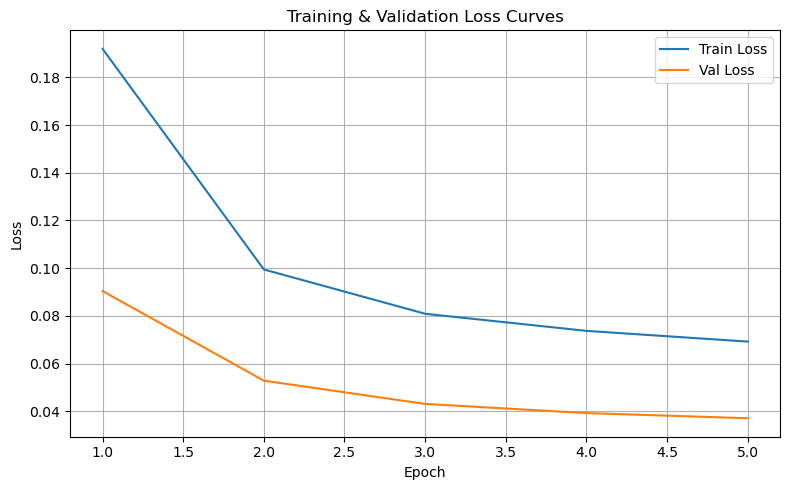

In [3]:
# ====== Test evaluation ======
print("\nRunning final test evaluation...")
model.load_state_dict(torch.load(SAVE_PATH))
model.eval()
test_main, test_smooth, test_vel = 0.0, 0.0, 0.0

with torch.no_grad():
  for batch in test_loader:
    audio      = batch['audio'].to(DEVICE)
    blendshape = batch['blendshape'].to(DEVICE)
    level      = batch['level'].to(DEVICE)
    person     = batch['person'].to(DEVICE)
    args.target_len = blendshape.size(1)

    pred, _ = model(audio, level, person), None
    _, logs = loss_fn(pred, blendshape)   # 内部做了 match_length

    test_main   += logs['main']
    test_smooth += logs['smooth']
    test_vel    += logs['vel']

n = len(test_loader)
print(f"Test L1 Loss:     {test_main/n:.4f}")
print(f"Test Smooth Loss: {test_smooth/n:}")
print(f"Test Vel Loss:    {test_vel/n:.4f}")

# ====== Plotting learning curves ======
plt.figure(figsize=(8,5))
plt.plot(range(1, EPOCHS+1), train_losses, label='Train Loss')
plt.plot(range(1, EPOCHS+1), val_losses,   label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Curves')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('loss_curves.png')
plt.show()


Test L1 Loss ≈ 0.0259
You’re now averaging just ~0.03 units of blendshape error. That’s “you can barely tell it’s off” territory.

Test Smooth Loss ≈ 4.06×10⁻⁵
A tiny but non-zero second-derivative penalty. You’re seeing almost no jerkiness, while still preserving micro-expressions.

Test Velocity Loss ≈ 0.0005
Super low velocity MSE—your frame-to-frame transitions are silky smooth, no awkward pops.

What this means
Quantitative win: Both content alignment (L1) and temporal coherence (vel + smooth) have improved over our first rounds.

Just-right smoothness: The non-zero smooth loss means you’re not over-filtering every nuance—good balance between stability and liveliness.


In [1]:
!python demo_batch_levels.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/scared.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/ravdess/ravdess07/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned_ravdess.pth" 


🧪 正在测试情绪等级 0 ...
/transfer/emotalk/EmoTalk_release-main/demo_batch_levels.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(args.model_p

In [1]:
# Full training, validation and test evaluation script for EmoTalk (RAVDESS)
import os
import torch
from torch.utils.data import DataLoader
from Emotalk_model_v0003 import EmoTalk
from train import DummyDataset
from loss_v0003 import EmoTalkLoss, smoothness_loss, velocity_loss
import matplotlib.pyplot as plt
from types import SimpleNamespace
from tqdm import tqdm

# ====== Configuration ======
DEVICE      = 'cuda' if torch.cuda.is_available() else 'cpu'
LR          = 1e-6
BATCH_SIZE  = 1
SAVE_PATH   = 'emotalk_finetuned_ravdess.pth'
LOG_CSV     = 'training_log.csv'

# 冻结阶段 / 全量微调阶段 Epoch 数
FREEZE_EPOCHS   = 2
UNFREEZE_EPOCHS = 3

args = SimpleNamespace(
    transformer_dim    = 512,
    transformer_heads  = 4,
    transformer_layers = 1,
    bs_dim             = 52,
    max_seq_len        = 512,
    period             = 20,
    emo_gru_hidden     = 128,
    emo_gru_layers     = 2,
    num_emotions       = 8,
    num_person         = 24,
    device             = DEVICE,
    batch_size         = BATCH_SIZE,
)

# ====== Data preparation ======
train_dataset = DummyDataset('./data/RAVDESS/train')
val_dataset   = DummyDataset('./data/RAVDESS/val')
test_dataset  = DummyDataset('./data/RAVDESS/test')

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False)

# ====== Model & Warm-start ======
model = EmoTalk(args).to(DEVICE)
init_ckpt = 'aligned_v2_init.pth'
if os.path.exists(init_ckpt):
    ckpt = torch.load(init_ckpt, map_location=DEVICE)
    # 去除旧的 level/person 映射
    for bad in ['obj_vector_level.weight','obj_vector_level.bias','obj_vector_person.weight']:
        ckpt.pop(bad, None)
    model.load_state_dict(ckpt, strict=False)
    print(f"🔥 Loaded warm-start (minus old level/person) from {init_ckpt}")
else:
    print(f"⚠️ Warm-start checkpoint not found: {init_ckpt}, training from scratch.")

# ====== Phase 1: Freeze pretrained blocks ======
# 冻结 Wav2Vec2 编码器 & 情感提取器
for p in model.extractor.parameters():
    p.requires_grad = False
for p in model.emo_extractor.parameters():
    p.requires_grad = False

# 只更新其它模块
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR
)
loss_fn  = EmoTalkLoss(region_weighted=True, mouth_only=True)

train_losses, val_losses = [], []
best_val_loss = float('inf')

def run_epoch(epoch, total_epochs, desc):
    model.train() if 'Train' in desc else model.eval()
    running_loss = 0.0
    loader = train_loader if 'Train' in desc else val_loader
    with torch.set_grad_enabled('Train' in desc):
        for batch in tqdm(loader, desc=f"Epoch {epoch}/{total_epochs} [{desc}]"):
            audio      = batch['audio'].to(DEVICE)
            blendshape = batch['blendshape'].to(DEVICE)
            level      = batch['level'].to(DEVICE)
            person     = batch['person'].to(DEVICE)
            args.target_len = blendshape.size(1)

            pred = model(audio, level, person)
            loss, logs = loss_fn(pred, blendshape)

            if 'Train' in desc:
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
            running_loss += loss.item()
    return running_loss / len(loader)

# —— Phase 1 Loop —— #
for epoch in range(1, FREEZE_EPOCHS+1):
    tloss = run_epoch(epoch, FREEZE_EPOCHS, 'Train')
    vloss = run_epoch(epoch, FREEZE_EPOCHS, 'Val')
    train_losses.append(tloss)
    val_losses.append(vloss)
    print(f"[Phase1][Epoch {epoch}] Train {tloss:.4f} | Val {vloss:.4f}")
    if vloss < best_val_loss:
        best_val_loss = vloss
        torch.save(model.state_dict(), SAVE_PATH)

# ====== Phase 2: Unfreeze all & differential LR ======
for p in model.parameters():
    p.requires_grad = True

optimizer = torch.optim.Adam([
    {'params': model.extractor.parameters(),     'lr': LR * 0.1},
    {'params': model.emo_extractor.parameters(), 'lr': LR * 0.1},
    {'params': model.extractor_proj.parameters(), 'lr': LR * 0.1},
    {'params': model.decoder.parameters(),       'lr': LR * 0.1},
    {'params': model.film_gamma.parameters()},
    {'params': model.film_beta.parameters()},
    {'params': model.emo_gru.parameters()},
    {'params': model.obj_vector_level.parameters()},
    {'params': model.obj_vector_person.parameters()},
    {'params': model.linear.parameters()},
], lr=LR)

# —— Phase 2 Loop —— #
for epoch in range(1, UNFREEZE_EPOCHS+1):
    tloss = run_epoch(epoch, UNFREEZE_EPOCHS, 'Train')
    vloss = run_epoch(epoch, UNFREEZE_EPOCHS, 'Val')
    train_losses.append(tloss)
    val_losses.append(vloss)
    print(f"[Phase2][Epoch {epoch}] Train {tloss:.4f} | Val {vloss:.4f}")
    if vloss < best_val_loss:
        best_val_loss = vloss
        torch.save(model.state_dict(), SAVE_PATH)

# ====== Final Test & Plot ======
print("\nRunning final test evaluation...")
model.load_state_dict(torch.load(SAVE_PATH))
model.eval()
test_main, test_smooth, test_vel = 0.0, 0.0, 0.0
with torch.no_grad():
    for batch in test_loader:
        audio      = batch['audio'].to(DEVICE)
        blendshape = batch['blendshape'].to(DEVICE)
        level      = batch['level'].to(DEVICE)
        person     = batch['person'].to(DEVICE)
        args.target_len = blendshape.size(1)
        pred = model(audio, level, person)
        _, logs = loss_fn(pred, blendshape)
        test_main   += logs['main']
        test_smooth += logs['smooth']
        test_vel    += logs['vel']
n = len(test_loader)
print(f"Test L1 Loss:     {test_main/n:.4f}")
print(f"Test Smooth Loss: {test_smooth/n:.4f}")
print(f"Test Vel Loss:    {test_vel/n:.4f}")

# Plotting
plt.figure(figsize=(8,5))
total_epochs = FREEZE_EPOCHS + UNFREEZE_EPOCHS
plt.plot(range(1, total_epochs+1), train_losses, label='Train Loss')
plt.plot(range(1, total_epochs+1), val_losses,   label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Curves')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('loss_curves.png')
plt.show()


/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.bias', 'lm_head.weight']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model fr

🔥 Loaded warm-start (minus old level/person) from aligned_v2_init.pth


Epoch 1/2 [Train]:   0%|                                                                                                 | 0/1140 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/2 [Train]:   0%|                                                                                         | 1/1140 [00:00<11:48,  1.61it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1/2 [Train]:   0%|▍                                                                                        | 5/1140 [00:00<02:31,  7.47it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1/2 [Train]:   1%|▋                                                                                        | 9/1140 [00:01<01:35, 11.79it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/2 [Train]:   1%|█                                                                                       | 13/1140 [00:01<01:16, 14.74it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/2 [Train]:   1%|█▎                                                                                      | 17/1140 [00:01<01:08, 16.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:   2%|█▌                                                                                      | 21/1140 [00:01<01:05, 17.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:   2%|█▉                                                                                      | 25/1140 [00:02<01:05, 17.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1/2 [Train]:   3%|██▏                                                                                     | 29/1140 [00:02<01:02, 17.68it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/2 [Train]:   3%|██▌                                                                                     | 33/1140 [00:02<01:01, 17.97it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/2 [Train]:   3%|██▊                                                                                     | 37/1140 [00:02<01:01, 17.93it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/2 [Train]:   4%|███▏                                                                                    | 41/1140 [00:02<01:00, 18.25it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1/2 [Train]:   4%|███▎                                                                                    | 43/1140 [00:03<01:00, 18.08it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/2 [Train]:   4%|███▋                                                                                    | 47/1140 [00:03<01:01, 17.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/2 [Train]:   4%|███▉                                                                                    | 51/1140 [00:03<01:01, 17.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:   5%|████▏                                                                                   | 55/1140 [00:03<00:59, 18.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 1/2 [Train]:   5%|████▌                                                                                   | 59/1140 [00:03<00:59, 18.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/2 [Train]:   6%|████▊                                                                                   | 63/1140 [00:04<01:00, 17.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])


Epoch 1/2 [Train]:   6%|█████▏                                                                                  | 67/1140 [00:04<01:02, 17.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1/2 [Train]:   6%|█████▍                                                                                  | 71/1140 [00:04<01:03, 16.86it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1/2 [Train]:   7%|█████▊                                                                                  | 75/1140 [00:04<01:00, 17.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/2 [Train]:   7%|██████                                                                                  | 79/1140 [00:05<00:58, 18.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1/2 [Train]:   7%|██████▍                                                                                 | 83/1140 [00:05<00:59, 17.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/2 [Train]:   8%|██████▋                                                                                 | 87/1140 [00:05<00:57, 18.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/2 [Train]:   8%|███████                                                                                 | 91/1140 [00:05<00:58, 17.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:   8%|███████▎                                                                                | 95/1140 [00:05<00:57, 18.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:   9%|███████▋                                                                                | 99/1140 [00:06<00:57, 18.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/2 [Train]:   9%|███████▊                                                                               | 103/1140 [00:06<00:56, 18.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/2 [Train]:   9%|████████▏                                                                              | 107/1140 [00:06<00:56, 18.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/2 [Train]:  10%|████████▍                                                                              | 111/1140 [00:06<00:55, 18.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  10%|████████▊                                                                              | 115/1140 [00:07<00:55, 18.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  10%|█████████                                                                              | 119/1140 [00:07<00:54, 18.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/2 [Train]:  11%|█████████▍                                                                             | 123/1140 [00:07<00:53, 19.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])
🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])


Epoch 1/2 [Train]:  11%|█████████▋                                                                             | 127/1140 [00:07<00:53, 18.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/2 [Train]:  11%|█████████▉                                                                             | 131/1140 [00:07<00:54, 18.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  12%|██████████▎                                                                            | 135/1140 [00:08<00:55, 17.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/2 [Train]:  12%|██████████▌                                                                            | 139/1140 [00:08<00:54, 18.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  13%|██████████▉                                                                            | 143/1140 [00:08<00:53, 18.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  13%|███████████▏                                                                           | 147/1140 [00:08<00:52, 18.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  13%|███████████▌                                                                           | 151/1140 [00:08<00:52, 18.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 1/2 [Train]:  14%|███████████▊                                                                           | 155/1140 [00:09<00:51, 18.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  14%|████████████▏                                                                          | 159/1140 [00:09<00:53, 18.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1/2 [Train]:  14%|████████████▍                                                                          | 163/1140 [00:09<00:52, 18.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/2 [Train]:  15%|████████████▋                                                                          | 167/1140 [00:09<00:52, 18.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  15%|█████████████                                                                          | 171/1140 [00:10<00:52, 18.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/2 [Train]:  15%|█████████████▎                                                                         | 175/1140 [00:10<00:54, 17.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1/2 [Train]:  16%|█████████████▌                                                                         | 177/1140 [00:10<00:55, 17.30it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  16%|█████████████▊                                                                         | 181/1140 [00:10<00:53, 17.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/2 [Train]:  16%|██████████████                                                                         | 185/1140 [00:10<00:52, 18.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:  17%|██████████████▍                                                                        | 189/1140 [00:11<00:53, 17.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 1/2 [Train]:  17%|██████████████▋                                                                        | 193/1140 [00:11<00:52, 18.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/2 [Train]:  17%|███████████████                                                                        | 197/1140 [00:11<00:52, 17.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1/2 [Train]:  18%|███████████████▎                                                                       | 201/1140 [00:11<00:54, 17.28it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/2 [Train]:  18%|███████████████▋                                                                       | 205/1140 [00:11<00:53, 17.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/2 [Train]:  18%|███████████████▉                                                                       | 209/1140 [00:12<00:54, 17.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])


Epoch 1/2 [Train]:  19%|████████████████                                                                       | 211/1140 [00:12<00:54, 17.05it/s]

🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/2 [Train]:  19%|████████████████▍                                                                      | 215/1140 [00:12<00:53, 17.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  19%|████████████████▋                                                                      | 219/1140 [00:12<00:51, 17.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/2 [Train]:  20%|█████████████████                                                                      | 223/1140 [00:12<00:50, 18.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/2 [Train]:  20%|█████████████████▎                                                                     | 227/1140 [00:13<00:50, 18.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/2 [Train]:  20%|█████████████████▋                                                                     | 231/1140 [00:13<00:48, 18.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/2 [Train]:  21%|█████████████████▉                                                                     | 235/1140 [00:13<00:47, 19.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 1/2 [Train]:  21%|██████████████████▏                                                                    | 239/1140 [00:13<00:48, 18.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/2 [Train]:  21%|██████████████████▌                                                                    | 243/1140 [00:14<00:50, 17.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  22%|██████████████████▊                                                                    | 247/1140 [00:14<00:51, 17.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1/2 [Train]:  22%|███████████████████▏                                                                   | 251/1140 [00:14<00:50, 17.75it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1/2 [Train]:  22%|███████████████████▍                                                                   | 255/1140 [00:14<00:50, 17.66it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/2 [Train]:  23%|███████████████████▊                                                                   | 259/1140 [00:14<00:50, 17.35it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/2 [Train]:  23%|████████████████████                                                                   | 263/1140 [00:15<00:49, 17.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/2 [Train]:  23%|████████████████████▍                                                                  | 267/1140 [00:15<00:49, 17.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/2 [Train]:  24%|████████████████████▋                                                                  | 271/1140 [00:15<00:49, 17.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/2 [Train]:  24%|████████████████████▉                                                                  | 275/1140 [00:15<00:48, 17.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  24%|█████████████████████▎                                                                 | 279/1140 [00:16<00:46, 18.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/2 [Train]:  25%|█████████████████████▌                                                                 | 283/1140 [00:16<00:45, 18.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/2 [Train]:  25%|█████████████████████▉                                                                 | 287/1140 [00:16<00:45, 18.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  26%|██████████████████████▏                                                                | 291/1140 [00:16<00:45, 18.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78507])
🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/2 [Train]:  26%|██████████████████████▌                                                                | 295/1140 [00:16<00:46, 18.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/2 [Train]:  26%|██████████████████████▊                                                                | 299/1140 [00:17<00:47, 17.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/2 [Train]:  27%|███████████████████████                                                                | 303/1140 [00:17<00:45, 18.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/2 [Train]:  27%|███████████████████████▍                                                               | 307/1140 [00:17<00:44, 18.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  27%|███████████████████████▋                                                               | 311/1140 [00:17<00:45, 18.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/2 [Train]:  28%|████████████████████████                                                               | 315/1140 [00:18<00:48, 16.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/2 [Train]:  28%|████████████████████████▎                                                              | 319/1140 [00:18<00:45, 17.94it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1/2 [Train]:  28%|████████████████████████▋                                                              | 323/1140 [00:18<00:45, 18.07it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/2 [Train]:  29%|████████████████████████▊                                                              | 325/1140 [00:18<00:46, 17.70it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/2 [Train]:  29%|█████████████████████████                                                              | 329/1140 [00:18<00:46, 17.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  29%|█████████████████████████▍                                                             | 333/1140 [00:19<00:45, 17.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/2 [Train]:  30%|█████████████████████████▋                                                             | 337/1140 [00:19<00:44, 17.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/2 [Train]:  30%|██████████████████████████                                                             | 341/1140 [00:19<00:46, 17.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1/2 [Train]:  30%|██████████████████████████▎                                                            | 345/1140 [00:19<00:45, 17.28it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  31%|██████████████████████████▋                                                            | 349/1140 [00:19<00:44, 17.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1/2 [Train]:  31%|██████████████████████████▉                                                            | 353/1140 [00:20<00:46, 17.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1/2 [Train]:  31%|███████████████████████████▏                                                           | 357/1140 [00:20<00:44, 17.44it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:  31%|███████████████████████████▍                                                           | 359/1140 [00:20<00:44, 17.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/2 [Train]:  32%|███████████████████████████▋                                                           | 363/1140 [00:20<00:45, 17.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])


Epoch 1/2 [Train]:  32%|████████████████████████████                                                           | 367/1140 [00:21<00:45, 16.99it/s]

🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/2 [Train]:  33%|████████████████████████████▎                                                          | 371/1140 [00:21<00:46, 16.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1/2 [Train]:  33%|████████████████████████████▍                                                          | 373/1140 [00:21<00:46, 16.57it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 1/2 [Train]:  33%|████████████████████████████▊                                                          | 377/1140 [00:21<00:44, 17.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  33%|█████████████████████████████                                                          | 381/1140 [00:21<00:43, 17.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  34%|█████████████████████████████▍                                                         | 385/1140 [00:22<00:41, 18.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/2 [Train]:  34%|█████████████████████████████▋                                                         | 389/1140 [00:22<00:41, 17.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/2 [Train]:  34%|█████████████████████████████▉                                                         | 393/1140 [00:22<00:43, 17.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 1/2 [Train]:  35%|██████████████████████████████▎                                                        | 397/1140 [00:22<00:43, 17.11it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/2 [Train]:  35%|██████████████████████████████▌                                                        | 401/1140 [00:23<00:43, 17.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/2 [Train]:  36%|██████████████████████████████▉                                                        | 405/1140 [00:23<00:42, 17.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/2 [Train]:  36%|███████████████████████████████▏                                                       | 409/1140 [00:23<00:41, 17.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/2 [Train]:  36%|███████████████████████████████▌                                                       | 413/1140 [00:23<00:40, 17.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:  37%|███████████████████████████████▊                                                       | 417/1140 [00:23<00:40, 17.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/2 [Train]:  37%|████████████████████████████████▏                                                      | 421/1140 [00:24<00:41, 17.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/2 [Train]:  37%|████████████████████████████████▎                                                      | 423/1140 [00:24<00:41, 17.13it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/2 [Train]:  37%|████████████████████████████████▌                                                      | 427/1140 [00:24<00:42, 16.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 1/2 [Train]:  38%|████████████████████████████████▉                                                      | 431/1140 [00:24<00:41, 17.01it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1/2 [Train]:  38%|█████████████████████████████████▏                                                     | 435/1140 [00:24<00:40, 17.35it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/2 [Train]:  39%|█████████████████████████████████▌                                                     | 439/1140 [00:25<00:41, 17.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/2 [Train]:  39%|█████████████████████████████████▋                                                     | 441/1140 [00:25<00:40, 17.09it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/2 [Train]:  39%|█████████████████████████████████▉                                                     | 445/1140 [00:25<00:39, 17.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1/2 [Train]:  39%|██████████████████████████████████▎                                                    | 449/1140 [00:25<00:38, 17.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/2 [Train]:  40%|██████████████████████████████████▌                                                    | 453/1140 [00:25<00:38, 17.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 1/2 [Train]:  40%|██████████████████████████████████▉                                                    | 457/1140 [00:26<00:38, 17.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 1/2 [Train]:  40%|███████████████████████████████████▏                                                   | 461/1140 [00:26<00:38, 17.75it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1/2 [Train]:  41%|███████████████████████████████████▍                                                   | 465/1140 [00:26<00:37, 18.04it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1/2 [Train]:  41%|███████████████████████████████████▊                                                   | 469/1140 [00:26<00:36, 18.32it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1/2 [Train]:  41%|████████████████████████████████████                                                   | 473/1140 [00:27<00:37, 17.78it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 1/2 [Train]:  42%|████████████████████████████████████▍                                                  | 477/1140 [00:27<00:37, 17.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:  42%|████████████████████████████████████▋                                                  | 481/1140 [00:27<00:38, 16.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 1/2 [Train]:  43%|█████████████████████████████████████                                                  | 485/1140 [00:27<00:36, 17.71it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 1/2 [Train]:  43%|█████████████████████████████████████▏                                                 | 487/1140 [00:27<00:36, 17.74it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])


Epoch 1/2 [Train]:  43%|█████████████████████████████████████▍                                                 | 491/1140 [00:28<00:37, 17.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/2 [Train]:  43%|█████████████████████████████████████▊                                                 | 495/1140 [00:28<00:39, 16.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 1/2 [Train]:  44%|██████████████████████████████████████                                                 | 499/1140 [00:28<00:37, 17.09it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  44%|██████████████████████████████████████▍                                                | 503/1140 [00:28<00:36, 17.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/2 [Train]:  44%|██████████████████████████████████████▋                                                | 507/1140 [00:29<00:35, 17.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  45%|██████████████████████████████████████▉                                                | 511/1140 [00:29<00:35, 17.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/2 [Train]:  45%|███████████████████████████████████████▎                                               | 515/1140 [00:29<00:35, 17.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/2 [Train]:  46%|███████████████████████████████████████▌                                               | 519/1140 [00:29<00:36, 17.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/2 [Train]:  46%|███████████████████████████████████████▉                                               | 523/1140 [00:29<00:35, 17.55it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1/2 [Train]:  46%|████████████████████████████████████████▏                                              | 527/1140 [00:30<00:34, 17.84it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])


Epoch 1/2 [Train]:  46%|████████████████████████████████████████▎                                              | 529/1140 [00:30<00:34, 17.56it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/2 [Train]:  47%|████████████████████████████████████████▋                                              | 533/1140 [00:30<00:36, 16.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1/2 [Train]:  47%|████████████████████████████████████████▉                                              | 537/1140 [00:30<00:35, 16.98it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/2 [Train]:  47%|█████████████████████████████████████████▎                                             | 541/1140 [00:31<00:34, 17.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  48%|█████████████████████████████████████████▌                                             | 545/1140 [00:31<00:34, 17.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/2 [Train]:  48%|█████████████████████████████████████████▉                                             | 549/1140 [00:31<00:33, 17.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/2 [Train]:  49%|██████████████████████████████████████████▏                                            | 553/1140 [00:31<00:32, 18.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/2 [Train]:  49%|██████████████████████████████████████████▌                                            | 557/1140 [00:31<00:32, 17.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/2 [Train]:  49%|██████████████████████████████████████████▊                                            | 561/1140 [00:32<00:32, 17.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  50%|███████████████████████████████████████████                                            | 565/1140 [00:32<00:31, 18.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/2 [Train]:  50%|███████████████████████████████████████████▍                                           | 569/1140 [00:32<00:31, 17.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/2 [Train]:  50%|███████████████████████████████████████████▋                                           | 573/1140 [00:32<00:31, 17.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  51%|████████████████████████████████████████████                                           | 577/1140 [00:33<00:31, 17.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 1/2 [Train]:  51%|████████████████████████████████████████████▎                                          | 581/1140 [00:33<00:31, 17.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/2 [Train]:  51%|████████████████████████████████████████████▋                                          | 585/1140 [00:33<00:31, 17.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  52%|████████████████████████████████████████████▉                                          | 589/1140 [00:33<00:30, 18.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/2 [Train]:  52%|█████████████████████████████████████████████▎                                         | 593/1140 [00:33<00:31, 17.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  52%|█████████████████████████████████████████████▌                                         | 597/1140 [00:34<00:30, 17.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 1/2 [Train]:  53%|█████████████████████████████████████████████▊                                         | 601/1140 [00:34<00:31, 17.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1/2 [Train]:  53%|██████████████████████████████████████████████▏                                        | 605/1140 [00:34<00:30, 17.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/2 [Train]:  53%|██████████████████████████████████████████████▍                                        | 609/1140 [00:34<00:29, 18.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  54%|██████████████████████████████████████████████▊                                        | 613/1140 [00:35<00:29, 18.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  54%|███████████████████████████████████████████████                                        | 617/1140 [00:35<00:28, 18.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/2 [Train]:  54%|███████████████████████████████████████████████▍                                       | 621/1140 [00:35<00:28, 18.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/2 [Train]:  55%|███████████████████████████████████████████████▋                                       | 625/1140 [00:35<00:28, 18.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/2 [Train]:  55%|████████████████████████████████████████████████                                       | 629/1140 [00:35<00:28, 18.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/2 [Train]:  56%|████████████████████████████████████████████████▎                                      | 633/1140 [00:36<00:27, 18.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/2 [Train]:  56%|████████████████████████████████████████████████▌                                      | 637/1140 [00:36<00:28, 17.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  56%|████████████████████████████████████████████████▉                                      | 641/1140 [00:36<00:27, 18.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/2 [Train]:  57%|█████████████████████████████████████████████████▏                                     | 645/1140 [00:36<00:26, 18.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/2 [Train]:  57%|█████████████████████████████████████████████████▌                                     | 649/1140 [00:37<00:27, 18.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/2 [Train]:  57%|█████████████████████████████████████████████████▊                                     | 653/1140 [00:37<00:26, 18.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/2 [Train]:  58%|██████████████████████████████████████████████████▏                                    | 657/1140 [00:37<00:27, 17.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  58%|██████████████████████████████████████████████████▍                                    | 661/1140 [00:37<00:26, 18.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/2 [Train]:  58%|██████████████████████████████████████████████████▊                                    | 665/1140 [00:37<00:25, 18.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  59%|███████████████████████████████████████████████████                                    | 669/1140 [00:38<00:25, 18.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/2 [Train]:  59%|███████████████████████████████████████████████████▎                                   | 673/1140 [00:38<00:26, 17.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  59%|███████████████████████████████████████████████████▋                                   | 677/1140 [00:38<00:25, 17.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 1/2 [Train]:  60%|███████████████████████████████████████████████████▊                                   | 679/1140 [00:38<00:29, 15.37it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/2 [Train]:  60%|████████████████████████████████████████████████████                                   | 683/1140 [00:38<00:27, 16.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/2 [Train]:  60%|████████████████████████████████████████████████████▍                                  | 687/1140 [00:39<00:25, 17.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  61%|████████████████████████████████████████████████████▋                                  | 691/1140 [00:39<00:25, 17.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/2 [Train]:  61%|█████████████████████████████████████████████████████                                  | 695/1140 [00:39<00:25, 17.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/2 [Train]:  61%|█████████████████████████████████████████████████████▎                                 | 699/1140 [00:39<00:24, 17.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])


Epoch 1/2 [Train]:  62%|█████████████████████████████████████████████████████▋                                 | 703/1140 [00:40<00:25, 17.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1/2 [Train]:  62%|█████████████████████████████████████████████████████▉                                 | 707/1140 [00:40<00:26, 16.64it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 1/2 [Train]:  62%|██████████████████████████████████████████████████████▎                                | 711/1140 [00:40<00:25, 17.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/2 [Train]:  63%|██████████████████████████████████████████████████████▌                                | 715/1140 [00:40<00:23, 17.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/2 [Train]:  63%|██████████████████████████████████████████████████████▊                                | 719/1140 [00:41<00:24, 17.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1/2 [Train]:  63%|███████████████████████████████████████████████████████                                | 721/1140 [00:41<00:24, 17.29it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])


Epoch 1/2 [Train]:  64%|███████████████████████████████████████████████████████▎                               | 725/1140 [00:41<00:24, 17.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 1/2 [Train]:  64%|███████████████████████████████████████████████████████▋                               | 729/1140 [00:41<00:24, 17.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/2 [Train]:  64%|███████████████████████████████████████████████████████▉                               | 733/1140 [00:41<00:23, 17.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/2 [Train]:  65%|████████████████████████████████████████████████████████▏                              | 737/1140 [00:42<00:23, 17.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 1/2 [Train]:  65%|████████████████████████████████████████████████████████▌                              | 741/1140 [00:42<00:22, 17.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  65%|████████████████████████████████████████████████████████▊                              | 745/1140 [00:42<00:21, 18.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/2 [Train]:  66%|█████████████████████████████████████████████████████████▏                             | 749/1140 [00:42<00:21, 18.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/2 [Train]:  66%|█████████████████████████████████████████████████████████▍                             | 753/1140 [00:42<00:21, 18.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  66%|█████████████████████████████████████████████████████████▊                             | 757/1140 [00:43<00:21, 18.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 1/2 [Train]:  67%|██████████████████████████████████████████████████████████                             | 761/1140 [00:43<00:20, 18.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/2 [Train]:  67%|██████████████████████████████████████████████████████████▍                            | 765/1140 [00:43<00:20, 18.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/2 [Train]:  67%|██████████████████████████████████████████████████████████▋                            | 769/1140 [00:43<00:20, 17.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  68%|██████████████████████████████████████████████████████████▉                            | 773/1140 [00:44<00:20, 17.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 1/2 [Train]:  68%|███████████████████████████████████████████████████████████▎                           | 777/1140 [00:44<00:20, 17.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 1/2 [Train]:  69%|███████████████████████████████████████████████████████████▌                           | 781/1140 [00:44<00:19, 18.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  69%|███████████████████████████████████████████████████████████▉                           | 785/1140 [00:44<00:19, 17.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/2 [Train]:  69%|████████████████████████████████████████████████████████████▏                          | 789/1140 [00:44<00:19, 18.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 1/2 [Train]:  70%|████████████████████████████████████████████████████████████▌                          | 793/1140 [00:45<00:19, 17.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:  70%|████████████████████████████████████████████████████████████▊                          | 797/1140 [00:45<00:19, 17.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  70%|█████████████████████████████████████████████████████████████▏                         | 801/1140 [00:45<00:18, 18.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  71%|█████████████████████████████████████████████████████████████▍                         | 805/1140 [00:45<00:19, 17.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:  71%|█████████████████████████████████████████████████████████████▋                         | 809/1140 [00:46<00:19, 17.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  71%|██████████████████████████████████████████████████████████████                         | 813/1140 [00:46<00:18, 17.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/2 [Train]:  72%|██████████████████████████████████████████████████████████████▎                        | 817/1140 [00:46<00:17, 18.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  72%|██████████████████████████████████████████████████████████████▋                        | 821/1140 [00:46<00:18, 17.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 1/2 [Train]:  72%|██████████████████████████████████████████████████████████████▉                        | 825/1140 [00:46<00:17, 17.81it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1/2 [Train]:  73%|███████████████████████████████████████████████████████████████▎                       | 829/1140 [00:47<00:17, 17.83it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/2 [Train]:  73%|███████████████████████████████████████████████████████████████▌                       | 833/1140 [00:47<00:17, 17.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/2 [Train]:  73%|███████████████████████████████████████████████████████████████▉                       | 837/1140 [00:47<00:17, 17.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/2 [Train]:  74%|████████████████████████████████████████████████████████████████▏                      | 841/1140 [00:47<00:16, 18.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:  74%|████████████████████████████████████████████████████████████████▍                      | 845/1140 [00:48<00:16, 17.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  74%|████████████████████████████████████████████████████████████████▊                      | 849/1140 [00:48<00:15, 18.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 1/2 [Train]:  75%|█████████████████████████████████████████████████████████████████                      | 853/1140 [00:48<00:15, 17.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/2 [Train]:  75%|█████████████████████████████████████████████████████████████████▍                     | 857/1140 [00:48<00:15, 18.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 1/2 [Train]:  76%|█████████████████████████████████████████████████████████████████▋                     | 861/1140 [00:48<00:15, 17.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  76%|██████████████████████████████████████████████████████████████████                     | 865/1140 [00:49<00:14, 18.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  76%|██████████████████████████████████████████████████████████████████▎                    | 869/1140 [00:49<00:14, 18.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 1/2 [Train]:  77%|██████████████████████████████████████████████████████████████████▌                    | 873/1140 [00:49<00:15, 17.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/2 [Train]:  77%|██████████████████████████████████████████████████████████████████▉                    | 877/1140 [00:49<00:14, 17.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])


Epoch 1/2 [Train]:  77%|███████████████████████████████████████████████████████████████████▏                   | 881/1140 [00:50<00:14, 17.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  78%|███████████████████████████████████████████████████████████████████▌                   | 885/1140 [00:50<00:14, 18.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/2 [Train]:  78%|███████████████████████████████████████████████████████████████████▊                   | 889/1140 [00:50<00:13, 18.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 1/2 [Train]:  78%|████████████████████████████████████████████████████████████████████▏                  | 893/1140 [00:50<00:13, 18.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  79%|████████████████████████████████████████████████████████████████████▍                  | 897/1140 [00:50<00:13, 18.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/2 [Train]:  79%|████████████████████████████████████████████████████████████████████▊                  | 901/1140 [00:51<00:12, 18.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/2 [Train]:  79%|█████████████████████████████████████████████████████████████████████                  | 905/1140 [00:51<00:12, 18.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])
🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])


Epoch 1/2 [Train]:  80%|█████████████████████████████████████████████████████████████████████▎                 | 909/1140 [00:51<00:12, 18.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  80%|█████████████████████████████████████████████████████████████████████▋                 | 913/1140 [00:51<00:12, 18.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 1/2 [Train]:  80%|█████████████████████████████████████████████████████████████████████▉                 | 917/1140 [00:52<00:12, 17.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 1/2 [Train]:  81%|██████████████████████████████████████████████████████████████████████▏                | 919/1140 [00:52<00:13, 16.99it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/2 [Train]:  81%|██████████████████████████████████████████████████████████████████████▍                | 923/1140 [00:52<00:12, 16.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1/2 [Train]:  81%|██████████████████████████████████████████████████████████████████████▋                | 927/1140 [00:52<00:12, 17.61it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1/2 [Train]:  82%|███████████████████████████████████████████████████████████████████████                | 931/1140 [00:52<00:12, 17.21it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  82%|███████████████████████████████████████████████████████████████████████▎               | 935/1140 [00:53<00:11, 18.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  82%|███████████████████████████████████████████████████████████████████████▋               | 939/1140 [00:53<00:11, 17.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  83%|███████████████████████████████████████████████████████████████████████▉               | 943/1140 [00:53<00:10, 18.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  83%|████████████████████████████████████████████████████████████████████████▎              | 947/1140 [00:53<00:10, 18.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/2 [Train]:  83%|████████████████████████████████████████████████████████████████████████▌              | 951/1140 [00:53<00:10, 17.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/2 [Train]:  84%|████████████████████████████████████████████████████████████████████████▉              | 955/1140 [00:54<00:10, 17.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/2 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▏             | 959/1140 [00:54<00:10, 18.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 1/2 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▍             | 963/1140 [00:54<00:09, 18.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/2 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▊             | 967/1140 [00:54<00:09, 18.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  85%|██████████████████████████████████████████████████████████████████████████             | 971/1140 [00:55<00:09, 18.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/2 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▍            | 975/1140 [00:55<00:09, 17.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/2 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▋            | 979/1140 [00:55<00:08, 17.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 1/2 [Train]:  86%|███████████████████████████████████████████████████████████████████████████            | 983/1140 [00:55<00:08, 17.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/2 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▎           | 987/1140 [00:55<00:08, 17.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/2 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▋           | 991/1140 [00:56<00:08, 17.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▉           | 995/1140 [00:56<00:07, 18.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 1/2 [Train]:  88%|████████████████████████████████████████████████████████████████████████████▏          | 999/1140 [00:56<00:07, 18.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/2 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▋          | 1003/1140 [00:56<00:07, 17.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 1/2 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▉          | 1007/1140 [00:57<00:07, 17.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1/2 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▎         | 1011/1140 [00:57<00:07, 17.70it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 1/2 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▌         | 1015/1140 [00:57<00:06, 17.90it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/2 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▊         | 1019/1140 [00:57<00:06, 18.01it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 1/2 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▏        | 1023/1140 [00:57<00:06, 18.11it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1/2 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▍        | 1027/1140 [00:58<00:06, 17.86it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 1/2 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▋        | 1029/1140 [00:58<00:06, 17.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 1/2 [Train]:  91%|█████████████████████████████████████████████████████████████████████████████▉        | 1033/1140 [00:58<00:06, 16.96it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 1/2 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▏       | 1037/1140 [00:58<00:05, 17.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/2 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▌       | 1041/1140 [00:59<00:05, 18.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/2 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▊       | 1045/1140 [00:59<00:05, 18.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▏      | 1049/1140 [00:59<00:05, 17.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 1/2 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▍      | 1053/1140 [00:59<00:04, 17.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 1/2 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▋      | 1057/1140 [00:59<00:04, 17.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 1/2 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████      | 1061/1140 [01:00<00:04, 18.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/2 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████▎     | 1065/1140 [01:00<00:04, 18.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 1/2 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▋     | 1069/1140 [01:00<00:03, 18.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/2 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▉     | 1073/1140 [01:00<00:03, 18.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████▏    | 1077/1140 [01:00<00:03, 18.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 1/2 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▌    | 1081/1140 [01:01<00:03, 18.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 1/2 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▊    | 1085/1140 [01:01<00:03, 18.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/2 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▏   | 1089/1140 [01:01<00:02, 17.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 1/2 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▍   | 1093/1140 [01:01<00:02, 17.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▊   | 1097/1140 [01:02<00:02, 17.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████   | 1101/1140 [01:02<00:02, 18.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/2 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▎  | 1105/1140 [01:02<00:01, 18.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 1/2 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▋  | 1109/1140 [01:02<00:01, 18.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████▉  | 1113/1140 [01:02<00:01, 17.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 1/2 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▎ | 1117/1140 [01:03<00:01, 18.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 1/2 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▌ | 1121/1140 [01:03<00:01, 17.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 1/2 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▊ | 1125/1140 [01:03<00:00, 18.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/2 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▏| 1129/1140 [01:03<00:00, 17.42it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 1/2 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▎| 1131/1140 [01:04<00:00, 17.07it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 1/2 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▌| 1135/1140 [01:04<00:00, 16.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 1/2 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████████| 1140/1140 [01:04<00:00, 17.66it/s]


👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 1/2 [Val]:   0%|                                                                                                    | 0/404 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1/2 [Val]:   1%|▉                                                                                           | 4/404 [00:00<00:10, 39.49it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 1/2 [Val]:   2%|█▊                                                                                          | 8/404 [00:00<00:10, 39.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/2 [Val]:   3%|██▋                                                                                        | 12/404 [00:00<00:09, 39.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/2 [Val]:   4%|███▌                                                                                       | 16/404 [00:00<00:09, 39.15it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])


Epoch 1/2 [Val]:   5%|████▌                                                                                      | 20/404 [00:00<00:09, 38.82it/s]

🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1/2 [Val]:   6%|█████▍                                                                                     | 24/404 [00:00<00:09, 38.98it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1/2 [Val]:   7%|██████▎                                                                                    | 28/404 [00:00<00:09, 38.70it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 1/2 [Val]:   8%|███████▏                                                                                   | 32/404 [00:00<00:09, 38.63it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 1/2 [Val]:   9%|████████                                                                                   | 36/404 [00:00<00:09, 39.01it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 1/2 [Val]:  10%|█████████                                                                                  | 40/404 [00:01<00:09, 36.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1/2 [Val]:  11%|█████████▉                                                                                 | 44/404 [00:01<00:09, 36.08it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/2 [Val]:  12%|██████████▊                                                                                | 48/404 [00:01<00:09, 36.78it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 1/2 [Val]:  13%|███████████▋                                                                               | 52/404 [00:01<00:09, 37.02it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1/2 [Val]:  14%|████████████▌                                                                              | 56/404 [00:01<00:09, 37.60it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])


Epoch 1/2 [Val]:  15%|█████████████▌                                                                             | 60/404 [00:01<00:09, 37.23it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch

Epoch 1/2 [Val]:  17%|███████████████▎                                                                           | 68/404 [00:01<00:09, 35.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])


Epoch 1/2 [Val]:  19%|█████████████████                                                                          | 76/404 [00:02<00:09, 35.62it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch

Epoch 1/2 [Val]:  21%|██████████████████▉                                                                        | 84/404 [00:02<00:09, 35.36it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch

Epoch 1/2 [Val]:  23%|████████████████████▋                                                                      | 92/404 [00:02<00:08, 36.85it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 1/2 [Val]:  25%|██████████████████████▎                                                                   | 100/404 [00:02<00:07, 38.01it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch

Epoch 1/2 [Val]:  27%|████████████████████████                                                                  | 108/404 [00:02<00:07, 37.97it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch

Epoch 1/2 [Val]:  29%|█████████████████████████▊                                                                | 116/404 [00:03<00:07, 37.26it/s]

🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch

Epoch 1/2 [Val]:  31%|███████████████████████████▌                                                              | 124/404 [00:03<00:07, 37.00it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch

Epoch 1/2 [Val]:  33%|█████████████████████████████▍                                                            | 132/404 [00:03<00:07, 38.12it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch

Epoch 1/2 [Val]:  35%|███████████████████████████████▏                                                          | 140/404 [00:03<00:06, 38.14it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch

Epoch 1/2 [Val]:  37%|████████████████████████████████▉                                                         | 148/404 [00:03<00:06, 37.87it/s]

🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch

Epoch 1/2 [Val]:  39%|██████████████████████████████████▊                                                       | 156/404 [00:04<00:06, 37.74it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch

Epoch 1/2 [Val]:  41%|████████████████████████████████████▌                                                     | 164/404 [00:04<00:06, 37.53it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch

Epoch 1/2 [Val]:  43%|██████████████████████████████████████▎                                                   | 172/404 [00:04<00:06, 37.45it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch

Epoch 1/2 [Val]:  45%|████████████████████████████████████████                                                  | 180/404 [00:04<00:05, 38.10it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch

Epoch 1/2 [Val]:  47%|█████████████████████████████████████████▉                                                | 188/404 [00:05<00:05, 37.85it/s]

🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch

Epoch 1/2 [Val]:  49%|███████████████████████████████████████████▋                                              | 196/404 [00:05<00:05, 37.20it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch

Epoch 1/2 [Val]:  50%|█████████████████████████████████████████████▍                                            | 204/404 [00:05<00:05, 37.27it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch

Epoch 1/2 [Val]:  52%|███████████████████████████████████████████████▏                                          | 212/404 [00:05<00:05, 37.45it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch

Epoch 1/2 [Val]:  54%|█████████████████████████████████████████████████                                         | 220/404 [00:05<00:04, 37.81it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch

Epoch 1/2 [Val]:  56%|██████████████████████████████████████████████████▊                                       | 228/404 [00:06<00:04, 38.04it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch

Epoch 1/2 [Val]:  58%|████████████████████████████████████████████████████▌                                     | 236/404 [00:06<00:04, 38.44it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch

Epoch 1/2 [Val]:  60%|██████████████████████████████████████████████████████▎                                   | 244/404 [00:06<00:04, 37.73it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch

Epoch 1/2 [Val]:  62%|████████████████████████████████████████████████████████▏                                 | 252/404 [00:06<00:04, 37.73it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch

Epoch 1/2 [Val]:  64%|█████████████████████████████████████████████████████████▉                                | 260/404 [00:06<00:03, 37.51it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch

Epoch 1/2 [Val]:  66%|███████████████████████████████████████████████████████████▋                              | 268/404 [00:07<00:03, 38.43it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 1/2 [Val]:  68%|█████████████████████████████████████████████████████████████▍                            | 276/404 [00:07<00:03, 37.89it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch

Epoch 1/2 [Val]:  71%|███████████████████████████████████████████████████████████████▋                          | 286/404 [00:07<00:03, 39.32it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch

Epoch 1/2 [Val]:  73%|█████████████████████████████████████████████████████████████████▍                        | 294/404 [00:07<00:02, 39.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape 

Epoch 1/2 [Val]:  74%|██████████████████████████████████████████████████████████████████▍                       | 298/404 [00:07<00:02, 39.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 1/2 [Val]:  75%|███████████████████████████████████████████████████████████████████▎                      | 302/404 [00:08<00:02, 38.72it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 1/2 [Val]:  76%|████████████████████████████████████████████████████████████████████▏                     | 306/404 [00:08<00:02, 38.92it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 1/2 [Val]:  77%|█████████████████████████████████████████████████████████████████████                     | 310/404 [00:08<00:02, 39.01it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 1/2 [Val]:  78%|█████████████████████████████████████████████████████████████████████▉                    | 314/404 [00:08<00:02, 37.04it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])


Epoch 1/2 [Val]:  79%|██████████████████████████████████████████████████████████████████████▊                   | 318/404 [00:08<00:02, 36.94it/s]

🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 1/2 [Val]:  80%|███████████████████████████████████████████████████████████████████████▋                  | 322/404 [00:08<00:02, 37.57it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch

Epoch 1/2 [Val]:  82%|█████████████████████████████████████████████████████████████████████████▋                | 331/404 [00:08<00:01, 38.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape 

Epoch 1/2 [Val]:  84%|███████████████████████████████████████████████████████████████████████████▌              | 339/404 [00:08<00:01, 38.32it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch

Epoch 1/2 [Val]:  86%|█████████████████████████████████████████████████████████████████████████████▌            | 348/404 [00:09<00:01, 38.98it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 1/2 [Val]:  88%|███████████████████████████████████████████████████████████████████████████████▌          | 357/404 [00:09<00:01, 39.44it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch

Epoch 1/2 [Val]:  89%|████████████████████████████████████████████████████████████████████████████████▍         | 361/404 [00:09<00:01, 38.37it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 1/2 [Val]:  91%|█████████████████████████████████████████████████████████████████████████████████▌        | 366/404 [00:09<00:00, 38.79it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 1/2 [Val]:  92%|██████████████████████████████████████████████████████████████████████████████████▍       | 370/404 [00:09<00:00, 38.62it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 1/2 [Val]:  93%|███████████████████████████████████████████████████████████████████████████████████▎      | 374/404 [00:09<00:00, 38.27it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/2 [Val]:  94%|████████████████████████████████████████████████████████████████████████████████████▏     | 378/404 [00:09<00:00, 37.17it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])


Epoch 1/2 [Val]:  95%|█████████████████████████████████████████████████████████████████████████████████████     | 382/404 [00:10<00:00, 37.32it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 1/2 [Val]:  96%|█████████████████████████████████████████████████████████████████████████████████████▉    | 386/404 [00:10<00:00, 37.66it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 1/2 [Val]:  97%|██████████████████████████████████████████████████████████████████████████████████████▉   | 390/404 [00:10<00:00, 37.74it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])


Epoch 1/2 [Val]:  98%|███████████████████████████████████████████████████████████████████████████████████████▊  | 394/404 [00:10<00:00, 37.48it/s]

🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 1/2 [Val]:  99%|████████████████████████████████████████████████████████████████████████████████████████▋ | 398/404 [00:10<00:00, 37.73it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 1/2 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 37.81it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
[Phase1][Epoch 1] Train 0.2702 | Val 0.2062



Epoch 2/2 [Train]:   0%|▏                                                                                        | 2/1140 [00:00<01:06, 17.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:   1%|▍                                                                                        | 6/1140 [00:00<01:02, 18.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/2 [Train]:   1%|▊                                                                                       | 10/1140 [00:00<01:01, 18.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/2 [Train]:   1%|█                                                                                       | 14/1140 [00:00<01:03, 17.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:   2%|█▍                                                                                      | 18/1140 [00:01<01:03, 17.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/2 [Train]:   2%|█▋                                                                                      | 22/1140 [00:01<01:02, 17.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:   2%|██                                                                                      | 26/1140 [00:01<01:02, 17.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/2 [Train]:   3%|██▎                                                                                     | 30/1140 [00:01<01:04, 17.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2/2 [Train]:   3%|██▌                                                                                     | 34/1140 [00:01<01:01, 18.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/2 [Train]:   3%|██▉                                                                                     | 38/1140 [00:02<01:01, 18.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:   4%|███▏                                                                                    | 42/1140 [00:02<01:00, 18.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:   4%|███▌                                                                                    | 46/1140 [00:02<00:59, 18.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:   4%|███▊                                                                                    | 50/1140 [00:02<00:59, 18.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:   5%|████▏                                                                                   | 54/1140 [00:02<00:59, 18.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/2 [Train]:   5%|████▍                                                                                   | 58/1140 [00:03<00:58, 18.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/2 [Train]:   5%|████▊                                                                                   | 62/1140 [00:03<00:58, 18.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/2 [Train]:   6%|█████                                                                                   | 66/1140 [00:03<00:56, 18.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/2 [Train]:   6%|█████▍                                                                                  | 70/1140 [00:03<00:59, 17.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/2 [Train]:   6%|█████▋                                                                                  | 74/1140 [00:04<01:00, 17.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:   7%|██████                                                                                  | 78/1140 [00:04<01:00, 17.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])


Epoch 2/2 [Train]:   7%|██████▎                                                                                 | 82/1140 [00:04<01:00, 17.53it/s]

🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/2 [Train]:   8%|██████▋                                                                                 | 86/1140 [00:04<00:58, 17.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/2 [Train]:   8%|██████▉                                                                                 | 90/1140 [00:05<00:59, 17.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/2 [Train]:   8%|███████▎                                                                                | 94/1140 [00:05<00:57, 18.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:   9%|███████▌                                                                                | 98/1140 [00:05<00:57, 18.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 2/2 [Train]:   9%|███████▊                                                                               | 102/1140 [00:05<00:57, 17.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:   9%|████████                                                                               | 106/1140 [00:05<00:58, 17.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  10%|████████▍                                                                              | 110/1140 [00:06<00:58, 17.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  10%|████████▋                                                                              | 114/1140 [00:06<00:55, 18.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/2 [Train]:  10%|█████████                                                                              | 118/1140 [00:06<00:56, 18.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  11%|█████████▎                                                                             | 122/1140 [00:06<00:56, 17.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  11%|█████████▌                                                                             | 126/1140 [00:06<00:55, 18.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  11%|█████████▉                                                                             | 130/1140 [00:07<00:56, 17.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  12%|██████████▏                                                                            | 134/1140 [00:07<00:55, 18.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])


Epoch 2/2 [Train]:  12%|██████████▌                                                                            | 138/1140 [00:07<00:55, 18.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/2 [Train]:  12%|██████████▊                                                                            | 142/1140 [00:07<00:56, 17.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  13%|███████████▏                                                                           | 146/1140 [00:08<00:55, 17.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  13%|███████████▍                                                                           | 150/1140 [00:08<00:54, 18.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/2 [Train]:  14%|███████████▊                                                                           | 154/1140 [00:08<00:55, 17.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 2/2 [Train]:  14%|████████████                                                                           | 158/1140 [00:08<00:54, 18.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/2 [Train]:  14%|████████████▎                                                                          | 162/1140 [00:08<00:53, 18.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  15%|████████████▋                                                                          | 166/1140 [00:09<00:53, 18.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  15%|████████████▉                                                                          | 170/1140 [00:09<00:53, 18.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  15%|█████████████▎                                                                         | 174/1140 [00:09<00:51, 18.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  16%|█████████████▌                                                                         | 178/1140 [00:09<00:54, 17.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])


Epoch 2/2 [Train]:  16%|█████████████▉                                                                         | 182/1140 [00:10<00:51, 18.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  16%|██████████████▏                                                                        | 186/1140 [00:10<00:51, 18.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  17%|██████████████▌                                                                        | 190/1140 [00:10<00:52, 17.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  17%|██████████████▊                                                                        | 194/1140 [00:10<00:52, 17.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])


Epoch 2/2 [Train]:  17%|███████████████                                                                        | 198/1140 [00:10<00:53, 17.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/2 [Train]:  18%|███████████████▍                                                                       | 202/1140 [00:11<00:52, 17.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:  18%|███████████████▋                                                                       | 206/1140 [00:11<00:52, 17.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/2 [Train]:  18%|████████████████                                                                       | 210/1140 [00:11<00:53, 17.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/2 [Train]:  19%|████████████████▎                                                                      | 214/1140 [00:11<00:51, 18.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  19%|████████████████▋                                                                      | 218/1140 [00:12<00:50, 18.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  19%|████████████████▉                                                                      | 222/1140 [00:12<00:51, 17.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 79189])
🎯 fused_input: torch.Size([1, 247, 576])
🎯 memory_input: torch.Size([1, 247, 576])


Epoch 2/2 [Train]:  20%|█████████████████▏                                                                     | 226/1140 [00:12<00:52, 17.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  20%|█████████████████▌                                                                     | 230/1140 [00:12<00:52, 17.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 2/2 [Train]:  21%|█████████████████▊                                                                     | 234/1140 [00:13<00:51, 17.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/2 [Train]:  21%|██████████████████▏                                                                    | 238/1140 [00:13<00:52, 17.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2/2 [Train]:  21%|██████████████████▎                                                                    | 240/1140 [00:13<00:51, 17.37it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/2 [Train]:  21%|██████████████████▌                                                                    | 244/1140 [00:13<00:51, 17.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/2 [Train]:  22%|██████████████████▉                                                                    | 248/1140 [00:13<00:49, 18.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/2 [Train]:  22%|███████████████████▏                                                                   | 252/1140 [00:14<00:49, 17.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/2 [Train]:  22%|███████████████████▌                                                                   | 256/1140 [00:14<00:50, 17.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2/2 [Train]:  23%|███████████████████▊                                                                   | 260/1140 [00:14<00:50, 17.38it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  23%|████████████████████▏                                                                  | 264/1140 [00:14<00:52, 16.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])


Epoch 2/2 [Train]:  23%|████████████████████▎                                                                  | 266/1140 [00:14<00:51, 16.88it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/2 [Train]:  24%|████████████████████▌                                                                  | 270/1140 [00:15<00:49, 17.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/2 [Train]:  24%|████████████████████▉                                                                  | 274/1140 [00:15<00:48, 17.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2/2 [Train]:  24%|█████████████████████▏                                                                 | 278/1140 [00:15<00:48, 17.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:  25%|█████████████████████▌                                                                 | 282/1140 [00:15<00:47, 18.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2/2 [Train]:  25%|█████████████████████▊                                                                 | 286/1140 [00:15<00:48, 17.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69632])
🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  25%|██████████████████████▏                                                                | 290/1140 [00:16<00:46, 18.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  26%|██████████████████████▍                                                                | 294/1140 [00:16<00:46, 18.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:  26%|██████████████████████▋                                                                | 298/1140 [00:16<00:46, 18.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/2 [Train]:  26%|███████████████████████                                                                | 302/1140 [00:16<00:47, 17.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  27%|███████████████████████▎                                                               | 306/1140 [00:17<00:48, 17.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])


Epoch 2/2 [Train]:  27%|███████████████████████▋                                                               | 310/1140 [00:17<00:47, 17.31it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/2 [Train]:  28%|███████████████████████▉                                                               | 314/1140 [00:17<00:47, 17.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 2/2 [Train]:  28%|████████████████████████▎                                                              | 318/1140 [00:17<00:48, 17.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/2 [Train]:  28%|████████████████████████▌                                                              | 322/1140 [00:18<00:46, 17.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  29%|████████████████████████▉                                                              | 326/1140 [00:18<00:45, 18.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/2 [Train]:  29%|█████████████████████████▏                                                             | 330/1140 [00:18<00:44, 18.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 47787])
🎯 fused_input: torch.Size([1, 149, 576])
🎯 memory_input: torch.Size([1, 149, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:  29%|█████████████████████████▍                                                             | 334/1140 [00:18<00:45, 17.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/2 [Train]:  30%|█████████████████████████▊                                                             | 338/1140 [00:18<00:44, 18.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:  30%|██████████████████████████                                                             | 342/1140 [00:19<00:43, 18.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/2 [Train]:  30%|██████████████████████████▍                                                            | 346/1140 [00:19<00:42, 18.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/2 [Train]:  31%|██████████████████████████▋                                                            | 350/1140 [00:19<00:42, 18.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])


Epoch 2/2 [Train]:  31%|███████████████████████████                                                            | 354/1140 [00:19<00:41, 18.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:  31%|███████████████████████████▎                                                           | 358/1140 [00:19<00:43, 18.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  32%|███████████████████████████▋                                                           | 362/1140 [00:20<00:43, 17.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  32%|███████████████████████████▉                                                           | 366/1140 [00:20<00:43, 17.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/2 [Train]:  32%|████████████████████████████▏                                                          | 370/1140 [00:20<00:42, 18.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  33%|████████████████████████████▌                                                          | 374/1140 [00:20<00:42, 17.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/2 [Train]:  33%|████████████████████████████▊                                                          | 378/1140 [00:21<00:42, 17.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  34%|█████████████████████████████▏                                                         | 382/1140 [00:21<00:41, 18.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/2 [Train]:  34%|█████████████████████████████▍                                                         | 386/1140 [00:21<00:43, 17.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 78165])
🎯 fused_input: torch.Size([1, 244, 576])
🎯 memory_input: torch.Size([1, 244, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2/2 [Train]:  34%|█████████████████████████████▊                                                         | 390/1140 [00:21<00:41, 18.00it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2/2 [Train]:  35%|██████████████████████████████                                                         | 394/1140 [00:22<00:41, 18.09it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2/2 [Train]:  35%|██████████████████████████████▎                                                        | 398/1140 [00:22<00:40, 18.13it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])


Epoch 2/2 [Train]:  35%|██████████████████████████████▋                                                        | 402/1140 [00:22<00:41, 17.95it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/2 [Train]:  35%|██████████████████████████████▊                                                        | 404/1140 [00:22<00:41, 17.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  36%|███████████████████████████████▏                                                       | 408/1140 [00:22<00:41, 17.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  36%|███████████████████████████████▍                                                       | 412/1140 [00:23<00:40, 18.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/2 [Train]:  36%|███████████████████████████████▋                                                       | 416/1140 [00:23<00:39, 18.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2/2 [Train]:  37%|████████████████████████████████                                                       | 420/1140 [00:23<00:40, 17.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])


Epoch 2/2 [Train]:  37%|████████████████████████████████▎                                                      | 424/1140 [00:23<00:42, 16.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2/2 [Train]:  38%|████████████████████████████████▋                                                      | 428/1140 [00:23<00:41, 17.24it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/2 [Train]:  38%|████████████████████████████████▉                                                      | 432/1140 [00:24<00:40, 17.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/2 [Train]:  38%|█████████████████████████████████▎                                                     | 436/1140 [00:24<00:38, 18.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  39%|█████████████████████████████████▌                                                     | 440/1140 [00:24<00:38, 18.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  39%|█████████████████████████████████▉                                                     | 444/1140 [00:24<00:37, 18.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  39%|██████████████████████████████████▏                                                    | 448/1140 [00:25<00:37, 18.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  40%|██████████████████████████████████▍                                                    | 452/1140 [00:25<00:37, 18.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  40%|██████████████████████████████████▊                                                    | 456/1140 [00:25<00:37, 18.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/2 [Train]:  40%|███████████████████████████████████                                                    | 460/1140 [00:25<00:37, 18.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/2 [Train]:  41%|███████████████████████████████████▍                                                   | 464/1140 [00:25<00:39, 17.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2/2 [Train]:  41%|███████████████████████████████████▋                                                   | 468/1140 [00:26<00:38, 17.58it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2/2 [Train]:  41%|████████████████████████████████████                                                   | 472/1140 [00:26<00:37, 17.84it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2/2 [Train]:  42%|████████████████████████████████████▏                                                  | 474/1140 [00:26<00:37, 17.64it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:  42%|████████████████████████████████████▍                                                  | 478/1140 [00:26<00:37, 17.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:  42%|████████████████████████████████████▊                                                  | 482/1140 [00:26<00:35, 18.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/2 [Train]:  43%|█████████████████████████████████████                                                  | 486/1140 [00:27<00:36, 18.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/2 [Train]:  43%|█████████████████████████████████████▍                                                 | 490/1140 [00:27<00:35, 18.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:  43%|█████████████████████████████████████▋                                                 | 494/1140 [00:27<00:35, 17.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/2 [Train]:  44%|██████████████████████████████████████                                                 | 498/1140 [00:27<00:35, 17.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/2 [Train]:  44%|██████████████████████████████████████▎                                                | 502/1140 [00:28<00:35, 17.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  44%|██████████████████████████████████████▌                                                | 506/1140 [00:28<00:36, 17.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2/2 [Train]:  45%|██████████████████████████████████████▉                                                | 510/1140 [00:28<00:35, 17.56it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2/2 [Train]:  45%|███████████████████████████████████████▏                                               | 514/1140 [00:28<00:35, 17.83it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2/2 [Train]:  45%|███████████████████████████████████████▌                                               | 518/1140 [00:28<00:34, 17.78it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2/2 [Train]:  46%|███████████████████████████████████████▊                                               | 522/1140 [00:29<00:35, 17.66it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:  46%|████████████████████████████████████████▏                                              | 526/1140 [00:29<00:34, 17.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])


Epoch 2/2 [Train]:  46%|████████████████████████████████████████▎                                              | 528/1140 [00:29<00:36, 16.88it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:  47%|████████████████████████████████████████▌                                              | 532/1140 [00:29<00:35, 17.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/2 [Train]:  47%|████████████████████████████████████████▉                                              | 536/1140 [00:29<00:35, 17.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2/2 [Train]:  47%|█████████████████████████████████████████▏                                             | 540/1140 [00:30<00:33, 17.82it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2/2 [Train]:  48%|█████████████████████████████████████████▌                                             | 544/1140 [00:30<00:32, 18.15it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2/2 [Train]:  48%|█████████████████████████████████████████▊                                             | 548/1140 [00:30<00:32, 18.02it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2/2 [Train]:  48%|██████████████████████████████████████████▏                                            | 552/1140 [00:30<00:31, 18.39it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2/2 [Train]:  49%|██████████████████████████████████████████▍                                            | 556/1140 [00:31<00:31, 18.79it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])


Epoch 2/2 [Train]:  49%|██████████████████████████████████████████▋                                            | 560/1140 [00:31<00:31, 18.20it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2/2 [Train]:  49%|███████████████████████████████████████████                                            | 564/1140 [00:31<00:31, 18.17it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  50%|███████████████████████████████████████████▎                                           | 568/1140 [00:31<00:30, 18.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/2 [Train]:  50%|███████████████████████████████████████████▋                                           | 572/1140 [00:31<00:31, 18.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 78507])
🎯 fused_input: torch.Size([1, 245, 576])
🎯 memory_input: torch.Size([1, 245, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  51%|███████████████████████████████████████████▉                                           | 576/1140 [00:32<00:30, 18.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])


Epoch 2/2 [Train]:  51%|████████████████████████████████████████████▎                                          | 580/1140 [00:32<00:31, 17.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])


Epoch 2/2 [Train]:  51%|████████████████████████████████████████████▌                                          | 584/1140 [00:32<00:30, 18.09it/s]

🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])


Epoch 2/2 [Train]:  52%|████████████████████████████████████████████▊                                          | 588/1140 [00:32<00:30, 18.26it/s]

🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2/2 [Train]:  52%|█████████████████████████████████████████████                                          | 590/1140 [00:32<00:30, 17.85it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  52%|█████████████████████████████████████████████▎                                         | 594/1140 [00:33<00:30, 18.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/2 [Train]:  52%|█████████████████████████████████████████████▋                                         | 598/1140 [00:33<00:29, 18.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])


Epoch 2/2 [Train]:  53%|█████████████████████████████████████████████▉                                         | 602/1140 [00:33<00:30, 17.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])


Epoch 2/2 [Train]:  53%|██████████████████████████████████████████████▏                                        | 606/1140 [00:33<00:30, 17.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])


Epoch 2/2 [Train]:  54%|██████████████████████████████████████████████▌                                        | 610/1140 [00:34<00:29, 18.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/2 [Train]:  54%|██████████████████████████████████████████████▊                                        | 614/1140 [00:34<00:29, 17.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:  54%|███████████████████████████████████████████████▏                                       | 618/1140 [00:34<00:28, 18.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:  55%|███████████████████████████████████████████████▍                                       | 622/1140 [00:34<00:28, 18.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  55%|███████████████████████████████████████████████▊                                       | 626/1140 [00:34<00:28, 18.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/2 [Train]:  55%|████████████████████████████████████████████████                                       | 630/1140 [00:35<00:27, 18.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/2 [Train]:  56%|████████████████████████████████████████████████▍                                      | 634/1140 [00:35<00:28, 17.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/2 [Train]:  56%|████████████████████████████████████████████████▋                                      | 638/1140 [00:35<00:27, 18.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  56%|████████████████████████████████████████████████▉                                      | 642/1140 [00:35<00:27, 17.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  57%|█████████████████████████████████████████████████▎                                     | 646/1140 [00:36<00:27, 17.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  57%|█████████████████████████████████████████████████▌                                     | 650/1140 [00:36<00:28, 17.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])


Epoch 2/2 [Train]:  57%|█████████████████████████████████████████████████▉                                     | 654/1140 [00:36<00:28, 17.11it/s]

🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 2/2 [Train]:  58%|██████████████████████████████████████████████████▏                                    | 658/1140 [00:36<00:27, 17.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  58%|██████████████████████████████████████████████████▌                                    | 662/1140 [00:36<00:26, 17.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  58%|██████████████████████████████████████████████████▊                                    | 666/1140 [00:37<00:26, 17.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/2 [Train]:  59%|███████████████████████████████████████████████████▏                                   | 670/1140 [00:37<00:26, 17.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])


Epoch 2/2 [Train]:  59%|███████████████████████████████████████████████████▍                                   | 674/1140 [00:37<00:25, 18.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/2 [Train]:  59%|███████████████████████████████████████████████████▋                                   | 678/1140 [00:37<00:24, 18.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/2 [Train]:  60%|████████████████████████████████████████████████████                                   | 682/1140 [00:38<00:24, 18.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  60%|████████████████████████████████████████████████████▎                                  | 686/1140 [00:38<00:24, 18.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/2 [Train]:  61%|████████████████████████████████████████████████████▋                                  | 690/1140 [00:38<00:24, 18.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  61%|████████████████████████████████████████████████████▉                                  | 694/1140 [00:38<00:23, 18.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])


Epoch 2/2 [Train]:  61%|█████████████████████████████████████████████████████▎                                 | 698/1140 [00:38<00:23, 18.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/2 [Train]:  62%|█████████████████████████████████████████████████████▌                                 | 702/1140 [00:39<00:23, 18.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:  62%|█████████████████████████████████████████████████████▉                                 | 706/1140 [00:39<00:23, 18.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/2 [Train]:  62%|██████████████████████████████████████████████████████▏                                | 710/1140 [00:39<00:23, 18.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/2 [Train]:  63%|██████████████████████████████████████████████████████▍                                | 714/1140 [00:39<00:23, 18.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  63%|██████████████████████████████████████████████████████▊                                | 718/1140 [00:40<00:23, 18.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/2 [Train]:  63%|███████████████████████████████████████████████████████                                | 722/1140 [00:40<00:23, 17.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/2 [Train]:  64%|███████████████████████████████████████████████████████▍                               | 726/1140 [00:40<00:22, 18.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  64%|███████████████████████████████████████████████████████▋                               | 730/1140 [00:40<00:21, 18.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/2 [Train]:  64%|████████████████████████████████████████████████████████                               | 734/1140 [00:40<00:21, 19.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2/2 [Train]:  65%|████████████████████████████████████████████████████████▎                              | 738/1140 [00:41<00:21, 18.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  65%|████████████████████████████████████████████████████████▋                              | 742/1140 [00:41<00:21, 18.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/2 [Train]:  65%|████████████████████████████████████████████████████████▉                              | 746/1140 [00:41<00:21, 18.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/2 [Train]:  66%|█████████████████████████████████████████████████████████▏                             | 750/1140 [00:41<00:20, 18.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/2 [Train]:  66%|█████████████████████████████████████████████████████████▌                             | 754/1140 [00:41<00:20, 18.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/2 [Train]:  66%|█████████████████████████████████████████████████████████▊                             | 757/1140 [00:42<00:20, 19.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])


Epoch 2/2 [Train]:  67%|██████████████████████████████████████████████████████████                             | 761/1140 [00:42<00:20, 18.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/2 [Train]:  67%|██████████████████████████████████████████████████████████▍                            | 765/1140 [00:42<00:20, 18.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:  67%|██████████████████████████████████████████████████████████▋                            | 769/1140 [00:42<00:20, 17.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:  68%|██████████████████████████████████████████████████████████▉                            | 773/1140 [00:43<00:19, 18.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/2 [Train]:  68%|███████████████████████████████████████████████████████████▎                           | 777/1140 [00:43<00:19, 18.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  69%|███████████████████████████████████████████████████████████▌                           | 781/1140 [00:43<00:19, 18.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/2 [Train]:  69%|███████████████████████████████████████████████████████████▉                           | 785/1140 [00:43<00:19, 18.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2/2 [Train]:  69%|████████████████████████████████████████████████████████████▏                          | 789/1140 [00:43<00:19, 18.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/2 [Train]:  70%|████████████████████████████████████████████████████████████▌                          | 793/1140 [00:44<00:18, 18.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  70%|████████████████████████████████████████████████████████████▊                          | 797/1140 [00:44<00:19, 17.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  70%|█████████████████████████████████████████████████████████████▏                         | 801/1140 [00:44<00:19, 17.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2/2 [Train]:  71%|█████████████████████████████████████████████████████████████▍                         | 805/1140 [00:44<00:18, 18.02it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2/2 [Train]:  71%|█████████████████████████████████████████████████████████████▋                         | 809/1140 [00:44<00:18, 18.25it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])


Epoch 2/2 [Train]:  71%|██████████████████████████████████████████████████████████████                         | 813/1140 [00:45<00:18, 18.15it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])


Epoch 2/2 [Train]:  72%|██████████████████████████████████████████████████████████████▎                        | 817/1140 [00:45<00:17, 18.13it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])


Epoch 2/2 [Train]:  72%|██████████████████████████████████████████████████████████████▋                        | 821/1140 [00:45<00:17, 18.66it/s]

🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])


Epoch 2/2 [Train]:  72%|██████████████████████████████████████████████████████████████▉                        | 825/1140 [00:45<00:17, 18.02it/s]

🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76459])
🎯 fused_input: torch.Size([1, 238, 576])
🎯 memory_input: torch.Size([1, 238, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  73%|███████████████████████████████████████████████████████████████▎                       | 829/1140 [00:46<00:17, 18.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  73%|███████████████████████████████████████████████████████████████▌                       | 833/1140 [00:46<00:16, 18.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:  73%|███████████████████████████████████████████████████████████████▉                       | 837/1140 [00:46<00:16, 18.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  74%|████████████████████████████████████████████████████████████████▏                      | 841/1140 [00:46<00:16, 18.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])


Epoch 2/2 [Train]:  74%|████████████████████████████████████████████████████████████████▍                      | 845/1140 [00:46<00:16, 17.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/2 [Train]:  74%|████████████████████████████████████████████████████████████████▊                      | 849/1140 [00:47<00:16, 18.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  75%|█████████████████████████████████████████████████████████████████                      | 853/1140 [00:47<00:15, 18.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:  75%|█████████████████████████████████████████████████████████████████▍                     | 857/1140 [00:47<00:15, 18.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  76%|█████████████████████████████████████████████████████████████████▋                     | 861/1140 [00:47<00:14, 18.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/2 [Train]:  76%|██████████████████████████████████████████████████████████████████                     | 865/1140 [00:48<00:14, 18.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])


Epoch 2/2 [Train]:  76%|██████████████████████████████████████████████████████████████████▎                    | 869/1140 [00:48<00:14, 18.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/2 [Train]:  77%|██████████████████████████████████████████████████████████████████▌                    | 873/1140 [00:48<00:14, 18.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:  77%|██████████████████████████████████████████████████████████████████▉                    | 877/1140 [00:48<00:14, 18.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])


Epoch 2/2 [Train]:  77%|███████████████████████████████████████████████████████████████████▏                   | 881/1140 [00:48<00:13, 18.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/2 [Train]:  78%|███████████████████████████████████████████████████████████████████▌                   | 885/1140 [00:49<00:13, 18.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])


Epoch 2/2 [Train]:  78%|███████████████████████████████████████████████████████████████████▊                   | 889/1140 [00:49<00:14, 17.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  78%|████████████████████████████████████████████████████████████████████▏                  | 893/1140 [00:49<00:14, 17.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 80213])
🎯 fused_input: torch.Size([1, 250, 576])
🎯 memory_input: torch.Size([1, 250, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  79%|████████████████████████████████████████████████████████████████████▍                  | 897/1140 [00:49<00:13, 17.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Train]:  79%|████████████████████████████████████████████████████████████████████▊                  | 901/1140 [00:50<00:13, 17.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:  79%|█████████████████████████████████████████████████████████████████████                  | 905/1140 [00:50<00:13, 17.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])


Epoch 2/2 [Train]:  80%|█████████████████████████████████████████████████████████████████████▎                 | 909/1140 [00:50<00:13, 17.46it/s]

🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])


Epoch 2/2 [Train]:  80%|█████████████████████████████████████████████████████████████████████▋                 | 913/1140 [00:50<00:12, 17.73it/s]

🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 81920])
🎯 fused_input: torch.Size([1, 255, 576])
🎯 memory_input: torch.Size([1, 255, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2/2 [Train]:  80%|█████████████████████████████████████████████████████████████████████▉                 | 917/1140 [00:50<00:12, 18.23it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2/2 [Train]:  81%|██████████████████████████████████████████████████████████████████████▏                | 919/1140 [00:51<00:12, 18.07it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:  81%|██████████████████████████████████████████████████████████████████████▍                | 923/1140 [00:51<00:12, 17.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/2 [Train]:  81%|██████████████████████████████████████████████████████████████████████▋                | 927/1140 [00:51<00:11, 18.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  82%|███████████████████████████████████████████████████████████████████████                | 931/1140 [00:51<00:11, 18.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:  82%|███████████████████████████████████████████████████████████████████████▎               | 935/1140 [00:51<00:11, 18.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:  82%|███████████████████████████████████████████████████████████████████████▋               | 939/1140 [00:52<00:11, 17.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])


Epoch 2/2 [Train]:  83%|███████████████████████████████████████████████████████████████████████▉               | 943/1140 [00:52<00:10, 18.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/2 [Train]:  83%|████████████████████████████████████████████████████████████████████████▎              | 947/1140 [00:52<00:10, 18.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/2 [Train]:  84%|████████████████████████████████████████████████████████████████████████▋              | 952/1140 [00:52<00:10, 18.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/2 [Train]:  84%|████████████████████████████████████████████████████████████████████████▉              | 956/1140 [00:53<00:10, 18.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/2 [Train]:  84%|█████████████████████████████████████████████████████████████████████████▎             | 960/1140 [00:53<00:09, 18.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▌             | 964/1140 [00:53<00:09, 18.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  85%|█████████████████████████████████████████████████████████████████████████▊             | 968/1140 [00:53<00:09, 18.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])


Epoch 2/2 [Train]:  85%|██████████████████████████████████████████████████████████████████████████▏            | 972/1140 [00:53<00:09, 18.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])


Epoch 2/2 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▍            | 976/1140 [00:54<00:08, 18.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/2 [Train]:  86%|██████████████████████████████████████████████████████████████████████████▊            | 980/1140 [00:54<00:08, 19.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])


Epoch 2/2 [Train]:  86%|███████████████████████████████████████████████████████████████████████████            | 984/1140 [00:54<00:08, 18.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▍           | 988/1140 [00:54<00:08, 18.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:  87%|███████████████████████████████████████████████████████████████████████████▋           | 992/1140 [00:55<00:07, 18.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  87%|████████████████████████████████████████████████████████████████████████████           | 996/1140 [00:55<00:07, 18.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/2 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▍          | 1000/1140 [00:55<00:07, 18.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  88%|███████████████████████████████████████████████████████████████████████████▋          | 1004/1140 [00:55<00:07, 18.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/2 [Train]:  88%|████████████████████████████████████████████████████████████████████████████          | 1008/1140 [00:55<00:07, 18.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/2 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▎         | 1012/1140 [00:56<00:07, 18.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▋         | 1016/1140 [00:56<00:06, 18.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])


Epoch 2/2 [Train]:  89%|████████████████████████████████████████████████████████████████████████████▉         | 1020/1140 [00:56<00:06, 18.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/2 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▏        | 1024/1140 [00:56<00:06, 18.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])


Epoch 2/2 [Train]:  90%|█████████████████████████████████████████████████████████████████████████████▌        | 1028/1140 [00:57<00:06, 18.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/2 [Train]:  91%|█████████████████████████████████████████████████████████████████████████████▊        | 1032/1140 [00:57<00:05, 18.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])


Epoch 2/2 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▏       | 1036/1140 [00:57<00:05, 17.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])


Epoch 2/2 [Train]:  91%|██████████████████████████████████████████████████████████████████████████████▍       | 1040/1140 [00:57<00:05, 17.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])


Epoch 2/2 [Train]:  92%|██████████████████████████████████████████████████████████████████████████████▊       | 1044/1140 [00:57<00:05, 17.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/2 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████       | 1048/1140 [00:58<00:05, 18.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/2 [Train]:  92%|███████████████████████████████████████████████████████████████████████████████▎      | 1052/1140 [00:58<00:04, 18.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])


Epoch 2/2 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▋      | 1056/1140 [00:58<00:04, 18.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  93%|███████████████████████████████████████████████████████████████████████████████▉      | 1060/1140 [00:58<00:04, 18.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])


Epoch 2/2 [Train]:  93%|████████████████████████████████████████████████████████████████████████████████▎     | 1064/1140 [00:59<00:04, 18.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])


Epoch 2/2 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▌     | 1068/1140 [00:59<00:03, 18.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])


Epoch 2/2 [Train]:  94%|████████████████████████████████████████████████████████████████████████████████▊     | 1072/1140 [00:59<00:03, 18.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72704])
🎯 fused_input: torch.Size([1, 226, 576])
🎯 memory_input: torch.Size([1, 226, 576])


Epoch 2/2 [Train]:  94%|█████████████████████████████████████████████████████████████████████████████████▏    | 1076/1140 [00:59<00:03, 18.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▍    | 1080/1140 [00:59<00:03, 18.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])


Epoch 2/2 [Train]:  95%|█████████████████████████████████████████████████████████████████████████████████▊    | 1084/1140 [01:00<00:03, 17.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])


Epoch 2/2 [Train]:  95%|██████████████████████████████████████████████████████████████████████████████████    | 1088/1140 [01:00<00:02, 18.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▍   | 1092/1140 [01:00<00:02, 18.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▋   | 1096/1140 [01:00<00:02, 18.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])


Epoch 2/2 [Train]:  96%|██████████████████████████████████████████████████████████████████████████████████▉   | 1100/1140 [01:00<00:02, 18.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])


Epoch 2/2 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▎  | 1104/1140 [01:01<00:02, 17.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])


Epoch 2/2 [Train]:  97%|███████████████████████████████████████████████████████████████████████████████████▌  | 1108/1140 [01:01<00:01, 18.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])


Epoch 2/2 [Train]:  98%|███████████████████████████████████████████████████████████████████████████████████▉  | 1112/1140 [01:01<00:01, 18.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])


Epoch 2/2 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▏ | 1116/1140 [01:01<00:01, 18.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])


Epoch 2/2 [Train]:  98%|████████████████████████████████████████████████████████████████████████████████████▍ | 1120/1140 [01:02<00:01, 18.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  99%|████████████████████████████████████████████████████████████████████████████████████▊ | 1124/1140 [01:02<00:00, 18.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 2/2 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████ | 1128/1140 [01:02<00:00, 17.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch.Size([1, 240, 576])
🎯 memory_input: torch.Size([1, 240, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Train]:  99%|█████████████████████████████████████████████████████████████████████████████████████▍| 1132/1140 [01:02<00:00, 18.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])


Epoch 2/2 [Train]: 100%|█████████████████████████████████████████████████████████████████████████████████████▋| 1136/1140 [01:02<00:00, 17.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])


Epoch 2/2 [Train]: 100%|██████████████████████████████████████████████████████████████████████████████████████| 1140/1140 [01:03<00:00, 18.03it/s]


👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])


Epoch 2/2 [Val]:   0%|                                                                                                    | 0/404 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2/2 [Val]:   1%|▉                                                                                           | 4/404 [00:00<00:10, 37.70it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch

Epoch 2/2 [Val]:   3%|███▏                                                                                       | 14/404 [00:00<00:09, 39.54it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch

Epoch 2/2 [Val]:   5%|████▉                                                                                      | 22/404 [00:00<00:09, 38.49it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch

Epoch 2/2 [Val]:   8%|██████▉                                                                                    | 31/404 [00:00<00:09, 39.37it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch

Epoch 2/2 [Val]:   9%|████████                                                                                   | 36/404 [00:00<00:09, 39.65it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2/2 [Val]:  10%|█████████                                                                                  | 40/404 [00:01<00:09, 39.26it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2/2 [Val]:  11%|██████████▏                                                                                | 45/404 [00:01<00:09, 39.55it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch

Epoch 2/2 [Val]:  13%|████████████▏                                                                              | 54/404 [00:01<00:08, 39.54it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch

Epoch 2/2 [Val]:  15%|█████████████▉                                                                             | 62/404 [00:01<00:08, 38.64it/s]

🎯 fused_input: torch.Size([1, 217, 576])
🎯 memory_input: torch.Size([1, 217, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74752])
🎯 fused_input: torch.Size([1, 233, 576])
🎯 memory_input: torch.Size([1, 233, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77141])
🎯 fused_input: torch

Epoch 2/2 [Val]:  17%|███████████████▊                                                                           | 70/404 [00:01<00:09, 37.05it/s]

🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71680])
🎯 fused_input: torch.Size([1, 223, 576])
🎯 memory_input: torch.Size([1, 223, 576])
👀 Input audio shape (preprocess): torch.Size([1, 84651])
🎯 fused_input: torch.Size([1, 264, 576])
🎯 memory_input: torch.Size([1, 264, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch

Epoch 2/2 [Val]:  19%|█████████████████▌                                                                         | 78/404 [00:02<00:08, 37.10it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 76117])
🎯 fused_input: torch.Size([1, 237, 576])
🎯 memory_input: torch.Size([1, 237, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch

Epoch 2/2 [Val]:  21%|███████████████████▎                                                                       | 86/404 [00:02<00:08, 36.82it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 69973])
🎯 fused_input: torch.Size([1, 218, 576])
🎯 memory_input: torch.Size([1, 218, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch

Epoch 2/2 [Val]:  24%|█████████████████████▍                                                                     | 95/404 [00:02<00:08, 37.80it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch

Epoch 2/2 [Val]:  26%|███████████████████████▏                                                                  | 104/404 [00:02<00:07, 38.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])
🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape 

Epoch 2/2 [Val]:  28%|████████████████████████▉                                                                 | 112/404 [00:02<00:07, 36.99it/s]

🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch

Epoch 2/2 [Val]:  30%|██████████████████████████▋                                                               | 120/404 [00:03<00:07, 38.16it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch

Epoch 2/2 [Val]:  32%|████████████████████████████▌                                                             | 128/404 [00:03<00:07, 38.39it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch

Epoch 2/2 [Val]:  34%|██████████████████████████████▌                                                           | 137/404 [00:03<00:06, 39.31it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch

Epoch 2/2 [Val]:  35%|███████████████████████████████▍                                                          | 141/404 [00:03<00:06, 39.20it/s]

🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68949])
🎯 fused_input: torch.Size([1, 215, 576])
🎯 memory_input: torch.Size([1, 215, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])


Epoch 2/2 [Val]:  36%|████████████████████████████████▎                                                         | 145/404 [00:03<00:06, 39.03it/s]

🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 2/2 [Val]:  37%|█████████████████████████████████▏                                                        | 149/404 [00:03<00:06, 39.18it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2/2 [Val]:  38%|██████████████████████████████████                                                        | 153/404 [00:03<00:06, 38.61it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])


Epoch 2/2 [Val]:  39%|██████████████████████████████████▉                                                       | 157/404 [00:04<00:06, 38.24it/s]

🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 2/2 [Val]:  41%|████████████████████████████████████▉                                                     | 166/404 [00:04<00:06, 37.32it/s]

🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch

Epoch 2/2 [Val]:  43%|██████████████████████████████████████▊                                                   | 174/404 [00:04<00:06, 36.16it/s]

🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch.Size([1, 205, 576])
🎯 memory_input: torch.Size([1, 205, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch

Epoch 2/2 [Val]:  45%|████████████████████████████████████████▌                                                 | 182/404 [00:04<00:05, 37.70it/s]

🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64853])
🎯 fused_input: torch.Size([1, 202, 576])
🎯 memory_input: torch.Size([1, 202, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])
🎯 fused_input: torch

Epoch 2/2 [Val]:  47%|██████████████████████████████████████████▎                                               | 190/404 [00:04<00:05, 37.96it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63147])
🎯 fused_input: torch.Size([1, 197, 576])
🎯 memory_input: torch.Size([1, 197, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch

Epoch 2/2 [Val]:  49%|████████████████████████████████████████████                                              | 198/404 [00:05<00:05, 38.21it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 70656])
🎯 fused_input: torch.Size([1, 220, 576])
🎯 memory_input: torch.Size([1, 220, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 64171])
🎯 fused_input: torch.Size([1, 200, 576])
🎯 memory_input: torch.Size([1, 200, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch

Epoch 2/2 [Val]:  51%|█████████████████████████████████████████████▉                                            | 206/404 [00:05<00:05, 38.52it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 48811])
🎯 fused_input: torch.Size([1, 152, 576])
🎯 memory_input: torch.Size([1, 152, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch

Epoch 2/2 [Val]:  53%|███████████████████████████████████████████████▋                                          | 214/404 [00:05<00:04, 38.54it/s]

🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65877])
🎯 fused_input: torch

Epoch 2/2 [Val]:  55%|█████████████████████████████████████████████████▍                                        | 222/404 [00:05<00:04, 39.12it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch

Epoch 2/2 [Val]:  57%|███████████████████████████████████████████████████▏                                      | 230/404 [00:06<00:04, 38.54it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch.Size([1, 203, 576])
🎯 memory_input: torch.Size([1, 203, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])
🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch

Epoch 2/2 [Val]:  59%|█████████████████████████████████████████████████████                                     | 238/404 [00:06<00:04, 37.64it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 72363])
🎯 fused_input: torch.Size([1, 225, 576])
🎯 memory_input: torch.Size([1, 225, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 65195])
🎯 fused_input: torch

Epoch 2/2 [Val]:  61%|███████████████████████████████████████████████████████                                   | 247/404 [00:06<00:04, 38.94it/s]

🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch

Epoch 2/2 [Val]:  63%|████████████████████████████████████████████████████████▊                                 | 255/404 [00:06<00:03, 38.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49835])
🎯 fused_input: torch.Size([1, 155, 576])
🎯 memory_input: torch.Size([1, 155, 576])
👀 Input audio shape 

Epoch 2/2 [Val]:  64%|█████████████████████████████████████████████████████████▋                                | 259/404 [00:06<00:03, 38.92it/s]

🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])


Epoch 2/2 [Val]:  65%|██████████████████████████████████████████████████████████▊                               | 264/404 [00:06<00:03, 39.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])


Epoch 2/2 [Val]:  66%|███████████████████████████████████████████████████████████▋                              | 268/404 [00:06<00:03, 39.25it/s]

🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2/2 [Val]:  67%|████████████████████████████████████████████████████████████▌                             | 272/404 [00:07<00:03, 39.29it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 71339])


Epoch 2/2 [Val]:  68%|█████████████████████████████████████████████████████████████▍                            | 276/404 [00:07<00:03, 37.92it/s]

🎯 fused_input: torch.Size([1, 222, 576])
🎯 memory_input: torch.Size([1, 222, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])
🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])


Epoch 2/2 [Val]:  70%|██████████████████████████████████████████████████████████████▌                           | 281/404 [00:07<00:03, 38.71it/s]

🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2/2 [Val]:  71%|███████████████████████████████████████████████████████████████▍                          | 285/404 [00:07<00:03, 38.68it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])


Epoch 2/2 [Val]:  72%|████████████████████████████████████████████████████████████████▌                         | 290/404 [00:07<00:02, 39.37it/s]

🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 49152])


Epoch 2/2 [Val]:  73%|█████████████████████████████████████████████████████████████████▍                        | 294/404 [00:07<00:02, 39.34it/s]

🎯 fused_input: torch.Size([1, 153, 576])
🎯 memory_input: torch.Size([1, 153, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2/2 [Val]:  74%|██████████████████████████████████████████████████████████████████▍                       | 298/404 [00:07<00:02, 39.13it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 77483])
🎯 fused_input: torch.Size([1, 241, 576])
🎯 memory_input: torch.Size([1, 241, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2/2 [Val]:  75%|███████████████████████████████████████████████████████████████████▎                      | 302/404 [00:07<00:02, 36.96it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])


Epoch 2/2 [Val]:  76%|████████████████████████████████████████████████████████████████████▍                     | 307/404 [00:08<00:02, 38.00it/s]

🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch

Epoch 2/2 [Val]:  77%|█████████████████████████████████████████████████████████████████████▎                    | 311/404 [00:08<00:02, 38.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])


Epoch 2/2 [Val]:  78%|██████████████████████████████████████████████████████████████████████▍                   | 316/404 [00:08<00:02, 39.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2/2 [Val]:  79%|███████████████████████████████████████████████████████████████████████▌                  | 321/404 [00:08<00:02, 39.44it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2/2 [Val]:  80%|████████████████████████████████████████████████████████████████████████▍                 | 325/404 [00:08<00:02, 38.85it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2/2 [Val]:  82%|█████████████████████████████████████████████████████████████████████████▌                | 330/404 [00:08<00:01, 39.37it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67584])


Epoch 2/2 [Val]:  83%|██████████████████████████████████████████████████████████████████████████▍               | 334/404 [00:08<00:01, 39.12it/s]

🎯 fused_input: torch.Size([1, 210, 576])
🎯 memory_input: torch.Size([1, 210, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50517])
🎯 fused_input: torch.Size([1, 157, 576])
🎯 memory_input: torch.Size([1, 157, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])


Epoch 2/2 [Val]:  84%|███████████████████████████████████████████████████████████████████████████▎              | 338/404 [00:08<00:01, 39.36it/s]

🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])


Epoch 2/2 [Val]:  85%|████████████████████████████████████████████████████████████████████████████▍             | 343/404 [00:08<00:01, 39.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])


Epoch 2/2 [Val]:  86%|█████████████████████████████████████████████████████████████████████████████▎            | 347/404 [00:09<00:01, 39.66it/s]

🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 50859])
🎯 fused_input: torch.Size([1, 158, 576])
🎯 memory_input: torch.Size([1, 158, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])
🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])


Epoch 2/2 [Val]:  87%|██████████████████████████████████████████████████████████████████████████████▏           | 351/404 [00:09<00:01, 39.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56320])
🎯 fused_input: torch.Size([1, 175, 576])
🎯 memory_input: torch.Size([1, 175, 576])
👀 Input audio shape (preprocess): torch.Size([1, 74411])
🎯 fused_input: torch.Size([1, 232, 576])
🎯 memory_input: torch.Size([1, 232, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])


Epoch 2/2 [Val]:  88%|███████████████████████████████████████████████████████████████████████████████           | 355/404 [00:09<00:01, 39.34it/s]

🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 54613])
🎯 fused_input: torch.Size([1, 170, 576])
🎯 memory_input: torch.Size([1, 170, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 2/2 [Val]:  89%|███████████████████████████████████████████████████████████████████████████████▉          | 359/404 [00:09<00:01, 39.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])
🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])


Epoch 2/2 [Val]:  90%|████████████████████████████████████████████████████████████████████████████████▊         | 363/404 [00:09<00:01, 39.48it/s]

🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])
🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])


Epoch 2/2 [Val]:  91%|█████████████████████████████████████████████████████████████████████████████████▊        | 367/404 [00:09<00:00, 39.38it/s]

🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53589])
🎯 fused_input: torch.Size([1, 167, 576])
🎯 memory_input: torch.Size([1, 167, 576])
👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52907])


Epoch 2/2 [Val]:  92%|██████████████████████████████████████████████████████████████████████████████████▊       | 372/404 [00:09<00:00, 39.46it/s]

🎯 fused_input: torch.Size([1, 165, 576])
🎯 memory_input: torch.Size([1, 165, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61440])
🎯 fused_input: torch.Size([1, 191, 576])
🎯 memory_input: torch.Size([1, 191, 576])
👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2/2 [Val]:  93%|███████████████████████████████████████████████████████████████████████████████████▊      | 376/404 [00:09<00:00, 38.72it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 67925])
🎯 fused_input: torch.Size([1, 212, 576])
🎯 memory_input: torch.Size([1, 212, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57344])


Epoch 2/2 [Val]:  94%|████████████████████████████████████████████████████████████████████████████████████▋     | 380/404 [00:09<00:00, 38.90it/s]

🎯 fused_input: torch.Size([1, 178, 576])
🎯 memory_input: torch.Size([1, 178, 576])
👀 Input audio shape (preprocess): torch.Size([1, 57685])
🎯 fused_input: torch.Size([1, 180, 576])
🎯 memory_input: torch.Size([1, 180, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])
🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62464])
🎯 fused_input: torch.Size([1, 194, 576])
🎯 memory_input: torch.Size([1, 194, 576])
👀 Input audio shape (preprocess): torch.Size([1, 52565])


Epoch 2/2 [Val]:  95%|█████████████████████████████████████████████████████████████████████████████████████▌    | 384/404 [00:09<00:00, 39.07it/s]

🎯 fused_input: torch.Size([1, 164, 576])
🎯 memory_input: torch.Size([1, 164, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51541])
🎯 fused_input: torch.Size([1, 160, 576])
🎯 memory_input: torch.Size([1, 160, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66901])


Epoch 2/2 [Val]:  96%|██████████████████████████████████████████████████████████████████████████████████████▍   | 388/404 [00:10<00:00, 39.05it/s]

🎯 fused_input: torch.Size([1, 208, 576])
🎯 memory_input: torch.Size([1, 208, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch.Size([1, 172, 576])
🎯 memory_input: torch.Size([1, 172, 576])
👀 Input audio shape (preprocess): torch.Size([1, 51883])
🎯 fused_input: torch.Size([1, 161, 576])
🎯 memory_input: torch.Size([1, 161, 576])
👀 Input audio shape (preprocess): torch.Size([1, 62123])
🎯 fused_input: torch.Size([1, 193, 576])
🎯 memory_input: torch.Size([1, 193, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])


Epoch 2/2 [Val]:  97%|███████████████████████████████████████████████████████████████████████████████████████▎  | 392/404 [00:10<00:00, 37.52it/s]

🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 68608])
🎯 fused_input: torch.Size([1, 214, 576])
🎯 memory_input: torch.Size([1, 214, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73387])
🎯 fused_input: torch.Size([1, 229, 576])
🎯 memory_input: torch.Size([1, 229, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59392])
🎯 fused_input: torch.Size([1, 185, 576])
🎯 memory_input: torch.Size([1, 185, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55637])


Epoch 2/2 [Val]:  98%|████████████████████████████████████████████████████████████████████████████████████████▏ | 396/404 [00:10<00:00, 37.98it/s]

🎯 fused_input: torch.Size([1, 173, 576])
🎯 memory_input: torch.Size([1, 173, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60416])
🎯 fused_input: torch.Size([1, 188, 576])
🎯 memory_input: torch.Size([1, 188, 576])
👀 Input audio shape (preprocess): torch.Size([1, 73728])
🎯 fused_input: torch.Size([1, 230, 576])
🎯 memory_input: torch.Size([1, 230, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 59051])
🎯 fused_input: torch.Size([1, 184, 576])
🎯 memory_input: torch.Size([1, 184, 576])
👀 Input audio shape (preprocess): torch.Size([1, 58368])
🎯 fused_input: torch.Size([1, 182, 576])
🎯 memory_input: torch.Size([1, 182, 576])
👀 Input audio shape (preprocess): torch.Size([1, 53931])
🎯 fused_input: torch.Size([1, 168, 576])
🎯 memory_input: torch.Size([1, 168, 576])
👀 Input audio shape (preprocess): torch.Size([1, 55296])
🎯 fused_input: torch

Epoch 2/2 [Val]: 100%|██████████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])
👀 Input audio shape (preprocess): torch.Size([1, 66219])
🎯 fused_input: torch.Size([1, 206, 576])
🎯 memory_input: torch.Size([1, 206, 576])
👀 Input audio shape (preprocess): torch.Size([1, 61099])
🎯 fused_input: torch.Size([1, 190, 576])
🎯 memory_input: torch.Size([1, 190, 576])
[Phase1][Epoch 2] Train 0.1870 | Val 0.1391



Epoch 1/3 [Train]:   0%|                                                                                         | 1/1140 [00:00<03:47,  5.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 56661])
🎯 fused_input: torch.Size([1, 176, 576])
🎯 memory_input: torch.Size([1, 176, 576])


Epoch 1/3 [Train]:   0%|▏                                                                                        | 2/1140 [00:00<03:07,  6.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 63829])
🎯 fused_input: torch.Size([1, 199, 576])
🎯 memory_input: torch.Size([1, 199, 576])
👀 Input audio shape (preprocess): torch.Size([1, 60075])
🎯 fused_input: torch.Size([1, 187, 576])
🎯 memory_input: torch.Size([1, 187, 576])


Epoch 1/3 [Train]:   0%|▏                                                                                        | 3/1140 [00:00<03:49,  4.95it/s]


👀 Input audio shape (preprocess): torch.Size([1, 64171])


RuntimeError: CUDA out of memory. Tried to allocate 20.00 MiB (GPU 0; 15.60 GiB total capacity; 13.16 GiB already allocated; 67.00 MiB free; 13.27 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.weight', 'lm_head.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2Model from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of the model checkpoint at r-f/wav2vec-english-speech-emotion-recognition were not used when initializing Wav2Vec2Model: ['classifier.dense.weight', 'classifier.out_proj.weight', 'classifier.dense.bias', 'classifier.out_proj.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with anothe

🔥 Warm-start loaded from aligned_v2_init.pth


Phase1 Epoch 1/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.94it/s]


[Phase1][Epoch 1] Train Loss: 0.1381 | Val Loss: 0.0837
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0837)


Phase1 Epoch 2/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.50it/s]


[Phase1][Epoch 2] Train Loss: 0.0764 | Val Loss: 0.0451
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0451)


Phase1 Epoch 3/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.78it/s]


[Phase1][Epoch 3] Train Loss: 0.0547 | Val Loss: 0.0324
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0324)


Phase1 Epoch 4/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.79it/s]


[Phase1][Epoch 4] Train Loss: 0.0464 | Val Loss: 0.0277
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0277)


Phase1 Epoch 5/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.88it/s]


[Phase1][Epoch 5] Train Loss: 0.0418 | Val Loss: 0.0257
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0257)


Phase1 Epoch 6/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.11it/s]


[Phase1][Epoch 6] Train Loss: 0.0384 | Val Loss: 0.0245
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0245)


Phase1 Epoch 7/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.03it/s]


[Phase1][Epoch 7] Train Loss: 0.0357 | Val Loss: 0.0243
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0243)


Phase1 Epoch 8/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.29it/s]


[Phase1][Epoch 8] Train Loss: 0.0336 | Val Loss: 0.0233
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0233)


Phase1 Epoch 9/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.81it/s]


[Phase1][Epoch 9] Train Loss: 0.0318 | Val Loss: 0.0230
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0230)


Phase1 Epoch 10/10 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.85it/s]


[Phase1][Epoch 10] Train Loss: 0.0304 | Val Loss: 0.0227
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0227)


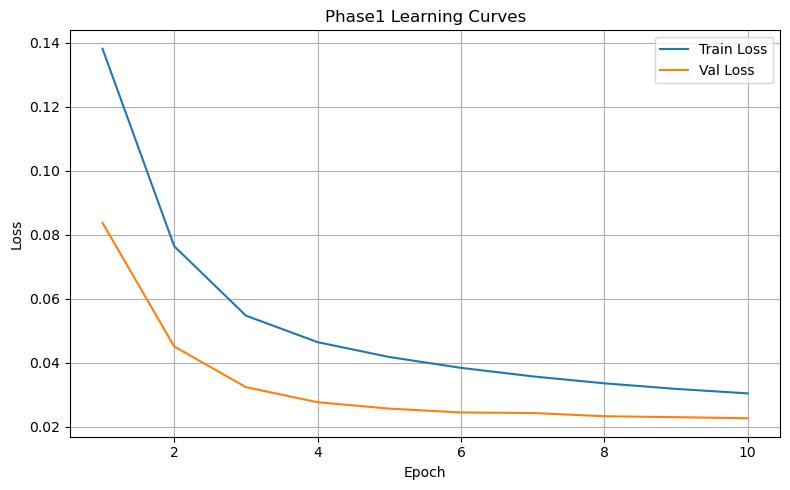

🎉 Phase1 complete. Best Val Loss: 0.0227


In [6]:
# freeze_phase.py

import os
import torch
from torch.utils.data import DataLoader
from Emotalk_model_v0003 import EmoTalk
from train import DummyDataset
from loss_v0003 import EmoTalkLoss
from types import SimpleNamespace
from tqdm import tqdm
import matplotlib.pyplot as plt

# ====== Configuration ======
DEVICE         = 'cuda' if torch.cuda.is_available() else 'cpu'
FREEZE_EPOCHS  = 10
LR             = 2e-6 
BATCH_SIZE     = 1
INIT_CKPT      = 'aligned_v2_init.pth'
PHASE1_CKPT    = 'phase1_ckpt.pth'

# ====== Model arguments ======
args = SimpleNamespace(
    transformer_dim    = 512,
    transformer_heads  = 4,
    transformer_layers = 1,
    bs_dim             = 52,
    max_seq_len        = 512,
    period             = 20,
    emo_gru_hidden     = 128,
    emo_gru_layers     = 2,
    num_emotions       = 8,
    num_person         = 24,
    device             = DEVICE,
    batch_size         = BATCH_SIZE,
)

# ====== Data preparation ======
train_dataset = DummyDataset('./data/RAVDESS/train')
val_dataset   = DummyDataset('./data/RAVDESS/val')

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)

# ====== Model & Warm-start ======
model = EmoTalk(args).to(DEVICE)
if os.path.exists(INIT_CKPT):
    ckpt = torch.load(INIT_CKPT, map_location=DEVICE)
    # Remove level/person mismatch keys
    for bad_key in ['obj_vector_level.weight', 'obj_vector_level.bias', 'obj_vector_person.weight']:
        ckpt.pop(bad_key, None)
    model.load_state_dict(ckpt, strict=False)
    print(f"🔥 Warm-start loaded from {INIT_CKPT}")
else:
    print(f"⚠️ No warm-start checkpoint found at {INIT_CKPT}, training from scratch.")

# ====== Freeze pretrained blocks ======
# Freeze Wav2Vec2 encoder
for p in model.extractor.parameters():
    p.requires_grad = False
# Freeze emotion extractor
for p in model.emo_extractor.parameters():
    p.requires_grad = False
# Freeze projector and decoder as they were warm-started
#model.extractor_proj.requires_grad_(False)
#for p in model.decoder.parameters():
    #p.requires_grad = False

# ====== Optimizer & Loss ======
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR
)
loss_fn = EmoTalkLoss(region_weighted=True, mouth_only=False, mouth_weight=1.0)


# ====== Phase 1 Training ======
train_losses, val_losses = [], []
best_val_loss = float('inf')
for epoch in range(1, FREEZE_EPOCHS+1):
    # -- Training --
    model.train()
    train_loss = 0.0
    for batch in tqdm(train_loader, desc=f"Phase1 Epoch {epoch}/{FREEZE_EPOCHS} [Train]"):
        audio      = batch['audio'].to(DEVICE)
        blendshape = batch['blendshape'].to(DEVICE)
        level      = batch['level'].to(DEVICE)
        person     = batch['person'].to(DEVICE)
        args.target_len = blendshape.size(1)

        pred = model(audio, level, person)
        loss, _ = loss_fn(pred, blendshape)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
    train_loss /= len(train_loader)
    train_losses.append(train_loss)

    # -- Validation --
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Phase1 Epoch {epoch}/{FREEZE_EPOCHS} [Val]"):
            audio      = batch['audio'].to(DEVICE)
            blendshape = batch['blendshape'].to(DEVICE)
            level      = batch['level'].to(DEVICE)
            person     = batch['person'].to(DEVICE)
            args.target_len = blendshape.size(1)

            pred = model(audio, level, person)
            loss, _ = loss_fn(pred, blendshape)
            val_loss += loss.item()
    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    print(f"[Phase1][Epoch {epoch}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

    # Save best
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), PHASE1_CKPT)
        print(f"✅ Phase1 best model saved to {PHASE1_CKPT} (Val Loss: {best_val_loss:.4f})")

# ====== Plot Phase1 Learning Curves ======
epochs = range(1, FREEZE_EPOCHS+1)
plt.figure(figsize=(8,5))
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses,   label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Phase1 Learning Curves')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('phase1_loss_curves.png')
plt.show()

print(f"🎉 Phase1 complete. Best Val Loss: {best_val_loss:.4f}")


/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.bias', 'lm_head.weight']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model fr

🔥 Phase1 weights loaded from phase1_ckpt.pth


Phase2 Epoch 1/15 [Train]:   0%|                                                                                           | 0/1140 [00:00<?, ?it/s]/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/torch/utils/checkpoint.py:25: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")
Phase2 Epoch 1/15 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.32it/s]


[Phase2][Epoch 1] Train Loss: 0.0302 | Val Loss: 0.0223
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0223)


Phase2 Epoch 2/15 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.81it/s]


[Phase2][Epoch 2] Train Loss: 0.0298 | Val Loss: 0.0223
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0223)


Phase2 Epoch 3/15 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.92it/s]


[Phase2][Epoch 3] Train Loss: 0.0294 | Val Loss: 0.0221
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0221)


Phase2 Epoch 4/15 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.95it/s]


[Phase2][Epoch 4] Train Loss: 0.0291 | Val Loss: 0.0221
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0221)


Phase2 Epoch 5/15 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.76it/s]


[Phase2][Epoch 5] Train Loss: 0.0287 | Val Loss: 0.0222


Phase2 Epoch 6/15 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.32it/s]


[Phase2][Epoch 6] Train Loss: 0.0285 | Val Loss: 0.0222


Phase2 Epoch 7/15 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 37.24it/s]


[Phase2][Epoch 7] Train Loss: 0.0282 | Val Loss: 0.0220
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0220)


Phase2 Epoch 8/15 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.94it/s]


[Phase2][Epoch 8] Train Loss: 0.0280 | Val Loss: 0.0221


Phase2 Epoch 9/15 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.84it/s]


[Phase2][Epoch 9] Train Loss: 0.0278 | Val Loss: 0.0219
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0219)


Phase2 Epoch 10/15 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 40.20it/s]


[Phase2][Epoch 10] Train Loss: 0.0276 | Val Loss: 0.0219
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0219)


Phase2 Epoch 11/15 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 40.00it/s]


[Phase2][Epoch 11] Train Loss: 0.0274 | Val Loss: 0.0218
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0218)


Phase2 Epoch 12/15 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.90it/s]


[Phase2][Epoch 12] Train Loss: 0.0272 | Val Loss: 0.0218
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0218)


Phase2 Epoch 13/15 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.85it/s]


[Phase2][Epoch 13] Train Loss: 0.0270 | Val Loss: 0.0217
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0217)


Phase2 Epoch 14/15 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 40.01it/s]


[Phase2][Epoch 14] Train Loss: 0.0268 | Val Loss: 0.0217


Phase2 Epoch 15/15 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.76it/s]


[Phase2][Epoch 15] Train Loss: 0.0267 | Val Loss: 0.0216
✅ Phase2 best model saved to emotalk_finetuned_ravdess.pth (Val Loss: 0.0216)


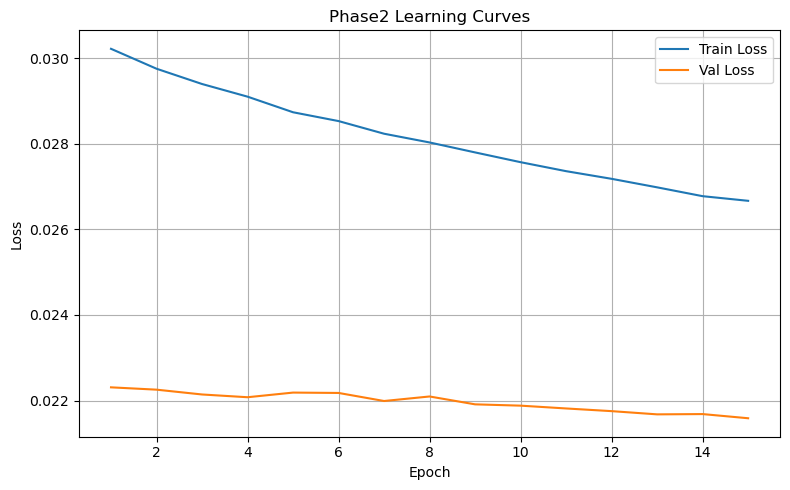

🎉 Phase2 complete. Best Val Loss: 0.0216


In [1]:
# unfreeze_phase.py
import os
import torch
from torch.utils.data import DataLoader
from Emotalk_model_v0003 import EmoTalk
from train import DummyDataset
from loss_v0003 import EmoTalkLoss
from types import SimpleNamespace
from tqdm import tqdm
import matplotlib.pyplot as plt
import os, torch
from torch.cuda.amp import autocast, GradScaler
# ====== Configuration ======
DEVICE           = 'cuda' if torch.cuda.is_available() else 'cpu'
UNFREEZE_EPOCHS  = 15
LR               = 2e-6
BATCH_SIZE       = 1
PHASE1_CKPT      = 'phase1_ckpt.pth'
FINAL_CKPT       = 'emotalk_finetuned_ravdess.pth'

# ====== Model arguments ======
args = SimpleNamespace(
    transformer_dim    = 512,
    transformer_heads  = 4,
    transformer_layers = 1,
    bs_dim             = 52,
    max_seq_len        = 512,
    period             = 20,
    emo_gru_hidden     = 128,
    emo_gru_layers     = 2,
    num_emotions       = 8,
    num_person         = 24,
    device             = DEVICE,
    batch_size         = BATCH_SIZE,
)

# ====== Data preparation ======
train_dataset = DummyDataset('./data/RAVDESS/train')
val_dataset   = DummyDataset('./data/RAVDESS/val')

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)

# ====== Model & Load Phase1 Checkpoint ======
model = EmoTalk(args).to(DEVICE)
if os.path.exists(PHASE1_CKPT):
    state = torch.load(PHASE1_CKPT, map_location=DEVICE)
    model.load_state_dict(state, strict=False)
    print(f"🔥 Phase1 weights loaded from {PHASE1_CKPT}")
else:
    raise FileNotFoundError(f"Phase1 checkpoint not found at {PHASE1_CKPT}")

# … load phase1_ckpt …
# —— 启用梯度检查点 —— #
if hasattr(model.extractor, 'gradient_checkpointing_enable'):
    model.extractor.gradient_checkpointing_enable()
if hasattr(model.emo_extractor, 'gradient_checkpointing_enable'):
    model.emo_extractor.gradient_checkpointing_enable()

# ====== Unfreeze all parameters ======
for p in model.parameters():
    p.requires_grad = True
scaler = GradScaler()

# ====== Optimizer with Differential Learning Rates ======
optimizer = torch.optim.Adam([
    {'params': model.extractor.parameters(),     'lr': LR * 0.1},
    {'params': model.emo_extractor.parameters(), 'lr': LR * 0.1},
    {'params': model.extractor_proj.parameters(), 'lr': LR * 0.1},
    {'params': model.decoder.parameters(),       'lr': LR * 0.1},
    {'params': model.film_gamma.parameters()},
    {'params': model.film_beta.parameters()},
    {'params': model.emo_gru.parameters()},
    {'params': model.obj_vector_level.parameters()},
    {'params': model.obj_vector_person.parameters()},
    {'params': model.linear.parameters()},
], lr=LR)

loss_fn = EmoTalkLoss(region_weighted=True, mouth_only=False, mouth_weight=1.0)


# ====== Phase 2 Training ======
train_losses, val_losses = [], []
best_val_loss = float('inf')
for epoch in range(1, UNFREEZE_EPOCHS+1):
    # -- Training --
    model.train()
    train_loss = 0.0
    for batch in tqdm(train_loader, desc=f"Phase2 Epoch {epoch}/{UNFREEZE_EPOCHS} [Train]"):
        audio      = batch['audio'].to(DEVICE)
        blendshape = batch['blendshape'].to(DEVICE)
        level      = batch['level'].to(DEVICE)
        person     = batch['person'].to(DEVICE)
        args.target_len = blendshape.size(1)

         # —— 混合精度前向 —— #
        with autocast():
            pred = model(audio, level, person)
            loss, _ = loss_fn(pred, blendshape)

        optimizer.zero_grad()
        scaler.scale(loss).backward()   # ← 半精度反向
        scaler.step(optimizer)
        scaler.update()

        train_loss += loss.item()
    train_loss /= len(train_loader)
    train_losses.append(train_loss)

    # -- Validation --
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Phase2 Epoch {epoch}/{UNFREEZE_EPOCHS} [Val]"):
            audio      = batch['audio'].to(DEVICE)
            blendshape = batch['blendshape'].to(DEVICE)
            level      = batch['level'].to(DEVICE)
            person     = batch['person'].to(DEVICE)
            args.target_len = blendshape.size(1)

            pred = model(audio, level, person)
            loss, _ = loss_fn(pred, blendshape)
            val_loss += loss.item()
    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    print(f"[Phase2][Epoch {epoch}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

    # Save best
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), FINAL_CKPT)
        print(f"✅ Phase2 best model saved to {FINAL_CKPT} (Val Loss: {best_val_loss:.4f})")

# ====== Plot Phase2 Learning Curves ======
epochs = range(1, UNFREEZE_EPOCHS+1)
plt.figure(figsize=(8,5))
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses,   label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Phase2 Learning Curves')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('phase2_loss_curves.png')
plt.show()

print(f"🎉 Phase2 complete. Best Val Loss: {best_val_loss:.4f}")


In [2]:
#!python demo_finetuned_v0003.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/scared.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/ravdess/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned_ravdess.pth" 

/transfer/emotalk/EmoTalk_release-main/demo_finetuned_v0003.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt  = torch.load(args.model_path, map_location=args.device

In [3]:
!python demo_finetuned_v0003.py \
  --wav_path ./audio/online_audio/scared.wav \
  --model_path emotalk_finetuned_ravdess.pth \
  --result_path ./result/exp_result/ravdess/fn \
  --level 3 --person 1


/transfer/emotalk/EmoTalk_release-main/demo_finetuned_v0003.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt  = torch.load(args.model_path, map_location=args.device

Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.weight', 'lm_head.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2Model from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of the model checkpoint at r-f/wav2vec-english-speech-emotion-recognition were not used when initializing Wav2Vec2Model: ['classifier.dense.weight', 'classifier.out_proj.weight', 'classifier.dense.bias', 'classifier.out_proj.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with anothe

🔥 Loaded Phase2 weights from emotalk_finetuned_ravdess.pth


HDTF Epoch 1/10 [Train]:   0%|                                                                                              | 0/172 [00:00<?, ?it/s]/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/torch/utils/checkpoint.py:25: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")
HDTF Epoch 1/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 47.72it/s]


[Epoch 1] Train Loss: 0.0554 | Val Loss: 0.0514
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003.pth (Val 0.0514)


HDTF Epoch 2/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 48.68it/s]


[Epoch 2] Train Loss: 0.0511 | Val Loss: 0.0496
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003.pth (Val 0.0496)


HDTF Epoch 3/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 47.91it/s]


[Epoch 3] Train Loss: 0.0501 | Val Loss: 0.0489
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003.pth (Val 0.0489)


HDTF Epoch 4/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 48.00it/s]


[Epoch 4] Train Loss: 0.0499 | Val Loss: 0.0490


HDTF Epoch 5/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 47.36it/s]


[Epoch 5] Train Loss: 0.0492 | Val Loss: 0.0482
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003.pth (Val 0.0482)


HDTF Epoch 6/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 47.24it/s]


[Epoch 6] Train Loss: 0.0492 | Val Loss: 0.0482
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003.pth (Val 0.0482)


HDTF Epoch 7/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 47.66it/s]


[Epoch 7] Train Loss: 0.0485 | Val Loss: 0.0482
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003.pth (Val 0.0482)


HDTF Epoch 8/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 46.38it/s]


[Epoch 8] Train Loss: 0.0484 | Val Loss: 0.0479
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003.pth (Val 0.0479)


HDTF Epoch 9/10 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 47.79it/s]


[Epoch 9] Train Loss: 0.0479 | Val Loss: 0.0482


HDTF Epoch 10/10 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 48.38it/s]


[Epoch 10] Train Loss: 0.0479 | Val Loss: 0.0473
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003.pth (Val 0.0473)


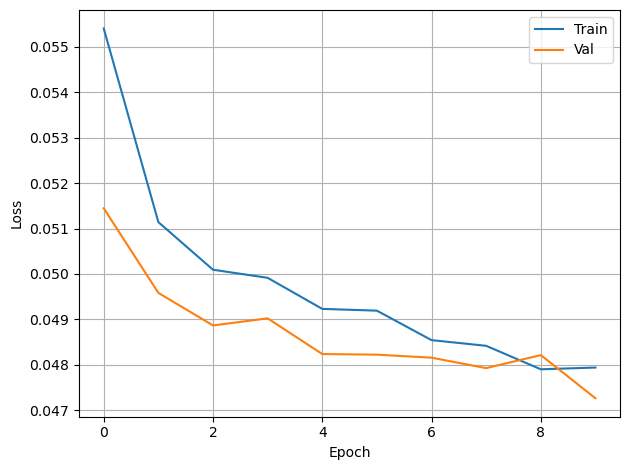

In [2]:
import os
import torch
from torch.utils.data import DataLoader
from Emotalk_model_v0003 import EmoTalk            # ← v0003
from train_hdft import HDTFDataset                  # 你原来的 HDTFDataset
from loss_v0003 import EmoTalkLoss
from types import SimpleNamespace
from tqdm import tqdm
import matplotlib.pyplot as plt
from torch.cuda.amp import autocast, GradScaler

# === 配置 ===
DEVICE      = 'cuda' if torch.cuda.is_available() else 'cpu'
EPOCHS      = 30        # HDTF 上跑 10 轮试试
LR_NEW      = 1e-6      # 新模块学习率
LR_PRE      = 1e-7      # 冻结模块学习率
BATCH_SIZE  = 1
PHASE2_CKPT = 'emotalk_finetuned_ravdess.pth'
SAVE_PATH   = 'emotalk_finetuned_hdtf_v0003.pth'

# === 模型超参 (必须和 v0003 一致) ===
args = SimpleNamespace(
    transformer_dim    = 512,
    transformer_heads  = 4,
    transformer_layers = 1,
    bs_dim             = 52,
    max_seq_len        = 512,
    period             = 20,
    emo_gru_hidden     = 128,
    emo_gru_layers     = 2,
    num_emotions       = 8,
    num_person         = 24,
    device             = DEVICE,
    batch_size         = BATCH_SIZE,
)

# === 数据加载 ===
train_ds = HDTFDataset('./data/HDTF/train')
val_ds   = HDTFDataset('./data/HDTF/val')
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)

# === 初始化 v0003 模型 & 加载 Phase2 权重 ===
model = EmoTalk(args).to(DEVICE)
state = torch.load(PHASE2_CKPT, map_location=DEVICE)
model.load_state_dict(state, strict=False)
print(f"🔥 Loaded Phase2 weights from {PHASE2_CKPT}")

# === 冻结 / 解冻策略 ===
# 冻结特征提取器部分，保持它已经学到的通用音频表征不动
for p in model.extractor.parameters():     p.requires_grad = False
for p in model.emo_extractor.parameters(): p.requires_grad = False

# 其余参数全部可训练
for name, p in model.named_parameters():
    if not p.requires_grad:
        continue
    p.requires_grad = True

# === 差分 Learning Rate Optimizer ===
optimizer = torch.optim.Adam([
    # 冻结块用小 lr，几乎不更新
    {'params': model.extractor.parameters(),     'lr': LR_PRE},
    {'params': model.emo_extractor.parameters(), 'lr': LR_PRE},
    # 新结构用大 lr，快速微调
    {'params': model.extractor_proj.parameters(),      'lr': LR_NEW},
    {'params': model.decoder.parameters(),            'lr': LR_NEW},
    {'params': model.film_gamma.parameters(),         'lr': LR_NEW},
    {'params': model.film_beta.parameters(),          'lr': LR_NEW},
    {'params': model.emo_gru.parameters(),            'lr': LR_NEW},
    {'params': model.obj_vector_level.parameters(),   'lr': LR_NEW},
    {'params': model.obj_vector_person.parameters(),  'lr': LR_NEW},
    {'params': model.linear.parameters(),             'lr': LR_NEW},
], lr=LR_NEW)

loss_fn = EmoTalkLoss(region_weighted=True, mouth_only=False, mouth_weight=1.0)

# … 上面部分保持不变 …

scaler = GradScaler()

# === 训练 & 验证 ===
train_losses, val_losses = [], []
best_val = float('inf')
for epoch in range(1, EPOCHS+1):
    # — Train —
    model.train()
    running = 0.0
    for batch in tqdm(train_loader, desc=f"HDTF Epoch {epoch}/{EPOCHS} [Train]"):
        audio = batch['audio'].to(DEVICE)
        blend = batch['blendshape'].to(DEVICE)
        lvl   = torch.ones((audio.size(0),), dtype=torch.long, device=DEVICE)
        prs   = torch.ones((audio.size(0),), dtype=torch.long, device=DEVICE)
        args.target_len = blend.size(1)

        optimizer.zero_grad()
        # 前向 & 计算 loss（半精度）
        with autocast():
            pred, _ = model(audio, lvl, prs), None
            loss, _ = loss_fn(pred, blend)

        # 反向 & 更新
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running += loss.item()

    train_loss = running / len(train_loader)
    train_losses.append(train_loss)

    # — Validation —
    model.eval()
    running = 0.0
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"HDTF Epoch {epoch}/{EPOCHS} [Val]"):
            audio = batch['audio'].to(DEVICE)
            blend = batch['blendshape'].to(DEVICE)
            lvl   = torch.ones((audio.size(0),), dtype=torch.long, device=DEVICE)
            prs   = torch.ones((audio.size(0),), dtype=torch.long, device=DEVICE)
            args.target_len = blend.size(1)

            with autocast():
                pred, _ = model(audio, lvl, prs), None
                loss, _ = loss_fn(pred, blend)
            running += loss.item()

    val_loss = running / len(val_loader)
    val_losses.append(val_loss)

    print(f"[Epoch {epoch}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

    if val_loss < best_val:
        best_val = val_loss
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"✅ Saved HDTF-tuned model to {SAVE_PATH} (Val {best_val:.4f})")

# … 画图部分保持不变 …

# === Loss Curve ===
plt.plot(train_losses, label='Train')
plt.plot(val_losses,   label='Val')
plt.xlabel('Epoch'); plt.ylabel('Loss')
plt.legend(); plt.grid(True)
plt.tight_layout()
plt.savefig('hdtf_v0003_loss_curve.png')
plt.show()


In [5]:
!python demo_finetuned_v0003.py \
  --wav_path ./audio/ted2_clip.wav \
  --model_path emotalk_finetuned_hdtf_v0003.pth \
  --result_path ./result/exp_result/HDTF \
  --level 3 --person 1

/transfer/emotalk/EmoTalk_release-main/demo_finetuned_v0003.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt  = torch.load(args.model_path, map_location=args.device

/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.weight', 'lm_head.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model fr

🔥 Warm-start loaded from aligned_v2_init.pth


Phase1 Epoch 1/20 [Train]:   0%|                                                                                           | 0/1140 [00:00<?, ?it/s]/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/torch/utils/checkpoint.py:25: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")
Phase1 Epoch 1/20 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 40.14it/s]


[Phase1][Epoch 1] Train Loss: 0.1831 | Val Loss: 0.1541
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.1541)


Phase1 Epoch 2/20 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.82it/s]


[Phase1][Epoch 2] Train Loss: 0.1574 | Val Loss: 0.1334
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.1334)


Phase1 Epoch 3/20 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.82it/s]


[Phase1][Epoch 3] Train Loss: 0.1373 | Val Loss: 0.1119
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.1119)


Phase1 Epoch 4/20 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.71it/s]


[Phase1][Epoch 4] Train Loss: 0.1158 | Val Loss: 0.0897
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0897)


Phase1 Epoch 5/20 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.85it/s]


[Phase1][Epoch 5] Train Loss: 0.0962 | Val Loss: 0.0719
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0719)


Phase1 Epoch 6/20 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.92it/s]


[Phase1][Epoch 6] Train Loss: 0.0819 | Val Loss: 0.0598
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0598)


Phase1 Epoch 7/20 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.31it/s]


[Phase1][Epoch 7] Train Loss: 0.0727 | Val Loss: 0.0521
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0521)


Phase1 Epoch 8/20 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.57it/s]


[Phase1][Epoch 8] Train Loss: 0.0665 | Val Loss: 0.0471
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0471)


Phase1 Epoch 9/20 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.53it/s]


[Phase1][Epoch 9] Train Loss: 0.0622 | Val Loss: 0.0433
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0433)


Phase1 Epoch 10/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.92it/s]


[Phase1][Epoch 10] Train Loss: 0.0591 | Val Loss: 0.0408
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0408)


Phase1 Epoch 11/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 38.30it/s]


[Phase1][Epoch 11] Train Loss: 0.0564 | Val Loss: 0.0388
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0388)


Phase1 Epoch 12/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.79it/s]


[Phase1][Epoch 12] Train Loss: 0.0544 | Val Loss: 0.0372
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0372)


Phase1 Epoch 13/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 40.05it/s]


[Phase1][Epoch 13] Train Loss: 0.0525 | Val Loss: 0.0358
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0358)


Phase1 Epoch 14/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.23it/s]


[Phase1][Epoch 14] Train Loss: 0.0510 | Val Loss: 0.0347
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0347)


Phase1 Epoch 15/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.73it/s]


[Phase1][Epoch 15] Train Loss: 0.0495 | Val Loss: 0.0338
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0338)


Phase1 Epoch 16/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.78it/s]


[Phase1][Epoch 16] Train Loss: 0.0483 | Val Loss: 0.0328
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0328)


Phase1 Epoch 17/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.77it/s]


[Phase1][Epoch 17] Train Loss: 0.0471 | Val Loss: 0.0321
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0321)


Phase1 Epoch 18/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.85it/s]


[Phase1][Epoch 18] Train Loss: 0.0460 | Val Loss: 0.0314
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0314)


Phase1 Epoch 19/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.56it/s]


[Phase1][Epoch 19] Train Loss: 0.0451 | Val Loss: 0.0308
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0308)


Phase1 Epoch 20/20 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████| 404/404 [00:10<00:00, 39.77it/s]


[Phase1][Epoch 20] Train Loss: 0.0441 | Val Loss: 0.0302
✅ Phase1 best model saved to phase1_ckpt.pth (Val Loss: 0.0302)


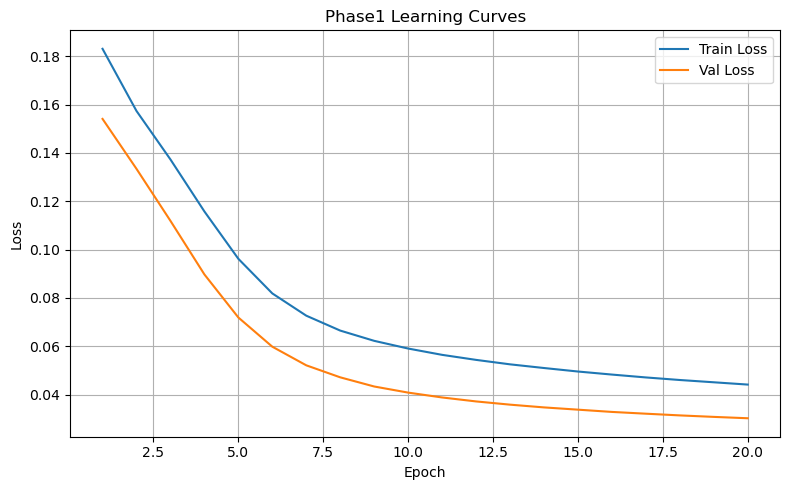

🎉 Phase1 complete. Best Val Loss: 0.0302


In [1]:
# freeze_phase.py

import os
import torch
from torch.utils.data import DataLoader
from Emotalk_model_v0003 import EmoTalk
from train import DummyDataset
from loss_v0003 import EmoTalkLoss
from types import SimpleNamespace
from tqdm import tqdm
import matplotlib.pyplot as plt

# ====== Configuration ======
DEVICE         = 'cuda' if torch.cuda.is_available() else 'cpu'
FREEZE_EPOCHS  = 20
LR             = 2e-6 
BATCH_SIZE     = 1
INIT_CKPT      = 'aligned_v2_init.pth'
PHASE1_CKPT    = 'phase1_ckpt.pth'

# ====== Model arguments ======
args = SimpleNamespace(
    transformer_dim    = 512,
    transformer_heads  = 4,
    transformer_layers = 1,
    bs_dim             = 52,
    max_seq_len        = 512,
    period             = 20,
    emo_gru_hidden     = 128,
    emo_gru_layers     = 2,
    num_emotions       = 8,
    num_person         = 24,
    device             = DEVICE,
    batch_size         = BATCH_SIZE,
)

# ====== Data preparation ======
train_dataset = DummyDataset('./data/RAVDESS/train')
val_dataset   = DummyDataset('./data/RAVDESS/val')

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)

# ====== Model & Warm-start ======
model = EmoTalk(args).to(DEVICE)
if os.path.exists(INIT_CKPT):
    ckpt = torch.load(INIT_CKPT, map_location=DEVICE)
    # Remove level/person mismatch keys
    for bad_key in ['obj_vector_level.weight', 'obj_vector_level.bias', 'obj_vector_person.weight']:
        ckpt.pop(bad_key, None)
    model.load_state_dict(ckpt, strict=False)
    print(f"🔥 Warm-start loaded from {INIT_CKPT}")
else:
    print(f"⚠️ No warm-start checkpoint found at {INIT_CKPT}, training from scratch.")

# ====== Freeze pretrained blocks ======
# 先把全网全冻
for p in model.parameters():
    p.requires_grad = False
# 然后只解冻新模块
for module in [model.emo_gru, model.film_gamma, model.film_beta,
               model.emo_memory_proj,
               model.obj_vector_level, model.obj_vector_person,
               model.linear]:
    for p in module.parameters():
        p.requires_grad = True


# ====== Optimizer & Loss ======
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LR
)
loss_fn = EmoTalkLoss(region_weighted=True, mouth_only=False, mouth_weight=1.0)


# ====== Phase 1 Training ======
train_losses, val_losses = [], []
best_val_loss = float('inf')
for epoch in range(1, FREEZE_EPOCHS+1):
    # -- Training --
    model.train()
    train_loss = 0.0
    for batch in tqdm(train_loader, desc=f"Phase1 Epoch {epoch}/{FREEZE_EPOCHS} [Train]"):
        audio      = batch['audio'].to(DEVICE)
        blendshape = batch['blendshape'].to(DEVICE)
        level      = batch['level'].to(DEVICE)
        person     = batch['person'].to(DEVICE)
        args.target_len = blendshape.size(1)

        pred = model(audio, level, person)
        loss, _ = loss_fn(pred, blendshape)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
    train_loss /= len(train_loader)
    train_losses.append(train_loss)

    # -- Validation --
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Phase1 Epoch {epoch}/{FREEZE_EPOCHS} [Val]"):
            audio      = batch['audio'].to(DEVICE)
            blendshape = batch['blendshape'].to(DEVICE)
            level      = batch['level'].to(DEVICE)
            person     = batch['person'].to(DEVICE)
            args.target_len = blendshape.size(1)

            pred = model(audio, level, person)
            loss, _ = loss_fn(pred, blendshape)
            val_loss += loss.item()
    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    print(f"[Phase1][Epoch {epoch}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

    # Save best
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), PHASE1_CKPT)
        print(f"✅ Phase1 best model saved to {PHASE1_CKPT} (Val Loss: {best_val_loss:.4f})")

# ====== Plot Phase1 Learning Curves ======
epochs = range(1, FREEZE_EPOCHS+1)
plt.figure(figsize=(8,5))
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses,   label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Phase1 Learning Curves')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('phase1_loss_curves.png')
plt.show()

print(f"🎉 Phase1 complete. Best Val Loss: {best_val_loss:.4f}")


Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.bias', 'lm_head.weight']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2Model from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of the model checkpoint at r-f/wav2vec-english-speech-emotion-recognition were not used when initializing Wav2Vec2Model: ['classifier.dense.weight', 'classifier.dense.bias', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with anothe

🔥 Loaded Phase2 weights from phase1_ckpt.pth


HDTF Epoch 1/30 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 44.75it/s]


[Epoch 1] Train Loss: 0.0354 | Val Loss: 0.0296
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0296)


HDTF Epoch 2/30 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 43.43it/s]


[Epoch 2] Train Loss: 0.0341 | Val Loss: 0.0294
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0294)


HDTF Epoch 3/30 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 43.84it/s]


[Epoch 3] Train Loss: 0.0343 | Val Loss: 0.0293
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0293)


HDTF Epoch 4/30 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 44.17it/s]


[Epoch 4] Train Loss: 0.0340 | Val Loss: 0.0291
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0291)


HDTF Epoch 5/30 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 44.02it/s]


[Epoch 5] Train Loss: 0.0341 | Val Loss: 0.0289
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0289)


HDTF Epoch 6/30 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 42.36it/s]


[Epoch 6] Train Loss: 0.0343 | Val Loss: 0.0290


HDTF Epoch 7/30 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 43.79it/s]


[Epoch 7] Train Loss: 0.0341 | Val Loss: 0.0287
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0287)


HDTF Epoch 8/30 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 44.35it/s]


[Epoch 8] Train Loss: 0.0339 | Val Loss: 0.0290


HDTF Epoch 9/30 [Val]: 100%|████████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 42.44it/s]


[Epoch 9] Train Loss: 0.0340 | Val Loss: 0.0289


HDTF Epoch 10/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 42.85it/s]


[Epoch 10] Train Loss: 0.0340 | Val Loss: 0.0291


HDTF Epoch 11/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 43.50it/s]


[Epoch 11] Train Loss: 0.0339 | Val Loss: 0.0286
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0286)


HDTF Epoch 12/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 42.79it/s]


[Epoch 12] Train Loss: 0.0339 | Val Loss: 0.0285
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0285)


HDTF Epoch 13/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 42.95it/s]


[Epoch 13] Train Loss: 0.0338 | Val Loss: 0.0285
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0285)


HDTF Epoch 14/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 43.75it/s]


[Epoch 14] Train Loss: 0.0338 | Val Loss: 0.0284
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0284)


HDTF Epoch 15/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 43.33it/s]


[Epoch 15] Train Loss: 0.0338 | Val Loss: 0.0286


HDTF Epoch 16/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 43.76it/s]


[Epoch 16] Train Loss: 0.0338 | Val Loss: 0.0284
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0284)


HDTF Epoch 17/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 44.28it/s]


[Epoch 17] Train Loss: 0.0337 | Val Loss: 0.0284
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0284)


HDTF Epoch 18/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 43.54it/s]


[Epoch 18] Train Loss: 0.0337 | Val Loss: 0.0285


HDTF Epoch 19/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 43.78it/s]


[Epoch 19] Train Loss: 0.0338 | Val Loss: 0.0284
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0284)


HDTF Epoch 20/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 44.76it/s]


[Epoch 20] Train Loss: 0.0338 | Val Loss: 0.0283
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0283)


HDTF Epoch 21/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 44.83it/s]


[Epoch 21] Train Loss: 0.0338 | Val Loss: 0.0282
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0282)


HDTF Epoch 22/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 42.73it/s]


[Epoch 22] Train Loss: 0.0338 | Val Loss: 0.0283


HDTF Epoch 23/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 43.96it/s]


[Epoch 23] Train Loss: 0.0336 | Val Loss: 0.0283


HDTF Epoch 24/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 44.45it/s]


[Epoch 24] Train Loss: 0.0336 | Val Loss: 0.0282
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0282)


HDTF Epoch 25/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 45.20it/s]


[Epoch 25] Train Loss: 0.0336 | Val Loss: 0.0283


HDTF Epoch 26/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 45.38it/s]


[Epoch 26] Train Loss: 0.0334 | Val Loss: 0.0284


HDTF Epoch 27/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 45.22it/s]


[Epoch 27] Train Loss: 0.0335 | Val Loss: 0.0282
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0282)


HDTF Epoch 28/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 45.13it/s]


[Epoch 28] Train Loss: 0.0334 | Val Loss: 0.0282
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0282)


HDTF Epoch 29/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 44.89it/s]


[Epoch 29] Train Loss: 0.0334 | Val Loss: 0.0282
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0282)


HDTF Epoch 30/30 [Val]: 100%|███████████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 44.57it/s]


[Epoch 30] Train Loss: 0.0334 | Val Loss: 0.0280
✅ Saved HDTF-tuned model to emotalk_finetuned_hdtf_v0003——.pth (Val 0.0280)


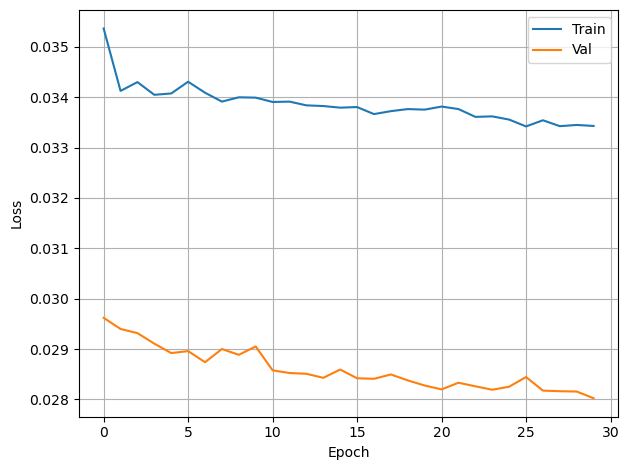

In [3]:
import os
import torch
from torch.utils.data import DataLoader
from Emotalk_model_v0003 import EmoTalk            # ← v0003
from train_hdft import HDTFDataset                  # 你原来的 HDTFDataset
from loss_v0003 import EmoTalkLoss
from types import SimpleNamespace
from tqdm import tqdm
import matplotlib.pyplot as plt
from torch.cuda.amp import autocast, GradScaler

# === 配置 ===
DEVICE      = 'cuda' if torch.cuda.is_available() else 'cpu'
EPOCHS      = 30        # HDTF 上跑 10 轮试试
LR_NEW      = 1e-6      # 新模块学习率
LR_PRE      = 1e-7      # 冻结模块学习率
BATCH_SIZE  = 1
PHASE2_CKPT = 'phase1_ckpt.pth'
SAVE_PATH   = 'emotalk_finetuned_hdtf_v0003_freezeold.pth'

# === 模型超参 (必须和 v0003 一致) ===
args = SimpleNamespace(
    transformer_dim    = 512,
    transformer_heads  = 4,
    transformer_layers = 1,
    bs_dim             = 52,
    max_seq_len        = 1024,
    period             = 20,
    emo_gru_hidden     = 128,
    emo_gru_layers     = 2,
    num_emotions       = 8,
    num_person         = 24,
    device             = DEVICE,
    batch_size         = BATCH_SIZE,
)

# === 数据加载 ===
train_ds = HDTFDataset('./data/HDTF/train')
val_ds   = HDTFDataset('./data/HDTF/val')
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)

# === 初始化 v0003 模型 & 加载 Phase2 权重 ===
model = EmoTalk(args).to(DEVICE)
state = torch.load(PHASE2_CKPT, map_location=DEVICE)
model.load_state_dict(state, strict=False)
print(f"🔥 Loaded Phase2 weights from {PHASE2_CKPT}")

# === 冻结 / 解冻策略 ===
# 冻结特征提取器部分，保持它已经学到的通用音频表征不动
#for p in model.extractor.parameters():     p.requires_grad = False
#for p in model.emo_extractor.parameters(): p.requires_grad = False

# 其余参数全部可训练
#for name, p in model.named_parameters():
    #if not p.requires_grad:
        #continue
    #p.requires_grad = True
# 先把全网全冻
for p in model.parameters():
    p.requires_grad = False
# 然后只解冻新模块
for module in [model.emo_gru, model.film_gamma, model.film_beta,
               model.emo_memory_proj,
               model.obj_vector_level, model.obj_vector_person,
               model.linear]:
    for p in module.parameters():
        p.requires_grad = True

# === 差分 Learning Rate Optimizer ===
optimizer = torch.optim.Adam(
  filter(lambda p: p.requires_grad, model.parameters()),
  lr=LR_NEW
)
#for name,p in model.named_parameters():
  #print(f"{name}: requires_grad={p.requires_grad}")

#optimizer = torch.optim.Adam([
    # 冻结块用小 lr，几乎不更新
    #{'params': model.extractor.parameters(),     'lr': LR_PRE},
    #{'params': model.emo_extractor.parameters(), 'lr': LR_PRE},
    # 新结构用大 lr，快速微调
    #{'params': model.extractor_proj.parameters(),      'lr': LR_NEW},
    #{'params': model.decoder.parameters(),            'lr': LR_NEW},
    #{'params': model.film_gamma.parameters(),         'lr': LR_NEW},
    #{'params': model.film_beta.parameters(),          'lr': LR_NEW},
    #{'params': model.emo_gru.parameters(),            'lr': LR_NEW},
    #{'params': model.obj_vector_level.parameters(),   'lr': LR_NEW},
    #{'params': model.obj_vector_person.parameters(),  'lr': LR_NEW},
    #{'params': model.linear.parameters(),             'lr': LR_NEW},
#], lr=LR_NEW)

loss_fn = EmoTalkLoss(region_weighted=True, mouth_only=False, mouth_weight=1.0)

scaler = GradScaler()

# === 训练 & 验证 ===
train_losses, val_losses = [], []
best_val = float('inf')
for epoch in range(1, EPOCHS+1):
    # — Train —
    model.train()
    running = 0.0
    for batch in tqdm(train_loader, desc=f"HDTF Epoch {epoch}/{EPOCHS} [Train]"):
        audio = batch['audio'].to(DEVICE)
        blend = batch['blendshape'].to(DEVICE)
        lvl   = torch.ones((audio.size(0),), dtype=torch.long, device=DEVICE)
        prs   = torch.ones((audio.size(0),), dtype=torch.long, device=DEVICE)
        args.target_len = blend.size(1)

        optimizer.zero_grad()
        # 前向 & 计算 loss（半精度）
        with autocast():
            pred, _ = model(audio, lvl, prs), None
            loss, _ = loss_fn(pred, blend)

        # 反向 & 更新
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running += loss.item()

    train_loss = running / len(train_loader)
    train_losses.append(train_loss)

    # — Validation —
    model.eval()
    running = 0.0
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"HDTF Epoch {epoch}/{EPOCHS} [Val]"):
            audio = batch['audio'].to(DEVICE)
            blend = batch['blendshape'].to(DEVICE)
            lvl   = torch.ones((audio.size(0),), dtype=torch.long, device=DEVICE)
            prs   = torch.ones((audio.size(0),), dtype=torch.long, device=DEVICE)
            args.target_len = blend.size(1)

            with autocast():
                pred, _ = model(audio, lvl, prs), None
                loss, _ = loss_fn(pred, blend)
            running += loss.item()

    val_loss = running / len(val_loader)
    val_losses.append(val_loss)

    print(f"[Epoch {epoch}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

    if val_loss < best_val:
        best_val = val_loss
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"✅ Saved HDTF-tuned model to {SAVE_PATH} (Val {best_val:.4f})")

# … 画图部分保持不变 …

# === Loss Curve ===
plt.plot(train_losses, label='Train')
plt.plot(val_losses,   label='Val')
plt.xlabel('Epoch'); plt.ylabel('Loss')
plt.legend(); plt.grid(True)
plt.tight_layout()
plt.savefig('hdtf_v0003_loss_curve.png')
plt.show()


In [1]:
!python demo_finetuned_v0003.py \
  --wav_path ./audio/ted2_clip.wav \
  --model_path emotalk_finetuned_hdtf_v0003_freezeeold.pth \
  --result_path ./result/exp_result/HDTF \
  --level 3 --person 1

/transfer/emotalk/EmoTalk_release-main/demo_finetuned_v0003.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt  = torch.load(args.model_path, map_location=args.device

## HDTF finetune training（model collapse）

/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.bias', 'lm_head.weight']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model fr

❄️ Freezing: emo_gru.weight_ih_l0
❄️ Freezing: emo_gru.weight_hh_l0
❄️ Freezing: emo_gru.bias_ih_l0
❄️ Freezing: emo_gru.bias_hh_l0
❄️ Freezing: emo_gru.weight_ih_l0_reverse
❄️ Freezing: emo_gru.weight_hh_l0_reverse
❄️ Freezing: emo_gru.bias_ih_l0_reverse
❄️ Freezing: emo_gru.bias_hh_l0_reverse
❄️ Freezing: emo_gru.weight_ih_l1
❄️ Freezing: emo_gru.weight_hh_l1
❄️ Freezing: emo_gru.bias_ih_l1
❄️ Freezing: emo_gru.bias_hh_l1
❄️ Freezing: emo_gru.weight_ih_l1_reverse
❄️ Freezing: emo_gru.weight_hh_l1_reverse
❄️ Freezing: emo_gru.bias_ih_l1_reverse
❄️ Freezing: emo_gru.bias_hh_l1_reverse


Epoch 1:   0%|                                                         | 0/143 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   1%|▋                                                | 2/143 [00:01<01:04,  2.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   3%|█▎                                               | 4/143 [00:01<00:36,  3.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   4%|██                                               | 6/143 [00:01<00:27,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   6%|██▋                                              | 8/143 [00:01<00:23,  5.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:   6%|███                                              | 9/143 [00:02<00:23,  5.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   8%|███▋                                            | 11/143 [00:02<00:21,  6.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   9%|████▎                                           | 13/143 [00:02<00:20,  6.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  10%|█████                                           | 15/143 [00:03<00:19,  6.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  12%|█████▋                                          | 17/143 [00:03<00:18,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  13%|██████▍                                         | 19/143 [00:03<00:18,  6.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  15%|███████                                         | 21/143 [00:03<00:18,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  16%|███████▋                                        | 23/143 [00:04<00:17,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  17%|████████▍                                       | 25/143 [00:04<00:17,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  19%|█████████                                       | 27/143 [00:04<00:17,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  20%|█████████▋                                      | 29/143 [00:05<00:17,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  22%|██████████▍                                     | 31/143 [00:05<00:16,  6.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  23%|███████████                                     | 33/143 [00:05<00:16,  6.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  24%|███████████▋                                    | 35/143 [00:06<00:16,  6.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  26%|████████████▍                                   | 37/143 [00:06<00:15,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  27%|█████████████                                   | 39/143 [00:06<00:15,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  29%|█████████████▊                                  | 41/143 [00:06<00:15,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  30%|██████████████▍                                 | 43/143 [00:07<00:14,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  31%|███████████████                                 | 45/143 [00:07<00:14,  6.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  33%|███████████████▊                                | 47/143 [00:07<00:14,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  34%|████████████████▍                               | 49/143 [00:08<00:13,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  36%|█████████████████                               | 51/143 [00:08<00:13,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  37%|█████████████████▊                              | 53/143 [00:08<00:13,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  38%|██████████████████▍                             | 55/143 [00:08<00:12,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  40%|███████████████████▏                            | 57/143 [00:09<00:12,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  41%|███████████████████▊                            | 59/143 [00:09<00:12,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  43%|████████████████████▍                           | 61/143 [00:09<00:11,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  44%|█████████████████████▏                          | 63/143 [00:10<00:11,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  45%|█████████████████████▊                          | 65/143 [00:10<00:11,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  47%|██████████████████████▍                         | 67/143 [00:10<00:11,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  48%|███████████████████████▏                        | 69/143 [00:11<00:10,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  50%|███████████████████████▊                        | 71/143 [00:11<00:10,  6.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  51%|████████████████████████▌                       | 73/143 [00:11<00:10,  6.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  52%|█████████████████████████▏                      | 75/143 [00:11<00:09,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  54%|█████████████████████████▊                      | 77/143 [00:12<00:09,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  55%|██████████████████████████▌                     | 79/143 [00:12<00:09,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  57%|███████████████████████████▏                    | 81/143 [00:12<00:08,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  58%|███████████████████████████▊                    | 83/143 [00:13<00:08,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  59%|████████████████████████████▌                   | 85/143 [00:13<00:08,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  61%|█████████████████████████████▏                  | 87/143 [00:13<00:08,  6.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  62%|█████████████████████████████▊                  | 89/143 [00:13<00:08,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  64%|██████████████████████████████▌                 | 91/143 [00:14<00:07,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  65%|███████████████████████████████▏                | 93/143 [00:14<00:07,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  66%|███████████████████████████████▉                | 95/143 [00:14<00:06,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  68%|████████████████████████████████▌               | 97/143 [00:15<00:06,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  69%|█████████████████████████████████▏              | 99/143 [00:15<00:06,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  71%|█████████████████████████████████▏             | 101/143 [00:15<00:06,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  72%|█████████████████████████████████▊             | 103/143 [00:16<00:05,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  73%|██████████████████████████████████▌            | 105/143 [00:16<00:05,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  75%|███████████████████████████████████▏           | 107/143 [00:16<00:05,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  76%|███████████████████████████████████▊           | 109/143 [00:16<00:04,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  78%|████████████████████████████████████▍          | 111/143 [00:17<00:04,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  79%|█████████████████████████████████████▏         | 113/143 [00:17<00:04,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  80%|█████████████████████████████████████▊         | 115/143 [00:17<00:04,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  82%|██████████████████████████████████████▍        | 117/143 [00:18<00:03,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  83%|███████████████████████████████████████        | 119/143 [00:18<00:03,  6.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  85%|███████████████████████████████████████▊       | 121/143 [00:18<00:03,  6.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  86%|████████████████████████████████████████▍      | 123/143 [00:18<00:02,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  87%|█████████████████████████████████████████      | 125/143 [00:19<00:02,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  89%|█████████████████████████████████████████▋     | 127/143 [00:19<00:02,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  90%|██████████████████████████████████████████▍    | 129/143 [00:19<00:02,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  92%|███████████████████████████████████████████    | 131/143 [00:20<00:01,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  93%|███████████████████████████████████████████▋   | 133/143 [00:20<00:01,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  94%|████████████████████████████████████████████▎  | 135/143 [00:20<00:01,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  96%|█████████████████████████████████████████████  | 137/143 [00:21<00:00,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  97%|█████████████████████████████████████████████▋ | 139/143 [00:21<00:00,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  99%|██████████████████████████████████████████████▎| 141/143 [00:21<00:00,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1: 100%|███████████████████████████████████████████████| 143/143 [00:21<00:00,  6.53it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 2:   1%|▎                                                | 1/143 [00:00<00:22,  6.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   2%|█                                                | 3/143 [00:00<00:20,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   3%|█▋                                               | 5/143 [00:00<00:20,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   5%|██▍                                              | 7/143 [00:01<00:19,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   6%|███                                              | 9/143 [00:01<00:19,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   8%|███▋                                            | 11/143 [00:01<00:19,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   9%|████▎                                           | 13/143 [00:01<00:18,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  10%|█████                                           | 15/143 [00:02<00:18,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  15%|███████                                         | 21/143 [00:03<00:17,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  16%|███████▋                                        | 23/143 [00:03<00:17,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  17%|████████▍                                       | 25/143 [00:03<00:16,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  19%|█████████                                       | 27/143 [00:03<00:16,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  20%|█████████▋                                      | 29/143 [00:04<00:16,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  22%|██████████▍                                     | 31/143 [00:04<00:15,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  23%|███████████                                     | 33/143 [00:04<00:15,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  24%|███████████▋                                    | 35/143 [00:05<00:15,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  26%|████████████▍                                   | 37/143 [00:05<00:15,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  27%|█████████████                                   | 39/143 [00:05<00:14,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  31%|███████████████                                 | 45/143 [00:06<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  33%|███████████████▊                                | 47/143 [00:06<00:13,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  34%|████████████████▍                               | 49/143 [00:07<00:13,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  36%|█████████████████                               | 51/143 [00:07<00:12,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  47%|██████████████████████▍                         | 67/143 [00:09<00:10,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  51%|████████████████████████▌                       | 73/143 [00:10<00:10,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  52%|█████████████████████████▏                      | 75/143 [00:10<00:09,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  63%|██████████████████████████████▏                 | 90/143 [00:12<00:08,  6.52it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  64%|██████████████████████████████▉                 | 92/143 [00:13<00:07,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  66%|███████████████████████████████▌                | 94/143 [00:13<00:07,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  67%|████████████████████████████████▏               | 96/143 [00:13<00:06,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  69%|████████████████████████████████▉               | 98/143 [00:14<00:06,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  70%|████████████████████████████████▊              | 100/143 [00:14<00:06,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  71%|█████████████████████████████████▌             | 102/143 [00:14<00:05,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  73%|██████████████████████████████████▏            | 104/143 [00:14<00:05,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  74%|██████████████████████████████████▊            | 106/143 [00:15<00:05,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  76%|███████████████████████████████████▍           | 108/143 [00:15<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  77%|████████████████████████████████████▏          | 110/143 [00:15<00:04,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  78%|████████████████████████████████████▊          | 112/143 [00:16<00:04,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  80%|█████████████████████████████████████▍         | 114/143 [00:16<00:04,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  81%|██████████████████████████████████████▏        | 116/143 [00:16<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  83%|██████████████████████████████████████▊        | 118/143 [00:16<00:03,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  84%|███████████████████████████████████████▍       | 120/143 [00:17<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  85%|████████████████████████████████████████       | 122/143 [00:17<00:02,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  87%|████████████████████████████████████████▊      | 124/143 [00:17<00:02,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  88%|█████████████████████████████████████████▍     | 126/143 [00:18<00:02,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  90%|██████████████████████████████████████████     | 128/143 [00:18<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  91%|██████████████████████████████████████████▋    | 130/143 [00:18<00:01,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  92%|███████████████████████████████████████████▍   | 132/143 [00:18<00:01,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  94%|████████████████████████████████████████████   | 134/143 [00:19<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  95%|████████████████████████████████████████████▋  | 136/143 [00:19<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  97%|█████████████████████████████████████████████▎ | 138/143 [00:19<00:00,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  98%|██████████████████████████████████████████████ | 140/143 [00:20<00:00,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  99%|██████████████████████████████████████████████▋| 142/143 [00:20<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  6.98it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 3:   1%|▎                                                | 1/143 [00:00<00:21,  6.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   2%|█                                                | 3/143 [00:00<00:20,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   3%|█▋                                               | 5/143 [00:00<00:19,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   5%|██▍                                              | 7/143 [00:01<00:19,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   6%|███                                              | 9/143 [00:01<00:18,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   8%|███▋                                            | 11/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   9%|████▎                                           | 13/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  10%|█████                                           | 15/143 [00:02<00:18,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  15%|███████                                         | 21/143 [00:02<00:17,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  16%|███████▋                                        | 23/143 [00:03<00:17,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  17%|████████▍                                       | 25/143 [00:03<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  19%|█████████                                       | 27/143 [00:03<00:16,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  20%|█████████▋                                      | 29/143 [00:04<00:16,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  22%|██████████▍                                     | 31/143 [00:04<00:16,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  23%|███████████                                     | 33/143 [00:04<00:15,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  24%|███████████▋                                    | 35/143 [00:04<00:15,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  26%|████████████▍                                   | 37/143 [00:05<00:15,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  27%|█████████████                                   | 39/143 [00:05<00:15,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  31%|███████████████                                 | 45/143 [00:06<00:14,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  33%|███████████████▊                                | 47/143 [00:06<00:13,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  34%|████████████████▍                               | 49/143 [00:07<00:13,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  36%|█████████████████                               | 51/143 [00:07<00:13,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  47%|██████████████████████▍                         | 67/143 [00:09<00:10,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  51%|████████████████████████▌                       | 73/143 [00:10<00:10,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  52%|█████████████████████████▏                      | 75/143 [00:10<00:09,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  66%|███████████████████████████████▉                | 95/143 [00:13<00:06,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  68%|████████████████████████████████▌               | 97/143 [00:13<00:06,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:05,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  78%|████████████████████████████████████▍          | 111/143 [00:15<00:04,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:03,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  87%|█████████████████████████████████████████      | 125/143 [00:17<00:02,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  97%|█████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  6.97it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 4:   1%|▎                                                | 1/143 [00:00<00:22,  6.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   2%|█                                                | 3/143 [00:00<00:20,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   3%|█▋                                               | 5/143 [00:00<00:19,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   5%|██▍                                              | 7/143 [00:01<00:19,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   6%|███                                              | 9/143 [00:01<00:19,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   8%|███▋                                            | 11/143 [00:01<00:18,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   9%|████▎                                           | 13/143 [00:01<00:18,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  10%|█████                                           | 15/143 [00:02<00:18,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  12%|█████▋                                          | 17/143 [00:02<00:18,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  15%|███████                                         | 21/143 [00:03<00:17,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  16%|███████▋                                        | 23/143 [00:03<00:17,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  17%|████████▍                                       | 25/143 [00:03<00:16,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  19%|█████████                                       | 27/143 [00:03<00:17,  6.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  20%|█████████▋                                      | 29/143 [00:04<00:16,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  22%|██████████▍                                     | 31/143 [00:04<00:16,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  23%|███████████                                     | 33/143 [00:04<00:15,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  24%|███████████▋                                    | 35/143 [00:05<00:15,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  26%|████████████▍                                   | 37/143 [00:05<00:15,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  27%|█████████████                                   | 39/143 [00:05<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  31%|███████████████                                 | 45/143 [00:06<00:14,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  33%|███████████████▊                                | 47/143 [00:06<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  34%|████████████████▍                               | 49/143 [00:07<00:13,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  36%|█████████████████                               | 51/143 [00:07<00:12,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  47%|██████████████████████▍                         | 67/143 [00:09<00:10,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  51%|████████████████████████▌                       | 73/143 [00:10<00:09,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  52%|█████████████████████████▏                      | 75/143 [00:10<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  66%|███████████████████████████████▉                | 95/143 [00:13<00:07,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  68%|████████████████████████████████▌               | 97/143 [00:13<00:06,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:05,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  78%|████████████████████████████████████▍          | 111/143 [00:15<00:04,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:03,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  87%|█████████████████████████████████████████      | 125/143 [00:17<00:02,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  97%|█████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  6.98it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 5:   1%|▎                                                | 1/143 [00:00<00:21,  6.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   2%|█                                                | 3/143 [00:00<00:21,  6.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   3%|█▋                                               | 5/143 [00:00<00:20,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   5%|██▍                                              | 7/143 [00:01<00:19,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   6%|███                                              | 9/143 [00:01<00:19,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   8%|███▋                                            | 11/143 [00:01<00:18,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   9%|████▎                                           | 13/143 [00:01<00:18,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  10%|█████                                           | 15/143 [00:02<00:18,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  15%|███████                                         | 21/143 [00:03<00:17,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  16%|███████▋                                        | 23/143 [00:03<00:17,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  17%|████████▍                                       | 25/143 [00:03<00:17,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  19%|█████████                                       | 27/143 [00:03<00:16,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  20%|█████████▋                                      | 29/143 [00:04<00:16,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  22%|██████████▍                                     | 31/143 [00:04<00:16,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  23%|███████████                                     | 33/143 [00:04<00:15,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  24%|███████████▋                                    | 35/143 [00:05<00:15,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  26%|████████████▍                                   | 37/143 [00:05<00:15,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  27%|█████████████                                   | 39/143 [00:05<00:14,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  31%|███████████████                                 | 45/143 [00:06<00:14,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  33%|███████████████▊                                | 47/143 [00:06<00:13,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  34%|████████████████▍                               | 49/143 [00:07<00:13,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  36%|█████████████████                               | 51/143 [00:07<00:13,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  47%|██████████████████████▍                         | 67/143 [00:09<00:11,  6.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  51%|████████████████████████▌                       | 73/143 [00:10<00:10,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  52%|█████████████████████████▏                      | 75/143 [00:10<00:10,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  6.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  66%|███████████████████████████████▉                | 95/143 [00:13<00:07,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  68%|████████████████████████████████▌               | 97/143 [00:14<00:06,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:06,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  78%|████████████████████████████████████▍          | 111/143 [00:16<00:04,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:03,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  87%|█████████████████████████████████████████      | 125/143 [00:18<00:02,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  97%|█████████████████████████████████████████████▋ | 139/143 [00:20<00:00,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  6.92it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 6:   1%|▎                                                | 1/143 [00:00<00:20,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   2%|█                                                | 3/143 [00:00<00:20,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   3%|█▋                                               | 5/143 [00:00<00:19,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   5%|██▍                                              | 7/143 [00:01<00:19,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   6%|███                                              | 9/143 [00:01<00:19,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   8%|███▋                                            | 11/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   9%|████▎                                           | 13/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  10%|█████                                           | 15/143 [00:02<00:18,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  15%|███████                                         | 21/143 [00:02<00:17,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  16%|███████▋                                        | 23/143 [00:03<00:17,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  17%|████████▍                                       | 25/143 [00:03<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  19%|█████████                                       | 27/143 [00:03<00:16,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  20%|█████████▋                                      | 29/143 [00:04<00:16,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  22%|██████████▍                                     | 31/143 [00:04<00:15,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  23%|███████████                                     | 33/143 [00:04<00:15,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  24%|███████████▋                                    | 35/143 [00:04<00:15,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  26%|████████████▍                                   | 37/143 [00:05<00:15,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  27%|█████████████                                   | 39/143 [00:05<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  31%|███████████████                                 | 45/143 [00:06<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  33%|███████████████▊                                | 47/143 [00:06<00:13,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  34%|████████████████▍                               | 49/143 [00:06<00:13,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  36%|█████████████████                               | 51/143 [00:07<00:13,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  41%|███████████████████▊                            | 59/143 [00:08<00:11,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  44%|█████████████████████▏                          | 63/143 [00:08<00:11,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  47%|██████████████████████▍                         | 67/143 [00:09<00:10,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  51%|████████████████████████▌                       | 73/143 [00:10<00:09,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  52%|█████████████████████████▏                      | 75/143 [00:10<00:09,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  54%|█████████████████████████▊                      | 77/143 [00:10<00:09,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  64%|██████████████████████████████▌                 | 91/143 [00:12<00:07,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  66%|███████████████████████████████▉                | 95/143 [00:13<00:07,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  68%|████████████████████████████████▌               | 97/143 [00:13<00:06,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:06,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  78%|████████████████████████████████████▍          | 111/143 [00:15<00:04,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:03,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  83%|███████████████████████████████████████        | 119/143 [00:16<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  87%|█████████████████████████████████████████      | 125/143 [00:17<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  93%|███████████████████████████████████████████▋   | 133/143 [00:18<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  97%|█████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  7.02it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 7:   1%|▎                                                | 1/143 [00:00<00:21,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   2%|█                                                | 3/143 [00:00<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   3%|█▋                                               | 5/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   5%|██▍                                              | 7/143 [00:00<00:19,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   6%|███                                              | 9/143 [00:01<00:18,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   8%|███▋                                            | 11/143 [00:01<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   9%|████▎                                           | 13/143 [00:01<00:18,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  10%|█████                                           | 15/143 [00:02<00:18,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  15%|███████                                         | 21/143 [00:02<00:17,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  16%|███████▋                                        | 23/143 [00:03<00:16,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  17%|████████▍                                       | 25/143 [00:03<00:16,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  19%|█████████                                       | 27/143 [00:03<00:16,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  20%|█████████▋                                      | 29/143 [00:04<00:16,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  22%|██████████▍                                     | 31/143 [00:04<00:16,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  23%|███████████                                     | 33/143 [00:04<00:15,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  24%|███████████▋                                    | 35/143 [00:04<00:15,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  26%|████████████▍                                   | 37/143 [00:05<00:14,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  27%|█████████████                                   | 39/143 [00:05<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  31%|███████████████                                 | 45/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  33%|███████████████▊                                | 47/143 [00:06<00:13,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  34%|████████████████▍                               | 49/143 [00:06<00:13,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  36%|█████████████████                               | 51/143 [00:07<00:13,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  37%|█████████████████▊                              | 53/143 [00:07<00:13,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  44%|█████████████████████▏                          | 63/143 [00:08<00:11,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  47%|██████████████████████▍                         | 67/143 [00:09<00:11,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  51%|████████████████████████▌                       | 73/143 [00:10<00:09,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  52%|█████████████████████████▏                      | 75/143 [00:10<00:10,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  54%|█████████████████████████▊                      | 77/143 [00:10<00:09,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  66%|███████████████████████████████▉                | 95/143 [00:13<00:06,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  68%|████████████████████████████████▌               | 97/143 [00:13<00:06,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:06,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  73%|██████████████████████████████████▌            | 105/143 [00:14<00:05,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  78%|████████████████████████████████████▍          | 111/143 [00:15<00:04,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:04,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  87%|█████████████████████████████████████████      | 125/143 [00:17<00:02,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:02,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  97%|█████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  7.00it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 8:   1%|▎                                                | 1/143 [00:00<00:20,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   2%|█                                                | 3/143 [00:00<00:20,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   3%|█▋                                               | 5/143 [00:00<00:19,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   5%|██▍                                              | 7/143 [00:01<00:19,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   6%|███                                              | 9/143 [00:01<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   8%|███▋                                            | 11/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   9%|████▎                                           | 13/143 [00:01<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  10%|█████                                           | 15/143 [00:02<00:18,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  13%|██████▍                                         | 19/143 [00:02<00:17,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  15%|███████                                         | 21/143 [00:03<00:17,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  16%|███████▋                                        | 23/143 [00:03<00:17,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  17%|████████▍                                       | 25/143 [00:03<00:16,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  19%|█████████                                       | 27/143 [00:03<00:16,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  20%|█████████▋                                      | 29/143 [00:04<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  22%|██████████▍                                     | 31/143 [00:04<00:15,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  23%|███████████                                     | 33/143 [00:04<00:15,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  24%|███████████▋                                    | 35/143 [00:04<00:15,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  26%|████████████▍                                   | 37/143 [00:05<00:21,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  27%|█████████████                                   | 39/143 [00:05<00:18,  5.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  29%|█████████████▊                                  | 41/143 [00:06<00:16,  6.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  30%|██████████████▍                                 | 43/143 [00:06<00:15,  6.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  31%|███████████████                                 | 45/143 [00:06<00:14,  6.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  33%|███████████████▊                                | 47/143 [00:06<00:13,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  34%|████████████████▍                               | 49/143 [00:07<00:13,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  36%|█████████████████                               | 51/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  38%|██████████████████▍                             | 55/143 [00:08<00:12,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  41%|███████████████████▊                            | 59/143 [00:08<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  47%|██████████████████████▍                         | 67/143 [00:09<00:10,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  48%|███████████████████████▏                        | 69/143 [00:10<00:10,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  51%|████████████████████████▌                       | 73/143 [00:10<00:10,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  52%|█████████████████████████▏                      | 75/143 [00:10<00:09,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  58%|███████████████████████████▊                    | 83/143 [00:12<00:08,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  66%|███████████████████████████████▉                | 95/143 [00:13<00:06,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  68%|████████████████████████████████▌               | 97/143 [00:14<00:06,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:06,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  78%|████████████████████████████████████▍          | 111/143 [00:16<00:04,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:03,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  87%|█████████████████████████████████████████      | 125/143 [00:18<00:02,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  97%|█████████████████████████████████████████████▋ | 139/143 [00:20<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  6.93it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 9:   1%|▎                                                | 1/143 [00:00<00:22,  6.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   2%|█                                                | 3/143 [00:00<00:20,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   3%|█▋                                               | 5/143 [00:00<00:20,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   5%|██▍                                              | 7/143 [00:01<00:20,  6.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   6%|███                                              | 9/143 [00:01<00:20,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   8%|███▋                                            | 11/143 [00:01<00:19,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   9%|████▎                                           | 13/143 [00:01<00:19,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  10%|█████                                           | 15/143 [00:02<00:18,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  12%|█████▋                                          | 17/143 [00:02<00:18,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  13%|██████▍                                         | 19/143 [00:02<00:18,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  15%|███████                                         | 21/143 [00:03<00:18,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  16%|███████▋                                        | 23/143 [00:03<00:17,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  17%|████████▍                                       | 25/143 [00:03<00:17,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  19%|█████████                                       | 27/143 [00:03<00:17,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  20%|█████████▋                                      | 29/143 [00:04<00:16,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  22%|██████████▍                                     | 31/143 [00:04<00:16,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  23%|███████████                                     | 33/143 [00:04<00:16,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  24%|███████████▋                                    | 35/143 [00:05<00:15,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  26%|████████████▍                                   | 37/143 [00:05<00:15,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  27%|█████████████                                   | 39/143 [00:05<00:15,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  29%|█████████████▊                                  | 41/143 [00:06<00:14,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  31%|███████████████                                 | 45/143 [00:06<00:14,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  33%|███████████████▊                                | 47/143 [00:06<00:14,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  34%|████████████████▍                               | 49/143 [00:07<00:13,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  36%|█████████████████                               | 51/143 [00:07<00:13,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  37%|█████████████████▊                              | 53/143 [00:07<00:13,  6.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  38%|██████████████████▍                             | 55/143 [00:08<00:13,  6.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  40%|███████████████████▏                            | 57/143 [00:08<00:13,  6.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  43%|████████████████████▍                           | 61/143 [00:09<00:12,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  47%|██████████████████████▍                         | 67/143 [00:09<00:11,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  48%|███████████████████████▏                        | 69/143 [00:10<00:10,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  51%|████████████████████████▌                       | 73/143 [00:10<00:10,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  52%|█████████████████████████▏                      | 75/143 [00:11<00:09,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  57%|███████████████████████████▏                    | 81/143 [00:11<00:09,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  58%|███████████████████████████▊                    | 83/143 [00:12<00:08,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  62%|█████████████████████████████▊                  | 89/143 [00:13<00:07,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  66%|███████████████████████████████▉                | 95/143 [00:14<00:06,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  68%|████████████████████████████████▌               | 97/143 [00:14<00:07,  6.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:06,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  72%|█████████████████████████████████▊             | 103/143 [00:15<00:05,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  6.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  76%|███████████████████████████████████▊           | 109/143 [00:16<00:05,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  78%|████████████████████████████████████▍          | 111/143 [00:16<00:04,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  6.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:04,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  82%|██████████████████████████████████████▍        | 117/143 [00:17<00:03,  6.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  86%|████████████████████████████████████████▍      | 123/143 [00:18<00:02,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  87%|█████████████████████████████████████████      | 125/143 [00:18<00:02,  6.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  90%|██████████████████████████████████████████▍    | 129/143 [00:19<00:02,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  92%|███████████████████████████████████████████    | 131/143 [00:19<00:01,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  96%|█████████████████████████████████████████████  | 137/143 [00:20<00:00,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  97%|█████████████████████████████████████████████▋ | 139/143 [00:20<00:00,  6.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  6.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9: 100%|███████████████████████████████████████████████| 143/143 [00:21<00:00,  6.76it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 10:   1%|▎                                               | 1/143 [00:00<00:21,  6.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   2%|█                                               | 3/143 [00:00<00:20,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   3%|█▋                                              | 5/143 [00:00<00:19,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   5%|██▎                                             | 7/143 [00:01<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   6%|███                                             | 9/143 [00:01<00:19,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   8%|███▌                                           | 11/143 [00:01<00:18,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   9%|████▎                                          | 13/143 [00:01<00:18,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  10%|████▉                                          | 15/143 [00:02<00:18,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  12%|█████▌                                         | 17/143 [00:02<00:18,  6.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  13%|██████▏                                        | 19/143 [00:02<00:18,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  15%|██████▉                                        | 21/143 [00:03<00:18,  6.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  16%|███████▌                                       | 23/143 [00:03<00:17,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  17%|████████▏                                      | 25/143 [00:03<00:17,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  19%|████████▊                                      | 27/143 [00:03<00:16,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  20%|█████████▌                                     | 29/143 [00:04<00:16,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  22%|██████████▏                                    | 31/143 [00:04<00:16,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  23%|██████████▊                                    | 33/143 [00:04<00:16,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  24%|███████████▌                                   | 35/143 [00:05<00:15,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  26%|████████████▏                                  | 37/143 [00:05<00:15,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  27%|████████████▊                                  | 39/143 [00:05<00:15,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  30%|██████████████▏                                | 43/143 [00:06<00:14,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  31%|██████████████▊                                | 45/143 [00:06<00:14,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  33%|███████████████▍                               | 47/143 [00:06<00:14,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  34%|████████████████                               | 49/143 [00:07<00:13,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  36%|████████████████▊                              | 51/143 [00:07<00:13,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  37%|█████████████████▍                             | 53/143 [00:07<00:13,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  38%|██████████████████                             | 55/143 [00:07<00:12,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  44%|████████████████████▋                          | 63/143 [00:09<00:11,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  47%|██████████████████████                         | 67/143 [00:09<00:10,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  48%|██████████████████████▋                        | 69/143 [00:10<00:10,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  51%|███████████████████████▉                       | 73/143 [00:10<00:10,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  54%|█████████████████████████▎                     | 77/143 [00:11<00:09,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  57%|██████████████████████████▌                    | 81/143 [00:11<00:09,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  58%|███████████████████████████▎                   | 83/143 [00:12<00:08,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  61%|████████████████████████████▌                  | 87/143 [00:12<00:08,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  64%|█████████████████████████████▉                 | 91/143 [00:13<00:07,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  68%|███████████████████████████████▉               | 97/143 [00:14<00:06,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  71%|████████████████████████████████▍             | 101/143 [00:14<00:06,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  73%|█████████████████████████████████▊            | 105/143 [00:15<00:05,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  78%|███████████████████████████████████▋          | 111/143 [00:16<00:04,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  83%|██████████████████████████████████████▎       | 119/143 [00:17<00:03,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  87%|████████████████████████████████████████▏     | 125/143 [00:18<00:02,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  92%|██████████████████████████████████████████▏   | 131/143 [00:19<00:01,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  93%|██████████████████████████████████████████▊   | 133/143 [00:19<00:01,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  97%|████████████████████████████████████████████▋ | 139/143 [00:20<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  99%|█████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  6.90it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 11:   1%|▎                                               | 1/143 [00:00<00:21,  6.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   2%|█                                               | 3/143 [00:00<00:20,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   3%|█▋                                              | 5/143 [00:00<00:19,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   5%|██▎                                             | 7/143 [00:01<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   6%|███                                             | 9/143 [00:01<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   8%|███▌                                           | 11/143 [00:01<00:18,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   9%|████▎                                          | 13/143 [00:01<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  10%|████▉                                          | 15/143 [00:02<00:18,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  15%|██████▉                                        | 21/143 [00:03<00:17,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  16%|███████▌                                       | 23/143 [00:03<00:17,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  17%|████████▏                                      | 25/143 [00:03<00:17,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  19%|████████▊                                      | 27/143 [00:03<00:16,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  20%|█████████▌                                     | 29/143 [00:04<00:16,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  22%|██████████▏                                    | 31/143 [00:04<00:16,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  23%|██████████▊                                    | 33/143 [00:04<00:15,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  24%|███████████▌                                   | 35/143 [00:05<00:15,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  26%|████████████▏                                  | 37/143 [00:05<00:15,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  27%|████████████▊                                  | 39/143 [00:05<00:14,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  34%|████████████████                               | 49/143 [00:07<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  36%|████████████████▊                              | 51/143 [00:07<00:13,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  37%|█████████████████▍                             | 53/143 [00:07<00:13,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  38%|██████████████████                             | 55/143 [00:07<00:12,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  41%|███████████████████▍                           | 59/143 [00:08<00:12,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  43%|████████████████████                           | 61/143 [00:08<00:11,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  44%|████████████████████▋                          | 63/143 [00:09<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  47%|██████████████████████                         | 67/143 [00:09<00:10,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  54%|█████████████████████████▎                     | 77/143 [00:11<00:09,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  64%|█████████████████████████████▉                 | 91/143 [00:13<00:07,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  71%|████████████████████████████████▍             | 101/143 [00:14<00:06,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  73%|█████████████████████████████████▊            | 105/143 [00:15<00:05,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  83%|██████████████████████████████████████▎       | 119/143 [00:17<00:03,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:03,  6.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  93%|██████████████████████████████████████████▊   | 133/143 [00:19<00:01,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  99%|█████████████████████████████████████████████▎| 141/143 [00:20<00:00,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  6.97it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 12:   1%|▎                                               | 1/143 [00:00<00:22,  6.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   2%|█                                               | 3/143 [00:00<00:20,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   3%|█▋                                              | 5/143 [00:00<00:20,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   5%|██▎                                             | 7/143 [00:01<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   6%|███                                             | 9/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   8%|███▌                                           | 11/143 [00:01<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   9%|████▎                                          | 13/143 [00:01<00:18,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  10%|████▉                                          | 15/143 [00:02<00:18,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  13%|██████▏                                        | 19/143 [00:02<00:17,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  15%|██████▉                                        | 21/143 [00:03<00:17,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  16%|███████▌                                       | 23/143 [00:03<00:17,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  19%|████████▊                                      | 27/143 [00:03<00:16,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  20%|█████████▌                                     | 29/143 [00:04<00:16,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  23%|██████████▊                                    | 33/143 [00:04<00:15,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  24%|███████████▌                                   | 35/143 [00:05<00:15,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  26%|████████████▏                                  | 37/143 [00:05<00:15,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  34%|████████████████                               | 49/143 [00:07<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  36%|████████████████▊                              | 51/143 [00:07<00:13,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  41%|███████████████████▍                           | 59/143 [00:08<00:12,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  43%|████████████████████                           | 61/143 [00:08<00:12,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  44%|████████████████████▋                          | 63/143 [00:09<00:11,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  51%|███████████████████████▉                       | 73/143 [00:10<00:10,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  54%|█████████████████████████▎                     | 77/143 [00:11<00:09,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  61%|████████████████████████████▌                  | 87/143 [00:12<00:08,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  64%|█████████████████████████████▉                 | 91/143 [00:13<00:07,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  66%|███████████████████████████████▏               | 95/143 [00:13<00:07,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  71%|████████████████████████████████▍             | 101/143 [00:14<00:06,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  73%|█████████████████████████████████▊            | 105/143 [00:15<00:05,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  83%|██████████████████████████████████████▎       | 119/143 [00:17<00:03,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  93%|██████████████████████████████████████████▊   | 133/143 [00:19<00:01,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  99%|█████████████████████████████████████████████▎| 141/143 [00:20<00:00,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  6.97it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 13:   1%|▎                                               | 1/143 [00:00<00:20,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   2%|█                                               | 3/143 [00:00<00:20,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   3%|█▋                                              | 5/143 [00:00<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   5%|██▎                                             | 7/143 [00:01<00:19,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   6%|███                                             | 9/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   8%|███▌                                           | 11/143 [00:01<00:19,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   9%|████▎                                          | 13/143 [00:01<00:18,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  10%|████▉                                          | 15/143 [00:02<00:18,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  12%|█████▌                                         | 17/143 [00:02<00:18,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  16%|███████▌                                       | 23/143 [00:03<00:17,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  17%|████████▏                                      | 25/143 [00:03<00:16,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  22%|██████████▏                                    | 31/143 [00:04<00:16,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  24%|███████████▌                                   | 35/143 [00:05<00:15,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  26%|████████████▏                                  | 37/143 [00:05<00:15,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  34%|████████████████                               | 49/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  61%|████████████████████████████▌                  | 87/143 [00:12<00:08,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  71%|████████████████████████████████▍             | 101/143 [00:14<00:06,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  93%|██████████████████████████████████████████▊   | 133/143 [00:19<00:01,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  99%|█████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.00it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 14:   1%|▎                                               | 1/143 [00:00<00:20,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   2%|█                                               | 3/143 [00:00<00:20,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   3%|█▋                                              | 5/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   5%|██▎                                             | 7/143 [00:01<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   6%|███                                             | 9/143 [00:01<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   8%|███▌                                           | 11/143 [00:01<00:19,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   9%|████▎                                          | 13/143 [00:01<00:18,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  10%|████▉                                          | 15/143 [00:02<00:18,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  12%|█████▌                                         | 17/143 [00:02<00:18,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  13%|██████▏                                        | 19/143 [00:02<00:17,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  15%|██████▉                                        | 21/143 [00:03<00:17,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  16%|███████▌                                       | 23/143 [00:03<00:17,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  17%|████████▏                                      | 25/143 [00:03<00:16,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  20%|█████████▌                                     | 29/143 [00:04<00:16,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  22%|██████████▏                                    | 31/143 [00:04<00:16,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  23%|██████████▊                                    | 33/143 [00:04<00:15,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  24%|███████████▌                                   | 35/143 [00:05<00:15,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  26%|████████████▏                                  | 37/143 [00:05<00:15,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  27%|████████████▊                                  | 39/143 [00:05<00:15,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  34%|████████████████                               | 49/143 [00:07<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  38%|██████████████████                             | 55/143 [00:07<00:12,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  41%|███████████████████▍                           | 59/143 [00:08<00:12,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  43%|████████████████████                           | 61/143 [00:08<00:11,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  44%|████████████████████▋                          | 63/143 [00:09<00:11,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  47%|██████████████████████                         | 67/143 [00:09<00:10,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  51%|███████████████████████▉                       | 73/143 [00:10<00:10,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  54%|█████████████████████████▎                     | 77/143 [00:11<00:09,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  57%|██████████████████████████▌                    | 81/143 [00:11<00:09,  6.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  61%|████████████████████████████▌                  | 87/143 [00:12<00:08,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  64%|█████████████████████████████▉                 | 91/143 [00:13<00:07,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  71%|████████████████████████████████▍             | 101/143 [00:14<00:06,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  73%|█████████████████████████████████▊            | 105/143 [00:15<00:05,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  78%|███████████████████████████████████▋          | 111/143 [00:16<00:04,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:04,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  83%|██████████████████████████████████████▎       | 119/143 [00:17<00:03,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  87%|████████████████████████████████████████▏     | 125/143 [00:18<00:02,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  6.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  90%|█████████████████████████████████████████▏    | 128/143 [00:18<00:02,  6.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  91%|█████████████████████████████████████████▊    | 130/143 [00:18<00:01,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  92%|██████████████████████████████████████████▍   | 132/143 [00:19<00:01,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  94%|███████████████████████████████████████████   | 134/143 [00:19<00:01,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  95%|███████████████████████████████████████████▋  | 136/143 [00:19<00:01,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  97%|████████████████████████████████████████████▍ | 138/143 [00:19<00:00,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  98%|█████████████████████████████████████████████ | 140/143 [00:20<00:00,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  99%|█████████████████████████████████████████████▋| 142/143 [00:20<00:00,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  6.91it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 15:   1%|▎                                               | 1/143 [00:00<00:20,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   2%|█                                               | 3/143 [00:00<00:20,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   3%|█▋                                              | 5/143 [00:00<00:19,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   5%|██▎                                             | 7/143 [00:00<00:19,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   6%|███                                             | 9/143 [00:01<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   8%|███▌                                           | 11/143 [00:01<00:18,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   9%|████▎                                          | 13/143 [00:01<00:18,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  10%|████▉                                          | 15/143 [00:02<00:18,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  22%|██████████▏                                    | 31/143 [00:04<00:16,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  24%|███████████▌                                   | 35/143 [00:05<00:16,  6.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  26%|████████████▏                                  | 37/143 [00:05<00:15,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  27%|████████████▊                                  | 39/143 [00:05<00:15,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  34%|████████████████                               | 49/143 [00:07<00:13,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.06it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 16:   1%|▎                                               | 1/143 [00:00<00:20,  6.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   2%|█                                               | 3/143 [00:00<00:20,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   3%|█▋                                              | 5/143 [00:00<00:19,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   5%|██▎                                             | 7/143 [00:00<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   6%|███                                             | 9/143 [00:01<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   8%|███▌                                           | 11/143 [00:01<00:18,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   9%|████▎                                          | 13/143 [00:01<00:17,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  10%|████▉                                          | 15/143 [00:02<00:17,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  16%|███████▌                                       | 23/143 [00:03<00:17,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  19%|████████▊                                      | 27/143 [00:03<00:16,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  34%|████████████████                               | 49/143 [00:06<00:12,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.10it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 17:   1%|▎                                               | 1/143 [00:00<00:20,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   2%|█                                               | 3/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   3%|█▋                                              | 5/143 [00:00<00:19,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   5%|██▎                                             | 7/143 [00:00<00:19,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   6%|███                                             | 9/143 [00:01<00:18,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   8%|███▌                                           | 11/143 [00:01<00:18,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   9%|████▎                                          | 13/143 [00:01<00:18,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  10%|████▉                                          | 15/143 [00:02<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  31%|██████████████▊                                | 45/143 [00:06<00:14,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  34%|████████████████                               | 49/143 [00:06<00:13,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  40%|██████████████████▋                            | 57/143 [00:08<00:11,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.13it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 18:   1%|▎                                               | 1/143 [00:00<00:20,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   2%|█                                               | 3/143 [00:00<00:19,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   3%|█▋                                              | 5/143 [00:00<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   5%|██▎                                             | 7/143 [00:00<00:19,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   6%|███                                             | 9/143 [00:01<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   8%|███▌                                           | 11/143 [00:01<00:18,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   9%|████▎                                          | 13/143 [00:01<00:18,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  10%|████▉                                          | 15/143 [00:02<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  34%|████████████████                               | 49/143 [00:06<00:13,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  40%|██████████████████▋                            | 57/143 [00:07<00:12,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  50%|███████████████████████▎                       | 71/143 [00:09<00:09,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  75%|██████████████████████████████████▍           | 107/143 [00:14<00:04,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.14it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 19:   1%|▎                                               | 1/143 [00:00<00:20,  6.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   2%|█                                               | 3/143 [00:00<00:20,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   3%|█▋                                              | 5/143 [00:00<00:19,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   5%|██▎                                             | 7/143 [00:00<00:19,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   6%|███                                             | 9/143 [00:01<00:20,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   8%|███▌                                           | 11/143 [00:01<00:18,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   9%|████▎                                          | 13/143 [00:01<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  10%|████▉                                          | 15/143 [00:02<00:18,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  26%|████████████▏                                  | 37/143 [00:05<00:15,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  34%|████████████████                               | 49/143 [00:06<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  50%|███████████████████████▎                       | 71/143 [00:10<00:09,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.10it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 20:   1%|▎                                               | 1/143 [00:00<00:20,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   2%|█                                               | 3/143 [00:00<00:19,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   3%|█▋                                              | 5/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   5%|██▎                                             | 7/143 [00:00<00:19,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   6%|███                                             | 9/143 [00:01<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   8%|███▌                                           | 11/143 [00:01<00:18,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   9%|████▎                                          | 13/143 [00:01<00:18,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  10%|████▉                                          | 15/143 [00:02<00:18,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  15%|██████▉                                        | 21/143 [00:02<00:16,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  34%|████████████████                               | 49/143 [00:06<00:13,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  40%|██████████████████▋                            | 57/143 [00:07<00:11,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  75%|██████████████████████████████████▍           | 107/143 [00:14<00:05,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.13it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 21:   1%|▎                                               | 1/143 [00:00<00:21,  6.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   2%|█                                               | 3/143 [00:00<00:20,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   3%|█▋                                              | 5/143 [00:00<00:20,  6.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   5%|██▎                                             | 7/143 [00:01<00:19,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   6%|███                                             | 9/143 [00:01<00:19,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   8%|███▌                                           | 11/143 [00:01<00:18,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   9%|████▎                                          | 13/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  10%|████▉                                          | 15/143 [00:02<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  15%|██████▉                                        | 21/143 [00:03<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  34%|████████████████                               | 49/143 [00:06<00:13,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  51%|███████████████████████▉                       | 73/143 [00:10<00:10,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.12it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 22:   1%|▎                                               | 1/143 [00:00<00:20,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   2%|█                                               | 3/143 [00:00<00:21,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   3%|█▋                                              | 5/143 [00:00<00:19,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   5%|██▎                                             | 7/143 [00:01<00:19,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   6%|███                                             | 9/143 [00:01<00:18,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   8%|███▌                                           | 11/143 [00:01<00:18,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   9%|████▎                                          | 13/143 [00:01<00:18,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  10%|████▉                                          | 15/143 [00:02<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  34%|████████████████                               | 49/143 [00:06<00:13,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  40%|██████████████████▋                            | 57/143 [00:08<00:11,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.12it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 23:   1%|▎                                               | 1/143 [00:00<00:20,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   2%|█                                               | 3/143 [00:00<00:20,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   3%|█▋                                              | 5/143 [00:00<00:19,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   5%|██▎                                             | 7/143 [00:00<00:19,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   6%|███                                             | 9/143 [00:01<00:18,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   8%|███▌                                           | 11/143 [00:01<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   9%|████▎                                          | 13/143 [00:01<00:18,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  10%|████▉                                          | 15/143 [00:02<00:17,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  15%|██████▉                                        | 21/143 [00:02<00:16,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  34%|████████████████                               | 49/143 [00:06<00:13,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  36%|████████████████▊                              | 51/143 [00:07<00:13,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  40%|██████████████████▋                            | 57/143 [00:07<00:12,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  66%|███████████████████████████████▏               | 95/143 [00:13<00:07,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.12it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 24:   1%|▎                                               | 1/143 [00:00<00:21,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   2%|█                                               | 3/143 [00:00<00:20,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   3%|█▋                                              | 5/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   5%|██▎                                             | 7/143 [00:01<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   6%|███                                             | 9/143 [00:01<00:19,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   8%|███▌                                           | 11/143 [00:01<00:18,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   9%|████▎                                          | 13/143 [00:01<00:18,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  10%|████▉                                          | 15/143 [00:02<00:17,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  34%|████████████████                               | 49/143 [00:06<00:12,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  40%|██████████████████▋                            | 57/143 [00:08<00:11,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.14it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 25:   1%|▎                                               | 1/143 [00:00<00:20,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   2%|█                                               | 3/143 [00:00<00:20,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   3%|█▋                                              | 5/143 [00:00<00:19,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   5%|██▎                                             | 7/143 [00:00<00:19,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   6%|███                                             | 9/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   8%|███▌                                           | 11/143 [00:01<00:18,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   9%|████▎                                          | 13/143 [00:01<00:18,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  10%|████▉                                          | 15/143 [00:02<00:17,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  34%|████████████████                               | 49/143 [00:06<00:13,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  43%|████████████████████                           | 61/143 [00:08<00:11,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.12it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 26:   1%|▎                                               | 1/143 [00:00<00:21,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   2%|█                                               | 3/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   3%|█▋                                              | 5/143 [00:00<00:19,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   5%|██▎                                             | 7/143 [00:00<00:18,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   6%|███                                             | 9/143 [00:01<00:18,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   8%|███▌                                           | 11/143 [00:01<00:18,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   9%|████▎                                          | 13/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  10%|████▉                                          | 15/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  34%|████████████████                               | 49/143 [00:06<00:13,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  51%|███████████████████████▉                       | 73/143 [00:10<00:10,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.10it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 27:   1%|▎                                               | 1/143 [00:00<00:20,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   2%|█                                               | 3/143 [00:00<00:20,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   3%|█▋                                              | 5/143 [00:00<00:19,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   5%|██▎                                             | 7/143 [00:00<00:18,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   6%|███                                             | 9/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   8%|███▌                                           | 11/143 [00:01<00:18,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   9%|████▎                                          | 13/143 [00:01<00:18,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  10%|████▉                                          | 15/143 [00:02<00:17,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  15%|██████▉                                        | 21/143 [00:02<00:16,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  34%|████████████████                               | 49/143 [00:06<00:13,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  40%|██████████████████▋                            | 57/143 [00:07<00:11,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  75%|██████████████████████████████████▍           | 107/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.15it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 28:   1%|▎                                               | 1/143 [00:00<00:21,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   2%|█                                               | 3/143 [00:00<00:20,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   3%|█▋                                              | 5/143 [00:00<00:20,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   5%|██▎                                             | 7/143 [00:01<00:19,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   6%|███                                             | 9/143 [00:01<00:18,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   8%|███▌                                           | 11/143 [00:01<00:18,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   9%|████▎                                          | 13/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  10%|████▉                                          | 15/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  34%|████████████████                               | 49/143 [00:06<00:13,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.11it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 29:   1%|▎                                               | 1/143 [00:00<00:20,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   2%|█                                               | 3/143 [00:00<00:19,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   3%|█▋                                              | 5/143 [00:00<00:19,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   5%|██▎                                             | 7/143 [00:00<00:19,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   6%|███                                             | 9/143 [00:01<00:19,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   8%|███▌                                           | 11/143 [00:01<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   9%|████▎                                          | 13/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  10%|████▉                                          | 15/143 [00:02<00:18,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  15%|██████▉                                        | 21/143 [00:02<00:16,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  26%|████████████▏                                  | 37/143 [00:05<00:15,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  34%|████████████████                               | 49/143 [00:06<00:13,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  50%|███████████████████████▎                       | 71/143 [00:09<00:09,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  6.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:04,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.10it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 30:   1%|▎                                               | 1/143 [00:00<00:22,  6.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   2%|█                                               | 3/143 [00:00<00:20,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   3%|█▋                                              | 5/143 [00:00<00:19,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   5%|██▎                                             | 7/143 [00:00<00:18,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   6%|███                                             | 9/143 [00:01<00:18,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   8%|███▌                                           | 11/143 [00:01<00:18,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   9%|████▎                                          | 13/143 [00:01<00:18,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  10%|████▉                                          | 15/143 [00:02<00:17,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  24%|███████████▌                                   | 35/143 [00:04<00:14,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  34%|████████████████                               | 49/143 [00:06<00:13,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.10it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

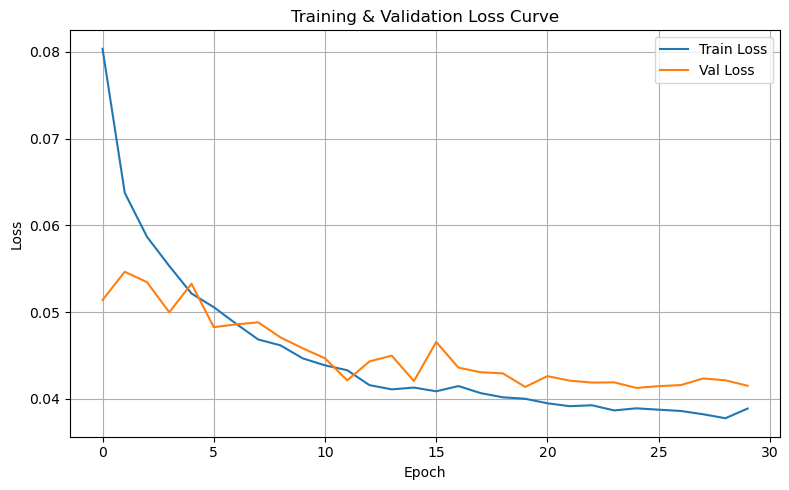

In [1]:
# === notebook.ipynb ===
from Emotalk_model_v0002 import EmoTalk
from train_hdft import HDTFDataset  # 👈 从这个文件导入数据集
from loss_v0003 import EmoTalkLoss
from torch.utils.data import DataLoader
import torch
import os
import csv
from tqdm import tqdm
from types import SimpleNamespace
import matplotlib.pyplot as plt

# === 配置 ===
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EPOCHS = 30
LR = 1e-4
SAVE_PATH = 'emotalk_finetuned_2.pth'
LOG_CSV = 'training_log.csv'
BATCH_SIZE = 1

args = SimpleNamespace(
    feature_dim=1024, bs_dim=52, device=DEVICE, batch_size=BATCH_SIZE,
    max_seq_len=512, period=20, emotion_dim=256, emo_gru_hidden=128,
    emo_gru_layers=2, transformer_layers=4, transformer_heads=8,
    transformer_dim=512, num_emotions=8, num_person=25
)

# === 数据加载 ===
train_dataset = HDTFDataset('./data/HDTF/train')
val_dataset = HDTFDataset('./data/HDTF/val')
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# === 初始化模型 ===
model = EmoTalk(args).to(DEVICE)

# === 加载预训练权重并冻结情绪模块 ===
if os.path.exists("./pretrain_model/emotalk_finetuned.pth"):
    state_dict = torch.load("./pretrain_model/emotalk_finetuned.pth", map_location=DEVICE)
    model.load_state_dict(state_dict, strict=False)
    print("✅ Loaded pretrained RAVDESS weights")

# 冻结情绪模块参数
for name, param in model.named_parameters():
    if 'extract_emotion' in name or 'emo_gru' in name or 'gamma_layer' in name or 'beta_layer' in name:
        param.requires_grad = False
        print(f"❄️ Freezing: {name}")

# === 优化器 ===
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()), lr=LR
)

# === 损失函数 ===
loss_fn = EmoTalkLoss(region_weighted=True, mouth_only=True)

# === 初始化 CSV 日志 ===
with open(LOG_CSV, mode='w', newline='') as log_file:
    log_writer = csv.writer(log_file)
    log_writer.writerow(['Epoch', 'Train_Loss', 'Main_Loss', 'Smooth_Loss', 'Vel_Loss', 'Val_Loss'])

train_loss_list, val_loss_list = [], []

# === 训练循环 ===
for epoch in range(EPOCHS):
    model.train()
    total_loss = 0.0
    logs_accum = {"main": 0, "smooth": 0, "vel": 0, "total": 0}

    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        blendshape = batch["blendshape"].to(DEVICE)
        args.target_len = blendshape.size(1)
        pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])

        loss, logs = loss_fn(pred, blendshape)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        for k in logs:
            logs_accum[k] += logs[k]

    avg_loss = total_loss / len(train_loader)
    train_loss_list.append(avg_loss)

    # === 验证 ===
    model.eval()
    with torch.no_grad():
        val_loss = 0.0
        for batch in val_loader:
            blendshape = batch["blendshape"].to(DEVICE)
            args.target_len = blendshape.size(1)
            pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])
            loss, _ = loss_fn(pred, blendshape)
            val_loss += loss.item()
        val_avg = val_loss / len(val_loader)
        val_loss_list.append(val_avg)

    # === 日志写入 ===
    with open(LOG_CSV, mode='a', newline='') as log_file:
        log_writer = csv.writer(log_file)
        log_writer.writerow([
            epoch + 1, round(avg_loss, 6), round(logs_accum['main'], 6),
            round(logs_accum['smooth'], 6), round(logs_accum['vel'], 6), round(val_avg, 6)
        ])

    # === 保存模型 ===
    torch.save(model.state_dict(), SAVE_PATH)

# === 绘制损失曲线 ===
plt.figure(figsize=(8,5))
plt.plot(train_loss_list, label='Train Loss')
plt.plot(val_loss_list, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('loss_curve.png')
plt.show()


/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.bias', 'lm_head.weight']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model fr

❄️ Freezing: emo_gru.weight_ih_l0
❄️ Freezing: emo_gru.weight_hh_l0
❄️ Freezing: emo_gru.bias_ih_l0
❄️ Freezing: emo_gru.bias_hh_l0
❄️ Freezing: emo_gru.weight_ih_l0_reverse
❄️ Freezing: emo_gru.weight_hh_l0_reverse
❄️ Freezing: emo_gru.bias_ih_l0_reverse
❄️ Freezing: emo_gru.bias_hh_l0_reverse
❄️ Freezing: emo_gru.weight_ih_l1
❄️ Freezing: emo_gru.weight_hh_l1
❄️ Freezing: emo_gru.bias_ih_l1
❄️ Freezing: emo_gru.bias_hh_l1
❄️ Freezing: emo_gru.weight_ih_l1_reverse
❄️ Freezing: emo_gru.weight_hh_l1_reverse
❄️ Freezing: emo_gru.bias_ih_l1_reverse
❄️ Freezing: emo_gru.bias_hh_l1_reverse


Epoch 1:   0%|                                                         | 0/143 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   1%|▋                                                | 2/143 [00:01<01:04,  2.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   3%|█▎                                               | 4/143 [00:01<00:36,  3.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   4%|██                                               | 6/143 [00:01<00:27,  4.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   6%|██▋                                              | 8/143 [00:01<00:23,  5.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:   6%|███                                              | 9/143 [00:02<00:23,  5.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   8%|███▋                                            | 11/143 [00:02<00:21,  6.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   9%|████▎                                           | 13/143 [00:02<00:20,  6.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  10%|█████                                           | 15/143 [00:03<00:19,  6.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  12%|█████▋                                          | 17/143 [00:03<00:18,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  13%|██████▍                                         | 19/143 [00:03<00:18,  6.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  15%|███████                                         | 21/143 [00:03<00:18,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  16%|███████▋                                        | 23/143 [00:04<00:17,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  17%|████████▍                                       | 25/143 [00:04<00:17,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  19%|█████████                                       | 27/143 [00:04<00:17,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  20%|█████████▋                                      | 29/143 [00:05<00:17,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  22%|██████████▍                                     | 31/143 [00:05<00:16,  6.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  23%|███████████                                     | 33/143 [00:05<00:16,  6.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  24%|███████████▋                                    | 35/143 [00:06<00:16,  6.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  26%|████████████▍                                   | 37/143 [00:06<00:15,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  27%|█████████████                                   | 39/143 [00:06<00:15,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  29%|█████████████▊                                  | 41/143 [00:06<00:15,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  30%|██████████████▍                                 | 43/143 [00:07<00:14,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  31%|███████████████                                 | 45/143 [00:07<00:14,  6.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  33%|███████████████▊                                | 47/143 [00:07<00:14,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  34%|████████████████▍                               | 49/143 [00:08<00:13,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  36%|█████████████████                               | 51/143 [00:08<00:13,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  37%|█████████████████▊                              | 53/143 [00:08<00:13,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  38%|██████████████████▍                             | 55/143 [00:08<00:12,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  40%|███████████████████▏                            | 57/143 [00:09<00:12,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  41%|███████████████████▊                            | 59/143 [00:09<00:12,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  43%|████████████████████▍                           | 61/143 [00:09<00:11,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  44%|█████████████████████▏                          | 63/143 [00:10<00:11,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  45%|█████████████████████▊                          | 65/143 [00:10<00:11,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  47%|██████████████████████▍                         | 67/143 [00:10<00:11,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  48%|███████████████████████▏                        | 69/143 [00:11<00:10,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  50%|███████████████████████▊                        | 71/143 [00:11<00:10,  6.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  51%|████████████████████████▌                       | 73/143 [00:11<00:10,  6.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  52%|█████████████████████████▏                      | 75/143 [00:11<00:09,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  54%|█████████████████████████▊                      | 77/143 [00:12<00:09,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  55%|██████████████████████████▌                     | 79/143 [00:12<00:09,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  57%|███████████████████████████▏                    | 81/143 [00:12<00:08,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  58%|███████████████████████████▊                    | 83/143 [00:13<00:08,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  59%|████████████████████████████▌                   | 85/143 [00:13<00:08,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  61%|█████████████████████████████▏                  | 87/143 [00:13<00:08,  6.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  62%|█████████████████████████████▊                  | 89/143 [00:13<00:08,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  64%|██████████████████████████████▌                 | 91/143 [00:14<00:07,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  65%|███████████████████████████████▏                | 93/143 [00:14<00:07,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  66%|███████████████████████████████▉                | 95/143 [00:14<00:06,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  68%|████████████████████████████████▌               | 97/143 [00:15<00:06,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  69%|█████████████████████████████████▏              | 99/143 [00:15<00:06,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  71%|█████████████████████████████████▏             | 101/143 [00:15<00:06,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  72%|█████████████████████████████████▊             | 103/143 [00:16<00:05,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  73%|██████████████████████████████████▌            | 105/143 [00:16<00:05,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  75%|███████████████████████████████████▏           | 107/143 [00:16<00:05,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  76%|███████████████████████████████████▊           | 109/143 [00:16<00:04,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  78%|████████████████████████████████████▍          | 111/143 [00:17<00:04,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  79%|█████████████████████████████████████▏         | 113/143 [00:17<00:04,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  80%|█████████████████████████████████████▊         | 115/143 [00:17<00:04,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  82%|██████████████████████████████████████▍        | 117/143 [00:18<00:03,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  83%|███████████████████████████████████████        | 119/143 [00:18<00:03,  6.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  85%|███████████████████████████████████████▊       | 121/143 [00:18<00:03,  6.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  86%|████████████████████████████████████████▍      | 123/143 [00:18<00:02,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  87%|█████████████████████████████████████████      | 125/143 [00:19<00:02,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  89%|█████████████████████████████████████████▋     | 127/143 [00:19<00:02,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  90%|██████████████████████████████████████████▍    | 129/143 [00:19<00:02,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  92%|███████████████████████████████████████████    | 131/143 [00:20<00:01,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  93%|███████████████████████████████████████████▋   | 133/143 [00:20<00:01,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  94%|████████████████████████████████████████████▎  | 135/143 [00:20<00:01,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  96%|█████████████████████████████████████████████  | 137/143 [00:21<00:00,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  97%|█████████████████████████████████████████████▋ | 139/143 [00:21<00:00,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  99%|██████████████████████████████████████████████▎| 141/143 [00:21<00:00,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1: 100%|███████████████████████████████████████████████| 143/143 [00:21<00:00,  6.53it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 2:   1%|▎                                                | 1/143 [00:00<00:22,  6.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   2%|█                                                | 3/143 [00:00<00:20,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   3%|█▋                                               | 5/143 [00:00<00:20,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   5%|██▍                                              | 7/143 [00:01<00:19,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   6%|███                                              | 9/143 [00:01<00:19,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   8%|███▋                                            | 11/143 [00:01<00:19,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   9%|████▎                                           | 13/143 [00:01<00:18,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  10%|█████                                           | 15/143 [00:02<00:18,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  15%|███████                                         | 21/143 [00:03<00:17,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  16%|███████▋                                        | 23/143 [00:03<00:17,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  17%|████████▍                                       | 25/143 [00:03<00:16,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  19%|█████████                                       | 27/143 [00:03<00:16,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  20%|█████████▋                                      | 29/143 [00:04<00:16,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  22%|██████████▍                                     | 31/143 [00:04<00:15,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  23%|███████████                                     | 33/143 [00:04<00:15,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  24%|███████████▋                                    | 35/143 [00:05<00:15,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  26%|████████████▍                                   | 37/143 [00:05<00:15,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  27%|█████████████                                   | 39/143 [00:05<00:14,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  31%|███████████████                                 | 45/143 [00:06<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  33%|███████████████▊                                | 47/143 [00:06<00:13,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  34%|████████████████▍                               | 49/143 [00:07<00:13,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  36%|█████████████████                               | 51/143 [00:07<00:12,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  47%|██████████████████████▍                         | 67/143 [00:09<00:10,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  51%|████████████████████████▌                       | 73/143 [00:10<00:10,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  52%|█████████████████████████▏                      | 75/143 [00:10<00:09,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  63%|██████████████████████████████▏                 | 90/143 [00:12<00:08,  6.52it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  64%|██████████████████████████████▉                 | 92/143 [00:13<00:07,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  66%|███████████████████████████████▌                | 94/143 [00:13<00:07,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  67%|████████████████████████████████▏               | 96/143 [00:13<00:06,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  69%|████████████████████████████████▉               | 98/143 [00:14<00:06,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  70%|████████████████████████████████▊              | 100/143 [00:14<00:06,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  71%|█████████████████████████████████▌             | 102/143 [00:14<00:05,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  73%|██████████████████████████████████▏            | 104/143 [00:14<00:05,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  74%|██████████████████████████████████▊            | 106/143 [00:15<00:05,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  76%|███████████████████████████████████▍           | 108/143 [00:15<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  77%|████████████████████████████████████▏          | 110/143 [00:15<00:04,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  78%|████████████████████████████████████▊          | 112/143 [00:16<00:04,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  80%|█████████████████████████████████████▍         | 114/143 [00:16<00:04,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  81%|██████████████████████████████████████▏        | 116/143 [00:16<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  83%|██████████████████████████████████████▊        | 118/143 [00:16<00:03,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  84%|███████████████████████████████████████▍       | 120/143 [00:17<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  85%|████████████████████████████████████████       | 122/143 [00:17<00:02,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  87%|████████████████████████████████████████▊      | 124/143 [00:17<00:02,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  88%|█████████████████████████████████████████▍     | 126/143 [00:18<00:02,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  90%|██████████████████████████████████████████     | 128/143 [00:18<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  91%|██████████████████████████████████████████▋    | 130/143 [00:18<00:01,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  92%|███████████████████████████████████████████▍   | 132/143 [00:18<00:01,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  94%|████████████████████████████████████████████   | 134/143 [00:19<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  95%|████████████████████████████████████████████▋  | 136/143 [00:19<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  97%|█████████████████████████████████████████████▎ | 138/143 [00:19<00:00,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  98%|██████████████████████████████████████████████ | 140/143 [00:20<00:00,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  99%|██████████████████████████████████████████████▋| 142/143 [00:20<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  6.98it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 3:   1%|▎                                                | 1/143 [00:00<00:21,  6.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   2%|█                                                | 3/143 [00:00<00:20,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   3%|█▋                                               | 5/143 [00:00<00:19,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   5%|██▍                                              | 7/143 [00:01<00:19,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   6%|███                                              | 9/143 [00:01<00:18,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   8%|███▋                                            | 11/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   9%|████▎                                           | 13/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  10%|█████                                           | 15/143 [00:02<00:18,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  15%|███████                                         | 21/143 [00:02<00:17,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  16%|███████▋                                        | 23/143 [00:03<00:17,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  17%|████████▍                                       | 25/143 [00:03<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  19%|█████████                                       | 27/143 [00:03<00:16,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  20%|█████████▋                                      | 29/143 [00:04<00:16,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  22%|██████████▍                                     | 31/143 [00:04<00:16,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  23%|███████████                                     | 33/143 [00:04<00:15,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  24%|███████████▋                                    | 35/143 [00:04<00:15,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  26%|████████████▍                                   | 37/143 [00:05<00:15,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  27%|█████████████                                   | 39/143 [00:05<00:15,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  31%|███████████████                                 | 45/143 [00:06<00:14,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  33%|███████████████▊                                | 47/143 [00:06<00:13,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  34%|████████████████▍                               | 49/143 [00:07<00:13,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  36%|█████████████████                               | 51/143 [00:07<00:13,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  47%|██████████████████████▍                         | 67/143 [00:09<00:10,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  51%|████████████████████████▌                       | 73/143 [00:10<00:10,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  52%|█████████████████████████▏                      | 75/143 [00:10<00:09,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  66%|███████████████████████████████▉                | 95/143 [00:13<00:06,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  68%|████████████████████████████████▌               | 97/143 [00:13<00:06,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:05,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  78%|████████████████████████████████████▍          | 111/143 [00:15<00:04,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:03,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  87%|█████████████████████████████████████████      | 125/143 [00:17<00:02,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  97%|█████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  6.97it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 4:   1%|▎                                                | 1/143 [00:00<00:22,  6.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   2%|█                                                | 3/143 [00:00<00:20,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   3%|█▋                                               | 5/143 [00:00<00:19,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   5%|██▍                                              | 7/143 [00:01<00:19,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   6%|███                                              | 9/143 [00:01<00:19,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   8%|███▋                                            | 11/143 [00:01<00:18,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   9%|████▎                                           | 13/143 [00:01<00:18,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  10%|█████                                           | 15/143 [00:02<00:18,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  12%|█████▋                                          | 17/143 [00:02<00:18,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  15%|███████                                         | 21/143 [00:03<00:17,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  16%|███████▋                                        | 23/143 [00:03<00:17,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  17%|████████▍                                       | 25/143 [00:03<00:16,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  19%|█████████                                       | 27/143 [00:03<00:17,  6.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  20%|█████████▋                                      | 29/143 [00:04<00:16,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  22%|██████████▍                                     | 31/143 [00:04<00:16,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  23%|███████████                                     | 33/143 [00:04<00:15,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  24%|███████████▋                                    | 35/143 [00:05<00:15,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  26%|████████████▍                                   | 37/143 [00:05<00:15,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  27%|█████████████                                   | 39/143 [00:05<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  31%|███████████████                                 | 45/143 [00:06<00:14,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  33%|███████████████▊                                | 47/143 [00:06<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  34%|████████████████▍                               | 49/143 [00:07<00:13,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  36%|█████████████████                               | 51/143 [00:07<00:12,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  47%|██████████████████████▍                         | 67/143 [00:09<00:10,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  51%|████████████████████████▌                       | 73/143 [00:10<00:09,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  52%|█████████████████████████▏                      | 75/143 [00:10<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  66%|███████████████████████████████▉                | 95/143 [00:13<00:07,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  68%|████████████████████████████████▌               | 97/143 [00:13<00:06,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:05,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  78%|████████████████████████████████████▍          | 111/143 [00:15<00:04,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:03,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  87%|█████████████████████████████████████████      | 125/143 [00:17<00:02,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  97%|█████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  6.98it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 5:   1%|▎                                                | 1/143 [00:00<00:21,  6.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   2%|█                                                | 3/143 [00:00<00:21,  6.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   3%|█▋                                               | 5/143 [00:00<00:20,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   5%|██▍                                              | 7/143 [00:01<00:19,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   6%|███                                              | 9/143 [00:01<00:19,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   8%|███▋                                            | 11/143 [00:01<00:18,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   9%|████▎                                           | 13/143 [00:01<00:18,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  10%|█████                                           | 15/143 [00:02<00:18,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  15%|███████                                         | 21/143 [00:03<00:17,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  16%|███████▋                                        | 23/143 [00:03<00:17,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  17%|████████▍                                       | 25/143 [00:03<00:17,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  19%|█████████                                       | 27/143 [00:03<00:16,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  20%|█████████▋                                      | 29/143 [00:04<00:16,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  22%|██████████▍                                     | 31/143 [00:04<00:16,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  23%|███████████                                     | 33/143 [00:04<00:15,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  24%|███████████▋                                    | 35/143 [00:05<00:15,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  26%|████████████▍                                   | 37/143 [00:05<00:15,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  27%|█████████████                                   | 39/143 [00:05<00:14,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  31%|███████████████                                 | 45/143 [00:06<00:14,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  33%|███████████████▊                                | 47/143 [00:06<00:13,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  34%|████████████████▍                               | 49/143 [00:07<00:13,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  36%|█████████████████                               | 51/143 [00:07<00:13,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  47%|██████████████████████▍                         | 67/143 [00:09<00:11,  6.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  51%|████████████████████████▌                       | 73/143 [00:10<00:10,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  52%|█████████████████████████▏                      | 75/143 [00:10<00:10,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  6.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  66%|███████████████████████████████▉                | 95/143 [00:13<00:07,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  68%|████████████████████████████████▌               | 97/143 [00:14<00:06,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:06,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  78%|████████████████████████████████████▍          | 111/143 [00:16<00:04,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:03,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  87%|█████████████████████████████████████████      | 125/143 [00:18<00:02,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  97%|█████████████████████████████████████████████▋ | 139/143 [00:20<00:00,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  6.92it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 6:   1%|▎                                                | 1/143 [00:00<00:20,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   2%|█                                                | 3/143 [00:00<00:20,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   3%|█▋                                               | 5/143 [00:00<00:19,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   5%|██▍                                              | 7/143 [00:01<00:19,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   6%|███                                              | 9/143 [00:01<00:19,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   8%|███▋                                            | 11/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   9%|████▎                                           | 13/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  10%|█████                                           | 15/143 [00:02<00:18,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  15%|███████                                         | 21/143 [00:02<00:17,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  16%|███████▋                                        | 23/143 [00:03<00:17,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  17%|████████▍                                       | 25/143 [00:03<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  19%|█████████                                       | 27/143 [00:03<00:16,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  20%|█████████▋                                      | 29/143 [00:04<00:16,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  22%|██████████▍                                     | 31/143 [00:04<00:15,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  23%|███████████                                     | 33/143 [00:04<00:15,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  24%|███████████▋                                    | 35/143 [00:04<00:15,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  26%|████████████▍                                   | 37/143 [00:05<00:15,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  27%|█████████████                                   | 39/143 [00:05<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  31%|███████████████                                 | 45/143 [00:06<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  33%|███████████████▊                                | 47/143 [00:06<00:13,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  34%|████████████████▍                               | 49/143 [00:06<00:13,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  36%|█████████████████                               | 51/143 [00:07<00:13,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  41%|███████████████████▊                            | 59/143 [00:08<00:11,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  44%|█████████████████████▏                          | 63/143 [00:08<00:11,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  47%|██████████████████████▍                         | 67/143 [00:09<00:10,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  51%|████████████████████████▌                       | 73/143 [00:10<00:09,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  52%|█████████████████████████▏                      | 75/143 [00:10<00:09,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  54%|█████████████████████████▊                      | 77/143 [00:10<00:09,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  64%|██████████████████████████████▌                 | 91/143 [00:12<00:07,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  66%|███████████████████████████████▉                | 95/143 [00:13<00:07,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  68%|████████████████████████████████▌               | 97/143 [00:13<00:06,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:06,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  78%|████████████████████████████████████▍          | 111/143 [00:15<00:04,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:03,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  83%|███████████████████████████████████████        | 119/143 [00:16<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  87%|█████████████████████████████████████████      | 125/143 [00:17<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  93%|███████████████████████████████████████████▋   | 133/143 [00:18<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  97%|█████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  7.02it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 7:   1%|▎                                                | 1/143 [00:00<00:21,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   2%|█                                                | 3/143 [00:00<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   3%|█▋                                               | 5/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   5%|██▍                                              | 7/143 [00:00<00:19,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   6%|███                                              | 9/143 [00:01<00:18,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   8%|███▋                                            | 11/143 [00:01<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   9%|████▎                                           | 13/143 [00:01<00:18,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  10%|█████                                           | 15/143 [00:02<00:18,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  13%|██████▍                                         | 19/143 [00:02<00:17,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  15%|███████                                         | 21/143 [00:02<00:17,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  16%|███████▋                                        | 23/143 [00:03<00:16,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  17%|████████▍                                       | 25/143 [00:03<00:16,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  19%|█████████                                       | 27/143 [00:03<00:16,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  20%|█████████▋                                      | 29/143 [00:04<00:16,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  22%|██████████▍                                     | 31/143 [00:04<00:16,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  23%|███████████                                     | 33/143 [00:04<00:15,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  24%|███████████▋                                    | 35/143 [00:04<00:15,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  26%|████████████▍                                   | 37/143 [00:05<00:14,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  27%|█████████████                                   | 39/143 [00:05<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  29%|█████████████▊                                  | 41/143 [00:05<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  31%|███████████████                                 | 45/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  33%|███████████████▊                                | 47/143 [00:06<00:13,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  34%|████████████████▍                               | 49/143 [00:06<00:13,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  36%|█████████████████                               | 51/143 [00:07<00:13,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  37%|█████████████████▊                              | 53/143 [00:07<00:13,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  38%|██████████████████▍                             | 55/143 [00:07<00:12,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  44%|█████████████████████▏                          | 63/143 [00:08<00:11,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  47%|██████████████████████▍                         | 67/143 [00:09<00:11,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  48%|███████████████████████▏                        | 69/143 [00:09<00:10,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  51%|████████████████████████▌                       | 73/143 [00:10<00:09,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  52%|█████████████████████████▏                      | 75/143 [00:10<00:10,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  54%|█████████████████████████▊                      | 77/143 [00:10<00:09,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  58%|███████████████████████████▊                    | 83/143 [00:11<00:08,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  66%|███████████████████████████████▉                | 95/143 [00:13<00:06,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  68%|████████████████████████████████▌               | 97/143 [00:13<00:06,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:06,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  73%|██████████████████████████████████▌            | 105/143 [00:14<00:05,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  78%|████████████████████████████████████▍          | 111/143 [00:15<00:04,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:04,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  87%|█████████████████████████████████████████      | 125/143 [00:17<00:02,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:02,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  97%|█████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  7.00it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 8:   1%|▎                                                | 1/143 [00:00<00:20,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   2%|█                                                | 3/143 [00:00<00:20,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   3%|█▋                                               | 5/143 [00:00<00:19,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   5%|██▍                                              | 7/143 [00:01<00:19,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   6%|███                                              | 9/143 [00:01<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   8%|███▋                                            | 11/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   9%|████▎                                           | 13/143 [00:01<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  10%|█████                                           | 15/143 [00:02<00:18,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  12%|█████▋                                          | 17/143 [00:02<00:17,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  13%|██████▍                                         | 19/143 [00:02<00:17,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  15%|███████                                         | 21/143 [00:03<00:17,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  16%|███████▋                                        | 23/143 [00:03<00:17,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  17%|████████▍                                       | 25/143 [00:03<00:16,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  19%|█████████                                       | 27/143 [00:03<00:16,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  20%|█████████▋                                      | 29/143 [00:04<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  22%|██████████▍                                     | 31/143 [00:04<00:15,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  23%|███████████                                     | 33/143 [00:04<00:15,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  24%|███████████▋                                    | 35/143 [00:04<00:15,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  26%|████████████▍                                   | 37/143 [00:05<00:21,  4.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  27%|█████████████                                   | 39/143 [00:05<00:18,  5.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  29%|█████████████▊                                  | 41/143 [00:06<00:16,  6.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  30%|██████████████▍                                 | 43/143 [00:06<00:15,  6.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  31%|███████████████                                 | 45/143 [00:06<00:14,  6.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  33%|███████████████▊                                | 47/143 [00:06<00:13,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  34%|████████████████▍                               | 49/143 [00:07<00:13,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  36%|█████████████████                               | 51/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  37%|█████████████████▊                              | 53/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  38%|██████████████████▍                             | 55/143 [00:08<00:12,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  40%|███████████████████▏                            | 57/143 [00:08<00:12,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  41%|███████████████████▊                            | 59/143 [00:08<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  43%|████████████████████▍                           | 61/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  47%|██████████████████████▍                         | 67/143 [00:09<00:10,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  48%|███████████████████████▏                        | 69/143 [00:10<00:10,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  51%|████████████████████████▌                       | 73/143 [00:10<00:10,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  52%|█████████████████████████▏                      | 75/143 [00:10<00:09,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  57%|███████████████████████████▏                    | 81/143 [00:11<00:08,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  58%|███████████████████████████▊                    | 83/143 [00:12<00:08,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  62%|█████████████████████████████▊                  | 89/143 [00:12<00:07,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  66%|███████████████████████████████▉                | 95/143 [00:13<00:06,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  68%|████████████████████████████████▌               | 97/143 [00:14<00:06,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:06,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  72%|█████████████████████████████████▊             | 103/143 [00:14<00:05,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  76%|███████████████████████████████████▊           | 109/143 [00:15<00:04,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  78%|████████████████████████████████████▍          | 111/143 [00:16<00:04,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:03,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  82%|██████████████████████████████████████▍        | 117/143 [00:16<00:03,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  86%|████████████████████████████████████████▍      | 123/143 [00:17<00:02,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  87%|█████████████████████████████████████████      | 125/143 [00:18<00:02,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  90%|██████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  92%|███████████████████████████████████████████    | 131/143 [00:18<00:01,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  96%|█████████████████████████████████████████████  | 137/143 [00:19<00:00,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  97%|█████████████████████████████████████████████▋ | 139/143 [00:20<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8: 100%|███████████████████████████████████████████████| 143/143 [00:20<00:00,  6.93it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 9:   1%|▎                                                | 1/143 [00:00<00:22,  6.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   2%|█                                                | 3/143 [00:00<00:20,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   3%|█▋                                               | 5/143 [00:00<00:20,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   5%|██▍                                              | 7/143 [00:01<00:20,  6.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   6%|███                                              | 9/143 [00:01<00:20,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   8%|███▋                                            | 11/143 [00:01<00:19,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   9%|████▎                                           | 13/143 [00:01<00:19,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  10%|█████                                           | 15/143 [00:02<00:18,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  12%|█████▋                                          | 17/143 [00:02<00:18,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  13%|██████▍                                         | 19/143 [00:02<00:18,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  15%|███████                                         | 21/143 [00:03<00:18,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  16%|███████▋                                        | 23/143 [00:03<00:17,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  17%|████████▍                                       | 25/143 [00:03<00:17,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  19%|█████████                                       | 27/143 [00:03<00:17,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  20%|█████████▋                                      | 29/143 [00:04<00:16,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  22%|██████████▍                                     | 31/143 [00:04<00:16,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  23%|███████████                                     | 33/143 [00:04<00:16,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  24%|███████████▋                                    | 35/143 [00:05<00:15,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  26%|████████████▍                                   | 37/143 [00:05<00:15,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  27%|█████████████                                   | 39/143 [00:05<00:15,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  29%|█████████████▊                                  | 41/143 [00:06<00:14,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  30%|██████████████▍                                 | 43/143 [00:06<00:14,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  31%|███████████████                                 | 45/143 [00:06<00:14,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  33%|███████████████▊                                | 47/143 [00:06<00:14,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  34%|████████████████▍                               | 49/143 [00:07<00:13,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  36%|█████████████████                               | 51/143 [00:07<00:13,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  37%|█████████████████▊                              | 53/143 [00:07<00:13,  6.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  38%|██████████████████▍                             | 55/143 [00:08<00:13,  6.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  40%|███████████████████▏                            | 57/143 [00:08<00:13,  6.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  41%|███████████████████▊                            | 59/143 [00:08<00:12,  6.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  43%|████████████████████▍                           | 61/143 [00:09<00:12,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  44%|█████████████████████▏                          | 63/143 [00:09<00:11,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  45%|█████████████████████▊                          | 65/143 [00:09<00:11,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  47%|██████████████████████▍                         | 67/143 [00:09<00:11,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  48%|███████████████████████▏                        | 69/143 [00:10<00:10,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  50%|███████████████████████▊                        | 71/143 [00:10<00:10,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  51%|████████████████████████▌                       | 73/143 [00:10<00:10,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  52%|█████████████████████████▏                      | 75/143 [00:11<00:09,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  54%|█████████████████████████▊                      | 77/143 [00:11<00:09,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  55%|██████████████████████████▌                     | 79/143 [00:11<00:09,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  57%|███████████████████████████▏                    | 81/143 [00:11<00:09,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  58%|███████████████████████████▊                    | 83/143 [00:12<00:08,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  59%|████████████████████████████▌                   | 85/143 [00:12<00:08,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  61%|█████████████████████████████▏                  | 87/143 [00:12<00:08,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  62%|█████████████████████████████▊                  | 89/143 [00:13<00:07,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  64%|██████████████████████████████▌                 | 91/143 [00:13<00:07,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  65%|███████████████████████████████▏                | 93/143 [00:13<00:07,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  66%|███████████████████████████████▉                | 95/143 [00:14<00:06,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  68%|████████████████████████████████▌               | 97/143 [00:14<00:07,  6.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  69%|█████████████████████████████████▏              | 99/143 [00:14<00:06,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  71%|█████████████████████████████████▏             | 101/143 [00:14<00:06,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  72%|█████████████████████████████████▊             | 103/143 [00:15<00:05,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  73%|██████████████████████████████████▌            | 105/143 [00:15<00:05,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  75%|███████████████████████████████████▏           | 107/143 [00:15<00:05,  6.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  76%|███████████████████████████████████▊           | 109/143 [00:16<00:05,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  78%|████████████████████████████████████▍          | 111/143 [00:16<00:04,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  79%|█████████████████████████████████████▏         | 113/143 [00:16<00:04,  6.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  80%|█████████████████████████████████████▊         | 115/143 [00:16<00:04,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  82%|██████████████████████████████████████▍        | 117/143 [00:17<00:03,  6.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  83%|███████████████████████████████████████        | 119/143 [00:17<00:03,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  85%|███████████████████████████████████████▊       | 121/143 [00:17<00:03,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  86%|████████████████████████████████████████▍      | 123/143 [00:18<00:02,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  87%|█████████████████████████████████████████      | 125/143 [00:18<00:02,  6.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  89%|█████████████████████████████████████████▋     | 127/143 [00:18<00:02,  6.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  90%|██████████████████████████████████████████▍    | 129/143 [00:19<00:02,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  92%|███████████████████████████████████████████    | 131/143 [00:19<00:01,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  93%|███████████████████████████████████████████▋   | 133/143 [00:19<00:01,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  94%|████████████████████████████████████████████▎  | 135/143 [00:19<00:01,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  96%|█████████████████████████████████████████████  | 137/143 [00:20<00:00,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  97%|█████████████████████████████████████████████▋ | 139/143 [00:20<00:00,  6.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  99%|██████████████████████████████████████████████▎| 141/143 [00:20<00:00,  6.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9: 100%|███████████████████████████████████████████████| 143/143 [00:21<00:00,  6.76it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 10:   1%|▎                                               | 1/143 [00:00<00:21,  6.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   2%|█                                               | 3/143 [00:00<00:20,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   3%|█▋                                              | 5/143 [00:00<00:19,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   5%|██▎                                             | 7/143 [00:01<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   6%|███                                             | 9/143 [00:01<00:19,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   8%|███▌                                           | 11/143 [00:01<00:18,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   9%|████▎                                          | 13/143 [00:01<00:18,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  10%|████▉                                          | 15/143 [00:02<00:18,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  12%|█████▌                                         | 17/143 [00:02<00:18,  6.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  13%|██████▏                                        | 19/143 [00:02<00:18,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  15%|██████▉                                        | 21/143 [00:03<00:18,  6.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  16%|███████▌                                       | 23/143 [00:03<00:17,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  17%|████████▏                                      | 25/143 [00:03<00:17,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  19%|████████▊                                      | 27/143 [00:03<00:16,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  20%|█████████▌                                     | 29/143 [00:04<00:16,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  22%|██████████▏                                    | 31/143 [00:04<00:16,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  23%|██████████▊                                    | 33/143 [00:04<00:16,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  24%|███████████▌                                   | 35/143 [00:05<00:15,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  26%|████████████▏                                  | 37/143 [00:05<00:15,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  27%|████████████▊                                  | 39/143 [00:05<00:15,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  30%|██████████████▏                                | 43/143 [00:06<00:14,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  31%|██████████████▊                                | 45/143 [00:06<00:14,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  33%|███████████████▍                               | 47/143 [00:06<00:14,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  34%|████████████████                               | 49/143 [00:07<00:13,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  36%|████████████████▊                              | 51/143 [00:07<00:13,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  37%|█████████████████▍                             | 53/143 [00:07<00:13,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  38%|██████████████████                             | 55/143 [00:07<00:12,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  44%|████████████████████▋                          | 63/143 [00:09<00:11,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  47%|██████████████████████                         | 67/143 [00:09<00:10,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  48%|██████████████████████▋                        | 69/143 [00:10<00:10,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  51%|███████████████████████▉                       | 73/143 [00:10<00:10,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  54%|█████████████████████████▎                     | 77/143 [00:11<00:09,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  57%|██████████████████████████▌                    | 81/143 [00:11<00:09,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  58%|███████████████████████████▎                   | 83/143 [00:12<00:08,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  61%|████████████████████████████▌                  | 87/143 [00:12<00:08,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  64%|█████████████████████████████▉                 | 91/143 [00:13<00:07,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  68%|███████████████████████████████▉               | 97/143 [00:14<00:06,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  71%|████████████████████████████████▍             | 101/143 [00:14<00:06,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  73%|█████████████████████████████████▊            | 105/143 [00:15<00:05,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  78%|███████████████████████████████████▋          | 111/143 [00:16<00:04,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  83%|██████████████████████████████████████▎       | 119/143 [00:17<00:03,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  87%|████████████████████████████████████████▏     | 125/143 [00:18<00:02,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  92%|██████████████████████████████████████████▏   | 131/143 [00:19<00:01,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  93%|██████████████████████████████████████████▊   | 133/143 [00:19<00:01,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  97%|████████████████████████████████████████████▋ | 139/143 [00:20<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  99%|█████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  6.90it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 11:   1%|▎                                               | 1/143 [00:00<00:21,  6.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   2%|█                                               | 3/143 [00:00<00:20,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   3%|█▋                                              | 5/143 [00:00<00:19,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   5%|██▎                                             | 7/143 [00:01<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   6%|███                                             | 9/143 [00:01<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   8%|███▌                                           | 11/143 [00:01<00:18,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   9%|████▎                                          | 13/143 [00:01<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  10%|████▉                                          | 15/143 [00:02<00:18,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  15%|██████▉                                        | 21/143 [00:03<00:17,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  16%|███████▌                                       | 23/143 [00:03<00:17,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  17%|████████▏                                      | 25/143 [00:03<00:17,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  19%|████████▊                                      | 27/143 [00:03<00:16,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  20%|█████████▌                                     | 29/143 [00:04<00:16,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  22%|██████████▏                                    | 31/143 [00:04<00:16,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  23%|██████████▊                                    | 33/143 [00:04<00:15,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  24%|███████████▌                                   | 35/143 [00:05<00:15,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  26%|████████████▏                                  | 37/143 [00:05<00:15,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  27%|████████████▊                                  | 39/143 [00:05<00:14,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  34%|████████████████                               | 49/143 [00:07<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  36%|████████████████▊                              | 51/143 [00:07<00:13,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  37%|█████████████████▍                             | 53/143 [00:07<00:13,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  38%|██████████████████                             | 55/143 [00:07<00:12,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  41%|███████████████████▍                           | 59/143 [00:08<00:12,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  43%|████████████████████                           | 61/143 [00:08<00:11,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  44%|████████████████████▋                          | 63/143 [00:09<00:11,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  47%|██████████████████████                         | 67/143 [00:09<00:10,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  54%|█████████████████████████▎                     | 77/143 [00:11<00:09,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  64%|█████████████████████████████▉                 | 91/143 [00:13<00:07,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  71%|████████████████████████████████▍             | 101/143 [00:14<00:06,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  73%|█████████████████████████████████▊            | 105/143 [00:15<00:05,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  83%|██████████████████████████████████████▎       | 119/143 [00:17<00:03,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:03,  6.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  93%|██████████████████████████████████████████▊   | 133/143 [00:19<00:01,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  99%|█████████████████████████████████████████████▎| 141/143 [00:20<00:00,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  6.97it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 12:   1%|▎                                               | 1/143 [00:00<00:22,  6.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   2%|█                                               | 3/143 [00:00<00:20,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   3%|█▋                                              | 5/143 [00:00<00:20,  6.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   5%|██▎                                             | 7/143 [00:01<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   6%|███                                             | 9/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   8%|███▌                                           | 11/143 [00:01<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   9%|████▎                                          | 13/143 [00:01<00:18,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  10%|████▉                                          | 15/143 [00:02<00:18,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  13%|██████▏                                        | 19/143 [00:02<00:17,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  15%|██████▉                                        | 21/143 [00:03<00:17,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  16%|███████▌                                       | 23/143 [00:03<00:17,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  19%|████████▊                                      | 27/143 [00:03<00:16,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  20%|█████████▌                                     | 29/143 [00:04<00:16,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  23%|██████████▊                                    | 33/143 [00:04<00:15,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  24%|███████████▌                                   | 35/143 [00:05<00:15,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  26%|████████████▏                                  | 37/143 [00:05<00:15,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  34%|████████████████                               | 49/143 [00:07<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  36%|████████████████▊                              | 51/143 [00:07<00:13,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  41%|███████████████████▍                           | 59/143 [00:08<00:12,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  43%|████████████████████                           | 61/143 [00:08<00:12,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  44%|████████████████████▋                          | 63/143 [00:09<00:11,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  51%|███████████████████████▉                       | 73/143 [00:10<00:10,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  54%|█████████████████████████▎                     | 77/143 [00:11<00:09,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  61%|████████████████████████████▌                  | 87/143 [00:12<00:08,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  64%|█████████████████████████████▉                 | 91/143 [00:13<00:07,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  66%|███████████████████████████████▏               | 95/143 [00:13<00:07,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  71%|████████████████████████████████▍             | 101/143 [00:14<00:06,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  73%|█████████████████████████████████▊            | 105/143 [00:15<00:05,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  83%|██████████████████████████████████████▎       | 119/143 [00:17<00:03,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  93%|██████████████████████████████████████████▊   | 133/143 [00:19<00:01,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  99%|█████████████████████████████████████████████▎| 141/143 [00:20<00:00,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  6.97it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 13:   1%|▎                                               | 1/143 [00:00<00:20,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   2%|█                                               | 3/143 [00:00<00:20,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   3%|█▋                                              | 5/143 [00:00<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   5%|██▎                                             | 7/143 [00:01<00:19,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   6%|███                                             | 9/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   8%|███▌                                           | 11/143 [00:01<00:19,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   9%|████▎                                          | 13/143 [00:01<00:18,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  10%|████▉                                          | 15/143 [00:02<00:18,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  12%|█████▌                                         | 17/143 [00:02<00:18,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  16%|███████▌                                       | 23/143 [00:03<00:17,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  17%|████████▏                                      | 25/143 [00:03<00:16,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  22%|██████████▏                                    | 31/143 [00:04<00:16,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  24%|███████████▌                                   | 35/143 [00:05<00:15,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  26%|████████████▏                                  | 37/143 [00:05<00:15,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  34%|████████████████                               | 49/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  61%|████████████████████████████▌                  | 87/143 [00:12<00:08,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  71%|████████████████████████████████▍             | 101/143 [00:14<00:06,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  6.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  93%|██████████████████████████████████████████▊   | 133/143 [00:19<00:01,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  99%|█████████████████████████████████████████████▎| 141/143 [00:20<00:00,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.00it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 14:   1%|▎                                               | 1/143 [00:00<00:20,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   2%|█                                               | 3/143 [00:00<00:20,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   3%|█▋                                              | 5/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   5%|██▎                                             | 7/143 [00:01<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   6%|███                                             | 9/143 [00:01<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   8%|███▌                                           | 11/143 [00:01<00:19,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   9%|████▎                                          | 13/143 [00:01<00:18,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  10%|████▉                                          | 15/143 [00:02<00:18,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  12%|█████▌                                         | 17/143 [00:02<00:18,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  13%|██████▏                                        | 19/143 [00:02<00:17,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  15%|██████▉                                        | 21/143 [00:03<00:17,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  16%|███████▌                                       | 23/143 [00:03<00:17,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  17%|████████▏                                      | 25/143 [00:03<00:16,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  20%|█████████▌                                     | 29/143 [00:04<00:16,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  22%|██████████▏                                    | 31/143 [00:04<00:16,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  23%|██████████▊                                    | 33/143 [00:04<00:15,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  24%|███████████▌                                   | 35/143 [00:05<00:15,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  26%|████████████▏                                  | 37/143 [00:05<00:15,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  27%|████████████▊                                  | 39/143 [00:05<00:15,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  34%|████████████████                               | 49/143 [00:07<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  38%|██████████████████                             | 55/143 [00:07<00:12,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  41%|███████████████████▍                           | 59/143 [00:08<00:12,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  43%|████████████████████                           | 61/143 [00:08<00:11,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  44%|████████████████████▋                          | 63/143 [00:09<00:11,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  47%|██████████████████████                         | 67/143 [00:09<00:10,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  51%|███████████████████████▉                       | 73/143 [00:10<00:10,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  54%|█████████████████████████▎                     | 77/143 [00:11<00:09,  6.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  57%|██████████████████████████▌                    | 81/143 [00:11<00:09,  6.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  6.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  61%|████████████████████████████▌                  | 87/143 [00:12<00:08,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  64%|█████████████████████████████▉                 | 91/143 [00:13<00:07,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  71%|████████████████████████████████▍             | 101/143 [00:14<00:06,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  73%|█████████████████████████████████▊            | 105/143 [00:15<00:05,  6.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  6.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  78%|███████████████████████████████████▋          | 111/143 [00:16<00:04,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  6.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:04,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  83%|██████████████████████████████████████▎       | 119/143 [00:17<00:03,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  87%|████████████████████████████████████████▏     | 125/143 [00:18<00:02,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  6.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  90%|█████████████████████████████████████████▏    | 128/143 [00:18<00:02,  6.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  91%|█████████████████████████████████████████▊    | 130/143 [00:18<00:01,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  92%|██████████████████████████████████████████▍   | 132/143 [00:19<00:01,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  94%|███████████████████████████████████████████   | 134/143 [00:19<00:01,  6.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  95%|███████████████████████████████████████████▋  | 136/143 [00:19<00:01,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  97%|████████████████████████████████████████████▍ | 138/143 [00:19<00:00,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  98%|█████████████████████████████████████████████ | 140/143 [00:20<00:00,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  99%|█████████████████████████████████████████████▋| 142/143 [00:20<00:00,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  6.91it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 15:   1%|▎                                               | 1/143 [00:00<00:20,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   2%|█                                               | 3/143 [00:00<00:20,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   3%|█▋                                              | 5/143 [00:00<00:19,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   5%|██▎                                             | 7/143 [00:00<00:19,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   6%|███                                             | 9/143 [00:01<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   8%|███▌                                           | 11/143 [00:01<00:18,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   9%|████▎                                          | 13/143 [00:01<00:18,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  10%|████▉                                          | 15/143 [00:02<00:18,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  22%|██████████▏                                    | 31/143 [00:04<00:16,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  24%|███████████▌                                   | 35/143 [00:05<00:16,  6.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  26%|████████████▏                                  | 37/143 [00:05<00:15,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  27%|████████████▊                                  | 39/143 [00:05<00:15,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  34%|████████████████                               | 49/143 [00:07<00:13,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  59%|███████████████████████████▉                   | 85/143 [00:12<00:08,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  69%|████████████████████████████████▌              | 99/143 [00:14<00:06,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  79%|████████████████████████████████████▎         | 113/143 [00:16<00:04,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  89%|████████████████████████████████████████▊     | 127/143 [00:18<00:02,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.06it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 16:   1%|▎                                               | 1/143 [00:00<00:20,  6.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   2%|█                                               | 3/143 [00:00<00:20,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   3%|█▋                                              | 5/143 [00:00<00:19,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   5%|██▎                                             | 7/143 [00:00<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   6%|███                                             | 9/143 [00:01<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   8%|███▌                                           | 11/143 [00:01<00:18,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   9%|████▎                                          | 13/143 [00:01<00:17,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  10%|████▉                                          | 15/143 [00:02<00:17,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  16%|███████▌                                       | 23/143 [00:03<00:17,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  19%|████████▊                                      | 27/143 [00:03<00:16,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  34%|████████████████                               | 49/143 [00:06<00:12,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.10it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 17:   1%|▎                                               | 1/143 [00:00<00:20,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   2%|█                                               | 3/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   3%|█▋                                              | 5/143 [00:00<00:19,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   5%|██▎                                             | 7/143 [00:00<00:19,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   6%|███                                             | 9/143 [00:01<00:18,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   8%|███▌                                           | 11/143 [00:01<00:18,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   9%|████▎                                          | 13/143 [00:01<00:18,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  10%|████▉                                          | 15/143 [00:02<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  31%|██████████████▊                                | 45/143 [00:06<00:14,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  34%|████████████████                               | 49/143 [00:06<00:13,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  40%|██████████████████▋                            | 57/143 [00:08<00:11,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.13it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 18:   1%|▎                                               | 1/143 [00:00<00:20,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   2%|█                                               | 3/143 [00:00<00:19,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   3%|█▋                                              | 5/143 [00:00<00:19,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   5%|██▎                                             | 7/143 [00:00<00:19,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   6%|███                                             | 9/143 [00:01<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   8%|███▌                                           | 11/143 [00:01<00:18,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:   9%|████▎                                          | 13/143 [00:01<00:18,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  10%|████▉                                          | 15/143 [00:02<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  34%|████████████████                               | 49/143 [00:06<00:13,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  40%|██████████████████▋                            | 57/143 [00:07<00:12,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  50%|███████████████████████▎                       | 71/143 [00:09<00:09,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  75%|██████████████████████████████████▍           | 107/143 [00:14<00:04,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.14it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 19:   1%|▎                                               | 1/143 [00:00<00:20,  6.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   2%|█                                               | 3/143 [00:00<00:20,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   3%|█▋                                              | 5/143 [00:00<00:19,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   5%|██▎                                             | 7/143 [00:00<00:19,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   6%|███                                             | 9/143 [00:01<00:20,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   8%|███▌                                           | 11/143 [00:01<00:18,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   9%|████▎                                          | 13/143 [00:01<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  10%|████▉                                          | 15/143 [00:02<00:18,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  26%|████████████▏                                  | 37/143 [00:05<00:15,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  34%|████████████████                               | 49/143 [00:06<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  50%|███████████████████████▎                       | 71/143 [00:10<00:09,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.10it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 20:   1%|▎                                               | 1/143 [00:00<00:20,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   2%|█                                               | 3/143 [00:00<00:19,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   3%|█▋                                              | 5/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   5%|██▎                                             | 7/143 [00:00<00:19,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   6%|███                                             | 9/143 [00:01<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   8%|███▌                                           | 11/143 [00:01<00:18,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   9%|████▎                                          | 13/143 [00:01<00:18,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  10%|████▉                                          | 15/143 [00:02<00:18,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  15%|██████▉                                        | 21/143 [00:02<00:16,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  34%|████████████████                               | 49/143 [00:06<00:13,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  40%|██████████████████▋                            | 57/143 [00:07<00:11,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  75%|██████████████████████████████████▍           | 107/143 [00:14<00:05,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.13it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 21:   1%|▎                                               | 1/143 [00:00<00:21,  6.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   2%|█                                               | 3/143 [00:00<00:20,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   3%|█▋                                              | 5/143 [00:00<00:20,  6.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   5%|██▎                                             | 7/143 [00:01<00:19,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   6%|███                                             | 9/143 [00:01<00:19,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   8%|███▌                                           | 11/143 [00:01<00:18,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   9%|████▎                                          | 13/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  10%|████▉                                          | 15/143 [00:02<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  15%|██████▉                                        | 21/143 [00:03<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  34%|████████████████                               | 49/143 [00:06<00:13,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  51%|███████████████████████▉                       | 73/143 [00:10<00:10,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.12it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 22:   1%|▎                                               | 1/143 [00:00<00:20,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   2%|█                                               | 3/143 [00:00<00:21,  6.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   3%|█▋                                              | 5/143 [00:00<00:19,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   5%|██▎                                             | 7/143 [00:01<00:19,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   6%|███                                             | 9/143 [00:01<00:18,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   8%|███▌                                           | 11/143 [00:01<00:18,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   9%|████▎                                          | 13/143 [00:01<00:18,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  10%|████▉                                          | 15/143 [00:02<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  34%|████████████████                               | 49/143 [00:06<00:13,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  40%|██████████████████▋                            | 57/143 [00:08<00:11,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.12it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 23:   1%|▎                                               | 1/143 [00:00<00:20,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   2%|█                                               | 3/143 [00:00<00:20,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   3%|█▋                                              | 5/143 [00:00<00:19,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   5%|██▎                                             | 7/143 [00:00<00:19,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   6%|███                                             | 9/143 [00:01<00:18,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   8%|███▌                                           | 11/143 [00:01<00:18,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   9%|████▎                                          | 13/143 [00:01<00:18,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  10%|████▉                                          | 15/143 [00:02<00:17,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  15%|██████▉                                        | 21/143 [00:02<00:16,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  34%|████████████████                               | 49/143 [00:06<00:13,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  36%|████████████████▊                              | 51/143 [00:07<00:13,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  40%|██████████████████▋                            | 57/143 [00:07<00:12,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  6.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  66%|███████████████████████████████▏               | 95/143 [00:13<00:07,  6.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.12it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 24:   1%|▎                                               | 1/143 [00:00<00:21,  6.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   2%|█                                               | 3/143 [00:00<00:20,  6.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   3%|█▋                                              | 5/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   5%|██▎                                             | 7/143 [00:01<00:19,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   6%|███                                             | 9/143 [00:01<00:19,  6.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   8%|███▌                                           | 11/143 [00:01<00:18,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   9%|████▎                                          | 13/143 [00:01<00:18,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  10%|████▉                                          | 15/143 [00:02<00:17,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  34%|████████████████                               | 49/143 [00:06<00:12,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  40%|██████████████████▋                            | 57/143 [00:08<00:11,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.14it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 25:   1%|▎                                               | 1/143 [00:00<00:20,  6.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   2%|█                                               | 3/143 [00:00<00:20,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   3%|█▋                                              | 5/143 [00:00<00:19,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   5%|██▎                                             | 7/143 [00:00<00:19,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   6%|███                                             | 9/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   8%|███▌                                           | 11/143 [00:01<00:18,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   9%|████▎                                          | 13/143 [00:01<00:18,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  10%|████▉                                          | 15/143 [00:02<00:17,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  20%|█████████▌                                     | 29/143 [00:04<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  34%|████████████████                               | 49/143 [00:06<00:13,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  43%|████████████████████                           | 61/143 [00:08<00:11,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.12it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 26:   1%|▎                                               | 1/143 [00:00<00:21,  6.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   2%|█                                               | 3/143 [00:00<00:19,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   3%|█▋                                              | 5/143 [00:00<00:19,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   5%|██▎                                             | 7/143 [00:00<00:18,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   6%|███                                             | 9/143 [00:01<00:18,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   8%|███▌                                           | 11/143 [00:01<00:18,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   9%|████▎                                          | 13/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  10%|████▉                                          | 15/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  34%|████████████████                               | 49/143 [00:06<00:13,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  45%|█████████████████████▎                         | 65/143 [00:09<00:10,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  51%|███████████████████████▉                       | 73/143 [00:10<00:10,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  6.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  6.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.10it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 27:   1%|▎                                               | 1/143 [00:00<00:20,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   2%|█                                               | 3/143 [00:00<00:20,  6.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   3%|█▋                                              | 5/143 [00:00<00:19,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   5%|██▎                                             | 7/143 [00:00<00:18,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   6%|███                                             | 9/143 [00:01<00:18,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   8%|███▌                                           | 11/143 [00:01<00:18,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   9%|████▎                                          | 13/143 [00:01<00:18,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  10%|████▉                                          | 15/143 [00:02<00:17,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  15%|██████▉                                        | 21/143 [00:02<00:16,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  34%|████████████████                               | 49/143 [00:06<00:13,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  40%|██████████████████▋                            | 57/143 [00:07<00:11,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  75%|██████████████████████████████████▍           | 107/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  85%|██████████████████████████████████████▉       | 121/143 [00:16<00:03,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.15it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 28:   1%|▎                                               | 1/143 [00:00<00:21,  6.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   2%|█                                               | 3/143 [00:00<00:20,  6.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   3%|█▋                                              | 5/143 [00:00<00:20,  6.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   5%|██▎                                             | 7/143 [00:01<00:19,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   6%|███                                             | 9/143 [00:01<00:18,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   8%|███▌                                           | 11/143 [00:01<00:18,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   9%|████▎                                          | 13/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  10%|████▉                                          | 15/143 [00:02<00:17,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  34%|████████████████                               | 49/143 [00:06<00:13,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  36%|████████████████▊                              | 51/143 [00:07<00:12,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  50%|███████████████████████▎                       | 71/143 [00:10<00:10,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  55%|█████████████████████████▉                     | 79/143 [00:11<00:09,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.11it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 29:   1%|▎                                               | 1/143 [00:00<00:20,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   2%|█                                               | 3/143 [00:00<00:19,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   3%|█▋                                              | 5/143 [00:00<00:19,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   5%|██▎                                             | 7/143 [00:00<00:19,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   6%|███                                             | 9/143 [00:01<00:19,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   8%|███▌                                           | 11/143 [00:01<00:18,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   9%|████▎                                          | 13/143 [00:01<00:18,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  10%|████▉                                          | 15/143 [00:02<00:18,  7.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  15%|██████▉                                        | 21/143 [00:02<00:16,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  24%|███████████▌                                   | 35/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  26%|████████████▏                                  | 37/143 [00:05<00:15,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  30%|██████████████▏                                | 43/143 [00:06<00:13,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  34%|████████████████                               | 49/143 [00:06<00:13,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  50%|███████████████████████▎                       | 71/143 [00:09<00:09,  7.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  65%|██████████████████████████████▌                | 93/143 [00:13<00:07,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  6.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:04,  6.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  6.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  94%|███████████████████████████████████████████▍  | 135/143 [00:19<00:01,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.10it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 30:   1%|▎                                               | 1/143 [00:00<00:22,  6.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   2%|█                                               | 3/143 [00:00<00:20,  6.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   3%|█▋                                              | 5/143 [00:00<00:19,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   5%|██▎                                             | 7/143 [00:00<00:18,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   6%|███                                             | 9/143 [00:01<00:18,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   8%|███▌                                           | 11/143 [00:01<00:18,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   9%|████▎                                          | 13/143 [00:01<00:18,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  10%|████▉                                          | 15/143 [00:02<00:17,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  12%|█████▌                                         | 17/143 [00:02<00:17,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  13%|██████▏                                        | 19/143 [00:02<00:17,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  15%|██████▉                                        | 21/143 [00:02<00:17,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  16%|███████▌                                       | 23/143 [00:03<00:16,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  17%|████████▏                                      | 25/143 [00:03<00:16,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  19%|████████▊                                      | 27/143 [00:03<00:16,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  20%|█████████▌                                     | 29/143 [00:04<00:15,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  22%|██████████▏                                    | 31/143 [00:04<00:15,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  23%|██████████▊                                    | 33/143 [00:04<00:15,  7.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  24%|███████████▌                                   | 35/143 [00:04<00:14,  7.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  26%|████████████▏                                  | 37/143 [00:05<00:14,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  27%|████████████▊                                  | 39/143 [00:05<00:14,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  29%|█████████████▍                                 | 41/143 [00:05<00:14,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  30%|██████████████▏                                | 43/143 [00:06<00:14,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  31%|██████████████▊                                | 45/143 [00:06<00:13,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  33%|███████████████▍                               | 47/143 [00:06<00:13,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  34%|████████████████                               | 49/143 [00:06<00:13,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  36%|████████████████▊                              | 51/143 [00:07<00:13,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  37%|█████████████████▍                             | 53/143 [00:07<00:12,  7.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  38%|██████████████████                             | 55/143 [00:07<00:12,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  40%|██████████████████▋                            | 57/143 [00:08<00:12,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  41%|███████████████████▍                           | 59/143 [00:08<00:11,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  43%|████████████████████                           | 61/143 [00:08<00:11,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  44%|████████████████████▋                          | 63/143 [00:08<00:11,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  45%|█████████████████████▎                         | 65/143 [00:09<00:11,  7.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  47%|██████████████████████                         | 67/143 [00:09<00:10,  7.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  48%|██████████████████████▋                        | 69/143 [00:09<00:10,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  50%|███████████████████████▎                       | 71/143 [00:09<00:10,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  51%|███████████████████████▉                       | 73/143 [00:10<00:09,  7.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  52%|████████████████████████▋                      | 75/143 [00:10<00:09,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  54%|█████████████████████████▎                     | 77/143 [00:10<00:09,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  55%|█████████████████████████▉                     | 79/143 [00:11<00:08,  7.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  57%|██████████████████████████▌                    | 81/143 [00:11<00:08,  7.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  58%|███████████████████████████▎                   | 83/143 [00:11<00:08,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  59%|███████████████████████████▉                   | 85/143 [00:11<00:08,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  61%|████████████████████████████▌                  | 87/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  62%|█████████████████████████████▎                 | 89/143 [00:12<00:07,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  64%|█████████████████████████████▉                 | 91/143 [00:12<00:07,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  65%|██████████████████████████████▌                | 93/143 [00:13<00:06,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  66%|███████████████████████████████▏               | 95/143 [00:13<00:06,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  68%|███████████████████████████████▉               | 97/143 [00:13<00:06,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  69%|████████████████████████████████▌              | 99/143 [00:13<00:06,  7.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  71%|████████████████████████████████▍             | 101/143 [00:14<00:05,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  72%|█████████████████████████████████▏            | 103/143 [00:14<00:05,  7.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  73%|█████████████████████████████████▊            | 105/143 [00:14<00:05,  7.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  75%|██████████████████████████████████▍           | 107/143 [00:15<00:05,  7.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  76%|███████████████████████████████████           | 109/143 [00:15<00:04,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  78%|███████████████████████████████████▋          | 111/143 [00:15<00:04,  7.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  79%|████████████████████████████████████▎         | 113/143 [00:15<00:04,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  80%|████████████████████████████████████▉         | 115/143 [00:16<00:03,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  82%|█████████████████████████████████████▋        | 117/143 [00:16<00:03,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  83%|██████████████████████████████████████▎       | 119/143 [00:16<00:03,  7.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  85%|██████████████████████████████████████▉       | 121/143 [00:17<00:03,  7.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  86%|███████████████████████████████████████▌      | 123/143 [00:17<00:02,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  87%|████████████████████████████████████████▏     | 125/143 [00:17<00:02,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  89%|████████████████████████████████████████▊     | 127/143 [00:17<00:02,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  90%|█████████████████████████████████████████▍    | 129/143 [00:18<00:02,  6.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  92%|██████████████████████████████████████████▏   | 131/143 [00:18<00:01,  7.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  93%|██████████████████████████████████████████▊   | 133/143 [00:18<00:01,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  94%|███████████████████████████████████████████▍  | 135/143 [00:18<00:01,  7.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  96%|████████████████████████████████████████████  | 137/143 [00:19<00:00,  7.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  97%|████████████████████████████████████████████▋ | 139/143 [00:19<00:00,  6.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  99%|█████████████████████████████████████████████▎| 141/143 [00:19<00:00,  7.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30: 100%|██████████████████████████████████████████████| 143/143 [00:20<00:00,  7.10it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

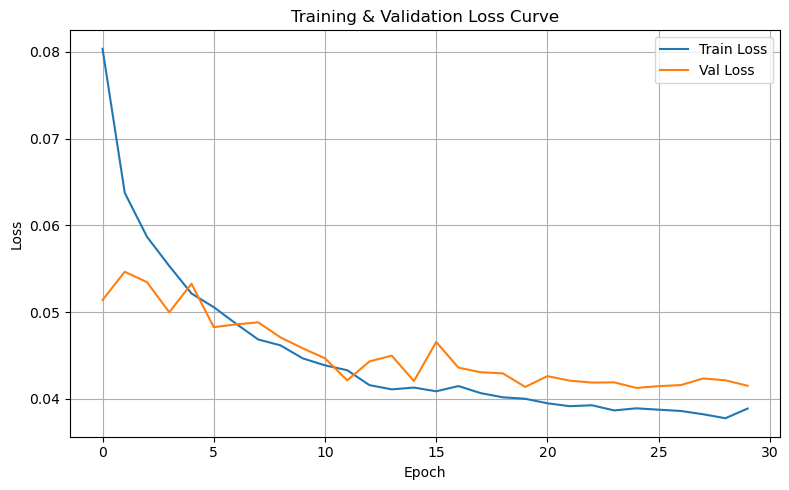

In [1]:
# === notebook.ipynb ===
from Emotalk_model_v0002 import EmoTalk
from train_hdft import HDTFDataset  # 👈 从这个文件导入数据集
from loss_v0003 import EmoTalkLoss
from torch.utils.data import DataLoader
import torch
import os
import csv
from tqdm import tqdm
from types import SimpleNamespace
import matplotlib.pyplot as plt

# === 配置 ===
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EPOCHS = 30
LR = 1e-4
SAVE_PATH = 'emotalk_finetuned_2.pth'
LOG_CSV = 'training_log.csv'
BATCH_SIZE = 1

args = SimpleNamespace(
    feature_dim=1024, bs_dim=52, device=DEVICE, batch_size=BATCH_SIZE,
    max_seq_len=512, period=20, emotion_dim=256, emo_gru_hidden=128,
    emo_gru_layers=2, transformer_layers=4, transformer_heads=8,
    transformer_dim=512, num_emotions=8, num_person=25
)

# === 数据加载 ===
train_dataset = HDTFDataset('./data/HDTF/train')
val_dataset = HDTFDataset('./data/HDTF/val')
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# === 初始化模型 ===
model = EmoTalk(args).to(DEVICE)

# === 加载预训练权重并冻结情绪模块 ===
if os.path.exists("./pretrain_model/emotalk_finetuned.pth"):
    state_dict = torch.load("./pretrain_model/emotalk_finetuned.pth", map_location=DEVICE)
    model.load_state_dict(state_dict, strict=False)
    print("✅ Loaded pretrained RAVDESS weights")

# 冻结情绪模块参数
for name, param in model.named_parameters():
    if 'extract_emotion' in name or 'emo_gru' in name or 'gamma_layer' in name or 'beta_layer' in name:
        param.requires_grad = False
        print(f"❄️ Freezing: {name}")

# === 优化器 ===
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()), lr=LR
)

# === 损失函数 ===
loss_fn = EmoTalkLoss(region_weighted=True, mouth_only=True)

# === 初始化 CSV 日志 ===
with open(LOG_CSV, mode='w', newline='') as log_file:
    log_writer = csv.writer(log_file)
    log_writer.writerow(['Epoch', 'Train_Loss', 'Main_Loss', 'Smooth_Loss', 'Vel_Loss', 'Val_Loss'])

train_loss_list, val_loss_list = [], []

# === 训练循环 ===
for epoch in range(EPOCHS):
    model.train()
    total_loss = 0.0
    logs_accum = {"main": 0, "smooth": 0, "vel": 0, "total": 0}

    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        blendshape = batch["blendshape"].to(DEVICE)
        args.target_len = blendshape.size(1)
        pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])

        loss, logs = loss_fn(pred, blendshape)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        for k in logs:
            logs_accum[k] += logs[k]

    avg_loss = total_loss / len(train_loader)
    train_loss_list.append(avg_loss)

    # === 验证 ===
    model.eval()
    with torch.no_grad():
        val_loss = 0.0
        for batch in val_loader:
            blendshape = batch["blendshape"].to(DEVICE)
            args.target_len = blendshape.size(1)
            pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])
            loss, _ = loss_fn(pred, blendshape)
            val_loss += loss.item()
        val_avg = val_loss / len(val_loader)
        val_loss_list.append(val_avg)

    # === 日志写入 ===
    with open(LOG_CSV, mode='a', newline='') as log_file:
        log_writer = csv.writer(log_file)
        log_writer.writerow([
            epoch + 1, round(avg_loss, 6), round(logs_accum['main'], 6),
            round(logs_accum['smooth'], 6), round(logs_accum['vel'], 6), round(val_avg, 6)
        ])

    # === 保存模型 ===
    torch.save(model.state_dict(), SAVE_PATH)

# === 绘制损失曲线 ===
plt.figure(figsize=(8,5))
plt.plot(train_loss_list, label='Train Loss')
plt.plot(val_loss_list, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('loss_curve.png')
plt.show()


In [ ]:
# === notebook.ipynb ===
from Emotalk_model_v0002 import EmoTalk
from train_hdft import HDTFDataset  # 👈 从这个文件导入数据集
from loss_v0003 import EmoTalkLoss
from torch.utils.data import DataLoader
import torch
import os
import csv
from tqdm import tqdm
from types import SimpleNamespace
import matplotlib.pyplot as plt

# === 配置 ===
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EPOCHS = 10
LR = 1e-5
SAVE_PATH = 'emotalk_finetuned_HDTF.pth'
LOG_CSV = 'training_log.csv'
BATCH_SIZE = 1

args = SimpleNamespace(
    feature_dim=1024, bs_dim=52, device=DEVICE, batch_size=BATCH_SIZE,
    max_seq_len=512, period=20, emotion_dim=256, emo_gru_hidden=128,
    emo_gru_layers=2, transformer_layers=4, transformer_heads=8,
    transformer_dim=512, num_emotions=8, num_person=25
)

# === 数据加载 ===
train_dataset = HDTFDataset('./data/HDTF/train')
val_dataset = HDTFDataset('./data/HDTF/val')
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# === 初始化模型 ===
model = EmoTalk(args).to(DEVICE)

# === 加载预训练权重并冻结情绪模块 ===
if os.path.exists("./pretrain_model/emotalk_finetuned.pth"):
    state_dict = torch.load("./pretrain_model/emotalk_finetuned.pth", map_location=DEVICE)
    model.load_state_dict(state_dict, strict=False)
    print("✅ Loaded pretrained RAVDESS weights")

# 冻结情绪模块参数
for name, param in model.named_parameters():
    if 'extract_emotion' in name or 'emo_gru' in name or 'gamma_layer' in name or 'beta_layer' in name:
        param.requires_grad = False
        print(f"❄️ Freezing: {name}")

# === 优化器 ===
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()), lr=LR
)

# === 损失函数 ===
loss_fn = EmoTalkLoss(region_weighted=True, mouth_only=True)

# === 初始化 CSV 日志 ===
with open(LOG_CSV, mode='w', newline='') as log_file:
    log_writer = csv.writer(log_file)
    log_writer.writerow(['Epoch', 'Train_Loss', 'Main_Loss', 'Smooth_Loss', 'Vel_Loss', 'Val_Loss'])

train_loss_list, val_loss_list = [], []

# === 训练循环 ===
for epoch in range(EPOCHS):
    model.train()
    total_loss = 0.0
    logs_accum = {"main": 0, "smooth": 0, "vel": 0, "total": 0}

    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        blendshape = batch["blendshape"].to(DEVICE)
        args.target_len = blendshape.size(1)
        pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])

        loss, logs = loss_fn(pred, blendshape)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        for k in logs:
            logs_accum[k] += logs[k]

    avg_loss = total_loss / len(train_loader)
    train_loss_list.append(avg_loss)

    # === 验证 ===
    model.eval()
    with torch.no_grad():
        val_loss = 0.0
        for batch in val_loader:
            blendshape = batch["blendshape"].to(DEVICE)
            args.target_len = blendshape.size(1)
            pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])
            loss, _ = loss_fn(pred, blendshape)
            val_loss += loss.item()
        val_avg = val_loss / len(val_loader)
        val_loss_list.append(val_avg)

    # === 日志写入 ===
    with open(LOG_CSV, mode='a', newline='') as log_file:
        log_writer = csv.writer(log_file)
        log_writer.writerow([
            epoch + 1, round(avg_loss, 6), round(logs_accum['main'], 6),
            round(logs_accum['smooth'], 6), round(logs_accum['vel'], 6), round(val_avg, 6)
        ])

    # === 保存模型 ===
    torch.save(model.state_dict(), SAVE_PATH)

# === 绘制损失曲线 ===
plt.figure(figsize=(8,5))
plt.plot(train_loss_list, label='Train Loss')
plt.plot(val_loss_list, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('loss_curve.png')
plt.show()


In [2]:
print(f'train loss:{train_loss_list},val loss{val_loss_list}')

train loss:[0.0803467440907355, 0.06373888259375846, 0.058674827192004744, 0.055322669107805596, 0.05214648487997222, 0.05057593591354944, 0.04866916118385075, 0.0468463790375036, 0.046171183300601853, 0.04467435991326412, 0.043865946258281496, 0.043304368280447446, 0.041587651205750614, 0.04109958943526645, 0.04130561180881687, 0.040879199997736856, 0.04148121030962134, 0.040665558767277045, 0.04018463285548703, 0.04001583506750477, 0.03949573189280667, 0.03915965865802515, 0.03926810275737222, 0.03867310507001577, 0.03891530811421938, 0.03875695034809463, 0.03861081677039603, 0.03823068371967419, 0.03777073545159994, 0.038888461874810966],val loss[0.05139579023751947, 0.05465234619461828, 0.05345110750446717, 0.049986817667053804, 0.05326885564459695, 0.04826727488802539, 0.04858743316597409, 0.04882383874307076, 0.04708626990516981, 0.04583401253653897, 0.04467807803303003, 0.04213950296656953, 0.044321322813630104, 0.044984204694628716, 0.04205432803266578, 0.04656071143431796, 0.0

## test

In [4]:
!python demo_batch_levels.py --wav_path "/transfer/emotalk/Bournemouth University.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned_2.pth" 


🧪 正在测试情绪等级 0 ...
/transfer/emotalk/EmoTalk_release-main/demo_batch_levels.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(args.model_p

### freeze more layers

/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.weight', 'lm_head.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model fr

🛠️ Unfrozen: film_gamma.weight
🛠️ Unfrozen: film_gamma.bias
🛠️ Unfrozen: film_beta.weight
🛠️ Unfrozen: film_beta.bias
🛠️ Unfrozen: obj_vector_level.weight
🛠️ Unfrozen: obj_vector_level.bias
🛠️ Unfrozen: obj_vector_person.weight
🛠️ Unfrozen: decoder.layers.0.self_attn.in_proj_weight
🛠️ Unfrozen: decoder.layers.0.self_attn.in_proj_bias
🛠️ Unfrozen: decoder.layers.0.self_attn.out_proj.weight
🛠️ Unfrozen: decoder.layers.0.self_attn.out_proj.bias
🛠️ Unfrozen: decoder.layers.0.multihead_attn.in_proj_weight
🛠️ Unfrozen: decoder.layers.0.multihead_attn.in_proj_bias
🛠️ Unfrozen: decoder.layers.0.multihead_attn.out_proj.weight
🛠️ Unfrozen: decoder.layers.0.multihead_attn.out_proj.bias
🛠️ Unfrozen: decoder.layers.0.linear1.weight
🛠️ Unfrozen: decoder.layers.0.linear1.bias
🛠️ Unfrozen: decoder.layers.0.linear2.weight
🛠️ Unfrozen: decoder.layers.0.linear2.bias
🛠️ Unfrozen: decoder.layers.0.norm1.weight
🛠️ Unfrozen: decoder.layers.0.norm1.bias
🛠️ Unfrozen: decoder.layers.0.norm2.weight
🛠️ Unfrozen: 

Epoch 1:   0%|                                                         | 0/143 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:   1%|▎                                                | 1/143 [00:00<01:45,  1.35it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:   3%|█▋                                               | 5/143 [00:01<00:22,  6.21it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   5%|██▍                                              | 7/143 [00:01<00:16,  8.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   6%|███                                              | 9/143 [00:01<00:13,  9.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:   9%|████▎                                           | 13/143 [00:01<00:11, 11.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  10%|█████                                           | 15/143 [00:01<00:10, 12.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  13%|██████▍                                         | 19/143 [00:02<00:09, 13.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  15%|███████                                         | 21/143 [00:02<00:09, 13.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  17%|████████▍                                       | 25/143 [00:02<00:08, 13.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  19%|█████████                                       | 27/143 [00:02<00:08, 13.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  22%|██████████▍                                     | 31/143 [00:02<00:08, 13.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  23%|███████████                                     | 33/143 [00:03<00:08, 13.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  26%|████████████▍                                   | 37/143 [00:03<00:08, 12.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  27%|█████████████                                   | 39/143 [00:03<00:07, 13.20it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  30%|██████████████▍                                 | 43/143 [00:03<00:07, 13.85it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  31%|███████████████                                 | 45/143 [00:03<00:07, 13.87it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  34%|████████████████▍                               | 49/143 [00:04<00:06, 13.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  36%|█████████████████                               | 51/143 [00:04<00:06, 13.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  38%|██████████████████▍                             | 55/143 [00:04<00:06, 13.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  40%|███████████████████▏                            | 57/143 [00:04<00:06, 13.87it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  43%|████████████████████▍                           | 61/143 [00:05<00:05, 13.87it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  44%|█████████████████████▏                          | 63/143 [00:05<00:05, 14.15it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  47%|██████████████████████▍                         | 67/143 [00:05<00:05, 14.33it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  48%|███████████████████████▏                        | 69/143 [00:05<00:05, 14.35it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  51%|████████████████████████▌                       | 73/143 [00:05<00:04, 14.29it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  52%|█████████████████████████▏                      | 75/143 [00:06<00:04, 14.23it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  55%|██████████████████████████▌                     | 79/143 [00:06<00:04, 14.21it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  57%|███████████████████████████▏                    | 81/143 [00:06<00:04, 14.28it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  59%|████████████████████████████▌                   | 85/143 [00:06<00:04, 14.47it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  61%|█████████████████████████████▏                  | 87/143 [00:06<00:03, 14.37it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  64%|██████████████████████████████▌                 | 91/143 [00:07<00:03, 14.45it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  65%|███████████████████████████████▏                | 93/143 [00:07<00:03, 14.46it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  68%|████████████████████████████████▌               | 97/143 [00:07<00:03, 14.12it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  69%|█████████████████████████████████▏              | 99/143 [00:07<00:03, 14.24it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  72%|█████████████████████████████████▊             | 103/143 [00:08<00:02, 14.45it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  73%|██████████████████████████████████▌            | 105/143 [00:08<00:02, 14.41it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  76%|███████████████████████████████████▊           | 109/143 [00:08<00:02, 14.36it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  78%|████████████████████████████████████▍          | 111/143 [00:08<00:02, 14.24it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  80%|█████████████████████████████████████▊         | 115/143 [00:08<00:01, 14.24it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  82%|██████████████████████████████████████▍        | 117/143 [00:09<00:01, 14.38it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  85%|███████████████████████████████████████▊       | 121/143 [00:09<00:01, 14.20it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  86%|████████████████████████████████████████▍      | 123/143 [00:09<00:01, 13.95it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  89%|█████████████████████████████████████████▋     | 127/143 [00:09<00:01, 14.12it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  90%|██████████████████████████████████████████▍    | 129/143 [00:09<00:00, 14.23it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  93%|███████████████████████████████████████████▋   | 133/143 [00:10<00:00, 14.39it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  94%|████████████████████████████████████████████▎  | 135/143 [00:10<00:00, 14.42it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 1:  97%|█████████████████████████████████████████████▋ | 139/143 [00:10<00:00, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1:  99%|██████████████████████████████████████████████▎| 141/143 [00:10<00:00, 14.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 1: 100%|███████████████████████████████████████████████| 143/143 [00:10<00:00, 13.22it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 2:   1%|▋                                                | 2/143 [00:00<00:10, 13.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   3%|█▎                                               | 4/143 [00:00<00:10, 12.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   6%|██▋                                              | 8/143 [00:00<00:09, 13.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:   7%|███▎                                            | 10/143 [00:00<00:09, 13.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  10%|████▋                                           | 14/143 [00:01<00:09, 14.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  11%|█████▎                                          | 16/143 [00:01<00:08, 14.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  14%|██████▋                                         | 20/143 [00:01<00:08, 14.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  15%|███████▍                                        | 22/143 [00:01<00:08, 14.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  18%|████████▋                                       | 26/143 [00:01<00:08, 14.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  21%|██████████                                      | 30/143 [00:02<00:07, 14.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  22%|██████████▋                                     | 32/143 [00:02<00:07, 14.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  24%|███████████▍                                    | 34/143 [00:02<00:07, 14.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  27%|████████████▊                                   | 38/143 [00:02<00:07, 14.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  28%|█████████████▍                                  | 40/143 [00:02<00:07, 14.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  31%|██████████████▊                                 | 44/143 [00:03<00:06, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  34%|████████████████                                | 48/143 [00:03<00:06, 14.53it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  35%|████████████████▊                               | 50/143 [00:03<00:06, 14.37it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  38%|██████████████████▏                             | 54/143 [00:03<00:06, 14.15it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  39%|██████████████████▊                             | 56/143 [00:03<00:06, 14.23it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  42%|████████████████████▏                           | 60/143 [00:04<00:05, 13.89it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  43%|████████████████████▊                           | 62/143 [00:04<00:05, 14.04it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  46%|██████████████████████▏                         | 66/143 [00:04<00:05, 14.01it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  48%|██████████████████████▊                         | 68/143 [00:04<00:05, 14.34it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  50%|████████████████████████▏                       | 72/143 [00:05<00:04, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  52%|████████████████████████▊                       | 74/143 [00:05<00:04, 14.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  55%|██████████████████████████▏                     | 78/143 [00:05<00:04, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  57%|███████████████████████████▌                    | 82/143 [00:05<00:04, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  59%|████████████████████████████▏                   | 84/143 [00:05<00:04, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  62%|█████████████████████████████▌                  | 88/143 [00:06<00:03, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  63%|██████████████████████████████▏                 | 90/143 [00:06<00:03, 14.59it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  66%|███████████████████████████████▌                | 94/143 [00:06<00:03, 14.79it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  67%|████████████████████████████████▏               | 96/143 [00:06<00:03, 14.84it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  70%|████████████████████████████████▊              | 100/143 [00:06<00:02, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  71%|█████████████████████████████████▌             | 102/143 [00:07<00:02, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  74%|██████████████████████████████████▊            | 106/143 [00:07<00:02, 14.90it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  76%|███████████████████████████████████▍           | 108/143 [00:07<00:02, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  78%|████████████████████████████████████▊          | 112/143 [00:07<00:02, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  81%|██████████████████████████████████████▏        | 116/143 [00:08<00:01, 14.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  83%|██████████████████████████████████████▊        | 118/143 [00:08<00:01, 14.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  85%|████████████████████████████████████████       | 122/143 [00:08<00:01, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  87%|████████████████████████████████████████▊      | 124/143 [00:08<00:01, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  90%|██████████████████████████████████████████     | 128/143 [00:08<00:01, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  92%|███████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  94%|████████████████████████████████████████████   | 134/143 [00:09<00:00, 14.59it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 2:  97%|█████████████████████████████████████████████▎ | 138/143 [00:09<00:00, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2:  98%|██████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 2: 100%|███████████████████████████████████████████████| 143/143 [00:09<00:00, 14.43it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 3:   1%|▋                                                | 2/143 [00:00<00:10, 13.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   3%|█▎                                               | 4/143 [00:00<00:10, 13.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   6%|██▋                                              | 8/143 [00:00<00:09, 14.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:   7%|███▎                                            | 10/143 [00:00<00:09, 14.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  10%|████▋                                           | 14/143 [00:00<00:09, 14.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  11%|█████▎                                          | 16/143 [00:01<00:09, 13.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  14%|██████▋                                         | 20/143 [00:01<00:08, 14.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  15%|███████▍                                        | 22/143 [00:01<00:08, 14.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  18%|████████▋                                       | 26/143 [00:01<00:08, 14.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  20%|█████████▍                                      | 28/143 [00:01<00:08, 13.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  22%|██████████▋                                     | 32/143 [00:02<00:07, 13.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  24%|███████████▍                                    | 34/143 [00:02<00:07, 14.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  27%|████████████▊                                   | 38/143 [00:02<00:07, 13.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  28%|█████████████▍                                  | 40/143 [00:02<00:07, 13.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  31%|██████████████▊                                 | 44/143 [00:03<00:07, 14.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  32%|███████████████▍                                | 46/143 [00:03<00:06, 14.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  35%|████████████████▊                               | 50/143 [00:03<00:06, 14.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  36%|█████████████████▍                              | 52/143 [00:03<00:06, 14.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  39%|██████████████████▊                             | 56/143 [00:03<00:06, 14.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  42%|████████████████████▏                           | 60/143 [00:04<00:05, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  43%|████████████████████▊                           | 62/143 [00:04<00:05, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  45%|█████████████████████▍                          | 64/143 [00:04<00:05, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  48%|██████████████████████▊                         | 68/143 [00:04<00:05, 13.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  49%|███████████████████████▍                        | 70/143 [00:04<00:05, 14.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  52%|████████████████████████▊                       | 74/143 [00:05<00:04, 14.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  53%|█████████████████████████▌                      | 76/143 [00:05<00:04, 14.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  56%|██████████████████████████▊                     | 80/143 [00:05<00:04, 14.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  57%|███████████████████████████▌                    | 82/143 [00:05<00:04, 14.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  60%|████████████████████████████▊                   | 86/143 [00:06<00:03, 14.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 3:  63%|██████████████████████████████▏                 | 90/143 [00:06<00:03, 14.48it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 3:  64%|██████████████████████████████▉                 | 92/143 [00:06<00:03, 14.39it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 3:  67%|████████████████████████████████▏               | 96/143 [00:06<00:03, 14.32it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 3:  69%|████████████████████████████████▉               | 98/143 [00:06<00:03, 14.43it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  71%|█████████████████████████████████▌             | 102/143 [00:07<00:02, 14.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  73%|██████████████████████████████████▏            | 104/143 [00:07<00:02, 14.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  76%|███████████████████████████████████▍           | 108/143 [00:07<00:02, 14.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  77%|████████████████████████████████████▏          | 110/143 [00:07<00:02, 14.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  80%|█████████████████████████████████████▍         | 114/143 [00:08<00:02, 14.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  81%|██████████████████████████████████████▏        | 116/143 [00:08<00:01, 14.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  84%|███████████████████████████████████████▍       | 120/143 [00:08<00:01, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  85%|████████████████████████████████████████       | 122/143 [00:08<00:01, 14.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  88%|█████████████████████████████████████████▍     | 126/143 [00:08<00:01, 14.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  90%|██████████████████████████████████████████     | 128/143 [00:08<00:01, 14.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  92%|███████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  95%|████████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  97%|█████████████████████████████████████████████▎ | 138/143 [00:09<00:00, 14.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3:  98%|██████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 3: 100%|███████████████████████████████████████████████| 143/143 [00:10<00:00, 14.22it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 4:   1%|▋                                                | 2/143 [00:00<00:09, 14.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   3%|█▎                                               | 4/143 [00:00<00:09, 14.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   4%|██                                               | 6/143 [00:00<00:21,  6.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:   7%|███▎                                            | 10/143 [00:01<00:13,  9.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:   8%|████                                            | 12/143 [00:01<00:11, 11.13it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  11%|█████▎                                          | 16/143 [00:01<00:09, 12.95it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  13%|██████                                          | 18/143 [00:01<00:09, 13.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  15%|███████▍                                        | 22/143 [00:01<00:08, 13.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  18%|████████▋                                       | 26/143 [00:02<00:08, 14.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  20%|█████████▍                                      | 28/143 [00:02<00:07, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  21%|██████████                                      | 30/143 [00:02<00:07, 14.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  24%|███████████▍                                    | 34/143 [00:02<00:07, 14.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  25%|████████████                                    | 36/143 [00:02<00:07, 14.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  28%|█████████████▍                                  | 40/143 [00:03<00:07, 14.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  31%|██████████████▊                                 | 44/143 [00:03<00:06, 14.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  32%|███████████████▍                                | 46/143 [00:03<00:06, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  35%|████████████████▊                               | 50/143 [00:03<00:06, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  36%|█████████████████▍                              | 52/143 [00:03<00:06, 14.44it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  39%|██████████████████▊                             | 56/143 [00:04<00:06, 14.50it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  41%|███████████████████▍                            | 58/143 [00:04<00:05, 14.49it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  43%|████████████████████▊                           | 62/143 [00:04<00:05, 14.40it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  45%|█████████████████████▍                          | 64/143 [00:04<00:05, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  48%|██████████████████████▊                         | 68/143 [00:05<00:05, 14.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  50%|████████████████████████▏                       | 72/143 [00:05<00:04, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  52%|████████████████████████▊                       | 74/143 [00:05<00:04, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  55%|██████████████████████████▏                     | 78/143 [00:05<00:04, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  57%|███████████████████████████▌                    | 82/143 [00:06<00:04, 14.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  59%|████████████████████████████▏                   | 84/143 [00:06<00:04, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  62%|█████████████████████████████▌                  | 88/143 [00:06<00:03, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  63%|██████████████████████████████▏                 | 90/143 [00:06<00:03, 14.88it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  66%|███████████████████████████████▌                | 94/143 [00:06<00:03, 14.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  69%|████████████████████████████████▉               | 98/143 [00:07<00:03, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  70%|████████████████████████████████▊              | 100/143 [00:07<00:02, 14.36it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  73%|██████████████████████████████████▏            | 104/143 [00:07<00:02, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  74%|██████████████████████████████████▊            | 106/143 [00:07<00:02, 14.45it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  77%|████████████████████████████████████▏          | 110/143 [00:07<00:02, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  80%|█████████████████████████████████████▍         | 114/143 [00:08<00:01, 14.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  81%|██████████████████████████████████████▏        | 116/143 [00:08<00:01, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 4:  84%|███████████████████████████████████████▍       | 120/143 [00:08<00:01, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  85%|████████████████████████████████████████       | 122/143 [00:08<00:01, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  88%|█████████████████████████████████████████▍     | 126/143 [00:09<00:01, 14.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  90%|██████████████████████████████████████████     | 128/143 [00:09<00:01, 14.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  92%|███████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  94%|████████████████████████████████████████████   | 134/143 [00:09<00:00, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  97%|█████████████████████████████████████████████▎ | 138/143 [00:09<00:00, 14.40it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4:  98%|██████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.39it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 4: 100%|███████████████████████████████████████████████| 143/143 [00:10<00:00, 14.03it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 5:   1%|▋                                                | 2/143 [00:00<00:10, 13.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   4%|██                                               | 6/143 [00:00<00:09, 14.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   6%|██▋                                              | 8/143 [00:00<00:09, 14.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:   7%|███▎                                            | 10/143 [00:00<00:09, 14.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  10%|████▋                                           | 14/143 [00:00<00:08, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  11%|█████▎                                          | 16/143 [00:01<00:08, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  14%|██████▋                                         | 20/143 [00:01<00:08, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  17%|████████                                        | 24/143 [00:01<00:08, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  18%|████████▋                                       | 26/143 [00:01<00:07, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  21%|██████████                                      | 30/143 [00:02<00:07, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  22%|██████████▋                                     | 32/143 [00:02<00:07, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  25%|████████████                                    | 36/143 [00:02<00:07, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  28%|█████████████▍                                  | 40/143 [00:02<00:06, 14.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  29%|██████████████                                  | 42/143 [00:02<00:06, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  31%|██████████████▊                                 | 44/143 [00:03<00:06, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  34%|████████████████                                | 48/143 [00:03<00:06, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  36%|█████████████████▍                              | 52/143 [00:03<00:06, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  38%|██████████████████▏                             | 54/143 [00:03<00:06, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  41%|███████████████████▍                            | 58/143 [00:03<00:05, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  42%|████████████████████▏                           | 60/143 [00:04<00:05, 14.33it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  45%|█████████████████████▍                          | 64/143 [00:04<00:05, 14.18it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  46%|██████████████████████▏                         | 66/143 [00:04<00:05, 14.27it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  49%|███████████████████████▍                        | 70/143 [00:04<00:05, 14.34it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  50%|████████████████████████▏                       | 72/143 [00:04<00:04, 14.27it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  53%|█████████████████████████▌                      | 76/143 [00:05<00:04, 14.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  55%|██████████████████████████▏                     | 78/143 [00:05<00:04, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  57%|███████████████████████████▌                    | 82/143 [00:05<00:04, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  59%|████████████████████████████▏                   | 84/143 [00:05<00:04, 14.44it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  62%|█████████████████████████████▌                  | 88/143 [00:06<00:03, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  64%|██████████████████████████████▉                 | 92/143 [00:06<00:03, 15.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  66%|███████████████████████████████▌                | 94/143 [00:06<00:03, 15.01it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  69%|████████████████████████████████▉               | 98/143 [00:06<00:02, 15.04it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  71%|█████████████████████████████████▌             | 102/143 [00:06<00:02, 14.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  73%|██████████████████████████████████▏            | 104/143 [00:07<00:02, 14.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  74%|██████████████████████████████████▊            | 106/143 [00:07<00:02, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  77%|████████████████████████████████████▏          | 110/143 [00:07<00:02, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  78%|████████████████████████████████████▊          | 112/143 [00:07<00:02, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  81%|██████████████████████████████████████▏        | 116/143 [00:07<00:01, 14.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  84%|███████████████████████████████████████▍       | 120/143 [00:08<00:01, 14.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  85%|████████████████████████████████████████       | 122/143 [00:08<00:01, 14.85it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  88%|█████████████████████████████████████████▍     | 126/143 [00:08<00:01, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  91%|██████████████████████████████████████████▋    | 130/143 [00:08<00:00, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  92%|███████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.40it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  95%|████████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 5:  97%|█████████████████████████████████████████████▎ | 138/143 [00:09<00:00, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5:  99%|██████████████████████████████████████████████▋| 142/143 [00:09<00:00, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 5: 100%|███████████████████████████████████████████████| 143/143 [00:09<00:00, 14.63it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 6:   1%|▋                                                | 2/143 [00:00<00:10, 14.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   4%|██                                               | 6/143 [00:00<00:09, 14.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   6%|██▋                                              | 8/143 [00:00<00:09, 14.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:   8%|████                                            | 12/143 [00:00<00:09, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  10%|████▋                                           | 14/143 [00:00<00:08, 14.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  11%|█████▎                                          | 16/143 [00:01<00:08, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  14%|██████▋                                         | 20/143 [00:01<00:08, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  17%|████████                                        | 24/143 [00:01<00:08, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  18%|████████▋                                       | 26/143 [00:01<00:07, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  21%|██████████                                      | 30/143 [00:02<00:07, 14.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  22%|██████████▋                                     | 32/143 [00:02<00:07, 14.85it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  25%|████████████                                    | 36/143 [00:02<00:07, 14.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  28%|█████████████▍                                  | 40/143 [00:02<00:06, 14.86it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  29%|██████████████                                  | 42/143 [00:02<00:06, 14.61it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  32%|███████████████▍                                | 46/143 [00:03<00:06, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  34%|████████████████                                | 48/143 [00:03<00:06, 14.53it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  36%|█████████████████▍                              | 52/143 [00:03<00:06, 14.79it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  38%|██████████████████▏                             | 54/143 [00:03<00:06, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  41%|███████████████████▍                            | 58/143 [00:03<00:05, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  42%|████████████████████▏                           | 60/143 [00:04<00:05, 14.38it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  45%|█████████████████████▍                          | 64/143 [00:04<00:05, 14.84it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  48%|██████████████████████▊                         | 68/143 [00:04<00:05, 14.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  49%|███████████████████████▍                        | 70/143 [00:04<00:04, 14.92it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  52%|████████████████████████▊                       | 74/143 [00:05<00:04, 14.61it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  53%|█████████████████████████▌                      | 76/143 [00:05<00:04, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  56%|██████████████████████████▊                     | 80/143 [00:05<00:04, 14.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  59%|████████████████████████████▏                   | 84/143 [00:05<00:03, 14.81it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  60%|████████████████████████████▊                   | 86/143 [00:05<00:03, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  63%|██████████████████████████████▏                 | 90/143 [00:06<00:03, 14.47it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  64%|██████████████████████████████▉                 | 92/143 [00:06<00:03, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  67%|████████████████████████████████▏               | 96/143 [00:06<00:03, 14.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  70%|████████████████████████████████▊              | 100/143 [00:06<00:02, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  71%|█████████████████████████████████▌             | 102/143 [00:06<00:02, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  73%|██████████████████████████████████▏            | 104/143 [00:07<00:02, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  76%|███████████████████████████████████▍           | 108/143 [00:07<00:02, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  78%|████████████████████████████████████▊          | 112/143 [00:07<00:02, 14.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 6:  80%|█████████████████████████████████████▍         | 114/143 [00:07<00:01, 14.85it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  83%|██████████████████████████████████████▊        | 118/143 [00:08<00:01, 14.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  84%|███████████████████████████████████████▍       | 120/143 [00:08<00:01, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  87%|████████████████████████████████████████▊      | 124/143 [00:08<00:01, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  90%|██████████████████████████████████████████     | 128/143 [00:08<00:01, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  91%|██████████████████████████████████████████▋    | 130/143 [00:08<00:00, 14.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  94%|████████████████████████████████████████████   | 134/143 [00:09<00:00, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  95%|████████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  97%|█████████████████████████████████████████████▎ | 138/143 [00:09<00:00, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6:  99%|██████████████████████████████████████████████▋| 142/143 [00:09<00:00, 14.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 6: 100%|███████████████████████████████████████████████| 143/143 [00:09<00:00, 14.68it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 7:   1%|▋                                                | 2/143 [00:00<00:09, 14.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   3%|█▎                                               | 4/143 [00:00<00:10, 13.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   6%|██▋                                              | 8/143 [00:00<00:09, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:   8%|████                                            | 12/143 [00:00<00:08, 14.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  10%|████▋                                           | 14/143 [00:00<00:08, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  13%|██████                                          | 18/143 [00:01<00:08, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  14%|██████▋                                         | 20/143 [00:01<00:08, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  17%|████████                                        | 24/143 [00:01<00:08, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  20%|█████████▍                                      | 28/143 [00:01<00:07, 14.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  21%|██████████                                      | 30/143 [00:02<00:07, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  22%|██████████▋                                     | 32/143 [00:02<00:07, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  25%|████████████                                    | 36/143 [00:02<00:07, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  28%|█████████████▍                                  | 40/143 [00:02<00:06, 14.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  29%|██████████████                                  | 42/143 [00:02<00:06, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  32%|███████████████▍                                | 46/143 [00:03<00:06, 14.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  34%|████████████████                                | 48/143 [00:03<00:06, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  36%|█████████████████▍                              | 52/143 [00:03<00:06, 14.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  38%|██████████████████▏                             | 54/143 [00:03<00:05, 14.85it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  41%|███████████████████▍                            | 58/143 [00:03<00:05, 14.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  42%|████████████████████▏                           | 60/143 [00:04<00:05, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  45%|█████████████████████▍                          | 64/143 [00:04<00:05, 14.53it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  46%|██████████████████████▏                         | 66/143 [00:04<00:05, 14.57it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  49%|███████████████████████▍                        | 70/143 [00:04<00:05, 14.49it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  52%|████████████████████████▊                       | 74/143 [00:05<00:04, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  53%|█████████████████████████▌                      | 76/143 [00:05<00:04, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  56%|██████████████████████████▊                     | 80/143 [00:05<00:04, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  57%|███████████████████████████▌                    | 82/143 [00:05<00:04, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  60%|████████████████████████████▊                   | 86/143 [00:05<00:03, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  62%|█████████████████████████████▌                  | 88/143 [00:06<00:03, 14.89it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  64%|██████████████████████████████▉                 | 92/143 [00:06<00:03, 14.88it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  66%|███████████████████████████████▌                | 94/143 [00:06<00:03, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  69%|████████████████████████████████▉               | 98/143 [00:06<00:03, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  71%|█████████████████████████████████▌             | 102/143 [00:06<00:02, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  73%|██████████████████████████████████▏            | 104/143 [00:07<00:02, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  76%|███████████████████████████████████▍           | 108/143 [00:07<00:02, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  78%|████████████████████████████████████▊          | 112/143 [00:07<00:02, 14.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  80%|█████████████████████████████████████▍         | 114/143 [00:07<00:01, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  83%|██████████████████████████████████████▊        | 118/143 [00:08<00:01, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  84%|███████████████████████████████████████▍       | 120/143 [00:08<00:01, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  87%|████████████████████████████████████████▊      | 124/143 [00:08<00:01, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 7:  88%|█████████████████████████████████████████▍     | 126/143 [00:08<00:01, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  91%|██████████████████████████████████████████▋    | 130/143 [00:08<00:00, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  92%|███████████████████████████████████████████▍   | 132/143 [00:08<00:00, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  95%|████████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  97%|█████████████████████████████████████████████▎ | 138/143 [00:09<00:00, 14.56it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7:  99%|██████████████████████████████████████████████▋| 142/143 [00:09<00:00, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 7: 100%|███████████████████████████████████████████████| 143/143 [00:09<00:00, 14.66it/s]


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 8:   1%|▋                                                | 2/143 [00:00<00:09, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   3%|█▎                                               | 4/143 [00:00<00:09, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   6%|██▋                                              | 8/143 [00:00<00:09, 14.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:   7%|███▎                                            | 10/143 [00:00<00:09, 14.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  10%|████▋                                           | 14/143 [00:00<00:08, 14.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  13%|██████                                          | 18/143 [00:01<00:08, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  14%|██████▋                                         | 20/143 [00:01<00:08, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  17%|████████                                        | 24/143 [00:01<00:08, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  18%|████████▋                                       | 26/143 [00:01<00:08, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  21%|██████████                                      | 30/143 [00:02<00:07, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  22%|██████████▋                                     | 32/143 [00:02<00:07, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  25%|████████████                                    | 36/143 [00:02<00:07, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  27%|████████████▊                                   | 38/143 [00:02<00:07, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  29%|██████████████                                  | 42/143 [00:02<00:06, 14.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  31%|██████████████▊                                 | 44/143 [00:03<00:06, 14.81it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  34%|████████████████                                | 48/143 [00:03<00:06, 14.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  35%|████████████████▊                               | 50/143 [00:03<00:06, 14.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  38%|██████████████████▏                             | 54/143 [00:03<00:06, 14.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  41%|███████████████████▍                            | 58/143 [00:03<00:05, 14.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  42%|████████████████████▏                           | 60/143 [00:04<00:05, 14.94it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  45%|█████████████████████▍                          | 64/143 [00:04<00:05, 15.01it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  46%|██████████████████████▏                         | 66/143 [00:04<00:05, 14.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  49%|███████████████████████▍                        | 70/143 [00:04<00:04, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  52%|████████████████████████▊                       | 74/143 [00:05<00:04, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  53%|█████████████████████████▌                      | 76/143 [00:05<00:04, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  56%|██████████████████████████▊                     | 80/143 [00:05<00:04, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  57%|███████████████████████████▌                    | 82/143 [00:05<00:04, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  60%|████████████████████████████▊                   | 86/143 [00:05<00:03, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  63%|██████████████████████████████▏                 | 90/143 [00:06<00:03, 14.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  64%|██████████████████████████████▉                 | 92/143 [00:06<00:03, 14.99it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  67%|████████████████████████████████▏               | 96/143 [00:06<00:03, 14.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  70%|████████████████████████████████▊              | 100/143 [00:06<00:02, 14.92it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  73%|██████████████████████████████████▏            | 104/143 [00:07<00:02, 14.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  74%|██████████████████████████████████▊            | 106/143 [00:07<00:02, 15.01it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  77%|████████████████████████████████████▏          | 110/143 [00:07<00:02, 15.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  80%|█████████████████████████████████████▍         | 114/143 [00:07<00:01, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  81%|██████████████████████████████████████▏        | 116/143 [00:07<00:01, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  84%|███████████████████████████████████████▍       | 120/143 [00:08<00:01, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  85%|████████████████████████████████████████       | 122/143 [00:08<00:01, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  88%|█████████████████████████████████████████▍     | 126/143 [00:08<00:01, 14.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  90%|██████████████████████████████████████████     | 128/143 [00:08<00:01, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  92%|███████████████████████████████████████████▍   | 132/143 [00:08<00:00, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 8:  95%|████████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  97%|█████████████████████████████████████████████▎ | 138/143 [00:09<00:00, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8:  99%|██████████████████████████████████████████████▋| 142/143 [00:09<00:00, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 8: 100%|███████████████████████████████████████████████| 143/143 [00:09<00:00, 14.74it/s]


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 9:   1%|▋                                                | 2/143 [00:00<00:10, 13.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   3%|█▎                                               | 4/143 [00:00<00:09, 14.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   6%|██▋                                              | 8/143 [00:00<00:09, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:   7%|███▎                                            | 10/143 [00:00<00:09, 14.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  10%|████▋                                           | 14/143 [00:00<00:09, 14.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  13%|██████                                          | 18/143 [00:01<00:08, 14.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  14%|██████▋                                         | 20/143 [00:01<00:08, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  17%|████████                                        | 24/143 [00:01<00:08, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  18%|████████▋                                       | 26/143 [00:01<00:08, 14.16it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  21%|██████████                                      | 30/143 [00:02<00:07, 14.30it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  22%|██████████▋                                     | 32/143 [00:02<00:07, 14.43it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  25%|████████████                                    | 36/143 [00:02<00:07, 14.52it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  27%|████████████▊                                   | 38/143 [00:02<00:07, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  29%|██████████████                                  | 42/143 [00:02<00:06, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  31%|██████████████▊                                 | 44/143 [00:03<00:06, 14.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  34%|████████████████                                | 48/143 [00:03<00:06, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  35%|████████████████▊                               | 50/143 [00:03<00:06, 14.52it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  38%|██████████████████▏                             | 54/143 [00:03<00:06, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  39%|██████████████████▊                             | 56/143 [00:03<00:05, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  42%|████████████████████▏                           | 60/143 [00:04<00:05, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  43%|████████████████████▊                           | 62/143 [00:04<00:05, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  46%|██████████████████████▏                         | 66/143 [00:04<00:05, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  48%|██████████████████████▊                         | 68/143 [00:04<00:05, 14.87it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  50%|████████████████████████▏                       | 72/143 [00:04<00:04, 15.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  53%|█████████████████████████▌                      | 76/143 [00:05<00:04, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  55%|██████████████████████████▏                     | 78/143 [00:05<00:04, 14.89it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  57%|███████████████████████████▌                    | 82/143 [00:05<00:04, 14.84it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  59%|████████████████████████████▏                   | 84/143 [00:05<00:04, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  62%|█████████████████████████████▌                  | 88/143 [00:06<00:03, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  63%|██████████████████████████████▏                 | 90/143 [00:06<00:03, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  66%|███████████████████████████████▌                | 94/143 [00:06<00:03, 14.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  67%|████████████████████████████████▏               | 96/143 [00:06<00:03, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  70%|████████████████████████████████▊              | 100/143 [00:06<00:02, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  71%|█████████████████████████████████▌             | 102/143 [00:06<00:02, 14.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  74%|██████████████████████████████████▊            | 106/143 [00:07<00:02, 14.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  77%|████████████████████████████████████▏          | 110/143 [00:07<00:02, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  78%|████████████████████████████████████▊          | 112/143 [00:07<00:02, 14.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  81%|██████████████████████████████████████▏        | 116/143 [00:07<00:01, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  83%|██████████████████████████████████████▊        | 118/143 [00:08<00:01, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  85%|████████████████████████████████████████       | 122/143 [00:08<00:01, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  87%|████████████████████████████████████████▊      | 124/143 [00:08<00:01, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  90%|██████████████████████████████████████████     | 128/143 [00:08<00:01, 14.48it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  91%|██████████████████████████████████████████▋    | 130/143 [00:08<00:00, 14.46it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 9:  94%|████████████████████████████████████████████   | 134/143 [00:09<00:00, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  97%|█████████████████████████████████████████████▎ | 138/143 [00:09<00:00, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9:  98%|██████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 9: 100%|███████████████████████████████████████████████| 143/143 [00:09<00:00, 14.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 10:   1%|▋                                               | 2/143 [00:00<00:10, 14.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:   4%|██                                              | 6/143 [00:00<00:09, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:   6%|██▋                                             | 8/143 [00:00<00:09, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:   8%|███▉                                           | 12/143 [00:00<00:08, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  10%|████▌                                          | 14/143 [00:00<00:08, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  20%|█████████▏                                     | 28/143 [00:01<00:07, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.86it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  28%|█████████████▏                                 | 40/143 [00:02<00:07, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  31%|██████████████▍                                | 44/143 [00:02<00:06, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  32%|███████████████                                | 46/143 [00:03<00:06, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  41%|███████████████████                            | 58/143 [00:03<00:05, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.61it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 13.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  59%|███████████████████████████▌                   | 84/143 [00:05<00:04, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.57it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.89it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  71%|████████████████████████████████▊             | 102/143 [00:06<00:02, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.87it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.81it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.84it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 10:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 10: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 11:   1%|▋                                               | 2/143 [00:00<00:09, 14.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   3%|█▎                                              | 4/143 [00:00<00:09, 14.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   6%|██▋                                             | 8/143 [00:00<00:09, 14.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:   8%|███▉                                           | 12/143 [00:00<00:08, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  10%|████▌                                          | 14/143 [00:00<00:08, 14.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  17%|███████▉                                       | 24/143 [00:01<00:08, 13.97it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  18%|████████▌                                      | 26/143 [00:01<00:08, 13.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  20%|█████████▏                                     | 28/143 [00:01<00:08, 13.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  28%|█████████████▏                                 | 40/143 [00:02<00:07, 14.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 14.50it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.57it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 14.91it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  59%|███████████████████████████▌                   | 84/143 [00:05<00:04, 14.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  60%|████████████████████████████▎                  | 86/143 [00:05<00:04, 14.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  71%|████████████████████████████████▊             | 102/143 [00:07<00:02, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:02, 14.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 11:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  91%|█████████████████████████████████████████▊    | 130/143 [00:09<00:00, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.50it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.55it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  97%|████████████████████████████████████████████▍ | 138/143 [00:09<00:00, 14.59it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11:  99%|█████████████████████████████████████████████▋| 142/143 [00:09<00:00, 14.17it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 11: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.42it/s]


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 12:   1%|▋                                               | 2/143 [00:00<00:10, 13.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   4%|██                                              | 6/143 [00:00<00:09, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   6%|██▋                                             | 8/143 [00:00<00:09, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:   7%|███▎                                           | 10/143 [00:00<00:09, 14.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  10%|████▌                                          | 14/143 [00:00<00:08, 14.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.52it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.59it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.34it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  28%|█████████████▏                                 | 40/143 [00:02<00:07, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.81it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  32%|███████████████                                | 46/143 [00:03<00:06, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  41%|███████████████████                            | 58/143 [00:03<00:05, 14.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  49%|███████████████████████                        | 70/143 [00:04<00:05, 14.56it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 14.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.91it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  59%|███████████████████████████▌                   | 84/143 [00:05<00:03, 14.95it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  62%|████████████████████████████▉                  | 88/143 [00:06<00:03, 14.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  71%|████████████████████████████████▊             | 102/143 [00:06<00:02, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:02, 14.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 12:  97%|████████████████████████████████████████████▍ | 138/143 [00:09<00:00, 15.06it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12:  99%|█████████████████████████████████████████████▋| 142/143 [00:09<00:00, 14.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 12: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.66it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 13:   1%|▋                                               | 2/143 [00:00<00:09, 14.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   3%|█▎                                              | 4/143 [00:00<00:09, 14.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   6%|██▋                                             | 8/143 [00:00<00:09, 14.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:   8%|███▉                                           | 12/143 [00:00<00:08, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  10%|████▌                                          | 14/143 [00:00<00:08, 14.91it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.61it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.59it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.56it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  38%|█████████████████▋                             | 54/143 [00:03<00:05, 14.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  41%|███████████████████                            | 58/143 [00:03<00:05, 14.55it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 13.95it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.36it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.28it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  49%|███████████████████████                        | 70/143 [00:04<00:04, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  62%|████████████████████████████▉                  | 88/143 [00:06<00:03, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  66%|██████████████████████████████▉                | 94/143 [00:06<00:03, 14.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:02, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  85%|███████████████████████████████████████▏      | 122/143 [00:08<00:01, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 13:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 13: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 14:   1%|▋                                               | 2/143 [00:00<00:10, 13.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   3%|█▎                                              | 4/143 [00:00<00:09, 13.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   6%|██▋                                             | 8/143 [00:00<00:09, 14.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:   8%|███▉                                           | 12/143 [00:00<00:09, 14.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  10%|████▌                                          | 14/143 [00:00<00:08, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  11%|█████▎                                         | 16/143 [00:01<00:08, 14.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  18%|████████▌                                      | 26/143 [00:01<00:07, 14.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.88it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.94it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  28%|█████████████▏                                 | 40/143 [00:02<00:07, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 14.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  39%|██████████████████▍                            | 56/143 [00:03<00:06, 14.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  49%|███████████████████████                        | 70/143 [00:04<00:04, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 14.56it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.89it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  62%|████████████████████████████▉                  | 88/143 [00:06<00:03, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.89it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  71%|████████████████████████████████▊             | 102/143 [00:06<00:02, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.84it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 14:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  97%|████████████████████████████████████████████▍ | 138/143 [00:09<00:00, 14.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14:  99%|█████████████████████████████████████████████▋| 142/143 [00:09<00:00, 14.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 14: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.63it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 15:   1%|▋                                               | 2/143 [00:00<00:10, 13.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   4%|██                                              | 6/143 [00:00<00:09, 14.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:   6%|██▋                                             | 8/143 [00:00<00:09, 14.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:   8%|███▉                                           | 12/143 [00:00<00:08, 14.90it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  10%|████▌                                          | 14/143 [00:00<00:08, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.39it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  28%|█████████████▏                                 | 40/143 [00:02<00:07, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  32%|███████████████                                | 46/143 [00:03<00:06, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.56it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.55it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 14.46it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  41%|███████████████████                            | 58/143 [00:03<00:05, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 14.50it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  49%|███████████████████████                        | 70/143 [00:04<00:04, 14.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.81it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.87it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  59%|███████████████████████████▌                   | 84/143 [00:05<00:03, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.86it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  71%|████████████████████████████████▊             | 102/143 [00:06<00:02, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 15:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 15: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 16:   1%|▋                                               | 2/143 [00:00<00:10, 13.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   4%|██                                              | 6/143 [00:00<00:09, 14.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   6%|██▋                                             | 8/143 [00:00<00:09, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:   8%|███▉                                           | 12/143 [00:00<00:08, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  10%|████▌                                          | 14/143 [00:00<00:08, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  18%|████████▌                                      | 26/143 [00:01<00:07, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  20%|█████████▏                                     | 28/143 [00:01<00:07, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  41%|███████████████████                            | 58/143 [00:03<00:05, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 14.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  59%|███████████████████████████▌                   | 84/143 [00:05<00:04, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  66%|██████████████████████████████▉                | 94/143 [00:06<00:03, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  71%|████████████████████████████████▊             | 102/143 [00:06<00:02, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.45it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.57it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.34it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.45it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 16:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16:  97%|████████████████████████████████████████████▍ | 138/143 [00:09<00:00, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 16: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 17:   1%|▋                                               | 2/143 [00:00<00:10, 13.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   3%|█▎                                              | 4/143 [00:00<00:10, 13.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   6%|██▋                                             | 8/143 [00:00<00:09, 14.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:   7%|███▎                                           | 10/143 [00:00<00:09, 14.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  10%|████▌                                          | 14/143 [00:00<00:08, 14.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  17%|███████▉                                       | 24/143 [00:01<00:07, 14.93it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  20%|█████████▏                                     | 28/143 [00:01<00:07, 15.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.91it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  28%|█████████████▏                                 | 40/143 [00:02<00:07, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.81it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  34%|███████████████▊                               | 48/143 [00:03<00:06, 15.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.93it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  49%|███████████████████████                        | 70/143 [00:04<00:04, 14.93it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  62%|████████████████████████████▉                  | 88/143 [00:05<00:03, 14.88it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  71%|████████████████████████████████▊             | 102/143 [00:06<00:02, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  81%|█████████████████████████████████████▎        | 116/143 [00:07<00:01, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  85%|███████████████████████████████████████▏      | 122/143 [00:08<00:01, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  92%|██████████████████████████████████████████▍   | 132/143 [00:08<00:00, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 17:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.84it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  97%|████████████████████████████████████████████▍ | 138/143 [00:09<00:00, 14.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 17: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.67it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 18:   1%|▋                                               | 2/143 [00:00<00:12, 11.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:   3%|█▎                                              | 4/143 [00:00<00:10, 12.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:   6%|██▋                                             | 8/143 [00:00<00:09, 13.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:   7%|███▎                                           | 10/143 [00:00<00:09, 13.96it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  10%|████▌                                          | 14/143 [00:01<00:08, 14.39it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  11%|█████▎                                         | 16/143 [00:01<00:08, 14.30it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  13%|█████▉                                         | 18/143 [00:01<00:08, 13.98it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  15%|███████▏                                       | 22/143 [00:01<00:08, 13.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  17%|███████▉                                       | 24/143 [00:01<00:08, 13.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  20%|█████████▏                                     | 28/143 [00:02<00:08, 14.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  28%|█████████████▏                                 | 40/143 [00:02<00:07, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  32%|███████████████                                | 46/143 [00:03<00:06, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  41%|███████████████████                            | 58/143 [00:04<00:05, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  49%|███████████████████████                        | 70/143 [00:04<00:04, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 15.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.85it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.50it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  71%|████████████████████████████████▊             | 102/143 [00:07<00:02, 14.43it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.47it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.89it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.61it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.86it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 18:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 18: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.49it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 19:   1%|▋                                               | 2/143 [00:00<00:09, 14.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   4%|██                                              | 6/143 [00:00<00:09, 14.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   6%|██▋                                             | 8/143 [00:00<00:09, 14.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:   8%|███▉                                           | 12/143 [00:00<00:08, 14.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  10%|████▌                                          | 14/143 [00:00<00:08, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.81it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.61it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 14.56it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 14.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  49%|███████████████████████                        | 70/143 [00:04<00:05, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  59%|███████████████████████████▌                   | 84/143 [00:05<00:04, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  62%|████████████████████████████▉                  | 88/143 [00:06<00:03, 14.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.90it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  66%|██████████████████████████████▉                | 94/143 [00:06<00:03, 14.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.81it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  81%|█████████████████████████████████████▎        | 116/143 [00:07<00:01, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 19:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  85%|███████████████████████████████████████▏      | 122/143 [00:08<00:01, 14.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 19: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 20:   1%|▋                                               | 2/143 [00:00<00:10, 13.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   4%|██                                              | 6/143 [00:00<00:09, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   6%|██▋                                             | 8/143 [00:00<00:09, 14.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:   7%|███▎                                           | 10/143 [00:00<00:09, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  10%|████▌                                          | 14/143 [00:00<00:08, 14.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  11%|█████▎                                         | 16/143 [00:01<00:08, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.45it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.55it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.56it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.48it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.61it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.48it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.52it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 14.41it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.59it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  59%|███████████████████████████▌                   | 84/143 [00:05<00:04, 14.46it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  62%|████████████████████████████▉                  | 88/143 [00:06<00:03, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  66%|██████████████████████████████▉                | 94/143 [00:06<00:03, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.44it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 20:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.59it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  81%|█████████████████████████████████████▎        | 116/143 [00:07<00:01, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  85%|███████████████████████████████████████▏      | 122/143 [00:08<00:01, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 20: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 21:   1%|▋                                               | 2/143 [00:00<00:10, 13.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   3%|█▎                                              | 4/143 [00:00<00:10, 13.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   6%|██▋                                             | 8/143 [00:00<00:09, 14.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:   7%|███▎                                           | 10/143 [00:00<00:09, 14.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  10%|████▌                                          | 14/143 [00:00<00:09, 14.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  15%|███████▏                                       | 22/143 [00:01<00:08, 14.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  20%|█████████▏                                     | 28/143 [00:01<00:08, 14.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.31it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  28%|█████████████▏                                 | 40/143 [00:02<00:07, 14.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  32%|███████████████                                | 46/143 [00:03<00:06, 14.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  35%|████████████████▍                              | 50/143 [00:03<00:06, 13.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  36%|█████████████████                              | 52/143 [00:03<00:06, 13.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  39%|██████████████████▍                            | 56/143 [00:03<00:06, 14.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  41%|███████████████████                            | 58/143 [00:04<00:06, 14.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  49%|███████████████████████                        | 70/143 [00:04<00:05, 14.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  59%|███████████████████████████▌                   | 84/143 [00:05<00:04, 14.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  60%|████████████████████████████▎                  | 86/143 [00:06<00:03, 14.47it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  71%|████████████████████████████████▊             | 102/143 [00:07<00:02, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.45it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.01it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:02, 14.24it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.19it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.26it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.49it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21:  91%|█████████████████████████████████████████▊    | 130/143 [00:09<00:00, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.56it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 21:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 21: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 22:   1%|▋                                               | 2/143 [00:00<00:10, 13.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   3%|█▎                                              | 4/143 [00:00<00:10, 13.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:   6%|██▋                                             | 8/143 [00:00<00:09, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:   8%|███▉                                           | 12/143 [00:00<00:08, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  10%|████▌                                          | 14/143 [00:00<00:08, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.46it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.44it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  18%|████████▌                                      | 26/143 [00:01<00:07, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.87it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.91it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  28%|█████████████▏                                 | 40/143 [00:02<00:06, 14.79it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.88it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  32%|███████████████                                | 46/143 [00:03<00:06, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.94it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  41%|███████████████████                            | 58/143 [00:03<00:05, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  49%|███████████████████████                        | 70/143 [00:04<00:04, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.39it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.44it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.57it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 15.03it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 15.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  71%|████████████████████████████████▊             | 102/143 [00:06<00:02, 14.61it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.79it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.59it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.55it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.41it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 22:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22:  99%|█████████████████████████████████████████████▋| 142/143 [00:09<00:00, 14.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 22: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.66it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 23:   1%|▋                                               | 2/143 [00:00<00:09, 14.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   3%|█▎                                              | 4/143 [00:00<00:10, 13.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   6%|██▋                                             | 8/143 [00:00<00:09, 14.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:   7%|███▎                                           | 10/143 [00:00<00:09, 14.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  10%|████▌                                          | 14/143 [00:00<00:08, 14.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.59it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  18%|████████▌                                      | 26/143 [00:01<00:07, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.81it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  28%|█████████████▏                                 | 40/143 [00:02<00:07, 14.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.91it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  32%|███████████████                                | 46/143 [00:03<00:06, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 13.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  41%|███████████████████                            | 58/143 [00:04<00:06, 14.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  49%|███████████████████████                        | 70/143 [00:04<00:04, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.53it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  62%|████████████████████████████▉                  | 88/143 [00:06<00:03, 14.55it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.40it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  66%|██████████████████████████████▉                | 94/143 [00:06<00:03, 14.47it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  81%|█████████████████████████████████████▎        | 116/143 [00:07<00:01, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  85%|███████████████████████████████████████▏      | 122/143 [00:08<00:01, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 23:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.88it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  97%|████████████████████████████████████████████▍ | 138/143 [00:09<00:00, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 23: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.56it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 24:   1%|▋                                               | 2/143 [00:00<00:09, 15.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   4%|██                                              | 6/143 [00:00<00:09, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   6%|██▋                                             | 8/143 [00:00<00:09, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:   7%|███▎                                           | 10/143 [00:00<00:09, 14.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  10%|████▌                                          | 14/143 [00:00<00:08, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  11%|█████▎                                         | 16/143 [00:01<00:08, 14.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  15%|███████▏                                       | 22/143 [00:01<00:08, 14.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.21it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  32%|███████████████                                | 46/143 [00:03<00:06, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  39%|██████████████████▍                            | 56/143 [00:03<00:06, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  41%|███████████████████                            | 58/143 [00:04<00:06, 14.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 24:  59%|███████████████████████████▌                   | 84/143 [00:05<00:03, 14.77it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 24:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  71%|████████████████████████████████▊             | 102/143 [00:07<00:02, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 13.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:02, 13.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  81%|█████████████████████████████████████▎        | 116/143 [00:08<00:03,  7.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:02, 10.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 12.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  88%|████████████████████████████████████████▌     | 126/143 [00:09<00:01, 12.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 24:  91%|█████████████████████████████████████████▊    | 130/143 [00:09<00:00, 13.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 24:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.16it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 24:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.35it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 24:  97%|████████████████████████████████████████████▍ | 138/143 [00:09<00:00, 14.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 24:  99%|█████████████████████████████████████████████▋| 142/143 [00:10<00:00, 14.45it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 24: 100%|██████████████████████████████████████████████| 143/143 [00:10<00:00, 13.95it/s]


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 25:   1%|▋                                               | 2/143 [00:00<00:09, 14.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   3%|█▎                                              | 4/143 [00:00<00:09, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   6%|██▋                                             | 8/143 [00:00<00:09, 14.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:   7%|███▎                                           | 10/143 [00:00<00:09, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  10%|████▌                                          | 14/143 [00:00<00:08, 14.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  15%|███████▏                                       | 22/143 [00:01<00:08, 14.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  20%|█████████▏                                     | 28/143 [00:01<00:07, 14.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  28%|█████████████▏                                 | 40/143 [00:02<00:07, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  32%|███████████████                                | 46/143 [00:03<00:06, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  59%|███████████████████████████▌                   | 84/143 [00:05<00:04, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.85it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  71%|████████████████████████████████▊             | 102/143 [00:06<00:02, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.87it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.90it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.47it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.47it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.47it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.33it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 25:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 25: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 26:   1%|▋                                               | 2/143 [00:00<00:10, 13.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   4%|██                                              | 6/143 [00:00<00:09, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   6%|██▋                                             | 8/143 [00:00<00:09, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:   8%|███▉                                           | 12/143 [00:00<00:08, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  10%|████▌                                          | 14/143 [00:00<00:08, 14.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.91it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.03it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  39%|██████████████████▍                            | 56/143 [00:03<00:06, 14.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  41%|███████████████████                            | 58/143 [00:04<00:05, 14.29it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.18it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  59%|███████████████████████████▌                   | 84/143 [00:05<00:04, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  71%|████████████████████████████████▊             | 102/143 [00:07<00:02, 14.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.47it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.61it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.85it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 26:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 26: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.56it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 27:   1%|▋                                               | 2/143 [00:00<00:09, 14.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:   4%|██                                              | 6/143 [00:00<00:09, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:   6%|██▋                                             | 8/143 [00:00<00:09, 14.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:   8%|███▉                                           | 12/143 [00:00<00:08, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  10%|████▌                                          | 14/143 [00:00<00:08, 14.83it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.78it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  15%|███████▏                                       | 22/143 [00:01<00:08, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  32%|███████████████                                | 46/143 [00:03<00:06, 15.02it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  41%|███████████████████                            | 58/143 [00:03<00:05, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  49%|███████████████████████                        | 70/143 [00:04<00:05, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  62%|████████████████████████████▉                  | 88/143 [00:05<00:03, 14.93it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  66%|██████████████████████████████▉                | 94/143 [00:06<00:03, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  71%|████████████████████████████████▊             | 102/143 [00:06<00:02, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.79it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.71it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.79it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  81%|█████████████████████████████████████▎        | 116/143 [00:07<00:01, 14.75it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  88%|████████████████████████████████████████▌     | 126/143 [00:08<00:01, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  92%|██████████████████████████████████████████▍   | 132/143 [00:08<00:00, 14.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 27:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  97%|████████████████████████████████████████████▍ | 138/143 [00:09<00:00, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27:  99%|█████████████████████████████████████████████▋| 142/143 [00:09<00:00, 14.44it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 27: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.69it/s]


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 28:   1%|▋                                               | 2/143 [00:00<00:09, 14.19it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:   4%|██                                              | 6/143 [00:00<00:09, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:   6%|██▋                                             | 8/143 [00:00<00:09, 14.84it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:   8%|███▉                                           | 12/143 [00:00<00:09, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  10%|████▌                                          | 14/143 [00:00<00:08, 14.49it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.48it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  18%|████████▌                                      | 26/143 [00:01<00:08, 14.44it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.87it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  25%|███████████▊                                   | 36/143 [00:02<00:07, 14.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  28%|█████████████▏                                 | 40/143 [00:02<00:06, 14.74it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  32%|███████████████                                | 46/143 [00:03<00:06, 14.80it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.84it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  36%|█████████████████                              | 52/143 [00:03<00:06, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  41%|███████████████████                            | 58/143 [00:03<00:05, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  45%|█████████████████████                          | 64/143 [00:04<00:05, 14.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  49%|███████████████████████                        | 70/143 [00:04<00:04, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.46it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  62%|████████████████████████████▉                  | 88/143 [00:06<00:03, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.43it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  66%|██████████████████████████████▉                | 94/143 [00:06<00:03, 14.53it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.27it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.31it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  81%|█████████████████████████████████████▎        | 116/143 [00:07<00:01, 14.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  84%|██████████████████████████████████████▌       | 120/143 [00:08<00:01, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  85%|███████████████████████████████████████▏      | 122/143 [00:08<00:01, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 28:  92%|██████████████████████████████████████████▍   | 132/143 [00:09<00:00, 14.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  97%|████████████████████████████████████████████▍ | 138/143 [00:09<00:00, 14.57it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.59it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 28: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.62it/s]


🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])

Epoch 29:   1%|▋                                               | 2/143 [00:00<00:10, 13.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:   4%|██                                              | 6/143 [00:00<00:09, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:   6%|██▋                                             | 8/143 [00:00<00:09, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:   8%|███▉                                           | 12/143 [00:00<00:08, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  10%|████▌                                          | 14/143 [00:00<00:08, 14.57it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  13%|█████▉                                         | 18/143 [00:01<00:08, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  17%|███████▉                                       | 24/143 [00:01<00:08, 14.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  20%|█████████▏                                     | 28/143 [00:01<00:07, 14.54it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.70it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  25%|███████████▊                                   | 36/143 [00:02<00:07, 13.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  27%|████████████▍                                  | 38/143 [00:02<00:07, 13.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  29%|█████████████▊                                 | 42/143 [00:02<00:07, 14.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.24it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.45it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 14.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 14.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  49%|███████████████████████                        | 70/143 [00:04<00:04, 14.76it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  50%|███████████████████████▋                       | 72/143 [00:05<00:04, 14.73it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  53%|████████████████████████▉                      | 76/143 [00:05<00:04, 14.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 13.97it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  57%|██████████████████████████▉                    | 82/143 [00:05<00:04, 14.53it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  59%|███████████████████████████▌                   | 84/143 [00:05<00:04, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  62%|████████████████████████████▉                  | 88/143 [00:06<00:03, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  66%|██████████████████████████████▉                | 94/143 [00:06<00:03, 14.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  70%|████████████████████████████████▏             | 100/143 [00:06<00:02, 14.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  73%|█████████████████████████████████▍            | 104/143 [00:07<00:02, 14.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  77%|███████████████████████████████████▍          | 110/143 [00:07<00:02, 14.85it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  81%|█████████████████████████████████████▎        | 116/143 [00:08<00:01, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.52it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  85%|███████████████████████████████████████▏      | 122/143 [00:08<00:01, 14.52it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.63it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 29:  98%|█████████████████████████████████████████████ | 140/143 [00:09<00:00, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 29: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.51it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

Epoch 30:   1%|▋                                               | 2/143 [00:00<00:10, 14.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   3%|█▎                                              | 4/143 [00:00<00:09, 14.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   6%|██▋                                             | 8/143 [00:00<00:09, 14.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:   7%|███▎                                           | 10/143 [00:00<00:09, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  10%|████▌                                          | 14/143 [00:00<00:08, 14.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  11%|█████▎                                         | 16/143 [00:01<00:08, 14.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  14%|██████▌                                        | 20/143 [00:01<00:08, 14.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  15%|███████▏                                       | 22/143 [00:01<00:08, 14.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  18%|████████▌                                      | 26/143 [00:01<00:07, 14.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  21%|█████████▊                                     | 30/143 [00:02<00:07, 14.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  22%|██████████▌                                    | 32/143 [00:02<00:07, 14.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  24%|███████████▏                                   | 34/143 [00:02<00:07, 14.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  27%|████████████▍                                  | 38/143 [00:02<00:07, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  29%|█████████████▊                                 | 42/143 [00:02<00:06, 14.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  31%|██████████████▍                                | 44/143 [00:03<00:06, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  34%|███████████████▊                               | 48/143 [00:03<00:06, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  35%|████████████████▍                              | 50/143 [00:03<00:06, 14.49it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  38%|█████████████████▋                             | 54/143 [00:03<00:06, 14.58it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  39%|██████████████████▍                            | 56/143 [00:03<00:05, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  42%|███████████████████▋                           | 60/143 [00:04<00:05, 14.60it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  43%|████████████████████▍                          | 62/143 [00:04<00:05, 14.57it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  46%|█████████████████████▋                         | 66/143 [00:04<00:05, 14.61it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  48%|██████████████████████▎                        | 68/143 [00:04<00:05, 14.62it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  50%|███████████████████████▋                       | 72/143 [00:04<00:04, 14.69it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  52%|████████████████████████▎                      | 74/143 [00:05<00:04, 14.56it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  55%|█████████████████████████▋                     | 78/143 [00:05<00:04, 14.64it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  56%|██████████████████████████▎                    | 80/143 [00:05<00:04, 14.65it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  59%|███████████████████████████▌                   | 84/143 [00:05<00:03, 14.79it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  60%|████████████████████████████▎                  | 86/143 [00:05<00:03, 14.67it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  63%|█████████████████████████████▌                 | 90/143 [00:06<00:03, 14.68it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  64%|██████████████████████████████▏                | 92/143 [00:06<00:03, 14.57it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  67%|███████████████████████████████▌               | 96/143 [00:06<00:03, 14.66it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  69%|████████████████████████████████▏              | 98/143 [00:06<00:03, 14.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  71%|████████████████████████████████▊             | 102/143 [00:06<00:02, 14.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  74%|██████████████████████████████████            | 106/143 [00:07<00:02, 14.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  76%|██████████████████████████████████▋           | 108/143 [00:07<00:02, 14.72it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])


Epoch 30:  78%|████████████████████████████████████          | 112/143 [00:07<00:02, 14.82it/s]

🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  80%|████████████████████████████████████▋         | 114/143 [00:07<00:01, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  83%|█████████████████████████████████████▉        | 118/143 [00:08<00:01, 14.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  85%|███████████████████████████████████████▏      | 122/143 [00:08<00:01, 14.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  87%|███████████████████████████████████████▉      | 124/143 [00:08<00:01, 14.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  90%|█████████████████████████████████████████▏    | 128/143 [00:08<00:01, 14.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  91%|█████████████████████████████████████████▊    | 130/143 [00:08<00:00, 14.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  94%|███████████████████████████████████████████   | 134/143 [00:09<00:00, 14.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  95%|███████████████████████████████████████████▋  | 136/143 [00:09<00:00, 14.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  97%|████████████████████████████████████████████▍ | 138/143 [00:09<00:00, 14.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30:  99%|█████████████████████████████████████████████▋| 142/143 [00:09<00:00, 14.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])


Epoch 30: 100%|██████████████████████████████████████████████| 143/143 [00:09<00:00, 14.58it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 80000])
🎯 fused_input: torch.Size([1, 249, 576])
🎯 memory_input: torch.Size([1, 249, 576])

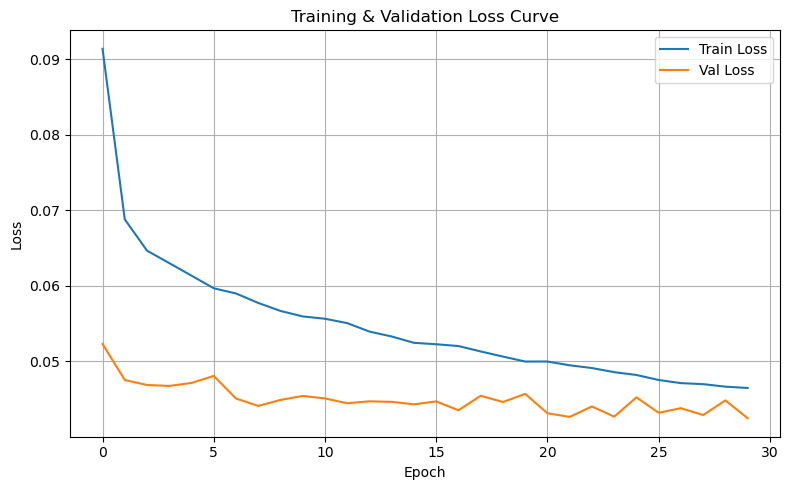

In [2]:
# === notebook.ipynb ===
from Emotalk_model_v0002 import EmoTalk
from train_hdft import HDTFDataset  # 👈 从这个文件导入数据集
from loss_v0003 import EmoTalkLoss
from torch.utils.data import DataLoader
import torch
import os
import csv
from tqdm import tqdm
from types import SimpleNamespace
import matplotlib.pyplot as plt

# === 配置 ===
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EPOCHS = 30
LR = 1e-4
SAVE_PATH = 'emotalk_finetuned_2_freezemorelayers.pth'
LOG_CSV = 'training_log_2.csv'
BATCH_SIZE = 1

args = SimpleNamespace(
    feature_dim=1024, bs_dim=52, device=DEVICE, batch_size=BATCH_SIZE,
    max_seq_len=512, period=20, emotion_dim=256, emo_gru_hidden=128,
    emo_gru_layers=2, transformer_layers=4, transformer_heads=8,
    transformer_dim=512, num_emotions=8, num_person=25
)

# === 数据加载 ===
train_dataset = HDTFDataset('./data/HDTF/train')
val_dataset = HDTFDataset('./data/HDTF/val')
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# === 初始化模型 ===
model = EmoTalk(args).to(DEVICE)

if os.path.exists("./pretrain_model/emotalk_finetuned.pth"):
    state_dict = torch.load("./pretrain_model/emotalk_finetuned.pth", map_location=DEVICE)
    model.load_state_dict(state_dict, strict=False)
    print("✅ Loaded pretrained RAVDESS weights")
    
# === 1. 先把所有参数都冻结 ===
for name, param in model.named_parameters():
    param.requires_grad = False

# === 2. 只解冻高层模块：Transformer Decoder、FiLM、Level/Person Embedding 和 最后 Linear 映射 ===
to_unfreeze = [
    'decoder',           # TransformerDecoder 及其子层
    'film_gamma',        # FiLM gamma
    'film_beta',         # FiLM beta
    'obj_vector_level',  # 情绪 one-hot→embed
    'obj_vector_person', # 说话人 embedding
    'linear'             # 最后映射到 52 维 blendshape
]

for name, param in model.named_parameters():
    if any(key in name for key in to_unfreeze):
        param.requires_grad = True
        print(f"🛠️ Unfrozen: {name}")

model = model.to(DEVICE)

# === 3. 重建优化器，只给可训练参数开小 LR ===
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5  # 小学习率，避免大幅改动底层能力
)
# === 损失函数 ===
loss_fn = EmoTalkLoss(region_weighted=True, mouth_only=True)

# === 初始化 CSV 日志 ===
with open(LOG_CSV, mode='w', newline='') as log_file:
    log_writer = csv.writer(log_file)
    log_writer.writerow(['Epoch', 'Train_Loss', 'Main_Loss', 'Smooth_Loss', 'Vel_Loss', 'Val_Loss'])

train_loss_list, val_loss_list = [], []

# === 训练循环 ===
for epoch in range(EPOCHS):
    model.train()
    total_loss = 0.0
    logs_accum = {"main": 0, "smooth": 0, "vel": 0, "total": 0}

    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        blendshape = batch["blendshape"].to(DEVICE)
        args.target_len = blendshape.size(1)
        pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])

        loss, logs = loss_fn(pred, blendshape)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        for k in logs:
            logs_accum[k] += logs[k]

    avg_loss = total_loss / len(train_loader)
    train_loss_list.append(avg_loss)

    # === 验证 ===
    model.eval()
    with torch.no_grad():
        val_loss = 0.0
        for batch in val_loader:
            blendshape = batch["blendshape"].to(DEVICE)
            args.target_len = blendshape.size(1)
            pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])
            loss, _ = loss_fn(pred, blendshape)
            val_loss += loss.item()
        val_avg = val_loss / len(val_loader)
        val_loss_list.append(val_avg)

    # === 日志写入 ===
    with open(LOG_CSV, mode='a', newline='') as log_file:
        log_writer = csv.writer(log_file)
        log_writer.writerow([
            epoch + 1, round(avg_loss, 6), round(logs_accum['main'], 6),
            round(logs_accum['smooth'], 6), round(logs_accum['vel'], 6), round(val_avg, 6)
        ])

    # === 保存模型 ===
    torch.save(model.state_dict(), SAVE_PATH)

# === 绘制损失曲线 ===
plt.figure(figsize=(8,5))
plt.plot(train_loss_list, label='Train Loss')
plt.plot(val_loss_list, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('loss_curve.png')
plt.show()


In [3]:
print(f'train loss:{train_loss_list},val loss{val_loss_list}')

train loss:[0.09139445892997555, 0.06880353727228158, 0.06465631608779614, 0.06300528529849085, 0.061344385433655516, 0.059673558243296364, 0.05898501135252573, 0.05772937042313022, 0.05667296515686528, 0.05594405440704806, 0.055636431474785704, 0.05505752024221253, 0.053936500675403155, 0.05328781504210059, 0.052446366867402214, 0.0522592423314398, 0.052021632687403604, 0.051304741625810835, 0.05062726379691304, 0.049966789104721764, 0.049970396331973845, 0.049471408154789384, 0.049108520645153274, 0.04856257435012531, 0.048188335776745854, 0.04752474528301012, 0.04710956274733677, 0.04697293389614646, 0.04664151373130458, 0.046462842400049],val loss[0.05228743681477176, 0.04752070674051841, 0.04686196821017398, 0.046738143285943404, 0.04713332083904081, 0.048066044950650796, 0.04506686847243044, 0.04408924747258425, 0.04488669097837475, 0.045411798275179334, 0.04507954677359925, 0.04444401773313681, 0.04469906073063612, 0.044627278629276484, 0.04430159393491016, 0.04468834731313917, 

## freeze film + embedding

/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english were not used when initializing Wav2Vec2Model: ['lm_head.weight', 'lm_head.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model fr

❄️ 冻结: film_gamma.weight
❄️ 冻结: film_gamma.bias
❄️ 冻结: film_beta.weight
❄️ 冻结: film_beta.bias
❄️ 冻结: obj_vector_level.weight
❄️ 冻结: obj_vector_level.bias
❄️ 冻结: obj_vector_person.weight


Epoch 1:   0%|                                                                                                            | 0/172 [00:00<?, ?it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:   1%|█▏                                                                                                  | 2/172 [00:00<01:13,  2.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:   2%|██▎                                                                                                 | 4/172 [00:01<00:37,  4.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:   3%|███▍                                                                                                | 6/172 [00:01<00:27,  6.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:   5%|████▋                                                                                               | 8/172 [00:01<00:22,  7.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:   6%|█████▊                                                                                             | 10/172 [00:01<00:21,  7.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:   7%|██████▉                                                                                            | 12/172 [00:02<00:19,  8.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:   8%|████████                                                                                           | 14/172 [00:02<00:19,  8.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:   9%|█████████▏                                                                                         | 16/172 [00:02<00:19,  8.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  10%|██████████▎                                                                                        | 18/172 [00:02<00:18,  8.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  12%|███████████▌                                                                                       | 20/172 [00:03<00:18,  8.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  13%|████████████▋                                                                                      | 22/172 [00:03<00:17,  8.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  14%|█████████████▊                                                                                     | 24/172 [00:03<00:17,  8.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  15%|██████████████▉                                                                                    | 26/172 [00:03<00:17,  8.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  16%|████████████████                                                                                   | 28/172 [00:04<00:16,  8.52it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  17%|█████████████████▎                                                                                 | 30/172 [00:04<00:17,  8.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  19%|██████████████████▍                                                                                | 32/172 [00:04<00:16,  8.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  20%|███████████████████▌                                                                               | 34/172 [00:04<00:16,  8.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  21%|████████████████████▋                                                                              | 36/172 [00:05<00:16,  8.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  22%|█████████████████████▊                                                                             | 38/172 [00:05<00:16,  8.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  23%|███████████████████████                                                                            | 40/172 [00:05<00:15,  8.34it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  24%|████████████████████████▏                                                                          | 42/172 [00:05<00:15,  8.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  26%|█████████████████████████▎                                                                         | 44/172 [00:06<00:14,  8.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  27%|██████████████████████████▍                                                                        | 46/172 [00:06<00:15,  8.17it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  28%|███████████████████████████▋                                                                       | 48/172 [00:06<00:15,  8.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  29%|████████████████████████████▊                                                                      | 50/172 [00:06<00:14,  8.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  30%|█████████████████████████████▉                                                                     | 52/172 [00:06<00:13,  8.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  31%|███████████████████████████████                                                                    | 54/172 [00:07<00:13,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  33%|████████████████████████████████▏                                                                  | 56/172 [00:07<00:13,  8.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  34%|█████████████████████████████████▍                                                                 | 58/172 [00:07<00:13,  8.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  35%|██████████████████████████████████▌                                                                | 60/172 [00:07<00:13,  8.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  36%|███████████████████████████████████▋                                                               | 62/172 [00:08<00:12,  8.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  37%|████████████████████████████████████▊                                                              | 64/172 [00:08<00:12,  8.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  38%|█████████████████████████████████████▉                                                             | 66/172 [00:08<00:12,  8.30it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  40%|███████████████████████████████████████▏                                                           | 68/172 [00:08<00:12,  8.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  41%|████████████████████████████████████████▎                                                          | 70/172 [00:09<00:11,  8.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  42%|█████████████████████████████████████████▍                                                         | 72/172 [00:09<00:11,  8.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  43%|██████████████████████████████████████████▌                                                        | 74/172 [00:09<00:11,  8.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  44%|███████████████████████████████████████████▋                                                       | 76/172 [00:09<00:11,  8.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  45%|████████████████████████████████████████████▉                                                      | 78/172 [00:10<00:11,  8.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  47%|██████████████████████████████████████████████                                                     | 80/172 [00:10<00:10,  8.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  48%|███████████████████████████████████████████████▏                                                   | 82/172 [00:10<00:10,  8.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  49%|████████████████████████████████████████████████▎                                                  | 84/172 [00:10<00:10,  8.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  50%|█████████████████████████████████████████████████▌                                                 | 86/172 [00:10<00:09,  8.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  51%|██████████████████████████████████████████████████▋                                                | 88/172 [00:11<00:09,  8.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  52%|███████████████████████████████████████████████████▊                                               | 90/172 [00:11<00:09,  8.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  53%|████████████████████████████████████████████████████▉                                              | 92/172 [00:11<00:09,  8.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  55%|██████████████████████████████████████████████████████                                             | 94/172 [00:11<00:09,  8.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  56%|███████████████████████████████████████████████████████▎                                           | 96/172 [00:12<00:09,  8.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  57%|████████████████████████████████████████████████████████▍                                          | 98/172 [00:12<00:08,  8.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  58%|████████████████████████████████████████████████████████▉                                         | 100/172 [00:12<00:08,  8.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  59%|██████████████████████████████████████████████████████████                                        | 102/172 [00:12<00:08,  8.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  60%|███████████████████████████████████████████████████████████▎                                      | 104/172 [00:13<00:07,  8.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  62%|████████████████████████████████████████████████████████████▍                                     | 106/172 [00:13<00:07,  8.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  63%|█████████████████████████████████████████████████████████████▌                                    | 108/172 [00:13<00:07,  8.40it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  64%|██████████████████████████████████████████████████████████████▋                                   | 110/172 [00:13<00:07,  8.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  65%|███████████████████████████████████████████████████████████████▊                                  | 112/172 [00:14<00:07,  8.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  66%|████████████████████████████████████████████████████████████████▉                                 | 114/172 [00:14<00:06,  8.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  67%|██████████████████████████████████████████████████████████████████                                | 116/172 [00:14<00:06,  8.51it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  69%|███████████████████████████████████████████████████████████████████▏                              | 118/172 [00:14<00:06,  8.37it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  70%|████████████████████████████████████████████████████████████████████▎                             | 120/172 [00:14<00:06,  8.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  71%|█████████████████████████████████████████████████████████████████████▌                            | 122/172 [00:15<00:06,  7.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  72%|██████████████████████████████████████████████████████████████████████▋                           | 124/172 [00:15<00:06,  7.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  73%|███████████████████████████████████████████████████████████████████████▊                          | 126/172 [00:15<00:05,  8.26it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  74%|████████████████████████████████████████████████████████████████████████▉                         | 128/172 [00:15<00:05,  8.39it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  76%|██████████████████████████████████████████████████████████████████████████                        | 130/172 [00:16<00:04,  8.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  77%|███████████████████████████████████████████████████████████████████████████▏                      | 132/172 [00:16<00:04,  8.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  78%|████████████████████████████████████████████████████████████████████████████▎                     | 134/172 [00:16<00:04,  8.36it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  79%|█████████████████████████████████████████████████████████████████████████████▍                    | 136/172 [00:16<00:04,  8.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  80%|██████████████████████████████████████████████████████████████████████████████▋                   | 138/172 [00:17<00:03,  8.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  81%|███████████████████████████████████████████████████████████████████████████████▊                  | 140/172 [00:17<00:03,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  83%|████████████████████████████████████████████████████████████████████████████████▉                 | 142/172 [00:17<00:03,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  84%|██████████████████████████████████████████████████████████████████████████████████                | 144/172 [00:17<00:03,  8.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  85%|███████████████████████████████████████████████████████████████████████████████████▏              | 146/172 [00:18<00:02,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  86%|████████████████████████████████████████████████████████████████████████████████████▎             | 148/172 [00:18<00:02,  8.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  87%|█████████████████████████████████████████████████████████████████████████████████████▍            | 150/172 [00:18<00:02,  8.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  88%|██████████████████████████████████████████████████████████████████████████████████████▌           | 152/172 [00:18<00:02,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  90%|███████████████████████████████████████████████████████████████████████████████████████▋          | 154/172 [00:18<00:02,  8.47it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  91%|████████████████████████████████████████████████████████████████████████████████████████▉         | 156/172 [00:19<00:01,  8.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  92%|██████████████████████████████████████████████████████████████████████████████████████████        | 158/172 [00:19<00:01,  8.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  93%|███████████████████████████████████████████████████████████████████████████████████████████▏      | 160/172 [00:19<00:01,  8.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  94%|████████████████████████████████████████████████████████████████████████████████████████████▎     | 162/172 [00:19<00:01,  8.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  95%|█████████████████████████████████████████████████████████████████████████████████████████████▍    | 164/172 [00:20<00:00,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▌   | 166/172 [00:20<00:00,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▋  | 168/172 [00:20<00:00,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▊ | 170/172 [00:20<00:00,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 1: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:21<00:00,  8.18it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 2:   1%|▌                                                                                                   | 1/172 [00:00<00:19,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:   2%|█▋                                                                                                  | 3/172 [00:00<00:18,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:   3%|██▉                                                                                                 | 5/172 [00:00<00:19,  8.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:   4%|████                                                                                                | 7/172 [00:00<00:18,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:   5%|█████▏                                                                                              | 9/172 [00:01<00:18,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:   6%|██████▎                                                                                            | 11/172 [00:01<00:18,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:   8%|███████▍                                                                                           | 13/172 [00:01<00:18,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:   9%|████████▋                                                                                          | 15/172 [00:01<00:19,  8.25it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  10%|█████████▊                                                                                         | 17/172 [00:01<00:18,  8.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  11%|██████████▉                                                                                        | 19/172 [00:02<00:17,  8.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  12%|████████████                                                                                       | 21/172 [00:02<00:16,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  13%|█████████████▏                                                                                     | 23/172 [00:02<00:16,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  15%|██████████████▍                                                                                    | 25/172 [00:02<00:16,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  16%|███████████████▌                                                                                   | 27/172 [00:03<00:16,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  17%|████████████████▋                                                                                  | 29/172 [00:03<00:15,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  18%|█████████████████▊                                                                                 | 31/172 [00:03<00:15,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  19%|██████████████████▉                                                                                | 33/172 [00:03<00:16,  8.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  20%|████████████████████▏                                                                              | 35/172 [00:03<00:15,  8.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  22%|█████████████████████▎                                                                             | 37/172 [00:04<00:15,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  23%|██████████████████████▍                                                                            | 39/172 [00:04<00:14,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  24%|███████████████████████▌                                                                           | 41/172 [00:04<00:14,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  25%|████████████████████████▊                                                                          | 43/172 [00:04<00:14,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  26%|█████████████████████████▉                                                                         | 45/172 [00:05<00:14,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  27%|███████████████████████████                                                                        | 47/172 [00:05<00:14,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  28%|████████████████████████████▏                                                                      | 49/172 [00:05<00:13,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  30%|█████████████████████████████▎                                                                     | 51/172 [00:05<00:13,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  31%|██████████████████████████████▌                                                                    | 53/172 [00:05<00:13,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  32%|███████████████████████████████▋                                                                   | 55/172 [00:06<00:13,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  33%|████████████████████████████████▊                                                                  | 57/172 [00:06<00:13,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  34%|█████████████████████████████████▉                                                                 | 59/172 [00:06<00:12,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  35%|███████████████████████████████████                                                                | 61/172 [00:06<00:12,  8.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  37%|████████████████████████████████████▎                                                              | 63/172 [00:07<00:12,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  38%|█████████████████████████████████████▍                                                             | 65/172 [00:07<00:12,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  39%|██████████████████████████████████████▌                                                            | 67/172 [00:07<00:11,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  40%|███████████████████████████████████████▋                                                           | 69/172 [00:07<00:11,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  41%|████████████████████████████████████████▊                                                          | 71/172 [00:08<00:11,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  42%|██████████████████████████████████████████                                                         | 73/172 [00:08<00:11,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  44%|███████████████████████████████████████████▏                                                       | 75/172 [00:08<00:11,  8.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  45%|████████████████████████████████████████████▎                                                      | 77/172 [00:08<00:10,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  46%|█████████████████████████████████████████████▍                                                     | 79/172 [00:08<00:10,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  47%|██████████████████████████████████████████████▌                                                    | 81/172 [00:09<00:10,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  48%|███████████████████████████████████████████████▊                                                   | 83/172 [00:09<00:09,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  49%|████████████████████████████████████████████████▉                                                  | 85/172 [00:09<00:09,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  51%|██████████████████████████████████████████████████                                                 | 87/172 [00:09<00:09,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  52%|███████████████████████████████████████████████████▏                                               | 89/172 [00:10<00:09,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  53%|████████████████████████████████████████████████████▍                                              | 91/172 [00:10<00:08,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  54%|█████████████████████████████████████████████████████▌                                             | 93/172 [00:10<00:08,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  55%|██████████████████████████████████████████████████████▋                                            | 95/172 [00:10<00:08,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  56%|███████████████████████████████████████████████████████▊                                           | 97/172 [00:10<00:08,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  58%|████████████████████████████████████████████████████████▉                                          | 99/172 [00:11<00:08,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  59%|█████████████████████████████████████████████████████████▌                                        | 101/172 [00:11<00:07,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  60%|██████████████████████████████████████████████████████████▋                                       | 103/172 [00:11<00:07,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  61%|███████████████████████████████████████████████████████████▊                                      | 105/172 [00:11<00:07,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  62%|████████████████████████████████████████████████████████████▉                                     | 107/172 [00:12<00:07,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  63%|██████████████████████████████████████████████████████████████                                    | 109/172 [00:12<00:07,  8.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  65%|███████████████████████████████████████████████████████████████▏                                  | 111/172 [00:12<00:06,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  66%|████████████████████████████████████████████████████████████████▍                                 | 113/172 [00:12<00:06,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  67%|█████████████████████████████████████████████████████████████████▌                                | 115/172 [00:12<00:06,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  68%|██████████████████████████████████████████████████████████████████▋                               | 117/172 [00:13<00:06,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  69%|███████████████████████████████████████████████████████████████████▊                              | 119/172 [00:13<00:05,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  70%|████████████████████████████████████████████████████████████████████▉                             | 121/172 [00:13<00:05,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  72%|██████████████████████████████████████████████████████████████████████                            | 123/172 [00:13<00:05,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  73%|███████████████████████████████████████████████████████████████████████▏                          | 125/172 [00:14<00:05,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  74%|████████████████████████████████████████████████████████████████████████▎                         | 127/172 [00:14<00:05,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  75%|█████████████████████████████████████████████████████████████████████████▌                        | 129/172 [00:14<00:05,  8.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  76%|██████████████████████████████████████████████████████████████████████████▋                       | 131/172 [00:14<00:04,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  77%|███████████████████████████████████████████████████████████████████████████▊                      | 133/172 [00:14<00:04,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  78%|████████████████████████████████████████████████████████████████████████████▉                     | 135/172 [00:15<00:04,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  80%|██████████████████████████████████████████████████████████████████████████████                    | 137/172 [00:15<00:03,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  81%|███████████████████████████████████████████████████████████████████████████████▏                  | 139/172 [00:15<00:03,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  82%|████████████████████████████████████████████████████████████████████████████████▎                 | 141/172 [00:15<00:03,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  83%|█████████████████████████████████████████████████████████████████████████████████▍                | 143/172 [00:16<00:03,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  84%|██████████████████████████████████████████████████████████████████████████████████▌               | 145/172 [00:16<00:03,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  85%|███████████████████████████████████████████████████████████████████████████████████▊              | 147/172 [00:16<00:02,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  87%|████████████████████████████████████████████████████████████████████████████████████▉             | 149/172 [00:16<00:02,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  88%|██████████████████████████████████████████████████████████████████████████████████████            | 151/172 [00:17<00:02,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  89%|███████████████████████████████████████████████████████████████████████████████████████▏          | 153/172 [00:17<00:02,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  90%|████████████████████████████████████████████████████████████████████████████████████████▎         | 155/172 [00:17<00:01,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  91%|█████████████████████████████████████████████████████████████████████████████████████████▍        | 157/172 [00:17<00:01,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  92%|██████████████████████████████████████████████████████████████████████████████████████████▌       | 159/172 [00:17<00:01,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  94%|███████████████████████████████████████████████████████████████████████████████████████████▋      | 161/172 [00:18<00:01,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  95%|████████████████████████████████████████████████████████████████████████████████████████████▊     | 163/172 [00:18<00:01,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  96%|██████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  97%|███████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  98%|████████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:19<00:00,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 2: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.88it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 3:   1%|▌                                                                                                   | 1/172 [00:00<00:20,  8.16it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:   2%|█▋                                                                                                  | 3/172 [00:00<00:19,  8.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:   3%|██▉                                                                                                 | 5/172 [00:00<00:19,  8.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:   4%|████                                                                                                | 7/172 [00:00<00:18,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:   5%|█████▏                                                                                              | 9/172 [00:01<00:18,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:   6%|██████▎                                                                                            | 11/172 [00:01<00:18,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:   8%|███████▍                                                                                           | 13/172 [00:01<00:17,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:   9%|████████▋                                                                                          | 15/172 [00:01<00:17,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  10%|█████████▊                                                                                         | 17/172 [00:01<00:17,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  11%|██████████▉                                                                                        | 19/172 [00:02<00:17,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  12%|████████████                                                                                       | 21/172 [00:02<00:17,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  13%|█████████████▏                                                                                     | 23/172 [00:02<00:16,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  15%|██████████████▍                                                                                    | 25/172 [00:02<00:16,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  16%|███████████████▌                                                                                   | 27/172 [00:03<00:16,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  17%|████████████████▋                                                                                  | 29/172 [00:03<00:16,  8.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  18%|█████████████████▊                                                                                 | 31/172 [00:03<00:15,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  19%|██████████████████▍                                                                                | 32/172 [00:04<00:34,  4.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  20%|███████████████████▌                                                                               | 34/172 [00:04<00:24,  5.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  21%|████████████████████▋                                                                              | 36/172 [00:04<00:19,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  22%|█████████████████████▊                                                                             | 38/172 [00:04<00:17,  7.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  23%|███████████████████████                                                                            | 40/172 [00:04<00:15,  8.32it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  24%|████████████████████████▏                                                                          | 42/172 [00:05<00:14,  8.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  26%|█████████████████████████▎                                                                         | 44/172 [00:05<00:14,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  27%|██████████████████████████▍                                                                        | 46/172 [00:05<00:14,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  28%|███████████████████████████▋                                                                       | 48/172 [00:05<00:13,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  29%|████████████████████████████▊                                                                      | 50/172 [00:06<00:13,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  30%|█████████████████████████████▉                                                                     | 52/172 [00:06<00:13,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  31%|███████████████████████████████                                                                    | 54/172 [00:06<00:13,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  33%|████████████████████████████████▏                                                                  | 56/172 [00:06<00:12,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  34%|█████████████████████████████████▍                                                                 | 58/172 [00:06<00:12,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  35%|██████████████████████████████████▌                                                                | 60/172 [00:07<00:12,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  36%|███████████████████████████████████▋                                                               | 62/172 [00:07<00:12,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  37%|████████████████████████████████████▊                                                              | 64/172 [00:07<00:12,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  38%|█████████████████████████████████████▉                                                             | 66/172 [00:07<00:11,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  40%|███████████████████████████████████████▏                                                           | 68/172 [00:08<00:11,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  41%|████████████████████████████████████████▎                                                          | 70/172 [00:08<00:11,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  42%|█████████████████████████████████████████▍                                                         | 72/172 [00:08<00:10,  9.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  43%|██████████████████████████████████████████▌                                                        | 74/172 [00:08<00:10,  9.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  44%|███████████████████████████████████████████▋                                                       | 76/172 [00:08<00:10,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  45%|████████████████████████████████████████████▉                                                      | 78/172 [00:09<00:10,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  47%|██████████████████████████████████████████████                                                     | 80/172 [00:09<00:10,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  48%|███████████████████████████████████████████████▏                                                   | 82/172 [00:09<00:10,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  49%|████████████████████████████████████████████████▎                                                  | 84/172 [00:09<00:09,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  50%|█████████████████████████████████████████████████▌                                                 | 86/172 [00:10<00:09,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  51%|██████████████████████████████████████████████████▋                                                | 88/172 [00:10<00:09,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  52%|███████████████████████████████████████████████████▊                                               | 90/172 [00:10<00:09,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  53%|████████████████████████████████████████████████████▉                                              | 92/172 [00:10<00:08,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  55%|██████████████████████████████████████████████████████                                             | 94/172 [00:10<00:08,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  56%|███████████████████████████████████████████████████████▎                                           | 96/172 [00:11<00:08,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  57%|████████████████████████████████████████████████████████▍                                          | 98/172 [00:11<00:08,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  58%|████████████████████████████████████████████████████████▉                                         | 100/172 [00:11<00:08,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  59%|██████████████████████████████████████████████████████████                                        | 102/172 [00:11<00:07,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  60%|███████████████████████████████████████████████████████████▎                                      | 104/172 [00:12<00:07,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  62%|████████████████████████████████████████████████████████████▍                                     | 106/172 [00:12<00:07,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  63%|█████████████████████████████████████████████████████████████▌                                    | 108/172 [00:12<00:07,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  64%|██████████████████████████████████████████████████████████████▋                                   | 110/172 [00:12<00:06,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  65%|███████████████████████████████████████████████████████████████▊                                  | 112/172 [00:12<00:06,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  66%|████████████████████████████████████████████████████████████████▉                                 | 114/172 [00:13<00:06,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  67%|██████████████████████████████████████████████████████████████████                                | 116/172 [00:13<00:06,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  69%|███████████████████████████████████████████████████████████████████▏                              | 118/172 [00:13<00:06,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  70%|████████████████████████████████████████████████████████████████████▎                             | 120/172 [00:13<00:05,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  71%|█████████████████████████████████████████████████████████████████████▌                            | 122/172 [00:14<00:05,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  72%|██████████████████████████████████████████████████████████████████████▋                           | 124/172 [00:14<00:05,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  73%|███████████████████████████████████████████████████████████████████████▊                          | 126/172 [00:14<00:05,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  74%|████████████████████████████████████████████████████████████████████████▉                         | 128/172 [00:14<00:04,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  76%|██████████████████████████████████████████████████████████████████████████                        | 130/172 [00:14<00:04,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  77%|███████████████████████████████████████████████████████████████████████████▏                      | 132/172 [00:15<00:04,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  78%|████████████████████████████████████████████████████████████████████████████▎                     | 134/172 [00:15<00:04,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  79%|█████████████████████████████████████████████████████████████████████████████▍                    | 136/172 [00:15<00:04,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  80%|██████████████████████████████████████████████████████████████████████████████▋                   | 138/172 [00:15<00:03,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  81%|███████████████████████████████████████████████████████████████████████████████▊                  | 140/172 [00:16<00:03,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  83%|████████████████████████████████████████████████████████████████████████████████▉                 | 142/172 [00:16<00:03,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  84%|██████████████████████████████████████████████████████████████████████████████████                | 144/172 [00:16<00:03,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  85%|███████████████████████████████████████████████████████████████████████████████████▏              | 146/172 [00:16<00:02,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  86%|████████████████████████████████████████████████████████████████████████████████████▎             | 148/172 [00:17<00:02,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  87%|█████████████████████████████████████████████████████████████████████████████████████▍            | 150/172 [00:17<00:02,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  88%|██████████████████████████████████████████████████████████████████████████████████████▌           | 152/172 [00:17<00:02,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  90%|███████████████████████████████████████████████████████████████████████████████████████▋          | 154/172 [00:17<00:02,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  91%|████████████████████████████████████████████████████████████████████████████████████████▉         | 156/172 [00:17<00:01,  8.22it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  92%|██████████████████████████████████████████████████████████████████████████████████████████        | 158/172 [00:18<00:01,  8.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  93%|███████████████████████████████████████████████████████████████████████████████████████████▏      | 160/172 [00:18<00:01,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  94%|████████████████████████████████████████████████████████████████████████████████████████████▎     | 162/172 [00:18<00:01,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  95%|█████████████████████████████████████████████████████████████████████████████████████████████▍    | 164/172 [00:18<00:00,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▌   | 166/172 [00:19<00:00,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▋  | 168/172 [00:19<00:00,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▊ | 170/172 [00:19<00:00,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 3: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.72it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 4:   1%|▌                                                                                                   | 1/172 [00:00<00:20,  8.42it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:   2%|█▋                                                                                                  | 3/172 [00:00<00:19,  8.46it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:   3%|██▉                                                                                                 | 5/172 [00:00<00:19,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:   4%|████                                                                                                | 7/172 [00:00<00:18,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:   5%|█████▏                                                                                              | 9/172 [00:01<00:18,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:   6%|██████▎                                                                                            | 11/172 [00:01<00:18,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:   8%|███████▍                                                                                           | 13/172 [00:01<00:18,  8.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:   9%|████████▋                                                                                          | 15/172 [00:01<00:17,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  10%|█████████▊                                                                                         | 17/172 [00:01<00:17,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  11%|██████████▉                                                                                        | 19/172 [00:02<00:17,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  12%|████████████                                                                                       | 21/172 [00:02<00:16,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  13%|█████████████▏                                                                                     | 23/172 [00:02<00:16,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  15%|██████████████▍                                                                                    | 25/172 [00:02<00:16,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  16%|███████████████▌                                                                                   | 27/172 [00:03<00:16,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  17%|████████████████▋                                                                                  | 29/172 [00:03<00:15,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  18%|█████████████████▊                                                                                 | 31/172 [00:03<00:15,  9.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  19%|██████████████████▉                                                                                | 33/172 [00:03<00:15,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  20%|████████████████████▏                                                                              | 35/172 [00:03<00:15,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  22%|█████████████████████▎                                                                             | 37/172 [00:04<00:15,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  23%|██████████████████████▍                                                                            | 39/172 [00:04<00:14,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  24%|███████████████████████▌                                                                           | 41/172 [00:04<00:14,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  25%|████████████████████████▊                                                                          | 43/172 [00:04<00:14,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  26%|█████████████████████████▉                                                                         | 45/172 [00:05<00:14,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  27%|███████████████████████████                                                                        | 47/172 [00:05<00:13,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  28%|████████████████████████████▏                                                                      | 49/172 [00:05<00:13,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  30%|█████████████████████████████▎                                                                     | 51/172 [00:05<00:13,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  31%|██████████████████████████████▌                                                                    | 53/172 [00:05<00:13,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  32%|███████████████████████████████▋                                                                   | 55/172 [00:06<00:13,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  33%|████████████████████████████████▊                                                                  | 57/172 [00:06<00:12,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  34%|█████████████████████████████████▉                                                                 | 59/172 [00:06<00:12,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  35%|███████████████████████████████████                                                                | 61/172 [00:06<00:12,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  37%|████████████████████████████████████▎                                                              | 63/172 [00:07<00:12,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  38%|█████████████████████████████████████▍                                                             | 65/172 [00:07<00:12,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  39%|██████████████████████████████████████▌                                                            | 67/172 [00:07<00:11,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  40%|███████████████████████████████████████▋                                                           | 69/172 [00:07<00:11,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  41%|████████████████████████████████████████▊                                                          | 71/172 [00:07<00:11,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  42%|██████████████████████████████████████████                                                         | 73/172 [00:08<00:11,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  44%|███████████████████████████████████████████▏                                                       | 75/172 [00:08<00:10,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  45%|████████████████████████████████████████████▎                                                      | 77/172 [00:08<00:10,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  46%|█████████████████████████████████████████████▍                                                     | 79/172 [00:08<00:10,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  47%|██████████████████████████████████████████████▌                                                    | 81/172 [00:09<00:10,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  48%|███████████████████████████████████████████████▊                                                   | 83/172 [00:09<00:09,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  49%|████████████████████████████████████████████████▉                                                  | 85/172 [00:09<00:09,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  51%|██████████████████████████████████████████████████                                                 | 87/172 [00:09<00:09,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  52%|███████████████████████████████████████████████████▏                                               | 89/172 [00:09<00:09,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  53%|████████████████████████████████████████████████████▍                                              | 91/172 [00:10<00:09,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  54%|█████████████████████████████████████████████████████▌                                             | 93/172 [00:10<00:08,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  55%|██████████████████████████████████████████████████████▋                                            | 95/172 [00:10<00:08,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  56%|███████████████████████████████████████████████████████▊                                           | 97/172 [00:10<00:08,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  58%|████████████████████████████████████████████████████████▉                                          | 99/172 [00:11<00:08,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  59%|█████████████████████████████████████████████████████████▌                                        | 101/172 [00:11<00:07,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  60%|██████████████████████████████████████████████████████████▋                                       | 103/172 [00:11<00:07,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  61%|███████████████████████████████████████████████████████████▊                                      | 105/172 [00:11<00:07,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  62%|████████████████████████████████████████████████████████████▉                                     | 107/172 [00:11<00:07,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  63%|██████████████████████████████████████████████████████████████                                    | 109/172 [00:12<00:07,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  65%|███████████████████████████████████████████████████████████████▏                                  | 111/172 [00:12<00:06,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  66%|████████████████████████████████████████████████████████████████▍                                 | 113/172 [00:12<00:06,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  67%|█████████████████████████████████████████████████████████████████▌                                | 115/172 [00:12<00:06,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  68%|██████████████████████████████████████████████████████████████████▋                               | 117/172 [00:13<00:06,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  69%|███████████████████████████████████████████████████████████████████▊                              | 119/172 [00:13<00:06,  8.23it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  70%|████████████████████████████████████████████████████████████████████▉                             | 121/172 [00:13<00:05,  8.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  72%|██████████████████████████████████████████████████████████████████████                            | 123/172 [00:13<00:05,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  73%|███████████████████████████████████████████████████████████████████████▏                          | 125/172 [00:14<00:05,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  74%|████████████████████████████████████████████████████████████████████████▎                         | 127/172 [00:14<00:05,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  75%|█████████████████████████████████████████████████████████████████████████▌                        | 129/172 [00:14<00:04,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  76%|██████████████████████████████████████████████████████████████████████████▋                       | 131/172 [00:14<00:04,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  77%|███████████████████████████████████████████████████████████████████████████▊                      | 133/172 [00:14<00:04,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  78%|████████████████████████████████████████████████████████████████████████████▉                     | 135/172 [00:15<00:04,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  80%|██████████████████████████████████████████████████████████████████████████████                    | 137/172 [00:15<00:03,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  81%|███████████████████████████████████████████████████████████████████████████████▏                  | 139/172 [00:15<00:03,  9.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  82%|████████████████████████████████████████████████████████████████████████████████▎                 | 141/172 [00:15<00:03,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  83%|█████████████████████████████████████████████████████████████████████████████████▍                | 143/172 [00:16<00:03,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  84%|██████████████████████████████████████████████████████████████████████████████████▌               | 145/172 [00:16<00:03,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  85%|███████████████████████████████████████████████████████████████████████████████████▊              | 147/172 [00:16<00:02,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  87%|████████████████████████████████████████████████████████████████████████████████████▉             | 149/172 [00:16<00:02,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  88%|██████████████████████████████████████████████████████████████████████████████████████            | 151/172 [00:16<00:02,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  89%|███████████████████████████████████████████████████████████████████████████████████████▏          | 153/172 [00:17<00:02,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  90%|████████████████████████████████████████████████████████████████████████████████████████▎         | 155/172 [00:17<00:01,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  91%|█████████████████████████████████████████████████████████████████████████████████████████▍        | 157/172 [00:17<00:01,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  92%|██████████████████████████████████████████████████████████████████████████████████████████▌       | 159/172 [00:17<00:01,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  94%|███████████████████████████████████████████████████████████████████████████████████████████▋      | 161/172 [00:18<00:01,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  95%|████████████████████████████████████████████████████████████████████████████████████████████▊     | 163/172 [00:18<00:00,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  96%|██████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  97%|███████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  98%|████████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 4: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.93it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 5:   1%|▌                                                                                                   | 1/172 [00:00<00:20,  8.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:   2%|█▋                                                                                                  | 3/172 [00:00<00:19,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:   3%|██▉                                                                                                 | 5/172 [00:00<00:18,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:   4%|████                                                                                                | 7/172 [00:00<00:18,  8.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:   5%|█████▏                                                                                              | 9/172 [00:01<00:18,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:   6%|██████▎                                                                                            | 11/172 [00:01<00:17,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:   8%|███████▍                                                                                           | 13/172 [00:01<00:17,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:   9%|████████▋                                                                                          | 15/172 [00:01<00:17,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  10%|█████████▊                                                                                         | 17/172 [00:01<00:17,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  11%|██████████▉                                                                                        | 19/172 [00:02<00:16,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  12%|████████████                                                                                       | 21/172 [00:02<00:17,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  13%|█████████████▏                                                                                     | 23/172 [00:02<00:16,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  15%|██████████████▍                                                                                    | 25/172 [00:02<00:16,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  16%|███████████████▌                                                                                   | 27/172 [00:03<00:16,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  17%|████████████████▋                                                                                  | 29/172 [00:03<00:16,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  18%|█████████████████▊                                                                                 | 31/172 [00:03<00:15,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  19%|██████████████████▉                                                                                | 33/172 [00:03<00:15,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  20%|████████████████████▏                                                                              | 35/172 [00:03<00:15,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  22%|█████████████████████▎                                                                             | 37/172 [00:04<00:15,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  23%|██████████████████████▍                                                                            | 39/172 [00:04<00:14,  9.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  24%|███████████████████████▌                                                                           | 41/172 [00:04<00:14,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  25%|████████████████████████▊                                                                          | 43/172 [00:04<00:14,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  26%|█████████████████████████▉                                                                         | 45/172 [00:05<00:14,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  27%|███████████████████████████                                                                        | 47/172 [00:05<00:14,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  28%|████████████████████████████▏                                                                      | 49/172 [00:05<00:13,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  30%|█████████████████████████████▎                                                                     | 51/172 [00:05<00:13,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  31%|██████████████████████████████▌                                                                    | 53/172 [00:05<00:13,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  32%|███████████████████████████████▋                                                                   | 55/172 [00:06<00:13,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  33%|████████████████████████████████▊                                                                  | 57/172 [00:06<00:12,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  34%|█████████████████████████████████▉                                                                 | 59/172 [00:06<00:12,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  35%|███████████████████████████████████                                                                | 61/172 [00:06<00:12,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  37%|████████████████████████████████████▎                                                              | 63/172 [00:07<00:12,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  38%|█████████████████████████████████████▍                                                             | 65/172 [00:07<00:11,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  39%|██████████████████████████████████████▌                                                            | 67/172 [00:07<00:11,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  40%|███████████████████████████████████████▋                                                           | 69/172 [00:07<00:11,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  41%|████████████████████████████████████████▊                                                          | 71/172 [00:07<00:11,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  42%|██████████████████████████████████████████                                                         | 73/172 [00:08<00:11,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  44%|███████████████████████████████████████████▏                                                       | 75/172 [00:08<00:11,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  45%|████████████████████████████████████████████▎                                                      | 77/172 [00:08<00:10,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  46%|█████████████████████████████████████████████▍                                                     | 79/172 [00:08<00:10,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  47%|██████████████████████████████████████████████▌                                                    | 81/172 [00:09<00:10,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  48%|███████████████████████████████████████████████▊                                                   | 83/172 [00:09<00:10,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  49%|████████████████████████████████████████████████▉                                                  | 85/172 [00:09<00:09,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  51%|██████████████████████████████████████████████████                                                 | 87/172 [00:09<00:09,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  52%|███████████████████████████████████████████████████▏                                               | 89/172 [00:09<00:09,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  53%|████████████████████████████████████████████████████▍                                              | 91/172 [00:10<00:09,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  54%|█████████████████████████████████████████████████████▌                                             | 93/172 [00:10<00:08,  8.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  55%|██████████████████████████████████████████████████████▋                                            | 95/172 [00:10<00:08,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  56%|███████████████████████████████████████████████████████▊                                           | 97/172 [00:10<00:08,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  58%|████████████████████████████████████████████████████████▉                                          | 99/172 [00:11<00:08,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  59%|█████████████████████████████████████████████████████████▌                                        | 101/172 [00:11<00:07,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  60%|██████████████████████████████████████████████████████████▋                                       | 103/172 [00:11<00:07,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  61%|███████████████████████████████████████████████████████████▊                                      | 105/172 [00:11<00:07,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  62%|████████████████████████████████████████████████████████████▉                                     | 107/172 [00:11<00:07,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  63%|██████████████████████████████████████████████████████████████                                    | 109/172 [00:12<00:07,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  65%|███████████████████████████████████████████████████████████████▏                                  | 111/172 [00:12<00:06,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  66%|████████████████████████████████████████████████████████████████▍                                 | 113/172 [00:12<00:06,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  67%|█████████████████████████████████████████████████████████████████▌                                | 115/172 [00:12<00:06,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  68%|██████████████████████████████████████████████████████████████████▋                               | 117/172 [00:13<00:06,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  69%|███████████████████████████████████████████████████████████████████▊                              | 119/172 [00:13<00:05,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  70%|████████████████████████████████████████████████████████████████████▉                             | 121/172 [00:13<00:05,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  72%|██████████████████████████████████████████████████████████████████████                            | 123/172 [00:13<00:05,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  73%|███████████████████████████████████████████████████████████████████████▏                          | 125/172 [00:13<00:05,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  74%|████████████████████████████████████████████████████████████████████████▎                         | 127/172 [00:14<00:04,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  75%|█████████████████████████████████████████████████████████████████████████▌                        | 129/172 [00:14<00:04,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  76%|██████████████████████████████████████████████████████████████████████████▋                       | 131/172 [00:14<00:04,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  77%|███████████████████████████████████████████████████████████████████████████▊                      | 133/172 [00:14<00:04,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  78%|████████████████████████████████████████████████████████████████████████████▉                     | 135/172 [00:15<00:04,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  80%|██████████████████████████████████████████████████████████████████████████████                    | 137/172 [00:15<00:03,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  81%|███████████████████████████████████████████████████████████████████████████████▏                  | 139/172 [00:15<00:03,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  82%|████████████████████████████████████████████████████████████████████████████████▎                 | 141/172 [00:15<00:03,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  83%|█████████████████████████████████████████████████████████████████████████████████▍                | 143/172 [00:16<00:03,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  84%|██████████████████████████████████████████████████████████████████████████████████▌               | 145/172 [00:16<00:03,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  85%|███████████████████████████████████████████████████████████████████████████████████▊              | 147/172 [00:16<00:02,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  87%|████████████████████████████████████████████████████████████████████████████████████▉             | 149/172 [00:16<00:02,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  88%|██████████████████████████████████████████████████████████████████████████████████████            | 151/172 [00:16<00:02,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  89%|███████████████████████████████████████████████████████████████████████████████████████▏          | 153/172 [00:17<00:02,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  90%|████████████████████████████████████████████████████████████████████████████████████████▎         | 155/172 [00:17<00:01,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  91%|█████████████████████████████████████████████████████████████████████████████████████████▍        | 157/172 [00:17<00:01,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  92%|██████████████████████████████████████████████████████████████████████████████████████████▌       | 159/172 [00:17<00:01,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  94%|███████████████████████████████████████████████████████████████████████████████████████████▋      | 161/172 [00:18<00:01,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  95%|████████████████████████████████████████████████████████████████████████████████████████████▊     | 163/172 [00:18<00:01,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  96%|██████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  97%|███████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  98%|████████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 5: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.94it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 6:   1%|▌                                                                                                   | 1/172 [00:00<00:20,  8.33it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:   2%|█▋                                                                                                  | 3/172 [00:00<00:19,  8.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:   3%|██▉                                                                                                 | 5/172 [00:00<00:18,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:   4%|████                                                                                                | 7/172 [00:00<00:18,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:   5%|█████▏                                                                                              | 9/172 [00:01<00:18,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:   6%|██████▎                                                                                            | 11/172 [00:01<00:18,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:   8%|███████▍                                                                                           | 13/172 [00:01<00:17,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:   9%|████████▋                                                                                          | 15/172 [00:01<00:17,  9.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  10%|█████████▊                                                                                         | 17/172 [00:01<00:16,  9.20it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  11%|██████████▉                                                                                        | 19/172 [00:02<00:16,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  12%|████████████                                                                                       | 21/172 [00:02<00:16,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  13%|█████████████▏                                                                                     | 23/172 [00:02<00:16,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  15%|██████████████▍                                                                                    | 25/172 [00:02<00:16,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  16%|███████████████▌                                                                                   | 27/172 [00:03<00:16,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  17%|████████████████▋                                                                                  | 29/172 [00:03<00:16,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  18%|█████████████████▊                                                                                 | 31/172 [00:03<00:15,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  19%|██████████████████▉                                                                                | 33/172 [00:03<00:15,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  20%|████████████████████▏                                                                              | 35/172 [00:03<00:15,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  22%|█████████████████████▎                                                                             | 37/172 [00:04<00:15,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  23%|██████████████████████▍                                                                            | 39/172 [00:04<00:14,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  24%|███████████████████████▌                                                                           | 41/172 [00:04<00:14,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  25%|████████████████████████▊                                                                          | 43/172 [00:04<00:14,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  26%|█████████████████████████▉                                                                         | 45/172 [00:05<00:14,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  27%|███████████████████████████                                                                        | 47/172 [00:05<00:13,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  28%|████████████████████████████▏                                                                      | 49/172 [00:05<00:13,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  30%|█████████████████████████████▎                                                                     | 51/172 [00:05<00:13,  9.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  31%|██████████████████████████████▌                                                                    | 53/172 [00:05<00:13,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  32%|███████████████████████████████▋                                                                   | 55/172 [00:06<00:13,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  33%|████████████████████████████████▊                                                                  | 57/172 [00:06<00:12,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  34%|█████████████████████████████████▉                                                                 | 59/172 [00:06<00:12,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  35%|███████████████████████████████████                                                                | 61/172 [00:06<00:12,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  37%|████████████████████████████████████▎                                                              | 63/172 [00:07<00:12,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  38%|█████████████████████████████████████▍                                                             | 65/172 [00:07<00:11,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  39%|██████████████████████████████████████▌                                                            | 67/172 [00:07<00:11,  8.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  40%|███████████████████████████████████████▋                                                           | 69/172 [00:07<00:11,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  41%|████████████████████████████████████████▊                                                          | 71/172 [00:07<00:11,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  42%|██████████████████████████████████████████                                                         | 73/172 [00:08<00:11,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  44%|███████████████████████████████████████████▏                                                       | 75/172 [00:08<00:10,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  45%|████████████████████████████████████████████▎                                                      | 77/172 [00:08<00:10,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  46%|█████████████████████████████████████████████▍                                                     | 79/172 [00:08<00:10,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  47%|██████████████████████████████████████████████▌                                                    | 81/172 [00:09<00:10,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  48%|███████████████████████████████████████████████▊                                                   | 83/172 [00:09<00:09,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  49%|████████████████████████████████████████████████▉                                                  | 85/172 [00:09<00:09,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  51%|██████████████████████████████████████████████████                                                 | 87/172 [00:09<00:09,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  52%|███████████████████████████████████████████████████▏                                               | 89/172 [00:09<00:09,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  53%|████████████████████████████████████████████████████▍                                              | 91/172 [00:10<00:08,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  54%|█████████████████████████████████████████████████████▌                                             | 93/172 [00:10<00:08,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  55%|██████████████████████████████████████████████████████▋                                            | 95/172 [00:10<00:08,  9.12it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  56%|███████████████████████████████████████████████████████▊                                           | 97/172 [00:10<00:08,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  58%|████████████████████████████████████████████████████████▉                                          | 99/172 [00:11<00:08,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  59%|█████████████████████████████████████████████████████████▌                                        | 101/172 [00:11<00:07,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  60%|██████████████████████████████████████████████████████████▋                                       | 103/172 [00:11<00:07,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  61%|███████████████████████████████████████████████████████████▊                                      | 105/172 [00:11<00:07,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  62%|████████████████████████████████████████████████████████████▉                                     | 107/172 [00:11<00:07,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  63%|██████████████████████████████████████████████████████████████                                    | 109/172 [00:12<00:06,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  65%|███████████████████████████████████████████████████████████████▏                                  | 111/172 [00:12<00:06,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  66%|████████████████████████████████████████████████████████████████▍                                 | 113/172 [00:12<00:06,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  67%|█████████████████████████████████████████████████████████████████▌                                | 115/172 [00:12<00:06,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  68%|██████████████████████████████████████████████████████████████████▋                               | 117/172 [00:13<00:06,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  69%|███████████████████████████████████████████████████████████████████▊                              | 119/172 [00:13<00:05,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  70%|████████████████████████████████████████████████████████████████████▉                             | 121/172 [00:13<00:05,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  72%|██████████████████████████████████████████████████████████████████████                            | 123/172 [00:13<00:05,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  73%|███████████████████████████████████████████████████████████████████████▏                          | 125/172 [00:13<00:05,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  74%|████████████████████████████████████████████████████████████████████████▎                         | 127/172 [00:14<00:04,  9.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  75%|█████████████████████████████████████████████████████████████████████████▌                        | 129/172 [00:14<00:04,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  76%|██████████████████████████████████████████████████████████████████████████▋                       | 131/172 [00:14<00:04,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  77%|███████████████████████████████████████████████████████████████████████████▊                      | 133/172 [00:14<00:04,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  78%|████████████████████████████████████████████████████████████████████████████▉                     | 135/172 [00:15<00:04,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  80%|██████████████████████████████████████████████████████████████████████████████                    | 137/172 [00:15<00:03,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  81%|███████████████████████████████████████████████████████████████████████████████▏                  | 139/172 [00:15<00:03,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  82%|████████████████████████████████████████████████████████████████████████████████▎                 | 141/172 [00:15<00:03,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  83%|█████████████████████████████████████████████████████████████████████████████████▍                | 143/172 [00:15<00:03,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  84%|██████████████████████████████████████████████████████████████████████████████████▌               | 145/172 [00:16<00:03,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  85%|███████████████████████████████████████████████████████████████████████████████████▊              | 147/172 [00:16<00:02,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  87%|████████████████████████████████████████████████████████████████████████████████████▉             | 149/172 [00:16<00:02,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  88%|██████████████████████████████████████████████████████████████████████████████████████            | 151/172 [00:16<00:02,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  89%|███████████████████████████████████████████████████████████████████████████████████████▏          | 153/172 [00:17<00:02,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  90%|████████████████████████████████████████████████████████████████████████████████████████▎         | 155/172 [00:17<00:01,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  91%|█████████████████████████████████████████████████████████████████████████████████████████▍        | 157/172 [00:17<00:01,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  92%|██████████████████████████████████████████████████████████████████████████████████████████▌       | 159/172 [00:17<00:01,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  94%|███████████████████████████████████████████████████████████████████████████████████████████▋      | 161/172 [00:17<00:01,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  95%|████████████████████████████████████████████████████████████████████████████████████████████▊     | 163/172 [00:18<00:01,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  96%|██████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  8.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  97%|███████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  98%|████████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 6: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.95it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 7:   1%|▌                                                                                                   | 1/172 [00:00<00:20,  8.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:   2%|█▋                                                                                                  | 3/172 [00:00<00:18,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:   3%|██▉                                                                                                 | 5/172 [00:00<00:18,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:   4%|████                                                                                                | 7/172 [00:00<00:18,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:   5%|█████▏                                                                                              | 9/172 [00:01<00:18,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:   6%|██████▎                                                                                            | 11/172 [00:01<00:17,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:   8%|███████▍                                                                                           | 13/172 [00:01<00:17,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:   9%|████████▋                                                                                          | 15/172 [00:01<00:17,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  10%|█████████▊                                                                                         | 17/172 [00:01<00:17,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  11%|██████████▉                                                                                        | 19/172 [00:02<00:17,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  12%|████████████                                                                                       | 21/172 [00:02<00:16,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  13%|█████████████▏                                                                                     | 23/172 [00:02<00:16,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  15%|██████████████▍                                                                                    | 25/172 [00:02<00:16,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  16%|███████████████▌                                                                                   | 27/172 [00:03<00:16,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  17%|████████████████▋                                                                                  | 29/172 [00:03<00:16,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  18%|█████████████████▊                                                                                 | 31/172 [00:03<00:16,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  19%|██████████████████▉                                                                                | 33/172 [00:03<00:15,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  20%|████████████████████▏                                                                              | 35/172 [00:03<00:15,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  22%|█████████████████████▎                                                                             | 37/172 [00:04<00:15,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  23%|██████████████████████▍                                                                            | 39/172 [00:04<00:14,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  24%|███████████████████████▌                                                                           | 41/172 [00:04<00:14,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  25%|████████████████████████▊                                                                          | 43/172 [00:04<00:14,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  26%|█████████████████████████▉                                                                         | 45/172 [00:05<00:14,  8.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  27%|███████████████████████████                                                                        | 47/172 [00:05<00:14,  8.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  28%|████████████████████████████▏                                                                      | 49/172 [00:05<00:13,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  30%|█████████████████████████████▎                                                                     | 51/172 [00:05<00:13,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  31%|██████████████████████████████▌                                                                    | 53/172 [00:05<00:13,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  32%|███████████████████████████████▋                                                                   | 55/172 [00:06<00:13,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  33%|████████████████████████████████▊                                                                  | 57/172 [00:06<00:12,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  34%|█████████████████████████████████▉                                                                 | 59/172 [00:06<00:12,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  35%|███████████████████████████████████                                                                | 61/172 [00:06<00:12,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  37%|████████████████████████████████████▎                                                              | 63/172 [00:07<00:12,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  38%|█████████████████████████████████████▍                                                             | 65/172 [00:07<00:11,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  39%|██████████████████████████████████████▌                                                            | 67/172 [00:07<00:11,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  40%|███████████████████████████████████████▋                                                           | 69/172 [00:07<00:11,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  41%|████████████████████████████████████████▊                                                          | 71/172 [00:07<00:11,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  42%|██████████████████████████████████████████                                                         | 73/172 [00:08<00:11,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  44%|███████████████████████████████████████████▏                                                       | 75/172 [00:08<00:10,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  45%|████████████████████████████████████████████▎                                                      | 77/172 [00:08<00:10,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  46%|█████████████████████████████████████████████▍                                                     | 79/172 [00:08<00:10,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  47%|██████████████████████████████████████████████▌                                                    | 81/172 [00:09<00:10,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  48%|███████████████████████████████████████████████▊                                                   | 83/172 [00:09<00:09,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  49%|████████████████████████████████████████████████▉                                                  | 85/172 [00:09<00:09,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  51%|██████████████████████████████████████████████████                                                 | 87/172 [00:09<00:09,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  52%|███████████████████████████████████████████████████▏                                               | 89/172 [00:09<00:09,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  53%|████████████████████████████████████████████████████▍                                              | 91/172 [00:10<00:08,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  54%|█████████████████████████████████████████████████████▌                                             | 93/172 [00:10<00:08,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  55%|██████████████████████████████████████████████████████▋                                            | 95/172 [00:10<00:08,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  56%|███████████████████████████████████████████████████████▊                                           | 97/172 [00:10<00:08,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  58%|████████████████████████████████████████████████████████▉                                          | 99/172 [00:11<00:08,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  59%|█████████████████████████████████████████████████████████▌                                        | 101/172 [00:11<00:07,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  60%|██████████████████████████████████████████████████████████▋                                       | 103/172 [00:11<00:07,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  61%|███████████████████████████████████████████████████████████▊                                      | 105/172 [00:11<00:07,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  62%|████████████████████████████████████████████████████████████▉                                     | 107/172 [00:11<00:07,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  63%|██████████████████████████████████████████████████████████████                                    | 109/172 [00:12<00:07,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  65%|███████████████████████████████████████████████████████████████▏                                  | 111/172 [00:12<00:06,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  66%|████████████████████████████████████████████████████████████████▍                                 | 113/172 [00:12<00:06,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  67%|█████████████████████████████████████████████████████████████████▌                                | 115/172 [00:12<00:06,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  68%|██████████████████████████████████████████████████████████████████▋                               | 117/172 [00:13<00:06,  8.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  69%|███████████████████████████████████████████████████████████████████▊                              | 119/172 [00:13<00:05,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  70%|████████████████████████████████████████████████████████████████████▉                             | 121/172 [00:13<00:05,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  72%|██████████████████████████████████████████████████████████████████████                            | 123/172 [00:13<00:05,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  73%|███████████████████████████████████████████████████████████████████████▏                          | 125/172 [00:14<00:05,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  74%|████████████████████████████████████████████████████████████████████████▎                         | 127/172 [00:14<00:05,  8.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  75%|█████████████████████████████████████████████████████████████████████████▌                        | 129/172 [00:14<00:05,  8.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  76%|██████████████████████████████████████████████████████████████████████████▋                       | 131/172 [00:14<00:04,  8.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  77%|███████████████████████████████████████████████████████████████████████████▊                      | 133/172 [00:14<00:04,  8.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  78%|████████████████████████████████████████████████████████████████████████████▉                     | 135/172 [00:15<00:04,  8.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  80%|██████████████████████████████████████████████████████████████████████████████                    | 137/172 [00:15<00:03,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  81%|███████████████████████████████████████████████████████████████████████████████▏                  | 139/172 [00:15<00:03,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  82%|████████████████████████████████████████████████████████████████████████████████▎                 | 141/172 [00:15<00:03,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  83%|█████████████████████████████████████████████████████████████████████████████████▍                | 143/172 [00:16<00:03,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  84%|██████████████████████████████████████████████████████████████████████████████████▌               | 145/172 [00:16<00:03,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  85%|███████████████████████████████████████████████████████████████████████████████████▊              | 147/172 [00:16<00:02,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  87%|████████████████████████████████████████████████████████████████████████████████████▉             | 149/172 [00:16<00:02,  8.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  88%|██████████████████████████████████████████████████████████████████████████████████████            | 151/172 [00:16<00:02,  8.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  89%|███████████████████████████████████████████████████████████████████████████████████████▏          | 153/172 [00:17<00:02,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  90%|████████████████████████████████████████████████████████████████████████████████████████▎         | 155/172 [00:17<00:01,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  91%|█████████████████████████████████████████████████████████████████████████████████████████▍        | 157/172 [00:17<00:01,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  92%|██████████████████████████████████████████████████████████████████████████████████████████▌       | 159/172 [00:17<00:01,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  94%|███████████████████████████████████████████████████████████████████████████████████████████▋      | 161/172 [00:18<00:01,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  95%|████████████████████████████████████████████████████████████████████████████████████████████▊     | 163/172 [00:18<00:01,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  96%|██████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  8.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  97%|███████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  98%|████████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:19<00:00,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 7: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.89it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 8:   1%|▌                                                                                                   | 1/172 [00:00<00:20,  8.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:   2%|█▋                                                                                                  | 3/172 [00:00<00:19,  8.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:   3%|██▉                                                                                                 | 5/172 [00:00<00:19,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:   4%|████                                                                                                | 7/172 [00:00<00:18,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:   5%|█████▏                                                                                              | 9/172 [00:01<00:18,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:   6%|██████▎                                                                                            | 11/172 [00:01<00:17,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:   8%|███████▍                                                                                           | 13/172 [00:01<00:17,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:   9%|████████▋                                                                                          | 15/172 [00:01<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  10%|█████████▊                                                                                         | 17/172 [00:01<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  11%|██████████▉                                                                                        | 19/172 [00:02<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  12%|████████████                                                                                       | 21/172 [00:02<00:16,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  13%|█████████████▏                                                                                     | 23/172 [00:02<00:16,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  15%|██████████████▍                                                                                    | 25/172 [00:02<00:16,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  16%|███████████████▌                                                                                   | 27/172 [00:03<00:16,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  17%|████████████████▋                                                                                  | 29/172 [00:03<00:15,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  18%|█████████████████▊                                                                                 | 31/172 [00:03<00:15,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  19%|██████████████████▉                                                                                | 33/172 [00:03<00:15,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  20%|████████████████████▏                                                                              | 35/172 [00:03<00:16,  8.28it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  22%|█████████████████████▎                                                                             | 37/172 [00:04<00:15,  8.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  23%|██████████████████████▍                                                                            | 39/172 [00:04<00:15,  8.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  24%|███████████████████████▌                                                                           | 41/172 [00:04<00:14,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  25%|████████████████████████▊                                                                          | 43/172 [00:04<00:14,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  26%|█████████████████████████▉                                                                         | 45/172 [00:05<00:14,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  27%|███████████████████████████                                                                        | 47/172 [00:05<00:13,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  28%|████████████████████████████▏                                                                      | 49/172 [00:05<00:13,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  30%|█████████████████████████████▎                                                                     | 51/172 [00:05<00:13,  8.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  31%|██████████████████████████████▌                                                                    | 53/172 [00:05<00:13,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  32%|███████████████████████████████▋                                                                   | 55/172 [00:06<00:12,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  33%|████████████████████████████████▊                                                                  | 57/172 [00:06<00:12,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  34%|█████████████████████████████████▉                                                                 | 59/172 [00:06<00:12,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  35%|███████████████████████████████████                                                                | 61/172 [00:06<00:12,  9.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  37%|████████████████████████████████████▎                                                              | 63/172 [00:07<00:12,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  38%|█████████████████████████████████████▍                                                             | 65/172 [00:07<00:11,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  39%|██████████████████████████████████████▌                                                            | 67/172 [00:07<00:11,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  40%|███████████████████████████████████████▋                                                           | 69/172 [00:07<00:11,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  41%|████████████████████████████████████████▊                                                          | 71/172 [00:07<00:11,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  42%|██████████████████████████████████████████                                                         | 73/172 [00:08<00:11,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  44%|███████████████████████████████████████████▏                                                       | 75/172 [00:08<00:10,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  45%|████████████████████████████████████████████▎                                                      | 77/172 [00:08<00:10,  9.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  46%|█████████████████████████████████████████████▍                                                     | 79/172 [00:08<00:10,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  47%|██████████████████████████████████████████████▌                                                    | 81/172 [00:09<00:10,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  48%|███████████████████████████████████████████████▊                                                   | 83/172 [00:09<00:09,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  49%|████████████████████████████████████████████████▉                                                  | 85/172 [00:09<00:09,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  51%|██████████████████████████████████████████████████                                                 | 87/172 [00:09<00:09,  8.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  52%|███████████████████████████████████████████████████▏                                               | 89/172 [00:09<00:09,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  53%|████████████████████████████████████████████████████▍                                              | 91/172 [00:10<00:09,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  54%|█████████████████████████████████████████████████████▌                                             | 93/172 [00:10<00:08,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  55%|██████████████████████████████████████████████████████▋                                            | 95/172 [00:10<00:08,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  56%|███████████████████████████████████████████████████████▊                                           | 97/172 [00:10<00:08,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  58%|████████████████████████████████████████████████████████▉                                          | 99/172 [00:11<00:08,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  59%|█████████████████████████████████████████████████████████▌                                        | 101/172 [00:11<00:07,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  60%|██████████████████████████████████████████████████████████▋                                       | 103/172 [00:11<00:07,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  61%|███████████████████████████████████████████████████████████▊                                      | 105/172 [00:11<00:07,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  62%|████████████████████████████████████████████████████████████▉                                     | 107/172 [00:11<00:07,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  63%|██████████████████████████████████████████████████████████████                                    | 109/172 [00:12<00:07,  8.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  65%|███████████████████████████████████████████████████████████████▏                                  | 111/172 [00:12<00:06,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  66%|████████████████████████████████████████████████████████████████▍                                 | 113/172 [00:12<00:06,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  67%|█████████████████████████████████████████████████████████████████▌                                | 115/172 [00:12<00:06,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  68%|██████████████████████████████████████████████████████████████████▋                               | 117/172 [00:13<00:06,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  69%|███████████████████████████████████████████████████████████████████▊                              | 119/172 [00:13<00:05,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  70%|████████████████████████████████████████████████████████████████████▉                             | 121/172 [00:13<00:05,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  72%|██████████████████████████████████████████████████████████████████████                            | 123/172 [00:13<00:05,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  73%|███████████████████████████████████████████████████████████████████████▏                          | 125/172 [00:14<00:05,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  74%|████████████████████████████████████████████████████████████████████████▎                         | 127/172 [00:14<00:05,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  75%|█████████████████████████████████████████████████████████████████████████▌                        | 129/172 [00:14<00:04,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  76%|██████████████████████████████████████████████████████████████████████████▋                       | 131/172 [00:14<00:04,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  77%|███████████████████████████████████████████████████████████████████████████▊                      | 133/172 [00:14<00:04,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  78%|████████████████████████████████████████████████████████████████████████████▉                     | 135/172 [00:15<00:04,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  80%|██████████████████████████████████████████████████████████████████████████████                    | 137/172 [00:15<00:03,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  81%|███████████████████████████████████████████████████████████████████████████████▏                  | 139/172 [00:15<00:03,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  82%|████████████████████████████████████████████████████████████████████████████████▎                 | 141/172 [00:15<00:03,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  83%|█████████████████████████████████████████████████████████████████████████████████▍                | 143/172 [00:16<00:03,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  84%|██████████████████████████████████████████████████████████████████████████████████▌               | 145/172 [00:16<00:03,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  85%|███████████████████████████████████████████████████████████████████████████████████▊              | 147/172 [00:16<00:02,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  87%|████████████████████████████████████████████████████████████████████████████████████▉             | 149/172 [00:16<00:02,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  88%|██████████████████████████████████████████████████████████████████████████████████████            | 151/172 [00:16<00:02,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  89%|███████████████████████████████████████████████████████████████████████████████████████▏          | 153/172 [00:17<00:02,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  90%|████████████████████████████████████████████████████████████████████████████████████████▎         | 155/172 [00:17<00:01,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  91%|█████████████████████████████████████████████████████████████████████████████████████████▍        | 157/172 [00:17<00:01,  8.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  92%|██████████████████████████████████████████████████████████████████████████████████████████▌       | 159/172 [00:17<00:01,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  94%|███████████████████████████████████████████████████████████████████████████████████████████▋      | 161/172 [00:18<00:01,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  95%|████████████████████████████████████████████████████████████████████████████████████████████▊     | 163/172 [00:18<00:01,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  96%|██████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  97%|███████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  98%|████████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 8: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.92it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 9:   1%|▌                                                                                                   | 1/172 [00:00<00:19,  8.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:   2%|█▋                                                                                                  | 3/172 [00:00<00:19,  8.56it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:   3%|██▉                                                                                                 | 5/172 [00:00<00:18,  8.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:   4%|████                                                                                                | 7/172 [00:00<00:18,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:   5%|█████▏                                                                                              | 9/172 [00:01<00:18,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:   6%|██████▎                                                                                            | 11/172 [00:01<00:18,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:   8%|███████▍                                                                                           | 13/172 [00:01<00:17,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:   9%|████████▋                                                                                          | 15/172 [00:01<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  10%|█████████▊                                                                                         | 17/172 [00:01<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  11%|██████████▉                                                                                        | 19/172 [00:02<00:17,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  12%|████████████                                                                                       | 21/172 [00:02<00:16,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  13%|█████████████▏                                                                                     | 23/172 [00:02<00:16,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  15%|██████████████▍                                                                                    | 25/172 [00:02<00:16,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  16%|███████████████▌                                                                                   | 27/172 [00:03<00:16,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  17%|████████████████▋                                                                                  | 29/172 [00:03<00:15,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  18%|█████████████████▊                                                                                 | 31/172 [00:03<00:15,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  19%|██████████████████▉                                                                                | 33/172 [00:03<00:15,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  20%|████████████████████▏                                                                              | 35/172 [00:03<00:15,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  22%|█████████████████████▎                                                                             | 37/172 [00:04<00:15,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  23%|██████████████████████▍                                                                            | 39/172 [00:04<00:14,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  24%|███████████████████████▌                                                                           | 41/172 [00:04<00:14,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  25%|████████████████████████▊                                                                          | 43/172 [00:04<00:14,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  26%|█████████████████████████▉                                                                         | 45/172 [00:05<00:14,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  27%|███████████████████████████                                                                        | 47/172 [00:05<00:13,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  28%|████████████████████████████▏                                                                      | 49/172 [00:05<00:13,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  30%|█████████████████████████████▎                                                                     | 51/172 [00:05<00:13,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  31%|██████████████████████████████▌                                                                    | 53/172 [00:05<00:13,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  32%|███████████████████████████████▋                                                                   | 55/172 [00:06<00:13,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  33%|████████████████████████████████▊                                                                  | 57/172 [00:06<00:12,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  34%|█████████████████████████████████▉                                                                 | 59/172 [00:06<00:12,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  35%|███████████████████████████████████                                                                | 61/172 [00:06<00:12,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  37%|████████████████████████████████████▎                                                              | 63/172 [00:07<00:12,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  38%|█████████████████████████████████████▍                                                             | 65/172 [00:07<00:12,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  39%|██████████████████████████████████████▌                                                            | 67/172 [00:07<00:11,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  40%|███████████████████████████████████████▋                                                           | 69/172 [00:07<00:11,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  41%|████████████████████████████████████████▊                                                          | 71/172 [00:07<00:11,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  42%|██████████████████████████████████████████                                                         | 73/172 [00:08<00:11,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  44%|███████████████████████████████████████████▏                                                       | 75/172 [00:08<00:10,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  45%|████████████████████████████████████████████▎                                                      | 77/172 [00:08<00:10,  9.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  46%|█████████████████████████████████████████████▍                                                     | 79/172 [00:08<00:10,  9.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  47%|██████████████████████████████████████████████▌                                                    | 81/172 [00:09<00:10,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  48%|███████████████████████████████████████████████▊                                                   | 83/172 [00:09<00:09,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  49%|████████████████████████████████████████████████▉                                                  | 85/172 [00:09<00:09,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  51%|██████████████████████████████████████████████████                                                 | 87/172 [00:09<00:09,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  52%|███████████████████████████████████████████████████▏                                               | 89/172 [00:09<00:09,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  53%|████████████████████████████████████████████████████▍                                              | 91/172 [00:10<00:09,  8.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  54%|█████████████████████████████████████████████████████▌                                             | 93/172 [00:10<00:09,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  55%|██████████████████████████████████████████████████████▋                                            | 95/172 [00:10<00:08,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  56%|███████████████████████████████████████████████████████▊                                           | 97/172 [00:10<00:08,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  58%|████████████████████████████████████████████████████████▉                                          | 99/172 [00:11<00:08,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  59%|█████████████████████████████████████████████████████████▌                                        | 101/172 [00:11<00:07,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  60%|██████████████████████████████████████████████████████████▋                                       | 103/172 [00:11<00:07,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  61%|███████████████████████████████████████████████████████████▊                                      | 105/172 [00:11<00:07,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  62%|████████████████████████████████████████████████████████████▉                                     | 107/172 [00:11<00:07,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  63%|██████████████████████████████████████████████████████████████                                    | 109/172 [00:12<00:07,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  65%|███████████████████████████████████████████████████████████████▏                                  | 111/172 [00:12<00:06,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  66%|████████████████████████████████████████████████████████████████▍                                 | 113/172 [00:12<00:06,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  67%|█████████████████████████████████████████████████████████████████▌                                | 115/172 [00:12<00:06,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  68%|██████████████████████████████████████████████████████████████████▋                               | 117/172 [00:13<00:06,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  69%|███████████████████████████████████████████████████████████████████▊                              | 119/172 [00:13<00:05,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  70%|████████████████████████████████████████████████████████████████████▉                             | 121/172 [00:13<00:05,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  72%|██████████████████████████████████████████████████████████████████████                            | 123/172 [00:13<00:05,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  73%|███████████████████████████████████████████████████████████████████████▏                          | 125/172 [00:13<00:05,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  74%|████████████████████████████████████████████████████████████████████████▎                         | 127/172 [00:14<00:05,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  75%|█████████████████████████████████████████████████████████████████████████▌                        | 129/172 [00:14<00:04,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  76%|██████████████████████████████████████████████████████████████████████████▋                       | 131/172 [00:14<00:04,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  77%|███████████████████████████████████████████████████████████████████████████▊                      | 133/172 [00:14<00:04,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  78%|████████████████████████████████████████████████████████████████████████████▉                     | 135/172 [00:15<00:04,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  80%|██████████████████████████████████████████████████████████████████████████████                    | 137/172 [00:15<00:03,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  81%|███████████████████████████████████████████████████████████████████████████████▏                  | 139/172 [00:15<00:03,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  82%|████████████████████████████████████████████████████████████████████████████████▎                 | 141/172 [00:15<00:03,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  83%|█████████████████████████████████████████████████████████████████████████████████▍                | 143/172 [00:15<00:03,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  84%|██████████████████████████████████████████████████████████████████████████████████▌               | 145/172 [00:16<00:03,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  85%|███████████████████████████████████████████████████████████████████████████████████▊              | 147/172 [00:16<00:02,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  87%|████████████████████████████████████████████████████████████████████████████████████▉             | 149/172 [00:16<00:02,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  88%|██████████████████████████████████████████████████████████████████████████████████████            | 151/172 [00:16<00:02,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  89%|███████████████████████████████████████████████████████████████████████████████████████▏          | 153/172 [00:17<00:02,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  90%|████████████████████████████████████████████████████████████████████████████████████████▎         | 155/172 [00:17<00:01,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  91%|█████████████████████████████████████████████████████████████████████████████████████████▍        | 157/172 [00:17<00:01,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  92%|██████████████████████████████████████████████████████████████████████████████████████████▌       | 159/172 [00:17<00:01,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  94%|███████████████████████████████████████████████████████████████████████████████████████████▋      | 161/172 [00:17<00:01,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  95%|████████████████████████████████████████████████████████████████████████████████████████████▊     | 163/172 [00:18<00:00,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  96%|██████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  97%|███████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  98%|████████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 9: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.95it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 10:   1%|▌                                                                                                  | 1/172 [00:00<00:20,  8.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:   2%|█▋                                                                                                 | 3/172 [00:00<00:19,  8.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:   3%|██▉                                                                                                | 5/172 [00:00<00:18,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:   4%|████                                                                                               | 7/172 [00:00<00:18,  8.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:   6%|██████▎                                                                                           | 11/172 [00:01<00:18,  8.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:   8%|███████▍                                                                                          | 13/172 [00:01<00:17,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:   9%|████████▌                                                                                         | 15/172 [00:01<00:17,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  11%|██████████▊                                                                                       | 19/172 [00:02<00:17,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  12%|███████████▉                                                                                      | 21/172 [00:02<00:16,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  13%|█████████████                                                                                     | 23/172 [00:02<00:16,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  15%|██████████████▏                                                                                   | 25/172 [00:02<00:16,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  16%|███████████████▍                                                                                  | 27/172 [00:03<00:16,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  17%|████████████████▌                                                                                 | 29/172 [00:03<00:15,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  18%|█████████████████▋                                                                                | 31/172 [00:03<00:15,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  19%|██████████████████▊                                                                               | 33/172 [00:03<00:15,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  20%|███████████████████▉                                                                              | 35/172 [00:03<00:15,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  22%|█████████████████████                                                                             | 37/172 [00:04<00:15,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  23%|██████████████████████▏                                                                           | 39/172 [00:04<00:14,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  24%|███████████████████████▎                                                                          | 41/172 [00:04<00:14,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  25%|████████████████████████▌                                                                         | 43/172 [00:04<00:14,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  26%|█████████████████████████▋                                                                        | 45/172 [00:05<00:14,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  27%|██████████████████████████▊                                                                       | 47/172 [00:05<00:14,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  28%|███████████████████████████▉                                                                      | 49/172 [00:05<00:13,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  30%|█████████████████████████████                                                                     | 51/172 [00:05<00:13,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  31%|██████████████████████████████▏                                                                   | 53/172 [00:05<00:13,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  32%|███████████████████████████████▎                                                                  | 55/172 [00:06<00:13,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  33%|████████████████████████████████▍                                                                 | 57/172 [00:06<00:13,  8.71it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  34%|█████████████████████████████████▌                                                                | 59/172 [00:06<00:12,  8.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  35%|██████████████████████████████████▊                                                               | 61/172 [00:06<00:12,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  37%|███████████████████████████████████▉                                                              | 63/172 [00:07<00:12,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  38%|█████████████████████████████████████                                                             | 65/172 [00:07<00:11,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  39%|██████████████████████████████████████▏                                                           | 67/172 [00:07<00:11,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  40%|███████████████████████████████████████▎                                                          | 69/172 [00:07<00:11,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  41%|████████████████████████████████████████▍                                                         | 71/172 [00:07<00:11,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  42%|█████████████████████████████████████████▌                                                        | 73/172 [00:08<00:11,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  44%|██████████████████████████████████████████▋                                                       | 75/172 [00:08<00:10,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  45%|███████████████████████████████████████████▊                                                      | 77/172 [00:08<00:10,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  46%|█████████████████████████████████████████████                                                     | 79/172 [00:08<00:10,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  47%|██████████████████████████████████████████████▏                                                   | 81/172 [00:09<00:10,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  48%|███████████████████████████████████████████████▎                                                  | 83/172 [00:09<00:09,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  49%|████████████████████████████████████████████████▍                                                 | 85/172 [00:09<00:09,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  51%|█████████████████████████████████████████████████▌                                                | 87/172 [00:09<00:09,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  52%|██████████████████████████████████████████████████▋                                               | 89/172 [00:09<00:09,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  53%|███████████████████████████████████████████████████▊                                              | 91/172 [00:10<00:09,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  54%|████████████████████████████████████████████████████▉                                             | 93/172 [00:10<00:08,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  55%|██████████████████████████████████████████████████████▏                                           | 95/172 [00:10<00:08,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  56%|███████████████████████████████████████████████████████▎                                          | 97/172 [00:10<00:08,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  58%|████████████████████████████████████████████████████████▍                                         | 99/172 [00:11<00:08,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  59%|████████████████████████████████████████████████████████▉                                        | 101/172 [00:11<00:07,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  60%|██████████████████████████████████████████████████████████                                       | 103/172 [00:11<00:07,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  61%|███████████████████████████████████████████████████████████▏                                     | 105/172 [00:11<00:07,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  62%|████████████████████████████████████████████████████████████▎                                    | 107/172 [00:11<00:07,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  63%|█████████████████████████████████████████████████████████████▍                                   | 109/172 [00:12<00:07,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  65%|██████████████████████████████████████████████████████████████▌                                  | 111/172 [00:12<00:06,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  66%|███████████████████████████████████████████████████████████████▋                                 | 113/172 [00:12<00:06,  8.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  67%|████████████████████████████████████████████████████████████████▊                                | 115/172 [00:12<00:06,  8.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  68%|█████████████████████████████████████████████████████████████████▉                               | 117/172 [00:13<00:06,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  69%|███████████████████████████████████████████████████████████████████                              | 119/172 [00:13<00:05,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  70%|████████████████████████████████████████████████████████████████████▏                            | 121/172 [00:13<00:05,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  72%|█████████████████████████████████████████████████████████████████████▎                           | 123/172 [00:13<00:05,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  73%|██████████████████████████████████████████████████████████████████████▍                          | 125/172 [00:14<00:05,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  74%|███████████████████████████████████████████████████████████████████████▌                         | 127/172 [00:14<00:05,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  75%|████████████████████████████████████████████████████████████████████████▊                        | 129/172 [00:14<00:04,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  76%|█████████████████████████████████████████████████████████████████████████▉                       | 131/172 [00:14<00:04,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  77%|███████████████████████████████████████████████████████████████████████████                      | 133/172 [00:14<00:04,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  78%|████████████████████████████████████████████████████████████████████████████▏                    | 135/172 [00:15<00:04,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  80%|█████████████████████████████████████████████████████████████████████████████▎                   | 137/172 [00:15<00:04,  8.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  81%|██████████████████████████████████████████████████████████████████████████████▍                  | 139/172 [00:15<00:03,  8.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  82%|███████████████████████████████████████████████████████████████████████████████▌                 | 141/172 [00:15<00:03,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  83%|████████████████████████████████████████████████████████████████████████████████▋                | 143/172 [00:16<00:03,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  84%|█████████████████████████████████████████████████████████████████████████████████▊               | 145/172 [00:16<00:03,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  85%|██████████████████████████████████████████████████████████████████████████████████▉              | 147/172 [00:16<00:02,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  87%|████████████████████████████████████████████████████████████████████████████████████             | 149/172 [00:16<00:02,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 151/172 [00:16<00:02,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 153/172 [00:17<00:02,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 155/172 [00:17<00:01,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 157/172 [00:17<00:01,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 159/172 [00:17<00:01,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 161/172 [00:18<00:01,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 163/172 [00:18<00:01,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  96%|█████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 10: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.90it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 11:   1%|▌                                                                                                  | 1/172 [00:00<00:20,  8.55it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:   2%|█▋                                                                                                 | 3/172 [00:00<00:19,  8.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:   3%|██▉                                                                                                | 5/172 [00:00<00:18,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:   4%|████                                                                                               | 7/172 [00:00<00:18,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:   6%|██████▎                                                                                           | 11/172 [00:01<00:18,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:   8%|███████▍                                                                                          | 13/172 [00:01<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:   9%|████████▌                                                                                         | 15/172 [00:01<00:17,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  11%|██████████▊                                                                                       | 19/172 [00:02<00:17,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  12%|███████████▉                                                                                      | 21/172 [00:02<00:17,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  13%|█████████████                                                                                     | 23/172 [00:02<00:16,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  15%|██████████████▏                                                                                   | 25/172 [00:02<00:16,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  16%|███████████████▍                                                                                  | 27/172 [00:03<00:16,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  17%|████████████████▌                                                                                 | 29/172 [00:03<00:15,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  18%|█████████████████▋                                                                                | 31/172 [00:03<00:15,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  19%|██████████████████▊                                                                               | 33/172 [00:03<00:15,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  20%|███████████████████▉                                                                              | 35/172 [00:03<00:15,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  22%|█████████████████████                                                                             | 37/172 [00:04<00:15,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  23%|██████████████████████▏                                                                           | 39/172 [00:04<00:14,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  24%|███████████████████████▎                                                                          | 41/172 [00:04<00:14,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  25%|████████████████████████▌                                                                         | 43/172 [00:04<00:14,  8.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  26%|█████████████████████████▋                                                                        | 45/172 [00:05<00:14,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  27%|██████████████████████████▊                                                                       | 47/172 [00:05<00:14,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  28%|███████████████████████████▉                                                                      | 49/172 [00:05<00:13,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  30%|█████████████████████████████                                                                     | 51/172 [00:05<00:13,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  31%|██████████████████████████████▏                                                                   | 53/172 [00:05<00:13,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  32%|███████████████████████████████▎                                                                  | 55/172 [00:06<00:13,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  33%|████████████████████████████████▍                                                                 | 57/172 [00:06<00:12,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  34%|█████████████████████████████████▌                                                                | 59/172 [00:06<00:12,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  35%|██████████████████████████████████▊                                                               | 61/172 [00:06<00:12,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  37%|███████████████████████████████████▉                                                              | 63/172 [00:07<00:12,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  38%|█████████████████████████████████████                                                             | 65/172 [00:07<00:11,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  39%|██████████████████████████████████████▏                                                           | 67/172 [00:07<00:11,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  40%|███████████████████████████████████████▎                                                          | 69/172 [00:07<00:11,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  41%|████████████████████████████████████████▍                                                         | 71/172 [00:07<00:11,  8.63it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  42%|█████████████████████████████████████████▌                                                        | 73/172 [00:08<00:11,  8.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  44%|██████████████████████████████████████████▋                                                       | 75/172 [00:08<00:11,  8.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  45%|███████████████████████████████████████████▊                                                      | 77/172 [00:08<00:10,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  46%|█████████████████████████████████████████████                                                     | 79/172 [00:08<00:10,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  47%|██████████████████████████████████████████████▏                                                   | 81/172 [00:09<00:10,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  48%|███████████████████████████████████████████████▎                                                  | 83/172 [00:09<00:10,  8.67it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  49%|████████████████████████████████████████████████▍                                                 | 85/172 [00:09<00:10,  8.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  51%|█████████████████████████████████████████████████▌                                                | 87/172 [00:09<00:09,  8.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  52%|██████████████████████████████████████████████████▋                                               | 89/172 [00:10<00:09,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  53%|███████████████████████████████████████████████████▊                                              | 91/172 [00:10<00:09,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  54%|████████████████████████████████████████████████████▉                                             | 93/172 [00:10<00:08,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  55%|██████████████████████████████████████████████████████▏                                           | 95/172 [00:10<00:08,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  56%|███████████████████████████████████████████████████████▎                                          | 97/172 [00:10<00:08,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  58%|████████████████████████████████████████████████████████▍                                         | 99/172 [00:11<00:08,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  59%|████████████████████████████████████████████████████████▉                                        | 101/172 [00:11<00:07,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  60%|██████████████████████████████████████████████████████████                                       | 103/172 [00:11<00:07,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  61%|███████████████████████████████████████████████████████████▏                                     | 105/172 [00:11<00:07,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  62%|████████████████████████████████████████████████████████████▎                                    | 107/172 [00:12<00:07,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  63%|█████████████████████████████████████████████████████████████▍                                   | 109/172 [00:12<00:07,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  65%|██████████████████████████████████████████████████████████████▌                                  | 111/172 [00:12<00:06,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  66%|███████████████████████████████████████████████████████████████▋                                 | 113/172 [00:12<00:06,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  67%|████████████████████████████████████████████████████████████████▊                                | 115/172 [00:12<00:06,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  68%|█████████████████████████████████████████████████████████████████▉                               | 117/172 [00:13<00:06,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  69%|███████████████████████████████████████████████████████████████████                              | 119/172 [00:13<00:05,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  70%|████████████████████████████████████████████████████████████████████▏                            | 121/172 [00:13<00:05,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  72%|█████████████████████████████████████████████████████████████████████▎                           | 123/172 [00:13<00:05,  9.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  73%|██████████████████████████████████████████████████████████████████████▍                          | 125/172 [00:14<00:05,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  74%|███████████████████████████████████████████████████████████████████████▌                         | 127/172 [00:14<00:05,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  75%|████████████████████████████████████████████████████████████████████████▊                        | 129/172 [00:14<00:04,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  76%|█████████████████████████████████████████████████████████████████████████▉                       | 131/172 [00:14<00:04,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  77%|███████████████████████████████████████████████████████████████████████████                      | 133/172 [00:14<00:04,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  78%|████████████████████████████████████████████████████████████████████████████▏                    | 135/172 [00:15<00:04,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  80%|█████████████████████████████████████████████████████████████████████████████▎                   | 137/172 [00:15<00:03,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  81%|██████████████████████████████████████████████████████████████████████████████▍                  | 139/172 [00:15<00:03,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  82%|███████████████████████████████████████████████████████████████████████████████▌                 | 141/172 [00:15<00:03,  9.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  83%|████████████████████████████████████████████████████████████████████████████████▋                | 143/172 [00:16<00:03,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  84%|█████████████████████████████████████████████████████████████████████████████████▊               | 145/172 [00:16<00:02,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  85%|██████████████████████████████████████████████████████████████████████████████████▉              | 147/172 [00:16<00:02,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  87%|████████████████████████████████████████████████████████████████████████████████████             | 149/172 [00:16<00:02,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 151/172 [00:16<00:02,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 153/172 [00:17<00:02,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 155/172 [00:17<00:01,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 157/172 [00:17<00:01,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 159/172 [00:17<00:01,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 161/172 [00:18<00:01,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 163/172 [00:18<00:00,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  96%|█████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 11: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.92it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 12:   1%|▌                                                                                                  | 1/172 [00:00<00:21,  7.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:   2%|█▋                                                                                                 | 3/172 [00:00<00:20,  8.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:   3%|██▉                                                                                                | 5/172 [00:00<00:19,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:   4%|████                                                                                               | 7/172 [00:00<00:18,  8.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:   6%|██████▎                                                                                           | 11/172 [00:01<00:18,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:   8%|███████▍                                                                                          | 13/172 [00:01<00:18,  8.75it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:   9%|████████▌                                                                                         | 15/172 [00:01<00:18,  8.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  8.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  11%|██████████▊                                                                                       | 19/172 [00:02<00:17,  8.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  12%|███████████▉                                                                                      | 21/172 [00:02<00:17,  8.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  13%|████████████▌                                                                                     | 22/172 [00:02<00:35,  4.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  14%|█████████████▋                                                                                    | 24/172 [00:03<00:26,  5.62it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  15%|██████████████▊                                                                                   | 26/172 [00:03<00:21,  6.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  16%|███████████████▉                                                                                  | 28/172 [00:03<00:18,  7.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  17%|█████████████████                                                                                 | 30/172 [00:03<00:17,  8.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  19%|██████████████████▏                                                                               | 32/172 [00:04<00:16,  8.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  20%|███████████████████▎                                                                              | 34/172 [00:04<00:15,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  21%|████████████████████▌                                                                             | 36/172 [00:04<00:15,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  22%|█████████████████████▋                                                                            | 38/172 [00:04<00:15,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  23%|██████████████████████▊                                                                           | 40/172 [00:04<00:14,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  24%|███████████████████████▉                                                                          | 42/172 [00:05<00:14,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  26%|█████████████████████████                                                                         | 44/172 [00:05<00:14,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  27%|██████████████████████████▏                                                                       | 46/172 [00:05<00:14,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  28%|███████████████████████████▎                                                                      | 48/172 [00:05<00:13,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  29%|████████████████████████████▍                                                                     | 50/172 [00:06<00:13,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  30%|█████████████████████████████▋                                                                    | 52/172 [00:06<00:13,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  31%|██████████████████████████████▊                                                                   | 54/172 [00:06<00:13,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  33%|███████████████████████████████▉                                                                  | 56/172 [00:06<00:12,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  34%|█████████████████████████████████                                                                 | 58/172 [00:06<00:12,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  35%|██████████████████████████████████▏                                                               | 60/172 [00:07<00:12,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  36%|███████████████████████████████████▎                                                              | 62/172 [00:07<00:12,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  37%|████████████████████████████████████▍                                                             | 64/172 [00:07<00:12,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  38%|█████████████████████████████████████▌                                                            | 66/172 [00:07<00:11,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  40%|██████████████████████████████████████▋                                                           | 68/172 [00:08<00:11,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  41%|███████████████████████████████████████▉                                                          | 70/172 [00:08<00:11,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  42%|█████████████████████████████████████████                                                         | 72/172 [00:08<00:11,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  43%|██████████████████████████████████████████▏                                                       | 74/172 [00:08<00:10,  9.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  44%|███████████████████████████████████████████▎                                                      | 76/172 [00:08<00:10,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  45%|████████████████████████████████████████████▍                                                     | 78/172 [00:09<00:10,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  47%|█████████████████████████████████████████████▌                                                    | 80/172 [00:09<00:10,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  48%|██████████████████████████████████████████████▋                                                   | 82/172 [00:09<00:10,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  49%|███████████████████████████████████████████████▊                                                  | 84/172 [00:09<00:09,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  50%|█████████████████████████████████████████████████                                                 | 86/172 [00:10<00:09,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  51%|██████████████████████████████████████████████████▏                                               | 88/172 [00:10<00:09,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  52%|███████████████████████████████████████████████████▎                                              | 90/172 [00:10<00:09,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  53%|████████████████████████████████████████████████████▍                                             | 92/172 [00:10<00:08,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  55%|█████████████████████████████████████████████████████▌                                            | 94/172 [00:10<00:08,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  56%|██████████████████████████████████████████████████████▋                                           | 96/172 [00:11<00:08,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  57%|███████████████████████████████████████████████████████▊                                          | 98/172 [00:11<00:08,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  58%|████████████████████████████████████████████████████████▍                                        | 100/172 [00:11<00:08,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  59%|█████████████████████████████████████████████████████████▌                                       | 102/172 [00:11<00:07,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  60%|██████████████████████████████████████████████████████████▋                                      | 104/172 [00:12<00:07,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  62%|███████████████████████████████████████████████████████████▊                                     | 106/172 [00:12<00:07,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  63%|████████████████████████████████████████████████████████████▉                                    | 108/172 [00:12<00:07,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  64%|██████████████████████████████████████████████████████████████                                   | 110/172 [00:12<00:07,  8.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  65%|███████████████████████████████████████████████████████████████▏                                 | 112/172 [00:13<00:06,  8.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  66%|████████████████████████████████████████████████████████████████▎                                | 114/172 [00:13<00:06,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  67%|█████████████████████████████████████████████████████████████████▍                               | 116/172 [00:13<00:06,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  69%|██████████████████████████████████████████████████████████████████▌                              | 118/172 [00:13<00:06,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  70%|███████████████████████████████████████████████████████████████████▋                             | 120/172 [00:13<00:05,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  71%|████████████████████████████████████████████████████████████████████▊                            | 122/172 [00:14<00:05,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  72%|█████████████████████████████████████████████████████████████████████▉                           | 124/172 [00:14<00:05,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  73%|███████████████████████████████████████████████████████████████████████                          | 126/172 [00:14<00:05,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  74%|████████████████████████████████████████████████████████████████████████▏                        | 128/172 [00:14<00:05,  8.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  76%|█████████████████████████████████████████████████████████████████████████▎                       | 130/172 [00:15<00:04,  8.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  77%|██████████████████████████████████████████████████████████████████████████▍                      | 132/172 [00:15<00:04,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  78%|███████████████████████████████████████████████████████████████████████████▌                     | 134/172 [00:15<00:04,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  79%|████████████████████████████████████████████████████████████████████████████▋                    | 136/172 [00:15<00:03,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  80%|█████████████████████████████████████████████████████████████████████████████▊                   | 138/172 [00:15<00:03,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  81%|██████████████████████████████████████████████████████████████████████████████▉                  | 140/172 [00:16<00:03,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  83%|████████████████████████████████████████████████████████████████████████████████                 | 142/172 [00:16<00:03,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  84%|█████████████████████████████████████████████████████████████████████████████████▏               | 144/172 [00:16<00:03,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  85%|██████████████████████████████████████████████████████████████████████████████████▎              | 146/172 [00:16<00:02,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  86%|███████████████████████████████████████████████████████████████████████████████████▍             | 148/172 [00:17<00:02,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  87%|████████████████████████████████████████████████████████████████████████████████████▌            | 150/172 [00:17<00:02,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  88%|█████████████████████████████████████████████████████████████████████████████████████▋           | 152/172 [00:17<00:02,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  90%|██████████████████████████████████████████████████████████████████████████████████████▊          | 154/172 [00:17<00:02,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  91%|███████████████████████████████████████████████████████████████████████████████████████▉         | 156/172 [00:17<00:01,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  92%|█████████████████████████████████████████████████████████████████████████████████████████        | 158/172 [00:18<00:01,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  93%|██████████████████████████████████████████████████████████████████████████████████████████▏      | 160/172 [00:18<00:01,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  94%|███████████████████████████████████████████████████████████████████████████████████████████▎     | 162/172 [00:18<00:01,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  95%|████████████████████████████████████████████████████████████████████████████████████████████▍    | 164/172 [00:18<00:00,  8.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  97%|█████████████████████████████████████████████████████████████████████████████████████████████▌   | 166/172 [00:19<00:00,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  98%|██████████████████████████████████████████████████████████████████████████████████████████████▋  | 168/172 [00:19<00:00,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12:  99%|███████████████████████████████████████████████████████████████████████████████████████████████▊ | 170/172 [00:19<00:00,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 12: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.70it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 13:   1%|▌                                                                                                  | 1/172 [00:00<00:20,  8.43it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:   2%|█▋                                                                                                 | 3/172 [00:00<00:19,  8.53it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:   3%|██▉                                                                                                | 5/172 [00:00<00:18,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:   4%|████                                                                                               | 7/172 [00:00<00:18,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:   6%|██████▎                                                                                           | 11/172 [00:01<00:17,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:   8%|███████▍                                                                                          | 13/172 [00:01<00:17,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:   9%|████████▌                                                                                         | 15/172 [00:01<00:17,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  11%|██████████▊                                                                                       | 19/172 [00:02<00:17,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  12%|███████████▉                                                                                      | 21/172 [00:02<00:16,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  13%|█████████████                                                                                     | 23/172 [00:02<00:16,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  15%|██████████████▏                                                                                   | 25/172 [00:02<00:16,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  16%|███████████████▍                                                                                  | 27/172 [00:03<00:16,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  17%|████████████████▌                                                                                 | 29/172 [00:03<00:15,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  18%|█████████████████▋                                                                                | 31/172 [00:03<00:15,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  19%|██████████████████▊                                                                               | 33/172 [00:03<00:15,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  20%|███████████████████▉                                                                              | 35/172 [00:03<00:15,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  22%|█████████████████████                                                                             | 37/172 [00:04<00:14,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  23%|██████████████████████▏                                                                           | 39/172 [00:04<00:14,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  24%|███████████████████████▎                                                                          | 41/172 [00:04<00:14,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  25%|████████████████████████▌                                                                         | 43/172 [00:04<00:14,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  26%|█████████████████████████▋                                                                        | 45/172 [00:05<00:14,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  27%|██████████████████████████▊                                                                       | 47/172 [00:05<00:14,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  28%|███████████████████████████▉                                                                      | 49/172 [00:05<00:13,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  30%|█████████████████████████████                                                                     | 51/172 [00:05<00:13,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  31%|██████████████████████████████▏                                                                   | 53/172 [00:05<00:13,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  32%|███████████████████████████████▎                                                                  | 55/172 [00:06<00:12,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  33%|████████████████████████████████▍                                                                 | 57/172 [00:06<00:12,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  34%|█████████████████████████████████▌                                                                | 59/172 [00:06<00:12,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  35%|██████████████████████████████████▊                                                               | 61/172 [00:06<00:12,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  37%|███████████████████████████████████▉                                                              | 63/172 [00:07<00:12,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  38%|█████████████████████████████████████                                                             | 65/172 [00:07<00:11,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  39%|██████████████████████████████████████▏                                                           | 67/172 [00:07<00:11,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  40%|███████████████████████████████████████▎                                                          | 69/172 [00:07<00:11,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  41%|████████████████████████████████████████▍                                                         | 71/172 [00:07<00:11,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  42%|█████████████████████████████████████████▌                                                        | 73/172 [00:08<00:11,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  44%|██████████████████████████████████████████▋                                                       | 75/172 [00:08<00:10,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  45%|███████████████████████████████████████████▊                                                      | 77/172 [00:08<00:10,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  46%|█████████████████████████████████████████████                                                     | 79/172 [00:08<00:10,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  47%|██████████████████████████████████████████████▏                                                   | 81/172 [00:09<00:10,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  48%|███████████████████████████████████████████████▎                                                  | 83/172 [00:09<00:09,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  49%|████████████████████████████████████████████████▍                                                 | 85/172 [00:09<00:09,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  51%|█████████████████████████████████████████████████▌                                                | 87/172 [00:09<00:09,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  52%|██████████████████████████████████████████████████▋                                               | 89/172 [00:09<00:09,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  53%|███████████████████████████████████████████████████▊                                              | 91/172 [00:10<00:08,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  54%|████████████████████████████████████████████████████▉                                             | 93/172 [00:10<00:08,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  55%|██████████████████████████████████████████████████████▏                                           | 95/172 [00:10<00:08,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  56%|███████████████████████████████████████████████████████▎                                          | 97/172 [00:10<00:08,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  58%|████████████████████████████████████████████████████████▍                                         | 99/172 [00:11<00:08,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  59%|████████████████████████████████████████████████████████▉                                        | 101/172 [00:11<00:07,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  60%|██████████████████████████████████████████████████████████                                       | 103/172 [00:11<00:07,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  61%|███████████████████████████████████████████████████████████▏                                     | 105/172 [00:11<00:07,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  62%|████████████████████████████████████████████████████████████▎                                    | 107/172 [00:11<00:07,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  63%|█████████████████████████████████████████████████████████████▍                                   | 109/172 [00:12<00:06,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  65%|██████████████████████████████████████████████████████████████▌                                  | 111/172 [00:12<00:06,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  66%|███████████████████████████████████████████████████████████████▋                                 | 113/172 [00:12<00:06,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  67%|████████████████████████████████████████████████████████████████▊                                | 115/172 [00:12<00:06,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  68%|█████████████████████████████████████████████████████████████████▉                               | 117/172 [00:13<00:06,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  69%|███████████████████████████████████████████████████████████████████                              | 119/172 [00:13<00:05,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  70%|████████████████████████████████████████████████████████████████████▏                            | 121/172 [00:13<00:05,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  72%|█████████████████████████████████████████████████████████████████████▎                           | 123/172 [00:13<00:05,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  73%|██████████████████████████████████████████████████████████████████████▍                          | 125/172 [00:13<00:05,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  74%|███████████████████████████████████████████████████████████████████████▌                         | 127/172 [00:14<00:04,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  75%|████████████████████████████████████████████████████████████████████████▊                        | 129/172 [00:14<00:04,  9.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  76%|█████████████████████████████████████████████████████████████████████████▉                       | 131/172 [00:14<00:04,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  77%|███████████████████████████████████████████████████████████████████████████                      | 133/172 [00:14<00:04,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  78%|████████████████████████████████████████████████████████████████████████████▏                    | 135/172 [00:15<00:04,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  80%|█████████████████████████████████████████████████████████████████████████████▎                   | 137/172 [00:15<00:03,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  81%|██████████████████████████████████████████████████████████████████████████████▍                  | 139/172 [00:15<00:03,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  82%|███████████████████████████████████████████████████████████████████████████████▌                 | 141/172 [00:15<00:03,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  83%|████████████████████████████████████████████████████████████████████████████████▋                | 143/172 [00:15<00:03,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  84%|█████████████████████████████████████████████████████████████████████████████████▊               | 145/172 [00:16<00:03,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  85%|██████████████████████████████████████████████████████████████████████████████████▉              | 147/172 [00:16<00:02,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  87%|████████████████████████████████████████████████████████████████████████████████████             | 149/172 [00:16<00:02,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 151/172 [00:16<00:02,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 153/172 [00:17<00:02,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 155/172 [00:17<00:01,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 157/172 [00:17<00:01,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 159/172 [00:17<00:01,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 161/172 [00:17<00:01,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 163/172 [00:18<00:00,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  96%|█████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 13: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.96it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 14:   1%|▌                                                                                                  | 1/172 [00:00<00:20,  8.48it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:   2%|█▋                                                                                                 | 3/172 [00:00<00:19,  8.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:   3%|██▉                                                                                                | 5/172 [00:00<00:18,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:   4%|████                                                                                               | 7/172 [00:00<00:18,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:   6%|██████▎                                                                                           | 11/172 [00:01<00:17,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:   8%|███████▍                                                                                          | 13/172 [00:01<00:17,  9.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:   9%|████████▌                                                                                         | 15/172 [00:01<00:17,  9.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  11%|██████████▊                                                                                       | 19/172 [00:02<00:16,  9.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  12%|███████████▉                                                                                      | 21/172 [00:02<00:16,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  13%|█████████████                                                                                     | 23/172 [00:02<00:16,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  15%|██████████████▏                                                                                   | 25/172 [00:02<00:16,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  16%|███████████████▍                                                                                  | 27/172 [00:03<00:16,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  17%|████████████████▌                                                                                 | 29/172 [00:03<00:16,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  18%|█████████████████▋                                                                                | 31/172 [00:03<00:15,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  19%|██████████████████▊                                                                               | 33/172 [00:03<00:15,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  20%|███████████████████▉                                                                              | 35/172 [00:03<00:15,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  22%|█████████████████████                                                                             | 37/172 [00:04<00:15,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  23%|██████████████████████▏                                                                           | 39/172 [00:04<00:15,  8.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  24%|███████████████████████▎                                                                          | 41/172 [00:04<00:15,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  25%|████████████████████████▌                                                                         | 43/172 [00:04<00:14,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  26%|█████████████████████████▋                                                                        | 45/172 [00:05<00:14,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  27%|██████████████████████████▊                                                                       | 47/172 [00:05<00:14,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  28%|███████████████████████████▉                                                                      | 49/172 [00:05<00:13,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  30%|█████████████████████████████                                                                     | 51/172 [00:05<00:13,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  31%|██████████████████████████████▏                                                                   | 53/172 [00:05<00:13,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  32%|███████████████████████████████▎                                                                  | 55/172 [00:06<00:13,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  33%|████████████████████████████████▍                                                                 | 57/172 [00:06<00:12,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  34%|█████████████████████████████████▌                                                                | 59/172 [00:06<00:12,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  35%|██████████████████████████████████▊                                                               | 61/172 [00:06<00:12,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  37%|███████████████████████████████████▉                                                              | 63/172 [00:07<00:12,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  38%|█████████████████████████████████████                                                             | 65/172 [00:07<00:12,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  39%|██████████████████████████████████████▏                                                           | 67/172 [00:07<00:11,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  40%|███████████████████████████████████████▎                                                          | 69/172 [00:07<00:11,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  41%|████████████████████████████████████████▍                                                         | 71/172 [00:07<00:11,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  42%|█████████████████████████████████████████▌                                                        | 73/172 [00:08<00:11,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  44%|██████████████████████████████████████████▋                                                       | 75/172 [00:08<00:10,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  45%|███████████████████████████████████████████▊                                                      | 77/172 [00:08<00:10,  8.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  46%|█████████████████████████████████████████████                                                     | 79/172 [00:08<00:10,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  47%|██████████████████████████████████████████████▏                                                   | 81/172 [00:09<00:10,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  48%|███████████████████████████████████████████████▎                                                  | 83/172 [00:09<00:09,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  49%|████████████████████████████████████████████████▍                                                 | 85/172 [00:09<00:09,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  51%|█████████████████████████████████████████████████▌                                                | 87/172 [00:09<00:09,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  52%|██████████████████████████████████████████████████▋                                               | 89/172 [00:10<00:09,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  53%|███████████████████████████████████████████████████▊                                              | 91/172 [00:10<00:09,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  54%|████████████████████████████████████████████████████▉                                             | 93/172 [00:10<00:08,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  55%|██████████████████████████████████████████████████████▏                                           | 95/172 [00:10<00:08,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  56%|███████████████████████████████████████████████████████▎                                          | 97/172 [00:10<00:08,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  58%|████████████████████████████████████████████████████████▍                                         | 99/172 [00:11<00:08,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  59%|████████████████████████████████████████████████████████▉                                        | 101/172 [00:11<00:07,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  60%|██████████████████████████████████████████████████████████                                       | 103/172 [00:11<00:07,  9.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  61%|███████████████████████████████████████████████████████████▏                                     | 105/172 [00:11<00:07,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  62%|████████████████████████████████████████████████████████████▎                                    | 107/172 [00:12<00:07,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  63%|█████████████████████████████████████████████████████████████▍                                   | 109/172 [00:12<00:07,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  65%|██████████████████████████████████████████████████████████████▌                                  | 111/172 [00:12<00:06,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  66%|███████████████████████████████████████████████████████████████▋                                 | 113/172 [00:12<00:06,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  67%|████████████████████████████████████████████████████████████████▊                                | 115/172 [00:12<00:06,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  68%|█████████████████████████████████████████████████████████████████▉                               | 117/172 [00:13<00:06,  9.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  69%|███████████████████████████████████████████████████████████████████                              | 119/172 [00:13<00:05,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  70%|████████████████████████████████████████████████████████████████████▏                            | 121/172 [00:13<00:05,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  72%|█████████████████████████████████████████████████████████████████████▎                           | 123/172 [00:13<00:05,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  73%|██████████████████████████████████████████████████████████████████████▍                          | 125/172 [00:14<00:05,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  74%|███████████████████████████████████████████████████████████████████████▌                         | 127/172 [00:14<00:05,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  75%|████████████████████████████████████████████████████████████████████████▊                        | 129/172 [00:14<00:04,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  76%|█████████████████████████████████████████████████████████████████████████▉                       | 131/172 [00:14<00:04,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  77%|███████████████████████████████████████████████████████████████████████████                      | 133/172 [00:14<00:04,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  78%|████████████████████████████████████████████████████████████████████████████▏                    | 135/172 [00:15<00:04,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  80%|█████████████████████████████████████████████████████████████████████████████▎                   | 137/172 [00:15<00:03,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  81%|██████████████████████████████████████████████████████████████████████████████▍                  | 139/172 [00:15<00:03,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  82%|███████████████████████████████████████████████████████████████████████████████▌                 | 141/172 [00:15<00:03,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  83%|████████████████████████████████████████████████████████████████████████████████▋                | 143/172 [00:16<00:03,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  84%|█████████████████████████████████████████████████████████████████████████████████▊               | 145/172 [00:16<00:03,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  85%|██████████████████████████████████████████████████████████████████████████████████▉              | 147/172 [00:16<00:02,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  87%|████████████████████████████████████████████████████████████████████████████████████             | 149/172 [00:16<00:02,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 151/172 [00:16<00:02,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 153/172 [00:17<00:02,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 155/172 [00:17<00:01,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 157/172 [00:17<00:01,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 159/172 [00:17<00:01,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 161/172 [00:18<00:01,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 163/172 [00:18<00:00,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  96%|█████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  8.49it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 14: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.92it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 15:   1%|▌                                                                                                  | 1/172 [00:00<00:19,  8.65it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:   2%|█▋                                                                                                 | 3/172 [00:00<00:19,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:   3%|██▉                                                                                                | 5/172 [00:00<00:18,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:   4%|████                                                                                               | 7/172 [00:00<00:18,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:   6%|██████▎                                                                                           | 11/172 [00:01<00:17,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:   8%|███████▍                                                                                          | 13/172 [00:01<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:   9%|████████▌                                                                                         | 15/172 [00:01<00:17,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  11%|██████████▊                                                                                       | 19/172 [00:02<00:17,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  12%|███████████▉                                                                                      | 21/172 [00:02<00:16,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  13%|█████████████                                                                                     | 23/172 [00:02<00:16,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  15%|██████████████▏                                                                                   | 25/172 [00:02<00:16,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  16%|███████████████▍                                                                                  | 27/172 [00:03<00:16,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  17%|████████████████▌                                                                                 | 29/172 [00:03<00:15,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  18%|█████████████████▋                                                                                | 31/172 [00:03<00:15,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  19%|██████████████████▊                                                                               | 33/172 [00:03<00:15,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  20%|███████████████████▉                                                                              | 35/172 [00:03<00:15,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  22%|█████████████████████                                                                             | 37/172 [00:04<00:15,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  23%|██████████████████████▏                                                                           | 39/172 [00:04<00:14,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  24%|███████████████████████▎                                                                          | 41/172 [00:04<00:14,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  25%|████████████████████████▌                                                                         | 43/172 [00:04<00:14,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  26%|█████████████████████████▋                                                                        | 45/172 [00:05<00:14,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  27%|██████████████████████████▊                                                                       | 47/172 [00:05<00:13,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  28%|███████████████████████████▉                                                                      | 49/172 [00:05<00:13,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  30%|█████████████████████████████                                                                     | 51/172 [00:05<00:13,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  31%|██████████████████████████████▏                                                                   | 53/172 [00:05<00:13,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  32%|███████████████████████████████▎                                                                  | 55/172 [00:06<00:13,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  33%|████████████████████████████████▍                                                                 | 57/172 [00:06<00:12,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  34%|█████████████████████████████████▌                                                                | 59/172 [00:06<00:13,  8.54it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  35%|██████████████████████████████████▊                                                               | 61/172 [00:06<00:12,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  37%|███████████████████████████████████▉                                                              | 63/172 [00:07<00:12,  8.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  38%|█████████████████████████████████████                                                             | 65/172 [00:07<00:12,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  39%|██████████████████████████████████████▏                                                           | 67/172 [00:07<00:11,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  40%|███████████████████████████████████████▎                                                          | 69/172 [00:07<00:11,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  41%|████████████████████████████████████████▍                                                         | 71/172 [00:07<00:11,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  42%|█████████████████████████████████████████▌                                                        | 73/172 [00:08<00:11,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  44%|██████████████████████████████████████████▋                                                       | 75/172 [00:08<00:10,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  45%|███████████████████████████████████████████▊                                                      | 77/172 [00:08<00:10,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  46%|█████████████████████████████████████████████                                                     | 79/172 [00:08<00:10,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  47%|██████████████████████████████████████████████▏                                                   | 81/172 [00:09<00:10,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  48%|███████████████████████████████████████████████▎                                                  | 83/172 [00:09<00:10,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  49%|████████████████████████████████████████████████▍                                                 | 85/172 [00:09<00:09,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  51%|█████████████████████████████████████████████████▌                                                | 87/172 [00:09<00:09,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  52%|██████████████████████████████████████████████████▋                                               | 89/172 [00:09<00:09,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  53%|███████████████████████████████████████████████████▊                                              | 91/172 [00:10<00:09,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  54%|████████████████████████████████████████████████████▉                                             | 93/172 [00:10<00:08,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  55%|██████████████████████████████████████████████████████▏                                           | 95/172 [00:10<00:08,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  56%|███████████████████████████████████████████████████████▎                                          | 97/172 [00:10<00:08,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  58%|████████████████████████████████████████████████████████▍                                         | 99/172 [00:11<00:08,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  59%|████████████████████████████████████████████████████████▉                                        | 101/172 [00:11<00:07,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  60%|██████████████████████████████████████████████████████████                                       | 103/172 [00:11<00:07,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  61%|███████████████████████████████████████████████████████████▏                                     | 105/172 [00:11<00:07,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  62%|████████████████████████████████████████████████████████████▎                                    | 107/172 [00:11<00:07,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  63%|█████████████████████████████████████████████████████████████▍                                   | 109/172 [00:12<00:07,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  65%|██████████████████████████████████████████████████████████████▌                                  | 111/172 [00:12<00:06,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  66%|███████████████████████████████████████████████████████████████▋                                 | 113/172 [00:12<00:06,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  67%|████████████████████████████████████████████████████████████████▊                                | 115/172 [00:12<00:06,  9.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  68%|█████████████████████████████████████████████████████████████████▉                               | 117/172 [00:13<00:06,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  69%|███████████████████████████████████████████████████████████████████                              | 119/172 [00:13<00:05,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  70%|████████████████████████████████████████████████████████████████████▏                            | 121/172 [00:13<00:05,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  72%|█████████████████████████████████████████████████████████████████████▎                           | 123/172 [00:13<00:05,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  73%|██████████████████████████████████████████████████████████████████████▍                          | 125/172 [00:13<00:05,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  74%|███████████████████████████████████████████████████████████████████████▌                         | 127/172 [00:14<00:05,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  75%|████████████████████████████████████████████████████████████████████████▊                        | 129/172 [00:14<00:04,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  76%|█████████████████████████████████████████████████████████████████████████▉                       | 131/172 [00:14<00:04,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  77%|███████████████████████████████████████████████████████████████████████████                      | 133/172 [00:14<00:04,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  78%|████████████████████████████████████████████████████████████████████████████▏                    | 135/172 [00:15<00:04,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  80%|█████████████████████████████████████████████████████████████████████████████▎                   | 137/172 [00:15<00:03,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  81%|██████████████████████████████████████████████████████████████████████████████▍                  | 139/172 [00:15<00:03,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  82%|███████████████████████████████████████████████████████████████████████████████▌                 | 141/172 [00:15<00:03,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  83%|████████████████████████████████████████████████████████████████████████████████▋                | 143/172 [00:16<00:03,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  84%|█████████████████████████████████████████████████████████████████████████████████▊               | 145/172 [00:16<00:03,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  85%|██████████████████████████████████████████████████████████████████████████████████▉              | 147/172 [00:16<00:02,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  87%|████████████████████████████████████████████████████████████████████████████████████             | 149/172 [00:16<00:02,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 151/172 [00:16<00:02,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 153/172 [00:17<00:02,  9.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 155/172 [00:17<00:01,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 157/172 [00:17<00:01,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 159/172 [00:17<00:01,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 161/172 [00:18<00:01,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 163/172 [00:18<00:00,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  96%|█████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  9.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 15: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.95it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 16:   1%|▌                                                                                                  | 1/172 [00:00<00:19,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:   2%|█▋                                                                                                 | 3/172 [00:00<00:20,  8.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:   3%|██▉                                                                                                | 5/172 [00:00<00:19,  8.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:   4%|████                                                                                               | 7/172 [00:00<00:19,  8.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:   6%|██████▎                                                                                           | 11/172 [00:01<00:18,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:   8%|███████▍                                                                                          | 13/172 [00:01<00:17,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:   9%|████████▌                                                                                         | 15/172 [00:01<00:17,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  11%|██████████▊                                                                                       | 19/172 [00:02<00:17,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  12%|███████████▉                                                                                      | 21/172 [00:02<00:16,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  13%|█████████████                                                                                     | 23/172 [00:02<00:16,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  15%|██████████████▏                                                                                   | 25/172 [00:02<00:16,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  16%|███████████████▍                                                                                  | 27/172 [00:03<00:16,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  17%|████████████████▌                                                                                 | 29/172 [00:03<00:15,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  18%|█████████████████▋                                                                                | 31/172 [00:03<00:15,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  19%|██████████████████▊                                                                               | 33/172 [00:03<00:15,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  20%|███████████████████▉                                                                              | 35/172 [00:03<00:15,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  22%|█████████████████████                                                                             | 37/172 [00:04<00:15,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  23%|██████████████████████▏                                                                           | 39/172 [00:04<00:14,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  24%|███████████████████████▎                                                                          | 41/172 [00:04<00:14,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  25%|████████████████████████▌                                                                         | 43/172 [00:04<00:14,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  26%|█████████████████████████▋                                                                        | 45/172 [00:05<00:14,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  27%|██████████████████████████▊                                                                       | 47/172 [00:05<00:13,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  28%|███████████████████████████▉                                                                      | 49/172 [00:05<00:13,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  30%|█████████████████████████████                                                                     | 51/172 [00:05<00:13,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  31%|██████████████████████████████▏                                                                   | 53/172 [00:05<00:13,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  32%|███████████████████████████████▎                                                                  | 55/172 [00:06<00:13,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  33%|████████████████████████████████▍                                                                 | 57/172 [00:06<00:12,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  34%|█████████████████████████████████▌                                                                | 59/172 [00:06<00:12,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  35%|██████████████████████████████████▊                                                               | 61/172 [00:06<00:12,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  37%|███████████████████████████████████▉                                                              | 63/172 [00:07<00:12,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  38%|█████████████████████████████████████                                                             | 65/172 [00:07<00:11,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  39%|██████████████████████████████████████▏                                                           | 67/172 [00:07<00:11,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  40%|███████████████████████████████████████▎                                                          | 69/172 [00:07<00:11,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  41%|████████████████████████████████████████▍                                                         | 71/172 [00:07<00:11,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  42%|█████████████████████████████████████████▌                                                        | 73/172 [00:08<00:11,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  44%|██████████████████████████████████████████▋                                                       | 75/172 [00:08<00:10,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  45%|███████████████████████████████████████████▊                                                      | 77/172 [00:08<00:10,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  46%|█████████████████████████████████████████████                                                     | 79/172 [00:08<00:10,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  47%|██████████████████████████████████████████████▏                                                   | 81/172 [00:09<00:10,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  48%|███████████████████████████████████████████████▎                                                  | 83/172 [00:09<00:10,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  49%|████████████████████████████████████████████████▍                                                 | 85/172 [00:09<00:09,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  51%|█████████████████████████████████████████████████▌                                                | 87/172 [00:09<00:10,  8.35it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  52%|██████████████████████████████████████████████████▋                                               | 89/172 [00:10<00:09,  8.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  53%|███████████████████████████████████████████████████▊                                              | 91/172 [00:10<00:09,  8.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  54%|████████████████████████████████████████████████████▉                                             | 93/172 [00:10<00:09,  8.74it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  55%|██████████████████████████████████████████████████████▏                                           | 95/172 [00:10<00:08,  8.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  56%|███████████████████████████████████████████████████████▎                                          | 97/172 [00:10<00:08,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  58%|████████████████████████████████████████████████████████▍                                         | 99/172 [00:11<00:08,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  59%|████████████████████████████████████████████████████████▉                                        | 101/172 [00:11<00:08,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  60%|██████████████████████████████████████████████████████████                                       | 103/172 [00:11<00:08,  8.41it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  61%|███████████████████████████████████████████████████████████▏                                     | 105/172 [00:11<00:07,  8.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  62%|████████████████████████████████████████████████████████████▎                                    | 107/172 [00:12<00:07,  8.80it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  63%|█████████████████████████████████████████████████████████████▍                                   | 109/172 [00:12<00:07,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  65%|██████████████████████████████████████████████████████████████▌                                  | 111/172 [00:12<00:06,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  66%|███████████████████████████████████████████████████████████████▋                                 | 113/172 [00:12<00:07,  8.38it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  67%|████████████████████████████████████████████████████████████████▊                                | 115/172 [00:12<00:06,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  68%|█████████████████████████████████████████████████████████████████▉                               | 117/172 [00:13<00:06,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  69%|███████████████████████████████████████████████████████████████████                              | 119/172 [00:13<00:05,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  70%|████████████████████████████████████████████████████████████████████▏                            | 121/172 [00:13<00:05,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  72%|█████████████████████████████████████████████████████████████████████▎                           | 123/172 [00:13<00:05,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  73%|██████████████████████████████████████████████████████████████████████▍                          | 125/172 [00:14<00:05,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  74%|███████████████████████████████████████████████████████████████████████▌                         | 127/172 [00:14<00:05,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  75%|████████████████████████████████████████████████████████████████████████▊                        | 129/172 [00:14<00:04,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  76%|█████████████████████████████████████████████████████████████████████████▉                       | 131/172 [00:14<00:04,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  77%|███████████████████████████████████████████████████████████████████████████                      | 133/172 [00:15<00:04,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  78%|████████████████████████████████████████████████████████████████████████████▏                    | 135/172 [00:15<00:04,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  80%|█████████████████████████████████████████████████████████████████████████████▎                   | 137/172 [00:15<00:03,  8.79it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  81%|██████████████████████████████████████████████████████████████████████████████▍                  | 139/172 [00:15<00:03,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  82%|███████████████████████████████████████████████████████████████████████████████▌                 | 141/172 [00:15<00:03,  8.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  83%|████████████████████████████████████████████████████████████████████████████████▋                | 143/172 [00:16<00:03,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  84%|█████████████████████████████████████████████████████████████████████████████████▊               | 145/172 [00:16<00:03,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  85%|██████████████████████████████████████████████████████████████████████████████████▉              | 147/172 [00:16<00:02,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  87%|████████████████████████████████████████████████████████████████████████████████████             | 149/172 [00:16<00:02,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 151/172 [00:17<00:02,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 153/172 [00:17<00:02,  8.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 155/172 [00:17<00:01,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 157/172 [00:17<00:01,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 159/172 [00:17<00:01,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 161/172 [00:18<00:01,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 163/172 [00:18<00:01,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  96%|█████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:19<00:00,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 16: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.87it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 17:   1%|▌                                                                                                  | 1/172 [00:00<00:19,  8.57it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:   2%|█▋                                                                                                 | 3/172 [00:00<00:19,  8.59it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:   3%|██▉                                                                                                | 5/172 [00:00<00:18,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:   4%|████                                                                                               | 7/172 [00:00<00:18,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  8.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:   6%|██████▎                                                                                           | 11/172 [00:01<00:17,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:   8%|███████▍                                                                                          | 13/172 [00:01<00:17,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:   9%|████████▌                                                                                         | 15/172 [00:01<00:17,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  11%|██████████▊                                                                                       | 19/172 [00:02<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  12%|███████████▉                                                                                      | 21/172 [00:02<00:16,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  13%|█████████████                                                                                     | 23/172 [00:02<00:16,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  15%|██████████████▏                                                                                   | 25/172 [00:02<00:16,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  16%|███████████████▍                                                                                  | 27/172 [00:03<00:16,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  17%|████████████████▌                                                                                 | 29/172 [00:03<00:15,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  18%|█████████████████▋                                                                                | 31/172 [00:03<00:15,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  19%|██████████████████▊                                                                               | 33/172 [00:03<00:15,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  20%|███████████████████▉                                                                              | 35/172 [00:03<00:15,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  22%|█████████████████████                                                                             | 37/172 [00:04<00:14,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  23%|██████████████████████▏                                                                           | 39/172 [00:04<00:14,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  24%|███████████████████████▎                                                                          | 41/172 [00:04<00:14,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  25%|████████████████████████▌                                                                         | 43/172 [00:04<00:14,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  26%|█████████████████████████▋                                                                        | 45/172 [00:05<00:14,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  27%|██████████████████████████▊                                                                       | 47/172 [00:05<00:13,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  28%|███████████████████████████▉                                                                      | 49/172 [00:05<00:13,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  30%|█████████████████████████████                                                                     | 51/172 [00:05<00:13,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  31%|██████████████████████████████▏                                                                   | 53/172 [00:05<00:13,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  32%|███████████████████████████████▎                                                                  | 55/172 [00:06<00:12,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  33%|████████████████████████████████▍                                                                 | 57/172 [00:06<00:12,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  34%|█████████████████████████████████▌                                                                | 59/172 [00:06<00:12,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  35%|██████████████████████████████████▊                                                               | 61/172 [00:06<00:12,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  37%|███████████████████████████████████▉                                                              | 63/172 [00:07<00:12,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  38%|█████████████████████████████████████                                                             | 65/172 [00:07<00:11,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  39%|██████████████████████████████████████▏                                                           | 67/172 [00:07<00:11,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  40%|███████████████████████████████████████▎                                                          | 69/172 [00:07<00:11,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  41%|████████████████████████████████████████▍                                                         | 71/172 [00:07<00:11,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  42%|█████████████████████████████████████████▌                                                        | 73/172 [00:08<00:10,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  44%|██████████████████████████████████████████▋                                                       | 75/172 [00:08<00:10,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  45%|███████████████████████████████████████████▊                                                      | 77/172 [00:08<00:10,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  46%|█████████████████████████████████████████████                                                     | 79/172 [00:08<00:10,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  47%|██████████████████████████████████████████████▏                                                   | 81/172 [00:09<00:10,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  48%|███████████████████████████████████████████████▎                                                  | 83/172 [00:09<00:10,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  49%|████████████████████████████████████████████████▍                                                 | 85/172 [00:09<00:09,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  51%|█████████████████████████████████████████████████▌                                                | 87/172 [00:09<00:09,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  52%|██████████████████████████████████████████████████▋                                               | 89/172 [00:09<00:09,  8.69it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  53%|███████████████████████████████████████████████████▊                                              | 91/172 [00:10<00:09,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  54%|████████████████████████████████████████████████████▉                                             | 93/172 [00:10<00:08,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  55%|██████████████████████████████████████████████████████▏                                           | 95/172 [00:10<00:08,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  56%|███████████████████████████████████████████████████████▎                                          | 97/172 [00:10<00:08,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  58%|████████████████████████████████████████████████████████▍                                         | 99/172 [00:11<00:08,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  59%|████████████████████████████████████████████████████████▉                                        | 101/172 [00:11<00:07,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  60%|██████████████████████████████████████████████████████████                                       | 103/172 [00:11<00:07,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  61%|███████████████████████████████████████████████████████████▏                                     | 105/172 [00:11<00:07,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  62%|████████████████████████████████████████████████████████████▎                                    | 107/172 [00:11<00:07,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  63%|█████████████████████████████████████████████████████████████▍                                   | 109/172 [00:12<00:07,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  65%|██████████████████████████████████████████████████████████████▌                                  | 111/172 [00:12<00:06,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  66%|███████████████████████████████████████████████████████████████▋                                 | 113/172 [00:12<00:06,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  67%|████████████████████████████████████████████████████████████████▊                                | 115/172 [00:12<00:06,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  68%|█████████████████████████████████████████████████████████████████▉                               | 117/172 [00:13<00:06,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  69%|███████████████████████████████████████████████████████████████████                              | 119/172 [00:13<00:05,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  70%|████████████████████████████████████████████████████████████████████▏                            | 121/172 [00:13<00:05,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  72%|█████████████████████████████████████████████████████████████████████▎                           | 123/172 [00:13<00:05,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  73%|██████████████████████████████████████████████████████████████████████▍                          | 125/172 [00:13<00:05,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  74%|███████████████████████████████████████████████████████████████████████▌                         | 127/172 [00:14<00:05,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  75%|████████████████████████████████████████████████████████████████████████▊                        | 129/172 [00:14<00:04,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  76%|█████████████████████████████████████████████████████████████████████████▉                       | 131/172 [00:14<00:04,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  77%|███████████████████████████████████████████████████████████████████████████                      | 133/172 [00:14<00:04,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  78%|████████████████████████████████████████████████████████████████████████████▏                    | 135/172 [00:15<00:04,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  80%|█████████████████████████████████████████████████████████████████████████████▎                   | 137/172 [00:15<00:03,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  81%|██████████████████████████████████████████████████████████████████████████████▍                  | 139/172 [00:15<00:03,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  82%|███████████████████████████████████████████████████████████████████████████████▌                 | 141/172 [00:15<00:03,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  83%|████████████████████████████████████████████████████████████████████████████████▋                | 143/172 [00:15<00:03,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  84%|█████████████████████████████████████████████████████████████████████████████████▊               | 145/172 [00:16<00:03,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  85%|██████████████████████████████████████████████████████████████████████████████████▉              | 147/172 [00:16<00:02,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  87%|████████████████████████████████████████████████████████████████████████████████████             | 149/172 [00:16<00:02,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 151/172 [00:16<00:02,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 153/172 [00:17<00:02,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 155/172 [00:17<00:01,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 157/172 [00:17<00:01,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 159/172 [00:17<00:01,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 161/172 [00:17<00:01,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 163/172 [00:18<00:01,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  96%|█████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 17: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.94it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 18:   1%|▌                                                                                                  | 1/172 [00:00<00:19,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:   2%|█▋                                                                                                 | 3/172 [00:00<00:19,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:   3%|██▉                                                                                                | 5/172 [00:00<00:19,  8.68it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:   4%|████                                                                                               | 7/172 [00:00<00:18,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:   6%|██████▎                                                                                           | 11/172 [00:01<00:18,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:   8%|███████▍                                                                                          | 13/172 [00:01<00:17,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:   9%|████████▌                                                                                         | 15/172 [00:01<00:17,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  11%|██████████▊                                                                                       | 19/172 [00:02<00:17,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  12%|███████████▉                                                                                      | 21/172 [00:02<00:16,  9.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  13%|█████████████                                                                                     | 23/172 [00:02<00:16,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  15%|██████████████▏                                                                                   | 25/172 [00:02<00:16,  9.08it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  16%|███████████████▍                                                                                  | 27/172 [00:03<00:16,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  17%|████████████████▌                                                                                 | 29/172 [00:03<00:16,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  18%|█████████████████▋                                                                                | 31/172 [00:03<00:15,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  19%|██████████████████▊                                                                               | 33/172 [00:03<00:15,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  20%|███████████████████▉                                                                              | 35/172 [00:03<00:15,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  22%|█████████████████████                                                                             | 37/172 [00:04<00:14,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  23%|██████████████████████▏                                                                           | 39/172 [00:04<00:14,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  24%|███████████████████████▎                                                                          | 41/172 [00:04<00:14,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  25%|████████████████████████▌                                                                         | 43/172 [00:04<00:14,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  26%|█████████████████████████▋                                                                        | 45/172 [00:05<00:14,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  27%|██████████████████████████▊                                                                       | 47/172 [00:05<00:14,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  28%|███████████████████████████▉                                                                      | 49/172 [00:05<00:13,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  30%|█████████████████████████████                                                                     | 51/172 [00:05<00:13,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  31%|██████████████████████████████▏                                                                   | 53/172 [00:05<00:13,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  32%|███████████████████████████████▎                                                                  | 55/172 [00:06<00:13,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  33%|████████████████████████████████▍                                                                 | 57/172 [00:06<00:12,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  34%|█████████████████████████████████▌                                                                | 59/172 [00:06<00:12,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  35%|██████████████████████████████████▊                                                               | 61/172 [00:06<00:12,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  37%|███████████████████████████████████▉                                                              | 63/172 [00:07<00:12,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  38%|█████████████████████████████████████                                                             | 65/172 [00:07<00:12,  8.66it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  39%|██████████████████████████████████████▏                                                           | 67/172 [00:07<00:11,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  40%|███████████████████████████████████████▎                                                          | 69/172 [00:07<00:11,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  41%|████████████████████████████████████████▍                                                         | 71/172 [00:07<00:11,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  42%|█████████████████████████████████████████▌                                                        | 73/172 [00:08<00:11,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  44%|██████████████████████████████████████████▋                                                       | 75/172 [00:08<00:10,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  45%|███████████████████████████████████████████▊                                                      | 77/172 [00:08<00:10,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  46%|█████████████████████████████████████████████                                                     | 79/172 [00:08<00:10,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  47%|██████████████████████████████████████████████▏                                                   | 81/172 [00:09<00:10,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  48%|███████████████████████████████████████████████▎                                                  | 83/172 [00:09<00:09,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  49%|████████████████████████████████████████████████▍                                                 | 85/172 [00:09<00:09,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  51%|█████████████████████████████████████████████████▌                                                | 87/172 [00:09<00:09,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  52%|██████████████████████████████████████████████████▋                                               | 89/172 [00:09<00:09,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  53%|███████████████████████████████████████████████████▊                                              | 91/172 [00:10<00:09,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  54%|████████████████████████████████████████████████████▉                                             | 93/172 [00:10<00:08,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  55%|██████████████████████████████████████████████████████▏                                           | 95/172 [00:10<00:08,  9.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  56%|███████████████████████████████████████████████████████▎                                          | 97/172 [00:10<00:08,  9.14it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  58%|████████████████████████████████████████████████████████▍                                         | 99/172 [00:11<00:08,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  59%|████████████████████████████████████████████████████████▉                                        | 101/172 [00:11<00:07,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  60%|██████████████████████████████████████████████████████████                                       | 103/172 [00:11<00:07,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  61%|███████████████████████████████████████████████████████████▏                                     | 105/172 [00:11<00:07,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  62%|████████████████████████████████████████████████████████████▎                                    | 107/172 [00:11<00:07,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  63%|█████████████████████████████████████████████████████████████▍                                   | 109/172 [00:12<00:07,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  65%|██████████████████████████████████████████████████████████████▌                                  | 111/172 [00:12<00:06,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  66%|███████████████████████████████████████████████████████████████▋                                 | 113/172 [00:12<00:06,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  67%|████████████████████████████████████████████████████████████████▊                                | 115/172 [00:12<00:06,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  68%|█████████████████████████████████████████████████████████████████▉                               | 117/172 [00:13<00:06,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  69%|███████████████████████████████████████████████████████████████████                              | 119/172 [00:13<00:05,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  70%|████████████████████████████████████████████████████████████████████▏                            | 121/172 [00:13<00:05,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  72%|█████████████████████████████████████████████████████████████████████▎                           | 123/172 [00:13<00:05,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  73%|██████████████████████████████████████████████████████████████████████▍                          | 125/172 [00:13<00:05,  9.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  74%|███████████████████████████████████████████████████████████████████████▌                         | 127/172 [00:14<00:04,  9.13it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  75%|████████████████████████████████████████████████████████████████████████▊                        | 129/172 [00:14<00:04,  9.15it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  76%|█████████████████████████████████████████████████████████████████████████▉                       | 131/172 [00:14<00:04,  9.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  77%|███████████████████████████████████████████████████████████████████████████                      | 133/172 [00:14<00:04,  9.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  78%|████████████████████████████████████████████████████████████████████████████▏                    | 135/172 [00:15<00:04,  9.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  80%|█████████████████████████████████████████████████████████████████████████████▎                   | 137/172 [00:15<00:03,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  81%|██████████████████████████████████████████████████████████████████████████████▍                  | 139/172 [00:15<00:03,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  82%|███████████████████████████████████████████████████████████████████████████████▌                 | 141/172 [00:15<00:03,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  83%|████████████████████████████████████████████████████████████████████████████████▋                | 143/172 [00:15<00:03,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  84%|█████████████████████████████████████████████████████████████████████████████████▊               | 145/172 [00:16<00:03,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  85%|██████████████████████████████████████████████████████████████████████████████████▉              | 147/172 [00:16<00:02,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  87%|████████████████████████████████████████████████████████████████████████████████████             | 149/172 [00:16<00:02,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 151/172 [00:16<00:02,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 153/172 [00:17<00:02,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 155/172 [00:17<00:01,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 157/172 [00:17<00:01,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 159/172 [00:17<00:01,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 161/172 [00:17<00:01,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 163/172 [00:18<00:01,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  96%|█████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 18: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.95it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 19:   1%|▌                                                                                                  | 1/172 [00:00<00:20,  8.44it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:   2%|█▋                                                                                                 | 3/172 [00:00<00:19,  8.60it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:   3%|██▉                                                                                                | 5/172 [00:00<00:19,  8.77it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:   4%|████                                                                                               | 7/172 [00:00<00:19,  8.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:   6%|██████▎                                                                                           | 11/172 [00:01<00:18,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:   8%|███████▍                                                                                          | 13/172 [00:01<00:17,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:   9%|████████▌                                                                                         | 15/172 [00:01<00:17,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  11%|██████████▊                                                                                       | 19/172 [00:02<00:17,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  12%|███████████▉                                                                                      | 21/172 [00:02<00:17,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  13%|█████████████                                                                                     | 23/172 [00:02<00:17,  8.76it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  15%|██████████████▏                                                                                   | 25/172 [00:02<00:16,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  16%|███████████████▍                                                                                  | 27/172 [00:03<00:16,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  17%|████████████████▌                                                                                 | 29/172 [00:03<00:15,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  18%|█████████████████▋                                                                                | 31/172 [00:03<00:15,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  19%|██████████████████▊                                                                               | 33/172 [00:03<00:15,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  20%|███████████████████▉                                                                              | 35/172 [00:03<00:15,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  22%|█████████████████████                                                                             | 37/172 [00:04<00:15,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  23%|██████████████████████▏                                                                           | 39/172 [00:04<00:14,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  24%|███████████████████████▎                                                                          | 41/172 [00:04<00:14,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  25%|████████████████████████▌                                                                         | 43/172 [00:04<00:14,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  26%|█████████████████████████▋                                                                        | 45/172 [00:05<00:14,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  27%|██████████████████████████▊                                                                       | 47/172 [00:05<00:14,  8.64it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  28%|███████████████████████████▉                                                                      | 49/172 [00:05<00:14,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  30%|█████████████████████████████                                                                     | 51/172 [00:05<00:13,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  31%|██████████████████████████████▏                                                                   | 53/172 [00:05<00:13,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  32%|███████████████████████████████▎                                                                  | 55/172 [00:06<00:13,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  33%|████████████████████████████████▍                                                                 | 57/172 [00:06<00:12,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  34%|█████████████████████████████████▌                                                                | 59/172 [00:06<00:12,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  35%|██████████████████████████████████▊                                                               | 61/172 [00:06<00:12,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  37%|███████████████████████████████████▉                                                              | 63/172 [00:07<00:12,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  38%|█████████████████████████████████████                                                             | 65/172 [00:07<00:12,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  39%|██████████████████████████████████████▏                                                           | 67/172 [00:07<00:11,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  40%|███████████████████████████████████████▎                                                          | 69/172 [00:07<00:11,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  41%|████████████████████████████████████████▍                                                         | 71/172 [00:08<00:11,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  42%|█████████████████████████████████████████▌                                                        | 73/172 [00:08<00:11,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  44%|██████████████████████████████████████████▋                                                       | 75/172 [00:08<00:10,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  45%|███████████████████████████████████████████▊                                                      | 77/172 [00:08<00:10,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  46%|█████████████████████████████████████████████                                                     | 79/172 [00:08<00:10,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  47%|██████████████████████████████████████████████▏                                                   | 81/172 [00:09<00:10,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  48%|███████████████████████████████████████████████▎                                                  | 83/172 [00:09<00:09,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  49%|████████████████████████████████████████████████▍                                                 | 85/172 [00:09<00:09,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  51%|█████████████████████████████████████████████████▌                                                | 87/172 [00:09<00:09,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  52%|██████████████████████████████████████████████████▋                                               | 89/172 [00:10<00:09,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  53%|███████████████████████████████████████████████████▊                                              | 91/172 [00:10<00:09,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  54%|████████████████████████████████████████████████████▉                                             | 93/172 [00:10<00:08,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  55%|██████████████████████████████████████████████████████▏                                           | 95/172 [00:10<00:08,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  56%|███████████████████████████████████████████████████████▎                                          | 97/172 [00:10<00:08,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  58%|████████████████████████████████████████████████████████▍                                         | 99/172 [00:11<00:08,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  59%|████████████████████████████████████████████████████████▉                                        | 101/172 [00:11<00:07,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  60%|██████████████████████████████████████████████████████████                                       | 103/172 [00:11<00:07,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  61%|███████████████████████████████████████████████████████████▏                                     | 105/172 [00:11<00:07,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  62%|████████████████████████████████████████████████████████████▎                                    | 107/172 [00:12<00:07,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  63%|█████████████████████████████████████████████████████████████▍                                   | 109/172 [00:12<00:07,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  65%|██████████████████████████████████████████████████████████████▌                                  | 111/172 [00:12<00:06,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  66%|███████████████████████████████████████████████████████████████▋                                 | 113/172 [00:12<00:06,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  67%|████████████████████████████████████████████████████████████████▊                                | 115/172 [00:12<00:06,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  68%|█████████████████████████████████████████████████████████████████▉                               | 117/172 [00:13<00:06,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  69%|███████████████████████████████████████████████████████████████████                              | 119/172 [00:13<00:05,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  70%|████████████████████████████████████████████████████████████████████▏                            | 121/172 [00:13<00:05,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  72%|█████████████████████████████████████████████████████████████████████▎                           | 123/172 [00:13<00:05,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  73%|██████████████████████████████████████████████████████████████████████▍                          | 125/172 [00:14<00:05,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  74%|███████████████████████████████████████████████████████████████████████▌                         | 127/172 [00:14<00:05,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  75%|████████████████████████████████████████████████████████████████████████▊                        | 129/172 [00:14<00:04,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  76%|█████████████████████████████████████████████████████████████████████████▉                       | 131/172 [00:14<00:04,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  77%|███████████████████████████████████████████████████████████████████████████                      | 133/172 [00:14<00:04,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  78%|████████████████████████████████████████████████████████████████████████████▏                    | 135/172 [00:15<00:04,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  80%|█████████████████████████████████████████████████████████████████████████████▎                   | 137/172 [00:15<00:03,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  81%|██████████████████████████████████████████████████████████████████████████████▍                  | 139/172 [00:15<00:03,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  82%|███████████████████████████████████████████████████████████████████████████████▌                 | 141/172 [00:15<00:03,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  83%|████████████████████████████████████████████████████████████████████████████████▋                | 143/172 [00:16<00:03,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  84%|█████████████████████████████████████████████████████████████████████████████████▊               | 145/172 [00:16<00:02,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  85%|██████████████████████████████████████████████████████████████████████████████████▉              | 147/172 [00:16<00:02,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  87%|████████████████████████████████████████████████████████████████████████████████████             | 149/172 [00:16<00:02,  9.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 151/172 [00:16<00:02,  9.02it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 153/172 [00:17<00:02,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 155/172 [00:17<00:01,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 157/172 [00:17<00:01,  9.11it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 159/172 [00:17<00:01,  9.03it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 161/172 [00:18<00:01,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 163/172 [00:18<00:00,  9.04it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  96%|█████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 19: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.93it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

Epoch 20:   1%|▌                                                                                                  | 1/172 [00:00<00:19,  8.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:   2%|█▋                                                                                                 | 3/172 [00:00<00:19,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:   3%|██▉                                                                                                | 5/172 [00:00<00:18,  8.82it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:   4%|████                                                                                               | 7/172 [00:00<00:19,  8.61it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:   5%|█████▏                                                                                             | 9/172 [00:01<00:18,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:   6%|██████▎                                                                                           | 11/172 [00:01<00:18,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:   8%|███████▍                                                                                          | 13/172 [00:01<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:   9%|████████▌                                                                                         | 15/172 [00:01<00:17,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  10%|█████████▋                                                                                        | 17/172 [00:01<00:17,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  11%|██████████▊                                                                                       | 19/172 [00:02<00:16,  9.09it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  12%|███████████▉                                                                                      | 21/172 [00:02<00:16,  9.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  13%|█████████████                                                                                     | 23/172 [00:02<00:16,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  15%|██████████████▏                                                                                   | 25/172 [00:02<00:16,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  16%|███████████████▍                                                                                  | 27/172 [00:03<00:16,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  17%|████████████████▌                                                                                 | 29/172 [00:03<00:16,  8.89it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  18%|█████████████████▋                                                                                | 31/172 [00:03<00:15,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  19%|██████████████████▊                                                                               | 33/172 [00:03<00:15,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  20%|███████████████████▉                                                                              | 35/172 [00:03<00:15,  8.87it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  22%|█████████████████████                                                                             | 37/172 [00:04<00:15,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  23%|██████████████████████▏                                                                           | 39/172 [00:04<00:14,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  24%|███████████████████████▎                                                                          | 41/172 [00:04<00:14,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  25%|████████████████████████▌                                                                         | 43/172 [00:04<00:14,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  26%|█████████████████████████▋                                                                        | 45/172 [00:05<00:14,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  27%|██████████████████████████▊                                                                       | 47/172 [00:05<00:13,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  28%|███████████████████████████▉                                                                      | 49/172 [00:05<00:13,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  30%|█████████████████████████████                                                                     | 51/172 [00:05<00:13,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  31%|██████████████████████████████▏                                                                   | 53/172 [00:05<00:13,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  32%|███████████████████████████████▎                                                                  | 55/172 [00:06<00:12,  9.10it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  33%|████████████████████████████████▍                                                                 | 57/172 [00:06<00:12,  9.06it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  34%|█████████████████████████████████▌                                                                | 59/172 [00:06<00:12,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  35%|██████████████████████████████████▊                                                               | 61/172 [00:06<00:12,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  37%|███████████████████████████████████▉                                                              | 63/172 [00:07<00:12,  9.05it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  38%|█████████████████████████████████████                                                             | 65/172 [00:07<00:11,  9.00it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  39%|██████████████████████████████████████▏                                                           | 67/172 [00:07<00:11,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  40%|███████████████████████████████████████▎                                                          | 69/172 [00:07<00:11,  8.86it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  41%|████████████████████████████████████████▍                                                         | 71/172 [00:07<00:11,  8.81it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  42%|█████████████████████████████████████████▌                                                        | 73/172 [00:08<00:11,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  44%|██████████████████████████████████████████▋                                                       | 75/172 [00:08<00:10,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  45%|███████████████████████████████████████████▊                                                      | 77/172 [00:08<00:10,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  46%|█████████████████████████████████████████████                                                     | 79/172 [00:08<00:10,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  47%|██████████████████████████████████████████████▏                                                   | 81/172 [00:09<00:10,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  48%|███████████████████████████████████████████████▎                                                  | 83/172 [00:09<00:09,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  49%|████████████████████████████████████████████████▍                                                 | 85/172 [00:09<00:09,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  51%|█████████████████████████████████████████████████▌                                                | 87/172 [00:09<00:09,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  52%|██████████████████████████████████████████████████▋                                               | 89/172 [00:09<00:09,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  53%|███████████████████████████████████████████████████▊                                              | 91/172 [00:10<00:09,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  54%|████████████████████████████████████████████████████▉                                             | 93/172 [00:10<00:08,  8.78it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  55%|██████████████████████████████████████████████████████▏                                           | 95/172 [00:10<00:08,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  56%|███████████████████████████████████████████████████████▎                                          | 97/172 [00:10<00:08,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  58%|████████████████████████████████████████████████████████▍                                         | 99/172 [00:11<00:08,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  59%|████████████████████████████████████████████████████████▉                                        | 101/172 [00:11<00:07,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  60%|██████████████████████████████████████████████████████████                                       | 103/172 [00:11<00:07,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  61%|███████████████████████████████████████████████████████████▏                                     | 105/172 [00:11<00:07,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  62%|████████████████████████████████████████████████████████████▎                                    | 107/172 [00:11<00:07,  9.01it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  63%|█████████████████████████████████████████████████████████████▍                                   | 109/172 [00:12<00:07,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  65%|██████████████████████████████████████████████████████████████▌                                  | 111/172 [00:12<00:06,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  66%|███████████████████████████████████████████████████████████████▋                                 | 113/172 [00:12<00:06,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  67%|████████████████████████████████████████████████████████████████▊                                | 115/172 [00:12<00:06,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  68%|█████████████████████████████████████████████████████████████████▉                               | 117/172 [00:13<00:06,  8.99it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  69%|███████████████████████████████████████████████████████████████████                              | 119/172 [00:13<00:05,  8.85it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  70%|████████████████████████████████████████████████████████████████████▏                            | 121/172 [00:13<00:05,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  72%|█████████████████████████████████████████████████████████████████████▎                           | 123/172 [00:13<00:05,  8.27it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  73%|██████████████████████████████████████████████████████████████████████▍                          | 125/172 [00:14<00:05,  8.50it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  74%|███████████████████████████████████████████████████████████████████████▌                         | 127/172 [00:14<00:05,  8.72it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  75%|████████████████████████████████████████████████████████████████████████▊                        | 129/172 [00:14<00:05,  8.58it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  76%|█████████████████████████████████████████████████████████████████████████▉                       | 131/172 [00:14<00:04,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  77%|███████████████████████████████████████████████████████████████████████████                      | 133/172 [00:14<00:04,  8.73it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  78%|████████████████████████████████████████████████████████████████████████████▏                    | 135/172 [00:15<00:04,  8.88it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  80%|█████████████████████████████████████████████████████████████████████████████▎                   | 137/172 [00:15<00:03,  8.83it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  81%|██████████████████████████████████████████████████████████████████████████████▍                  | 139/172 [00:15<00:03,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  82%|███████████████████████████████████████████████████████████████████████████████▌                 | 141/172 [00:15<00:03,  8.96it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  83%|████████████████████████████████████████████████████████████████████████████████▋                | 143/172 [00:16<00:03,  9.07it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  84%|█████████████████████████████████████████████████████████████████████████████████▊               | 145/172 [00:16<00:03,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  85%|██████████████████████████████████████████████████████████████████████████████████▉              | 147/172 [00:16<00:02,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  87%|████████████████████████████████████████████████████████████████████████████████████             | 149/172 [00:16<00:02,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 151/172 [00:16<00:02,  8.95it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 153/172 [00:17<00:02,  8.92it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 155/172 [00:17<00:01,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 157/172 [00:17<00:01,  8.97it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 159/172 [00:17<00:01,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 161/172 [00:18<00:01,  8.90it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 163/172 [00:18<00:01,  8.93it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  96%|█████████████████████████████████████████████████████████████████████████████████████████████    | 165/172 [00:18<00:00,  8.98it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  97%|██████████████████████████████████████████████████████████████████████████████████████████████▏  | 167/172 [00:18<00:00,  8.91it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  98%|███████████████████████████████████████████████████████████████████████████████████████████████▎ | 169/172 [00:18<00:00,  8.84it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20:  99%|████████████████████████████████████████████████████████████████████████████████████████████████▍| 171/172 [00:19<00:00,  8.94it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])


Epoch 20: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 172/172 [00:19<00:00,  8.92it/s]


👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

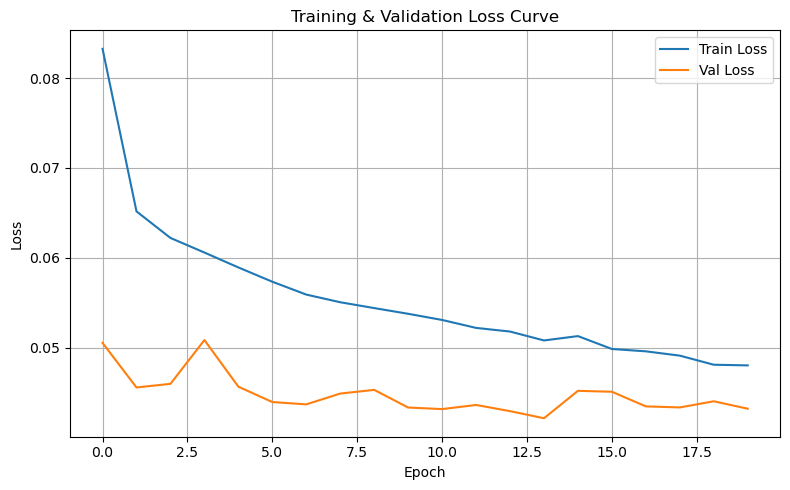

In [1]:
# === notebook.ipynb ===
from Emotalk_model_v0002 import EmoTalk
from train_hdft import HDTFDataset  
from loss_v0003 import EmoTalkLoss
from torch.utils.data import DataLoader
import torch
import os
import csv
from tqdm import tqdm
from types import SimpleNamespace
import matplotlib.pyplot as plt

# === 配置 ===
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EPOCHS = 20
LR = 1e-5
SAVE_PATH = 'emotalk_finetuned_HDTF.pth'
LOG_CSV = 'training_log.csv'
BATCH_SIZE = 1

args = SimpleNamespace(
    feature_dim=1024, bs_dim=52, device=DEVICE, batch_size=BATCH_SIZE,
    max_seq_len=512, period=20, emotion_dim=256, emo_gru_hidden=128,
    emo_gru_layers=2, transformer_layers=4, transformer_heads=8,
    transformer_dim=512, num_emotions=8, num_person=25
)

# === 数据加载 ===
train_dataset = HDTFDataset('./data/HDTF/train')
val_dataset = HDTFDataset('./data/HDTF/val')
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

# === 初始化模型 ===
model = EmoTalk(args).to(DEVICE)

# === 加载预训练权重并冻结情绪模块 ===
if os.path.exists("./pretrain_model/emotalk_finetuned_ravdess.pth"):
    state_dict = torch.load("./pretrain_model/emotalk_finetuned.pth", map_location=DEVICE)
    model.load_state_dict(state_dict, strict=False)
    print("✅ Loaded pretrained RAVDESS weights")

# 冻结情绪模块参数
for name, param in model.named_parameters():
    if 'film_gamma' in name or 'film_beta' in name \
       or 'obj_vector_level' in name or 'obj_vector_person' in name:
        param.requires_grad = False
        print(f"❄️ 冻结: {name}")
    else:
        param.requires_grad = True  # 精调其他模块


# === 优化器 ===
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()), lr=LR
)

# === 损失函数 ===
loss_fn = EmoTalkLoss(region_weighted=True, mouth_only=True)

# === 初始化 CSV 日志 ===
with open(LOG_CSV, mode='w', newline='') as log_file:
    log_writer = csv.writer(log_file)
    log_writer.writerow(['Epoch', 'Train_Loss', 'Main_Loss', 'Smooth_Loss', 'Vel_Loss', 'Val_Loss'])

train_loss_list, val_loss_list = [], []

# === 训练循环 ===
for epoch in range(EPOCHS):
    model.train()
    total_loss = 0.0
    logs_accum = {"main": 0, "smooth": 0, "vel": 0, "total": 0}

    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        blendshape = batch["blendshape"].to(DEVICE)
        args.target_len = blendshape.size(1)
        pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])

        loss, logs = loss_fn(pred, blendshape)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        for k in logs:
            logs_accum[k] += logs[k]

    avg_loss = total_loss / len(train_loader)
    train_loss_list.append(avg_loss)

    # === 验证 ===
    model.eval()
    with torch.no_grad():
        val_loss = 0.0
        for batch in val_loader:
            blendshape = batch["blendshape"].to(DEVICE)
            args.target_len = blendshape.size(1)
            pred = model(batch["audio"].to(DEVICE), batch["level"], batch["person"])
            loss, _ = loss_fn(pred, blendshape)
            val_loss += loss.item()
        val_avg = val_loss / len(val_loader)
        val_loss_list.append(val_avg)

    # === 日志写入 ===
    with open(LOG_CSV, mode='a', newline='') as log_file:
        log_writer = csv.writer(log_file)
        log_writer.writerow([
            epoch + 1, round(avg_loss, 6), round(logs_accum['main'], 6),
            round(logs_accum['smooth'], 6), round(logs_accum['vel'], 6), round(val_avg, 6)
        ])

    # === 保存模型 ===
    torch.save(model.state_dict(), SAVE_PATH)

# === 绘制损失曲线 ===
plt.figure(figsize=(8,5))
plt.plot(train_loss_list, label='Train Loss')
plt.plot(val_loss_list, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('loss_curve.png')
plt.show()


In [4]:
# === Test 评估 ===
from loss_v0003 import smoothness_loss, velocity_loss  # 仅做备选，你其实不再需要它们

# 构建 Test Loader
test_dataset = HDTFDataset('./data/HDTF/test')
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# 加载最佳模型
model.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))
model.eval()

# 在 Test 集上累积三项指标
test_main, test_smooth, test_vel = 0.0, 0.0, 0.0
with torch.no_grad():
    for batch in tqdm(test_loader, desc="Test Set"):
        audio      = batch["audio"].to(DEVICE)
        blendshape = batch["blendshape"].to(DEVICE)
        level      = batch["level"].to(DEVICE)
        person     = batch["person"].to(DEVICE)

        # 对齐长度
        args.target_len = blendshape.size(1)

        # 前向
        pred = model(audio, level, person)

        # 用封装好的 loss_fn 计算并拿到分项日志
        _, logs = loss_fn(pred, blendshape)
        test_main   += logs["main"]
        test_smooth += logs["smooth"]
        test_vel    += logs["vel"]

# 打印平均值
n = len(test_loader)
print(f"\n>>> Test Results:")
print(f"    ▶ L1 (main) Loss:     {test_main   / n:.6f}")
print(f"    ▶ Smooth    Loss:      {test_smooth / n:.6f}")
print(f"    ▶ Velocity  Loss:      {test_vel    / n:.6f}")


Test Set:  21%|█████████████████████                                                                               | 4/19 [00:00<00:00, 34.70it/s]

👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])


Test Set:  68%|███████████████████████████████████████████████████████████████████▋                               | 13/19 [00:00<00:00, 36.96it/s]

🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])

Test Set: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 38.30it/s]

🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])
👀 Input audio shape (preprocess): torch.Size([1, 1, 40000])
🎯 fused_input: torch.Size([1, 124, 576])
🎯 memory_input: torch.Size([1, 124, 576])

>>> Test Results:
    ▶ L1 (main) Loss:     0.024221
    ▶ Smooth    Loss:      0.000008
    ▶ Velocity  Loss:      0.007671


In [1]:
!python demo_batch_levels.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/scared.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/ravdess/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned_ravdess.pth" 
!python demo_batch_levels.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/scared.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/HDTF/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned_HDTF.pth" 


🧪 正在测试情绪等级 0 ...
/transfer/emotalk/EmoTalk_release-main/demo_batch_levels.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(args.model_p

In [4]:
!python demo.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/scared.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/ravdess/" --model_path "/transfer/emotalk/EmoTalk_release-main/pretrain_model/EmoTalk.pth" 

config.json: 100%|█████████████████████████| 1.53k/1.53k [00:00<00:00, 21.0MB/s]
config.json: 100%|█████████████████████████| 1.53k/1.53k [00:00<00:00, 22.5MB/s]
model.safetensors: 100%|████████████████████| 1.26G/1.26G [00:11<00:00, 114MB/s]
Some weights of Wav2Vec2Model were not initialized from the model checkpoint at jonatasgrosman/wav2vec2-large-xlsr-53-english and are newly initialized: ['wav2vec2.lm_head.bias', 'wav2vec2.lm_head.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of Wav2Vec2ForSpeechClassification were not initialized from the model checkpoint at r-f/wav2vec-english-speech-emotion-recognition and are newly initialized: ['wav2vec2.lm_head.bias', 'wav2vec2.lm_head.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/transfer/emotalk/EmoTalk_release-main/demo.py:21: FutureWarning: You are using `torch.load` with `weigh

In [5]:
!python demo_batch_levels.py --wav_path "/transfer/emotalk/EmoTalk_release-main/audio/online_audio/scared.wav" --result_path "/transfer/emotalk/EmoTalk_release-main/result/exp_result/ravdess/" --model_path "/transfer/emotalk/EmoTalk_release-main/emotalk_finetuned.pth" 


🧪 正在测试情绪等级 0 ...
/transfer/emotalk/EmoTalk_release-main/demo_batch_levels.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(args.model_p

/home/s5727214/.pyenv/versions/anaconda3-2024.06-1/envs/emotalk/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


1.12.1+cu113
